In [1]:
from tensorflow.compat.v1 import ConfigProto, InteractiveSession

config = ConfigProto()
config.gpu_options.allow_growth = True
config.gpu_options.per_process_gpu_memory_fraction = 0.6
sess = InteractiveSession(config=config)

import os
import glob
import cv2
import numpy as np # linear algebra
from skimage.io import imread
import matplotlib.pyplot as plt
from skimage.segmentation import mark_boundaries
from skimage.util import montage
from sklearn.model_selection import train_test_split
montage_rgb = lambda x: np.stack([montage(x[:, :, :, i]) for i in range(x.shape[3])], -1)
data_dir = 'dataset'
train_image_dir = os.path.join(data_dir, 'train')
print("train_image_dir : " + train_image_dir)
test_image_dir = os.path.join(data_dir, 'test')
print("test_image_dir : " + test_image_dir)
import gc; gc.enable() # memory is tight
from skimage.morphology import label

train_image_dir : dataset/train
test_image_dir : dataset/test


In [2]:
BATCH_SIZE = 8
EDGE_CROP = 2
NB_EPOCHS = 20
GAUSSIAN_NOISE = 0.1
UPSAMPLE_MODE = 'DECONV'
# downsampling inside the network
NET_SCALING = None
# downsampling in preprocessing
IMG_SCALING = (1, 1)

# number of validation images to use
VALID_IMG_COUNT = 400
# maximum number of steps_per_epoch in training
MAX_TRAIN_STEPS = 200
AUGMENT_BRIGHTNESS = False

In [3]:
def get_all_imgs():
    img_path = os.path.join(train_image_dir,'images')
    images = glob.glob(os.path.join(img_path,'*.*'))
    return [os.path.basename(image) for image in images]

In [4]:

print(len(get_all_imgs()))
TRAIN_IMGS, TEST_IMGS = train_test_split(get_all_imgs())

1326


In [5]:
import random
def cv2_brightness_augment(img):
    hsv = cv2.cvtColor(img,cv2.COLOR_RGB2HSV)
    v = hsv[:,:,2]
    seed = random.uniform(0.5,1.2)
    v = (( v/255.0 ) * seed)*255.0
    hsv[:,:,2] = np.array(np.clip(v,0,255),dtype=np.uint8)
    rgb_final = cv2.cvtColor(hsv,cv2.COLOR_HSV2RGB)
    return rgb_final

In [6]:
def make_image_gen(img_file_list=TRAIN_IMGS, batch_size = BATCH_SIZE):
    all_batches = TRAIN_IMGS
    out_rgb = []
    out_mask = []
    img_path = os.path.join(train_image_dir,'images')
    mask_path = os.path.join(train_image_dir,'masks')
    while True:
        np.random.shuffle(all_batches)
        for c_img_id in all_batches:
            c_img = imread(os.path.join(img_path,c_img_id))
            c_img = cv2_brightness_augment(c_img)
            c_mask = cv2.imread(os.path.join(mask_path,c_img_id), cv2.IMREAD_GRAYSCALE)
            if IMG_SCALING is not None:
                c_img = cv2.resize(c_img,(1024,1024),interpolation = cv2.INTER_AREA)
                c_mask = cv2.resize(c_mask,(1024,1024),interpolation = cv2.INTER_AREA)
            c_mask = np.reshape(c_mask,(c_mask.shape[0],c_mask.shape[1],-1))
            c_mask = c_mask > 0
            c_img = tf.cast(c_img, tf.float32)
            c_mask = tf.cast(c_mask, tf.float32)
            out_rgb += [c_img]
            out_mask += [c_mask]
            if len(out_rgb)>=batch_size:
                yield np.stack(out_rgb, 0)/255.0, np.stack(out_mask, 0)
                out_rgb, out_mask=[], []

## Make Training Set

In [7]:
import tensorflow as tf
train_gen = make_image_gen()
train_x, train_y = next(train_gen)
print('x', train_x.shape, train_x.min(), train_x.max())
print('y', train_y.shape, train_y.min(), train_y.max())

x (1, 1024, 1024, 3) 0.0 0.77254903
y (1, 1024, 1024, 1) 0.0 1.0


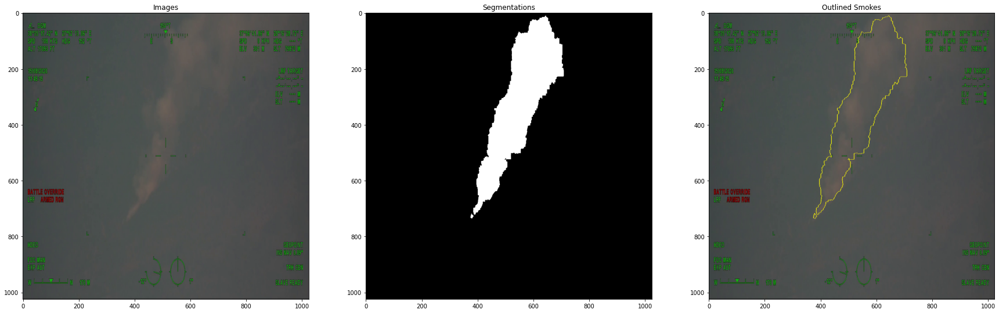

In [8]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (30, 10))
batch_rgb = montage_rgb(train_x)
batch_seg = montage(train_y[:, :, :, 0])
ax1.imshow(batch_rgb)
ax1.set_title('Images')
ax2.imshow(batch_seg, cmap='gray')
ax2.set_title('Segmentations')
ax3.imshow(mark_boundaries(batch_rgb, 
                           batch_seg.astype(int)))
ax3.set_title('Outlined Smokes')
fig.savefig('overview.png')

## Make Validation Set

In [9]:
valid_x, valid_y = next(make_image_gen(TEST_IMGS,len(TEST_IMGS)))
print(valid_x.shape, valid_y.shape)

ResourceExhaustedError: OOM when allocating tensor with shape[1024,1024,1] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc [Op:Cast]

## Augment Data

In [10]:
from keras.preprocessing.image import ImageDataGenerator
dg_args = dict(featurewise_center = False, 
                  samplewise_center = False,
                  rotation_range = 15, 
                  width_shift_range = 0.1, 
                  height_shift_range = 0.1, 
                  shear_range = 0.01,
                  zoom_range = [0.9, 1.25],  
                  horizontal_flip = True, 
                  vertical_flip = False,
                  fill_mode = 'reflect',
                   data_format = 'channels_last')
# brightness can be problematic since it seems to change the labels differently from the images 
if AUGMENT_BRIGHTNESS:
    dg_args[' brightness_range'] = [0.5, 1.5]
image_gen = ImageDataGenerator(**dg_args)

if AUGMENT_BRIGHTNESS:
    dg_args.pop('brightness_range')
label_gen = ImageDataGenerator(**dg_args)

def create_aug_gen(in_gen, seed = None):
    np.random.seed(seed if seed is not None else np.random.choice(range(9999)))
    for in_x, in_y in in_gen:
        seed = np.random.choice(range(9999))
        # keep the seeds syncronized otherwise the augmentation to the images is different from the masks
        g_x = image_gen.flow(255*in_x, 
                             batch_size = in_x.shape[0], 
                             seed = seed, 
                             shuffle=True)
        # print("g_x : ", g_x)
        g_y = label_gen.flow(in_y, 
                             batch_size = in_x.shape[0], 
                             seed = seed, 
                             shuffle=True)

        yield next(g_x)/255.0, next(g_y)

x (8, 512, 512, 3) float32 0.0 1.0
y (8, 512, 512, 1) float32 0.0 1.0


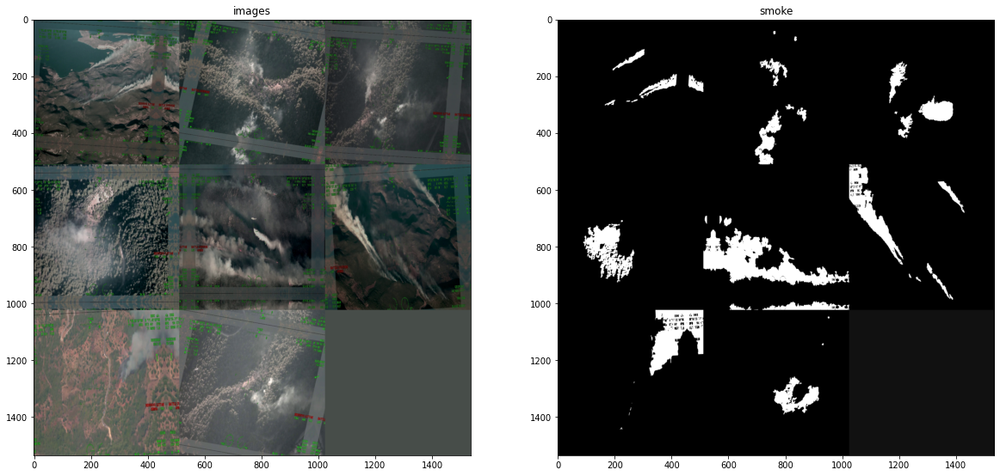

In [11]:
cur_gen = create_aug_gen(train_gen)
t_x, t_y = next(cur_gen)
print('x', t_x.shape, t_x.dtype, t_x.min(), t_x.max())
print('y', t_y.shape, t_y.dtype, t_y.min(), t_y.max())
# only keep first 9 samples to examine in detail
t_x = t_x[:9]
t_y = t_y[:9]
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (20, 10))
ax1.imshow(montage_rgb(t_x), cmap='gray')
ax1.set_title('images')
ax2.imshow(montage(t_y[:, :, :, 0]), cmap='gray')
ax2.set_title('smoke')
fig.savefig('augmentations.png')

In [12]:
gc.collect()

35

## Build a Model
### Here we use a slight deviation on the U-Net standard model

In [13]:
# from keras import models, layers

# def upsample_conv(filters, kernel_size, strides, padding):
#     return layers.Conv2DTranspose(filters, kernel_size, strides=strides, padding=padding)
# def upsample_simple(filters, kernel_size, strides, padding):
#     return layers.UpSampling2D(strides)

# if UPSAMPLE_MODE=='DECONV':
#     upsample=upsample_conv
# else:
#     upsample=upsample_simple
    
# input_img = layers.Input(t_x.shape[1:], name = 'RGB_Input')
# pp_in_layer = input_img
# if NET_SCALING is not None:
#     pp_in_layer = layers.AvgPool2D(NET_SCALING)(pp_in_layer)
    
# pp_in_layer = layers.GaussianNoise(GAUSSIAN_NOISE)(pp_in_layer)
# pp_in_layer = layers.BatchNormalization()(pp_in_layer)

# cz1 = layers.Conv2D(8, (3, 3), activation='relu', padding='same') (pp_in_layer)
# cz1 = layers.Conv2D(8, (3, 3), activation='relu', padding='same') (cz1)
# pz1 = layers.MaxPooling2D((2, 2)) (cz1)

# c1 = layers.Conv2D(16, (3, 3), activation='relu', padding='same') (pz1)
# c1 = layers.Conv2D(16, (3, 3), activation='relu', padding='same') (c1)
# p1 = layers.MaxPooling2D((2, 2)) (c1)

# c2 = layers.Conv2D(32, (3, 3), activation='relu', padding='same') (p1)
# c2 = layers.Conv2D(32, (3, 3), activation='relu', padding='same') (c2)
# p2 = layers.MaxPooling2D((2, 2)) (c2)

# c3 = layers.Conv2D(64, (3, 3), activation='relu', padding='same') (p2)
# c3 = layers.Conv2D(64, (3, 3), activation='relu', padding='same') (c3)
# p3 = layers.MaxPooling2D((2, 2)) (c3)

# c4 = layers.Conv2D(128, (3, 3), activation='relu', padding='same') (p3)
# c4 = layers.Conv2D(128, (3, 3), activation='relu', padding='same') (c4)
# p4 = layers.MaxPooling2D(pool_size=(2, 2)) (c4)


# c5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same') (p4)
# c5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same') (c5)
# p5 = layers.MaxPooling2D(pool_size=(2, 2)) (c5)

# cx1 = layers.Conv2D(512, (3, 3), activation='relu', padding='same') (p5)
# cx1 = layers.Conv2D(512, (3, 3), activation='relu', padding='same') (cx1)

# ux1 = upsample(256, (2, 2), strides=(2, 2), padding='same') (cx1)
# ux1 = layers.concatenate([ux1, c5])
# cx2 = layers.Conv2D(256, (3, 3), activation='relu', padding='same') (ux1)
# cx2 = layers.Conv2D(256, (3, 3), activation='relu', padding='same') (cx2)

# u6 = upsample(128, (2, 2), strides=(2, 2), padding='same') (cx2)
# u6 = layers.concatenate([u6, c4])
# c6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same') (u6)
# c6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same') (c6)

# u7 = upsample(64, (2, 2), strides=(2, 2), padding='same') (c6)
# u7 = layers.concatenate([u7, c3])
# c7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same') (u7)
# c7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same') (c7)

# u8 = upsample(32, (2, 2), strides=(2, 2), padding='same') (c7)
# u8 = layers.concatenate([u8, c2])
# c8 = layers.Conv2D(32, (3, 3), activation='relu', padding='same') (u8)
# c8 = layers.Conv2D(32, (3, 3), activation='relu', padding='same') (c8)

# u9 = upsample(16, (2, 2), strides=(2, 2), padding='same') (c8)
# u9 = layers.concatenate([u9, c1], axis=3)
# c9 = layers.Conv2D(16, (3, 3), activation='relu', padding='same') (u9)
# c9 = layers.Conv2D(16, (3, 3), activation='relu', padding='same') (c9)

# uz1 = upsample(8, (2, 2), strides=(2, 2), padding='same') (c9)
# uz1 = layers.concatenate([uz1, cz1], axis=3)
# cz2 = layers.Conv2D(8, (3, 3), activation='relu', padding='same') (uz1)
# cz2 = layers.Conv2D(8, (3, 3), activation='relu', padding='same') (cz2)

# d = layers.Conv2D(1, (1, 1), activation='sigmoid') (cz2)
# d = layers.Cropping2D((EDGE_CROP, EDGE_CROP))(d)
# d = layers.ZeroPadding2D((EDGE_CROP, EDGE_CROP))(d)
# if NET_SCALING is not None:
#     d = layers.UpSampling2D(NET_SCALING)(d)

# seg_model = models.Model(inputs=[input_img], outputs=[d])
# seg_model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
RGB_Input (InputLayer)          [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
gaussian_noise (GaussianNoise)  (None, 512, 512, 3)  0           RGB_Input[0][0]                  
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 512, 512, 3)  12          gaussian_noise[0][0]             
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 512, 512, 8)  224         batch_normalization[0][0]        
_______________________________________________________________________________________

In [ ]:
from keras import models, layers

def upsample_conv(filters, kernel_size, strides, padding):
    return layers.Conv2DTranspose(filters, kernel_size, strides=strides, padding=padding)
def upsample_simple(filters, kernel_size, strides, padding):
    return layers.UpSampling2D(strides)

if UPSAMPLE_MODE=='DECONV':
    upsample=upsample_conv
else:
    upsample=upsample_simple
    
input_img = layers.Input(t_x.shape[1:], name = 'RGB_Input')
pp_in_layer = input_img
if NET_SCALING is not None:
    pp_in_layer = layers.AvgPool2D(NET_SCALING)(pp_in_layer)
    
pp_in_layer = layers.GaussianNoise(GAUSSIAN_NOISE)(pp_in_layer)
pp_in_layer = layers.BatchNormalization()(pp_in_layer)


c1 = layers.Conv2D(16, (3, 3), activation='relu', padding='same') (pp_in_layer)
c1 = layers.Conv2D(16, (3, 3), activation='relu', padding='same') (c1)
p1 = layers.MaxPooling2D((2, 2)) (c1)

c2 = layers.Conv2D(32, (3, 3), activation='relu', padding='same') (p1)
c2 = layers.Conv2D(32, (3, 3), activation='relu', padding='same') (c2)
p2 = layers.MaxPooling2D((2, 2)) (c2)

c3 = layers.Conv2D(64, (3, 3), activation='relu', padding='same') (p2)
c3 = layers.Conv2D(64, (3, 3), activation='relu', padding='same') (c3)
p3 = layers.MaxPooling2D((2, 2)) (c3)

c4 = layers.Conv2D(128, (3, 3), activation='relu', padding='same') (p3)
c4 = layers.Conv2D(128, (3, 3), activation='relu', padding='same') (c4)
p4 = layers.MaxPooling2D(pool_size=(2, 2)) (c4)


c5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same') (p4)
c5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same') (c5)
p5 = layers.MaxPooling2D(pool_size=(2, 2)) (c5)


c6 = layers.Conv2D(512, (3, 3), activation='relu', padding='same') (p5)
c6 = layers.Conv2D(512, (3, 3), activation='relu', padding='same') (c6)
p6 = layers.MaxPooling2D(pool_size=(2, 2)) (c6)


c7 = layers.Conv2D(1024, (3, 3), activation='relu', padding='same') (p6)
c7 = layers.Conv2D(1024, (3, 3), activation='relu', padding='same') (c7)


u8 = upsample(512, (2, 2), strides=(2, 2), padding='same') (c7)
u8 = layers.concatenate([u8, c6])
c8 = layers.Conv2D(512, (3, 3), activation='relu', padding='same') (u8)
c8 = layers.Conv2D(512, (3, 3), activation='relu', padding='same') (c8)


u9 = upsample(256, (2, 2), strides=(2, 2), padding='same') (c8)
u9 = layers.concatenate([u9, c5])
c9 = layers.Conv2D(256, (3, 3), activation='relu', padding='same') (u9)
c9 = layers.Conv2D(256, (3, 3), activation='relu', padding='same') (c9)


u10 = upsample(128, (2, 2), strides=(2, 2), padding='same') (c9)
u10 = layers.concatenate([u10, c4])
c10 = layers.Conv2D(128, (3, 3), activation='relu', padding='same') (u10)
c10 = layers.Conv2D(128, (3, 3), activation='relu', padding='same') (c10)


u11 = upsample(64, (2, 2), strides=(2, 2), padding='same') (c10)
u11 = layers.concatenate([u11, c3])
c11 = layers.Conv2D(64, (3, 3), activation='relu', padding='same') (u11)
c11 = layers.Conv2D(64, (3, 3), activation='relu', padding='same') (c11)

u12 = upsample(32, (2, 2), strides=(2, 2), padding='same') (c11)
u12 = layers.concatenate([u12, c2])
c12 = layers.Conv2D(32, (3, 3), activation='relu', padding='same') (u12)
c12 = layers.Conv2D(32, (3, 3), activation='relu', padding='same') (c12)


u12 = upsample(32, (2, 2), strides=(2, 2), padding='same') (c11)
u12 = layers.concatenate([u12, c2])
c12 = layers.Conv2D(32, (3, 3), activation='relu', padding='same') (u12)
c12 = layers.Conv2D(32, (3, 3), activation='relu', padding='same') (c12)


u13 = upsample(16, (2, 2), strides=(2, 2), padding='same') (c12)
u13 = layers.concatenate([u13, c1])
c13 = layers.Conv2D(16, (3, 3), activation='relu', padding='same') (u13)
c13 = layers.Conv2D(16, (3, 3), activation='relu', padding='same') (c13)

d = layers.Conv2D(1, (1, 1), activation='sigmoid') (c13)
d = layers.Cropping2D((EDGE_CROP, EDGE_CROP))(d)
d = layers.ZeroPadding2D((EDGE_CROP, EDGE_CROP))(d)
if NET_SCALING is not None:
    d = layers.UpSampling2D(NET_SCALING)(d)

seg_model = models.Model(inputs=[input_img], outputs=[d])
seg_model.summary()

In [14]:
import keras.backend as K
from keras.optimizers import Adam
from keras.losses import binary_crossentropy
def dice_coef(y_true, y_pred, smooth=1):
    intersection = K.sum(y_true * y_pred, axis=[1,2,3])
    union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])
    return K.mean( (2. * intersection + smooth) / (union + smooth), axis=0)
def dice_p_bce(in_gt, in_pred):
    return 1e-3*binary_crossentropy(in_gt, in_pred) - dice_coef(in_gt, in_pred)
def true_positive_rate(y_true, y_pred):
    return K.sum(K.flatten(y_true)*K.flatten(K.round(y_pred)))/K.sum(y_true)
seg_model.compile(optimizer=Adam(1e-4, decay=1e-6), loss=dice_p_bce, metrics=[dice_coef, 'binary_accuracy', true_positive_rate])

In [15]:
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
weight_path="{}_weights.best.hdf5".format('seg_model')
# print("weight_path : " + weight_path)

checkpoint = ModelCheckpoint(weight_path, monitor='val_dice_coef', verbose=1, 
                             save_best_only=True, mode='max', save_weights_only = True)

reduceLROnPlat = ReduceLROnPlateau(monitor='val_dice_coef', factor=0.5, 
                                   patience=3, 
                                   verbose=1, mode='max', epsilon=0.0001, cooldown=2, min_lr=1e-6)
early = EarlyStopping(monitor="val_dice_coef", 
                      mode="max", 
                      patience=20) # probably needs to be more patient, but kaggle time is limited
callbacks_list = [checkpoint, early, reduceLROnPlat]

W0909 08:52:39.047890 140289783531264 callbacks.py:2323] `epsilon` argument is deprecated and will be removed, use `min_delta` instead.


In [16]:
step_count = min(MAX_TRAIN_STEPS, len(TRAIN_IMGS)//BATCH_SIZE)
aug_gen = create_aug_gen(make_image_gen())
val_gen = make_image_gen(TEST_IMGS, len(TEST_IMGS)//BATCH_SIZE)
loss_history = [seg_model.fit_generator(aug_gen, 
                             steps_per_epoch=step_count, 
                             epochs=NB_EPOCHS, 
                             validation_data=val_gen,
                             validation_steps=len(TEST_IMGS)//BATCH_SIZE,
                             callbacks=callbacks_list,
                            workers=1 # the generator is not very thread safe
                                       )]

W0909 08:52:39.053176 140289783531264 deprecation.py:323] From <ipython-input-16-0199fdd9448e>:10: Model.fit_generator (from tensorflow.python.keras.engine.training) is deprecated and will be removed in a future version.
Instructions for updating:
Please use Model.fit, which supports generators.


Epoch 1/30
  2/124 [..............................] - ETA: 7s - loss: -0.1270 - dice_coef: 0.1278 - binary_accuracy: 0.2802 - true_positive_rate: 0.7384

W0909 08:52:43.864288 140289783531264 callbacks.py:328] Callbacks method `on_train_batch_end` is slow compared to the batch time (batch time: 0.0337s vs `on_train_batch_end` time: 0.0866s). Check your callbacks.


124/124 [==============================] - ETA: 0s - loss: -0.1760 - dice_coef: 0.1773 - binary_accuracy: 0.3802 - true_positive_rate: 0.8770
Epoch 00001: val_dice_coef improved from -inf to 0.21743, saving model to seg_model_weights.best.hdf5
124/124 [==============================] - 166s 1s/step - loss: -0.1760 - dice_coef: 0.1773 - binary_accuracy: 0.3802 - true_positive_rate: 0.8770 - val_loss: -0.2155 - val_dice_coef: 0.2174 - val_binary_accuracy: 0.4742 - val_true_positive_rate: 0.9495
Epoch 2/30
124/124 [==============================] - ETA: 0s - loss: -0.3886 - dice_coef: 0.3902 - binary_accuracy: 0.8135 - true_positive_rate: 0.6342
Epoch 00002: val_dice_coef improved from 0.21743 to 0.39692, saving model to seg_model_weights.best.hdf5
124/124 [==============================] - 158s 1s/step - loss: -0.3886 - dice_coef: 0.3902 - binary_accuracy: 0.8135 - true_positive_rate: 0.6342 - val_loss: -0.3962 - val_dice_coef: 0.3969 - val_binary_accuracy: 0.8600 - val_true_positive_rat

Epoch 18/30
124/124 [==============================] - ETA: 0s - loss: -0.5704 - dice_coef: 0.5713 - binary_accuracy: 0.9037 - true_positive_rate: 0.6107
Epoch 00018: val_dice_coef improved from 0.54906 to 0.54915, saving model to seg_model_weights.best.hdf5
124/124 [==============================] - 158s 1s/step - loss: -0.5704 - dice_coef: 0.5713 - binary_accuracy: 0.9037 - true_positive_rate: 0.6107 - val_loss: -0.5482 - val_dice_coef: 0.5492 - val_binary_accuracy: 0.8803 - val_true_positive_rate: 0.7143
Epoch 19/30
124/124 [==============================] - ETA: 0s - loss: -0.5845 - dice_coef: 0.5854 - binary_accuracy: 0.9118 - true_positive_rate: 0.6380
Epoch 00019: val_dice_coef did not improve from 0.54915

Epoch 00019: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.
124/124 [==============================] - 158s 1s/step - loss: -0.5845 - dice_coef: 0.5854 - binary_accuracy: 0.9118 - true_positive_rate: 0.6380 - val_loss: -0.5370 - val_dice_coef: 0.5380 - val

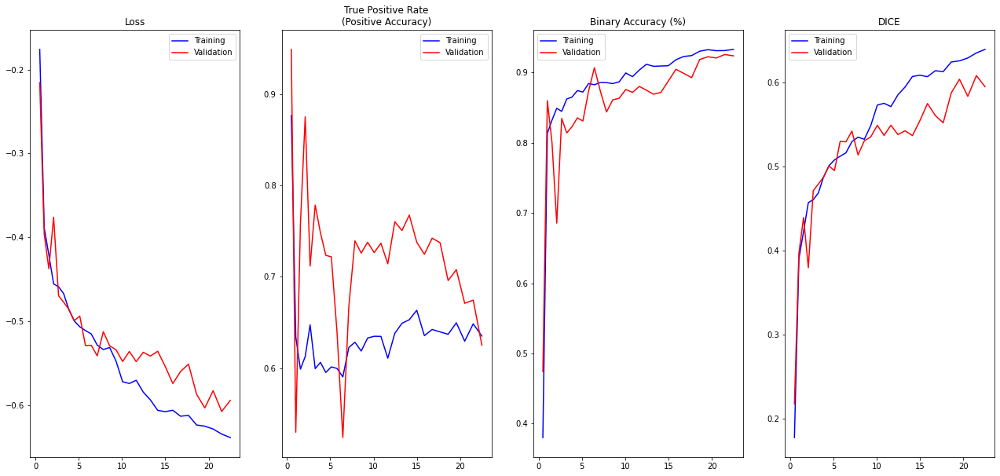

In [17]:
def show_loss(loss_history):
    epich = np.cumsum(np.concatenate(
        [np.linspace(0.5, 1, len(mh.epoch)) for mh in loss_history]))
    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(22, 10))
    _ = ax1.plot(epich,
                 np.concatenate([mh.history['loss'] for mh in loss_history]),
                 'b-',
                 epich, np.concatenate(
            [mh.history['val_loss'] for mh in loss_history]), 'r-')
    ax1.legend(['Training', 'Validation'])
    ax1.set_title('Loss')

    _ = ax2.plot(epich, np.concatenate(
        [mh.history['true_positive_rate'] for mh in loss_history]), 'b-',
                     epich, np.concatenate(
            [mh.history['val_true_positive_rate'] for mh in loss_history]),
                     'r-')
    ax2.legend(['Training', 'Validation'])
    ax2.set_title('True Positive Rate\n(Positive Accuracy)')
    
    _ = ax3.plot(epich, np.concatenate(
        [mh.history['binary_accuracy'] for mh in loss_history]), 'b-',
                     epich, np.concatenate(
            [mh.history['val_binary_accuracy'] for mh in loss_history]),
                     'r-')
    ax3.legend(['Training', 'Validation'])
    ax3.set_title('Binary Accuracy (%)')
    
    _ = ax4.plot(epich, np.concatenate(
        [mh.history['dice_coef'] for mh in loss_history]), 'b-',
                     epich, np.concatenate(
            [mh.history['val_dice_coef'] for mh in loss_history]),
                     'r-')
    ax4.legend(['Training', 'Validation'])
    ax4.set_title('DICE')

show_loss(loss_history)

In [18]:
seg_model.load_weights(weight_path)
seg_model.save('seg_model.h5')

In [19]:
pred_y = seg_model.predict(valid_x)
print(pred_y.shape, pred_y.min(), pred_y.max(), pred_y.mean())

(332, 512, 512, 1) 0.0 1.0 0.11307481


## Prepare Full Resolution Model

In [20]:
# if IMG_SCALING is not None:
#     fullres_model = models.Sequential()
#     fullres_model.add(layers.AvgPool2D(IMG_SCALING, input_shape = (None, None, 3)))
#     fullres_model.add(seg_model)
#     fullres_model.add(layers.UpSampling2D(IMG_SCALING))
# else:
#     fullres_model = seg_model
# fullres_model.save('fullres_model.h5')

## Run the test data

In [21]:
test_paths = os.listdir(test_image_dir)
print(len(test_paths), 'test images found')

10 test images found


In [22]:
fig, m_axs = plt.subplots(8, 3, figsize = (100, 400))
[c_ax.axis('off') for c_ax in m_axs.flatten()]
i = 0
for (ax1, ax2, ax3), c_img_name in zip(m_axs, test_paths):
    c_path = os.path.join(test_image_dir, c_img_name)
    c_img = imread(c_path)
    print("c_path" + c_path)
    c_img = cv2.resize(c_img,(1024,1024))
    first_img = np.expand_dims(c_img, 0)/255.0
    first_seg = seg_model.predict(first_img)
    first_img[0][:,:,0] = (first_img[0][:,:,0]*0.7 + 0.5*first_seg[0, :, :, 0])
    result = np.array(np.clip(first_img[0]*255.,0,255),dtype=np.int32)
    ax1.imshow(c_img)
    ax1.set_title('Image')
    ax2.imshow(result)
    # cv2.imwrite( "/home/fatihdemirtas/Projects/Others/Smoke-semantic-segmentation/dataset/test/" + str(i) + "result.png", result)
    ax2.set_title('Image+Prediction')
    ax3.imshow(first_seg[0, :, :, 0], vmin = 0, vmax = 1, cmap='gray')
    # cv2.imwrite( "/home/fatihdemirtas/Projects/Others/Smoke-semantic-segmentation/dataset/test/" + str(i) + "prediction.png", first_seg[0, :, :, 0])
    ax3.set_title('Prediction')
    i = i + 1
fig.savefig('test_predictions.png')

c_pathdataset/test/image2.jpg
c_pathdataset/test/image3.jpg
c_pathdataset/test/image6.jpg
c_pathdataset/test/image9.jpg
c_pathdataset/test/image4.jpg
c_pathdataset/test/image10.jpg
c_pathdataset/test/image1.jpg
c_pathdataset/test/image7.jpg


In [23]:
from moviepy.editor import VideoFileClip
import time
def process_image(image):
    start = time.time()
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
    image_shape = image.shape[:2]
#     print(image_shape)
    image = cv2.resize(image,(1024,1024))
    first_img = np.expand_dims(image, 0)/255.0
#     result = image_pipeline(image)
    first_seg = seg_model.predict(first_img)
    first_img[0][:,:,0] = first_img[0][:,:,0]*0.7 + 0.3*first_seg[0, :, :, 0]
    result = np.array(np.clip(first_img[0]*255,0,255),dtype=np.float)
#     print(image_shape[:2],result.shape,type(result[0][0][0]))
    result = cv2.resize(result,image_shape[::-1])
#     result = result[...,::-1]
    end = time.time()
    print("FRAME PER SECOND : ", 1/(end - start))
    return result

In [24]:
filename='test_video.mp4'
clip = VideoFileClip(filename)
white_clip = clip.fl_image(process_image)
%time white_clip.write_videofile(filename.split('.')[0]+'_result.mp4', audio=False)

t:   0%|          | 3/15316 [00:00<09:18, 27.42it/s, now=None]

FRAME PER SECOND :  22.756543252745345
Moviepy - Building video çeşme14_detection.mp4.
Moviepy - Writing video çeşme14_detection.mp4

FRAME PER SECOND :  22.921698071962577
FRAME PER SECOND :  22.246346909657948


t:   0%|          | 7/15316 [00:00<11:29, 22.20it/s, now=None]

FRAME PER SECOND :  21.44623235313668
FRAME PER SECOND :  23.924251066645372
FRAME PER SECOND :  22.190910533834188
FRAME PER SECOND :  24.229965800905813


t:   0%|          | 11/15316 [00:00<12:20, 20.66it/s, now=None]

FRAME PER SECOND :  23.80733012822332
FRAME PER SECOND :  23.752861293117608
FRAME PER SECOND :  23.306997705032813
FRAME PER SECOND :  23.83804489911907


t:   0%|          | 15/15316 [00:00<12:51, 19.83it/s, now=None]

FRAME PER SECOND :  23.381445597761253
FRAME PER SECOND :  23.636539870386024
FRAME PER SECOND :  23.831272727272726
FRAME PER SECOND :  22.576360592734535


t:   0%|          | 19/15316 [00:00<12:53, 19.77it/s, now=None]

FRAME PER SECOND :  24.010120843327286
FRAME PER SECOND :  24.459720780508288
FRAME PER SECOND :  24.122247335760335
FRAME PER SECOND :  24.646425234605914


t:   0%|          | 23/15316 [00:01<13:06, 19.45it/s, now=None]

FRAME PER SECOND :  23.526761574619414
FRAME PER SECOND :  23.82599310380086
FRAME PER SECOND :  23.709224107718224
FRAME PER SECOND :  22.932601409536517


t:   0%|          | 27/15316 [00:01<13:13, 19.27it/s, now=None]

FRAME PER SECOND :  21.430562652005968
FRAME PER SECOND :  24.125161052825327
FRAME PER SECOND :  23.44011579494459
FRAME PER SECOND :  24.241308958924535


t:   0%|          | 31/15316 [00:01<13:14, 19.23it/s, now=None]

FRAME PER SECOND :  23.56390276240611
FRAME PER SECOND :  23.29508861378165
FRAME PER SECOND :  23.2033325403982
FRAME PER SECOND :  23.988698561583117


t:   0%|          | 35/15316 [00:01<13:29, 18.87it/s, now=None]

FRAME PER SECOND :  22.561059443060852
FRAME PER SECOND :  21.216464077777946
FRAME PER SECOND :  22.75851890437123
FRAME PER SECOND :  23.451124666625663


t:   0%|          | 39/15316 [00:01<13:29, 18.88it/s, now=None]

FRAME PER SECOND :  23.31425268061122
FRAME PER SECOND :  22.85823905129379
FRAME PER SECOND :  22.998365995152817
FRAME PER SECOND :  23.2965118862475


t:   0%|          | 43/15316 [00:02<13:32, 18.79it/s, now=None]

FRAME PER SECOND :  22.954816112084064
FRAME PER SECOND :  22.009487427060158
FRAME PER SECOND :  22.274583112055232
FRAME PER SECOND :  23.908840613581564


t:   0%|          | 47/15316 [00:02<13:56, 18.25it/s, now=None]

FRAME PER SECOND :  18.94146815092465
FRAME PER SECOND :  18.93317443981005
FRAME PER SECOND :  23.954173972141156
FRAME PER SECOND :  23.690475921511922


t:   0%|          | 51/15316 [00:02<14:28, 17.58it/s, now=None]

FRAME PER SECOND :  23.41839053505525
FRAME PER SECOND :  21.647797184029066
FRAME PER SECOND :  22.671913513513513
FRAME PER SECOND :  16.489896051203825


t:   0%|          | 55/15316 [00:02<14:03, 18.09it/s, now=None]

FRAME PER SECOND :  22.630200549257854
FRAME PER SECOND :  22.19736974411897
FRAME PER SECOND :  23.16578296217745
FRAME PER SECOND :  23.008711298356484


t:   0%|          | 59/15316 [00:03<14:39, 17.35it/s, now=None]

FRAME PER SECOND :  17.442544414132676
FRAME PER SECOND :  22.44419591496011
FRAME PER SECOND :  22.411336300634247
FRAME PER SECOND :  18.378417222054257


t:   0%|          | 63/15316 [00:03<14:38, 17.36it/s, now=None]

FRAME PER SECOND :  20.369202676845674
FRAME PER SECOND :  23.091937126655104
FRAME PER SECOND :  18.08957875987113
FRAME PER SECOND :  23.20936718386861


t:   0%|          | 67/15316 [00:03<14:19, 17.75it/s, now=None]

FRAME PER SECOND :  22.444676330984144
FRAME PER SECOND :  20.97508576457998
FRAME PER SECOND :  21.899969193978727
FRAME PER SECOND :  22.22477506597005


t:   0%|          | 71/15316 [00:03<14:20, 17.72it/s, now=None]

FRAME PER SECOND :  22.309652986106677
FRAME PER SECOND :  16.96930857304689
FRAME PER SECOND :  22.21735837063326
FRAME PER SECOND :  23.532173454445484


t:   0%|          | 75/15316 [00:04<13:59, 18.16it/s, now=None]

FRAME PER SECOND :  22.08295513178262
FRAME PER SECOND :  22.57964211115657
FRAME PER SECOND :  22.32211986226643
FRAME PER SECOND :  23.31503026731963


t:   1%|          | 79/15316 [00:04<14:32, 17.46it/s, now=None]

FRAME PER SECOND :  17.857904977626017
FRAME PER SECOND :  22.95192702319651
FRAME PER SECOND :  20.66953804910261
FRAME PER SECOND :  19.64867308458061


t:   1%|          | 83/15316 [00:04<14:23, 17.63it/s, now=None]

FRAME PER SECOND :  23.604083424313707
FRAME PER SECOND :  23.176023340111396
FRAME PER SECOND :  18.273366124837167
FRAME PER SECOND :  23.112805902871532


t:   1%|          | 87/15316 [00:04<14:25, 17.59it/s, now=None]

FRAME PER SECOND :  21.797424410930144
FRAME PER SECOND :  23.23032018299336
FRAME PER SECOND :  18.905183449021905
FRAME PER SECOND :  21.803656552319264


t:   1%|          | 91/15316 [00:04<14:15, 17.79it/s, now=None]

FRAME PER SECOND :  18.022576001718768
FRAME PER SECOND :  23.341239322184812
FRAME PER SECOND :  22.600934362892755
FRAME PER SECOND :  22.807153771281598


t:   1%|          | 95/15316 [00:05<14:17, 17.74it/s, now=None]

FRAME PER SECOND :  21.825553925088723
FRAME PER SECOND :  23.402841169052905
FRAME PER SECOND :  18.118256902927047
FRAME PER SECOND :  23.40545306413991


t:   1%|          | 99/15316 [00:05<14:05, 18.01it/s, now=None]

FRAME PER SECOND :  18.926510536528134
FRAME PER SECOND :  23.444177389243514
FRAME PER SECOND :  22.556812803854925
FRAME PER SECOND :  23.365424574812405


t:   1%|          | 103/15316 [00:05<14:01, 18.09it/s, now=None]

FRAME PER SECOND :  18.854956821951802
FRAME PER SECOND :  23.21347767372872
FRAME PER SECOND :  22.8801850356761
FRAME PER SECOND :  22.535119249098713


t:   1%|          | 107/15316 [00:05<14:15, 17.78it/s, now=None]

FRAME PER SECOND :  22.9958441615404
FRAME PER SECOND :  16.066190665890357
FRAME PER SECOND :  21.895281945270984
FRAME PER SECOND :  23.38796449123433


t:   1%|          | 111/15316 [00:06<14:03, 18.03it/s, now=None]

FRAME PER SECOND :  20.695953380735506
FRAME PER SECOND :  23.20962404683644
FRAME PER SECOND :  21.823396273537536
FRAME PER SECOND :  22.934106132268912


t:   1%|          | 115/15316 [00:06<14:16, 17.75it/s, now=None]

FRAME PER SECOND :  21.832370363430048
FRAME PER SECOND :  17.861022867606355
FRAME PER SECOND :  20.639533109926827
FRAME PER SECOND :  23.71901172292502


t:   1%|          | 119/15316 [00:06<14:00, 18.09it/s, now=None]

FRAME PER SECOND :  22.392073118646962
FRAME PER SECOND :  19.57229652166609
FRAME PER SECOND :  22.349953374363892
FRAME PER SECOND :  24.507598908515103


t:   1%|          | 123/15316 [00:06<13:54, 18.20it/s, now=None]

FRAME PER SECOND :  22.571136439464876
FRAME PER SECOND :  23.922886508561195
FRAME PER SECOND :  21.128398357806716
FRAME PER SECOND :  21.776487874272483


t:   1%|          | 127/15316 [00:06<13:51, 18.27it/s, now=None]

FRAME PER SECOND :  18.608434857452153
FRAME PER SECOND :  21.72752938494931
FRAME PER SECOND :  24.121276253134273
FRAME PER SECOND :  24.161015679904146


t:   1%|          | 131/15316 [00:07<13:53, 18.21it/s, now=None]

FRAME PER SECOND :  22.291156462585032
FRAME PER SECOND :  19.17273408787552
FRAME PER SECOND :  23.370632254038302
FRAME PER SECOND :  23.31762259766396


t:   1%|          | 135/15316 [00:07<13:40, 18.51it/s, now=None]

FRAME PER SECOND :  21.467527216333384
FRAME PER SECOND :  23.109876910531476
FRAME PER SECOND :  23.305573151080736
FRAME PER SECOND :  23.726928168169525


t:   1%|          | 139/15316 [00:07<13:33, 18.65it/s, now=None]

FRAME PER SECOND :  23.322419928825624
FRAME PER SECOND :  22.957328954570333
FRAME PER SECOND :  23.04663941272144
FRAME PER SECOND :  22.672771402161164


t:   1%|          | 143/15316 [00:07<13:49, 18.30it/s, now=None]

FRAME PER SECOND :  22.738901086985987
FRAME PER SECOND :  17.367646510780492
FRAME PER SECOND :  23.119303274170434
FRAME PER SECOND :  23.818010426012787


t:   1%|          | 147/15316 [00:08<13:25, 18.84it/s, now=None]

FRAME PER SECOND :  23.79449941000272
FRAME PER SECOND :  24.153919688567168
FRAME PER SECOND :  23.389529566594543
FRAME PER SECOND :  23.577811256267847


t:   1%|          | 151/15316 [00:08<14:09, 17.84it/s, now=None]

FRAME PER SECOND :  17.9877174323258
FRAME PER SECOND :  23.364643623095564
FRAME PER SECOND :  21.413275881433982
FRAME PER SECOND :  19.406573882143913


t:   1%|          | 155/15316 [00:08<13:55, 18.16it/s, now=None]

FRAME PER SECOND :  23.231606874816524
FRAME PER SECOND :  23.003663646534893
FRAME PER SECOND :  23.55966724522409
FRAME PER SECOND :  20.405770026028364


t:   1%|          | 159/15316 [00:08<13:36, 18.56it/s, now=None]

FRAME PER SECOND :  23.646267554417992
FRAME PER SECOND :  24.046047652899762
FRAME PER SECOND :  23.41329224860725
FRAME PER SECOND :  21.90534485099805


t:   1%|          | 163/15316 [00:08<13:35, 18.57it/s, now=None]

FRAME PER SECOND :  18.86513351714336
FRAME PER SECOND :  24.2851005436828
FRAME PER SECOND :  23.139966235973034
FRAME PER SECOND :  23.834929222096573


t:   1%|          | 167/15316 [00:09<13:29, 18.71it/s, now=None]

FRAME PER SECOND :  22.80740180858179
FRAME PER SECOND :  23.65720409487013
FRAME PER SECOND :  22.774089156757345
FRAME PER SECOND :  23.079484738600033


t:   1%|          | 171/15316 [00:09<13:44, 18.37it/s, now=None]

FRAME PER SECOND :  21.27716649672546
FRAME PER SECOND :  24.229545887803496
FRAME PER SECOND :  23.566815563983706
FRAME PER SECOND :  19.406394299727015


t:   1%|          | 175/15316 [00:09<13:41, 18.44it/s, now=None]

FRAME PER SECOND :  22.286537122939016
FRAME PER SECOND :  19.521011258441504
FRAME PER SECOND :  23.74842311481536
FRAME PER SECOND :  23.95827883039065


t:   1%|          | 179/15316 [00:09<13:42, 18.40it/s, now=None]

FRAME PER SECOND :  19.233927031934993
FRAME PER SECOND :  21.544053214166475
FRAME PER SECOND :  23.397619127310865
FRAME PER SECOND :  24.05032196654759


t:   1%|          | 183/15316 [00:09<13:57, 18.06it/s, now=None]

FRAME PER SECOND :  18.383089134427006
FRAME PER SECOND :  24.348116843913992
FRAME PER SECOND :  23.221960159009623
FRAME PER SECOND :  20.185593901447156


t:   1%|          | 187/15316 [00:10<13:47, 18.27it/s, now=None]

FRAME PER SECOND :  22.905174861836212
FRAME PER SECOND :  23.72907591169848
FRAME PER SECOND :  20.395648854590632
FRAME PER SECOND :  23.866801716191148


t:   1%|          | 191/15316 [00:10<14:16, 17.67it/s, now=None]

FRAME PER SECOND :  17.755621782714712
FRAME PER SECOND :  24.09384083363013
FRAME PER SECOND :  17.976076493504824
FRAME PER SECOND :  23.706811964459316


t:   1%|▏         | 195/15316 [00:10<14:42, 17.14it/s, now=None]

FRAME PER SECOND :  22.50513223623847
FRAME PER SECOND :  18.401396895592583
FRAME PER SECOND :  17.836489434538365
FRAME PER SECOND :  21.38816138375556


t:   1%|▏         | 199/15316 [00:10<14:33, 17.31it/s, now=None]

FRAME PER SECOND :  23.002149782828063
FRAME PER SECOND :  22.0121441129392
FRAME PER SECOND :  17.75103794146899
FRAME PER SECOND :  23.134605626034197


t:   1%|▏         | 203/15316 [00:11<13:58, 18.02it/s, now=None]

FRAME PER SECOND :  22.389323938399123
FRAME PER SECOND :  23.197301034234833
FRAME PER SECOND :  22.784233627395594
FRAME PER SECOND :  22.731876517516476


t:   1%|▏         | 205/15316 [00:11<17:59, 14.00it/s, now=None]

FRAME PER SECOND :  20.426838355257072
FRAME PER SECOND :  6.709040072172138


t:   1%|▏         | 209/15316 [00:11<16:22, 15.38it/s, now=None]

FRAME PER SECOND :  17.87914336379757
FRAME PER SECOND :  23.363992869875222
FRAME PER SECOND :  18.044906791947927
FRAME PER SECOND :  23.77763794168835


t:   1%|▏         | 213/15316 [00:11<15:36, 16.12it/s, now=None]

FRAME PER SECOND :  22.218652992467185
FRAME PER SECOND :  18.852499101042792
FRAME PER SECOND :  18.092778079733588
FRAME PER SECOND :  23.311401973044322


t:   1%|▏         | 217/15316 [00:12<14:28, 17.38it/s, now=None]

FRAME PER SECOND :  21.067588202202042
FRAME PER SECOND :  23.947198940324753
FRAME PER SECOND :  23.599966239977494
FRAME PER SECOND :  22.947531978684523


t:   1%|▏         | 221/15316 [00:12<14:09, 17.76it/s, now=None]

FRAME PER SECOND :  22.064252084484075
FRAME PER SECOND :  23.894402825647308
FRAME PER SECOND :  23.29793533264085
FRAME PER SECOND :  19.480031396153507


t:   1%|▏         | 225/15316 [00:12<14:07, 17.80it/s, now=None]

FRAME PER SECOND :  22.638628610907208
FRAME PER SECOND :  21.65126135008595
FRAME PER SECOND :  23.696097263338682
FRAME PER SECOND :  19.059646826803355


t:   1%|▏         | 229/15316 [00:12<14:00, 17.95it/s, now=None]

FRAME PER SECOND :  23.510409076131435
FRAME PER SECOND :  23.716195279722257
FRAME PER SECOND :  23.389790432852635
FRAME PER SECOND :  19.017129591845986


t:   2%|▏         | 233/15316 [00:12<14:16, 17.60it/s, now=None]

FRAME PER SECOND :  23.453616202735496
FRAME PER SECOND :  23.010352262191475
FRAME PER SECOND :  21.086123078934005
FRAME PER SECOND :  17.729727901796092


t:   2%|▏         | 237/15316 [00:13<13:42, 18.33it/s, now=None]

FRAME PER SECOND :  22.210652291333496
FRAME PER SECOND :  23.81909250951218
FRAME PER SECOND :  23.31541908012496
FRAME PER SECOND :  24.275542745356784


t:   2%|▏         | 241/15316 [00:13<13:50, 18.15it/s, now=None]

FRAME PER SECOND :  18.335594880044766
FRAME PER SECOND :  23.488816460020384
FRAME PER SECOND :  23.13435042084478
FRAME PER SECOND :  21.833847819636546


t:   2%|▏         | 245/15316 [00:13<13:44, 18.29it/s, now=None]

FRAME PER SECOND :  23.373106714962386
FRAME PER SECOND :  19.624127411899014
FRAME PER SECOND :  23.519373759350433
FRAME PER SECOND :  22.816334745877963


t:   2%|▏         | 249/15316 [00:13<13:56, 18.01it/s, now=None]

FRAME PER SECOND :  22.99559200859668
FRAME PER SECOND :  23.748288650454377
FRAME PER SECOND :  18.447204531860244
FRAME PER SECOND :  22.910679951057507


t:   2%|▏         | 253/15316 [00:14<13:45, 18.25it/s, now=None]

FRAME PER SECOND :  21.1784332932753
FRAME PER SECOND :  22.56785739267055
FRAME PER SECOND :  23.447191739852304
FRAME PER SECOND :  22.746423419417116


t:   2%|▏         | 257/15316 [00:14<14:12, 17.67it/s, now=None]

FRAME PER SECOND :  18.16494514965288
FRAME PER SECOND :  21.22849088212816
FRAME PER SECOND :  22.097032342358006
FRAME PER SECOND :  21.854894849830135


t:   2%|▏         | 261/15316 [00:14<14:07, 17.76it/s, now=None]

FRAME PER SECOND :  22.897297179261816
FRAME PER SECOND :  18.96339164206367
FRAME PER SECOND :  22.4385525668186
FRAME PER SECOND :  21.97731166850933


t:   2%|▏         | 265/15316 [00:14<14:02, 17.86it/s, now=None]

FRAME PER SECOND :  18.843690471911728
FRAME PER SECOND :  21.65271439486237
FRAME PER SECOND :  23.05766196641104
FRAME PER SECOND :  22.883305781516825


t:   2%|▏         | 269/15316 [00:14<14:25, 17.38it/s, now=None]

FRAME PER SECOND :  23.0132560793609
FRAME PER SECOND :  21.357884123799533
FRAME PER SECOND :  20.909523263523653
FRAME PER SECOND :  17.747883229592894


t:   2%|▏         | 273/15316 [00:15<14:04, 17.81it/s, now=None]

FRAME PER SECOND :  21.30093902197484
FRAME PER SECOND :  21.120099902816314
FRAME PER SECOND :  22.68748816755286
FRAME PER SECOND :  23.020202962662115


t:   2%|▏         | 277/15316 [00:15<13:59, 17.92it/s, now=None]

FRAME PER SECOND :  21.863438993750034
FRAME PER SECOND :  21.30440126984127
FRAME PER SECOND :  22.538994362972954
FRAME PER SECOND :  20.9990287276332


t:   2%|▏         | 281/15316 [00:15<14:00, 17.88it/s, now=None]

FRAME PER SECOND :  18.209423583705615
FRAME PER SECOND :  21.879748354182098
FRAME PER SECOND :  22.70087246433288
FRAME PER SECOND :  22.715502721438437


t:   2%|▏         | 285/15316 [00:15<14:08, 17.71it/s, now=None]

FRAME PER SECOND :  17.497482364033058
FRAME PER SECOND :  21.496133129013575
FRAME PER SECOND :  22.609584388981727
FRAME PER SECOND :  22.538388788582235


t:   2%|▏         | 289/15316 [00:16<13:58, 17.91it/s, now=None]

FRAME PER SECOND :  21.018812327737407
FRAME PER SECOND :  21.46511020926198
FRAME PER SECOND :  22.445517108516263
FRAME PER SECOND :  22.311907864989227


t:   2%|▏         | 293/15316 [00:16<14:24, 17.38it/s, now=None]

FRAME PER SECOND :  18.142630360966326
FRAME PER SECOND :  22.6860156313384
FRAME PER SECOND :  22.41900292377343
FRAME PER SECOND :  18.442986544719023


t:   2%|▏         | 297/15316 [00:16<14:34, 17.18it/s, now=None]

FRAME PER SECOND :  20.462714601435312
FRAME PER SECOND :  20.397533409846908
FRAME PER SECOND :  21.56665175518431
FRAME PER SECOND :  18.913879093426168


t:   2%|▏         | 301/15316 [00:16<14:39, 17.06it/s, now=None]

FRAME PER SECOND :  21.970289354034403
FRAME PER SECOND :  20.845301698217295
FRAME PER SECOND :  17.139475963974565
FRAME PER SECOND :  22.377498212704204


t:   2%|▏         | 305/15316 [00:16<14:41, 17.02it/s, now=None]

FRAME PER SECOND :  21.578856928245468
FRAME PER SECOND :  22.37952800439661
FRAME PER SECOND :  20.735344426976734
FRAME PER SECOND :  17.83861350345561


t:   2%|▏         | 309/15316 [00:17<14:30, 17.24it/s, now=None]

FRAME PER SECOND :  21.897568157375407
FRAME PER SECOND :  18.054849360119498
FRAME PER SECOND :  22.387770352499093
FRAME PER SECOND :  21.136809853050856


t:   2%|▏         | 313/15316 [00:17<14:08, 17.69it/s, now=None]

FRAME PER SECOND :  22.319625372498937
FRAME PER SECOND :  21.41994658168763
FRAME PER SECOND :  21.987450133414413
FRAME PER SECOND :  21.664345777979793


t:   2%|▏         | 317/15316 [00:17<14:14, 17.55it/s, now=None]

FRAME PER SECOND :  22.73631258266658
FRAME PER SECOND :  20.199008904449336
FRAME PER SECOND :  21.978002630462008
FRAME PER SECOND :  19.755937185006548


t:   2%|▏         | 321/15316 [00:17<14:00, 17.83it/s, now=None]

FRAME PER SECOND :  22.254491430996975
FRAME PER SECOND :  18.258093442972623
FRAME PER SECOND :  23.241905542964485
FRAME PER SECOND :  23.823692461489525


t:   2%|▏         | 325/15316 [00:18<14:02, 17.80it/s, now=None]

FRAME PER SECOND :  15.922375503944242
FRAME PER SECOND :  23.133074479350512
FRAME PER SECOND :  23.45440311360637
FRAME PER SECOND :  23.85485650586375


t:   2%|▏         | 329/15316 [00:18<14:02, 17.79it/s, now=None]

FRAME PER SECOND :  18.391069095246028
FRAME PER SECOND :  20.53484648940285
FRAME PER SECOND :  23.115226065295506
FRAME PER SECOND :  23.133712432503984


t:   2%|▏         | 333/15316 [00:18<14:09, 17.63it/s, now=None]

FRAME PER SECOND :  23.17243817816181
FRAME PER SECOND :  21.249140014286656
FRAME PER SECOND :  18.1847127682636
FRAME PER SECOND :  23.146095690083328


t:   2%|▏         | 337/15316 [00:18<14:12, 17.57it/s, now=None]

FRAME PER SECOND :  22.307279921712123
FRAME PER SECOND :  23.272469011130468
FRAME PER SECOND :  18.063869281158347
FRAME PER SECOND :  22.62348702237373


t:   2%|▏         | 341/15316 [00:19<14:00, 17.81it/s, now=None]

FRAME PER SECOND :  21.249570631716004
FRAME PER SECOND :  22.72202478980671
FRAME PER SECOND :  19.622291253415174
FRAME PER SECOND :  24.05418394324679


t:   2%|▏         | 345/15316 [00:19<14:17, 17.45it/s, now=None]

FRAME PER SECOND :  17.41162600512265
FRAME PER SECOND :  23.779120791899583
FRAME PER SECOND :  22.810874897347627
FRAME PER SECOND :  18.824999438971297


t:   2%|▏         | 349/15316 [00:19<13:57, 17.88it/s, now=None]

FRAME PER SECOND :  22.567978821858254
FRAME PER SECOND :  23.47409306126104
FRAME PER SECOND :  21.802409838962877
FRAME PER SECOND :  21.484351469578847


t:   2%|▏         | 353/15316 [00:19<14:09, 17.61it/s, now=None]

FRAME PER SECOND :  22.630811067466656
FRAME PER SECOND :  22.87032907113062
FRAME PER SECOND :  17.61639037174862
FRAME PER SECOND :  22.80603767019009


t:   2%|▏         | 357/15316 [00:19<13:46, 18.10it/s, now=None]

FRAME PER SECOND :  22.25165787770433
FRAME PER SECOND :  23.243708748732328
FRAME PER SECOND :  22.162300400519936
FRAME PER SECOND :  22.96914668740348


t:   2%|▏         | 361/15316 [00:20<14:11, 17.55it/s, now=None]

FRAME PER SECOND :  21.155146673122704
FRAME PER SECOND :  23.244352818603
FRAME PER SECOND :  21.36985408005217
FRAME PER SECOND :  18.046071370180105


t:   2%|▏         | 365/15316 [00:20<14:12, 17.54it/s, now=None]

FRAME PER SECOND :  22.738901086985987
FRAME PER SECOND :  23.435662761005972
FRAME PER SECOND :  17.395594596724358
FRAME PER SECOND :  23.539965652325204


t:   2%|▏         | 369/15316 [00:20<14:15, 17.48it/s, now=None]

FRAME PER SECOND :  21.73991737978863
FRAME PER SECOND :  22.15141512672501
FRAME PER SECOND :  17.738050732053896
FRAME PER SECOND :  24.140990664318355


t:   2%|▏         | 373/15316 [00:20<14:11, 17.55it/s, now=None]

FRAME PER SECOND :  21.59808030978692
FRAME PER SECOND :  18.452479729700006
FRAME PER SECOND :  21.02629349455331
FRAME PER SECOND :  23.778851169013766


t:   2%|▏         | 377/15316 [00:21<13:59, 17.79it/s, now=None]

FRAME PER SECOND :  22.3292500492443
FRAME PER SECOND :  19.0533263679106
FRAME PER SECOND :  21.09832090866105
FRAME PER SECOND :  24.37585140758305


t:   2%|▏         | 381/15316 [00:21<13:49, 18.00it/s, now=None]

FRAME PER SECOND :  23.362691472177353
FRAME PER SECOND :  23.91824817518248
FRAME PER SECOND :  23.77103476417714
FRAME PER SECOND :  19.037413931617337


t:   3%|▎         | 385/15316 [00:21<14:01, 17.74it/s, now=None]

FRAME PER SECOND :  23.512781415373578
FRAME PER SECOND :  24.209686635997897
FRAME PER SECOND :  23.58722535583536
FRAME PER SECOND :  16.686906462226432


t:   3%|▎         | 389/15316 [00:21<13:57, 17.82it/s, now=None]

FRAME PER SECOND :  19.328678934004305
FRAME PER SECOND :  23.418129030456996
FRAME PER SECOND :  23.8434654084475
FRAME PER SECOND :  20.121873875602677


t:   3%|▎         | 393/15316 [00:21<13:27, 18.49it/s, now=None]

FRAME PER SECOND :  22.376901285218125
FRAME PER SECOND :  23.862185103429443
FRAME PER SECOND :  23.856213313919095
FRAME PER SECOND :  24.01644497632313


t:   3%|▎         | 397/15316 [00:22<13:36, 18.28it/s, now=None]

FRAME PER SECOND :  20.710566857594312
FRAME PER SECOND :  19.171331931620806
FRAME PER SECOND :  22.86995496134091
FRAME PER SECOND :  24.0113579116098


t:   3%|▎         | 401/15316 [00:22<13:38, 18.22it/s, now=None]

FRAME PER SECOND :  22.117307094004925
FRAME PER SECOND :  19.644531872043466
FRAME PER SECOND :  23.096006123246863
FRAME PER SECOND :  22.95808291460037


t:   3%|▎         | 405/15316 [00:22<14:29, 17.15it/s, now=None]

FRAME PER SECOND :  18.38695734131768
FRAME PER SECOND :  16.508068451959257
FRAME PER SECOND :  23.570921188688576
FRAME PER SECOND :  18.905013026115334


t:   3%|▎         | 409/15316 [00:22<13:58, 17.79it/s, now=None]

FRAME PER SECOND :  21.96568699331755
FRAME PER SECOND :  22.87282344921609
FRAME PER SECOND :  23.116500038579822
FRAME PER SECOND :  21.82975689221753


t:   3%|▎         | 413/15316 [00:23<13:41, 18.13it/s, now=None]

FRAME PER SECOND :  23.10758517343206
FRAME PER SECOND :  22.678655816594123
FRAME PER SECOND :  21.1927725453737
FRAME PER SECOND :  23.341499112374994


t:   3%|▎         | 417/15316 [00:23<13:52, 17.89it/s, now=None]

FRAME PER SECOND :  22.996222401324626
FRAME PER SECOND :  18.10926078640479
FRAME PER SECOND :  21.41119897086675
FRAME PER SECOND :  23.149289400336674


t:   3%|▎         | 421/15316 [00:23<14:27, 17.16it/s, now=None]

FRAME PER SECOND :  18.254676496957774
FRAME PER SECOND :  23.147628561021644
FRAME PER SECOND :  21.199949455381738
FRAME PER SECOND :  17.364195256449


t:   3%|▎         | 425/15316 [00:23<13:56, 17.79it/s, now=None]

FRAME PER SECOND :  21.587075456646268
FRAME PER SECOND :  22.399965820364653
FRAME PER SECOND :  22.51298401554432
FRAME PER SECOND :  22.824281011073925


t:   3%|▎         | 429/15316 [00:23<13:42, 18.09it/s, now=None]

FRAME PER SECOND :  22.708369652902228
FRAME PER SECOND :  22.634474868595728
FRAME PER SECOND :  21.00228835243632
FRAME PER SECOND :  23.55702082011132


t:   3%|▎         | 433/15316 [00:24<13:44, 18.05it/s, now=None]

FRAME PER SECOND :  19.5275549492758
FRAME PER SECOND :  23.53494635722943
FRAME PER SECOND :  21.397435962840337
FRAME PER SECOND :  22.350191566797932


t:   3%|▎         | 437/15316 [00:24<13:34, 18.27it/s, now=None]

FRAME PER SECOND :  22.395660020717422
FRAME PER SECOND :  23.287457664760424
FRAME PER SECOND :  21.47236286379809
FRAME PER SECOND :  23.445356825435866


t:   3%|▎         | 441/15316 [00:24<13:28, 18.40it/s, now=None]

FRAME PER SECOND :  22.091096785067204
FRAME PER SECOND :  21.62413643768947
FRAME PER SECOND :  22.907676847118452
FRAME PER SECOND :  22.700135303350113


t:   3%|▎         | 445/15316 [00:24<13:52, 17.87it/s, now=None]

FRAME PER SECOND :  21.772305392329894
FRAME PER SECOND :  22.9205707322138
FRAME PER SECOND :  21.79538557472459
FRAME PER SECOND :  18.350515824750836


t:   3%|▎         | 449/15316 [00:25<14:16, 17.37it/s, now=None]

FRAME PER SECOND :  23.030820845939697
FRAME PER SECOND :  18.981327782051864
FRAME PER SECOND :  20.478900059078857
FRAME PER SECOND :  19.10748891855078


t:   3%|▎         | 453/15316 [00:25<14:32, 17.04it/s, now=None]

FRAME PER SECOND :  22.478718044911304
FRAME PER SECOND :  23.490131947400254
FRAME PER SECOND :  18.336717117400696
FRAME PER SECOND :  18.124363705502596


t:   3%|▎         | 457/15316 [00:25<14:40, 16.87it/s, now=None]

FRAME PER SECOND :  19.995442475555745
FRAME PER SECOND :  23.188580147945025
FRAME PER SECOND :  20.95622195797068
FRAME PER SECOND :  17.150128391750215


t:   3%|▎         | 461/15316 [00:25<14:17, 17.33it/s, now=None]

FRAME PER SECOND :  22.784852485020345
FRAME PER SECOND :  18.694026724191723
FRAME PER SECOND :  21.29120748031696
FRAME PER SECOND :  23.469233136558206


t:   3%|▎         | 465/15316 [00:26<14:06, 17.55it/s, now=None]

FRAME PER SECOND :  21.56831528390567
FRAME PER SECOND :  23.229805546171015
FRAME PER SECOND :  18.957734638070917
FRAME PER SECOND :  23.64826738534748


t:   3%|▎         | 469/15316 [00:26<14:04, 17.58it/s, now=None]

FRAME PER SECOND :  20.809724392845624
FRAME PER SECOND :  23.911430363149194
FRAME PER SECOND :  18.20831687294607
FRAME PER SECOND :  23.23984507892885


t:   3%|▎         | 473/15316 [00:26<13:40, 18.10it/s, now=None]

FRAME PER SECOND :  22.638872996167756
FRAME PER SECOND :  20.610020244904376
FRAME PER SECOND :  23.263433464968717
FRAME PER SECOND :  23.652801588017685


t:   3%|▎         | 477/15316 [00:26<13:35, 18.20it/s, now=None]

FRAME PER SECOND :  22.89542233915958
FRAME PER SECOND :  20.592514765736617
FRAME PER SECOND :  22.665542658279836
FRAME PER SECOND :  22.620558731528423


t:   3%|▎         | 481/15316 [00:26<14:04, 17.56it/s, now=None]

FRAME PER SECOND :  22.00740872886781
FRAME PER SECOND :  23.033856326163004
FRAME PER SECOND :  17.268398321867192
FRAME PER SECOND :  21.474891455722126


t:   3%|▎         | 485/15316 [00:27<14:30, 17.05it/s, now=None]

FRAME PER SECOND :  21.97915433027129
FRAME PER SECOND :  23.17423062047627
FRAME PER SECOND :  15.903900988897652
FRAME PER SECOND :  21.04401663731555


t:   3%|▎         | 489/15316 [00:27<14:02, 17.60it/s, now=None]

FRAME PER SECOND :  22.483537925489145
FRAME PER SECOND :  18.884074414248925
FRAME PER SECOND :  22.712550563440534
FRAME PER SECOND :  23.444570521455763


t:   3%|▎         | 493/15316 [00:27<14:09, 17.46it/s, now=None]

FRAME PER SECOND :  22.511413221410592
FRAME PER SECOND :  18.64980568969044
FRAME PER SECOND :  22.402238993307588
FRAME PER SECOND :  19.615316983743945


t:   3%|▎         | 497/15316 [00:27<14:22, 17.18it/s, now=None]

FRAME PER SECOND :  17.94009281635621
FRAME PER SECOND :  23.002275930526537
FRAME PER SECOND :  18.087082515793785
FRAME PER SECOND :  22.79884763820188


t:   3%|▎         | 501/15316 [00:28<14:22, 17.17it/s, now=None]

FRAME PER SECOND :  18.32117834116681
FRAME PER SECOND :  19.21251792168054
FRAME PER SECOND :  21.862755216396398
FRAME PER SECOND :  22.6049539741738


t:   3%|▎         | 505/15316 [00:28<14:47, 16.69it/s, now=None]

FRAME PER SECOND :  15.783665804912376
FRAME PER SECOND :  21.475771105558515
FRAME PER SECOND :  18.094417194058696
FRAME PER SECOND :  23.529665200610356


t:   3%|▎         | 509/15316 [00:28<14:29, 17.03it/s, now=None]

FRAME PER SECOND :  20.28526933828579
FRAME PER SECOND :  18.932832587028745
FRAME PER SECOND :  21.601528581066813
FRAME PER SECOND :  21.95729265368729


t:   3%|▎         | 513/15316 [00:28<14:28, 17.04it/s, now=None]

FRAME PER SECOND :  19.083928620178177
FRAME PER SECOND :  17.97014618429847
FRAME PER SECOND :  23.053353046900334
FRAME PER SECOND :  21.81261441171576


t:   3%|▎         | 517/15316 [00:29<14:12, 17.36it/s, now=None]

FRAME PER SECOND :  22.14463187349859
FRAME PER SECOND :  22.886427378782752
FRAME PER SECOND :  20.713123780834096
FRAME PER SECOND :  20.902854124201998


t:   3%|▎         | 521/15316 [00:29<14:00, 17.60it/s, now=None]

FRAME PER SECOND :  21.688206793490906
FRAME PER SECOND :  20.863239785513187
FRAME PER SECOND :  20.77087336331042
FRAME PER SECOND :  22.744079864217817


t:   3%|▎         | 525/15316 [00:29<14:07, 17.46it/s, now=None]

FRAME PER SECOND :  22.173196377688846
FRAME PER SECOND :  23.22736133262449
FRAME PER SECOND :  18.516917426008334
FRAME PER SECOND :  20.72223155440056


t:   3%|▎         | 529/15316 [00:29<14:17, 17.24it/s, now=None]

FRAME PER SECOND :  21.604866666323268
FRAME PER SECOND :  22.333768190797706
FRAME PER SECOND :  22.55038522126701
FRAME PER SECOND :  16.89684566732466


t:   3%|▎         | 533/15316 [00:29<14:02, 17.56it/s, now=None]

FRAME PER SECOND :  22.916563311023083
FRAME PER SECOND :  21.873472644495784
FRAME PER SECOND :  20.976764191047764
FRAME PER SECOND :  21.135425222601274


t:   4%|▎         | 537/15316 [00:30<13:45, 17.90it/s, now=None]

FRAME PER SECOND :  22.3274670754948
FRAME PER SECOND :  22.408702109812847
FRAME PER SECOND :  22.34269094318315
FRAME PER SECOND :  21.47566114538798


t:   4%|▎         | 541/15316 [00:30<13:49, 17.81it/s, now=None]

FRAME PER SECOND :  20.029913754405403
FRAME PER SECOND :  21.68843108966901
FRAME PER SECOND :  21.799576929673655
FRAME PER SECOND :  21.61098916952628


t:   4%|▎         | 545/15316 [00:30<14:10, 17.37it/s, now=None]

FRAME PER SECOND :  21.58596447889165
FRAME PER SECOND :  18.104727002749613
FRAME PER SECOND :  19.875203760567118
FRAME PER SECOND :  21.735748932465487


t:   4%|▎         | 549/15316 [00:30<13:48, 17.82it/s, now=None]

FRAME PER SECOND :  21.462254447952432
FRAME PER SECOND :  19.994489281270706
FRAME PER SECOND :  23.365554738507477
FRAME PER SECOND :  23.2840964604521


t:   4%|▎         | 553/15316 [00:31<14:02, 17.52it/s, now=None]

FRAME PER SECOND :  22.868209277473667
FRAME PER SECOND :  18.498379193698483
FRAME PER SECOND :  20.76120895330304
FRAME PER SECOND :  21.291423640193912


t:   4%|▎         | 557/15316 [00:31<14:04, 17.48it/s, now=None]

FRAME PER SECOND :  21.46961506961507
FRAME PER SECOND :  22.29186730019027
FRAME PER SECOND :  18.842082092334785
FRAME PER SECOND :  21.86480667677984


t:   4%|▎         | 561/15316 [00:31<13:57, 17.61it/s, now=None]

FRAME PER SECOND :  21.935015558402846
FRAME PER SECOND :  21.031986962517237
FRAME PER SECOND :  23.344357186190315
FRAME PER SECOND :  20.133174609269997


t:   4%|▎         | 565/15316 [00:31<14:08, 17.39it/s, now=None]

FRAME PER SECOND :  20.64715322286873
FRAME PER SECOND :  21.073092304909665
FRAME PER SECOND :  21.869708946429874
FRAME PER SECOND :  19.530191842056247


t:   4%|▎         | 569/15316 [00:31<14:11, 17.33it/s, now=None]

FRAME PER SECOND :  21.252047020672883
FRAME PER SECOND :  22.07877033215771
FRAME PER SECOND :  17.444648241728533
FRAME PER SECOND :  23.877127665630585


t:   4%|▎         | 573/15316 [00:32<14:15, 17.22it/s, now=None]

FRAME PER SECOND :  17.71931662639201
FRAME PER SECOND :  21.486002325688613
FRAME PER SECOND :  21.152906170411278
FRAME PER SECOND :  21.81545071074518


t:   4%|▍         | 577/15316 [00:32<13:49, 17.77it/s, now=None]

FRAME PER SECOND :  20.421268909240514
FRAME PER SECOND :  22.897297179261816
FRAME PER SECOND :  23.095370248006695
FRAME PER SECOND :  22.161949095674135


t:   4%|▍         | 581/15316 [00:32<13:55, 17.64it/s, now=None]

FRAME PER SECOND :  23.36568490365278
FRAME PER SECOND :  22.41085731078518
FRAME PER SECOND :  17.805973950992545
FRAME PER SECOND :  22.46824193660708


t:   4%|▍         | 585/15316 [00:32<14:47, 16.60it/s, now=None]

FRAME PER SECOND :  17.743828818729085
FRAME PER SECOND :  20.327838978738253
FRAME PER SECOND :  16.683123185235274
FRAME PER SECOND :  20.670251090358033


t:   4%|▍         | 589/15316 [00:33<14:48, 16.57it/s, now=None]

FRAME PER SECOND :  21.736199498352025
FRAME PER SECOND :  17.03665010784222
FRAME PER SECOND :  19.986581274778896
FRAME PER SECOND :  20.37840647941658


t:   4%|▍         | 593/15316 [00:33<14:52, 16.49it/s, now=None]

FRAME PER SECOND :  22.116490724824146
FRAME PER SECOND :  20.3087441351494
FRAME PER SECOND :  16.447090009332676
FRAME PER SECOND :  21.427497139120483


t:   4%|▍         | 597/15316 [00:33<14:49, 16.54it/s, now=None]

FRAME PER SECOND :  21.307539904290664
FRAME PER SECOND :  17.844381384307102
FRAME PER SECOND :  22.355313932416585
FRAME PER SECOND :  18.066748221023794


t:   4%|▍         | 601/15316 [00:33<14:45, 16.63it/s, now=None]

FRAME PER SECOND :  20.19424356517636
FRAME PER SECOND :  22.49994099155643
FRAME PER SECOND :  19.52055699831523
FRAME PER SECOND :  18.698693772011946


t:   4%|▍         | 605/15316 [00:34<14:31, 16.88it/s, now=None]

FRAME PER SECOND :  20.542087657519552
FRAME PER SECOND :  20.198717084352666
FRAME PER SECOND :  20.624309745435593
FRAME PER SECOND :  21.85273139344049


t:   4%|▍         | 609/15316 [00:34<14:44, 16.63it/s, now=None]

FRAME PER SECOND :  20.15348984710597
FRAME PER SECOND :  20.790950594090326
FRAME PER SECOND :  21.74893570684103
FRAME PER SECOND :  17.129326434181024


t:   4%|▍         | 613/15316 [00:34<14:47, 16.57it/s, now=None]

FRAME PER SECOND :  19.551859482943474
FRAME PER SECOND :  21.706726838003167
FRAME PER SECOND :  17.119538287598825
FRAME PER SECOND :  21.93822801759534


t:   4%|▍         | 617/15316 [00:34<14:27, 16.95it/s, now=None]

FRAME PER SECOND :  22.261105862621672
FRAME PER SECOND :  21.865034640587613
FRAME PER SECOND :  23.31425268061122
FRAME PER SECOND :  17.742477760058208


t:   4%|▍         | 621/15316 [00:35<14:23, 17.03it/s, now=None]

FRAME PER SECOND :  16.874344728255842
FRAME PER SECOND :  19.8993433787528
FRAME PER SECOND :  22.372485011414796
FRAME PER SECOND :  22.4511639608391


t:   4%|▍         | 625/15316 [00:35<14:26, 16.96it/s, now=None]

FRAME PER SECOND :  20.397831003039514
FRAME PER SECOND :  22.472936915311994
FRAME PER SECOND :  21.69605992106393
FRAME PER SECOND :  18.02691377020574


t:   4%|▍         | 629/15316 [00:35<14:19, 17.08it/s, now=None]

FRAME PER SECOND :  18.16022618537329
FRAME PER SECOND :  20.358524817737912
FRAME PER SECOND :  20.815404466501242
FRAME PER SECOND :  22.866837855666954


t:   4%|▍         | 633/15316 [00:35<14:37, 16.73it/s, now=None]

FRAME PER SECOND :  22.059726298294887
FRAME PER SECOND :  17.52211620406731
FRAME PER SECOND :  22.10541738475079
FRAME PER SECOND :  17.49222832501324


t:   4%|▍         | 637/15316 [00:36<15:01, 16.28it/s, now=None]

FRAME PER SECOND :  20.785283856644465
FRAME PER SECOND :  21.540402017276268
FRAME PER SECOND :  17.51772528317017
FRAME PER SECOND :  17.222945838295075


t:   4%|▍         | 641/15316 [00:36<14:32, 16.81it/s, now=None]

FRAME PER SECOND :  23.075167659696206
FRAME PER SECOND :  21.924352353273257
FRAME PER SECOND :  17.987794574890103
FRAME PER SECOND :  22.976948023490227


t:   4%|▍         | 645/15316 [00:36<14:23, 16.99it/s, now=None]

FRAME PER SECOND :  16.944012862619626
FRAME PER SECOND :  20.760900662776137
FRAME PER SECOND :  22.328061368439545
FRAME PER SECOND :  22.285352985245126


t:   4%|▍         | 649/15316 [00:36<14:22, 17.01it/s, now=None]

FRAME PER SECOND :  16.526150718287774
FRAME PER SECOND :  20.90733448313677
FRAME PER SECOND :  21.997021124840042
FRAME PER SECOND :  21.970864784733607


t:   4%|▍         | 653/15316 [00:36<14:10, 17.24it/s, now=None]

FRAME PER SECOND :  18.02350534778891
FRAME PER SECOND :  21.344841273880164
FRAME PER SECOND :  21.787007698141434
FRAME PER SECOND :  22.49668259663915


t:   4%|▍         | 657/15316 [00:37<14:06, 17.33it/s, now=None]

FRAME PER SECOND :  18.204681484567942
FRAME PER SECOND :  19.820447510809725
FRAME PER SECOND :  22.56992186659205
FRAME PER SECOND :  22.256380867479596


t:   4%|▍         | 661/15316 [00:37<14:13, 17.16it/s, now=None]

FRAME PER SECOND :  18.58230068892187
FRAME PER SECOND :  23.659472692607093
FRAME PER SECOND :  18.672471897607124
FRAME PER SECOND :  21.599637457257035


t:   4%|▍         | 665/15316 [00:37<14:16, 17.11it/s, now=None]

FRAME PER SECOND :  20.916196659834736
FRAME PER SECOND :  23.177047875867558
FRAME PER SECOND :  19.766271589811257
FRAME PER SECOND :  18.865897212151744


t:   4%|▍         | 669/15316 [00:37<14:07, 17.28it/s, now=None]

FRAME PER SECOND :  20.83049753171032
FRAME PER SECOND :  23.02588989657217
FRAME PER SECOND :  22.147087399146706
FRAME PER SECOND :  19.026619005280253


t:   4%|▍         | 673/15316 [00:38<14:09, 17.23it/s, now=None]

FRAME PER SECOND :  23.01262475241549
FRAME PER SECOND :  18.434151251049318
FRAME PER SECOND :  21.901112729817086
FRAME PER SECOND :  19.935852464470745


t:   4%|▍         | 677/15316 [00:38<14:12, 17.18it/s, now=None]

FRAME PER SECOND :  20.503126084597373
FRAME PER SECOND :  22.526889054787826
FRAME PER SECOND :  18.41634430886634
FRAME PER SECOND :  21.950397998754454


t:   4%|▍         | 681/15316 [00:38<14:00, 17.41it/s, now=None]

FRAME PER SECOND :  22.006831382384267
FRAME PER SECOND :  21.759203154181364
FRAME PER SECOND :  19.836664428070108
FRAME PER SECOND :  22.15118115226381


t:   4%|▍         | 685/15316 [00:38<14:20, 17.01it/s, now=None]

FRAME PER SECOND :  19.54284063535255
FRAME PER SECOND :  17.422112932302095
FRAME PER SECOND :  20.979387270226336
FRAME PER SECOND :  21.71178324990553


t:   4%|▍         | 689/15316 [00:39<14:27, 16.87it/s, now=None]

FRAME PER SECOND :  18.391472307361756
FRAME PER SECOND :  22.50404549844404
FRAME PER SECOND :  20.02943550120101
FRAME PER SECOND :  20.171420601828473


t:   5%|▍         | 693/15316 [00:39<14:37, 16.66it/s, now=None]

FRAME PER SECOND :  21.70560351073299
FRAME PER SECOND :  19.655855323895082
FRAME PER SECOND :  17.651234528934733
FRAME PER SECOND :  21.34951312996605


t:   5%|▍         | 697/15316 [00:39<14:53, 16.36it/s, now=None]

FRAME PER SECOND :  20.620862237648783
FRAME PER SECOND :  16.438065825880436
FRAME PER SECOND :  20.392475653810063
FRAME PER SECOND :  19.939169499179958


t:   5%|▍         | 701/15316 [00:39<14:51, 16.40it/s, now=None]

FRAME PER SECOND :  19.282383229128357
FRAME PER SECOND :  21.373447683691825
FRAME PER SECOND :  17.585074313984446
FRAME PER SECOND :  21.183888482032376


t:   5%|▍         | 705/15316 [00:40<14:19, 16.99it/s, now=None]

FRAME PER SECOND :  21.656851051525525
FRAME PER SECOND :  20.90347917528445
FRAME PER SECOND :  21.22397923297625
FRAME PER SECOND :  21.639197436916046


t:   5%|▍         | 709/15316 [00:40<14:17, 17.03it/s, now=None]

FRAME PER SECOND :  21.299857300283875
FRAME PER SECOND :  20.609412620261995
FRAME PER SECOND :  20.68635854742376
FRAME PER SECOND :  19.842576604109208


t:   5%|▍         | 713/15316 [00:40<14:34, 16.69it/s, now=None]

FRAME PER SECOND :  20.261065730171534
FRAME PER SECOND :  17.262073109499624
FRAME PER SECOND :  19.970023330000476
FRAME PER SECOND :  20.81313206498546


t:   5%|▍         | 717/15316 [00:40<14:37, 16.63it/s, now=None]

FRAME PER SECOND :  21.00775838321104
FRAME PER SECOND :  20.958630442278
FRAME PER SECOND :  21.381183475388443
FRAME PER SECOND :  17.465787194350057


t:   5%|▍         | 721/15316 [00:40<14:37, 16.64it/s, now=None]

FRAME PER SECOND :  17.869241059636508
FRAME PER SECOND :  22.23290379691815
FRAME PER SECOND :  17.83861350345561
FRAME PER SECOND :  22.44203429733273


t:   5%|▍         | 725/15316 [00:41<14:18, 17.01it/s, now=None]

FRAME PER SECOND :  19.994965867053125
FRAME PER SECOND :  19.318441003343864
FRAME PER SECOND :  22.274228238530455
FRAME PER SECOND :  21.56077600830703


t:   5%|▍         | 729/15316 [00:41<14:16, 17.03it/s, now=None]

FRAME PER SECOND :  21.818287747479687
FRAME PER SECOND :  20.510545490109784
FRAME PER SECOND :  21.25764794128976
FRAME PER SECOND :  18.950882186829322


t:   5%|▍         | 733/15316 [00:41<14:06, 17.22it/s, now=None]

FRAME PER SECOND :  22.25307456414936
FRAME PER SECOND :  21.227953680459958
FRAME PER SECOND :  21.10203609323667
FRAME PER SECOND :  20.874661570313744


t:   5%|▍         | 737/15316 [00:41<14:46, 16.45it/s, now=None]

FRAME PER SECOND :  17.22188507257386
FRAME PER SECOND :  21.930313297360605
FRAME PER SECOND :  15.872964933659297
FRAME PER SECOND :  22.306093578820853


t:   5%|▍         | 741/15316 [00:42<14:33, 16.69it/s, now=None]

FRAME PER SECOND :  21.152799491643385
FRAME PER SECOND :  20.62167331225755
FRAME PER SECOND :  22.08679259192948
FRAME PER SECOND :  18.23039744080114


t:   5%|▍         | 745/15316 [00:42<14:56, 16.26it/s, now=None]

FRAME PER SECOND :  20.754736774391482
FRAME PER SECOND :  22.696695851686705
FRAME PER SECOND :  16.9495591171027
FRAME PER SECOND :  18.029780941572955


t:   5%|▍         | 749/15316 [00:42<14:24, 16.84it/s, now=None]

FRAME PER SECOND :  21.351686783174422
FRAME PER SECOND :  21.761009421823765
FRAME PER SECOND :  20.388015010402288
FRAME PER SECOND :  22.046623599846516


t:   5%|▍         | 753/15316 [00:42<14:46, 16.43it/s, now=None]

FRAME PER SECOND :  15.478450200570528
FRAME PER SECOND :  20.005647346128896
FRAME PER SECOND :  21.505281076314116
FRAME PER SECOND :  20.518271385103073


t:   5%|▍         | 757/15316 [00:43<14:22, 16.89it/s, now=None]

FRAME PER SECOND :  18.47531957255244
FRAME PER SECOND :  22.234318096278116
FRAME PER SECOND :  21.62647788267687
FRAME PER SECOND :  22.040715088965726


t:   5%|▍         | 761/15316 [00:43<14:28, 16.76it/s, now=None]

FRAME PER SECOND :  20.481100059085204
FRAME PER SECOND :  21.753334854677096
FRAME PER SECOND :  21.160803386290368
FRAME PER SECOND :  17.730102636073113


t:   5%|▍         | 765/15316 [00:43<14:28, 16.76it/s, now=None]

FRAME PER SECOND :  20.36504884538445
FRAME PER SECOND :  16.025614671888434
FRAME PER SECOND :  22.252248141801378
FRAME PER SECOND :  21.68114383781157


t:   5%|▌         | 769/15316 [00:43<14:28, 16.74it/s, now=None]

FRAME PER SECOND :  20.947639690752542
FRAME PER SECOND :  22.409300735168404
FRAME PER SECOND :  17.458008499444333
FRAME PER SECOND :  21.08294335563453


t:   5%|▌         | 773/15316 [00:44<14:19, 16.92it/s, now=None]

FRAME PER SECOND :  20.872168478044507
FRAME PER SECOND :  19.984010138982196
FRAME PER SECOND :  19.809588581738147
FRAME PER SECOND :  21.612770912988363


t:   5%|▌         | 777/15316 [00:44<14:19, 16.92it/s, now=None]

FRAME PER SECOND :  20.685236329203818
FRAME PER SECOND :  19.687131538432652
FRAME PER SECOND :  20.77179915116158
FRAME PER SECOND :  20.363269150475304


t:   5%|▌         | 781/15316 [00:44<14:22, 16.85it/s, now=None]

FRAME PER SECOND :  21.342451812501274
FRAME PER SECOND :  21.832824944042475
FRAME PER SECOND :  17.5651904432858
FRAME PER SECOND :  20.878298397654472


t:   5%|▌         | 785/15316 [00:44<13:55, 17.39it/s, now=None]

FRAME PER SECOND :  22.451885040120334
FRAME PER SECOND :  22.502838135093086
FRAME PER SECOND :  21.087077182962634
FRAME PER SECOND :  22.33329251084902


t:   5%|▌         | 789/15316 [00:44<13:50, 17.50it/s, now=None]

FRAME PER SECOND :  20.202024872602568
FRAME PER SECOND :  21.672517581162708
FRAME PER SECOND :  22.263469112604437
FRAME PER SECOND :  21.474011877943887


t:   5%|▌         | 793/15316 [00:45<14:21, 16.85it/s, now=None]

FRAME PER SECOND :  20.353980239532582
FRAME PER SECOND :  18.64019127698721
FRAME PER SECOND :  21.778862430290882
FRAME PER SECOND :  17.45655530629997


t:   5%|▌         | 797/15316 [00:45<14:10, 17.08it/s, now=None]

FRAME PER SECOND :  22.414450233800935
FRAME PER SECOND :  20.73636956908656
FRAME PER SECOND :  20.08602747860567
FRAME PER SECOND :  21.06779984529299


t:   5%|▌         | 801/15316 [00:45<14:07, 17.13it/s, now=None]

FRAME PER SECOND :  20.748165993084445
FRAME PER SECOND :  21.211957538701178
FRAME PER SECOND :  18.421763687950737
FRAME PER SECOND :  22.48028427941279


t:   5%|▌         | 805/15316 [00:45<14:09, 17.08it/s, now=None]

FRAME PER SECOND :  22.777799500380144
FRAME PER SECOND :  20.93195859824931
FRAME PER SECOND :  17.35837437404296
FRAME PER SECOND :  22.800954591662002


t:   5%|▌         | 809/15316 [00:46<14:16, 16.93it/s, now=None]

FRAME PER SECOND :  21.33615488701916
FRAME PER SECOND :  21.677782142192637
FRAME PER SECOND :  16.941343738135053
FRAME PER SECOND :  22.233964504569453


t:   5%|▌         | 813/15316 [00:46<13:50, 17.47it/s, now=None]

FRAME PER SECOND :  21.619566506017886
FRAME PER SECOND :  22.5193902917
FRAME PER SECOND :  22.365088675361793
FRAME PER SECOND :  21.54615597998623


t:   5%|▌         | 817/15316 [00:46<14:18, 16.88it/s, now=None]

FRAME PER SECOND :  21.506273490337236
FRAME PER SECOND :  17.13457468972899
FRAME PER SECOND :  20.58574317293912
FRAME PER SECOND :  19.64039240476692


t:   5%|▌         | 821/15316 [00:46<14:21, 16.82it/s, now=None]

FRAME PER SECOND :  17.86452228431239
FRAME PER SECOND :  18.526405060160073
FRAME PER SECOND :  21.789497745360848
FRAME PER SECOND :  21.908434188052045


t:   5%|▌         | 825/15316 [00:47<14:14, 16.95it/s, now=None]

FRAME PER SECOND :  21.294666565125784
FRAME PER SECOND :  16.651794682451772
FRAME PER SECOND :  21.660094401008045
FRAME PER SECOND :  22.036546281799364


t:   5%|▌         | 829/15316 [00:47<14:20, 16.83it/s, now=None]

FRAME PER SECOND :  16.301157010660667
FRAME PER SECOND :  23.230577509955637
FRAME PER SECOND :  23.004546825723295
FRAME PER SECOND :  18.68187001140251


t:   5%|▌         | 833/15316 [00:47<13:52, 17.40it/s, now=None]

FRAME PER SECOND :  23.465294134101654
FRAME PER SECOND :  22.02983318626833
FRAME PER SECOND :  21.945918794474675
FRAME PER SECOND :  20.85452610853114


t:   5%|▌         | 837/15316 [00:47<14:15, 16.92it/s, now=None]

FRAME PER SECOND :  20.23818921383663
FRAME PER SECOND :  18.490876467502236
FRAME PER SECOND :  20.063640277445586
FRAME PER SECOND :  20.10200765872198


t:   5%|▌         | 841/15316 [00:48<14:10, 17.02it/s, now=None]

FRAME PER SECOND :  21.347122622543655
FRAME PER SECOND :  22.71476460999399
FRAME PER SECOND :  21.879862491327458
FRAME PER SECOND :  17.92483567954734


t:   6%|▌         | 845/15316 [00:48<14:07, 17.08it/s, now=None]

FRAME PER SECOND :  22.551233937308456
FRAME PER SECOND :  17.638986315426475
FRAME PER SECOND :  20.341542430914576
FRAME PER SECOND :  22.200424498091877


t:   6%|▌         | 849/15316 [00:48<13:37, 17.69it/s, now=None]

FRAME PER SECOND :  21.7175166985968
FRAME PER SECOND :  22.02081167637948
FRAME PER SECOND :  23.703864455822682
FRAME PER SECOND :  21.354621917194468


t:   6%|▌         | 853/15316 [00:48<14:35, 16.51it/s, now=None]

FRAME PER SECOND :  18.79437912245483
FRAME PER SECOND :  20.50452934418616
FRAME PER SECOND :  17.12324248411908
FRAME PER SECOND :  18.555418904451386


t:   6%|▌         | 857/15316 [00:49<14:44, 16.36it/s, now=None]

FRAME PER SECOND :  19.30075053034103
FRAME PER SECOND :  20.28840926020877
FRAME PER SECOND :  20.347167175228126
FRAME PER SECOND :  18.19986288173984


t:   6%|▌         | 861/15316 [00:49<14:14, 16.91it/s, now=None]

FRAME PER SECOND :  18.964334804311655
FRAME PER SECOND :  21.7292178255779
FRAME PER SECOND :  21.044122221664743
FRAME PER SECOND :  22.196899856582643


t:   6%|▌         | 865/15316 [00:49<14:02, 17.14it/s, now=None]

FRAME PER SECOND :  15.68879047220061
FRAME PER SECOND :  23.237398752340745
FRAME PER SECOND :  21.88499989564419
FRAME PER SECOND :  23.002023636513204


t:   6%|▌         | 869/15316 [00:49<14:30, 16.61it/s, now=None]

FRAME PER SECOND :  17.955145355930462
FRAME PER SECOND :  19.56134279771288
FRAME PER SECOND :  19.838165599311342
FRAME PER SECOND :  20.423257648427953


t:   6%|▌         | 873/15316 [00:49<14:07, 17.04it/s, now=None]

FRAME PER SECOND :  19.160997359500772
FRAME PER SECOND :  19.40190581922472
FRAME PER SECOND :  21.691235183384705
FRAME PER SECOND :  23.426892614975593


t:   6%|▌         | 877/15316 [00:50<13:47, 17.45it/s, now=None]

FRAME PER SECOND :  22.768649505466467
FRAME PER SECOND :  22.534029613392647
FRAME PER SECOND :  20.09671020478568
FRAME PER SECOND :  21.796291677059948


t:   6%|▌         | 881/15316 [00:50<13:53, 17.32it/s, now=None]

FRAME PER SECOND :  18.847670275055386
FRAME PER SECOND :  20.627048293498575
FRAME PER SECOND :  19.961754641461663
FRAME PER SECOND :  23.00517770952172


t:   6%|▌         | 885/15316 [00:50<13:41, 17.56it/s, now=None]

FRAME PER SECOND :  22.133530343007916
FRAME PER SECOND :  20.802293343649414
FRAME PER SECOND :  21.347339919278905
FRAME PER SECOND :  21.810686149606095


t:   6%|▌         | 889/15316 [00:50<14:11, 16.95it/s, now=None]

FRAME PER SECOND :  17.27487046845526
FRAME PER SECOND :  19.84126248267445
FRAME PER SECOND :  20.376723442707373
FRAME PER SECOND :  20.600302548083533


t:   6%|▌         | 893/15316 [00:51<14:14, 16.88it/s, now=None]

FRAME PER SECOND :  21.23773500832941
FRAME PER SECOND :  22.24941515969721
FRAME PER SECOND :  20.15290884280525
FRAME PER SECOND :  19.305814338844495


t:   6%|▌         | 897/15316 [00:51<14:49, 16.21it/s, now=None]

FRAME PER SECOND :  18.323579523114695
FRAME PER SECOND :  18.43998645897906
FRAME PER SECOND :  19.275471281905165
FRAME PER SECOND :  18.104961453126485


t:   6%|▌         | 901/15316 [00:51<14:25, 16.65it/s, now=None]

FRAME PER SECOND :  22.05114401076716
FRAME PER SECOND :  20.885263860257137
FRAME PER SECOND :  20.179961028651157
FRAME PER SECOND :  20.56273287053379


t:   6%|▌         | 905/15316 [00:51<14:01, 17.12it/s, now=None]

FRAME PER SECOND :  20.289783281733747
FRAME PER SECOND :  22.32960667816606
FRAME PER SECOND :  21.11574050766737
FRAME PER SECOND :  21.276410969188472


t:   6%|▌         | 909/15316 [00:52<14:17, 16.81it/s, now=None]

FRAME PER SECOND :  17.14045655532035
FRAME PER SECOND :  21.88499989564419
FRAME PER SECOND :  18.838443089029223
FRAME PER SECOND :  21.71684201805981


t:   6%|▌         | 913/15316 [00:52<13:34, 17.69it/s, now=None]

FRAME PER SECOND :  22.85300816197544
FRAME PER SECOND :  23.641336083961807
FRAME PER SECOND :  22.765065701274946
FRAME PER SECOND :  22.131311372474528


t:   6%|▌         | 915/15316 [00:52<13:56, 17.22it/s, now=None]

FRAME PER SECOND :  22.670565533941225
FRAME PER SECOND :  17.019022268389275
FRAME PER SECOND :  20.659153597604224
FRAME PER SECOND :  18.387602200740886


t:   6%|▌         | 921/15316 [00:52<14:09, 16.95it/s, now=None]

FRAME PER SECOND :  20.38078300461134
FRAME PER SECOND :  23.4885533802249
FRAME PER SECOND :  22.105766899619475
FRAME PER SECOND :  18.179353149732574


t:   6%|▌         | 925/15316 [00:53<14:20, 16.73it/s, now=None]

FRAME PER SECOND :  20.487002393396182
FRAME PER SECOND :  18.184397409106282
FRAME PER SECOND :  21.424651376615415
FRAME PER SECOND :  18.759913766112945


t:   6%|▌         | 929/15316 [00:53<14:04, 17.04it/s, now=None]

FRAME PER SECOND :  18.64574321951393
FRAME PER SECOND :  18.354049063109898
FRAME PER SECOND :  22.1236068254345
FRAME PER SECOND :  23.680979239711604


t:   6%|▌         | 933/15316 [00:53<14:05, 17.01it/s, now=None]

FRAME PER SECOND :  17.776316068302897
FRAME PER SECOND :  23.248604575109056
FRAME PER SECOND :  22.25921562383909
FRAME PER SECOND :  18.906887847097007


t:   6%|▌         | 937/15316 [00:53<13:35, 17.63it/s, now=None]

FRAME PER SECOND :  21.456325678710463
FRAME PER SECOND :  22.456813655151734
FRAME PER SECOND :  20.915883749227056
FRAME PER SECOND :  24.09494812550984


t:   6%|▌         | 941/15316 [00:53<13:17, 18.02it/s, now=None]

FRAME PER SECOND :  21.395252985375357
FRAME PER SECOND :  21.79130904632266
FRAME PER SECOND :  22.91030452000546
FRAME PER SECOND :  22.63642938097037


t:   6%|▌         | 945/15316 [00:54<13:36, 17.59it/s, now=None]

FRAME PER SECOND :  18.441121511763388
FRAME PER SECOND :  21.484571569069377
FRAME PER SECOND :  21.783952508816306
FRAME PER SECOND :  21.193093795633345


t:   6%|▌         | 949/15316 [00:54<13:36, 17.59it/s, now=None]

FRAME PER SECOND :  22.35936583753585
FRAME PER SECOND :  18.068771808900184
FRAME PER SECOND :  22.22748398242704
FRAME PER SECOND :  21.964076622574126


t:   6%|▌         | 953/15316 [00:54<13:48, 17.34it/s, now=None]

FRAME PER SECOND :  17.914423610814506
FRAME PER SECOND :  18.952252280747732
FRAME PER SECOND :  21.847381525351334
FRAME PER SECOND :  22.860107806428054


t:   6%|▌         | 957/15316 [00:54<14:08, 16.92it/s, now=None]

FRAME PER SECOND :  15.55260396388379
FRAME PER SECOND :  23.27117778912093
FRAME PER SECOND :  17.997442608882213
FRAME PER SECOND :  23.54366545046309


t:   6%|▋         | 961/15316 [00:55<13:56, 17.15it/s, now=None]

FRAME PER SECOND :  23.247702557394494
FRAME PER SECOND :  21.967987932623817
FRAME PER SECOND :  17.749310222252316
FRAME PER SECOND :  23.162840528167266


t:   6%|▋         | 965/15316 [00:55<13:47, 17.35it/s, now=None]

FRAME PER SECOND :  22.339002007914484
FRAME PER SECOND :  19.299951224450353
FRAME PER SECOND :  21.390452002468344
FRAME PER SECOND :  21.50759685152424


t:   6%|▋         | 969/15316 [00:55<13:52, 17.24it/s, now=None]

FRAME PER SECOND :  17.33477159353444
FRAME PER SECOND :  22.099826649595077
FRAME PER SECOND :  21.31317011697511
FRAME PER SECOND :  21.511457585393373


t:   6%|▋         | 973/15316 [00:55<14:11, 16.85it/s, now=None]

FRAME PER SECOND :  17.464550863795537
FRAME PER SECOND :  22.157266095078104
FRAME PER SECOND :  19.923068519178244
FRAME PER SECOND :  19.448958299521927


t:   6%|▋         | 977/15316 [00:56<13:47, 17.33it/s, now=None]

FRAME PER SECOND :  21.762477235110076
FRAME PER SECOND :  22.045928316504863
FRAME PER SECOND :  21.856375356299797
FRAME PER SECOND :  21.05701146655421


t:   6%|▋         | 981/15316 [00:56<13:50, 17.27it/s, now=None]

FRAME PER SECOND :  21.82896161212424
FRAME PER SECOND :  22.019077617660184
FRAME PER SECOND :  17.903106565703993
FRAME PER SECOND :  22.385500114748062


t:   6%|▋         | 985/15316 [00:56<14:03, 16.98it/s, now=None]

FRAME PER SECOND :  18.225882005310066
FRAME PER SECOND :  20.993563241403475
FRAME PER SECOND :  18.257298690218644
FRAME PER SECOND :  22.933980731165864


t:   6%|▋         | 989/15316 [00:56<13:35, 17.56it/s, now=None]

FRAME PER SECOND :  21.72392825511594
FRAME PER SECOND :  20.76069514084472
FRAME PER SECOND :  22.367593338204003
FRAME PER SECOND :  22.74852069401281


t:   6%|▋         | 991/15316 [00:56<14:02, 17.01it/s, now=None]

FRAME PER SECOND :  17.384058721862786
FRAME PER SECOND :  20.248838938292348


t:   6%|▋         | 995/15316 [00:57<16:34, 14.39it/s, now=None]

FRAME PER SECOND :  6.086543387059559
FRAME PER SECOND :  19.0438103021635
FRAME PER SECOND :  23.736461746546464
FRAME PER SECOND :  22.470769758271903


t:   7%|▋         | 999/15316 [00:57<14:57, 15.95it/s, now=None]

FRAME PER SECOND :  23.43540087052237
FRAME PER SECOND :  23.72209716644986
FRAME PER SECOND :  18.358226462992953
FRAME PER SECOND :  22.347690799428825


t:   7%|▋         | 1003/15316 [00:57<14:11, 16.80it/s, now=None]

FRAME PER SECOND :  21.239778401207246
FRAME PER SECOND :  23.547895215531277
FRAME PER SECOND :  18.671391305122018
FRAME PER SECOND :  23.05576077396658


t:   7%|▋         | 1007/15316 [00:57<13:18, 17.91it/s, now=None]

FRAME PER SECOND :  23.23237895832987
FRAME PER SECOND :  23.892361150669323
FRAME PER SECOND :  23.29288935291112
FRAME PER SECOND :  23.719548264142194


t:   7%|▋         | 1011/15316 [00:58<13:13, 18.03it/s, now=None]

FRAME PER SECOND :  22.78287225894763
FRAME PER SECOND :  22.185393823026917
FRAME PER SECOND :  21.0843211179812
FRAME PER SECOND :  22.411336300634247


t:   7%|▋         | 1015/15316 [00:58<13:13, 18.03it/s, now=None]

FRAME PER SECOND :  18.118569972180463
FRAME PER SECOND :  22.840812058900408
FRAME PER SECOND :  23.43003340520853
FRAME PER SECOND :  22.966631257323712


t:   7%|▋         | 1019/15316 [00:58<13:05, 18.21it/s, now=None]

FRAME PER SECOND :  22.728304279265853
FRAME PER SECOND :  23.05892960224305
FRAME PER SECOND :  22.36067706250833
FRAME PER SECOND :  21.574417085452982


t:   7%|▋         | 1023/15316 [00:58<13:09, 18.11it/s, now=None]

FRAME PER SECOND :  18.728250192002
FRAME PER SECOND :  21.79833068279855
FRAME PER SECOND :  22.822045564606086
FRAME PER SECOND :  22.973046693139807


t:   7%|▋         | 1027/15316 [00:58<12:48, 18.58it/s, now=None]

FRAME PER SECOND :  22.601056148291843
FRAME PER SECOND :  23.340719759152805
FRAME PER SECOND :  22.88842564802183
FRAME PER SECOND :  24.065363077205546


t:   7%|▋         | 1031/15316 [00:59<13:26, 17.71it/s, now=None]

FRAME PER SECOND :  16.729970563129722
FRAME PER SECOND :  23.715122524906423
FRAME PER SECOND :  23.082787124326526
FRAME PER SECOND :  19.00265492338779


t:   7%|▋         | 1035/15316 [00:59<13:24, 17.76it/s, now=None]

FRAME PER SECOND :  23.145712504069795
FRAME PER SECOND :  23.926298195674867
FRAME PER SECOND :  17.952071357949656
FRAME PER SECOND :  23.87590438945529


t:   7%|▋         | 1039/15316 [00:59<13:33, 17.55it/s, now=None]

FRAME PER SECOND :  22.626538131638714
FRAME PER SECOND :  21.77716626601108
FRAME PER SECOND :  18.011431319754884
FRAME PER SECOND :  23.20448786748841


t:   7%|▋         | 1043/15316 [00:59<13:21, 17.81it/s, now=None]

FRAME PER SECOND :  22.820555510215186
FRAME PER SECOND :  24.001876977836783
FRAME PER SECOND :  23.004042143597562
FRAME PER SECOND :  19.115500480815243


t:   7%|▋         | 1047/15316 [01:00<13:17, 17.89it/s, now=None]

FRAME PER SECOND :  21.713019620023815
FRAME PER SECOND :  20.89931287402026
FRAME PER SECOND :  20.764806352758292
FRAME PER SECOND :  23.689137899873487


t:   7%|▋         | 1051/15316 [01:00<13:32, 17.55it/s, now=None]

FRAME PER SECOND :  18.22754532654232
FRAME PER SECOND :  23.997345264386492
FRAME PER SECOND :  18.236183635581025
FRAME PER SECOND :  23.663343657792147


t:   7%|▋         | 1055/15316 [01:00<13:35, 17.48it/s, now=None]

FRAME PER SECOND :  23.188323750552854
FRAME PER SECOND :  23.425976709765703
FRAME PER SECOND :  17.781289876760937
FRAME PER SECOND :  21.694264419123087


t:   7%|▋         | 1059/15316 [01:00<13:32, 17.54it/s, now=None]

FRAME PER SECOND :  23.07313665194215
FRAME PER SECOND :  18.471739494243963
FRAME PER SECOND :  21.92675926748812
FRAME PER SECOND :  21.54161894538974


t:   7%|▋         | 1063/15316 [01:00<13:16, 17.88it/s, now=None]

FRAME PER SECOND :  22.303839874928876
FRAME PER SECOND :  19.099397096592046
FRAME PER SECOND :  23.165527068674127
FRAME PER SECOND :  23.716999909526827


t:   7%|▋         | 1067/15316 [01:01<13:41, 17.35it/s, now=None]

FRAME PER SECOND :  16.15032498536796
FRAME PER SECOND :  20.498216188214137
FRAME PER SECOND :  22.04036762812597
FRAME PER SECOND :  22.12022319027076


t:   7%|▋         | 1071/15316 [01:01<13:13, 17.95it/s, now=None]

FRAME PER SECOND :  22.92082124257477
FRAME PER SECOND :  23.117009667214145
FRAME PER SECOND :  22.75209929047237
FRAME PER SECOND :  21.71774160142496


t:   7%|▋         | 1075/15316 [01:01<13:22, 17.73it/s, now=None]

FRAME PER SECOND :  22.401521099378847
FRAME PER SECOND :  21.18720575458164
FRAME PER SECOND :  22.451644675213448
FRAME PER SECOND :  19.161259964823316


t:   7%|▋         | 1079/15316 [01:01<13:23, 17.72it/s, now=None]

FRAME PER SECOND :  22.392909959691412
FRAME PER SECOND :  23.020455655629284
FRAME PER SECOND :  22.714518583505278
FRAME PER SECOND :  18.499766233537105


t:   7%|▋         | 1083/15316 [01:02<13:54, 17.05it/s, now=None]

FRAME PER SECOND :  22.507185249578757
FRAME PER SECOND :  23.16821423244972
FRAME PER SECOND :  16.813128843209096
FRAME PER SECOND :  18.80272023454626


t:   7%|▋         | 1087/15316 [01:02<13:44, 17.27it/s, now=None]

FRAME PER SECOND :  22.32722936717486
FRAME PER SECOND :  22.817203599133943
FRAME PER SECOND :  18.24363976425045
FRAME PER SECOND :  22.125707533484203


t:   7%|▋         | 1091/15316 [01:02<14:23, 16.47it/s, now=None]

FRAME PER SECOND :  18.1754142688761
FRAME PER SECOND :  18.122954078017248
FRAME PER SECOND :  17.376424626831664
FRAME PER SECOND :  20.94376950540534


t:   7%|▋         | 1095/15316 [01:02<13:50, 17.12it/s, now=None]

FRAME PER SECOND :  22.40343558544363
FRAME PER SECOND :  18.857245620976155
FRAME PER SECOND :  21.824191148158555
FRAME PER SECOND :  22.844668602022864


t:   7%|▋         | 1099/15316 [01:03<13:55, 17.01it/s, now=None]

FRAME PER SECOND :  17.770290938825315
FRAME PER SECOND :  23.089648946067502
FRAME PER SECOND :  22.847655207351682
FRAME PER SECOND :  18.673053806907728


t:   7%|▋         | 1103/15316 [01:03<13:38, 17.37it/s, now=None]

FRAME PER SECOND :  21.087077182962634
FRAME PER SECOND :  23.56032894441199
FRAME PER SECOND :  23.04423359027751
FRAME PER SECOND :  18.986912926371065


t:   7%|▋         | 1107/15316 [01:03<13:35, 17.42it/s, now=None]

FRAME PER SECOND :  22.891548642379586
FRAME PER SECOND :  22.39506212390609
FRAME PER SECOND :  17.892185427073514
FRAME PER SECOND :  22.867585883533152


t:   7%|▋         | 1111/15316 [01:03<13:24, 17.65it/s, now=None]

FRAME PER SECOND :  23.18717003245084
FRAME PER SECOND :  17.397975775676123
FRAME PER SECOND :  22.783367283196174
FRAME PER SECOND :  22.93699073618357


t:   7%|▋         | 1115/15316 [01:03<13:17, 17.80it/s, now=None]

FRAME PER SECOND :  21.917478366289036
FRAME PER SECOND :  18.952337918195457
FRAME PER SECOND :  22.020233626460165
FRAME PER SECOND :  23.6058104130436


t:   7%|▋         | 1119/15316 [01:04<13:07, 18.03it/s, now=None]

FRAME PER SECOND :  22.137735928725245
FRAME PER SECOND :  22.667747549099083
FRAME PER SECOND :  21.39110655507785
FRAME PER SECOND :  23.02083470548201


t:   7%|▋         | 1123/15316 [01:04<13:08, 18.01it/s, now=None]

FRAME PER SECOND :  22.54808188542921
FRAME PER SECOND :  18.072275243983885
FRAME PER SECOND :  22.837827242235484
FRAME PER SECOND :  23.692349405757152


t:   7%|▋         | 1127/15316 [01:04<13:08, 17.99it/s, now=None]

FRAME PER SECOND :  22.899172326439693
FRAME PER SECOND :  20.046858644999404
FRAME PER SECOND :  22.508634660999668
FRAME PER SECOND :  21.34462402800961


t:   7%|▋         | 1131/15316 [01:04<13:25, 17.61it/s, now=None]

FRAME PER SECOND :  18.642676812573338
FRAME PER SECOND :  23.267821282355683
FRAME PER SECOND :  22.76197712028133
FRAME PER SECOND :  18.842166737046387


t:   7%|▋         | 1135/15316 [01:05<13:33, 17.43it/s, now=None]

FRAME PER SECOND :  22.094704292720444
FRAME PER SECOND :  23.202947456933273
FRAME PER SECOND :  17.677793512711578
FRAME PER SECOND :  22.003021655195568


t:   7%|▋         | 1139/15316 [01:05<13:18, 17.76it/s, now=None]

FRAME PER SECOND :  19.613207326596555
FRAME PER SECOND :  21.918738274533986
FRAME PER SECOND :  22.409300735168404
FRAME PER SECOND :  22.981858031286816


t:   7%|▋         | 1143/15316 [01:05<13:06, 18.02it/s, now=None]

FRAME PER SECOND :  22.395660020717422
FRAME PER SECOND :  21.491286770545646
FRAME PER SECOND :  22.54141698598922
FRAME PER SECOND :  22.35674384887638


t:   7%|▋         | 1147/15316 [01:05<13:20, 17.70it/s, now=None]

FRAME PER SECOND :  22.0121441129392
FRAME PER SECOND :  20.933525650943537
FRAME PER SECOND :  18.500419030143707
FRAME PER SECOND :  23.19512019775808


t:   8%|▊         | 1151/15316 [01:06<13:08, 17.96it/s, now=None]

FRAME PER SECOND :  23.007322973291718
FRAME PER SECOND :  22.197839651549874
FRAME PER SECOND :  22.142410676577413
FRAME PER SECOND :  21.69740674257277


t:   8%|▊         | 1155/15316 [01:06<13:05, 18.03it/s, now=None]

FRAME PER SECOND :  21.777279335410178
FRAME PER SECOND :  22.306330837304287
FRAME PER SECOND :  20.595447135309254
FRAME PER SECOND :  23.37024159757511


t:   8%|▊         | 1159/15316 [01:06<13:31, 17.45it/s, now=None]

FRAME PER SECOND :  22.64070605381771
FRAME PER SECOND :  18.919680635121114
FRAME PER SECOND :  22.545415452756963
FRAME PER SECOND :  17.92253785936485


t:   8%|▊         | 1163/15316 [01:06<13:18, 17.72it/s, now=None]

FRAME PER SECOND :  22.6284912735022
FRAME PER SECOND :  22.749877960144495
FRAME PER SECOND :  22.25319262949581
FRAME PER SECOND :  20.43101743378911


t:   8%|▊         | 1167/15316 [01:06<13:38, 17.29it/s, now=None]

FRAME PER SECOND :  21.52194371039331
FRAME PER SECOND :  22.749137613086585
FRAME PER SECOND :  17.15237269559812
FRAME PER SECOND :  21.566429970742945


t:   8%|▊         | 1171/15316 [01:07<13:49, 17.06it/s, now=None]

FRAME PER SECOND :  21.449522611394936
FRAME PER SECOND :  22.68294846141366
FRAME PER SECOND :  17.154968404261847
FRAME PER SECOND :  21.697967967553698


t:   8%|▊         | 1175/15316 [01:07<13:34, 17.35it/s, now=None]

FRAME PER SECOND :  20.10624763310915
FRAME PER SECOND :  19.158721748186586
FRAME PER SECOND :  21.882487974373156
FRAME PER SECOND :  23.52992920214974


t:   8%|▊         | 1179/15316 [01:07<13:11, 17.87it/s, now=None]

FRAME PER SECOND :  22.31938783112142
FRAME PER SECOND :  22.67718442665052
FRAME PER SECOND :  22.200542005420054
FRAME PER SECOND :  22.541780424360987


t:   8%|▊         | 1183/15316 [01:07<13:28, 17.49it/s, now=None]

FRAME PER SECOND :  22.052535279395993
FRAME PER SECOND :  20.49250763405399
FRAME PER SECOND :  22.337812288634318
FRAME PER SECOND :  18.087706512223626


t:   8%|▊         | 1187/15316 [01:08<13:32, 17.38it/s, now=None]

FRAME PER SECOND :  22.431472379842017
FRAME PER SECOND :  21.250431918936034
FRAME PER SECOND :  22.711566681286786
FRAME PER SECOND :  17.781289876760937


t:   8%|▊         | 1191/15316 [01:08<13:19, 17.66it/s, now=None]

FRAME PER SECOND :  21.448316066150525
FRAME PER SECOND :  21.29758604230773
FRAME PER SECOND :  22.593629640004092
FRAME PER SECOND :  21.19138057344954


t:   8%|▊         | 1195/15316 [01:08<13:12, 17.82it/s, now=None]

FRAME PER SECOND :  18.06986162091368
FRAME PER SECOND :  23.599567879006123
FRAME PER SECOND :  22.779160262641952
FRAME PER SECOND :  22.44167406820833


t:   8%|▊         | 1199/15316 [01:08<12:51, 18.29it/s, now=None]

FRAME PER SECOND :  22.866962523579506
FRAME PER SECOND :  23.819227776862835
FRAME PER SECOND :  21.913241555863223
FRAME PER SECOND :  23.489737285715087


t:   8%|▊         | 1203/15316 [01:08<13:21, 17.61it/s, now=None]

FRAME PER SECOND :  17.076046819338423
FRAME PER SECOND :  21.60397640938474
FRAME PER SECOND :  20.794661404752578
FRAME PER SECOND :  22.52084127555157


t:   8%|▊         | 1207/15316 [01:09<13:38, 17.24it/s, now=None]

FRAME PER SECOND :  22.281801327036373
FRAME PER SECOND :  22.635329926227342
FRAME PER SECOND :  17.960450477454717
FRAME PER SECOND :  19.908032883370357


t:   8%|▊         | 1211/15316 [01:09<13:20, 17.62it/s, now=None]

FRAME PER SECOND :  21.079976478984374
FRAME PER SECOND :  20.113286082845004
FRAME PER SECOND :  22.26784244811714
FRAME PER SECOND :  23.478692140190212


t:   8%|▊         | 1215/15316 [01:09<13:31, 17.37it/s, now=None]

FRAME PER SECOND :  17.780083849444043
FRAME PER SECOND :  18.733352687643762
FRAME PER SECOND :  21.642882206031086
FRAME PER SECOND :  23.344746977758977


t:   8%|▊         | 1219/15316 [01:09<14:05, 16.68it/s, now=None]

FRAME PER SECOND :  20.096517622707324
FRAME PER SECOND :  19.041475993317352
FRAME PER SECOND :  18.395586081068043
FRAME PER SECOND :  19.474785370360912


t:   8%|▊         | 1223/15316 [01:10<13:56, 16.84it/s, now=None]

FRAME PER SECOND :  20.92725884753746
FRAME PER SECOND :  20.44595668345187
FRAME PER SECOND :  22.490409827714714
FRAME PER SECOND :  18.442824352964973


t:   8%|▊         | 1227/15316 [01:10<14:04, 16.68it/s, now=None]

FRAME PER SECOND :  22.125824251184284
FRAME PER SECOND :  20.221114443019545
FRAME PER SECOND :  20.025992752204658
FRAME PER SECOND :  18.301831795927985


t:   8%|▊         | 1231/15316 [01:10<13:20, 17.60it/s, now=None]

FRAME PER SECOND :  21.57186500303445
FRAME PER SECOND :  23.04436019998901
FRAME PER SECOND :  23.22170302292105
FRAME PER SECOND :  22.626660193127258


t:   8%|▊         | 1235/15316 [01:10<14:06, 16.63it/s, now=None]

FRAME PER SECOND :  16.932657798591066
FRAME PER SECOND :  18.240545524127615
FRAME PER SECOND :  20.048775124877512
FRAME PER SECOND :  20.252847699387242


t:   8%|▊         | 1239/15316 [01:11<13:58, 16.79it/s, now=None]

FRAME PER SECOND :  20.580894620110307
FRAME PER SECOND :  22.579399003003907
FRAME PER SECOND :  18.82491494843047
FRAME PER SECOND :  20.502424526826218


t:   8%|▊         | 1243/15316 [01:11<14:16, 16.43it/s, now=None]

FRAME PER SECOND :  17.045235279535415
FRAME PER SECOND :  21.389579327965077
FRAME PER SECOND :  21.862755216396398
FRAME PER SECOND :  17.22075373315104


t:   8%|▊         | 1247/15316 [01:11<13:21, 17.55it/s, now=None]

FRAME PER SECOND :  22.73976405274115
FRAME PER SECOND :  21.228275998198207
FRAME PER SECOND :  23.614848012251354
FRAME PER SECOND :  23.760665748939232


t:   8%|▊         | 1251/15316 [01:11<13:18, 17.61it/s, now=None]

FRAME PER SECOND :  18.198994224819824
FRAME PER SECOND :  22.997483290474335
FRAME PER SECOND :  22.647918961532646
FRAME PER SECOND :  21.92824952685676


t:   8%|▊         | 1255/15316 [01:11<13:01, 18.00it/s, now=None]

FRAME PER SECOND :  22.82030718673319
FRAME PER SECOND :  22.988533970578562
FRAME PER SECOND :  21.385326059246417
FRAME PER SECOND :  22.66419543614877


t:   8%|▊         | 1259/15316 [01:12<13:28, 17.38it/s, now=None]

FRAME PER SECOND :  18.25610669080906
FRAME PER SECOND :  21.33398439486882
FRAME PER SECOND :  23.079865734881416
FRAME PER SECOND :  18.71454577904694


t:   8%|▊         | 1263/15316 [01:12<13:04, 17.91it/s, now=None]

FRAME PER SECOND :  23.25840241772257
FRAME PER SECOND :  23.017928975573348
FRAME PER SECOND :  22.999374883476086
FRAME PER SECOND :  21.038633240035715


t:   8%|▊         | 1267/15316 [01:12<13:37, 17.19it/s, now=None]

FRAME PER SECOND :  22.620436735860554
FRAME PER SECOND :  17.09867101508357
FRAME PER SECOND :  21.796744756480347
FRAME PER SECOND :  19.889246643873616


t:   8%|▊         | 1271/15316 [01:12<13:16, 17.64it/s, now=None]

FRAME PER SECOND :  21.86879672982471
FRAME PER SECOND :  21.058491570184863
FRAME PER SECOND :  22.296014756616824
FRAME PER SECOND :  22.426794708643904


t:   8%|▊         | 1275/15316 [01:13<13:09, 17.79it/s, now=None]

FRAME PER SECOND :  20.821191000972973
FRAME PER SECOND :  19.78538610311807
FRAME PER SECOND :  23.248991175557624
FRAME PER SECOND :  22.322713870586607


t:   8%|▊         | 1279/15316 [01:13<13:34, 17.24it/s, now=None]

FRAME PER SECOND :  23.570391350282105
FRAME PER SECOND :  21.778410093982036
FRAME PER SECOND :  17.245110333570434
FRAME PER SECOND :  20.566866893863242


t:   8%|▊         | 1283/15316 [01:13<13:48, 16.94it/s, now=None]

FRAME PER SECOND :  20.121198165524916
FRAME PER SECOND :  18.852753318320545
FRAME PER SECOND :  20.260282773245226
FRAME PER SECOND :  20.83091134839831


t:   8%|▊         | 1287/15316 [01:13<13:53, 16.84it/s, now=None]

FRAME PER SECOND :  22.70001244784084
FRAME PER SECOND :  23.516340822059128
FRAME PER SECOND :  17.85471217003742
FRAME PER SECOND :  19.637449844793924


t:   8%|▊         | 1291/15316 [01:14<13:32, 17.25it/s, now=None]

FRAME PER SECOND :  20.929660678642716
FRAME PER SECOND :  21.70683917712511
FRAME PER SECOND :  20.396045574126035
FRAME PER SECOND :  22.8144731402711


t:   8%|▊         | 1295/15316 [01:14<13:11, 17.71it/s, now=None]

FRAME PER SECOND :  22.911806318043514
FRAME PER SECOND :  21.974318002022287
FRAME PER SECOND :  20.772107765451665
FRAME PER SECOND :  22.58681615750389


t:   8%|▊         | 1299/15316 [01:14<13:39, 17.11it/s, now=None]

FRAME PER SECOND :  22.863846233517037
FRAME PER SECOND :  18.30910194121781
FRAME PER SECOND :  23.485528386088884
FRAME PER SECOND :  16.527909020337233


t:   9%|▊         | 1303/15316 [01:14<13:28, 17.32it/s, now=None]

FRAME PER SECOND :  22.054970421979757
FRAME PER SECOND :  18.11802210808686
FRAME PER SECOND :  22.89217334352145
FRAME PER SECOND :  21.508258593193133


t:   9%|▊         | 1307/15316 [01:14<13:06, 17.81it/s, now=None]

FRAME PER SECOND :  22.632032202713056
FRAME PER SECOND :  21.477200690251983
FRAME PER SECOND :  22.241156413886724
FRAME PER SECOND :  22.37821456772734


t:   9%|▊         | 1311/15316 [01:15<13:40, 17.06it/s, now=None]

FRAME PER SECOND :  20.190063588795663
FRAME PER SECOND :  20.43211223694466
FRAME PER SECOND :  17.294387359601522
FRAME PER SECOND :  21.678118264842542


t:   9%|▊         | 1315/15316 [01:15<13:32, 17.22it/s, now=None]

FRAME PER SECOND :  23.029682747109145
FRAME PER SECOND :  22.607512653144827
FRAME PER SECOND :  17.790793062348097
FRAME PER SECOND :  22.441794143298182


t:   9%|▊         | 1319/15316 [01:15<13:25, 17.38it/s, now=None]

FRAME PER SECOND :  22.291511875720808
FRAME PER SECOND :  20.259891317473734
FRAME PER SECOND :  22.73458724050084
FRAME PER SECOND :  19.644163848740597


t:   9%|▊         | 1323/15316 [01:15<13:06, 17.80it/s, now=None]

FRAME PER SECOND :  21.80048338054523
FRAME PER SECOND :  22.790423716841087
FRAME PER SECOND :  22.642661642526683
FRAME PER SECOND :  21.508699776928797


t:   9%|▊         | 1327/15316 [01:16<13:02, 17.87it/s, now=None]

FRAME PER SECOND :  21.508479182798567
FRAME PER SECOND :  21.84897482913819
FRAME PER SECOND :  20.989991192249178
FRAME PER SECOND :  22.779036550263402


t:   9%|▊         | 1331/15316 [01:16<13:14, 17.61it/s, now=None]

FRAME PER SECOND :  21.80762431628642
FRAME PER SECOND :  22.89317293627055
FRAME PER SECOND :  17.857068655750545
FRAME PER SECOND :  22.617631198636786


t:   9%|▊         | 1335/15316 [01:16<13:35, 17.15it/s, now=None]

FRAME PER SECOND :  17.42573204373982
FRAME PER SECOND :  19.307858382474116
FRAME PER SECOND :  22.44023326734792
FRAME PER SECOND :  20.932271990018716


t:   9%|▊         | 1339/15316 [01:16<13:20, 17.47it/s, now=None]

FRAME PER SECOND :  22.62739258971537
FRAME PER SECOND :  18.470600669367624
FRAME PER SECOND :  21.580189237442053
FRAME PER SECOND :  23.596779728718587


t:   9%|▉         | 1343/15316 [01:17<13:49, 16.84it/s, now=None]

FRAME PER SECOND :  18.681287552501125
FRAME PER SECOND :  20.625222513990106
FRAME PER SECOND :  16.861320265484235
FRAME PER SECOND :  23.18101880765128


t:   9%|▉         | 1347/15316 [01:17<13:43, 16.96it/s, now=None]

FRAME PER SECOND :  16.49625183868354
FRAME PER SECOND :  21.204879701110723
FRAME PER SECOND :  22.611778405537706
FRAME PER SECOND :  21.756720025728544


t:   9%|▉         | 1351/15316 [01:17<13:28, 17.26it/s, now=None]

FRAME PER SECOND :  17.820347883721524
FRAME PER SECOND :  21.381837460874177
FRAME PER SECOND :  22.93122225381066
FRAME PER SECOND :  22.173548039205322


t:   9%|▉         | 1355/15316 [01:17<13:26, 17.31it/s, now=None]

FRAME PER SECOND :  22.602639477924416
FRAME PER SECOND :  20.700856303827457
FRAME PER SECOND :  23.527817355696417
FRAME PER SECOND :  18.13117999749277


t:   9%|▉         | 1359/15316 [01:17<13:18, 17.48it/s, now=None]

FRAME PER SECOND :  23.507246701713875
FRAME PER SECOND :  18.10535221724848
FRAME PER SECOND :  21.92377935634275
FRAME PER SECOND :  22.317250186229646


t:   9%|▉         | 1363/15316 [01:18<13:47, 16.86it/s, now=None]

FRAME PER SECOND :  18.625870942816416
FRAME PER SECOND :  22.57769739250264
FRAME PER SECOND :  20.356845063313255
FRAME PER SECOND :  17.794415995995063


t:   9%|▉         | 1367/15316 [01:18<13:41, 16.99it/s, now=None]

FRAME PER SECOND :  21.227201643799567
FRAME PER SECOND :  22.28689238878616
FRAME PER SECOND :  22.34983428005073
FRAME PER SECOND :  17.896155208239996


t:   9%|▉         | 1371/15316 [01:18<13:45, 16.88it/s, now=None]

FRAME PER SECOND :  21.397435962840337
FRAME PER SECOND :  20.97068117275309
FRAME PER SECOND :  20.22608754358131
FRAME PER SECOND :  18.868018911636234


t:   9%|▉         | 1375/15316 [01:18<13:26, 17.28it/s, now=None]

FRAME PER SECOND :  20.19482695529919
FRAME PER SECOND :  22.880309849166736
FRAME PER SECOND :  20.468406566593142
FRAME PER SECOND :  22.236204108681246


t:   9%|▉         | 1379/15316 [01:19<13:28, 17.25it/s, now=None]

FRAME PER SECOND :  21.48897450610706
FRAME PER SECOND :  17.954530472117703
FRAME PER SECOND :  22.204890651222133
FRAME PER SECOND :  20.97980702377439


t:   9%|▉         | 1383/15316 [01:19<13:50, 16.77it/s, now=None]

FRAME PER SECOND :  18.309341714684827
FRAME PER SECOND :  18.164237148672644
FRAME PER SECOND :  21.207881843141816
FRAME PER SECOND :  20.10663317401955


t:   9%|▉         | 1387/15316 [01:19<13:42, 16.93it/s, now=None]

FRAME PER SECOND :  21.804676696576177
FRAME PER SECOND :  21.8902539586443
FRAME PER SECOND :  21.88499989564419
FRAME PER SECOND :  17.932422668291327


t:   9%|▉         | 1391/15316 [01:19<13:48, 16.80it/s, now=None]

FRAME PER SECOND :  20.465110832451
FRAME PER SECOND :  19.731494244221878
FRAME PER SECOND :  21.895167647197006
FRAME PER SECOND :  18.00717830708729


t:   9%|▉         | 1395/15316 [01:20<13:55, 16.65it/s, now=None]

FRAME PER SECOND :  21.11946183011999
FRAME PER SECOND :  18.48142517856592
FRAME PER SECOND :  21.742847515616496
FRAME PER SECOND :  17.83360757852129


t:   9%|▉         | 1399/15316 [01:20<13:31, 17.15it/s, now=None]

FRAME PER SECOND :  20.902541612678164
FRAME PER SECOND :  21.639085796832276
FRAME PER SECOND :  19.548578939028143
FRAME PER SECOND :  23.755282816898216


t:   9%|▉         | 1403/15316 [01:20<13:41, 16.94it/s, now=None]

FRAME PER SECOND :  21.978923980653242
FRAME PER SECOND :  22.94803418429317
FRAME PER SECOND :  19.572570521944048
FRAME PER SECOND :  18.00331367448728


t:   9%|▉         | 1407/15316 [01:20<13:46, 16.84it/s, now=None]

FRAME PER SECOND :  21.011020718951627
FRAME PER SECOND :  18.348829985957206
FRAME PER SECOND :  20.552556143024447
FRAME PER SECOND :  20.297933090395233


t:   9%|▉         | 1411/15316 [01:21<13:21, 17.36it/s, now=None]

FRAME PER SECOND :  21.9202274437662
FRAME PER SECOND :  21.273389395522464
FRAME PER SECOND :  21.434724394157747
FRAME PER SECOND :  21.80932522865893


t:   9%|▉         | 1415/15316 [01:21<13:20, 17.36it/s, now=None]

FRAME PER SECOND :  21.545159881854374
FRAME PER SECOND :  17.93510647395878
FRAME PER SECOND :  21.58918662946911
FRAME PER SECOND :  22.268551799565703


t:   9%|▉         | 1419/15316 [01:21<13:38, 16.97it/s, now=None]

FRAME PER SECOND :  18.050653503354663
FRAME PER SECOND :  17.11772172046346
FRAME PER SECOND :  20.876116149198165
FRAME PER SECOND :  22.887301578640066


t:   9%|▉         | 1423/15316 [01:21<13:20, 17.36it/s, now=None]

FRAME PER SECOND :  20.714760543068664
FRAME PER SECOND :  22.665052740791978
FRAME PER SECOND :  20.51957633130305
FRAME PER SECOND :  22.4731777363424


t:   9%|▉         | 1427/15316 [01:21<13:29, 17.16it/s, now=None]

FRAME PER SECOND :  20.324489865143168
FRAME PER SECOND :  16.628095241870902
FRAME PER SECOND :  22.811867402713947
FRAME PER SECOND :  21.3683298859827


t:   9%|▉         | 1431/15316 [01:22<13:16, 17.44it/s, now=None]

FRAME PER SECOND :  21.996905762100305
FRAME PER SECOND :  17.74427921734532
FRAME PER SECOND :  22.9915583134168
FRAME PER SECOND :  22.59192588403221


t:   9%|▉         | 1435/15316 [01:22<13:05, 17.67it/s, now=None]

FRAME PER SECOND :  21.75119145780502
FRAME PER SECOND :  21.70638982761387
FRAME PER SECOND :  20.44804992199688
FRAME PER SECOND :  23.047399250491797


t:   9%|▉         | 1439/15316 [01:22<13:30, 17.13it/s, now=None]

FRAME PER SECOND :  17.750436957506146
FRAME PER SECOND :  22.523501898302538
FRAME PER SECOND :  21.878949427505802
FRAME PER SECOND :  18.228337490982103


t:   9%|▉         | 1443/15316 [01:22<13:50, 16.71it/s, now=None]

FRAME PER SECOND :  17.795699472192524
FRAME PER SECOND :  22.89779718848096
FRAME PER SECOND :  17.184558781353196
FRAME PER SECOND :  21.42290051382632


t:   9%|▉         | 1447/15316 [01:23<13:52, 16.67it/s, now=None]

FRAME PER SECOND :  21.679911095030107
FRAME PER SECOND :  17.478524309389964
FRAME PER SECOND :  18.580489684898797
FRAME PER SECOND :  22.351025280300124


t:   9%|▉         | 1451/15316 [01:23<13:33, 17.05it/s, now=None]

FRAME PER SECOND :  17.006256259300255
FRAME PER SECOND :  22.44287487693164
FRAME PER SECOND :  21.95970680628272
FRAME PER SECOND :  22.398530369864037


t:   9%|▉         | 1455/15316 [01:23<13:27, 17.17it/s, now=None]

FRAME PER SECOND :  19.684082578925384
FRAME PER SECOND :  18.495034835523416
FRAME PER SECOND :  21.0017625380548
FRAME PER SECOND :  22.96097355354709


t:  10%|▉         | 1459/15316 [01:23<13:54, 16.61it/s, now=None]

FRAME PER SECOND :  21.351469397936278
FRAME PER SECOND :  18.21543379035095
FRAME PER SECOND :  20.13675098780072
FRAME PER SECOND :  17.620090656651584


t:  10%|▉         | 1463/15316 [01:24<13:33, 17.04it/s, now=None]

FRAME PER SECOND :  21.119568172891974
FRAME PER SECOND :  20.073530608240368
FRAME PER SECOND :  22.291156462585032
FRAME PER SECOND :  20.344601116592212


t:  10%|▉         | 1467/15316 [01:24<13:23, 17.23it/s, now=None]

FRAME PER SECOND :  23.355926540521878
FRAME PER SECOND :  21.764509918894937
FRAME PER SECOND :  22.494993430050148
FRAME PER SECOND :  18.027378654964476


t:  10%|▉         | 1471/15316 [01:24<13:47, 16.73it/s, now=None]

FRAME PER SECOND :  22.870703193160008
FRAME PER SECOND :  17.481875435035406
FRAME PER SECOND :  20.163372048303977
FRAME PER SECOND :  18.434070232496815


t:  10%|▉         | 1475/15316 [01:24<13:25, 17.19it/s, now=None]

FRAME PER SECOND :  22.222184546263723
FRAME PER SECOND :  22.759630359168035
FRAME PER SECOND :  18.728501069420815
FRAME PER SECOND :  23.034994837547504


t:  10%|▉         | 1479/15316 [01:25<13:05, 17.62it/s, now=None]

FRAME PER SECOND :  21.646791666021542
FRAME PER SECOND :  22.67264884266517
FRAME PER SECOND :  22.694976516676405
FRAME PER SECOND :  21.068011492636273


t:  10%|▉         | 1483/15316 [01:25<13:17, 17.35it/s, now=None]

FRAME PER SECOND :  21.745214740465773
FRAME PER SECOND :  19.487634101352512
FRAME PER SECOND :  17.670345966532416
FRAME PER SECOND :  24.033509245411675


t:  10%|▉         | 1487/15316 [01:25<13:08, 17.55it/s, now=None]

FRAME PER SECOND :  21.095455802841695
FRAME PER SECOND :  23.562181899893265
FRAME PER SECOND :  20.21263656034196
FRAME PER SECOND :  21.496904342121447


t:  10%|▉         | 1491/15316 [01:25<13:25, 17.16it/s, now=None]

FRAME PER SECOND :  19.024375198439696
FRAME PER SECOND :  21.893110485904135
FRAME PER SECOND :  17.23674769350895
FRAME PER SECOND :  23.55172975310098


t:  10%|▉         | 1495/15316 [01:25<13:32, 17.00it/s, now=None]

FRAME PER SECOND :  22.148022980736734
FRAME PER SECOND :  17.066111129195015
FRAME PER SECOND :  21.024817913410494
FRAME PER SECOND :  20.85701498771743


t:  10%|▉         | 1499/15316 [01:26<13:45, 16.74it/s, now=None]

FRAME PER SECOND :  16.74707127171092
FRAME PER SECOND :  21.447877356078504
FRAME PER SECOND :  18.20831687294607
FRAME PER SECOND :  22.95971666456829


t:  10%|▉         | 1503/15316 [01:26<13:19, 17.27it/s, now=None]

FRAME PER SECOND :  17.23179063700417
FRAME PER SECOND :  23.254533861891165
FRAME PER SECOND :  22.359246642891033
FRAME PER SECOND :  23.448502568861706


t:  10%|▉         | 1507/15316 [01:26<13:06, 17.56it/s, now=None]

FRAME PER SECOND :  20.801777495635612
FRAME PER SECOND :  22.83558914163137
FRAME PER SECOND :  19.846613922852708
FRAME PER SECOND :  23.71485435136602


t:  10%|▉         | 1511/15316 [01:26<13:03, 17.62it/s, now=None]

FRAME PER SECOND :  17.420593353740337
FRAME PER SECOND :  23.64760073745398
FRAME PER SECOND :  21.869024776841577
FRAME PER SECOND :  22.90142290849923


t:  10%|▉         | 1513/15316 [01:27<13:15, 17.35it/s, now=None]

FRAME PER SECOND :  23.18153128506132
FRAME PER SECOND :  18.001768285878605
FRAME PER SECOND :  19.003946408586952
FRAME PER SECOND :  16.758580458530115


t:  10%|▉         | 1519/15316 [01:27<13:02, 17.64it/s, now=None]

FRAME PER SECOND :  22.96537374887755
FRAME PER SECOND :  23.1083490352936
FRAME PER SECOND :  22.705419348552187
FRAME PER SECOND :  23.147500814022152


t:  10%|▉         | 1523/15316 [01:27<13:19, 17.25it/s, now=None]

FRAME PER SECOND :  18.113483937000392
FRAME PER SECOND :  23.07212128213168
FRAME PER SECOND :  17.60618564490469
FRAME PER SECOND :  23.163863898691673


t:  10%|▉         | 1527/15316 [01:27<13:14, 17.35it/s, now=None]

FRAME PER SECOND :  19.274142629346592
FRAME PER SECOND :  18.375518608573746
FRAME PER SECOND :  22.56130215645457
FRAME PER SECOND :  23.239973847227915


t:  10%|▉         | 1531/15316 [01:28<13:14, 17.35it/s, now=None]

FRAME PER SECOND :  21.02313178854087
FRAME PER SECOND :  22.741366877219615
FRAME PER SECOND :  23.028924077043023
FRAME PER SECOND :  18.207842609514795


t:  10%|█         | 1535/15316 [01:28<13:24, 17.12it/s, now=None]

FRAME PER SECOND :  20.872583952067203
FRAME PER SECOND :  19.707204307643153
FRAME PER SECOND :  23.033350357227192
FRAME PER SECOND :  17.942395140418796


t:  10%|█         | 1539/15316 [01:28<13:01, 17.64it/s, now=None]

FRAME PER SECOND :  20.440576037427814
FRAME PER SECOND :  21.955108877721944
FRAME PER SECOND :  22.878562584206534
FRAME PER SECOND :  22.55341664336567


t:  10%|█         | 1543/15316 [01:28<13:14, 17.35it/s, now=None]

FRAME PER SECOND :  21.074680561347797
FRAME PER SECOND :  21.96557195900476
FRAME PER SECOND :  17.033467484841964
FRAME PER SECOND :  23.709224107718224


t:  10%|█         | 1547/15316 [01:28<12:57, 17.70it/s, now=None]

FRAME PER SECOND :  21.64936150884184
FRAME PER SECOND :  20.843126341734912
FRAME PER SECOND :  20.988520701768433
FRAME PER SECOND :  23.55966724522409


t:  10%|█         | 1551/15316 [01:29<12:50, 17.86it/s, now=None]

FRAME PER SECOND :  22.292341217114004
FRAME PER SECOND :  22.64033941854063
FRAME PER SECOND :  22.491254035155453
FRAME PER SECOND :  20.32921834634716


t:  10%|█         | 1555/15316 [01:29<12:51, 17.84it/s, now=None]

FRAME PER SECOND :  22.18997132548223
FRAME PER SECOND :  23.337862575881505
FRAME PER SECOND :  23.201150569753292
FRAME PER SECOND :  18.762179547396343


t:  10%|█         | 1559/15316 [01:29<12:55, 17.74it/s, now=None]

FRAME PER SECOND :  22.20359763263491
FRAME PER SECOND :  21.335178110900294
FRAME PER SECOND :  20.469205692310695
FRAME PER SECOND :  21.758864512380487


t:  10%|█         | 1563/15316 [01:29<12:51, 17.83it/s, now=None]

FRAME PER SECOND :  19.491075370252474
FRAME PER SECOND :  21.67643775581924
FRAME PER SECOND :  21.139153487153123
FRAME PER SECOND :  23.55027512633352


t:  10%|█         | 1567/15316 [01:30<12:51, 17.83it/s, now=None]

FRAME PER SECOND :  22.996222401324626
FRAME PER SECOND :  21.90957860810606
FRAME PER SECOND :  20.741599370972768
FRAME PER SECOND :  21.278461811632802


t:  10%|█         | 1571/15316 [01:30<13:32, 16.93it/s, now=None]

FRAME PER SECOND :  17.251706947894903
FRAME PER SECOND :  20.143617327826338
FRAME PER SECOND :  18.5287784880305
FRAME PER SECOND :  20.96229658950062


t:  10%|█         | 1575/15316 [01:30<13:20, 17.17it/s, now=None]

FRAME PER SECOND :  22.265241879402694
FRAME PER SECOND :  21.33778304598432
FRAME PER SECOND :  21.871305508624825
FRAME PER SECOND :  19.722679908212015


t:  10%|█         | 1579/15316 [01:30<13:33, 16.89it/s, now=None]

FRAME PER SECOND :  17.683457847783192
FRAME PER SECOND :  21.431876711768794
FRAME PER SECOND :  21.107239550308485
FRAME PER SECOND :  19.392128124869966


t:  10%|█         | 1583/15316 [01:31<13:13, 17.31it/s, now=None]

FRAME PER SECOND :  17.318523779244053
FRAME PER SECOND :  20.852970860657162
FRAME PER SECOND :  22.935736471411698
FRAME PER SECOND :  24.28003959547778


t:  10%|█         | 1587/15316 [01:31<13:20, 17.15it/s, now=None]

FRAME PER SECOND :  22.1324791962387
FRAME PER SECOND :  21.63986730161023
FRAME PER SECOND :  17.829968670160984
FRAME PER SECOND :  21.30331919648526


t:  10%|█         | 1591/15316 [01:31<13:11, 17.35it/s, now=None]

FRAME PER SECOND :  22.321525885558582
FRAME PER SECOND :  21.777392405983417
FRAME PER SECOND :  18.474505796539695
FRAME PER SECOND :  23.349295508063662


t:  10%|█         | 1595/15316 [01:31<13:10, 17.35it/s, now=None]

FRAME PER SECOND :  21.415462538421476
FRAME PER SECOND :  23.326181379337193
FRAME PER SECOND :  18.483054021777928
FRAME PER SECOND :  21.628039127722


t:  10%|█         | 1599/15316 [01:31<13:03, 17.51it/s, now=None]

FRAME PER SECOND :  19.231457706697967
FRAME PER SECOND :  21.69145954220581
FRAME PER SECOND :  22.196899856582643
FRAME PER SECOND :  22.55984595442101


t:  10%|█         | 1603/15316 [01:32<13:01, 17.55it/s, now=None]

FRAME PER SECOND :  22.43891269573777
FRAME PER SECOND :  23.229805546171015
FRAME PER SECOND :  18.62355526940923
FRAME PER SECOND :  22.634841313956063


t:  10%|█         | 1605/15316 [01:32<13:38, 16.74it/s, now=None]

FRAME PER SECOND :  20.931331842861706
FRAME PER SECOND :  15.377720420015251
FRAME PER SECOND :  22.019193213078264
FRAME PER SECOND :  18.058347397788722


t:  11%|█         | 1611/15316 [01:32<13:03, 17.50it/s, now=None]

FRAME PER SECOND :  22.68540213099681
FRAME PER SECOND :  22.24528502026009
FRAME PER SECOND :  22.41600752490487
FRAME PER SECOND :  22.057522100624233


t:  11%|█         | 1615/15316 [01:32<13:10, 17.33it/s, now=None]

FRAME PER SECOND :  22.210534676953873
FRAME PER SECOND :  22.593386230560807
FRAME PER SECOND :  20.399219886095587
FRAME PER SECOND :  18.992243358403933


t:  11%|█         | 1619/15316 [01:33<13:10, 17.33it/s, now=None]

FRAME PER SECOND :  21.31057118759463
FRAME PER SECOND :  19.480483772084643
FRAME PER SECOND :  19.373765554703596
FRAME PER SECOND :  23.864628970037668


t:  11%|█         | 1623/15316 [01:33<13:34, 16.80it/s, now=None]

FRAME PER SECOND :  17.330688880074046
FRAME PER SECOND :  22.44599758110263
FRAME PER SECOND :  22.79314842187636
FRAME PER SECOND :  16.631391955335616


t:  11%|█         | 1627/15316 [01:33<13:16, 17.19it/s, now=None]

FRAME PER SECOND :  22.596185755845276
FRAME PER SECOND :  23.19973892505711
FRAME PER SECOND :  22.695099317681308
FRAME PER SECOND :  18.27639187251899


t:  11%|█         | 1631/15316 [01:33<12:53, 17.70it/s, now=None]

FRAME PER SECOND :  21.14256333739956
FRAME PER SECOND :  23.458469661124067
FRAME PER SECOND :  22.63923958395181
FRAME PER SECOND :  21.599081307386104


t:  11%|█         | 1635/15316 [01:34<13:07, 17.37it/s, now=None]

FRAME PER SECOND :  19.820260187036013
FRAME PER SECOND :  17.475465707821726
FRAME PER SECOND :  21.23988595909314
FRAME PER SECOND :  23.436186559533322


t:  11%|█         | 1639/15316 [01:34<13:12, 17.26it/s, now=None]

FRAME PER SECOND :  18.430830074262865
FRAME PER SECOND :  23.42558420088468
FRAME PER SECOND :  23.090157391452745
FRAME PER SECOND :  18.551971833477822


t:  11%|█         | 1643/15316 [01:34<13:16, 17.17it/s, now=None]

FRAME PER SECOND :  23.03765180184881
FRAME PER SECOND :  18.8605526451874
FRAME PER SECOND :  21.933065595716197
FRAME PER SECOND :  19.571200597265644


t:  11%|█         | 1647/15316 [01:34<13:10, 17.30it/s, now=None]

FRAME PER SECOND :  17.960450477454717
FRAME PER SECOND :  21.544163875819276
FRAME PER SECOND :  21.710884160071224
FRAME PER SECOND :  22.417445216461786


t:  11%|█         | 1651/15316 [01:34<12:49, 17.75it/s, now=None]

FRAME PER SECOND :  21.496022960229602
FRAME PER SECOND :  21.641877144552513
FRAME PER SECOND :  20.774062535599132
FRAME PER SECOND :  24.294102996287222


t:  11%|█         | 1655/15316 [01:35<12:57, 17.57it/s, now=None]

FRAME PER SECOND :  20.65386357816778
FRAME PER SECOND :  23.408326822189977
FRAME PER SECOND :  22.48088673541582
FRAME PER SECOND :  18.700277764154603


t:  11%|█         | 1659/15316 [01:35<13:10, 17.28it/s, now=None]

FRAME PER SECOND :  20.877674851542317
FRAME PER SECOND :  21.708299691530545
FRAME PER SECOND :  22.946527633407374
FRAME PER SECOND :  17.290608755158157


t:  11%|█         | 1663/15316 [01:35<13:12, 17.24it/s, now=None]

FRAME PER SECOND :  23.062352915301208
FRAME PER SECOND :  18.533936651583712
FRAME PER SECOND :  22.764571471991403
FRAME PER SECOND :  18.792189754204863


t:  11%|█         | 1667/15316 [01:35<12:41, 17.92it/s, now=None]

FRAME PER SECOND :  22.09004966477593
FRAME PER SECOND :  22.09435512758381
FRAME PER SECOND :  22.877189920366533
FRAME PER SECOND :  23.455321243030742


t:  11%|█         | 1671/15316 [01:36<12:43, 17.87it/s, now=None]

FRAME PER SECOND :  19.597994551834667
FRAME PER SECOND :  22.86808459596648
FRAME PER SECOND :  22.66517521817838
FRAME PER SECOND :  20.99461407548303


t:  11%|█         | 1675/15316 [01:36<12:55, 17.59it/s, now=None]

FRAME PER SECOND :  21.064837228924134
FRAME PER SECOND :  23.402841169052905
FRAME PER SECOND :  17.91503575059157
FRAME PER SECOND :  22.38096102025026


t:  11%|█         | 1679/15316 [01:36<13:15, 17.15it/s, now=None]

FRAME PER SECOND :  22.445757342238206
FRAME PER SECOND :  21.80739754801543
FRAME PER SECOND :  15.556064904960593
FRAME PER SECOND :  23.248733440496647


t:  11%|█         | 1683/15316 [01:36<13:25, 16.93it/s, now=None]

FRAME PER SECOND :  18.262624855224544
FRAME PER SECOND :  21.876438894887002
FRAME PER SECOND :  21.857400439826154
FRAME PER SECOND :  18.444040860659523


t:  11%|█         | 1687/15316 [01:37<13:04, 17.38it/s, now=None]

FRAME PER SECOND :  21.369527448732647
FRAME PER SECOND :  22.934733158355204
FRAME PER SECOND :  22.52822000214846
FRAME PER SECOND :  20.133077968021734


t:  11%|█         | 1691/15316 [01:37<13:26, 16.89it/s, now=None]

FRAME PER SECOND :  20.985370344427324
FRAME PER SECOND :  21.040427399734128
FRAME PER SECOND :  17.253552065422177
FRAME PER SECOND :  20.901291660022324


t:  11%|█         | 1695/15316 [01:37<13:17, 17.07it/s, now=None]

FRAME PER SECOND :  21.25937189546459
FRAME PER SECOND :  22.336146894520745
FRAME PER SECOND :  22.54287080979689
FRAME PER SECOND :  17.92521870686229


t:  11%|█         | 1699/15316 [01:37<13:12, 17.17it/s, now=None]

FRAME PER SECOND :  18.04529496799064
FRAME PER SECOND :  22.42163953705931
FRAME PER SECOND :  20.80776290593033
FRAME PER SECOND :  21.688318941000052


t:  11%|█         | 1703/15316 [01:37<12:59, 17.45it/s, now=None]

FRAME PER SECOND :  20.011565216561543
FRAME PER SECOND :  22.69043381354511
FRAME PER SECOND :  20.58059166139186
FRAME PER SECOND :  22.387053385569562


t:  11%|█         | 1707/15316 [01:38<13:11, 17.20it/s, now=None]

FRAME PER SECOND :  17.628755400884316
FRAME PER SECOND :  20.826567093032494
FRAME PER SECOND :  19.05375914232499
FRAME PER SECOND :  23.65173456038255


t:  11%|█         | 1711/15316 [01:38<12:38, 17.93it/s, now=None]

FRAME PER SECOND :  20.93530192766514
FRAME PER SECOND :  23.0324649650749
FRAME PER SECOND :  23.14379676429691
FRAME PER SECOND :  23.41329224860725


t:  11%|█         | 1715/15316 [01:38<12:58, 17.47it/s, now=None]

FRAME PER SECOND :  22.536208990188808
FRAME PER SECOND :  18.38470068948589
FRAME PER SECOND :  17.784531886024425
FRAME PER SECOND :  23.771573661599845


t:  11%|█         | 1719/15316 [01:38<13:01, 17.40it/s, now=None]

FRAME PER SECOND :  21.769254324729722
FRAME PER SECOND :  22.76741358346361
FRAME PER SECOND :  17.777370886049123
FRAME PER SECOND :  23.151717209630945


t:  11%|█         | 1723/15316 [01:39<13:32, 16.73it/s, now=None]

FRAME PER SECOND :  18.062469047547275
FRAME PER SECOND :  22.995718084377312
FRAME PER SECOND :  21.952810635402493
FRAME PER SECOND :  15.98889930849401


t:  11%|█▏        | 1727/15316 [01:39<13:39, 16.58it/s, now=None]

FRAME PER SECOND :  18.137844546500265
FRAME PER SECOND :  20.64908454483244
FRAME PER SECOND :  17.904100057627048
FRAME PER SECOND :  22.49077162314333


t:  11%|█▏        | 1731/15316 [01:39<13:22, 16.92it/s, now=None]

FRAME PER SECOND :  17.85813307900608
FRAME PER SECOND :  20.825946633035084
FRAME PER SECOND :  21.447987031913968
FRAME PER SECOND :  22.27008888275335


t:  11%|█▏        | 1735/15316 [01:39<13:45, 16.45it/s, now=None]

FRAME PER SECOND :  17.75351743054027
FRAME PER SECOND :  17.412204265141167
FRAME PER SECOND :  22.60946251165699
FRAME PER SECOND :  18.132747686015797


t:  11%|█▏        | 1739/15316 [01:40<13:26, 16.83it/s, now=None]

FRAME PER SECOND :  22.06750251227199
FRAME PER SECOND :  22.183868408525942
FRAME PER SECOND :  18.20981887015265
FRAME PER SECOND :  21.535203963751187


t:  11%|█▏        | 1743/15316 [01:40<13:30, 16.74it/s, now=None]

FRAME PER SECOND :  21.757397186371747
FRAME PER SECOND :  21.994252753015207
FRAME PER SECOND :  16.334995014955133
FRAME PER SECOND :  21.59429960047778


t:  11%|█▏        | 1747/15316 [01:40<13:39, 16.55it/s, now=None]

FRAME PER SECOND :  19.98639079758694
FRAME PER SECOND :  19.067618311587943
FRAME PER SECOND :  18.82685842277014
FRAME PER SECOND :  20.70371741523395


t:  11%|█▏        | 1751/15316 [01:40<13:11, 17.14it/s, now=None]

FRAME PER SECOND :  20.61538915239242
FRAME PER SECOND :  22.39972656583782
FRAME PER SECOND :  21.1646474075943
FRAME PER SECOND :  21.57863489270629


t:  11%|█▏        | 1755/15316 [01:41<13:23, 16.89it/s, now=None]

FRAME PER SECOND :  17.799324404610346
FRAME PER SECOND :  22.839070821036124
FRAME PER SECOND :  18.292094061824017
FRAME PER SECOND :  21.278030022473732


t:  11%|█▏        | 1759/15316 [01:41<13:06, 17.23it/s, now=None]

FRAME PER SECOND :  22.675345457690895
FRAME PER SECOND :  22.03897789431095
FRAME PER SECOND :  21.920342003626995
FRAME PER SECOND :  19.321110722116785


t:  12%|█▏        | 1763/15316 [01:41<13:22, 16.89it/s, now=None]

FRAME PER SECOND :  20.40408246660375
FRAME PER SECOND :  17.191320528900146
FRAME PER SECOND :  20.37721842464522
FRAME PER SECOND :  21.428920303886457


t:  12%|█▏        | 1767/15316 [01:41<13:26, 16.80it/s, now=None]

FRAME PER SECOND :  21.696733310917416
FRAME PER SECOND :  19.624586505214594
FRAME PER SECOND :  20.128440278917537
FRAME PER SECOND :  19.99734913680075


t:  12%|█▏        | 1769/15316 [01:41<13:32, 16.68it/s, now=None]

FRAME PER SECOND :  20.70933975865542
FRAME PER SECOND :  18.43958111684589
FRAME PER SECOND :  17.501936173053814
FRAME PER SECOND :  19.262989175113322


t:  12%|█▏        | 1775/15316 [01:42<13:44, 16.42it/s, now=None]

FRAME PER SECOND :  17.03976469441149
FRAME PER SECOND :  21.721903144113398
FRAME PER SECOND :  22.03573586352914
FRAME PER SECOND :  19.013767435956716


t:  12%|█▏        | 1779/15316 [01:42<13:32, 16.65it/s, now=None]

FRAME PER SECOND :  22.4511639608391
FRAME PER SECOND :  21.77456599385331
FRAME PER SECOND :  22.178003384094755
FRAME PER SECOND :  16.65364594707272


t:  12%|█▏        | 1783/15316 [01:42<16:34, 13.61it/s, now=None]

FRAME PER SECOND :  5.755761519608516
FRAME PER SECOND :  18.542048142171925
FRAME PER SECOND :  20.307662512467438
FRAME PER SECOND :  19.90217607926129


t:  12%|█▏        | 1787/15316 [01:43<14:50, 15.18it/s, now=None]

FRAME PER SECOND :  19.600009346012758
FRAME PER SECOND :  17.242629043132226
FRAME PER SECOND :  22.062859337110154
FRAME PER SECOND :  23.676701533737138


t:  12%|█▏        | 1791/15316 [01:43<13:28, 16.72it/s, now=None]

FRAME PER SECOND :  22.741860099440984
FRAME PER SECOND :  20.430718871472134
FRAME PER SECOND :  23.458338460161748
FRAME PER SECOND :  23.302206715704795


t:  12%|█▏        | 1795/15316 [01:43<13:10, 17.11it/s, now=None]

FRAME PER SECOND :  17.711310516648016
FRAME PER SECOND :  20.30196131580476
FRAME PER SECOND :  22.948913097003288
FRAME PER SECOND :  23.1906315312227


t:  12%|█▏        | 1799/15316 [01:43<13:04, 17.23it/s, now=None]

FRAME PER SECOND :  17.762990945512144
FRAME PER SECOND :  23.004799175090362
FRAME PER SECOND :  20.810034135111536
FRAME PER SECOND :  22.803061934585944


t:  12%|█▏        | 1803/15316 [01:43<13:11, 17.06it/s, now=None]

FRAME PER SECOND :  21.018180360400088
FRAME PER SECOND :  20.19074393214399
FRAME PER SECOND :  21.01712716595011
FRAME PER SECOND :  20.21351325301205


t:  12%|█▏        | 1807/15316 [01:44<13:00, 17.31it/s, now=None]

FRAME PER SECOND :  21.104690597671304
FRAME PER SECOND :  20.32557328112582
FRAME PER SECOND :  22.343881182211426
FRAME PER SECOND :  21.316744680094125


t:  12%|█▏        | 1811/15316 [01:44<12:51, 17.50it/s, now=None]

FRAME PER SECOND :  17.555338838685916
FRAME PER SECOND :  22.178707023276964
FRAME PER SECOND :  23.1906315312227
FRAME PER SECOND :  22.68638374747136


t:  12%|█▏        | 1815/15316 [01:44<12:40, 17.75it/s, now=None]

FRAME PER SECOND :  17.76065922246641
FRAME PER SECOND :  23.622029860497076
FRAME PER SECOND :  22.506098313506435
FRAME PER SECOND :  23.62735256507754


t:  12%|█▏        | 1819/15316 [01:44<12:51, 17.50it/s, now=None]

FRAME PER SECOND :  20.88474388914062
FRAME PER SECOND :  23.21257837966473
FRAME PER SECOND :  23.10236680198069
FRAME PER SECOND :  17.842711351038623


t:  12%|█▏        | 1823/15316 [01:45<12:38, 17.79it/s, now=None]

FRAME PER SECOND :  21.5925209011161
FRAME PER SECOND :  21.00933680625125
FRAME PER SECOND :  22.240448806664226
FRAME PER SECOND :  23.053099631199125


t:  12%|█▏        | 1827/15316 [01:45<13:24, 16.77it/s, now=None]

FRAME PER SECOND :  17.80914934993249
FRAME PER SECOND :  18.35035525532883
FRAME PER SECOND :  18.747671237775116
FRAME PER SECOND :  20.925797133263817


t:  12%|█▏        | 1831/15316 [01:45<13:02, 17.24it/s, now=None]

FRAME PER SECOND :  23.044740037471087
FRAME PER SECOND :  19.918716252475413
FRAME PER SECOND :  21.67285354057294
FRAME PER SECOND :  22.07249610575506


t:  12%|█▏        | 1835/15316 [01:45<12:49, 17.52it/s, now=None]

FRAME PER SECOND :  21.84977156818312
FRAME PER SECOND :  18.81292498699248
FRAME PER SECOND :  21.18720575458164
FRAME PER SECOND :  23.876719892978112


t:  12%|█▏        | 1839/15316 [01:46<13:04, 17.19it/s, now=None]

FRAME PER SECOND :  22.009025460193524
FRAME PER SECOND :  21.363976243594838
FRAME PER SECOND :  21.38696173163705
FRAME PER SECOND :  18.06519192336848


t:  12%|█▏        | 1843/15316 [01:46<13:07, 17.10it/s, now=None]

FRAME PER SECOND :  23.393182223808672
FRAME PER SECOND :  19.80238706753286
FRAME PER SECOND :  21.77569647066153
FRAME PER SECOND :  18.43180200212693


t:  12%|█▏        | 1847/15316 [01:46<13:11, 17.02it/s, now=None]

FRAME PER SECOND :  16.68153073967721
FRAME PER SECOND :  20.6368927835153
FRAME PER SECOND :  21.411745487217186
FRAME PER SECOND :  23.664144705291605


t:  12%|█▏        | 1851/15316 [01:46<13:20, 16.83it/s, now=None]

FRAME PER SECOND :  22.074354764009936
FRAME PER SECOND :  19.405945358225182
FRAME PER SECOND :  20.99566501476698
FRAME PER SECOND :  18.583453329847895


t:  12%|█▏        | 1855/15316 [01:47<13:10, 17.02it/s, now=None]

FRAME PER SECOND :  20.590695094232174
FRAME PER SECOND :  21.200485240598464
FRAME PER SECOND :  20.862617138536837
FRAME PER SECOND :  21.231714663197486


t:  12%|█▏        | 1859/15316 [01:47<13:24, 16.72it/s, now=None]

FRAME PER SECOND :  20.480300004394596
FRAME PER SECOND :  22.31404448653221
FRAME PER SECOND :  17.60943804185822
FRAME PER SECOND :  20.263512860648927


t:  12%|█▏        | 1863/15316 [01:47<13:32, 16.55it/s, now=None]

FRAME PER SECOND :  17.921542320231417
FRAME PER SECOND :  15.562875917879683
FRAME PER SECOND :  21.837371791534338
FRAME PER SECOND :  22.574416439270394


t:  12%|█▏        | 1867/15316 [01:47<12:55, 17.34it/s, now=None]

FRAME PER SECOND :  21.683385547525255
FRAME PER SECOND :  23.19973892505711
FRAME PER SECOND :  22.19067572429264
FRAME PER SECOND :  21.84704013334375


t:  12%|█▏        | 1871/15316 [01:47<13:31, 16.58it/s, now=None]

FRAME PER SECOND :  17.099507517693485
FRAME PER SECOND :  20.628164206778177
FRAME PER SECOND :  19.977632769707075
FRAME PER SECOND :  18.25618615259394


t:  12%|█▏        | 1875/15316 [01:48<13:18, 16.84it/s, now=None]

FRAME PER SECOND :  21.302561810535725
FRAME PER SECOND :  22.371530370591625
FRAME PER SECOND :  22.386814406797754
FRAME PER SECOND :  17.96121959575197


t:  12%|█▏        | 1879/15316 [01:48<13:21, 16.76it/s, now=None]

FRAME PER SECOND :  20.85421504039776
FRAME PER SECOND :  19.19054177094724
FRAME PER SECOND :  20.421268909240514
FRAME PER SECOND :  19.93111575746056


t:  12%|█▏        | 1883/15316 [01:48<13:39, 16.40it/s, now=None]

FRAME PER SECOND :  17.473572824189603
FRAME PER SECOND :  19.769905164124513
FRAME PER SECOND :  17.628903590252268
FRAME PER SECOND :  22.867959915818858


t:  12%|█▏        | 1887/15316 [01:48<13:38, 16.41it/s, now=None]

FRAME PER SECOND :  19.069178729904706
FRAME PER SECOND :  19.151635807401657
FRAME PER SECOND :  20.167444007424006
FRAME PER SECOND :  20.33700543056633


t:  12%|█▏        | 1891/15316 [01:49<13:14, 16.90it/s, now=None]

FRAME PER SECOND :  16.34619941385546
FRAME PER SECOND :  23.22967689052825
FRAME PER SECOND :  23.009721094555747
FRAME PER SECOND :  21.966032103485297


t:  12%|█▏        | 1895/15316 [01:49<13:03, 17.12it/s, now=None]

FRAME PER SECOND :  22.78052118749932
FRAME PER SECOND :  22.822045564606086
FRAME PER SECOND :  17.76472132925037
FRAME PER SECOND :  22.46631635894222


t:  12%|█▏        | 1899/15316 [01:49<13:13, 16.91it/s, now=None]

FRAME PER SECOND :  18.289063113188625
FRAME PER SECOND :  20.761517252986046
FRAME PER SECOND :  21.853072963341184
FRAME PER SECOND :  19.03292175467734


t:  12%|█▏        | 1903/15316 [01:49<12:38, 17.68it/s, now=None]

FRAME PER SECOND :  22.766301368375917
FRAME PER SECOND :  22.9417581936726
FRAME PER SECOND :  22.029370364923633
FRAME PER SECOND :  22.628613356064612


t:  12%|█▏        | 1907/15316 [01:50<12:35, 17.75it/s, now=None]

FRAME PER SECOND :  21.340931524692426
FRAME PER SECOND :  22.191027940468445
FRAME PER SECOND :  20.107982683650626
FRAME PER SECOND :  23.317363338688786


t:  12%|█▏        | 1909/15316 [01:50<12:58, 17.23it/s, now=None]

FRAME PER SECOND :  22.385261169136836
FRAME PER SECOND :  16.861388049141315
FRAME PER SECOND :  18.353647490230912
FRAME PER SECOND :  19.05367258586932


t:  13%|█▎        | 1915/15316 [01:50<13:35, 16.43it/s, now=None]

FRAME PER SECOND :  19.651526935727205
FRAME PER SECOND :  17.943623288227972
FRAME PER SECOND :  20.489204134669873
FRAME PER SECOND :  18.85317702901938


t:  13%|█▎        | 1919/15316 [01:50<13:20, 16.74it/s, now=None]

FRAME PER SECOND :  19.840699341056485
FRAME PER SECOND :  20.066711957821813
FRAME PER SECOND :  20.985580338827013
FRAME PER SECOND :  21.259156385901242


t:  13%|█▎        | 1923/15316 [01:51<13:00, 17.16it/s, now=None]

FRAME PER SECOND :  19.786879522960362
FRAME PER SECOND :  21.523158553732156
FRAME PER SECOND :  20.371379169661765
FRAME PER SECOND :  23.025637084289464


t:  13%|█▎        | 1925/15316 [01:51<13:52, 16.08it/s, now=None]

FRAME PER SECOND :  16.525694923267864
FRAME PER SECOND :  16.593295908154023
FRAME PER SECOND :  20.99555991610394
FRAME PER SECOND :  16.685246918982568


t:  13%|█▎        | 1931/15316 [01:51<13:44, 16.24it/s, now=None]

FRAME PER SECOND :  22.58924907231375
FRAME PER SECOND :  22.558875257493533
FRAME PER SECOND :  16.860981355373497
FRAME PER SECOND :  19.95026588913517


t:  13%|█▎        | 1935/15316 [01:51<13:45, 16.22it/s, now=None]

FRAME PER SECOND :  16.712904742550666
FRAME PER SECOND :  20.45433221006842
FRAME PER SECOND :  23.026395537792613
FRAME PER SECOND :  17.788001391044727


t:  13%|█▎        | 1939/15316 [01:52<12:59, 17.17it/s, now=None]

FRAME PER SECOND :  21.53509339412423
FRAME PER SECOND :  22.082257555017375
FRAME PER SECOND :  21.916218602877013
FRAME PER SECOND :  22.227955165743662


t:  13%|█▎        | 1943/15316 [01:52<13:05, 17.02it/s, now=None]

FRAME PER SECOND :  21.197270935462676
FRAME PER SECOND :  22.522897156113068
FRAME PER SECOND :  20.740060920131334
FRAME PER SECOND :  18.437149438222004


t:  13%|█▎        | 1947/15316 [01:52<12:44, 17.49it/s, now=None]

FRAME PER SECOND :  22.2857082133407
FRAME PER SECOND :  18.17131964301187
FRAME PER SECOND :  23.212449914772098
FRAME PER SECOND :  23.28073622628523


t:  13%|█▎        | 1951/15316 [01:52<12:33, 17.75it/s, now=None]

FRAME PER SECOND :  22.759012870878824
FRAME PER SECOND :  22.500906623177364
FRAME PER SECOND :  22.857616200809822
FRAME PER SECOND :  20.066327946340575


t:  13%|█▎        | 1955/15316 [01:52<12:41, 17.55it/s, now=None]

FRAME PER SECOND :  22.250359406912285
FRAME PER SECOND :  23.113697482696292
FRAME PER SECOND :  18.038775826179705
FRAME PER SECOND :  22.05079622103874


t:  13%|█▎        | 1959/15316 [01:53<12:48, 17.39it/s, now=None]

FRAME PER SECOND :  21.96982903117667
FRAME PER SECOND :  17.914423610814506
FRAME PER SECOND :  21.724603376030082
FRAME PER SECOND :  21.47962042106018


t:  13%|█▎        | 1963/15316 [01:53<12:55, 17.21it/s, now=None]

FRAME PER SECOND :  20.444561429163315
FRAME PER SECOND :  22.62226680905688
FRAME PER SECOND :  18.28954161724691
FRAME PER SECOND :  21.580411304969722


t:  13%|█▎        | 1967/15316 [01:53<12:54, 17.24it/s, now=None]

FRAME PER SECOND :  22.759506858829656
FRAME PER SECOND :  22.338407132433613
FRAME PER SECOND :  17.969992202428386
FRAME PER SECOND :  21.626589392705036


t:  13%|█▎        | 1971/15316 [01:53<12:28, 17.84it/s, now=None]

FRAME PER SECOND :  22.57417344363055
FRAME PER SECOND :  20.654982394799696
FRAME PER SECOND :  22.16030982031056
FRAME PER SECOND :  23.74815418761607


t:  13%|█▎        | 1975/15316 [01:54<12:47, 17.39it/s, now=None]

FRAME PER SECOND :  17.923839885131642
FRAME PER SECOND :  22.797112792416733
FRAME PER SECOND :  23.21848930222259
FRAME PER SECOND :  18.726159808198016


t:  13%|█▎        | 1979/15316 [01:54<12:38, 17.59it/s, now=None]

FRAME PER SECOND :  22.36974063861674
FRAME PER SECOND :  20.126218809980806
FRAME PER SECOND :  20.585136978905936
FRAME PER SECOND :  22.70246981071821


t:  13%|█▎        | 1983/15316 [01:54<12:19, 18.02it/s, now=None]

FRAME PER SECOND :  22.891923458973267
FRAME PER SECOND :  23.328905945825685
FRAME PER SECOND :  21.867998602718444
FRAME PER SECOND :  21.928478815508804


t:  13%|█▎        | 1987/15316 [01:54<12:23, 17.92it/s, now=None]

FRAME PER SECOND :  21.14991957158633
FRAME PER SECOND :  21.816812396294427
FRAME PER SECOND :  22.461143004027075
FRAME PER SECOND :  20.446156021039393


t:  13%|█▎        | 1991/15316 [01:54<12:01, 18.46it/s, now=None]

FRAME PER SECOND :  23.027912594707367
FRAME PER SECOND :  23.17499889492994
FRAME PER SECOND :  22.894797460684828
FRAME PER SECOND :  23.933534191545697


t:  13%|█▎        | 1995/15316 [01:55<12:01, 18.47it/s, now=None]

FRAME PER SECOND :  21.60419896674101
FRAME PER SECOND :  23.225303446442812
FRAME PER SECOND :  21.37246749011455
FRAME PER SECOND :  23.84387204602432


t:  13%|█▎        | 1999/15316 [01:55<12:17, 18.07it/s, now=None]

FRAME PER SECOND :  21.099806825499034
FRAME PER SECOND :  22.94665317175917
FRAME PER SECOND :  23.294829855653614
FRAME PER SECOND :  18.86929216040885


t:  13%|█▎        | 2003/15316 [01:55<12:47, 17.34it/s, now=None]

FRAME PER SECOND :  22.83235710397387
FRAME PER SECOND :  22.296133278048885
FRAME PER SECOND :  17.47910702155767
FRAME PER SECOND :  19.782120033014973


t:  13%|█▎        | 2007/15316 [01:55<12:45, 17.39it/s, now=None]

FRAME PER SECOND :  22.302891083212362
FRAME PER SECOND :  20.189091749257525
FRAME PER SECOND :  20.468606342172816
FRAME PER SECOND :  21.253985466854495


t:  13%|█▎        | 2011/15316 [01:56<12:52, 17.23it/s, now=None]

FRAME PER SECOND :  20.310514311724912
FRAME PER SECOND :  21.778636259787735
FRAME PER SECOND :  22.37940859469208
FRAME PER SECOND :  18.152602376892382


t:  13%|█▎        | 2015/15316 [01:56<12:43, 17.43it/s, now=None]

FRAME PER SECOND :  21.667367507503474
FRAME PER SECOND :  21.63406318504191
FRAME PER SECOND :  19.90841086007215
FRAME PER SECOND :  22.00348337005561


t:  13%|█▎        | 2019/15316 [01:56<12:16, 18.06it/s, now=None]

FRAME PER SECOND :  22.73655908149658
FRAME PER SECOND :  23.305055174636337
FRAME PER SECOND :  23.08037374949099
FRAME PER SECOND :  22.165696921654117


t:  13%|█▎        | 2023/15316 [01:56<12:53, 17.20it/s, now=None]

FRAME PER SECOND :  22.62739258971537
FRAME PER SECOND :  18.881609097088734
FRAME PER SECOND :  18.01034854411872
FRAME PER SECOND :  20.17860184067084


t:  13%|█▎        | 2027/15316 [01:56<12:16, 18.04it/s, now=None]

FRAME PER SECOND :  22.510325876948176
FRAME PER SECOND :  23.59810733716292
FRAME PER SECOND :  23.446798519727647
FRAME PER SECOND :  22.777552106526485


t:  13%|█▎        | 2031/15316 [01:57<12:09, 18.22it/s, now=None]

FRAME PER SECOND :  23.389138278117628
FRAME PER SECOND :  23.49263177940707
FRAME PER SECOND :  20.876323962729952
FRAME PER SECOND :  22.212299023449912


t:  13%|█▎        | 2035/15316 [01:57<12:30, 17.69it/s, now=None]

FRAME PER SECOND :  20.415404384564464
FRAME PER SECOND :  23.48447639684433
FRAME PER SECOND :  18.031486178582178
FRAME PER SECOND :  22.33947793111162


t:  13%|█▎        | 2039/15316 [01:57<12:26, 17.79it/s, now=None]

FRAME PER SECOND :  21.575193926050904
FRAME PER SECOND :  18.50458169176266
FRAME PER SECOND :  22.133530343007916
FRAME PER SECOND :  24.01259510737329


t:  13%|█▎        | 2043/15316 [01:57<12:28, 17.74it/s, now=None]

FRAME PER SECOND :  22.96172775299045
FRAME PER SECOND :  21.295207148659625
FRAME PER SECOND :  18.657935943060497
FRAME PER SECOND :  23.71753635972948


t:  13%|█▎        | 2047/15316 [01:58<12:35, 17.57it/s, now=None]

FRAME PER SECOND :  19.655486876203778
FRAME PER SECOND :  17.961681098349565
FRAME PER SECOND :  22.675345457690895
FRAME PER SECOND :  23.032844410519438


t:  13%|█▎        | 2051/15316 [01:58<12:28, 17.72it/s, now=None]

FRAME PER SECOND :  18.960391295306806
FRAME PER SECOND :  24.026763209752072
FRAME PER SECOND :  20.82677392124733
FRAME PER SECOND :  22.521083124372446


t:  13%|█▎        | 2055/15316 [01:58<12:15, 18.04it/s, now=None]

FRAME PER SECOND :  22.61433862975883
FRAME PER SECOND :  22.979465714097874
FRAME PER SECOND :  22.621290733170095
FRAME PER SECOND :  21.779654064046444


t:  13%|█▎        | 2059/15316 [01:58<12:32, 17.61it/s, now=None]

FRAME PER SECOND :  22.889424913502364
FRAME PER SECOND :  17.895009898286574
FRAME PER SECOND :  22.59898597498882
FRAME PER SECOND :  20.097191676129967


t:  13%|█▎        | 2063/15316 [01:59<12:31, 17.63it/s, now=None]

FRAME PER SECOND :  22.571865245936927
FRAME PER SECOND :  22.839070821036124
FRAME PER SECOND :  18.563631374423526
FRAME PER SECOND :  22.671055689784712


t:  13%|█▎        | 2067/15316 [01:59<12:37, 17.49it/s, now=None]

FRAME PER SECOND :  18.801540233903975
FRAME PER SECOND :  23.323587145709027
FRAME PER SECOND :  23.639603893432227
FRAME PER SECOND :  18.758487443815827


t:  14%|█▎        | 2071/15316 [01:59<12:19, 17.92it/s, now=None]

FRAME PER SECOND :  19.98372449806085
FRAME PER SECOND :  22.865466598340547
FRAME PER SECOND :  23.002906689773937
FRAME PER SECOND :  23.032844410519438


t:  14%|█▎        | 2075/15316 [01:59<12:24, 17.79it/s, now=None]

FRAME PER SECOND :  22.58097929957738
FRAME PER SECOND :  23.06362106698633
FRAME PER SECOND :  22.58097929957738
FRAME PER SECOND :  18.490468885009435


t:  14%|█▎        | 2079/15316 [01:59<12:20, 17.88it/s, now=None]

FRAME PER SECOND :  20.903270820770185
FRAME PER SECOND :  20.910357205174865
FRAME PER SECOND :  21.774792079824735
FRAME PER SECOND :  23.001140651048523


t:  14%|█▎        | 2083/15316 [02:00<12:38, 17.46it/s, now=None]

FRAME PER SECOND :  16.650406504065042
FRAME PER SECOND :  22.964116378130374
FRAME PER SECOND :  20.590695094232174
FRAME PER SECOND :  22.185628520800826


t:  14%|█▎        | 2087/15316 [02:00<12:58, 17.00it/s, now=None]

FRAME PER SECOND :  20.419280557327088
FRAME PER SECOND :  22.170735059360826
FRAME PER SECOND :  20.14855237811586
FRAME PER SECOND :  17.90784574922294


t:  14%|█▎        | 2091/15316 [02:00<12:34, 17.53it/s, now=None]

FRAME PER SECOND :  20.658034329056566
FRAME PER SECOND :  21.96338653596414
FRAME PER SECOND :  21.974663383454708
FRAME PER SECOND :  22.773965499454313


t:  14%|█▎        | 2095/15316 [02:00<12:31, 17.59it/s, now=None]

FRAME PER SECOND :  21.025344882900225
FRAME PER SECOND :  20.826980753570222
FRAME PER SECOND :  21.71504307488403
FRAME PER SECOND :  21.105964997031087


t:  14%|█▎        | 2099/15316 [02:01<12:36, 17.47it/s, now=None]

FRAME PER SECOND :  22.16206619605191
FRAME PER SECOND :  17.888598870634798
FRAME PER SECOND :  22.44635794904179
FRAME PER SECOND :  21.33854293854294


t:  14%|█▎        | 2103/15316 [02:01<12:18, 17.89it/s, now=None]

FRAME PER SECOND :  21.75604290723489
FRAME PER SECOND :  22.482935327383345
FRAME PER SECOND :  23.112296459567432
FRAME PER SECOND :  21.951776583328535


t:  14%|█▍        | 2107/15316 [02:01<12:19, 17.87it/s, now=None]

FRAME PER SECOND :  20.38504233210533
FRAME PER SECOND :  22.04002017824113
FRAME PER SECOND :  23.1554237952489
FRAME PER SECOND :  20.52128304988551


t:  14%|█▍        | 2111/15316 [02:01<12:43, 17.29it/s, now=None]

FRAME PER SECOND :  19.906804558204435
FRAME PER SECOND :  21.229887733719366
FRAME PER SECOND :  18.244909499802077
FRAME PER SECOND :  21.62424792357305


t:  14%|█▍        | 2115/15316 [02:02<13:08, 16.74it/s, now=None]

FRAME PER SECOND :  17.521969804573597
FRAME PER SECOND :  19.82616258732995
FRAME PER SECOND :  17.85934971812035
FRAME PER SECOND :  22.51697240072367


t:  14%|█▍        | 2119/15316 [02:02<13:00, 16.91it/s, now=None]

FRAME PER SECOND :  21.55844876770065
FRAME PER SECOND :  22.20735955948536
FRAME PER SECOND :  21.707176201467743
FRAME PER SECOND :  17.984323814424148


t:  14%|█▍        | 2123/15316 [02:02<12:58, 16.94it/s, now=None]

FRAME PER SECOND :  21.335503693002625
FRAME PER SECOND :  22.599107739390934
FRAME PER SECOND :  20.66271571365936
FRAME PER SECOND :  18.31269920275238


t:  14%|█▍        | 2127/15316 [02:02<12:58, 16.94it/s, now=None]

FRAME PER SECOND :  21.586408856270875
FRAME PER SECOND :  21.505281076314116
FRAME PER SECOND :  21.942015338418237
FRAME PER SECOND :  17.871829833651486


t:  14%|█▍        | 2129/15316 [02:02<13:12, 16.63it/s, now=None]

FRAME PER SECOND :  20.799404924251817
FRAME PER SECOND :  17.33878455413947
FRAME PER SECOND :  21.582632231638854
FRAME PER SECOND :  16.558707298489136


t:  14%|█▍        | 2135/15316 [02:03<13:15, 16.57it/s, now=None]

FRAME PER SECOND :  21.201342553277527
FRAME PER SECOND :  21.595967397292718
FRAME PER SECOND :  17.662012161228922
FRAME PER SECOND :  21.234939423549125


t:  14%|█▍        | 2139/15316 [02:03<12:54, 17.01it/s, now=None]

FRAME PER SECOND :  21.346362118806237
FRAME PER SECOND :  20.874453789877073
FRAME PER SECOND :  19.430578010849576
FRAME PER SECOND :  22.603613944890842


t:  14%|█▍        | 2143/15316 [02:03<13:15, 16.56it/s, now=None]

FRAME PER SECOND :  15.49927017549046
FRAME PER SECOND :  21.46686797860634
FRAME PER SECOND :  23.103130318870594
FRAME PER SECOND :  17.827619330981424


t:  14%|█▍        | 2147/15316 [02:03<12:52, 17.05it/s, now=None]

FRAME PER SECOND :  20.363862347549134
FRAME PER SECOND :  23.009468637196495
FRAME PER SECOND :  21.48754335363761
FRAME PER SECOND :  20.593626945549172


t:  14%|█▍        | 2151/15316 [02:04<13:17, 16.50it/s, now=None]

FRAME PER SECOND :  18.300075044939703
FRAME PER SECOND :  20.10152595659842
FRAME PER SECOND :  17.46796938121059
FRAME PER SECOND :  20.93561541955546


t:  14%|█▍        | 2155/15316 [02:04<13:12, 16.61it/s, now=None]

FRAME PER SECOND :  21.87506975628328
FRAME PER SECOND :  22.40199969021893
FRAME PER SECOND :  16.877060691048243
FRAME PER SECOND :  21.109682874413032


t:  14%|█▍        | 2159/15316 [02:04<12:54, 16.99it/s, now=None]

FRAME PER SECOND :  23.192555032707205
FRAME PER SECOND :  21.123078085261753
FRAME PER SECOND :  19.387735857778107
FRAME PER SECOND :  21.112870669129823


t:  14%|█▍        | 2163/15316 [02:04<12:32, 17.47it/s, now=None]

FRAME PER SECOND :  22.016303691689107
FRAME PER SECOND :  22.375468789176907
FRAME PER SECOND :  22.085862176094867
FRAME PER SECOND :  20.82718759000129


t:  14%|█▍        | 2167/15316 [02:05<12:28, 17.58it/s, now=None]

FRAME PER SECOND :  22.16030982031056
FRAME PER SECOND :  22.367593338204003
FRAME PER SECOND :  21.857514343931253
FRAME PER SECOND :  19.455544010687248


t:  14%|█▍        | 2171/15316 [02:05<12:34, 17.42it/s, now=None]

FRAME PER SECOND :  21.89471046683406
FRAME PER SECOND :  22.588275843498398
FRAME PER SECOND :  17.61461478697268
FRAME PER SECOND :  22.754938288349383


t:  14%|█▍        | 2175/15316 [02:05<12:27, 17.58it/s, now=None]

FRAME PER SECOND :  20.348351728320193
FRAME PER SECOND :  21.858539534301975
FRAME PER SECOND :  21.107027114072345
FRAME PER SECOND :  22.29625180074103


t:  14%|█▍        | 2179/15316 [02:05<12:25, 17.63it/s, now=None]

FRAME PER SECOND :  19.11010064652521
FRAME PER SECOND :  22.02659384518433
FRAME PER SECOND :  21.256462884973065
FRAME PER SECOND :  23.045879625050826


t:  14%|█▍        | 2183/15316 [02:05<12:27, 17.56it/s, now=None]

FRAME PER SECOND :  17.87807643453279
FRAME PER SECOND :  22.287010813252213
FRAME PER SECOND :  21.175011864013168
FRAME PER SECOND :  22.707877882267592


t:  14%|█▍        | 2187/15316 [02:06<12:42, 17.22it/s, now=None]

FRAME PER SECOND :  19.736043666478448
FRAME PER SECOND :  20.713328361968067
FRAME PER SECOND :  22.187271544268174
FRAME PER SECOND :  18.564124353799308


t:  14%|█▍        | 2191/15316 [02:06<12:35, 17.38it/s, now=None]

FRAME PER SECOND :  21.963961605127693
FRAME PER SECOND :  22.33055774431927
FRAME PER SECOND :  18.982530458552834
FRAME PER SECOND :  21.929854648122973


t:  14%|█▍        | 2195/15316 [02:06<12:31, 17.46it/s, now=None]

FRAME PER SECOND :  22.410617823538526
FRAME PER SECOND :  21.877465861317145
FRAME PER SECOND :  18.283960627381234
FRAME PER SECOND :  22.866837855666954


t:  14%|█▍        | 2199/15316 [02:06<12:12, 17.90it/s, now=None]

FRAME PER SECOND :  22.08772308615905
FRAME PER SECOND :  22.336027947300593
FRAME PER SECOND :  22.76247123692094
FRAME PER SECOND :  21.922518868516235


t:  14%|█▍        | 2203/15316 [02:07<12:27, 17.53it/s, now=None]

FRAME PER SECOND :  19.542112202917593
FRAME PER SECOND :  21.903400159798633
FRAME PER SECOND :  20.63882218635594
FRAME PER SECOND :  20.47570090264251


t:  14%|█▍        | 2207/15316 [02:07<12:13, 17.86it/s, now=None]

FRAME PER SECOND :  21.432971884677098
FRAME PER SECOND :  22.14276136225656
FRAME PER SECOND :  21.28710127642297
FRAME PER SECOND :  23.248475711150036


t:  14%|█▍        | 2211/15316 [02:07<12:26, 17.55it/s, now=None]

FRAME PER SECOND :  18.106915442430314
FRAME PER SECOND :  21.33789159875055
FRAME PER SECOND :  21.913585020010242
FRAME PER SECOND :  21.165395018368255


t:  14%|█▍        | 2215/15316 [02:07<12:52, 16.96it/s, now=None]

FRAME PER SECOND :  17.022614003474082
FRAME PER SECOND :  21.995521503600102
FRAME PER SECOND :  21.719990885929118
FRAME PER SECOND :  18.32622155031918


t:  14%|█▍        | 2219/15316 [02:08<12:45, 17.11it/s, now=None]

FRAME PER SECOND :  22.92771242401714
FRAME PER SECOND :  21.265407937699
FRAME PER SECOND :  17.047244350512113
FRAME PER SECOND :  23.51502239764082


t:  15%|█▍        | 2223/15316 [02:08<12:30, 17.44it/s, now=None]

FRAME PER SECOND :  21.91118099705887
FRAME PER SECOND :  20.36722445055212
FRAME PER SECOND :  21.026609717459745
FRAME PER SECOND :  22.43927283621695


t:  15%|█▍        | 2227/15316 [02:08<12:30, 17.45it/s, now=None]

FRAME PER SECOND :  20.829256180288628
FRAME PER SECOND :  23.22208872918939
FRAME PER SECOND :  21.259156385901242
FRAME PER SECOND :  19.47388116871962


t:  15%|█▍        | 2231/15316 [02:08<12:54, 16.90it/s, now=None]

FRAME PER SECOND :  20.741804514996414
FRAME PER SECOND :  21.645897950652582
FRAME PER SECOND :  19.242398106178776
FRAME PER SECOND :  17.81028369547217


t:  15%|█▍        | 2235/15316 [02:08<12:56, 16.85it/s, now=None]

FRAME PER SECOND :  19.068918642449592
FRAME PER SECOND :  21.908663062498366
FRAME PER SECOND :  18.712541937326005
FRAME PER SECOND :  21.064308277964432


t:  15%|█▍        | 2239/15316 [02:09<12:45, 17.07it/s, now=None]

FRAME PER SECOND :  19.711649896843262
FRAME PER SECOND :  21.520287326834275
FRAME PER SECOND :  21.667143646779866
FRAME PER SECOND :  20.19667457974797


t:  15%|█▍        | 2243/15316 [02:09<12:51, 16.94it/s, now=None]

FRAME PER SECOND :  22.292341217114004
FRAME PER SECOND :  21.002393518472154
FRAME PER SECOND :  16.976245502268597
FRAME PER SECOND :  22.53294008305532


t:  15%|█▍        | 2247/15316 [02:09<12:45, 17.06it/s, now=None]

FRAME PER SECOND :  21.88454313979213
FRAME PER SECOND :  23.104912054557573
FRAME PER SECOND :  21.420493544696846
FRAME PER SECOND :  17.864826646221996


t:  15%|█▍        | 2251/15316 [02:09<12:31, 17.40it/s, now=None]

FRAME PER SECOND :  18.898113479587103
FRAME PER SECOND :  22.63777330404417
FRAME PER SECOND :  21.338108707596508
FRAME PER SECOND :  22.264178185447054


t:  15%|█▍        | 2255/15316 [02:10<12:16, 17.75it/s, now=None]

FRAME PER SECOND :  21.755027308516212
FRAME PER SECOND :  21.06176968309205
FRAME PER SECOND :  21.590409076168367
FRAME PER SECOND :  22.25897936656194


t:  15%|█▍        | 2259/15316 [02:10<12:14, 17.79it/s, now=None]

FRAME PER SECOND :  22.049752917674272
FRAME PER SECOND :  19.147788850896376
FRAME PER SECOND :  21.822714998517164
FRAME PER SECOND :  22.05323097954677


t:  15%|█▍        | 2263/15316 [02:10<12:01, 18.10it/s, now=None]

FRAME PER SECOND :  21.6675913728529
FRAME PER SECOND :  21.672405597007213
FRAME PER SECOND :  22.464030164103004
FRAME PER SECOND :  23.06108490306689


t:  15%|█▍        | 2267/15316 [02:10<12:19, 17.64it/s, now=None]

FRAME PER SECOND :  21.441408466544317
FRAME PER SECOND :  17.98401536720063
FRAME PER SECOND :  20.075067845365215
FRAME PER SECOND :  23.035374366353437


t:  15%|█▍        | 2271/15316 [02:11<12:32, 17.32it/s, now=None]

FRAME PER SECOND :  19.700169557600265
FRAME PER SECOND :  21.59307671318915
FRAME PER SECOND :  18.92890216714354
FRAME PER SECOND :  22.21853529333863


t:  15%|█▍        | 2275/15316 [02:11<12:34, 17.29it/s, now=None]

FRAME PER SECOND :  19.433548937116594
FRAME PER SECOND :  22.22677724490607
FRAME PER SECOND :  20.968584398184255
FRAME PER SECOND :  20.486402000625194


t:  15%|█▍        | 2279/15316 [02:11<12:35, 17.26it/s, now=None]

FRAME PER SECOND :  20.851208526800363
FRAME PER SECOND :  17.362470143600486
FRAME PER SECOND :  21.680359348912702
FRAME PER SECOND :  22.357339701390703


t:  15%|█▍        | 2283/15316 [02:11<12:57, 16.76it/s, now=None]

FRAME PER SECOND :  21.964766752550325
FRAME PER SECOND :  17.61720430107527
FRAME PER SECOND :  21.010178728861103
FRAME PER SECOND :  17.99172972323742


t:  15%|█▍        | 2287/15316 [02:11<12:39, 17.15it/s, now=None]

FRAME PER SECOND :  19.216038777483035
FRAME PER SECOND :  22.479440895253614
FRAME PER SECOND :  20.90504196654638
FRAME PER SECOND :  22.074819477484684


t:  15%|█▍        | 2291/15316 [02:12<12:31, 17.34it/s, now=None]

FRAME PER SECOND :  17.857600851516764
FRAME PER SECOND :  21.95189147319279
FRAME PER SECOND :  22.200424498091877
FRAME PER SECOND :  22.09877870156693


t:  15%|█▍        | 2295/15316 [02:12<12:34, 17.26it/s, now=None]

FRAME PER SECOND :  22.164994107730763
FRAME PER SECOND :  19.62688229403562
FRAME PER SECOND :  18.816047660276972
FRAME PER SECOND :  22.13434797063744


t:  15%|█▌        | 2299/15316 [02:12<12:25, 17.45it/s, now=None]

FRAME PER SECOND :  20.558096675848684
FRAME PER SECOND :  20.011374262867612
FRAME PER SECOND :  22.296488849905643
FRAME PER SECOND :  21.485892260721677


t:  15%|█▌        | 2303/15316 [02:12<12:23, 17.49it/s, now=None]

FRAME PER SECOND :  21.795951879855537
FRAME PER SECOND :  22.643884057032107
FRAME PER SECOND :  18.959705635063422
FRAME PER SECOND :  21.97454825510423


t:  15%|█▌        | 2307/15316 [02:13<12:12, 17.76it/s, now=None]

FRAME PER SECOND :  22.060306423533497
FRAME PER SECOND :  22.406427625112183
FRAME PER SECOND :  20.447950234251977
FRAME PER SECOND :  22.646818390432223


t:  15%|█▌        | 2311/15316 [02:13<12:25, 17.44it/s, now=None]

FRAME PER SECOND :  18.128045433524512
FRAME PER SECOND :  22.4422744565072
FRAME PER SECOND :  22.300400888973957
FRAME PER SECOND :  19.85600939233843


t:  15%|█▌        | 2315/15316 [02:13<12:35, 17.20it/s, now=None]

FRAME PER SECOND :  20.79476450173525
FRAME PER SECOND :  18.417072099762887
FRAME PER SECOND :  20.59150379741864
FRAME PER SECOND :  21.49470102289732


t:  15%|█▌        | 2319/15316 [02:13<12:20, 17.55it/s, now=None]

FRAME PER SECOND :  21.87689531250815
FRAME PER SECOND :  22.16827428740559
FRAME PER SECOND :  20.979702083812686
FRAME PER SECOND :  21.867884589316066


t:  15%|█▌        | 2323/15316 [02:14<12:46, 16.95it/s, now=None]

FRAME PER SECOND :  15.843405669820765
FRAME PER SECOND :  20.567572868855674
FRAME PER SECOND :  21.830097744282636
FRAME PER SECOND :  21.083049330960783


t:  15%|█▌        | 2327/15316 [02:14<13:00, 16.65it/s, now=None]

FRAME PER SECOND :  21.809552037022595
FRAME PER SECOND :  16.979819202726937
FRAME PER SECOND :  21.329970148342902
FRAME PER SECOND :  19.793229073268336


t:  15%|█▌        | 2331/15316 [02:14<12:38, 17.11it/s, now=None]

FRAME PER SECOND :  20.25695588128758
FRAME PER SECOND :  19.854975455272736
FRAME PER SECOND :  22.10646596251555
FRAME PER SECOND :  22.85313267913672


t:  15%|█▌        | 2335/15316 [02:14<12:14, 17.67it/s, now=None]

FRAME PER SECOND :  22.157617251471255
FRAME PER SECOND :  21.77309654946869
FRAME PER SECOND :  22.824032606507153
FRAME PER SECOND :  21.902485130470655


t:  15%|█▌        | 2339/15316 [02:15<13:08, 16.46it/s, now=None]

FRAME PER SECOND :  17.01315442557386
FRAME PER SECOND :  20.670454825467072
FRAME PER SECOND :  19.407561644849782
FRAME PER SECOND :  16.668802111069603


t:  15%|█▌        | 2343/15316 [02:15<12:42, 17.01it/s, now=None]

FRAME PER SECOND :  22.126174411673166
FRAME PER SECOND :  22.43363196320167
FRAME PER SECOND :  19.368934370208915
FRAME PER SECOND :  21.77049724903976


t:  15%|█▌        | 2347/15316 [02:15<12:48, 16.87it/s, now=None]

FRAME PER SECOND :  21.24817118887921
FRAME PER SECOND :  22.519994845582236
FRAME PER SECOND :  18.94668750621121
FRAME PER SECOND :  19.076377297390717


t:  15%|█▌        | 2351/15316 [02:15<12:33, 17.20it/s, now=None]

FRAME PER SECOND :  21.17693628193477
FRAME PER SECOND :  18.53893380126678
FRAME PER SECOND :  22.07330923022677
FRAME PER SECOND :  22.306805369413066


t:  15%|█▌        | 2355/15316 [02:15<12:59, 16.62it/s, now=None]

FRAME PER SECOND :  17.285976871275377
FRAME PER SECOND :  20.62897585591257
FRAME PER SECOND :  18.546639604862282
FRAME PER SECOND :  20.592716971312704


t:  15%|█▌        | 2359/15316 [02:16<12:25, 17.39it/s, now=None]

FRAME PER SECOND :  19.25202535538389
FRAME PER SECOND :  21.762703070113993
FRAME PER SECOND :  23.737939465284224
FRAME PER SECOND :  22.89967241755842


t:  15%|█▌        | 2363/15316 [02:16<12:11, 17.70it/s, now=None]

FRAME PER SECOND :  20.883600043815537
FRAME PER SECOND :  22.150947182745274
FRAME PER SECOND :  22.642417175463315
FRAME PER SECOND :  21.52282721922033


t:  15%|█▌        | 2367/15316 [02:16<12:18, 17.54it/s, now=None]

FRAME PER SECOND :  23.480663725731688
FRAME PER SECOND :  21.37486367759624
FRAME PER SECOND :  21.083897171926367
FRAME PER SECOND :  18.93950094374554


t:  15%|█▌        | 2371/15316 [02:16<12:02, 17.91it/s, now=None]

FRAME PER SECOND :  23.710028264556247
FRAME PER SECOND :  18.349231348050154
FRAME PER SECOND :  22.572837061115536
FRAME PER SECOND :  24.2783530814603


t:  16%|█▌        | 2375/15316 [02:17<12:07, 17.79it/s, now=None]

FRAME PER SECOND :  18.51634520724531
FRAME PER SECOND :  23.457026531251397
FRAME PER SECOND :  23.375451424495072
FRAME PER SECOND :  20.442767810579365


t:  16%|█▌        | 2379/15316 [02:17<12:32, 17.20it/s, now=None]

FRAME PER SECOND :  17.14192765273969
FRAME PER SECOND :  23.184606625430465
FRAME PER SECOND :  17.727105205321973
FRAME PER SECOND :  23.00555625641054


t:  16%|█▌        | 2383/15316 [02:17<12:45, 16.89it/s, now=None]

FRAME PER SECOND :  22.02717222907859
FRAME PER SECOND :  18.596389174617812
FRAME PER SECOND :  21.783499961048065
FRAME PER SECOND :  17.82511910175391


t:  16%|█▌        | 2387/15316 [02:17<12:38, 17.03it/s, now=None]

FRAME PER SECOND :  15.857062383982276
FRAME PER SECOND :  21.351360706977122
FRAME PER SECOND :  22.541901573089262
FRAME PER SECOND :  22.306330837304287


t:  16%|█▌        | 2391/15316 [02:18<12:23, 17.39it/s, now=None]

FRAME PER SECOND :  21.080506217142627
FRAME PER SECOND :  22.590465726273383
FRAME PER SECOND :  20.32833158853864
FRAME PER SECOND :  22.240566738074534


t:  16%|█▌        | 2395/15316 [02:18<12:42, 16.94it/s, now=None]

FRAME PER SECOND :  17.367358853853958
FRAME PER SECOND :  21.11574050766737
FRAME PER SECOND :  22.50790993195527
FRAME PER SECOND :  18.170453708557343


t:  16%|█▌        | 2399/15316 [02:18<12:43, 16.92it/s, now=None]

FRAME PER SECOND :  22.375349422785565
FRAME PER SECOND :  18.211083902117092
FRAME PER SECOND :  21.892196316072425
FRAME PER SECOND :  18.912343986725343


t:  16%|█▌        | 2403/15316 [02:18<12:41, 16.96it/s, now=None]

FRAME PER SECOND :  21.689328320776085
FRAME PER SECOND :  23.17768825671546
FRAME PER SECOND :  16.01356128923878
FRAME PER SECOND :  23.63520793418235


t:  16%|█▌        | 2407/15316 [02:18<12:36, 17.06it/s, now=None]

FRAME PER SECOND :  22.061582806467563
FRAME PER SECOND :  22.422598459293155
FRAME PER SECOND :  18.069783772838697
FRAME PER SECOND :  21.53785797546485


t:  16%|█▌        | 2411/15316 [02:19<12:48, 16.79it/s, now=None]

FRAME PER SECOND :  22.297318561677333
FRAME PER SECOND :  18.353888431849608
FRAME PER SECOND :  17.371746657610046
FRAME PER SECOND :  21.784631365725712


t:  16%|█▌        | 2415/15316 [02:19<12:46, 16.82it/s, now=None]

FRAME PER SECOND :  17.929969605902695
FRAME PER SECOND :  22.55754068560488
FRAME PER SECOND :  18.12608688136355
FRAME PER SECOND :  23.049425729515853


t:  16%|█▌        | 2419/15316 [02:19<13:09, 16.33it/s, now=None]

FRAME PER SECOND :  16.96031961051512
FRAME PER SECOND :  21.55534656162152
FRAME PER SECOND :  18.351800481295122
FRAME PER SECOND :  18.80988770494744


t:  16%|█▌        | 2423/15316 [02:19<13:06, 16.39it/s, now=None]

FRAME PER SECOND :  19.08514433402497
FRAME PER SECOND :  18.40123543450793
FRAME PER SECOND :  22.05230338909978
FRAME PER SECOND :  18.86148560533156


t:  16%|█▌        | 2427/15316 [02:20<12:26, 17.26it/s, now=None]

FRAME PER SECOND :  21.989640348117856
FRAME PER SECOND :  22.373081703303445
FRAME PER SECOND :  21.616446686903775
FRAME PER SECOND :  22.298503971334092


t:  16%|█▌        | 2431/15316 [02:20<12:42, 16.89it/s, now=None]

FRAME PER SECOND :  17.18125028162264
FRAME PER SECOND :  20.75935934746887
FRAME PER SECOND :  18.528369232944005
FRAME PER SECOND :  22.76914391183975


t:  16%|█▌        | 2435/15316 [02:20<12:22, 17.35it/s, now=None]

FRAME PER SECOND :  22.391594951846077
FRAME PER SECOND :  22.078305452325054
FRAME PER SECOND :  21.1448016495178
FRAME PER SECOND :  21.996790400570596


t:  16%|█▌        | 2439/15316 [02:20<12:48, 16.77it/s, now=None]

FRAME PER SECOND :  20.573222414063725
FRAME PER SECOND :  22.097381592118435
FRAME PER SECOND :  15.352222689921488
FRAME PER SECOND :  22.037125188489405


t:  16%|█▌        | 2443/15316 [02:21<12:41, 16.90it/s, now=None]

FRAME PER SECOND :  22.126174411673166
FRAME PER SECOND :  20.54037747676275
FRAME PER SECOND :  17.88310735908587
FRAME PER SECOND :  22.6284912735022


t:  16%|█▌        | 2447/15316 [02:21<13:11, 16.26it/s, now=None]

FRAME PER SECOND :  17.159600538397655
FRAME PER SECOND :  23.462668866948228
FRAME PER SECOND :  17.896918829658773
FRAME PER SECOND :  17.574979468012


t:  16%|█▌        | 2451/15316 [02:21<12:24, 17.27it/s, now=None]

FRAME PER SECOND :  22.111360641045916
FRAME PER SECOND :  21.220435710888726
FRAME PER SECOND :  22.49439021774107
FRAME PER SECOND :  22.905925400032768


t:  16%|█▌        | 2455/15316 [02:21<12:28, 17.17it/s, now=None]

FRAME PER SECOND :  17.9141940691829
FRAME PER SECOND :  22.374871969955617
FRAME PER SECOND :  19.03784598345997
FRAME PER SECOND :  22.898672257162822


t:  16%|█▌        | 2459/15316 [02:22<12:50, 16.68it/s, now=None]

FRAME PER SECOND :  15.725966585680434
FRAME PER SECOND :  23.45374735088043
FRAME PER SECOND :  18.91891257966883
FRAME PER SECOND :  20.421368337001187


t:  16%|█▌        | 2463/15316 [02:22<12:27, 17.19it/s, now=None]

FRAME PER SECOND :  21.842261765272593
FRAME PER SECOND :  23.287457664760424
FRAME PER SECOND :  22.18891481111164
FRAME PER SECOND :  19.04329151740514


t:  16%|█▌        | 2467/15316 [02:22<11:59, 17.86it/s, now=None]

FRAME PER SECOND :  22.002329119236215
FRAME PER SECOND :  22.731260534259714
FRAME PER SECOND :  21.011757515642454
FRAME PER SECOND :  24.274418793080496


t:  16%|█▌        | 2471/15316 [02:22<12:27, 17.18it/s, now=None]

FRAME PER SECOND :  17.880439091974846
FRAME PER SECOND :  22.16019273849275
FRAME PER SECOND :  17.627718145063
FRAME PER SECOND :  22.466918066506686


t:  16%|█▌        | 2475/15316 [02:22<12:24, 17.25it/s, now=None]

FRAME PER SECOND :  22.634597015730822
FRAME PER SECOND :  22.575996038452843
FRAME PER SECOND :  23.354495999287277
FRAME PER SECOND :  17.053482415125025


t:  16%|█▌        | 2479/15316 [02:23<12:17, 17.41it/s, now=None]

FRAME PER SECOND :  21.86925282861463
FRAME PER SECOND :  22.166751226111955
FRAME PER SECOND :  22.815714176920483
FRAME PER SECOND :  18.803900383313533


t:  16%|█▌        | 2483/15316 [02:23<12:03, 17.73it/s, now=None]

FRAME PER SECOND :  21.20112821860752
FRAME PER SECOND :  20.310022565056123
FRAME PER SECOND :  22.250595481239024
FRAME PER SECOND :  22.998618208935582


t:  16%|█▌        | 2487/15316 [02:23<12:25, 17.20it/s, now=None]

FRAME PER SECOND :  16.138890599027274
FRAME PER SECOND :  22.977955033527632
FRAME PER SECOND :  18.60777441594279
FRAME PER SECOND :  23.337862575881505


t:  16%|█▋        | 2491/15316 [02:23<12:11, 17.52it/s, now=None]

FRAME PER SECOND :  22.569436074042187
FRAME PER SECOND :  21.282888661112068
FRAME PER SECOND :  22.657461727114597
FRAME PER SECOND :  20.413417174450522


t:  16%|█▋        | 2495/15316 [02:24<12:21, 17.29it/s, now=None]

FRAME PER SECOND :  22.393985990090552
FRAME PER SECOND :  20.29380827273211
FRAME PER SECOND :  22.519511199879734
FRAME PER SECOND :  17.859806000528007


t:  16%|█▋        | 2499/15316 [02:24<11:57, 17.87it/s, now=None]

FRAME PER SECOND :  22.450442927873677
FRAME PER SECOND :  21.845560891259282
FRAME PER SECOND :  22.55450815484801
FRAME PER SECOND :  22.67338421951694


t:  16%|█▋        | 2503/15316 [02:24<11:57, 17.85it/s, now=None]

FRAME PER SECOND :  22.245520986920965
FRAME PER SECOND :  20.396541495248933
FRAME PER SECOND :  22.09575185434929
FRAME PER SECOND :  21.312628621080393


t:  16%|█▋        | 2507/15316 [02:24<11:54, 17.92it/s, now=None]

FRAME PER SECOND :  23.555565539705718
FRAME PER SECOND :  23.165910911049128
FRAME PER SECOND :  22.71845564697407
FRAME PER SECOND :  18.931550749037466


t:  16%|█▋        | 2511/15316 [02:24<11:56, 17.88it/s, now=None]

FRAME PER SECOND :  22.558147289615075
FRAME PER SECOND :  22.539115481756138
FRAME PER SECOND :  23.040562513733246
FRAME PER SECOND :  18.991641385555805


t:  16%|█▋        | 2515/15316 [02:25<12:04, 17.66it/s, now=None]

FRAME PER SECOND :  20.590088608527036
FRAME PER SECOND :  22.600447234420884
FRAME PER SECOND :  22.947783078741192
FRAME PER SECOND :  18.461332605614587


t:  16%|█▋        | 2519/15316 [02:25<12:01, 17.74it/s, now=None]

FRAME PER SECOND :  22.45813633467373
FRAME PER SECOND :  18.45434706089405
FRAME PER SECOND :  21.62291016883619
FRAME PER SECOND :  23.05892960224305


t:  16%|█▋        | 2523/15316 [02:25<12:28, 17.10it/s, now=None]

FRAME PER SECOND :  17.423922300090148
FRAME PER SECOND :  21.085699060412132
FRAME PER SECOND :  18.586665012274995
FRAME PER SECOND :  21.42881082296201


t:  16%|█▋        | 2527/15316 [02:25<12:22, 17.21it/s, now=None]

FRAME PER SECOND :  22.86658852391986
FRAME PER SECOND :  20.63831441378937
FRAME PER SECOND :  22.57125790394188
FRAME PER SECOND :  18.20278533640597


t:  17%|█▋        | 2531/15316 [02:26<12:29, 17.06it/s, now=None]

FRAME PER SECOND :  22.59898597498882
FRAME PER SECOND :  20.841572793631705
FRAME PER SECOND :  20.802912395038216
FRAME PER SECOND :  18.000686671702258


t:  17%|█▋        | 2535/15316 [02:26<12:06, 17.58it/s, now=None]

FRAME PER SECOND :  21.501091893332788
FRAME PER SECOND :  22.956951993125454
FRAME PER SECOND :  21.64802064516129
FRAME PER SECOND :  22.05868214975045


t:  17%|█▋        | 2539/15316 [02:26<11:54, 17.87it/s, now=None]

FRAME PER SECOND :  22.064484226141943
FRAME PER SECOND :  21.989986211380067
FRAME PER SECOND :  22.550627705045834
FRAME PER SECOND :  21.855464251658322


t:  17%|█▋        | 2543/15316 [02:26<12:09, 17.50it/s, now=None]

FRAME PER SECOND :  19.547212370615128
FRAME PER SECOND :  22.01769056730552
FRAME PER SECOND :  21.785083960505062
FRAME PER SECOND :  19.267679134165725


t:  17%|█▋        | 2547/15316 [02:27<12:32, 16.96it/s, now=None]

FRAME PER SECOND :  21.187954959915537
FRAME PER SECOND :  18.397522611434237
FRAME PER SECOND :  16.856712254994555
FRAME PER SECOND :  23.10122162126436


t:  17%|█▋        | 2551/15316 [02:27<12:59, 16.38it/s, now=None]

FRAME PER SECOND :  17.869773981211257
FRAME PER SECOND :  16.97342883735988
FRAME PER SECOND :  22.203245017336755
FRAME PER SECOND :  17.74893467562089


t:  17%|█▋        | 2555/15316 [02:27<12:44, 16.70it/s, now=None]

FRAME PER SECOND :  22.555114595768938
FRAME PER SECOND :  21.05151575988757
FRAME PER SECOND :  18.13957028682144
FRAME PER SECOND :  20.889840722773954


t:  17%|█▋        | 2557/15316 [02:27<13:06, 16.22it/s, now=None]

FRAME PER SECOND :  18.7198914557075
FRAME PER SECOND :  17.244614018353452
FRAME PER SECOND :  19.698781713491325
FRAME PER SECOND :  18.09145139514922


t:  17%|█▋        | 2563/15316 [02:28<12:44, 16.69it/s, now=None]

FRAME PER SECOND :  20.999869824262756
FRAME PER SECOND :  18.955764050834283
FRAME PER SECOND :  21.379439709660318
FRAME PER SECOND :  21.40977815891295


t:  17%|█▋        | 2567/15316 [02:28<12:39, 16.79it/s, now=None]

FRAME PER SECOND :  16.875566803329807
FRAME PER SECOND :  22.765930654160968
FRAME PER SECOND :  21.486222459005475
FRAME PER SECOND :  20.00936946907932


t:  17%|█▋        | 2571/15316 [02:28<15:02, 14.13it/s, now=None]

FRAME PER SECOND :  5.914492841500542
FRAME PER SECOND :  18.43366515041642
FRAME PER SECOND :  23.148395072630137
FRAME PER SECOND :  22.013761540116832


t:  17%|█▋        | 2575/15316 [02:28<13:27, 15.78it/s, now=None]

FRAME PER SECOND :  21.805810302160666
FRAME PER SECOND :  22.89129877146927
FRAME PER SECOND :  23.247702557394494
FRAME PER SECOND :  19.098092605831006


t:  17%|█▋        | 2579/15316 [02:29<12:44, 16.67it/s, now=None]

FRAME PER SECOND :  23.18268444208618
FRAME PER SECOND :  20.9399007498677
FRAME PER SECOND :  23.397619127310865
FRAME PER SECOND :  18.956706454485055


t:  17%|█▋        | 2583/15316 [02:29<12:27, 17.04it/s, now=None]

FRAME PER SECOND :  17.625718067783076
FRAME PER SECOND :  19.308125028771347
FRAME PER SECOND :  23.022982890453893
FRAME PER SECOND :  23.833574833932822


t:  17%|█▋        | 2587/15316 [02:29<12:08, 17.48it/s, now=None]

FRAME PER SECOND :  18.13415883749184
FRAME PER SECOND :  23.76793657809587
FRAME PER SECOND :  21.27651889840869
FRAME PER SECOND :  24.072683444772863


t:  17%|█▋        | 2591/15316 [02:29<12:18, 17.24it/s, now=None]

FRAME PER SECOND :  18.97119698943407
FRAME PER SECOND :  23.616975511973738
FRAME PER SECOND :  18.38639312642469
FRAME PER SECOND :  22.425715523095104


t:  17%|█▋        | 2595/15316 [02:30<12:14, 17.32it/s, now=None]

FRAME PER SECOND :  22.891423706242563
FRAME PER SECOND :  23.00126678767871
FRAME PER SECOND :  22.90392407413475
FRAME PER SECOND :  17.32489043647794


t:  17%|█▋        | 2599/15316 [02:30<12:02, 17.60it/s, now=None]

FRAME PER SECOND :  22.87095261464638
FRAME PER SECOND :  22.041062560760924
FRAME PER SECOND :  18.65436771436069
FRAME PER SECOND :  24.077934752033617


t:  17%|█▋        | 2603/15316 [02:30<11:59, 17.67it/s, now=None]

FRAME PER SECOND :  23.22684682689113
FRAME PER SECOND :  18.986655078132074
FRAME PER SECOND :  22.555114595768938
FRAME PER SECOND :  21.53951706500416


t:  17%|█▋        | 2607/15316 [02:30<11:56, 17.73it/s, now=None]

FRAME PER SECOND :  21.649808500314865
FRAME PER SECOND :  23.449289136621065
FRAME PER SECOND :  18.38671553069491
FRAME PER SECOND :  24.397403383047536


t:  17%|█▋        | 2611/15316 [02:30<11:31, 18.37it/s, now=None]

FRAME PER SECOND :  23.084184572032406
FRAME PER SECOND :  22.419721938625514
FRAME PER SECOND :  23.652401441372348
FRAME PER SECOND :  24.037916864866723


t:  17%|█▋        | 2615/15316 [02:31<11:34, 18.28it/s, now=None]

FRAME PER SECOND :  22.40140145486397
FRAME PER SECOND :  20.37177494560149
FRAME PER SECOND :  23.02753331173858
FRAME PER SECOND :  23.02235102972819


t:  17%|█▋        | 2619/15316 [02:31<11:38, 18.18it/s, now=None]

FRAME PER SECOND :  22.29992662930787
FRAME PER SECOND :  18.35790505703056
FRAME PER SECOND :  23.264852871841807
FRAME PER SECOND :  23.72384146789821


t:  17%|█▋        | 2623/15316 [02:31<11:50, 17.87it/s, now=None]

FRAME PER SECOND :  17.98972335406391
FRAME PER SECOND :  21.45775267562977
FRAME PER SECOND :  21.08644110401689
FRAME PER SECOND :  24.37188545927854


t:  17%|█▋        | 2627/15316 [02:31<12:10, 17.36it/s, now=None]

FRAME PER SECOND :  18.097618225750775
FRAME PER SECOND :  18.796232063312807
FRAME PER SECOND :  23.043220762667634
FRAME PER SECOND :  21.130101411090234


t:  17%|█▋        | 2631/15316 [02:32<12:00, 17.61it/s, now=None]

FRAME PER SECOND :  21.53443000020537
FRAME PER SECOND :  21.409559589194927
FRAME PER SECOND :  21.34766587267656
FRAME PER SECOND :  22.007293257147655


t:  17%|█▋        | 2635/15316 [02:32<12:02, 17.55it/s, now=None]

FRAME PER SECOND :  21.088455485668028
FRAME PER SECOND :  22.375588156841825
FRAME PER SECOND :  22.78052118749932
FRAME PER SECOND :  19.207502930832355


t:  17%|█▋        | 2639/15316 [02:32<11:48, 17.89it/s, now=None]

FRAME PER SECOND :  23.932851363457402
FRAME PER SECOND :  23.549349548305234
FRAME PER SECOND :  19.63230248592278
FRAME PER SECOND :  22.610071911420654


t:  17%|█▋        | 2643/15316 [02:32<11:29, 18.38it/s, now=None]

FRAME PER SECOND :  20.809724392845624
FRAME PER SECOND :  23.672826197383422
FRAME PER SECOND :  23.31425268061122
FRAME PER SECOND :  24.35476172503295


t:  17%|█▋        | 2647/15316 [02:32<11:50, 17.83it/s, now=None]

FRAME PER SECOND :  20.125253106856675
FRAME PER SECOND :  19.065624815335035
FRAME PER SECOND :  20.32124031007752
FRAME PER SECOND :  24.17828608321708


t:  17%|█▋        | 2651/15316 [02:33<11:50, 17.82it/s, now=None]

FRAME PER SECOND :  18.263579123376907
FRAME PER SECOND :  21.990908566604972
FRAME PER SECOND :  23.42427593293793
FRAME PER SECOND :  22.06077054569362


t:  17%|█▋        | 2655/15316 [02:33<11:48, 17.87it/s, now=None]

FRAME PER SECOND :  21.256570611905655
FRAME PER SECOND :  19.92013526092821
FRAME PER SECOND :  22.992944736510303
FRAME PER SECOND :  22.059262220071737


t:  17%|█▋        | 2659/15316 [02:33<11:47, 17.88it/s, now=None]

FRAME PER SECOND :  22.99244056331234
FRAME PER SECOND :  18.527141576150573
FRAME PER SECOND :  21.23741240328918
FRAME PER SECOND :  23.959099970867296


t:  17%|█▋        | 2663/15316 [02:33<12:07, 17.40it/s, now=None]

FRAME PER SECOND :  23.200123902028896
FRAME PER SECOND :  22.83471888763672
FRAME PER SECOND :  19.8160463380295
FRAME PER SECOND :  18.005786848228315


t:  17%|█▋        | 2667/15316 [02:34<12:16, 17.17it/s, now=None]

FRAME PER SECOND :  19.20556802051376
FRAME PER SECOND :  22.09202764200236
FRAME PER SECOND :  21.412729286957763
FRAME PER SECOND :  18.957049169954757


t:  17%|█▋        | 2671/15316 [02:34<12:01, 17.53it/s, now=None]

FRAME PER SECOND :  23.519505643935783
FRAME PER SECOND :  18.92138764830604
FRAME PER SECOND :  23.05119919101321
FRAME PER SECOND :  21.399291843960775


t:  17%|█▋        | 2675/15316 [02:34<11:38, 18.09it/s, now=None]

FRAME PER SECOND :  22.27198096876626
FRAME PER SECOND :  22.72042469055551
FRAME PER SECOND :  23.28151157885388
FRAME PER SECOND :  23.30388981181556


t:  17%|█▋        | 2679/15316 [02:34<12:13, 17.24it/s, now=None]

FRAME PER SECOND :  17.251139298817105
FRAME PER SECOND :  23.05031242615257
FRAME PER SECOND :  21.808985024958403
FRAME PER SECOND :  18.078351084234527


t:  18%|█▊        | 2683/15316 [02:34<11:46, 17.89it/s, now=None]

FRAME PER SECOND :  22.533787486434505
FRAME PER SECOND :  22.694853717000427
FRAME PER SECOND :  22.336860604446812
FRAME PER SECOND :  23.104021152363117


t:  18%|█▊        | 2687/15316 [02:35<11:55, 17.64it/s, now=None]

FRAME PER SECOND :  23.11382485685787
FRAME PER SECOND :  16.80201577528432
FRAME PER SECOND :  21.87278823940467
FRAME PER SECOND :  22.501268756404134


t:  18%|█▊        | 2691/15316 [02:35<11:56, 17.62it/s, now=None]

FRAME PER SECOND :  21.903857703133895
FRAME PER SECOND :  17.961373427316097
FRAME PER SECOND :  22.056014219155895
FRAME PER SECOND :  23.17845676044585


t:  18%|█▊        | 2695/15316 [02:35<12:12, 17.24it/s, now=None]

FRAME PER SECOND :  17.7929062610031
FRAME PER SECOND :  23.281770041186984
FRAME PER SECOND :  20.590492928360685
FRAME PER SECOND :  20.126508538990485


t:  18%|█▊        | 2699/15316 [02:35<12:11, 17.24it/s, now=None]

FRAME PER SECOND :  17.637873684299056
FRAME PER SECOND :  21.403987568828175
FRAME PER SECOND :  22.483899499857944
FRAME PER SECOND :  21.334092908988257


t:  18%|█▊        | 2703/15316 [02:36<12:24, 16.95it/s, now=None]

FRAME PER SECOND :  19.705630308952866
FRAME PER SECOND :  22.47799524105554
FRAME PER SECOND :  17.404256555169653
FRAME PER SECOND :  21.43735369580995


t:  18%|█▊        | 2707/15316 [02:36<12:27, 16.86it/s, now=None]

FRAME PER SECOND :  18.40801924055966
FRAME PER SECOND :  21.547594951015398
FRAME PER SECOND :  21.257540203437248
FRAME PER SECOND :  19.05133585879232


t:  18%|█▊        | 2711/15316 [02:36<12:01, 17.47it/s, now=None]

FRAME PER SECOND :  23.19858407079646
FRAME PER SECOND :  18.71471278522921
FRAME PER SECOND :  22.687365448900334
FRAME PER SECOND :  22.701978295580634


t:  18%|█▊        | 2715/15316 [02:36<11:50, 17.73it/s, now=None]

FRAME PER SECOND :  21.122546205368383
FRAME PER SECOND :  18.789327503718173
FRAME PER SECOND :  22.914810504865084
FRAME PER SECOND :  23.429640760374713


t:  18%|█▊        | 2719/15316 [02:37<11:42, 17.92it/s, now=None]

FRAME PER SECOND :  21.582632231638854
FRAME PER SECOND :  23.107330564033628
FRAME PER SECOND :  22.928339100535176
FRAME PER SECOND :  20.605261477242024


t:  18%|█▊        | 2723/15316 [02:37<11:53, 17.65it/s, now=None]

FRAME PER SECOND :  22.763953715563467
FRAME PER SECOND :  20.65732213039667
FRAME PER SECOND :  22.92332664739221
FRAME PER SECOND :  18.604885535461605


t:  18%|█▊        | 2727/15316 [02:37<11:49, 17.74it/s, now=None]

FRAME PER SECOND :  22.385978021274212
FRAME PER SECOND :  23.33085245445696
FRAME PER SECOND :  23.073263579452313
FRAME PER SECOND :  18.95173847231322


t:  18%|█▊        | 2731/15316 [02:37<11:37, 18.05it/s, now=None]

FRAME PER SECOND :  22.680004758454366
FRAME PER SECOND :  22.345666778546732
FRAME PER SECOND :  20.962715659423043
FRAME PER SECOND :  23.632411356708605


t:  18%|█▊        | 2735/15316 [02:37<11:44, 17.86it/s, now=None]

FRAME PER SECOND :  22.790795229168364
FRAME PER SECOND :  22.7326157414935
FRAME PER SECOND :  22.706279774794282
FRAME PER SECOND :  18.72783207790642


t:  18%|█▊        | 2739/15316 [02:38<11:49, 17.73it/s, now=None]

FRAME PER SECOND :  18.624382229524212
FRAME PER SECOND :  23.165271180824035
FRAME PER SECOND :  22.565186281102893
FRAME PER SECOND :  21.346036205220596


t:  18%|█▊        | 2743/15316 [02:38<12:04, 17.36it/s, now=None]

FRAME PER SECOND :  19.39562543352601
FRAME PER SECOND :  22.91631289372606
FRAME PER SECOND :  23.17563916255477
FRAME PER SECOND :  18.13188542378157


t:  18%|█▊        | 2747/15316 [02:38<11:54, 17.59it/s, now=None]

FRAME PER SECOND :  22.49221892126685
FRAME PER SECOND :  23.328905945825685
FRAME PER SECOND :  23.57410071942446
FRAME PER SECOND :  18.790169251583652


t:  18%|█▊        | 2751/15316 [02:38<11:35, 18.06it/s, now=None]

FRAME PER SECOND :  21.147680175864956
FRAME PER SECOND :  22.867710559602216
FRAME PER SECOND :  22.189384360633362
FRAME PER SECOND :  23.844549806142055


t:  18%|█▊        | 2755/15316 [02:39<11:44, 17.84it/s, now=None]

FRAME PER SECOND :  22.907676847118452
FRAME PER SECOND :  22.867087192851418
FRAME PER SECOND :  22.41421066975904
FRAME PER SECOND :  18.274003041089564


t:  18%|█▊        | 2759/15316 [02:39<11:35, 18.05it/s, now=None]

FRAME PER SECOND :  21.61711514376865
FRAME PER SECOND :  21.157814557175936
FRAME PER SECOND :  22.104252415007036
FRAME PER SECOND :  23.569199300954725


t:  18%|█▊        | 2763/15316 [02:39<11:38, 17.96it/s, now=None]

FRAME PER SECOND :  17.773302992936113
FRAME PER SECOND :  23.509618402762207
FRAME PER SECOND :  22.32235746180088
FRAME PER SECOND :  23.152995208549537


t:  18%|█▊        | 2767/15316 [02:39<12:09, 17.20it/s, now=None]

FRAME PER SECOND :  17.977309256743144
FRAME PER SECOND :  23.610727072121772
FRAME PER SECOND :  20.53575135622099
FRAME PER SECOND :  18.226911644561874


t:  18%|█▊        | 2771/15316 [02:39<11:49, 17.68it/s, now=None]

FRAME PER SECOND :  21.48765343552122
FRAME PER SECOND :  22.036314727639542
FRAME PER SECOND :  22.192554339774386
FRAME PER SECOND :  22.630688961189616


t:  18%|█▊        | 2775/15316 [02:40<12:20, 16.95it/s, now=None]

FRAME PER SECOND :  18.033812021669963
FRAME PER SECOND :  23.300782747337603
FRAME PER SECOND :  22.840687675962382
FRAME PER SECOND :  15.90064522977307


t:  18%|█▊        | 2779/15316 [02:40<12:18, 16.98it/s, now=None]

FRAME PER SECOND :  21.10638983102022
FRAME PER SECOND :  21.39601697682011
FRAME PER SECOND :  21.63205479310754
FRAME PER SECOND :  18.140747116245475


t:  18%|█▊        | 2783/15316 [02:40<11:48, 17.68it/s, now=None]

FRAME PER SECOND :  22.127341693352253
FRAME PER SECOND :  21.847950535741262
FRAME PER SECOND :  22.41696596545237
FRAME PER SECOND :  23.149800475767325


t:  18%|█▊        | 2787/15316 [02:40<12:14, 17.07it/s, now=None]

FRAME PER SECOND :  15.944953221643116
FRAME PER SECOND :  23.210651555565395
FRAME PER SECOND :  17.7781997592445
FRAME PER SECOND :  23.251568840499367


t:  18%|█▊        | 2791/15316 [02:41<12:05, 17.28it/s, now=None]

FRAME PER SECOND :  17.829741287695224
FRAME PER SECOND :  23.19268327748471
FRAME PER SECOND :  20.698098123784803
FRAME PER SECOND :  23.163991826365493


t:  18%|█▊        | 2795/15316 [02:41<11:44, 17.77it/s, now=None]

FRAME PER SECOND :  20.64095510400929
FRAME PER SECOND :  20.894835952055956
FRAME PER SECOND :  22.62348702237373
FRAME PER SECOND :  23.94542164066202


t:  18%|█▊        | 2799/15316 [02:41<11:55, 17.49it/s, now=None]

FRAME PER SECOND :  18.051041926682103
FRAME PER SECOND :  24.06743442759349
FRAME PER SECOND :  18.75412592165332
FRAME PER SECOND :  23.11751931831961


t:  18%|█▊        | 2803/15316 [02:41<12:03, 17.29it/s, now=None]

FRAME PER SECOND :  22.7450665654402
FRAME PER SECOND :  22.31119574873265
FRAME PER SECOND :  19.330104201711656
FRAME PER SECOND :  19.1930005994518


t:  18%|█▊        | 2807/15316 [02:42<11:30, 18.12it/s, now=None]

FRAME PER SECOND :  21.729893275308257
FRAME PER SECOND :  23.642535441503902
FRAME PER SECOND :  23.43068784251071
FRAME PER SECOND :  23.808951834927484


t:  18%|█▊        | 2811/15316 [02:42<11:52, 17.56it/s, now=None]

FRAME PER SECOND :  22.497285931901565
FRAME PER SECOND :  21.76654298243338
FRAME PER SECOND :  22.394225122000705
FRAME PER SECOND :  17.038726372363026


t:  18%|█▊        | 2815/15316 [02:42<11:33, 18.02it/s, now=None]

FRAME PER SECOND :  22.288787331278563
FRAME PER SECOND :  22.329963318479713
FRAME PER SECOND :  22.32497139055223
FRAME PER SECOND :  22.413851333297707


t:  18%|█▊        | 2819/15316 [02:42<11:45, 17.73it/s, now=None]

FRAME PER SECOND :  22.454649606509985
FRAME PER SECOND :  17.607737775389577
FRAME PER SECOND :  20.654778964578192
FRAME PER SECOND :  23.410155944766306


t:  18%|█▊        | 2823/15316 [02:42<11:50, 17.59it/s, now=None]

FRAME PER SECOND :  16.142928070263217
FRAME PER SECOND :  22.672771402161164
FRAME PER SECOND :  22.024627567121936
FRAME PER SECOND :  23.604481937745863


t:  18%|█▊        | 2827/15316 [02:43<11:50, 17.57it/s, now=None]

FRAME PER SECOND :  22.232196714707488
FRAME PER SECOND :  23.125931807154515
FRAME PER SECOND :  22.5273730174502
FRAME PER SECOND :  18.26787456445993


t:  18%|█▊        | 2831/15316 [02:43<12:06, 17.18it/s, now=None]

FRAME PER SECOND :  21.567317135878646
FRAME PER SECOND :  20.76758234140738
FRAME PER SECOND :  20.73134734105389
FRAME PER SECOND :  18.48443876426777


t:  19%|█▊        | 2835/15316 [02:43<11:40, 17.82it/s, now=None]

FRAME PER SECOND :  22.2616966280804
FRAME PER SECOND :  23.337992432673047
FRAME PER SECOND :  22.4592186429061
FRAME PER SECOND :  22.04187337089044


t:  19%|█▊        | 2839/15316 [02:43<11:46, 17.66it/s, now=None]

FRAME PER SECOND :  23.68579350692621
FRAME PER SECOND :  17.957528428551857
FRAME PER SECOND :  21.25937189546459
FRAME PER SECOND :  21.869937012472366


t:  19%|█▊        | 2843/15316 [02:44<11:39, 17.84it/s, now=None]

FRAME PER SECOND :  22.08830468486687
FRAME PER SECOND :  19.63901296998642
FRAME PER SECOND :  22.755061739111564
FRAME PER SECOND :  22.298978170489224


t:  19%|█▊        | 2847/15316 [02:44<11:30, 18.05it/s, now=None]

FRAME PER SECOND :  22.848526447676637
FRAME PER SECOND :  22.68503404671891
FRAME PER SECOND :  22.776686270357157
FRAME PER SECOND :  21.377042496152004


t:  19%|█▊        | 2851/15316 [02:44<11:48, 17.60it/s, now=None]

FRAME PER SECOND :  17.578220344665727
FRAME PER SECOND :  19.696931558828226
FRAME PER SECOND :  22.149309534496872
FRAME PER SECOND :  22.71845564697407


t:  19%|█▊        | 2855/15316 [02:44<11:51, 17.50it/s, now=None]

FRAME PER SECOND :  22.230311382006096
FRAME PER SECOND :  23.095497420253626
FRAME PER SECOND :  18.2425288906093
FRAME PER SECOND :  22.16042690336556


t:  19%|█▊        | 2859/15316 [02:44<11:57, 17.37it/s, now=None]

FRAME PER SECOND :  20.470404497891614
FRAME PER SECOND :  22.59862068965517
FRAME PER SECOND :  17.83611018974477
FRAME PER SECOND :  23.32955474594655


t:  19%|█▊        | 2863/15316 [02:45<11:53, 17.46it/s, now=None]

FRAME PER SECOND :  22.509601038994493
FRAME PER SECOND :  17.857296735766074
FRAME PER SECOND :  22.70062673868569
FRAME PER SECOND :  22.297081494870024


t:  19%|█▊        | 2867/15316 [02:45<11:52, 17.46it/s, now=None]

FRAME PER SECOND :  22.464270794279898
FRAME PER SECOND :  16.828779380020382
FRAME PER SECOND :  23.008332647631587
FRAME PER SECOND :  21.921258525622598


t:  19%|█▊        | 2871/15316 [02:45<11:38, 17.80it/s, now=None]

FRAME PER SECOND :  23.20718407817056
FRAME PER SECOND :  20.49621282459758
FRAME PER SECOND :  22.421399819316076
FRAME PER SECOND :  21.884314769015642


t:  19%|█▉        | 2875/15316 [02:45<11:33, 17.94it/s, now=None]

FRAME PER SECOND :  23.081643883862732
FRAME PER SECOND :  22.89679719187916
FRAME PER SECOND :  20.575240861016816
FRAME PER SECOND :  21.62592034978448


t:  19%|█▉        | 2879/15316 [02:46<11:42, 17.71it/s, now=None]

FRAME PER SECOND :  22.950043226561903
FRAME PER SECOND :  22.26488730345787
FRAME PER SECOND :  18.45540267614744
FRAME PER SECOND :  21.827371225762132


t:  19%|█▉        | 2883/15316 [02:46<11:28, 18.06it/s, now=None]

FRAME PER SECOND :  22.561423515109787
FRAME PER SECOND :  22.990424091604226
FRAME PER SECOND :  22.52991416262905
FRAME PER SECOND :  21.722465637073636


t:  19%|█▉        | 2887/15316 [02:46<11:40, 17.73it/s, now=None]

FRAME PER SECOND :  22.85188756858066
FRAME PER SECOND :  22.74272328981044
FRAME PER SECOND :  17.867718601698886
FRAME PER SECOND :  22.27198096876626


t:  19%|█▉        | 2891/15316 [02:46<11:48, 17.54it/s, now=None]

FRAME PER SECOND :  22.647429805615552
FRAME PER SECOND :  22.283103470259473
FRAME PER SECOND :  17.663648538243198
FRAME PER SECOND :  23.033350357227192


t:  19%|█▉        | 2895/15316 [02:47<12:09, 17.03it/s, now=None]

FRAME PER SECOND :  19.961849644958022
FRAME PER SECOND :  20.175301717710553
FRAME PER SECOND :  17.527900941523573
FRAME PER SECOND :  22.71193562710506


t:  19%|█▉        | 2899/15316 [02:47<12:06, 17.09it/s, now=None]

FRAME PER SECOND :  18.296243304077752
FRAME PER SECOND :  20.69258396810988
FRAME PER SECOND :  22.01121997554486
FRAME PER SECOND :  21.247955906341502


t:  19%|█▉        | 2903/15316 [02:47<11:52, 17.43it/s, now=None]

FRAME PER SECOND :  22.593264527805907
FRAME PER SECOND :  19.060253118538547
FRAME PER SECOND :  22.83360008710327
FRAME PER SECOND :  21.267888019552462


t:  19%|█▉        | 2907/15316 [02:47<11:50, 17.45it/s, now=None]

FRAME PER SECOND :  22.05485445061417
FRAME PER SECOND :  21.769367311984222
FRAME PER SECOND :  17.94208812973491
FRAME PER SECOND :  23.367116815973613


t:  19%|█▉        | 2911/15316 [02:47<12:07, 17.06it/s, now=None]

FRAME PER SECOND :  22.765312823964265
FRAME PER SECOND :  22.58523504388563
FRAME PER SECOND :  15.785210247223487
FRAME PER SECOND :  21.643440613857198


t:  19%|█▉        | 2915/15316 [02:48<12:01, 17.19it/s, now=None]

FRAME PER SECOND :  21.47885044757164
FRAME PER SECOND :  20.98180108253044
FRAME PER SECOND :  19.2303114497797
FRAME PER SECOND :  22.717102127475194


t:  19%|█▉        | 2919/15316 [02:48<12:01, 17.18it/s, now=None]

FRAME PER SECOND :  21.291423640193912
FRAME PER SECOND :  22.347809870899336
FRAME PER SECOND :  18.267954128720074
FRAME PER SECOND :  21.89105371113628


t:  19%|█▉        | 2923/15316 [02:48<11:42, 17.64it/s, now=None]

FRAME PER SECOND :  23.374018490551318
FRAME PER SECOND :  18.605793372665573
FRAME PER SECOND :  21.747356959531277
FRAME PER SECOND :  24.088167559713536


t:  19%|█▉        | 2927/15316 [02:48<11:20, 18.21it/s, now=None]

FRAME PER SECOND :  22.09540265610266
FRAME PER SECOND :  22.566036111649126
FRAME PER SECOND :  22.60117793500342
FRAME PER SECOND :  24.21597653633865


t:  19%|█▉        | 2931/15316 [02:49<11:45, 17.56it/s, now=None]

FRAME PER SECOND :  17.111855445084064
FRAME PER SECOND :  23.142264400794527
FRAME PER SECOND :  22.2699706380516
FRAME PER SECOND :  19.649961817934795


t:  19%|█▉        | 2935/15316 [02:49<11:27, 18.00it/s, now=None]

FRAME PER SECOND :  22.1236068254345
FRAME PER SECOND :  21.27015294738123
FRAME PER SECOND :  22.622632859230972
FRAME PER SECOND :  23.669085696872568


t:  19%|█▉        | 2939/15316 [02:49<11:42, 17.61it/s, now=None]

FRAME PER SECOND :  22.832232813103904
FRAME PER SECOND :  20.719979449483272
FRAME PER SECOND :  17.79856908857902
FRAME PER SECOND :  22.710459915748892


t:  19%|█▉        | 2943/15316 [02:49<11:43, 17.60it/s, now=None]

FRAME PER SECOND :  17.978696317506312
FRAME PER SECOND :  22.979969318430857
FRAME PER SECOND :  21.143202806791145
FRAME PER SECOND :  22.776315217863505


t:  19%|█▉        | 2947/15316 [02:50<12:06, 17.02it/s, now=None]

FRAME PER SECOND :  17.418278315109283
FRAME PER SECOND :  22.715379699533162
FRAME PER SECOND :  20.03737746268942
FRAME PER SECOND :  19.157234140704574


t:  19%|█▉        | 2951/15316 [02:50<11:40, 17.66it/s, now=None]

FRAME PER SECOND :  21.787460391667967
FRAME PER SECOND :  22.181991263234718
FRAME PER SECOND :  21.865034640587613
FRAME PER SECOND :  23.069710136956164


t:  19%|█▉        | 2955/15316 [02:50<12:08, 16.97it/s, now=None]

FRAME PER SECOND :  17.5119472592073
FRAME PER SECOND :  21.937883780532456
FRAME PER SECOND :  22.15551048005409
FRAME PER SECOND :  17.314949057943494


t:  19%|█▉        | 2959/15316 [02:50<11:53, 17.31it/s, now=None]

FRAME PER SECOND :  22.156212692677464
FRAME PER SECOND :  22.802442087408462
FRAME PER SECOND :  18.186999449312943
FRAME PER SECOND :  23.27401866669626


t:  19%|█▉        | 2963/15316 [02:50<11:36, 17.73it/s, now=None]

FRAME PER SECOND :  21.627481514329617
FRAME PER SECOND :  21.027031362797786
FRAME PER SECOND :  21.653273310170725
FRAME PER SECOND :  23.44968244028983


t:  19%|█▉        | 2967/15316 [02:51<11:45, 17.49it/s, now=None]

FRAME PER SECOND :  20.048295970555902
FRAME PER SECOND :  17.71826868647612
FRAME PER SECOND :  22.479440895253614
FRAME PER SECOND :  22.36485016529807


t:  19%|█▉        | 2971/15316 [02:51<11:56, 17.22it/s, now=None]

FRAME PER SECOND :  21.663338722089943
FRAME PER SECOND :  20.013188470108837
FRAME PER SECOND :  22.283695403856065
FRAME PER SECOND :  17.981471081253723


t:  19%|█▉        | 2975/15316 [02:51<12:01, 17.11it/s, now=None]

FRAME PER SECOND :  22.15293608121098
FRAME PER SECOND :  18.860891892742636
FRAME PER SECOND :  22.43195225132234
FRAME PER SECOND :  18.59589448015961


t:  19%|█▉        | 2979/15316 [02:51<11:52, 17.31it/s, now=None]

FRAME PER SECOND :  22.014454795958535
FRAME PER SECOND :  21.006390608409962
FRAME PER SECOND :  22.723132682858118
FRAME PER SECOND :  19.017302042148792


t:  19%|█▉        | 2983/15316 [02:52<11:40, 17.62it/s, now=None]

FRAME PER SECOND :  22.804797685975576
FRAME PER SECOND :  21.07701043723838
FRAME PER SECOND :  20.599391983812428
FRAME PER SECOND :  22.474622770919066


t:  20%|█▉        | 2987/15316 [02:52<11:38, 17.65it/s, now=None]

FRAME PER SECOND :  17.85174844223501
FRAME PER SECOND :  23.496448338449817
FRAME PER SECOND :  21.667927179550762
FRAME PER SECOND :  22.60446667241528


t:  20%|█▉        | 2991/15316 [02:52<12:03, 17.03it/s, now=None]

FRAME PER SECOND :  18.23642150298266
FRAME PER SECOND :  20.835257416496116
FRAME PER SECOND :  22.8360864594109
FRAME PER SECOND :  17.152021984403177


t:  20%|█▉        | 2995/15316 [02:52<11:44, 17.49it/s, now=None]

FRAME PER SECOND :  22.08039756575207
FRAME PER SECOND :  24.04577194289973
FRAME PER SECOND :  22.62238882446536
FRAME PER SECOND :  19.43318877645576


t:  20%|█▉        | 2999/15316 [02:52<11:27, 17.91it/s, now=None]

FRAME PER SECOND :  19.65825057062912
FRAME PER SECOND :  23.699578478680966
FRAME PER SECOND :  22.755432099435225
FRAME PER SECOND :  23.490921310557265


t:  20%|█▉        | 3003/15316 [02:53<11:36, 17.68it/s, now=None]

FRAME PER SECOND :  20.246395350521087
FRAME PER SECOND :  18.447529072324553
FRAME PER SECOND :  22.640217209420324
FRAME PER SECOND :  22.630811067466656


t:  20%|█▉        | 3007/15316 [02:53<11:52, 17.28it/s, now=None]

FRAME PER SECOND :  21.65595650535164
FRAME PER SECOND :  23.258273445124654
FRAME PER SECOND :  18.36369208675931
FRAME PER SECOND :  19.350080042812525


t:  20%|█▉        | 3011/15316 [02:53<11:48, 17.37it/s, now=None]

FRAME PER SECOND :  17.6884544177867
FRAME PER SECOND :  20.6575256107171
FRAME PER SECOND :  22.360200235634053
FRAME PER SECOND :  22.599960126947177


t:  20%|█▉        | 3015/15316 [02:53<12:18, 16.65it/s, now=None]

FRAME PER SECOND :  17.66558282932089
FRAME PER SECOND :  23.55860860382954
FRAME PER SECOND :  17.873200664763285
FRAME PER SECOND :  18.70111155202625


t:  20%|█▉        | 3019/15316 [02:54<12:06, 16.92it/s, now=None]

FRAME PER SECOND :  22.26193294304352
FRAME PER SECOND :  23.42048278211149
FRAME PER SECOND :  16.43194791050448
FRAME PER SECOND :  23.212963782874347


t:  20%|█▉        | 3023/15316 [02:54<12:07, 16.91it/s, now=None]

FRAME PER SECOND :  22.245874946298724
FRAME PER SECOND :  18.407857663240495
FRAME PER SECOND :  22.861603030550786
FRAME PER SECOND :  18.235073669749102


t:  20%|█▉        | 3027/15316 [02:54<11:58, 17.10it/s, now=None]

FRAME PER SECOND :  22.80975843203794
FRAME PER SECOND :  18.248243396694324
FRAME PER SECOND :  22.620558731528423
FRAME PER SECOND :  20.02035302765606


t:  20%|█▉        | 3031/15316 [02:54<11:56, 17.16it/s, now=None]

FRAME PER SECOND :  20.547421225897477
FRAME PER SECOND :  22.836956817649718
FRAME PER SECOND :  21.01702185231025
FRAME PER SECOND :  19.048394128760354


t:  20%|█▉        | 3035/15316 [02:55<11:49, 17.31it/s, now=None]

FRAME PER SECOND :  22.489686271776257
FRAME PER SECOND :  22.510205067380817
FRAME PER SECOND :  21.484241421524686
FRAME PER SECOND :  18.78545643469459


t:  20%|█▉        | 3039/15316 [02:55<11:56, 17.13it/s, now=None]

FRAME PER SECOND :  19.894435274251997
FRAME PER SECOND :  21.021340577167887
FRAME PER SECOND :  18.378095108731372
FRAME PER SECOND :  22.41696596545237


t:  20%|█▉        | 3043/15316 [02:55<12:03, 16.96it/s, now=None]

FRAME PER SECOND :  21.967182549035012
FRAME PER SECOND :  18.416991231267097
FRAME PER SECOND :  18.143964562569213
FRAME PER SECOND :  22.826765354159296


t:  20%|█▉        | 3047/15316 [02:55<12:07, 16.87it/s, now=None]

FRAME PER SECOND :  22.582559817371266
FRAME PER SECOND :  20.12303234132791
FRAME PER SECOND :  17.820877892921025
FRAME PER SECOND :  21.232144574653876


t:  20%|█▉        | 3051/15316 [02:56<12:03, 16.94it/s, now=None]

FRAME PER SECOND :  21.276734760134126
FRAME PER SECOND :  22.771987165217958
FRAME PER SECOND :  18.70111155202625
FRAME PER SECOND :  20.123128886159513


t:  20%|█▉        | 3055/15316 [02:56<12:00, 17.02it/s, now=None]

FRAME PER SECOND :  21.431986224023138
FRAME PER SECOND :  18.24522696130674
FRAME PER SECOND :  20.678505575988247
FRAME PER SECOND :  21.39601697682011


t:  20%|█▉        | 3059/15316 [02:56<11:54, 17.16it/s, now=None]

FRAME PER SECOND :  22.110894387803516
FRAME PER SECOND :  22.32770478887635
FRAME PER SECOND :  18.210214173761653
FRAME PER SECOND :  21.68787035792217


t:  20%|█▉        | 3063/15316 [02:56<11:41, 17.46it/s, now=None]

FRAME PER SECOND :  22.349477004726406
FRAME PER SECOND :  21.691347362215108
FRAME PER SECOND :  22.56931462917225
FRAME PER SECOND :  19.652355628440905


t:  20%|██        | 3067/15316 [02:56<11:39, 17.51it/s, now=None]

FRAME PER SECOND :  22.697924107626037
FRAME PER SECOND :  22.938872390577917
FRAME PER SECOND :  21.715605212610086
FRAME PER SECOND :  18.819002494660708


t:  20%|██        | 3071/15316 [02:57<11:43, 17.41it/s, now=None]

FRAME PER SECOND :  21.737551308097352
FRAME PER SECOND :  21.984223243722056
FRAME PER SECOND :  17.988334591367597
FRAME PER SECOND :  22.504649228705567


t:  20%|██        | 3075/15316 [02:57<11:30, 17.72it/s, now=None]

FRAME PER SECOND :  20.79569242058396
FRAME PER SECOND :  20.043601469948722
FRAME PER SECOND :  22.06529676041371
FRAME PER SECOND :  23.30764528712893


t:  20%|██        | 3079/15316 [02:57<11:28, 17.78it/s, now=None]

FRAME PER SECOND :  22.360200235634053
FRAME PER SECOND :  17.45706389638065
FRAME PER SECOND :  22.820058868655433
FRAME PER SECOND :  23.53349380284693


t:  20%|██        | 3083/15316 [02:57<11:48, 17.27it/s, now=None]

FRAME PER SECOND :  18.99559790583504
FRAME PER SECOND :  18.82483045864807
FRAME PER SECOND :  21.3719229769736
FRAME PER SECOND :  21.36604400250628


t:  20%|██        | 3087/15316 [02:58<11:41, 17.42it/s, now=None]

FRAME PER SECOND :  23.36946032382799
FRAME PER SECOND :  21.127866209953655
FRAME PER SECOND :  22.844668602022864
FRAME PER SECOND :  18.762515265246236


t:  20%|██        | 3091/15316 [02:58<11:34, 17.61it/s, now=None]

FRAME PER SECOND :  23.339810579502075
FRAME PER SECOND :  18.249910802085054
FRAME PER SECOND :  20.960620477351778
FRAME PER SECOND :  23.75931978723525


t:  20%|██        | 3095/15316 [02:58<12:06, 16.83it/s, now=None]

FRAME PER SECOND :  17.77609005221401
FRAME PER SECOND :  17.91013980340413
FRAME PER SECOND :  23.187298217681658
FRAME PER SECOND :  18.028231005965992


t:  20%|██        | 3099/15316 [02:58<11:36, 17.55it/s, now=None]

FRAME PER SECOND :  22.76197712028133
FRAME PER SECOND :  22.863596967004455
FRAME PER SECOND :  22.09819655116094
FRAME PER SECOND :  21.347231270358307


t:  20%|██        | 3103/15316 [02:59<11:30, 17.69it/s, now=None]

FRAME PER SECOND :  22.6943625315853
FRAME PER SECOND :  22.293407603871565
FRAME PER SECOND :  22.956072464561327
FRAME PER SECOND :  18.961591320072333


t:  20%|██        | 3107/15316 [02:59<11:37, 17.51it/s, now=None]

FRAME PER SECOND :  22.52229244639664
FRAME PER SECOND :  22.922950801753256
FRAME PER SECOND :  18.230872879956188
FRAME PER SECOND :  21.17340844956662


t:  20%|██        | 3111/15316 [02:59<11:35, 17.54it/s, now=None]

FRAME PER SECOND :  20.088913581784308
FRAME PER SECOND :  18.312779157952644
FRAME PER SECOND :  22.749384390085154
FRAME PER SECOND :  22.606781542906113


t:  20%|██        | 3115/15316 [02:59<11:34, 17.57it/s, now=None]

FRAME PER SECOND :  23.09346283235053
FRAME PER SECOND :  22.809138220755138
FRAME PER SECOND :  18.037379479990022
FRAME PER SECOND :  22.750865164516863


t:  20%|██        | 3119/15316 [02:59<11:49, 17.19it/s, now=None]

FRAME PER SECOND :  17.9766928539896
FRAME PER SECOND :  20.928407480589986
FRAME PER SECOND :  18.360235505263848
FRAME PER SECOND :  23.557153127246586


t:  20%|██        | 3123/15316 [03:00<11:40, 17.41it/s, now=None]

FRAME PER SECOND :  22.395899188381033
FRAME PER SECOND :  22.706156852767148
FRAME PER SECOND :  18.388650193781455
FRAME PER SECOND :  22.64486208367302


t:  20%|██        | 3127/15316 [03:00<12:01, 16.89it/s, now=None]

FRAME PER SECOND :  18.179983529105805
FRAME PER SECOND :  22.47799524105554
FRAME PER SECOND :  19.969643010179304
FRAME PER SECOND :  18.673552615176394


t:  20%|██        | 3131/15316 [03:00<11:49, 17.16it/s, now=None]

FRAME PER SECOND :  22.089235306509373
FRAME PER SECOND :  21.935015558402846
FRAME PER SECOND :  21.955338728420525
FRAME PER SECOND :  18.56560344903903


t:  20%|██        | 3135/15316 [03:00<11:37, 17.46it/s, now=None]

FRAME PER SECOND :  21.18602853895694
FRAME PER SECOND :  22.286418703506907
FRAME PER SECOND :  22.088421008283873
FRAME PER SECOND :  20.31267827998857


t:  20%|██        | 3139/15316 [03:01<11:48, 17.18it/s, now=None]

FRAME PER SECOND :  22.26358728827504
FRAME PER SECOND :  21.415462538421476
FRAME PER SECOND :  17.31530646366485
FRAME PER SECOND :  22.07470329728165


t:  21%|██        | 3143/15316 [03:01<11:57, 16.98it/s, now=None]

FRAME PER SECOND :  22.243161545559644
FRAME PER SECOND :  21.073833461455365
FRAME PER SECOND :  17.593852245843053
FRAME PER SECOND :  20.97382712098331


t:  21%|██        | 3147/15316 [03:01<11:57, 16.96it/s, now=None]

FRAME PER SECOND :  19.733629426100702
FRAME PER SECOND :  22.70505061441022
FRAME PER SECOND :  21.89562484665299
FRAME PER SECOND :  18.03862066592694


t:  21%|██        | 3151/15316 [03:01<12:04, 16.80it/s, now=None]

FRAME PER SECOND :  22.059958344728926
FRAME PER SECOND :  17.919015679070363
FRAME PER SECOND :  18.04878930404885
FRAME PER SECOND :  22.41900292377343


t:  21%|██        | 3155/15316 [03:02<12:18, 16.46it/s, now=None]

FRAME PER SECOND :  17.62186734560977
FRAME PER SECOND :  17.968991384591657
FRAME PER SECOND :  22.256026573701163
FRAME PER SECOND :  18.578514446693628


t:  21%|██        | 3159/15316 [03:02<11:38, 17.41it/s, now=None]

FRAME PER SECOND :  22.55378046878781
FRAME PER SECOND :  21.024501744395877
FRAME PER SECOND :  22.397453902716443
FRAME PER SECOND :  23.42636923180036


t:  21%|██        | 3163/15316 [03:02<11:42, 17.30it/s, now=None]

FRAME PER SECOND :  17.79283078097824
FRAME PER SECOND :  23.165910911049128
FRAME PER SECOND :  19.55878869272451
FRAME PER SECOND :  22.482212252292815


t:  21%|██        | 3167/15316 [03:02<11:19, 17.87it/s, now=None]

FRAME PER SECOND :  21.787686745485903
FRAME PER SECOND :  21.7948192990205
FRAME PER SECOND :  22.225481676169483
FRAME PER SECOND :  23.32644083444099


t:  21%|██        | 3171/15316 [03:02<11:41, 17.32it/s, now=None]

FRAME PER SECOND :  18.158810974157824
FRAME PER SECOND :  20.884327930888542
FRAME PER SECOND :  21.608539751885587
FRAME PER SECOND :  19.526282221384246


t:  21%|██        | 3175/15316 [03:03<11:38, 17.39it/s, now=None]

FRAME PER SECOND :  18.259206213078286
FRAME PER SECOND :  22.780892377046953
FRAME PER SECOND :  22.602030478736015
FRAME PER SECOND :  20.661290719841578


t:  21%|██        | 3179/15316 [03:03<11:20, 17.82it/s, now=None]

FRAME PER SECOND :  22.976948023490227
FRAME PER SECOND :  22.187506281772546
FRAME PER SECOND :  21.93386847953981
FRAME PER SECOND :  21.63384001196635


t:  21%|██        | 3183/15316 [03:03<11:33, 17.50it/s, now=None]

FRAME PER SECOND :  19.723792863457668
FRAME PER SECOND :  21.119355488418933
FRAME PER SECOND :  18.298478291218764
FRAME PER SECOND :  23.63614027376263


t:  21%|██        | 3187/15316 [03:03<11:35, 17.45it/s, now=None]

FRAME PER SECOND :  22.32330791052164
FRAME PER SECOND :  23.02336202353768
FRAME PER SECOND :  17.686813441678648
FRAME PER SECOND :  22.643028353019933


t:  21%|██        | 3191/15316 [03:04<11:39, 17.34it/s, now=None]

FRAME PER SECOND :  21.779427877101064
FRAME PER SECOND :  20.757304616359175
FRAME PER SECOND :  17.85843722324409
FRAME PER SECOND :  23.37623309888199


t:  21%|██        | 3195/15316 [03:04<11:42, 17.26it/s, now=None]

FRAME PER SECOND :  22.567614538215274
FRAME PER SECOND :  22.924454258261278
FRAME PER SECOND :  20.358920094360688
FRAME PER SECOND :  18.75706133838971


t:  21%|██        | 3199/15316 [03:04<11:49, 17.07it/s, now=None]

FRAME PER SECOND :  19.417175130780983
FRAME PER SECOND :  23.196531280417663
FRAME PER SECOND :  20.726225125638074
FRAME PER SECOND :  18.607691864050363


t:  21%|██        | 3203/15316 [03:04<11:27, 17.61it/s, now=None]

FRAME PER SECOND :  22.64217271367879
FRAME PER SECOND :  21.916562160354484
FRAME PER SECOND :  23.026521951567656
FRAME PER SECOND :  20.734934398512966


t:  21%|██        | 3207/15316 [03:05<11:37, 17.35it/s, now=None]

FRAME PER SECOND :  22.364015420134685
FRAME PER SECOND :  22.239741244465655
FRAME PER SECOND :  18.0049366181161
FRAME PER SECOND :  21.35701410458781


t:  21%|██        | 3211/15316 [03:05<11:40, 17.27it/s, now=None]

FRAME PER SECOND :  21.756832882908586
FRAME PER SECOND :  22.351025280300124
FRAME PER SECOND :  18.24522696130674
FRAME PER SECOND :  21.78135061589913


t:  21%|██        | 3215/15316 [03:05<11:48, 17.08it/s, now=None]

FRAME PER SECOND :  18.036836514851146
FRAME PER SECOND :  23.147245324253177
FRAME PER SECOND :  22.09319132349378
FRAME PER SECOND :  18.784110349769357


t:  21%|██        | 3219/15316 [03:05<11:56, 16.88it/s, now=None]

FRAME PER SECOND :  15.997375918714505
FRAME PER SECOND :  22.560816734889276
FRAME PER SECOND :  18.668981203291985
FRAME PER SECOND :  23.716195279722257


t:  21%|██        | 3223/15316 [03:05<11:47, 17.09it/s, now=None]

FRAME PER SECOND :  18.455077858591725
FRAME PER SECOND :  23.270790450457447
FRAME PER SECOND :  23.496448338449817
FRAME PER SECOND :  18.946430749355173


t:  21%|██        | 3227/15316 [03:06<11:38, 17.30it/s, now=None]

FRAME PER SECOND :  23.504085177920985
FRAME PER SECOND :  16.657415865098212
FRAME PER SECOND :  21.91209675312802
FRAME PER SECOND :  22.436872118028436


t:  21%|██        | 3231/15316 [03:06<11:28, 17.55it/s, now=None]

FRAME PER SECOND :  23.23559652543875
FRAME PER SECOND :  22.25909749457361
FRAME PER SECOND :  22.887926047998953
FRAME PER SECOND :  19.111145537638574


t:  21%|██        | 3235/15316 [03:06<11:31, 17.48it/s, now=None]

FRAME PER SECOND :  22.69018831383114
FRAME PER SECOND :  23.1549124715001
FRAME PER SECOND :  20.60455291262613
FRAME PER SECOND :  18.741555963663497


t:  21%|██        | 3239/15316 [03:06<11:28, 17.53it/s, now=None]

FRAME PER SECOND :  21.76755965664345
FRAME PER SECOND :  22.88168288744381
FRAME PER SECOND :  22.449601781279437
FRAME PER SECOND :  18.869546830784735


t:  21%|██        | 3243/15316 [03:07<11:25, 17.62it/s, now=None]

FRAME PER SECOND :  19.74394049944689
FRAME PER SECOND :  22.846037365869602
FRAME PER SECOND :  22.248116950626976
FRAME PER SECOND :  20.93927351878108


t:  21%|██        | 3247/15316 [03:07<11:19, 17.76it/s, now=None]

FRAME PER SECOND :  18.330546511373818
FRAME PER SECOND :  21.643999050499005
FRAME PER SECOND :  23.019318580962416
FRAME PER SECOND :  23.15810861547296


t:  21%|██        | 3251/15316 [03:07<11:24, 17.62it/s, now=None]

FRAME PER SECOND :  18.834551757584467
FRAME PER SECOND :  23.431342316372817
FRAME PER SECOND :  18.780325519958808
FRAME PER SECOND :  23.854178159710177


t:  21%|██▏       | 3255/15316 [03:07<11:21, 17.70it/s, now=None]

FRAME PER SECOND :  16.96189713601695
FRAME PER SECOND :  23.239973847227915
FRAME PER SECOND :  21.523379449074262
FRAME PER SECOND :  24.31438293826774


t:  21%|██▏       | 3259/15316 [03:08<11:42, 17.16it/s, now=None]

FRAME PER SECOND :  17.476193849192295
FRAME PER SECOND :  22.731014150304304
FRAME PER SECOND :  18.77242434956966
FRAME PER SECOND :  21.18399547461034


t:  21%|██▏       | 3263/15316 [03:08<11:28, 17.50it/s, now=None]

FRAME PER SECOND :  21.5493662561589
FRAME PER SECOND :  23.17845676044585
FRAME PER SECOND :  20.37098340909974
FRAME PER SECOND :  21.534098318572713


t:  21%|██▏       | 3267/15316 [03:08<11:13, 17.89it/s, now=None]

FRAME PER SECOND :  22.008448028880714
FRAME PER SECOND :  21.728429853962794
FRAME PER SECOND :  21.244834799698115
FRAME PER SECOND :  23.8929055632142


t:  21%|██▏       | 3271/15316 [03:08<11:22, 17.65it/s, now=None]

FRAME PER SECOND :  20.25695588128758
FRAME PER SECOND :  22.71205861170826
FRAME PER SECOND :  22.049752917674272
FRAME PER SECOND :  19.77428586245751


t:  21%|██▏       | 3275/15316 [03:08<11:16, 17.81it/s, now=None]

FRAME PER SECOND :  21.749048483277157
FRAME PER SECOND :  20.703615219065295
FRAME PER SECOND :  22.953936747169273
FRAME PER SECOND :  21.027980126640028


t:  21%|██▏       | 3279/15316 [03:09<11:23, 17.61it/s, now=None]

FRAME PER SECOND :  21.776035636593964
FRAME PER SECOND :  18.906206050989866
FRAME PER SECOND :  21.996905762100305
FRAME PER SECOND :  20.856600133265704


t:  21%|██▏       | 3283/15316 [03:09<11:36, 17.28it/s, now=None]

FRAME PER SECOND :  20.363368014254295
FRAME PER SECOND :  17.926980843370405
FRAME PER SECOND :  20.844369346983402
FRAME PER SECOND :  21.527687814692584


t:  21%|██▏       | 3287/15316 [03:09<11:20, 17.67it/s, now=None]

FRAME PER SECOND :  21.436148519152635
FRAME PER SECOND :  21.845219556148145
FRAME PER SECOND :  21.815791116196817
FRAME PER SECOND :  22.581465589180635


t:  21%|██▏       | 3291/15316 [03:09<11:55, 16.81it/s, now=None]

FRAME PER SECOND :  17.132754930313872
FRAME PER SECOND :  20.327838978738253
FRAME PER SECOND :  20.95705962885609
FRAME PER SECOND :  17.878305051512555


t:  22%|██▏       | 3295/15316 [03:10<11:54, 16.82it/s, now=None]

FRAME PER SECOND :  18.80381608206011
FRAME PER SECOND :  18.116613466829648
FRAME PER SECOND :  21.641542144803104
FRAME PER SECOND :  21.462034805479227


t:  22%|██▏       | 3299/15316 [03:10<11:46, 17.01it/s, now=None]

FRAME PER SECOND :  21.912211228018847
FRAME PER SECOND :  22.25189397958534
FRAME PER SECOND :  18.68103793837575
FRAME PER SECOND :  20.756380120055624


t:  22%|██▏       | 3303/15316 [03:10<11:32, 17.34it/s, now=None]

FRAME PER SECOND :  19.266263056839165
FRAME PER SECOND :  22.75851890437123
FRAME PER SECOND :  21.915531520234083
FRAME PER SECOND :  21.30678221820343


t:  22%|██▏       | 3307/15316 [03:10<11:34, 17.29it/s, now=None]

FRAME PER SECOND :  21.535646253613404
FRAME PER SECOND :  18.298957288076437
FRAME PER SECOND :  21.610321091463668
FRAME PER SECOND :  21.235476978847068


t:  22%|██▏       | 3311/15316 [03:11<11:47, 16.97it/s, now=None]

FRAME PER SECOND :  19.20521626051998
FRAME PER SECOND :  21.935359705457817
FRAME PER SECOND :  17.788680365587293
FRAME PER SECOND :  21.550473469765244


t:  22%|██▏       | 3315/15316 [03:11<11:31, 17.37it/s, now=None]

FRAME PER SECOND :  22.149309534496872
FRAME PER SECOND :  18.167462933525073
FRAME PER SECOND :  22.365327190512755
FRAME PER SECOND :  22.673874497253816


t:  22%|██▏       | 3319/15316 [03:11<11:11, 17.86it/s, now=None]

FRAME PER SECOND :  22.812735915761078
FRAME PER SECOND :  20.49881727366919
FRAME PER SECOND :  22.57964211115657
FRAME PER SECOND :  23.196402993081403


t:  22%|██▏       | 3323/15316 [03:11<11:18, 17.69it/s, now=None]

FRAME PER SECOND :  20.84167635630025
FRAME PER SECOND :  21.855350368919087
FRAME PER SECOND :  20.759564842953445
FRAME PER SECOND :  21.18602853895694


t:  22%|██▏       | 3327/15316 [03:11<11:20, 17.62it/s, now=None]

FRAME PER SECOND :  20.99198718750782
FRAME PER SECOND :  22.270325375923882
FRAME PER SECOND :  19.929221704837023
FRAME PER SECOND :  22.048246098205883


t:  22%|██▏       | 3331/15316 [03:12<11:19, 17.65it/s, now=None]

FRAME PER SECOND :  20.998923595291856
FRAME PER SECOND :  20.784871850779997
FRAME PER SECOND :  21.83225672123468
FRAME PER SECOND :  21.687421793400137


t:  22%|██▏       | 3335/15316 [03:12<11:43, 17.03it/s, now=None]

FRAME PER SECOND :  21.84078317017288
FRAME PER SECOND :  17.142908524647787
FRAME PER SECOND :  21.665017200590917
FRAME PER SECOND :  18.875236260868


t:  22%|██▏       | 3339/15316 [03:12<11:45, 16.98it/s, now=None]

FRAME PER SECOND :  22.390519151207794
FRAME PER SECOND :  17.623496291938906
FRAME PER SECOND :  21.90477284715295
FRAME PER SECOND :  20.094303194063173


t:  22%|██▏       | 3343/15316 [03:12<11:38, 17.14it/s, now=None]

FRAME PER SECOND :  20.756380120055624
FRAME PER SECOND :  21.773322604926417
FRAME PER SECOND :  19.624586505214594
FRAME PER SECOND :  21.996444323241434


t:  22%|██▏       | 3347/15316 [03:13<11:32, 17.27it/s, now=None]

FRAME PER SECOND :  22.054738480468195
FRAME PER SECOND :  19.056875698565158
FRAME PER SECOND :  21.36310572799413
FRAME PER SECOND :  22.32782364746528


t:  22%|██▏       | 3351/15316 [03:13<11:21, 17.56it/s, now=None]

FRAME PER SECOND :  22.138787574885857
FRAME PER SECOND :  17.785738516860032
FRAME PER SECOND :  23.139838573532902
FRAME PER SECOND :  23.33890147067825


t:  22%|██▏       | 3355/15316 [03:13<11:17, 17.64it/s, now=None]

FRAME PER SECOND :  22.904674530362605
FRAME PER SECOND :  18.866915568350503
FRAME PER SECOND :  20.885159863962514
FRAME PER SECOND :  22.94489575982363


t:  22%|██▏       | 3359/15316 [03:13<11:17, 17.65it/s, now=None]

FRAME PER SECOND :  22.140189925201774
FRAME PER SECOND :  18.1666760510917
FRAME PER SECOND :  22.52459051608399
FRAME PER SECOND :  21.971555341362095


t:  22%|██▏       | 3363/15316 [03:14<11:16, 17.66it/s, now=None]

FRAME PER SECOND :  22.385978021274212
FRAME PER SECOND :  22.168391454635785
FRAME PER SECOND :  21.95717770727979
FRAME PER SECOND :  19.566635566337002


t:  22%|██▏       | 3367/15316 [03:14<14:14, 13.99it/s, now=None]

FRAME PER SECOND :  5.686628984520854
FRAME PER SECOND :  18.3161379069412
FRAME PER SECOND :  18.918315246317196
FRAME PER SECOND :  23.250666592754786


t:  22%|██▏       | 3371/15316 [03:14<12:25, 16.03it/s, now=None]

FRAME PER SECOND :  22.315469128248782
FRAME PER SECOND :  22.781882274981395
FRAME PER SECOND :  23.225432053646085
FRAME PER SECOND :  22.67644880327417


t:  22%|██▏       | 3375/15316 [03:14<11:56, 16.67it/s, now=None]

FRAME PER SECOND :  23.35618665775699
FRAME PER SECOND :  16.971231114096348
FRAME PER SECOND :  21.332139823719988
FRAME PER SECOND :  22.3149942274645


t:  22%|██▏       | 3379/15316 [03:15<11:28, 17.33it/s, now=None]

FRAME PER SECOND :  23.221188767827087
FRAME PER SECOND :  22.720055468885423
FRAME PER SECOND :  23.71726813159472
FRAME PER SECOND :  19.097918687192937


t:  22%|██▏       | 3383/15316 [03:15<11:23, 17.45it/s, now=None]

FRAME PER SECOND :  23.461225220387526
FRAME PER SECOND :  23.053099631199125
FRAME PER SECOND :  17.08244512957525
FRAME PER SECOND :  24.074479686836334


t:  22%|██▏       | 3387/15316 [03:15<11:27, 17.36it/s, now=None]

FRAME PER SECOND :  18.87634057759036
FRAME PER SECOND :  23.336564087441786
FRAME PER SECOND :  18.38131675015229
FRAME PER SECOND :  24.518630236283073


t:  22%|██▏       | 3391/15316 [03:15<11:07, 17.86it/s, now=None]

FRAME PER SECOND :  22.502838135093086
FRAME PER SECOND :  23.313345561669724
FRAME PER SECOND :  22.871451473940212
FRAME PER SECOND :  21.21077757100089


t:  22%|██▏       | 3395/15316 [03:15<11:29, 17.29it/s, now=None]

FRAME PER SECOND :  18.01707933125999
FRAME PER SECOND :  22.743709873329863
FRAME PER SECOND :  18.59020738501633
FRAME PER SECOND :  21.66356250419656


t:  22%|██▏       | 3399/15316 [03:16<11:23, 17.43it/s, now=None]

FRAME PER SECOND :  22.907051299555985
FRAME PER SECOND :  22.60300489319049
FRAME PER SECOND :  18.530579425213723
FRAME PER SECOND :  22.51636800910467


t:  22%|██▏       | 3403/15316 [03:16<11:21, 17.49it/s, now=None]

FRAME PER SECOND :  20.922039376873695
FRAME PER SECOND :  22.414450233800935
FRAME PER SECOND :  18.159597175378515
FRAME PER SECOND :  24.339074323383315


t:  22%|██▏       | 3407/15316 [03:16<11:12, 17.70it/s, now=None]

FRAME PER SECOND :  23.854178159710177
FRAME PER SECOND :  18.220418943691953
FRAME PER SECOND :  22.679391583170666
FRAME PER SECOND :  21.923206389362214


t:  22%|██▏       | 3411/15316 [03:16<11:16, 17.61it/s, now=None]

FRAME PER SECOND :  22.876940362819212
FRAME PER SECOND :  21.571199341699238
FRAME PER SECOND :  18.170689864314554
FRAME PER SECOND :  23.316067130285898


t:  22%|██▏       | 3415/15316 [03:17<11:32, 17.19it/s, now=None]

FRAME PER SECOND :  17.61868436528606
FRAME PER SECOND :  23.19614642266576
FRAME PER SECOND :  17.89149852834535
FRAME PER SECOND :  23.500266137752902


t:  22%|██▏       | 3419/15316 [03:17<11:28, 17.29it/s, now=None]

FRAME PER SECOND :  22.291630349284635
FRAME PER SECOND :  22.945272325433816
FRAME PER SECOND :  17.266834354969514
FRAME PER SECOND :  23.70212309065942


t:  22%|██▏       | 3423/15316 [03:17<10:57, 18.08it/s, now=None]

FRAME PER SECOND :  23.023741169108487
FRAME PER SECOND :  22.168391454635785
FRAME PER SECOND :  23.593726796120873
FRAME PER SECOND :  23.360609537388747


t:  22%|██▏       | 3427/15316 [03:17<10:53, 18.19it/s, now=None]

FRAME PER SECOND :  22.90067266532716
FRAME PER SECOND :  21.52415261847946
FRAME PER SECOND :  22.821176342564883
FRAME PER SECOND :  21.54217213998829


t:  22%|██▏       | 3431/15316 [03:17<10:43, 18.46it/s, now=None]

FRAME PER SECOND :  21.99921324682545
FRAME PER SECOND :  22.250477443449476
FRAME PER SECOND :  23.62815117766023
FRAME PER SECOND :  23.46713217069227


t:  22%|██▏       | 3435/15316 [03:18<11:09, 17.74it/s, now=None]

FRAME PER SECOND :  18.014525681938245
FRAME PER SECOND :  24.042326101286864
FRAME PER SECOND :  18.45077510513628
FRAME PER SECOND :  23.04676604887055


t:  22%|██▏       | 3439/15316 [03:18<10:57, 18.07it/s, now=None]

FRAME PER SECOND :  20.381872430583226
FRAME PER SECOND :  21.84112436665851
FRAME PER SECOND :  23.49697485770627
FRAME PER SECOND :  23.328386931710735


t:  22%|██▏       | 3443/15316 [03:18<11:01, 17.94it/s, now=None]

FRAME PER SECOND :  23.178072502210433
FRAME PER SECOND :  22.946527633407374
FRAME PER SECOND :  18.5361481723728
FRAME PER SECOND :  22.87382135280612


t:  23%|██▎       | 3447/15316 [03:18<11:02, 17.91it/s, now=None]

FRAME PER SECOND :  17.878381258471794
FRAME PER SECOND :  21.822942085464394
FRAME PER SECOND :  23.55490410805043
FRAME PER SECOND :  23.44391530842668


t:  23%|██▎       | 3451/15316 [03:19<11:32, 17.13it/s, now=None]

FRAME PER SECOND :  18.165574530193638
FRAME PER SECOND :  23.242807110874672
FRAME PER SECOND :  19.434629499203023
FRAME PER SECOND :  18.711456702222105


t:  23%|██▎       | 3455/15316 [03:19<11:14, 17.57it/s, now=None]

FRAME PER SECOND :  21.3687653478159
FRAME PER SECOND :  21.356579121561758
FRAME PER SECOND :  21.126908411365594
FRAME PER SECOND :  23.25685484094551


t:  23%|██▎       | 3459/15316 [03:19<11:10, 17.67it/s, now=None]

FRAME PER SECOND :  22.72867376908821
FRAME PER SECOND :  23.24319351853391
FRAME PER SECOND :  23.538380380492733
FRAME PER SECOND :  18.309181865009037


t:  23%|██▎       | 3463/15316 [03:19<10:59, 17.98it/s, now=None]

FRAME PER SECOND :  22.606294162350366
FRAME PER SECOND :  21.326933344180773
FRAME PER SECOND :  23.25324462924463
FRAME PER SECOND :  21.39645356785765


t:  23%|██▎       | 3467/15316 [03:20<11:20, 17.40it/s, now=None]

FRAME PER SECOND :  18.284040331826485
FRAME PER SECOND :  24.08097602985503
FRAME PER SECOND :  21.321729405485094
FRAME PER SECOND :  18.81579443193339


t:  23%|██▎       | 3471/15316 [03:20<11:01, 17.91it/s, now=None]

FRAME PER SECOND :  21.670949908290062
FRAME PER SECOND :  22.714026546515974
FRAME PER SECOND :  22.84690848281159
FRAME PER SECOND :  22.532576929688844


t:  23%|██▎       | 3475/15316 [03:20<11:08, 17.72it/s, now=None]

FRAME PER SECOND :  20.70024331140405
FRAME PER SECOND :  21.404752184208377
FRAME PER SECOND :  23.059943811267434
FRAME PER SECOND :  19.618895265893006


t:  23%|██▎       | 3479/15316 [03:20<11:18, 17.45it/s, now=None]

FRAME PER SECOND :  22.779531407840285
FRAME PER SECOND :  19.084623294839243
FRAME PER SECOND :  22.725595054263312
FRAME PER SECOND :  18.93522581577189


t:  23%|██▎       | 3483/15316 [03:20<11:20, 17.39it/s, now=None]

FRAME PER SECOND :  19.604681598923083
FRAME PER SECOND :  21.32010369542012
FRAME PER SECOND :  23.107839788441407
FRAME PER SECOND :  19.300395275105032


t:  23%|██▎       | 3487/15316 [03:21<10:55, 18.05it/s, now=None]

FRAME PER SECOND :  23.486448953993637
FRAME PER SECOND :  20.988415674618068
FRAME PER SECOND :  22.199601981623406
FRAME PER SECOND :  24.262904280119628


t:  23%|██▎       | 3491/15316 [03:21<11:23, 17.30it/s, now=None]

FRAME PER SECOND :  18.557635555162268
FRAME PER SECOND :  23.294571103274
FRAME PER SECOND :  16.419532895406466
FRAME PER SECOND :  23.203846004901553


t:  23%|██▎       | 3495/15316 [03:21<11:19, 17.40it/s, now=None]

FRAME PER SECOND :  21.125312273349987
FRAME PER SECOND :  22.74358654570891
FRAME PER SECOND :  23.295864922658225
FRAME PER SECOND :  18.375035595217756


t:  23%|██▎       | 3499/15316 [03:21<11:25, 17.23it/s, now=None]

FRAME PER SECOND :  23.237527493531747
FRAME PER SECOND :  22.37117240128649
FRAME PER SECOND :  22.445757342238206
FRAME PER SECOND :  16.779229507540904


t:  23%|██▎       | 3503/15316 [03:22<11:41, 16.83it/s, now=None]

FRAME PER SECOND :  17.26733195007081
FRAME PER SECOND :  20.934361508322727
FRAME PER SECOND :  22.48522537204615
FRAME PER SECOND :  18.43026316367647


t:  23%|██▎       | 3507/15316 [03:22<11:41, 16.83it/s, now=None]

FRAME PER SECOND :  17.30409096159876
FRAME PER SECOND :  22.319981694045776
FRAME PER SECOND :  18.23539078905608
FRAME PER SECOND :  23.416037203901272


t:  23%|██▎       | 3511/15316 [03:22<12:05, 16.28it/s, now=None]

FRAME PER SECOND :  19.687316354214584
FRAME PER SECOND :  22.32794250731967
FRAME PER SECOND :  17.519554566073673
FRAME PER SECOND :  17.54960940932313


t:  23%|██▎       | 3515/15316 [03:22<11:55, 16.49it/s, now=None]

FRAME PER SECOND :  19.11428089667461
FRAME PER SECOND :  17.11646432287947
FRAME PER SECOND :  20.918700281788485
FRAME PER SECOND :  22.714272562345997


t:  23%|██▎       | 3519/15316 [03:23<11:35, 16.96it/s, now=None]

FRAME PER SECOND :  20.089298458207804
FRAME PER SECOND :  19.14114774671991
FRAME PER SECOND :  22.167336994149387
FRAME PER SECOND :  22.32378316523405


t:  23%|██▎       | 3523/15316 [03:23<11:11, 17.56it/s, now=None]

FRAME PER SECOND :  22.214298955039695
FRAME PER SECOND :  21.36702360696492
FRAME PER SECOND :  22.032726260328733
FRAME PER SECOND :  22.094820683551774


t:  23%|██▎       | 3527/15316 [03:23<11:00, 17.84it/s, now=None]

FRAME PER SECOND :  22.709107348792887
FRAME PER SECOND :  20.463513282755592
FRAME PER SECOND :  20.503126084597373
FRAME PER SECOND :  24.412313530565562


t:  23%|██▎       | 3531/15316 [03:23<11:01, 17.80it/s, now=None]

FRAME PER SECOND :  23.242163126658944
FRAME PER SECOND :  23.46857654431513
FRAME PER SECOND :  22.844668602022864
FRAME PER SECOND :  18.032338918052098


t:  23%|██▎       | 3535/15316 [03:23<11:11, 17.54it/s, now=None]

FRAME PER SECOND :  22.439753041505718
FRAME PER SECOND :  22.156797903867385
FRAME PER SECOND :  22.16405709182568
FRAME PER SECOND :  17.736925568669573


t:  23%|██▎       | 3539/15316 [03:24<11:02, 17.79it/s, now=None]

FRAME PER SECOND :  22.464270794279898
FRAME PER SECOND :  18.702695953839704
FRAME PER SECOND :  22.26488730345787
FRAME PER SECOND :  24.0526665902053


t:  23%|██▎       | 3543/15316 [03:24<11:04, 17.73it/s, now=None]

FRAME PER SECOND :  17.919015679070363
FRAME PER SECOND :  21.44853542791687
FRAME PER SECOND :  22.471732887574472
FRAME PER SECOND :  23.27130690487419


t:  23%|██▎       | 3547/15316 [03:24<11:13, 17.48it/s, now=None]

FRAME PER SECOND :  20.964601681445124
FRAME PER SECOND :  21.26627050925832
FRAME PER SECOND :  22.99760938699419
FRAME PER SECOND :  18.41553571977397


t:  23%|██▎       | 3551/15316 [03:24<11:10, 17.55it/s, now=None]

FRAME PER SECOND :  22.600934362892755
FRAME PER SECOND :  22.98286547176118
FRAME PER SECOND :  17.83482087806952
FRAME PER SECOND :  23.764839199510458


t:  23%|██▎       | 3555/15316 [03:25<11:32, 16.99it/s, now=None]

FRAME PER SECOND :  18.423139261634418
FRAME PER SECOND :  20.978757671396632
FRAME PER SECOND :  18.221764611327607
FRAME PER SECOND :  21.343320645647175


t:  23%|██▎       | 3559/15316 [03:25<11:07, 17.63it/s, now=None]

FRAME PER SECOND :  23.00555625641054
FRAME PER SECOND :  23.630547339361673
FRAME PER SECOND :  22.329487800593068
FRAME PER SECOND :  20.647661430463184


t:  23%|██▎       | 3563/15316 [03:25<11:01, 17.76it/s, now=None]

FRAME PER SECOND :  22.133880747452466
FRAME PER SECOND :  22.968140449253617
FRAME PER SECOND :  21.030194241935
FRAME PER SECOND :  21.128185495448754


t:  23%|██▎       | 3567/15316 [03:25<11:00, 17.79it/s, now=None]

FRAME PER SECOND :  17.96791370543154
FRAME PER SECOND :  22.64571792629067
FRAME PER SECOND :  22.000482569789032
FRAME PER SECOND :  23.693286259002967


t:  23%|██▎       | 3571/15316 [03:25<11:01, 17.77it/s, now=None]

FRAME PER SECOND :  21.801503227885604
FRAME PER SECOND :  21.287317352930728
FRAME PER SECOND :  22.638995190776654
FRAME PER SECOND :  20.34489716724874


t:  23%|██▎       | 3575/15316 [03:26<11:02, 17.72it/s, now=None]

FRAME PER SECOND :  22.517939494805788
FRAME PER SECOND :  22.951801427133038
FRAME PER SECOND :  23.02500507786982
FRAME PER SECOND :  18.33551472548994


t:  23%|██▎       | 3579/15316 [03:26<10:49, 18.07it/s, now=None]

FRAME PER SECOND :  22.64070605381771
FRAME PER SECOND :  22.48498429274464
FRAME PER SECOND :  21.698080216033894
FRAME PER SECOND :  22.675590636319402


t:  23%|██▎       | 3583/15316 [03:26<11:01, 17.74it/s, now=None]

FRAME PER SECOND :  20.352004968751213
FRAME PER SECOND :  23.084311621123312
FRAME PER SECOND :  23.395400465196705
FRAME PER SECOND :  18.663830658259503


t:  23%|██▎       | 3587/15316 [03:26<11:12, 17.43it/s, now=None]

FRAME PER SECOND :  19.25282069642972
FRAME PER SECOND :  23.517659394326788
FRAME PER SECOND :  22.615679930982424
FRAME PER SECOND :  18.515936501209584


t:  23%|██▎       | 3591/15316 [03:27<11:02, 17.70it/s, now=None]

FRAME PER SECOND :  22.710582884370684
FRAME PER SECOND :  21.15183943115056
FRAME PER SECOND :  21.131378881236554
FRAME PER SECOND :  22.194315830691973


t:  23%|██▎       | 3595/15316 [03:27<11:20, 17.21it/s, now=None]

FRAME PER SECOND :  23.44365323346934
FRAME PER SECOND :  18.265647046527427
FRAME PER SECOND :  22.21618157260521
FRAME PER SECOND :  18.254914847038034


t:  23%|██▎       | 3599/15316 [03:27<11:29, 17.00it/s, now=None]

FRAME PER SECOND :  19.370902339672835
FRAME PER SECOND :  23.389529566594543
FRAME PER SECOND :  16.14473005535155
FRAME PER SECOND :  24.30142240505229


t:  24%|██▎       | 3603/15316 [03:27<11:20, 17.22it/s, now=None]

FRAME PER SECOND :  18.47702873555623
FRAME PER SECOND :  23.95567892350045
FRAME PER SECOND :  23.656536943034403
FRAME PER SECOND :  19.04718309219549


t:  24%|██▎       | 3607/15316 [03:28<10:59, 17.76it/s, now=None]

FRAME PER SECOND :  22.54614259912273
FRAME PER SECOND :  23.337992432673047
FRAME PER SECOND :  22.351501715942277
FRAME PER SECOND :  21.690337794510064


t:  24%|██▎       | 3611/15316 [03:28<10:57, 17.80it/s, now=None]

FRAME PER SECOND :  23.542608246612556
FRAME PER SECOND :  23.340459986310595
FRAME PER SECOND :  18.454022280494886
FRAME PER SECOND :  23.363992869875222


t:  24%|██▎       | 3615/15316 [03:28<11:01, 17.69it/s, now=None]

FRAME PER SECOND :  22.663950503877015
FRAME PER SECOND :  22.999374883476086
FRAME PER SECOND :  17.906393152176232
FRAME PER SECOND :  23.099186024738678


t:  24%|██▎       | 3619/15316 [03:28<10:56, 17.81it/s, now=None]

FRAME PER SECOND :  21.023869434892884
FRAME PER SECOND :  17.861707428211275
FRAME PER SECOND :  23.152228392267695
FRAME PER SECOND :  23.961837512354247


t:  24%|██▎       | 3623/15316 [03:28<10:53, 17.89it/s, now=None]

FRAME PER SECOND :  17.899439242764355
FRAME PER SECOND :  23.17884103142235
FRAME PER SECOND :  22.845912926014893
FRAME PER SECOND :  23.39031218282604


t:  24%|██▎       | 3627/15316 [03:29<10:36, 18.36it/s, now=None]

FRAME PER SECOND :  22.85475152571927
FRAME PER SECOND :  21.027980126640028
FRAME PER SECOND :  23.528873231535606
FRAME PER SECOND :  24.23738666635847


t:  24%|██▎       | 3631/15316 [03:29<10:39, 18.26it/s, now=None]

FRAME PER SECOND :  18.983389606510187
FRAME PER SECOND :  23.471859872967904
FRAME PER SECOND :  22.435071916470985
FRAME PER SECOND :  23.044740037471087


t:  24%|██▎       | 3635/15316 [03:29<10:47, 18.04it/s, now=None]

FRAME PER SECOND :  22.30028232216628
FRAME PER SECOND :  22.096915928224472
FRAME PER SECOND :  18.62388604464258
FRAME PER SECOND :  24.374151557415157


t:  24%|██▍       | 3639/15316 [03:29<10:46, 18.06it/s, now=None]

FRAME PER SECOND :  23.223117341882187
FRAME PER SECOND :  23.402710589600666
FRAME PER SECOND :  18.538606036765128
FRAME PER SECOND :  24.134323033546234


t:  24%|██▍       | 3643/15316 [03:30<10:50, 17.96it/s, now=None]

FRAME PER SECOND :  22.471732887574472
FRAME PER SECOND :  22.498975442812544
FRAME PER SECOND :  22.310839707650246
FRAME PER SECOND :  20.19482695529919


t:  24%|██▍       | 3647/15316 [03:30<10:56, 17.78it/s, now=None]

FRAME PER SECOND :  21.63026986885601
FRAME PER SECOND :  22.187271544268174
FRAME PER SECOND :  18.28834540404547
FRAME PER SECOND :  24.275823749688904


t:  24%|██▍       | 3651/15316 [03:30<11:10, 17.39it/s, now=None]

FRAME PER SECOND :  17.536621873615026
FRAME PER SECOND :  22.991684344970864
FRAME PER SECOND :  23.106694065084096
FRAME PER SECOND :  19.05073013421752


t:  24%|██▍       | 3655/15316 [03:30<11:03, 17.56it/s, now=None]

FRAME PER SECOND :  20.522688796030806
FRAME PER SECOND :  18.529269617999567
FRAME PER SECOND :  22.86746120882356
FRAME PER SECOND :  23.286552629679598


t:  24%|██▍       | 3659/15316 [03:30<11:16, 17.23it/s, now=None]

FRAME PER SECOND :  17.535668744538793
FRAME PER SECOND :  22.722270978926268
FRAME PER SECOND :  22.573687468044454
FRAME PER SECOND :  18.864709268854348


t:  24%|██▍       | 3663/15316 [03:31<11:14, 17.29it/s, now=None]

FRAME PER SECOND :  22.934231534743336
FRAME PER SECOND :  20.490905804358764
FRAME PER SECOND :  17.80106187479045
FRAME PER SECOND :  23.755282816898216


t:  24%|██▍       | 3667/15316 [03:31<11:05, 17.52it/s, now=None]

FRAME PER SECOND :  21.771740315288426
FRAME PER SECOND :  18.513076064071612
FRAME PER SECOND :  22.95104787961696
FRAME PER SECOND :  21.962466487935657


t:  24%|██▍       | 3671/15316 [03:31<11:02, 17.57it/s, now=None]

FRAME PER SECOND :  22.32235746180088
FRAME PER SECOND :  21.526141023469698
FRAME PER SECOND :  19.933199631210258
FRAME PER SECOND :  21.614441564331027


t:  24%|██▍       | 3675/15316 [03:31<10:53, 17.83it/s, now=None]

FRAME PER SECOND :  19.123605956430154
FRAME PER SECOND :  22.799095494868673
FRAME PER SECOND :  22.212651926386865
FRAME PER SECOND :  23.395269968763944


t:  24%|██▍       | 3679/15316 [03:32<10:47, 17.97it/s, now=None]

FRAME PER SECOND :  21.91530250225982
FRAME PER SECOND :  22.42044099959909
FRAME PER SECOND :  21.852503686105337
FRAME PER SECOND :  21.44612269524579


t:  24%|██▍       | 3683/15316 [03:32<11:05, 17.47it/s, now=None]

FRAME PER SECOND :  20.865419342642664
FRAME PER SECOND :  17.760358399566396
FRAME PER SECOND :  21.304834129963275
FRAME PER SECOND :  21.166676759724663


t:  24%|██▍       | 3687/15316 [03:32<10:46, 17.97it/s, now=None]

FRAME PER SECOND :  22.25862499004962
FRAME PER SECOND :  22.03608317834589
FRAME PER SECOND :  21.55966773583354
FRAME PER SECOND :  23.671623764723147


t:  24%|██▍       | 3691/15316 [03:32<10:43, 18.05it/s, now=None]

FRAME PER SECOND :  20.79775475898865
FRAME PER SECOND :  20.482700356003967
FRAME PER SECOND :  22.316656468647743
FRAME PER SECOND :  23.47317346167837


t:  24%|██▍       | 3695/15316 [03:33<11:25, 16.94it/s, now=None]

FRAME PER SECOND :  17.625718067783076
FRAME PER SECOND :  20.900250146998733
FRAME PER SECOND :  18.097383965516496
FRAME PER SECOND :  19.60568963180061


t:  24%|██▍       | 3699/15316 [03:33<11:17, 17.14it/s, now=None]

FRAME PER SECOND :  17.53772176669078
FRAME PER SECOND :  19.07906731320336
FRAME PER SECOND :  23.14941716707877
FRAME PER SECOND :  22.86870801709849


t:  24%|██▍       | 3703/15316 [03:33<11:06, 17.43it/s, now=None]

FRAME PER SECOND :  17.885776422677555
FRAME PER SECOND :  24.347268822197712
FRAME PER SECOND :  22.453928349643462
FRAME PER SECOND :  21.54770564905575


t:  24%|██▍       | 3707/15316 [03:33<11:01, 17.55it/s, now=None]

FRAME PER SECOND :  21.244189167970905
FRAME PER SECOND :  23.22453183313215
FRAME PER SECOND :  20.26693983658125
FRAME PER SECOND :  21.311545711832284


t:  24%|██▍       | 3711/15316 [03:33<11:27, 16.87it/s, now=None]

FRAME PER SECOND :  22.261342165042567
FRAME PER SECOND :  17.972379217996785
FRAME PER SECOND :  17.6794328154374
FRAME PER SECOND :  20.514658554002366


t:  24%|██▍       | 3715/15316 [03:34<11:27, 16.86it/s, now=None]

FRAME PER SECOND :  21.526693423389208
FRAME PER SECOND :  22.54420364637083
FRAME PER SECOND :  22.253428763947177
FRAME PER SECOND :  16.500599942562875


t:  24%|██▍       | 3719/15316 [03:34<11:17, 17.11it/s, now=None]

FRAME PER SECOND :  22.38753135842007
FRAME PER SECOND :  17.343516500783586
FRAME PER SECOND :  20.28948883288265
FRAME PER SECOND :  23.35306563328211


t:  24%|██▍       | 3723/15316 [03:34<11:08, 17.35it/s, now=None]

FRAME PER SECOND :  17.914347096283706
FRAME PER SECOND :  21.016284686381994
FRAME PER SECOND :  22.653668126751967
FRAME PER SECOND :  22.645473393227366


t:  24%|██▍       | 3727/15316 [03:34<10:50, 17.82it/s, now=None]

FRAME PER SECOND :  20.69135899915149
FRAME PER SECOND :  22.903423797302462
FRAME PER SECOND :  22.979843415278243
FRAME PER SECOND :  22.030411740297396


t:  24%|██▍       | 3731/15316 [03:35<11:00, 17.53it/s, now=None]

FRAME PER SECOND :  22.39613836115294
FRAME PER SECOND :  17.90914564110009
FRAME PER SECOND :  20.105380220117343
FRAME PER SECOND :  23.076945084812905


t:  24%|██▍       | 3735/15316 [03:35<10:59, 17.57it/s, now=None]

FRAME PER SECOND :  21.50329652301414
FRAME PER SECOND :  20.506835116265425
FRAME PER SECOND :  20.467807263251384
FRAME PER SECOND :  22.3710530807305


t:  24%|██▍       | 3739/15316 [03:35<11:15, 17.13it/s, now=None]

FRAME PER SECOND :  21.68372184396503
FRAME PER SECOND :  17.821180769475898
FRAME PER SECOND :  22.71476460999399
FRAME PER SECOND :  18.375760124774374


t:  24%|██▍       | 3743/15316 [03:35<10:58, 17.57it/s, now=None]

FRAME PER SECOND :  22.434471913477893
FRAME PER SECOND :  22.993196831400926
FRAME PER SECOND :  20.547421225897477
FRAME PER SECOND :  22.073890070100834


t:  24%|██▍       | 3747/15316 [03:36<11:04, 17.41it/s, now=None]

FRAME PER SECOND :  22.528462009474804
FRAME PER SECOND :  22.157617251471255
FRAME PER SECOND :  20.50643407517503
FRAME PER SECOND :  18.962620033636544


t:  24%|██▍       | 3751/15316 [03:36<11:10, 17.26it/s, now=None]

FRAME PER SECOND :  22.543597792027004
FRAME PER SECOND :  22.81335632271434
FRAME PER SECOND :  19.995919106780196
FRAME PER SECOND :  18.53270825692938


t:  25%|██▍       | 3755/15316 [03:36<11:04, 17.40it/s, now=None]

FRAME PER SECOND :  18.049332989069626
FRAME PER SECOND :  21.595633817320564
FRAME PER SECOND :  21.856033683157378
FRAME PER SECOND :  23.074405989888486


t:  25%|██▍       | 3759/15316 [03:36<11:09, 17.26it/s, now=None]

FRAME PER SECOND :  18.563220578277207
FRAME PER SECOND :  20.10027363911266
FRAME PER SECOND :  22.246346909657948
FRAME PER SECOND :  21.333658859133795


t:  25%|██▍       | 3763/15316 [03:36<11:14, 17.13it/s, now=None]

FRAME PER SECOND :  20.659764158843057
FRAME PER SECOND :  22.879311379368655
FRAME PER SECOND :  22.277185863457227
FRAME PER SECOND :  17.653240401693644


t:  25%|██▍       | 3767/15316 [03:37<11:01, 17.46it/s, now=None]

FRAME PER SECOND :  17.435728597677066
FRAME PER SECOND :  23.06057773721424
FRAME PER SECOND :  22.449001000872418
FRAME PER SECOND :  23.107712480235357


t:  25%|██▍       | 3771/15316 [03:37<11:08, 17.28it/s, now=None]

FRAME PER SECOND :  17.87594295796858
FRAME PER SECOND :  20.836188952751876
FRAME PER SECOND :  22.022199120015962
FRAME PER SECOND :  20.683094250674348


t:  25%|██▍       | 3775/15316 [03:37<11:04, 17.37it/s, now=None]

FRAME PER SECOND :  21.948560155313793
FRAME PER SECOND :  22.637406763743915
FRAME PER SECOND :  18.486312569693283
FRAME PER SECOND :  22.43843252641434


t:  25%|██▍       | 3779/15316 [03:37<11:03, 17.38it/s, now=None]

FRAME PER SECOND :  18.492099322799096
FRAME PER SECOND :  19.058867365532034
FRAME PER SECOND :  21.285264803199155
FRAME PER SECOND :  24.365372773640367


t:  25%|██▍       | 3783/15316 [03:38<11:12, 17.15it/s, now=None]

FRAME PER SECOND :  23.137796166046062
FRAME PER SECOND :  21.060183371996104
FRAME PER SECOND :  18.481995241032873
FRAME PER SECOND :  20.508740275679298


t:  25%|██▍       | 3787/15316 [03:38<11:09, 17.21it/s, now=None]

FRAME PER SECOND :  23.130395460285772
FRAME PER SECOND :  18.51136022596875
FRAME PER SECOND :  23.012877279036974
FRAME PER SECOND :  19.32778824841366


t:  25%|██▍       | 3791/15316 [03:38<11:22, 16.88it/s, now=None]

FRAME PER SECOND :  17.408374008035327
FRAME PER SECOND :  21.650814298619178
FRAME PER SECOND :  20.49881727366919
FRAME PER SECOND :  20.531026819585787


t:  25%|██▍       | 3795/15316 [03:38<11:17, 17.02it/s, now=None]

FRAME PER SECOND :  20.517167329488476
FRAME PER SECOND :  17.587433905142085
FRAME PER SECOND :  21.30613281587329
FRAME PER SECOND :  22.57198671825809


t:  25%|██▍       | 3799/15316 [03:39<11:40, 16.43it/s, now=None]

FRAME PER SECOND :  15.453699371064548
FRAME PER SECOND :  18.579831225497795
FRAME PER SECOND :  20.63151267117897
FRAME PER SECOND :  20.764703552615945


t:  25%|██▍       | 3803/15316 [03:39<11:25, 16.79it/s, now=None]

FRAME PER SECOND :  19.14202131300915
FRAME PER SECOND :  23.338771603770436
FRAME PER SECOND :  21.389033942558747
FRAME PER SECOND :  19.660830720048


t:  25%|██▍       | 3807/15316 [03:39<11:18, 16.97it/s, now=None]

FRAME PER SECOND :  17.694946716504806
FRAME PER SECOND :  19.354187335323676
FRAME PER SECOND :  22.306805369413066
FRAME PER SECOND :  22.373797775584777


t:  25%|██▍       | 3811/15316 [03:39<11:19, 16.93it/s, now=None]

FRAME PER SECOND :  18.223189652550584
FRAME PER SECOND :  22.620558731528423
FRAME PER SECOND :  21.959246926765932
FRAME PER SECOND :  19.217799689348503


t:  25%|██▍       | 3815/15316 [03:40<11:25, 16.78it/s, now=None]

FRAME PER SECOND :  21.21399597398262
FRAME PER SECOND :  22.13726856250132
FRAME PER SECOND :  15.787646328151466
FRAME PER SECOND :  23.023488404007136


t:  25%|██▍       | 3819/15316 [03:40<11:03, 17.32it/s, now=None]

FRAME PER SECOND :  20.722948235910255
FRAME PER SECOND :  22.37821456772734
FRAME PER SECOND :  20.374149924221815
FRAME PER SECOND :  23.105930312629113


t:  25%|██▍       | 3823/15316 [03:40<11:17, 16.96it/s, now=None]

FRAME PER SECOND :  20.8550445760428
FRAME PER SECOND :  22.512621505133943
FRAME PER SECOND :  17.612913520731677
FRAME PER SECOND :  20.204847077638988


t:  25%|██▍       | 3827/15316 [03:40<11:22, 16.84it/s, now=None]

FRAME PER SECOND :  22.429193270660207
FRAME PER SECOND :  17.990340650762196
FRAME PER SECOND :  21.417540276252968
FRAME PER SECOND :  18.77528145213635


t:  25%|██▌       | 3831/15316 [03:40<11:03, 17.30it/s, now=None]

FRAME PER SECOND :  22.435911974580893
FRAME PER SECOND :  22.889674743505786
FRAME PER SECOND :  19.80790464181649
FRAME PER SECOND :  21.54073389312585


t:  25%|██▌       | 3835/15316 [03:41<11:02, 17.33it/s, now=None]

FRAME PER SECOND :  20.57544272749571
FRAME PER SECOND :  23.04423359027751
FRAME PER SECOND :  18.420226525136034
FRAME PER SECOND :  22.596550962465724


t:  25%|██▌       | 3839/15316 [03:41<11:01, 17.34it/s, now=None]

FRAME PER SECOND :  21.627481514329617
FRAME PER SECOND :  22.69166139180584
FRAME PER SECOND :  22.2086530162714
FRAME PER SECOND :  18.527305254323387


t:  25%|██▌       | 3843/15316 [03:41<11:19, 16.88it/s, now=None]

FRAME PER SECOND :  17.116324623439585
FRAME PER SECOND :  21.278030022473732
FRAME PER SECOND :  18.045139695569496
FRAME PER SECOND :  22.46956596273558


t:  25%|██▌       | 3847/15316 [03:41<10:53, 17.55it/s, now=None]

FRAME PER SECOND :  21.889682742640037
FRAME PER SECOND :  21.974893643774756
FRAME PER SECOND :  21.964881778429472
FRAME PER SECOND :  22.108213813205985


t:  25%|██▌       | 3851/15316 [03:42<11:01, 17.33it/s, now=None]

FRAME PER SECOND :  22.474622770919066
FRAME PER SECOND :  21.694152210119068
FRAME PER SECOND :  20.70279768603526
FRAME PER SECOND :  18.813431296032153


t:  25%|██▌       | 3855/15316 [03:42<11:05, 17.21it/s, now=None]

FRAME PER SECOND :  21.78927135391233
FRAME PER SECOND :  22.422718330339578
FRAME PER SECOND :  17.6089205346947
FRAME PER SECOND :  22.464992715742564


t:  25%|██▌       | 3859/15316 [03:42<10:57, 17.42it/s, now=None]

FRAME PER SECOND :  21.657410180413702
FRAME PER SECOND :  20.699119586245015
FRAME PER SECOND :  22.43699214173759
FRAME PER SECOND :  20.22842867270807


t:  25%|██▌       | 3863/15316 [03:42<10:38, 17.94it/s, now=None]

FRAME PER SECOND :  22.178941579593044
FRAME PER SECOND :  22.855000599396245
FRAME PER SECOND :  21.863552960800668
FRAME PER SECOND :  23.328905945825685


t:  25%|██▌       | 3867/15316 [03:43<10:53, 17.51it/s, now=None]

FRAME PER SECOND :  18.54155633457259
FRAME PER SECOND :  18.24911676151691
FRAME PER SECOND :  22.011104463826527
FRAME PER SECOND :  22.74321657087084


t:  25%|██▌       | 3871/15316 [03:43<11:10, 17.08it/s, now=None]

FRAME PER SECOND :  16.66218030715937
FRAME PER SECOND :  22.5331821918029
FRAME PER SECOND :  21.576414788598356
FRAME PER SECOND :  19.162748197626076


t:  25%|██▌       | 3875/15316 [03:43<10:43, 17.79it/s, now=None]

FRAME PER SECOND :  22.366281301992235
FRAME PER SECOND :  22.967763132676584
FRAME PER SECOND :  21.29585588513054
FRAME PER SECOND :  23.471859872967904


t:  25%|██▌       | 3879/15316 [03:43<10:40, 17.84it/s, now=None]

FRAME PER SECOND :  21.86400884088492
FRAME PER SECOND :  20.650609527935877
FRAME PER SECOND :  20.658543072452346
FRAME PER SECOND :  23.289267945984363


t:  25%|██▌       | 3883/15316 [03:43<10:48, 17.62it/s, now=None]

FRAME PER SECOND :  22.481850732188416
FRAME PER SECOND :  22.952931841190797
FRAME PER SECOND :  18.126400221269535
FRAME PER SECOND :  22.221831340365675


t:  25%|██▌       | 3887/15316 [03:44<10:39, 17.86it/s, now=None]

FRAME PER SECOND :  22.004291417689245
FRAME PER SECOND :  22.87007966324422
FRAME PER SECOND :  20.361687460556336
FRAME PER SECOND :  23.015908030839302


t:  25%|██▌       | 3891/15316 [03:44<10:35, 17.99it/s, now=None]

FRAME PER SECOND :  21.615778271378435
FRAME PER SECOND :  21.963156516730376
FRAME PER SECOND :  21.541729582036506
FRAME PER SECOND :  22.62165675175691


t:  25%|██▌       | 3895/15316 [03:44<11:14, 16.94it/s, now=None]

FRAME PER SECOND :  17.37815251393176
FRAME PER SECOND :  22.715379699533162
FRAME PER SECOND :  21.734059476741475
FRAME PER SECOND :  16.432784829963957


t:  25%|██▌       | 3899/15316 [03:44<10:59, 17.32it/s, now=None]

FRAME PER SECOND :  22.361273124700112
FRAME PER SECOND :  17.381321199613776
FRAME PER SECOND :  23.398010699602253
FRAME PER SECOND :  22.803681815463406


t:  25%|██▌       | 3903/15316 [03:45<10:52, 17.50it/s, now=None]

FRAME PER SECOND :  17.543076549860718
FRAME PER SECOND :  24.00833419193827
FRAME PER SECOND :  22.701609673194124
FRAME PER SECOND :  21.97616016179653


t:  26%|██▌       | 3907/15316 [03:45<10:43, 17.73it/s, now=None]

FRAME PER SECOND :  20.577663520222934
FRAME PER SECOND :  20.40795434087669
FRAME PER SECOND :  23.32501390279168
FRAME PER SECOND :  22.100991152867284


t:  26%|██▌       | 3911/15316 [03:45<10:41, 17.79it/s, now=None]

FRAME PER SECOND :  23.48171537341843
FRAME PER SECOND :  23.275439365604345
FRAME PER SECOND :  17.661268453719376
FRAME PER SECOND :  24.294806593992192


t:  26%|██▌       | 3915/15316 [03:45<10:36, 17.90it/s, now=None]

FRAME PER SECOND :  18.094339134261137
FRAME PER SECOND :  20.883808006373233
FRAME PER SECOND :  23.879846505960987
FRAME PER SECOND :  24.239627820961076


t:  26%|██▌       | 3919/15316 [03:45<10:53, 17.44it/s, now=None]

FRAME PER SECOND :  17.946387235626602
FRAME PER SECOND :  23.764300607379205
FRAME PER SECOND :  23.378969370976282
FRAME PER SECOND :  18.469949975339958


t:  26%|██▌       | 3923/15316 [03:46<10:41, 17.77it/s, now=None]

FRAME PER SECOND :  22.63264281975599
FRAME PER SECOND :  22.32330791052164
FRAME PER SECOND :  20.595346005214754
FRAME PER SECOND :  22.448640548062514


t:  26%|██▌       | 3927/15316 [03:46<10:44, 17.67it/s, now=None]

FRAME PER SECOND :  22.774460136723736
FRAME PER SECOND :  22.73163012020768
FRAME PER SECOND :  18.009033920137398
FRAME PER SECOND :  23.275310203991033


t:  26%|██▌       | 3931/15316 [03:46<10:53, 17.42it/s, now=None]

FRAME PER SECOND :  18.453291566392277
FRAME PER SECOND :  22.25460951137853
FRAME PER SECOND :  20.470704221227667
FRAME PER SECOND :  21.392852224562763


t:  26%|██▌       | 3935/15316 [03:46<10:53, 17.41it/s, now=None]

FRAME PER SECOND :  20.93624243150292
FRAME PER SECOND :  21.961086560412173
FRAME PER SECOND :  18.247211346036718
FRAME PER SECOND :  23.543797607620586


t:  26%|██▌       | 3939/15316 [03:47<11:10, 16.96it/s, now=None]

FRAME PER SECOND :  20.808691985215688
FRAME PER SECOND :  21.864578717725497
FRAME PER SECOND :  18.320138024416345
FRAME PER SECOND :  19.286727885557156


t:  26%|██▌       | 3943/15316 [03:47<10:54, 17.38it/s, now=None]

FRAME PER SECOND :  20.267037767211722
FRAME PER SECOND :  22.952052620634557
FRAME PER SECOND :  22.16054398765778
FRAME PER SECOND :  20.739958364856378


t:  26%|██▌       | 3947/15316 [03:47<10:46, 17.59it/s, now=None]

FRAME PER SECOND :  22.259688153439548
FRAME PER SECOND :  22.33793125485977
FRAME PER SECOND :  19.92458279693505
FRAME PER SECOND :  22.229722281110874


t:  26%|██▌       | 3949/15316 [03:47<11:19, 16.72it/s, now=None]

FRAME PER SECOND :  21.861387789991607
FRAME PER SECOND :  15.18030828920843
FRAME PER SECOND :  16.280655992236778


t:  26%|██▌       | 3953/15316 [03:47<11:20, 16.70it/s, now=None]

FRAME PER SECOND :  20.091415542175024
FRAME PER SECOND :  20.693196506981103
FRAME PER SECOND :  23.02070835414414
FRAME PER SECOND :  18.69911058603241


t:  26%|██▌       | 3957/15316 [03:48<11:28, 16.50it/s, now=None]

FRAME PER SECOND :  21.089727925019737
FRAME PER SECOND :  20.417292592574565
FRAME PER SECOND :  19.054105376011922
FRAME PER SECOND :  19.581434000317465


t:  26%|██▌       | 3961/15316 [03:48<11:17, 16.76it/s, now=None]

FRAME PER SECOND :  21.728429853962794
FRAME PER SECOND :  17.936333624125485
FRAME PER SECOND :  23.13065057822435
FRAME PER SECOND :  18.14286579404971


t:  26%|██▌       | 3965/15316 [03:48<11:39, 16.23it/s, now=None]

FRAME PER SECOND :  21.05278374525669
FRAME PER SECOND :  16.91381194527
FRAME PER SECOND :  19.956435888529924
FRAME PER SECOND :  21.027031362797786


t:  26%|██▌       | 3969/15316 [03:48<11:24, 16.59it/s, now=None]

FRAME PER SECOND :  20.881208772060837
FRAME PER SECOND :  17.5532816900819
FRAME PER SECOND :  23.183453277175296
FRAME PER SECOND :  22.712304584910463


t:  26%|██▌       | 3973/15316 [03:49<10:47, 17.52it/s, now=None]

FRAME PER SECOND :  21.49503149198735
FRAME PER SECOND :  22.085396997572573
FRAME PER SECOND :  23.264594784981725
FRAME PER SECOND :  21.520176910328832


t:  26%|██▌       | 3977/15316 [03:49<11:04, 17.06it/s, now=None]

FRAME PER SECOND :  21.739241306747797
FRAME PER SECOND :  20.820777570390373
FRAME PER SECOND :  17.09455940071487
FRAME PER SECOND :  22.044769608384183


t:  26%|██▌       | 3981/15316 [03:49<11:11, 16.88it/s, now=None]

FRAME PER SECOND :  17.997442608882213
FRAME PER SECOND :  20.697587430359196
FRAME PER SECOND :  19.523646384151338
FRAME PER SECOND :  17.577557340843278


t:  26%|██▌       | 3985/15316 [03:49<10:59, 17.18it/s, now=None]

FRAME PER SECOND :  21.33485253873465
FRAME PER SECOND :  22.1008746970176
FRAME PER SECOND :  22.920445479086744
FRAME PER SECOND :  19.104877904354996


t:  26%|██▌       | 3989/15316 [03:50<11:06, 16.99it/s, now=None]

FRAME PER SECOND :  21.656851051525525
FRAME PER SECOND :  21.824986080685196
FRAME PER SECOND :  18.505071539815667
FRAME PER SECOND :  20.11251450547132


t:  26%|██▌       | 3993/15316 [03:50<11:30, 16.39it/s, now=None]

FRAME PER SECOND :  17.167958740943885
FRAME PER SECOND :  21.917478366289036
FRAME PER SECOND :  16.994129063364788
FRAME PER SECOND :  16.58889882058868


t:  26%|██▌       | 3997/15316 [03:50<12:18, 15.33it/s, now=None]

FRAME PER SECOND :  17.567618281731672
FRAME PER SECOND :  16.85603481881277
FRAME PER SECOND :  17.093653717620594
FRAME PER SECOND :  21.18346052252789


t:  26%|██▌       | 4001/15316 [03:50<11:39, 16.17it/s, now=None]

FRAME PER SECOND :  21.688543239497797
FRAME PER SECOND :  20.91463220041487
FRAME PER SECOND :  20.298326017625453
FRAME PER SECOND :  20.676670676157986


t:  26%|██▌       | 4005/15316 [03:51<11:38, 16.18it/s, now=None]

FRAME PER SECOND :  20.859711943980265
FRAME PER SECOND :  18.924119510192295
FRAME PER SECOND :  18.199310090469268
FRAME PER SECOND :  20.717113842019995


t:  26%|██▌       | 4009/15316 [03:51<11:19, 16.63it/s, now=None]

FRAME PER SECOND :  22.003021655195568
FRAME PER SECOND :  21.103841083594133
FRAME PER SECOND :  19.5319198476304
FRAME PER SECOND :  20.28762418860222


t:  26%|██▌       | 4013/15316 [03:51<11:48, 15.96it/s, now=None]

FRAME PER SECOND :  20.386429474093514
FRAME PER SECOND :  15.998840416077021
FRAME PER SECOND :  19.34142472424097
FRAME PER SECOND :  19.94874770515662


t:  26%|██▌       | 4017/15316 [03:51<11:15, 16.72it/s, now=None]

FRAME PER SECOND :  22.073425395756146
FRAME PER SECOND :  21.841465573804637
FRAME PER SECOND :  20.776120585889707
FRAME PER SECOND :  19.57997143043872


t:  26%|██▋       | 4021/15316 [03:52<11:20, 16.60it/s, now=None]

FRAME PER SECOND :  22.32568438646078
FRAME PER SECOND :  21.063038904038045
FRAME PER SECOND :  17.458444504568252
FRAME PER SECOND :  19.02170058185677


t:  26%|██▋       | 4025/15316 [03:52<11:19, 16.61it/s, now=None]

FRAME PER SECOND :  18.271296453604116
FRAME PER SECOND :  22.372007680819287
FRAME PER SECOND :  19.20143565421609
FRAME PER SECOND :  21.688206793490906


t:  26%|██▋       | 4029/15316 [03:52<10:56, 17.19it/s, now=None]

FRAME PER SECOND :  20.99366832007768
FRAME PER SECOND :  20.208838437373522
FRAME PER SECOND :  22.91681373379302
FRAME PER SECOND :  22.598377172659777


t:  26%|██▋       | 4033/15316 [03:52<10:43, 17.52it/s, now=None]

FRAME PER SECOND :  20.344502434954695
FRAME PER SECOND :  20.937810125697627
FRAME PER SECOND :  22.765683518058164
FRAME PER SECOND :  22.80219415797285


t:  26%|██▋       | 4037/15316 [03:52<10:45, 17.47it/s, now=None]

FRAME PER SECOND :  22.564457905864504
FRAME PER SECOND :  17.805218070519516
FRAME PER SECOND :  23.05500038477183
FRAME PER SECOND :  21.80218317912465


t:  26%|██▋       | 4041/15316 [03:53<11:07, 16.89it/s, now=None]

FRAME PER SECOND :  18.716132458132716
FRAME PER SECOND :  19.403521432999323
FRAME PER SECOND :  18.538606036765128
FRAME PER SECOND :  23.304666707412615


t:  26%|██▋       | 4045/15316 [03:53<10:41, 17.58it/s, now=None]

FRAME PER SECOND :  22.373439733714555
FRAME PER SECOND :  20.587561969273057
FRAME PER SECOND :  23.124401808358144
FRAME PER SECOND :  21.740706184818894


t:  26%|██▋       | 4049/15316 [03:53<10:45, 17.47it/s, now=None]

FRAME PER SECOND :  21.95660299329414
FRAME PER SECOND :  22.552082717237596
FRAME PER SECOND :  18.657354975601294
FRAME PER SECOND :  20.27477727881357


t:  26%|██▋       | 4053/15316 [03:53<10:33, 17.77it/s, now=None]

FRAME PER SECOND :  23.28448424219882
FRAME PER SECOND :  20.4330080722557
FRAME PER SECOND :  23.89916809116809
FRAME PER SECOND :  18.628352660587947


t:  26%|██▋       | 4057/15316 [03:54<10:29, 17.89it/s, now=None]

FRAME PER SECOND :  22.2889057758836
FRAME PER SECOND :  22.04952108588912
FRAME PER SECOND :  24.265992467326594
FRAME PER SECOND :  22.09016600657285


t:  27%|██▋       | 4061/15316 [03:54<10:35, 17.71it/s, now=None]

FRAME PER SECOND :  20.29243370602778
FRAME PER SECOND :  20.02264676958917
FRAME PER SECOND :  22.873072916950697
FRAME PER SECOND :  22.64070605381771


t:  27%|██▋       | 4065/15316 [03:54<10:24, 18.03it/s, now=None]

FRAME PER SECOND :  22.172610299948193
FRAME PER SECOND :  20.20689123564326
FRAME PER SECOND :  24.11891823508778
FRAME PER SECOND :  22.60568496620711


t:  27%|██▋       | 4069/15316 [03:54<10:25, 17.97it/s, now=None]

FRAME PER SECOND :  23.572245888925107
FRAME PER SECOND :  18.876000774066956
FRAME PER SECOND :  23.42820117523516
FRAME PER SECOND :  22.68429791399629


t:  27%|██▋       | 4073/15316 [03:54<10:17, 18.19it/s, now=None]

FRAME PER SECOND :  20.923291812372483
FRAME PER SECOND :  22.887426469785765
FRAME PER SECOND :  23.242163126658944
FRAME PER SECOND :  21.95016825149281


t:  27%|██▋       | 4077/15316 [03:55<10:30, 17.81it/s, now=None]

FRAME PER SECOND :  22.744819882108597
FRAME PER SECOND :  19.529191557519404
FRAME PER SECOND :  21.130207861036382
FRAME PER SECOND :  18.79968624638623


t:  27%|██▋       | 4081/15316 [03:55<10:42, 17.48it/s, now=None]

FRAME PER SECOND :  20.257640740311427
FRAME PER SECOND :  23.303242438384782
FRAME PER SECOND :  19.59771983926736
FRAME PER SECOND :  22.320219248064284


t:  27%|██▋       | 4085/15316 [03:55<10:51, 17.25it/s, now=None]

FRAME PER SECOND :  22.077143338386392
FRAME PER SECOND :  20.575543662220564
FRAME PER SECOND :  18.137609243715648
FRAME PER SECOND :  21.63439795328877


t:  27%|██▋       | 4089/15316 [03:55<10:38, 17.58it/s, now=None]

FRAME PER SECOND :  20.66149427835331
FRAME PER SECOND :  21.09757802872161
FRAME PER SECOND :  23.250022172949002
FRAME PER SECOND :  22.57830508109621


t:  27%|██▋       | 4093/15316 [03:56<10:15, 18.24it/s, now=None]

FRAME PER SECOND :  23.49592184278928
FRAME PER SECOND :  22.976822153441617
FRAME PER SECOND :  23.766320453759896
FRAME PER SECOND :  20.009178557287267


t:  27%|██▋       | 4097/15316 [03:56<10:35, 17.65it/s, now=None]

FRAME PER SECOND :  22.91894254833175
FRAME PER SECOND :  17.62297795816842
FRAME PER SECOND :  23.333318498408953
FRAME PER SECOND :  22.234200231125623


t:  27%|██▋       | 4101/15316 [03:56<10:34, 17.66it/s, now=None]

FRAME PER SECOND :  18.63398033666683
FRAME PER SECOND :  21.265407937699
FRAME PER SECOND :  23.093081387026086
FRAME PER SECOND :  21.81386229242187


t:  27%|██▋       | 4105/15316 [03:56<11:02, 16.92it/s, now=None]

FRAME PER SECOND :  18.328143503244554
FRAME PER SECOND :  22.533787486434505
FRAME PER SECOND :  16.53116612341903
FRAME PER SECOND :  17.66104535367954


t:  27%|██▋       | 4109/15316 [03:57<11:04, 16.86it/s, now=None]

FRAME PER SECOND :  22.04245255750645
FRAME PER SECOND :  18.339202560481315
FRAME PER SECOND :  23.444963666852992
FRAME PER SECOND :  22.74309324859967


t:  27%|██▋       | 4113/15316 [03:57<11:05, 16.83it/s, now=None]

FRAME PER SECOND :  17.75336713875744
FRAME PER SECOND :  22.651465973958643
FRAME PER SECOND :  18.15857512706618
FRAME PER SECOND :  20.656609980842063


t:  27%|██▋       | 4117/15316 [03:57<10:52, 17.17it/s, now=None]

FRAME PER SECOND :  22.08435041753983
FRAME PER SECOND :  22.54965780121826
FRAME PER SECOND :  19.566726846085306
FRAME PER SECOND :  22.187271544268174


t:  27%|██▋       | 4121/15316 [03:57<10:32, 17.69it/s, now=None]

FRAME PER SECOND :  22.21512256096269
FRAME PER SECOND :  20.933003273975885
FRAME PER SECOND :  23.029682747109145
FRAME PER SECOND :  22.706033932070895


t:  27%|██▋       | 4125/15316 [03:57<10:20, 18.03it/s, now=None]

FRAME PER SECOND :  23.182812577726438
FRAME PER SECOND :  20.170838563232486
FRAME PER SECOND :  23.910885106091875
FRAME PER SECOND :  18.0152994386197


t:  27%|██▋       | 4129/15316 [03:58<10:44, 17.35it/s, now=None]

FRAME PER SECOND :  18.933430837497575
FRAME PER SECOND :  21.13617077030064
FRAME PER SECOND :  21.699090504619907
FRAME PER SECOND :  20.917657033139665


t:  27%|██▋       | 4133/15316 [03:58<10:36, 17.58it/s, now=None]

FRAME PER SECOND :  22.34304800157679
FRAME PER SECOND :  21.791535480116796
FRAME PER SECOND :  21.241391883884756
FRAME PER SECOND :  21.01186277653094


t:  27%|██▋       | 4137/15316 [03:58<10:17, 18.09it/s, now=None]

FRAME PER SECOND :  22.58389735140345
FRAME PER SECOND :  23.0310737720671
FRAME PER SECOND :  23.608866473786716
FRAME PER SECOND :  21.680583482805144


t:  27%|██▋       | 4141/15316 [03:58<10:24, 17.90it/s, now=None]

FRAME PER SECOND :  23.15938732013296
FRAME PER SECOND :  18.513729800354003
FRAME PER SECOND :  23.448371479365363
FRAME PER SECOND :  16.39302897298903


t:  27%|██▋       | 4145/15316 [03:59<10:30, 17.72it/s, now=None]

FRAME PER SECOND :  22.535482484418655
FRAME PER SECOND :  22.83447025582117
FRAME PER SECOND :  22.786214090138643
FRAME PER SECOND :  18.880674145164484


t:  27%|██▋       | 4149/15316 [03:59<10:39, 17.48it/s, now=None]

FRAME PER SECOND :  22.933102961841076
FRAME PER SECOND :  18.683284705672733
FRAME PER SECOND :  23.347995747120677
FRAME PER SECOND :  21.30624104684595


t:  27%|██▋       | 4151/15316 [03:59<10:38, 17.49it/s, now=None]

FRAME PER SECOND :  20.76593722150708
FRAME PER SECOND :  5.7233869515143905


t:  27%|██▋       | 4155/15316 [03:59<12:45, 14.59it/s, now=None]

FRAME PER SECOND :  23.313993496567633
FRAME PER SECOND :  23.13971091250138
FRAME PER SECOND :  23.547630810689423
FRAME PER SECOND :  18.63033851101349


t:  27%|██▋       | 4159/15316 [04:00<11:31, 16.14it/s, now=None]

FRAME PER SECOND :  21.813635394400844
FRAME PER SECOND :  22.777181025822042
FRAME PER SECOND :  23.754610121879388
FRAME PER SECOND :  22.82651689551394


t:  27%|██▋       | 4163/15316 [04:00<10:49, 17.17it/s, now=None]

FRAME PER SECOND :  21.381510463130528
FRAME PER SECOND :  22.608243810673724
FRAME PER SECOND :  22.59740315715748
FRAME PER SECOND :  18.409311961235275


t:  27%|██▋       | 4167/15316 [04:00<10:40, 17.40it/s, now=None]

FRAME PER SECOND :  21.77569647066153
FRAME PER SECOND :  21.24451197892924
FRAME PER SECOND :  23.63214505051188
FRAME PER SECOND :  20.431415530452487


t:  27%|██▋       | 4171/15316 [04:00<10:52, 17.09it/s, now=None]

FRAME PER SECOND :  23.116500038579822
FRAME PER SECOND :  20.408748753132375
FRAME PER SECOND :  18.365219828095785
FRAME PER SECOND :  20.401204332874492


t:  27%|██▋       | 4175/15316 [04:00<11:01, 16.84it/s, now=None]

FRAME PER SECOND :  18.300314582033483
FRAME PER SECOND :  22.65697215890062
FRAME PER SECOND :  18.591278600746435
FRAME PER SECOND :  17.792000542968765


t:  27%|██▋       | 4179/15316 [04:01<11:09, 16.63it/s, now=None]

FRAME PER SECOND :  22.580736162629815
FRAME PER SECOND :  22.90304860402003
FRAME PER SECOND :  16.980094165084427
FRAME PER SECOND :  22.012259635569738


t:  27%|██▋       | 4183/15316 [04:01<10:38, 17.44it/s, now=None]

FRAME PER SECOND :  19.877558564407817
FRAME PER SECOND :  22.51177569290882
FRAME PER SECOND :  24.090381202364064
FRAME PER SECOND :  22.713042536484988


t:  27%|██▋       | 4187/15316 [04:01<10:31, 17.62it/s, now=None]

FRAME PER SECOND :  24.10685794422604
FRAME PER SECOND :  22.657706519155557
FRAME PER SECOND :  18.816132071239515
FRAME PER SECOND :  20.744061367109644


t:  27%|██▋       | 4191/15316 [04:01<10:25, 17.79it/s, now=None]

FRAME PER SECOND :  18.934285546612255
FRAME PER SECOND :  23.00265438192388
FRAME PER SECOND :  23.59797456959604
FRAME PER SECOND :  18.101289094699045


t:  27%|██▋       | 4195/15316 [04:02<10:25, 17.77it/s, now=None]

FRAME PER SECOND :  23.09130147544594
FRAME PER SECOND :  22.49028923182515
FRAME PER SECOND :  22.281327858140806
FRAME PER SECOND :  22.721778606021864


t:  27%|██▋       | 4199/15316 [04:02<10:27, 17.71it/s, now=None]

FRAME PER SECOND :  16.068652690940297
FRAME PER SECOND :  22.54723340662176
FRAME PER SECOND :  24.128353074502538
FRAME PER SECOND :  19.085839097196942


t:  27%|██▋       | 4203/15316 [04:02<10:20, 17.92it/s, now=None]

FRAME PER SECOND :  24.262062183658713
FRAME PER SECOND :  22.341500830954107
FRAME PER SECOND :  23.053479756840243
FRAME PER SECOND :  20.273699271089114


t:  27%|██▋       | 4207/15316 [04:02<10:53, 16.99it/s, now=None]

FRAME PER SECOND :  22.531003400355615
FRAME PER SECOND :  16.99963928034402
FRAME PER SECOND :  19.00515195316571
FRAME PER SECOND :  20.59918964712816


t:  27%|██▋       | 4211/15316 [04:02<10:40, 17.35it/s, now=None]

FRAME PER SECOND :  23.18768278187799
FRAME PER SECOND :  22.46282709054102
FRAME PER SECOND :  19.739108745476194
FRAME PER SECOND :  22.964870784056068


t:  28%|██▊       | 4215/15316 [04:03<10:31, 17.58it/s, now=None]

FRAME PER SECOND :  18.954907401549182
FRAME PER SECOND :  22.504166241904937
FRAME PER SECOND :  21.57164311135798
FRAME PER SECOND :  22.664685316574715


t:  28%|██▊       | 4219/15316 [04:03<10:09, 18.20it/s, now=None]

FRAME PER SECOND :  23.91102141802489
FRAME PER SECOND :  22.72264027260858
FRAME PER SECOND :  23.398793883505437
FRAME PER SECOND :  17.869621714660635


t:  28%|██▊       | 4223/15316 [04:03<10:40, 17.32it/s, now=None]

FRAME PER SECOND :  22.72264027260858
FRAME PER SECOND :  21.333550349429824
FRAME PER SECOND :  18.141845628149397
FRAME PER SECOND :  18.49617667551573


t:  28%|██▊       | 4227/15316 [04:03<10:57, 16.86it/s, now=None]

FRAME PER SECOND :  18.329425029170253
FRAME PER SECOND :  22.198427063817174
FRAME PER SECOND :  19.074728952921486
FRAME PER SECOND :  20.29537943415125


t:  28%|██▊       | 4231/15316 [04:04<10:35, 17.44it/s, now=None]

FRAME PER SECOND :  22.209358601663727
FRAME PER SECOND :  22.20242229186076
FRAME PER SECOND :  22.663215738824558
FRAME PER SECOND :  18.2041284005486


t:  28%|██▊       | 4235/15316 [04:04<10:32, 17.52it/s, now=None]

FRAME PER SECOND :  20.170838563232486
FRAME PER SECOND :  22.12022319027076
FRAME PER SECOND :  23.66014001004101
FRAME PER SECOND :  18.349713005739886


t:  28%|██▊       | 4239/15316 [04:04<10:44, 17.17it/s, now=None]

FRAME PER SECOND :  22.927211107466928
FRAME PER SECOND :  17.415891575870315
FRAME PER SECOND :  23.792339807587584
FRAME PER SECOND :  22.952052620634557


t:  28%|██▊       | 4243/15316 [04:04<10:27, 17.65it/s, now=None]

FRAME PER SECOND :  22.76210064743009
FRAME PER SECOND :  20.49200703537229
FRAME PER SECOND :  22.193141472345243
FRAME PER SECOND :  21.931804039886426


t:  28%|██▊       | 4247/15316 [04:05<10:29, 17.59it/s, now=None]

FRAME PER SECOND :  17.920393758651922
FRAME PER SECOND :  22.059378237796956
FRAME PER SECOND :  22.388367860021457
FRAME PER SECOND :  20.657729095046246


t:  28%|██▊       | 4251/15316 [04:05<10:46, 17.11it/s, now=None]

FRAME PER SECOND :  22.58243823122439
FRAME PER SECOND :  22.42415688287248
FRAME PER SECOND :  16.226363414794555
FRAME PER SECOND :  20.358524817737912


t:  28%|██▊       | 4255/15316 [04:05<10:27, 17.62it/s, now=None]

FRAME PER SECOND :  22.425715523095104
FRAME PER SECOND :  22.03978855107038
FRAME PER SECOND :  22.96675701574264
FRAME PER SECOND :  19.861839052156043


t:  28%|██▊       | 4259/15316 [04:05<10:39, 17.30it/s, now=None]

FRAME PER SECOND :  22.779036550263402
FRAME PER SECOND :  21.7226906424147
FRAME PER SECOND :  18.13204219263358
FRAME PER SECOND :  18.670393946138436


t:  28%|██▊       | 4263/15316 [04:05<10:35, 17.40it/s, now=None]

FRAME PER SECOND :  20.7921873838146
FRAME PER SECOND :  22.085164415659637
FRAME PER SECOND :  22.380244489384296
FRAME PER SECOND :  19.617151837162314


t:  28%|██▊       | 4267/15316 [04:06<10:41, 17.22it/s, now=None]

FRAME PER SECOND :  17.829589702606654
FRAME PER SECOND :  21.591187068876764
FRAME PER SECOND :  22.413851333297707
FRAME PER SECOND :  20.135590942041162


t:  28%|██▊       | 4271/15316 [04:06<11:02, 16.68it/s, now=None]

FRAME PER SECOND :  19.385854066620755
FRAME PER SECOND :  19.030158391673435
FRAME PER SECOND :  18.640605486891637
FRAME PER SECOND :  21.25549339171329


t:  28%|██▊       | 4275/15316 [04:06<10:47, 17.04it/s, now=None]

FRAME PER SECOND :  18.418851386363837
FRAME PER SECOND :  20.519375559545416
FRAME PER SECOND :  23.195889857925795
FRAME PER SECOND :  21.289262238915818


t:  28%|██▊       | 4279/15316 [04:06<10:40, 17.24it/s, now=None]

FRAME PER SECOND :  18.85775431844545
FRAME PER SECOND :  21.894024732086464
FRAME PER SECOND :  21.100337560808736
FRAME PER SECOND :  20.112032299673455


t:  28%|██▊       | 4283/15316 [04:07<10:40, 17.21it/s, now=None]

FRAME PER SECOND :  23.224403235898315
FRAME PER SECOND :  17.46142445587917
FRAME PER SECOND :  23.052086024105655
FRAME PER SECOND :  20.724586551241952


t:  28%|██▊       | 4287/15316 [04:07<10:37, 17.29it/s, now=None]

FRAME PER SECOND :  20.229599440518967
FRAME PER SECOND :  20.774577009945716
FRAME PER SECOND :  21.387616070654584
FRAME PER SECOND :  20.04015384982919


t:  28%|██▊       | 4291/15316 [04:07<10:57, 16.77it/s, now=None]

FRAME PER SECOND :  17.71931662639201
FRAME PER SECOND :  17.796530055456316
FRAME PER SECOND :  21.858083882264655
FRAME PER SECOND :  18.01228216337854


t:  28%|██▊       | 4295/15316 [04:07<11:07, 16.51it/s, now=None]

FRAME PER SECOND :  20.828842429358893
FRAME PER SECOND :  17.10292408629949
FRAME PER SECOND :  22.253310696095078
FRAME PER SECOND :  21.810799567351694


t:  28%|██▊       | 4299/15316 [04:08<10:52, 16.89it/s, now=None]

FRAME PER SECOND :  19.316839526186836
FRAME PER SECOND :  18.867764282501124
FRAME PER SECOND :  23.227618594039008
FRAME PER SECOND :  22.65024274072914


t:  28%|██▊       | 4303/15316 [04:08<10:23, 17.67it/s, now=None]

FRAME PER SECOND :  21.624805370234792
FRAME PER SECOND :  22.50271740588333
FRAME PER SECOND :  22.81223961449348
FRAME PER SECOND :  23.239330020001884


t:  28%|██▊       | 4307/15316 [04:08<10:16, 17.86it/s, now=None]

FRAME PER SECOND :  21.653832254334066
FRAME PER SECOND :  20.427335774955193
FRAME PER SECOND :  22.506460613865638
FRAME PER SECOND :  22.114508364836578


t:  28%|██▊       | 4311/15316 [04:08<10:11, 18.00it/s, now=None]

FRAME PER SECOND :  20.950464782893192
FRAME PER SECOND :  22.08237381475105
FRAME PER SECOND :  22.6920296911857
FRAME PER SECOND :  21.878492924171532


t:  28%|██▊       | 4315/15316 [04:08<10:16, 17.85it/s, now=None]

FRAME PER SECOND :  20.213805500802422
FRAME PER SECOND :  21.966147142617732
FRAME PER SECOND :  21.076269057214354
FRAME PER SECOND :  22.53294008305532


t:  28%|██▊       | 4319/15316 [04:09<10:20, 17.71it/s, now=None]

FRAME PER SECOND :  20.31326853318223
FRAME PER SECOND :  22.687242731575388
FRAME PER SECOND :  19.244781940397807
FRAME PER SECOND :  22.114858167246652


t:  28%|██▊       | 4323/15316 [04:09<10:16, 17.85it/s, now=None]

FRAME PER SECOND :  20.254803768646447
FRAME PER SECOND :  22.78126357869123
FRAME PER SECOND :  21.713806474324794
FRAME PER SECOND :  20.172875845285162


t:  28%|██▊       | 4327/15316 [04:09<10:07, 18.08it/s, now=None]

FRAME PER SECOND :  22.87506885474784
FRAME PER SECOND :  23.092827097143612
FRAME PER SECOND :  22.7936438927896
FRAME PER SECOND :  22.42355746355233


t:  28%|██▊       | 4331/15316 [04:09<10:16, 17.83it/s, now=None]

FRAME PER SECOND :  18.084820889601765
FRAME PER SECOND :  21.728992684999067
FRAME PER SECOND :  22.66885015538441
FRAME PER SECOND :  17.933649451211952


t:  28%|██▊       | 4335/15316 [04:10<10:48, 16.94it/s, now=None]

FRAME PER SECOND :  19.416995352110067
FRAME PER SECOND :  17.24043192495982
FRAME PER SECOND :  22.60568496620711
FRAME PER SECOND :  17.40382325237864


t:  28%|██▊       | 4339/15316 [04:10<10:38, 17.18it/s, now=None]

FRAME PER SECOND :  22.223479730624746
FRAME PER SECOND :  21.51885200063618
FRAME PER SECOND :  23.00744917773804
FRAME PER SECOND :  17.441528954831625


t:  28%|██▊       | 4343/15316 [04:10<11:13, 16.30it/s, now=None]

FRAME PER SECOND :  22.15375514321782
FRAME PER SECOND :  16.12629425854797
FRAME PER SECOND :  19.359279226054205
FRAME PER SECOND :  22.513467380919153


t:  28%|██▊       | 4347/15316 [04:10<10:51, 16.83it/s, now=None]

FRAME PER SECOND :  22.73520340407079
FRAME PER SECOND :  18.175177990302075
FRAME PER SECOND :  21.508699776928797
FRAME PER SECOND :  21.98825700385841


t:  28%|██▊       | 4351/15316 [04:11<10:25, 17.54it/s, now=None]

FRAME PER SECOND :  22.426195148294095
FRAME PER SECOND :  22.34304800157679
FRAME PER SECOND :  21.810345903446553
FRAME PER SECOND :  18.32405983503425


t:  28%|██▊       | 4355/15316 [04:11<10:21, 17.63it/s, now=None]

FRAME PER SECOND :  22.503804015409212
FRAME PER SECOND :  22.465233366541334
FRAME PER SECOND :  22.041294214710998
FRAME PER SECOND :  22.995087719298244


t:  28%|██▊       | 4359/15316 [04:11<10:08, 18.00it/s, now=None]

FRAME PER SECOND :  22.30312827357372
FRAME PER SECOND :  22.114041978836593
FRAME PER SECOND :  22.26016070310261
FRAME PER SECOND :  20.931331842861706


t:  28%|██▊       | 4363/15316 [04:11<10:17, 17.73it/s, now=None]

FRAME PER SECOND :  17.258521651826126
FRAME PER SECOND :  23.191529125542562
FRAME PER SECOND :  22.330438856619583
FRAME PER SECOND :  23.14558477821802


t:  29%|██▊       | 4367/15316 [04:11<10:15, 17.79it/s, now=None]

FRAME PER SECOND :  22.78200601827208
FRAME PER SECOND :  23.079611735962846
FRAME PER SECOND :  18.886965606059242
FRAME PER SECOND :  22.810006525995213


t:  29%|██▊       | 4371/15316 [04:12<10:07, 18.01it/s, now=None]

FRAME PER SECOND :  21.03641734751709
FRAME PER SECOND :  22.240330876504586
FRAME PER SECOND :  22.284168973376758
FRAME PER SECOND :  23.14647888878465


t:  29%|██▊       | 4375/15316 [04:12<09:52, 18.48it/s, now=None]

FRAME PER SECOND :  22.270325375923882
FRAME PER SECOND :  23.239201258837348
FRAME PER SECOND :  23.784784285260628
FRAME PER SECOND :  21.89002546866519


t:  29%|██▊       | 4379/15316 [04:12<10:13, 17.83it/s, now=None]

FRAME PER SECOND :  23.49618508767016
FRAME PER SECOND :  20.774062535599132
FRAME PER SECOND :  19.016698479771854
FRAME PER SECOND :  22.156212692677464


t:  29%|██▊       | 4383/15316 [04:12<10:05, 18.06it/s, now=None]

FRAME PER SECOND :  18.48688293370945
FRAME PER SECOND :  23.370762475761694
FRAME PER SECOND :  23.780873489706476
FRAME PER SECOND :  22.948787533922786


t:  29%|██▊       | 4387/15316 [04:13<10:33, 17.25it/s, now=None]

FRAME PER SECOND :  18.157867622548064
FRAME PER SECOND :  22.404392951193586
FRAME PER SECOND :  16.92015749047957
FRAME PER SECOND :  23.123381921626567


t:  29%|██▊       | 4391/15316 [04:13<10:19, 17.65it/s, now=None]

FRAME PER SECOND :  22.903173667081667
FRAME PER SECOND :  23.216175974051133
FRAME PER SECOND :  19.103398646371346
FRAME PER SECOND :  23.697302183677504


t:  29%|██▊       | 4395/15316 [04:13<10:11, 17.87it/s, now=None]

FRAME PER SECOND :  18.358628236272516
FRAME PER SECOND :  22.788813970040913
FRAME PER SECOND :  23.153250825264692
FRAME PER SECOND :  20.089106018152645


t:  29%|██▊       | 4399/15316 [04:13<09:59, 18.22it/s, now=None]

FRAME PER SECOND :  23.439067870015926
FRAME PER SECOND :  23.09740517203401
FRAME PER SECOND :  23.846312162784482
FRAME PER SECOND :  23.336564087441786


t:  29%|██▊       | 4403/15316 [04:13<10:17, 17.67it/s, now=None]

FRAME PER SECOND :  22.335076415144577
FRAME PER SECOND :  17.509754071328082
FRAME PER SECOND :  22.10238871879726
FRAME PER SECOND :  23.267950360865633


t:  29%|██▉       | 4407/15316 [04:14<10:31, 17.26it/s, now=None]

FRAME PER SECOND :  20.47250274557657
FRAME PER SECOND :  17.53280997884845
FRAME PER SECOND :  21.85125138058224
FRAME PER SECOND :  21.57486098751588


t:  29%|██▉       | 4411/15316 [04:14<10:35, 17.15it/s, now=None]

FRAME PER SECOND :  21.88054733920737
FRAME PER SECOND :  17.93127271172673
FRAME PER SECOND :  22.284760963584006
FRAME PER SECOND :  22.104951382118106


t:  29%|██▉       | 4415/15316 [04:14<10:39, 17.04it/s, now=None]

FRAME PER SECOND :  20.755969259242764
FRAME PER SECOND :  21.091000517934095
FRAME PER SECOND :  17.894857201368684
FRAME PER SECOND :  23.44221192593379


t:  29%|██▉       | 4419/15316 [04:14<10:09, 17.87it/s, now=None]

FRAME PER SECOND :  21.34321203763542
FRAME PER SECOND :  23.235467805642806
FRAME PER SECOND :  23.09587894539768
FRAME PER SECOND :  23.778851169013766


t:  29%|██▉       | 4423/15316 [04:15<10:10, 17.85it/s, now=None]

FRAME PER SECOND :  19.95244868349071
FRAME PER SECOND :  22.542991970245836
FRAME PER SECOND :  20.56616096733385
FRAME PER SECOND :  22.526284130700983


t:  29%|██▉       | 4427/15316 [04:15<10:00, 18.14it/s, now=None]

FRAME PER SECOND :  22.794882664318866
FRAME PER SECOND :  23.00101451580177
FRAME PER SECOND :  22.072031490096197
FRAME PER SECOND :  20.52841417992629


t:  29%|██▉       | 4431/15316 [04:15<10:17, 17.63it/s, now=None]

FRAME PER SECOND :  23.24615640414565
FRAME PER SECOND :  22.56785739267055
FRAME PER SECOND :  17.61727829837995
FRAME PER SECOND :  20.811996050274644


t:  29%|██▉       | 4435/15316 [04:15<10:09, 17.84it/s, now=None]

FRAME PER SECOND :  19.647752664246397
FRAME PER SECOND :  23.13077813930403
FRAME PER SECOND :  23.321382500778434
FRAME PER SECOND :  22.963864920502825


t:  29%|██▉       | 4439/15316 [04:16<10:10, 17.82it/s, now=None]

FRAME PER SECOND :  18.945318216721624
FRAME PER SECOND :  22.371291723115327
FRAME PER SECOND :  22.17366526218961
FRAME PER SECOND :  22.674609953616105


t:  29%|██▉       | 4443/15316 [04:16<10:25, 17.39it/s, now=None]

FRAME PER SECOND :  16.487368069340985
FRAME PER SECOND :  21.685739841685926
FRAME PER SECOND :  20.7626477634992
FRAME PER SECOND :  22.5353614046776


t:  29%|██▉       | 4447/15316 [04:16<10:23, 17.44it/s, now=None]

FRAME PER SECOND :  22.43891269573777
FRAME PER SECOND :  18.161641617195585
FRAME PER SECOND :  22.591804197009523
FRAME PER SECOND :  21.454350150128644


t:  29%|██▉       | 4451/15316 [04:16<10:15, 17.65it/s, now=None]

FRAME PER SECOND :  20.79033225440288
FRAME PER SECOND :  19.995728451563693
FRAME PER SECOND :  23.82017469133699
FRAME PER SECOND :  22.641683805945576


t:  29%|██▉       | 4455/15316 [04:16<09:55, 18.23it/s, now=None]

FRAME PER SECOND :  23.754744657835268
FRAME PER SECOND :  21.5420614987956
FRAME PER SECOND :  24.131407103117755
FRAME PER SECOND :  23.21861783397179


t:  29%|██▉       | 4459/15316 [04:17<09:53, 18.28it/s, now=None]

FRAME PER SECOND :  23.870333272627935
FRAME PER SECOND :  21.73935398266783
FRAME PER SECOND :  21.161977800201818
FRAME PER SECOND :  22.56397234849504


t:  29%|██▉       | 4463/15316 [04:17<10:07, 17.86it/s, now=None]

FRAME PER SECOND :  21.179288823357133
FRAME PER SECOND :  22.86584056130098
FRAME PER SECOND :  18.661007372209838
FRAME PER SECOND :  22.697064314510673


t:  29%|██▉       | 4467/15316 [04:17<10:03, 17.98it/s, now=None]

FRAME PER SECOND :  22.26016070310261
FRAME PER SECOND :  20.311596238220226
FRAME PER SECOND :  22.8317356631556
FRAME PER SECOND :  19.544570880047715


t:  29%|██▉       | 4471/15316 [04:17<10:20, 17.47it/s, now=None]

FRAME PER SECOND :  18.376645738495714
FRAME PER SECOND :  20.497414795773754
FRAME PER SECOND :  22.474020650595566
FRAME PER SECOND :  22.325209050794953


t:  29%|██▉       | 4475/15316 [04:18<10:25, 17.32it/s, now=None]

FRAME PER SECOND :  17.673324231851815
FRAME PER SECOND :  19.852156174122126
FRAME PER SECOND :  23.184862940626953
FRAME PER SECOND :  22.07005709174143


t:  29%|██▉       | 4479/15316 [04:18<10:34, 17.08it/s, now=None]

FRAME PER SECOND :  20.92214374077178
FRAME PER SECOND :  20.54993802148915
FRAME PER SECOND :  18.19015443596827
FRAME PER SECOND :  22.46006051032156


t:  29%|██▉       | 4483/15316 [04:18<10:25, 17.33it/s, now=None]

FRAME PER SECOND :  17.953992483327198
FRAME PER SECOND :  20.730835005585156
FRAME PER SECOND :  23.20564330963512
FRAME PER SECOND :  21.71425613095947


t:  29%|██▉       | 4487/15316 [04:18<10:14, 17.62it/s, now=None]

FRAME PER SECOND :  23.346826085988468
FRAME PER SECOND :  19.109578243813985
FRAME PER SECOND :  23.101476096056402
FRAME PER SECOND :  21.867656566077873


t:  29%|██▉       | 4491/15316 [04:18<10:13, 17.63it/s, now=None]

FRAME PER SECOND :  18.031176111498016
FRAME PER SECOND :  22.01792173022914
FRAME PER SECOND :  22.44936146525793
FRAME PER SECOND :  17.278001598325876


t:  29%|██▉       | 4495/15316 [04:19<10:28, 17.21it/s, now=None]

FRAME PER SECOND :  21.452594430094877
FRAME PER SECOND :  22.170383487062928
FRAME PER SECOND :  19.697301561957
FRAME PER SECOND :  19.167389466468638


t:  29%|██▉       | 4499/15316 [04:19<10:29, 17.17it/s, now=None]

FRAME PER SECOND :  17.947846328960093
FRAME PER SECOND :  21.509692506512955
FRAME PER SECOND :  23.158620080392243
FRAME PER SECOND :  22.107398115156755


t:  29%|██▉       | 4503/15316 [04:19<10:13, 17.63it/s, now=None]

FRAME PER SECOND :  20.07958484134735
FRAME PER SECOND :  22.774336475392033
FRAME PER SECOND :  22.697924107626037
FRAME PER SECOND :  15.913253633718172


t:  29%|██▉       | 4507/15316 [04:19<10:20, 17.43it/s, now=None]

FRAME PER SECOND :  22.36902482600464
FRAME PER SECOND :  21.967872874209785
FRAME PER SECOND :  22.55754068560488
FRAME PER SECOND :  22.641806030899453


t:  29%|██▉       | 4511/15316 [04:20<10:06, 17.82it/s, now=None]

FRAME PER SECOND :  21.74679317675118
FRAME PER SECOND :  22.226659459688616
FRAME PER SECOND :  21.742960228922158
FRAME PER SECOND :  22.33828816113931


t:  29%|██▉       | 4515/15316 [04:20<10:10, 17.70it/s, now=None]

FRAME PER SECOND :  19.859017821632165
FRAME PER SECOND :  20.759770342506435
FRAME PER SECOND :  21.810459317653542
FRAME PER SECOND :  21.170736631704337


t:  30%|██▉       | 4519/15316 [04:20<10:24, 17.28it/s, now=None]

FRAME PER SECOND :  21.68114383781157
FRAME PER SECOND :  22.118590081633513
FRAME PER SECOND :  17.87594295796858
FRAME PER SECOND :  22.18762365238735


t:  30%|██▉       | 4523/15316 [04:20<10:31, 17.08it/s, now=None]

FRAME PER SECOND :  22.176948009030873
FRAME PER SECOND :  21.33398439486882
FRAME PER SECOND :  17.162198435300663
FRAME PER SECOND :  23.449551337600983


t:  30%|██▉       | 4527/15316 [04:21<10:17, 17.46it/s, now=None]

FRAME PER SECOND :  17.6455908151975
FRAME PER SECOND :  23.17461475133573
FRAME PER SECOND :  22.48209174429948
FRAME PER SECOND :  22.519027574950606


t:  30%|██▉       | 4531/15316 [04:21<10:14, 17.54it/s, now=None]

FRAME PER SECOND :  23.558476280344646
FRAME PER SECOND :  18.352844397187326
FRAME PER SECOND :  21.90660336461875
FRAME PER SECOND :  20.69115485175867


t:  30%|██▉       | 4535/15316 [04:21<10:11, 17.63it/s, now=None]

FRAME PER SECOND :  18.301432504723383
FRAME PER SECOND :  22.026940871875937
FRAME PER SECOND :  24.32933287702222
FRAME PER SECOND :  22.77507846352668


t:  30%|██▉       | 4539/15316 [04:21<10:07, 17.75it/s, now=None]

FRAME PER SECOND :  23.239201258837348
FRAME PER SECOND :  22.600812578806135
FRAME PER SECOND :  19.29000984206702
FRAME PER SECOND :  21.570866526437054


t:  30%|██▉       | 4543/15316 [04:21<10:03, 17.84it/s, now=None]

FRAME PER SECOND :  20.685236329203818
FRAME PER SECOND :  22.46258649129196
FRAME PER SECOND :  21.703918737807307
FRAME PER SECOND :  22.880559480233263


t:  30%|██▉       | 4547/15316 [04:22<10:01, 17.89it/s, now=None]

FRAME PER SECOND :  22.738654537371854
FRAME PER SECOND :  18.666654798727162
FRAME PER SECOND :  24.172712288345608
FRAME PER SECOND :  22.388248355965498


t:  30%|██▉       | 4551/15316 [04:22<10:09, 17.65it/s, now=None]

FRAME PER SECOND :  22.322713870586607
FRAME PER SECOND :  17.81028369547217
FRAME PER SECOND :  23.434222435775666
FRAME PER SECOND :  23.03006210088786


t:  30%|██▉       | 4555/15316 [04:22<10:09, 17.65it/s, now=None]

FRAME PER SECOND :  16.921864094277886
FRAME PER SECOND :  23.224789031872245
FRAME PER SECOND :  22.682703123648004
FRAME PER SECOND :  21.612770912988363


t:  30%|██▉       | 4559/15316 [04:22<10:23, 17.27it/s, now=None]

FRAME PER SECOND :  22.099128006533366
FRAME PER SECOND :  18.496910789964588
FRAME PER SECOND :  19.9972537951026
FRAME PER SECOND :  22.804301730043605


t:  30%|██▉       | 4563/15316 [04:23<10:20, 17.34it/s, now=None]

FRAME PER SECOND :  22.75925986217375
FRAME PER SECOND :  17.43261249953242
FRAME PER SECOND :  22.77866542119012
FRAME PER SECOND :  19.46077967391405


t:  30%|██▉       | 4567/15316 [04:23<10:34, 16.93it/s, now=None]

FRAME PER SECOND :  21.235799525089742
FRAME PER SECOND :  17.631200844084056
FRAME PER SECOND :  21.51752725407208
FRAME PER SECOND :  20.435496915896046


t:  30%|██▉       | 4571/15316 [04:23<10:43, 16.71it/s, now=None]

FRAME PER SECOND :  22.337574359984874
FRAME PER SECOND :  16.886165540064496
FRAME PER SECOND :  20.947953552253715
FRAME PER SECOND :  22.80603767019009


t:  30%|██▉       | 4575/15316 [04:23<10:23, 17.22it/s, now=None]

FRAME PER SECOND :  17.819439369864643
FRAME PER SECOND :  22.661256598248393
FRAME PER SECOND :  22.537541039102003
FRAME PER SECOND :  17.683159634389018


t:  30%|██▉       | 4579/15316 [04:24<10:20, 17.30it/s, now=None]

FRAME PER SECOND :  20.63100525821319
FRAME PER SECOND :  22.60556313091844
FRAME PER SECOND :  22.043495170123087
FRAME PER SECOND :  22.546627389425247


t:  30%|██▉       | 4583/15316 [04:24<10:03, 17.80it/s, now=None]

FRAME PER SECOND :  23.011362202434835
FRAME PER SECOND :  21.81318161251905
FRAME PER SECOND :  21.976735900069162
FRAME PER SECOND :  22.6000819018471


t:  30%|██▉       | 4587/15316 [04:24<10:03, 17.77it/s, now=None]

FRAME PER SECOND :  22.741243575007047
FRAME PER SECOND :  19.685098793823627
FRAME PER SECOND :  21.698978245686646
FRAME PER SECOND :  22.106232936637607


t:  30%|██▉       | 4591/15316 [04:24<10:04, 17.73it/s, now=None]

FRAME PER SECOND :  18.606371133380357
FRAME PER SECOND :  22.35364592771033
FRAME PER SECOND :  22.194668162431604
FRAME PER SECOND :  18.267954128720074


t:  30%|███       | 4595/15316 [04:24<10:17, 17.38it/s, now=None]

FRAME PER SECOND :  21.090576303231742
FRAME PER SECOND :  22.472214483187244
FRAME PER SECOND :  19.820634838124313
FRAME PER SECOND :  21.191273506259915


t:  30%|███       | 4599/15316 [04:25<10:05, 17.71it/s, now=None]

FRAME PER SECOND :  21.888083496412264
FRAME PER SECOND :  22.349596095232005
FRAME PER SECOND :  21.875640209874096
FRAME PER SECOND :  22.289853378044437


t:  30%|███       | 4603/15316 [04:25<09:54, 18.01it/s, now=None]

FRAME PER SECOND :  22.549172880590515
FRAME PER SECOND :  22.50585678641376
FRAME PER SECOND :  21.855692020697308
FRAME PER SECOND :  20.20367917302903


t:  30%|███       | 4607/15316 [04:25<10:06, 17.67it/s, now=None]

FRAME PER SECOND :  18.97969582196399
FRAME PER SECOND :  21.832370363430048
FRAME PER SECOND :  21.77241841125813
FRAME PER SECOND :  22.42823378428961


t:  30%|███       | 4611/15316 [04:25<10:03, 17.72it/s, now=None]

FRAME PER SECOND :  18.09418301668651
FRAME PER SECOND :  22.867211863482716
FRAME PER SECOND :  22.322832676044346
FRAME PER SECOND :  22.94903866145782


t:  30%|███       | 4615/15316 [04:26<10:15, 17.40it/s, now=None]

FRAME PER SECOND :  20.738420157430483
FRAME PER SECOND :  17.838461767470346
FRAME PER SECOND :  21.778636259787735
FRAME PER SECOND :  22.200306992007622


t:  30%|███       | 4619/15316 [04:26<10:12, 17.48it/s, now=None]

FRAME PER SECOND :  17.550417179248992
FRAME PER SECOND :  22.73471047054296
FRAME PER SECOND :  21.74386197743862
FRAME PER SECOND :  22.45368794098438


t:  30%|███       | 4623/15316 [04:26<10:13, 17.42it/s, now=None]

FRAME PER SECOND :  18.60414282546019
FRAME PER SECOND :  20.425545177407887
FRAME PER SECOND :  21.970634608836857
FRAME PER SECOND :  21.764058178572725


t:  30%|███       | 4627/15316 [04:26<10:16, 17.35it/s, now=None]

FRAME PER SECOND :  22.385022228626628
FRAME PER SECOND :  18.109808120757844
FRAME PER SECOND :  22.462105308255857
FRAME PER SECOND :  21.955453655574576


t:  30%|███       | 4631/15316 [04:26<10:10, 17.51it/s, now=None]

FRAME PER SECOND :  21.354839366631026
FRAME PER SECOND :  22.362823035130653
FRAME PER SECOND :  20.09507337475985
FRAME PER SECOND :  22.771739897605176


t:  30%|███       | 4635/15316 [04:27<10:09, 17.51it/s, now=None]

FRAME PER SECOND :  18.51323949381392
FRAME PER SECOND :  21.532661149557466
FRAME PER SECOND :  21.428482386900658
FRAME PER SECOND :  22.190206120116816


t:  30%|███       | 4639/15316 [04:27<10:08, 17.54it/s, now=None]

FRAME PER SECOND :  21.452594430094877
FRAME PER SECOND :  22.98765202045391
FRAME PER SECOND :  18.914732038169454
FRAME PER SECOND :  20.323406564653208


t:  30%|███       | 4643/15316 [04:27<10:25, 17.05it/s, now=None]

FRAME PER SECOND :  18.169902702328038
FRAME PER SECOND :  23.008458863155123
FRAME PER SECOND :  18.150874156136403
FRAME PER SECOND :  22.334719611487117


t:  30%|███       | 4647/15316 [04:27<10:42, 16.61it/s, now=None]

FRAME PER SECOND :  16.803833271902693
FRAME PER SECOND :  22.0504484422808
FRAME PER SECOND :  17.343659933425684
FRAME PER SECOND :  17.110040507960854


t:  30%|███       | 4651/15316 [04:28<10:31, 16.88it/s, now=None]

FRAME PER SECOND :  19.461321455085375
FRAME PER SECOND :  21.808191257597738
FRAME PER SECOND :  23.404277639207415
FRAME PER SECOND :  17.454739155042116


t:  30%|███       | 4655/15316 [04:28<10:24, 17.07it/s, now=None]

FRAME PER SECOND :  21.136490306844923
FRAME PER SECOND :  22.02994889464313
FRAME PER SECOND :  21.939146035913986
FRAME PER SECOND :  17.835427589755366


t:  30%|███       | 4659/15316 [04:28<10:34, 16.79it/s, now=None]

FRAME PER SECOND :  17.79947547550946
FRAME PER SECOND :  20.66587175671814
FRAME PER SECOND :  21.972130838379815
FRAME PER SECOND :  21.73372161711212


t:  30%|███       | 4663/15316 [04:28<10:28, 16.95it/s, now=None]

FRAME PER SECOND :  22.688960894942685
FRAME PER SECOND :  17.947539131699887
FRAME PER SECOND :  21.293477377954673
FRAME PER SECOND :  22.71624088085399


t:  30%|███       | 4667/15316 [04:29<10:19, 17.18it/s, now=None]

FRAME PER SECOND :  18.268590667752655
FRAME PER SECOND :  21.47082401240856
FRAME PER SECOND :  21.308189392399917
FRAME PER SECOND :  18.837089400077247


t:  30%|███       | 4671/15316 [04:29<10:24, 17.04it/s, now=None]

FRAME PER SECOND :  22.13890443062696
FRAME PER SECOND :  22.02312417957469
FRAME PER SECOND :  18.530497556837762
FRAME PER SECOND :  22.400563979043053


t:  31%|███       | 4675/15316 [04:29<10:00, 17.73it/s, now=None]

FRAME PER SECOND :  21.184744452918626
FRAME PER SECOND :  22.128859343674158
FRAME PER SECOND :  23.48329302158918
FRAME PER SECOND :  19.13355108296991


t:  31%|███       | 4679/15316 [04:29<10:07, 17.50it/s, now=None]

FRAME PER SECOND :  22.366877663006672
FRAME PER SECOND :  18.986569130275363
FRAME PER SECOND :  23.108603667136812
FRAME PER SECOND :  20.54450251522113


t:  31%|███       | 4683/15316 [04:30<10:06, 17.54it/s, now=None]

FRAME PER SECOND :  23.089267626723036
FRAME PER SECOND :  18.934029125775318
FRAME PER SECOND :  22.873072916950697
FRAME PER SECOND :  21.101823761728674


t:  31%|███       | 4687/15316 [04:30<10:16, 17.25it/s, now=None]

FRAME PER SECOND :  20.959573043365282
FRAME PER SECOND :  21.212279370859253
FRAME PER SECOND :  18.511196829403925
FRAME PER SECOND :  21.91106653293213


t:  31%|███       | 4691/15316 [04:30<10:03, 17.61it/s, now=None]

FRAME PER SECOND :  21.44447796143955
FRAME PER SECOND :  21.465549624610407
FRAME PER SECOND :  22.359008257413816
FRAME PER SECOND :  21.431000654022238


t:  31%|███       | 4695/15316 [04:30<10:32, 16.78it/s, now=None]

FRAME PER SECOND :  18.346983946459034
FRAME PER SECOND :  19.300484087687977
FRAME PER SECOND :  17.83997924349339
FRAME PER SECOND :  21.186349584789767


t:  31%|███       | 4699/15316 [04:30<10:21, 17.08it/s, now=None]

FRAME PER SECOND :  17.59267150982333
FRAME PER SECOND :  21.469724967879646
FRAME PER SECOND :  22.915436476283094
FRAME PER SECOND :  17.758929629943264


t:  31%|███       | 4703/15316 [04:31<10:38, 16.61it/s, now=None]

FRAME PER SECOND :  21.321404243638103
FRAME PER SECOND :  17.760809637737925
FRAME PER SECOND :  20.792908912442122
FRAME PER SECOND :  20.89181771541569


t:  31%|███       | 4707/15316 [04:31<10:28, 16.88it/s, now=None]

FRAME PER SECOND :  21.76688186328441
FRAME PER SECOND :  22.06494852411239
FRAME PER SECOND :  18.356217860347055
FRAME PER SECOND :  20.49100591137818


t:  31%|███       | 4711/15316 [04:31<10:08, 17.44it/s, now=None]

FRAME PER SECOND :  22.404991346338754
FRAME PER SECOND :  22.65905296993598
FRAME PER SECOND :  21.467197592408716
FRAME PER SECOND :  20.486902325490522


t:  31%|███       | 4715/15316 [04:31<10:17, 17.18it/s, now=None]

FRAME PER SECOND :  21.956258179343557
FRAME PER SECOND :  17.91159300840853
FRAME PER SECOND :  21.57952306227973
FRAME PER SECOND :  18.486231091992526


t:  31%|███       | 4719/15316 [04:32<10:28, 16.87it/s, now=None]

FRAME PER SECOND :  21.38140146610524
FRAME PER SECOND :  17.884708701640378
FRAME PER SECOND :  21.640537207778472
FRAME PER SECOND :  22.631055283973797


t:  31%|███       | 4723/15316 [04:32<10:29, 16.82it/s, now=None]

FRAME PER SECOND :  19.6380934544433
FRAME PER SECOND :  17.27131374357623
FRAME PER SECOND :  21.789724141513844
FRAME PER SECOND :  20.42644043694025


t:  31%|███       | 4727/15316 [04:32<10:21, 17.05it/s, now=None]

FRAME PER SECOND :  18.470844691448274
FRAME PER SECOND :  21.957522550112817
FRAME PER SECOND :  21.6030862258116
FRAME PER SECOND :  22.577454326224338


t:  31%|███       | 4731/15316 [04:32<10:19, 17.08it/s, now=None]

FRAME PER SECOND :  17.89340671060771
FRAME PER SECOND :  20.766554110925167
FRAME PER SECOND :  20.796311079158095
FRAME PER SECOND :  22.560209987306095


t:  31%|███       | 4735/15316 [04:33<09:53, 17.82it/s, now=None]

FRAME PER SECOND :  22.502475951350103
FRAME PER SECOND :  22.03805150246163
FRAME PER SECOND :  23.320604490308806
FRAME PER SECOND :  22.6754680463424


t:  31%|███       | 4739/15316 [04:33<10:03, 17.52it/s, now=None]

FRAME PER SECOND :  22.16757131003282
FRAME PER SECOND :  18.116613466829648
FRAME PER SECOND :  21.338977187162946
FRAME PER SECOND :  18.341768885973543


t:  31%|███       | 4743/15316 [04:33<10:12, 17.27it/s, now=None]

FRAME PER SECOND :  21.957867403777694
FRAME PER SECOND :  18.321258370426023
FRAME PER SECOND :  24.10131702944354
FRAME PER SECOND :  23.691546447655305


t:  31%|███       | 4747/15316 [04:33<09:56, 17.71it/s, now=None]

FRAME PER SECOND :  22.540447874289953
FRAME PER SECOND :  18.758403549258485
FRAME PER SECOND :  24.518916896600103
FRAME PER SECOND :  17.868251432466398


t:  31%|███       | 4751/15316 [04:33<10:09, 17.34it/s, now=None]

FRAME PER SECOND :  22.832854280985977
FRAME PER SECOND :  18.55402350713752
FRAME PER SECOND :  23.091555731730146
FRAME PER SECOND :  21.48831395050976


t:  31%|███       | 4755/15316 [04:34<10:06, 17.42it/s, now=None]

FRAME PER SECOND :  17.771646236827944
FRAME PER SECOND :  21.387070785359537
FRAME PER SECOND :  23.8617778409899
FRAME PER SECOND :  18.590619376457134


t:  31%|███       | 4759/15316 [04:34<10:02, 17.53it/s, now=None]

FRAME PER SECOND :  21.426840357598977
FRAME PER SECOND :  20.885263860257137
FRAME PER SECOND :  23.27970250319143
FRAME PER SECOND :  22.42655488065703


t:  31%|███       | 4763/15316 [04:34<09:57, 17.65it/s, now=None]

FRAME PER SECOND :  23.73525284078048
FRAME PER SECOND :  18.217569950572027
FRAME PER SECOND :  24.069091764651873
FRAME PER SECOND :  21.808985024958403


t:  31%|███       | 4767/15316 [04:34<09:50, 17.88it/s, now=None]

FRAME PER SECOND :  22.97921392020863
FRAME PER SECOND :  22.06483244778789
FRAME PER SECOND :  20.583318610996603
FRAME PER SECOND :  22.689451846562477


t:  31%|███       | 4771/15316 [04:35<09:57, 17.66it/s, now=None]

FRAME PER SECOND :  22.291748824107785
FRAME PER SECOND :  21.460826852230863
FRAME PER SECOND :  18.657271983203444
FRAME PER SECOND :  22.77038002171553


t:  31%|███       | 4775/15316 [04:35<09:44, 18.04it/s, now=None]

FRAME PER SECOND :  21.75209388921446
FRAME PER SECOND :  21.390670182220614
FRAME PER SECOND :  23.53388993625999
FRAME PER SECOND :  20.071993606523645


t:  31%|███       | 4779/15316 [04:35<10:14, 17.15it/s, now=None]

FRAME PER SECOND :  17.71587386063171
FRAME PER SECOND :  18.154566663636796
FRAME PER SECOND :  22.706402698152328
FRAME PER SECOND :  22.29459259771117


t:  31%|███       | 4783/15316 [04:35<09:48, 17.91it/s, now=None]

FRAME PER SECOND :  23.27569769313156
FRAME PER SECOND :  22.066689815545523
FRAME PER SECOND :  23.460175407195276
FRAME PER SECOND :  18.046381949762928


t:  31%|███▏      | 4787/15316 [04:36<10:05, 17.39it/s, now=None]

FRAME PER SECOND :  20.978757671396632
FRAME PER SECOND :  23.35046541664811
FRAME PER SECOND :  18.691277590363594
FRAME PER SECOND :  21.76078362196881


t:  31%|███▏      | 4791/15316 [04:36<09:59, 17.57it/s, now=None]

FRAME PER SECOND :  22.45452939381448
FRAME PER SECOND :  18.805502250757726
FRAME PER SECOND :  23.412377406516363
FRAME PER SECOND :  22.0816762747111


t:  31%|███▏      | 4795/15316 [04:36<10:06, 17.34it/s, now=None]

FRAME PER SECOND :  17.606037837225212
FRAME PER SECOND :  18.68386728912013
FRAME PER SECOND :  24.332155682022545
FRAME PER SECOND :  19.073774778421


t:  31%|███▏      | 4799/15316 [04:36<10:06, 17.33it/s, now=None]

FRAME PER SECOND :  23.198070839140726
FRAME PER SECOND :  18.46580287841366
FRAME PER SECOND :  23.64706744620034
FRAME PER SECOND :  22.56287992081509


t:  31%|███▏      | 4803/15316 [04:36<10:06, 17.35it/s, now=None]

FRAME PER SECOND :  17.999296215872906
FRAME PER SECOND :  21.408357535512124
FRAME PER SECOND :  21.419727804305083
FRAME PER SECOND :  22.302416717624226


t:  31%|███▏      | 4807/15316 [04:37<09:48, 17.84it/s, now=None]

FRAME PER SECOND :  22.396736315432552
FRAME PER SECOND :  21.344189549534878
FRAME PER SECOND :  23.183453277175296
FRAME PER SECOND :  22.8806842978092


t:  31%|███▏      | 4811/15316 [04:37<09:52, 17.73it/s, now=None]

FRAME PER SECOND :  18.68353437984427
FRAME PER SECOND :  20.96156325745271
FRAME PER SECOND :  22.657216940363007
FRAME PER SECOND :  19.809214348123835


t:  31%|███▏      | 4815/15316 [04:37<09:57, 17.56it/s, now=None]

FRAME PER SECOND :  17.8519763863647
FRAME PER SECOND :  21.705041890696073
FRAME PER SECOND :  23.459650535830146
FRAME PER SECOND :  18.76419403472511


t:  31%|███▏      | 4819/15316 [04:37<09:50, 17.77it/s, now=None]

FRAME PER SECOND :  22.879560988648326
FRAME PER SECOND :  21.467637093224415
FRAME PER SECOND :  23.596779728718587
FRAME PER SECOND :  21.65618013496698


t:  31%|███▏      | 4823/15316 [04:38<09:47, 17.86it/s, now=None]

FRAME PER SECOND :  20.492607756725327
FRAME PER SECOND :  20.831118262908
FRAME PER SECOND :  23.363081876263738
FRAME PER SECOND :  18.84597653634799


t:  32%|███▏      | 4827/15316 [04:38<09:44, 17.96it/s, now=None]

FRAME PER SECOND :  23.026521951567656
FRAME PER SECOND :  22.320100470422954
FRAME PER SECOND :  22.93899784518119
FRAME PER SECOND :  20.58705671583184


t:  32%|███▏      | 4831/15316 [04:38<09:57, 17.56it/s, now=None]

FRAME PER SECOND :  22.876566036706755
FRAME PER SECOND :  17.01874604385438
FRAME PER SECOND :  24.10685794422604
FRAME PER SECOND :  20.73288449941177


t:  32%|███▏      | 4835/15316 [04:38<09:47, 17.83it/s, now=None]

FRAME PER SECOND :  22.327348220702138
FRAME PER SECOND :  21.344189549534878
FRAME PER SECOND :  23.020455655629284
FRAME PER SECOND :  22.707386132931987


t:  32%|███▏      | 4839/15316 [04:38<09:49, 17.79it/s, now=None]

FRAME PER SECOND :  18.282765144085122
FRAME PER SECOND :  21.952006364259656
FRAME PER SECOND :  22.91894254833175
FRAME PER SECOND :  19.357313617441548


t:  32%|███▏      | 4843/15316 [04:39<10:13, 17.06it/s, now=None]

FRAME PER SECOND :  17.720289824457634
FRAME PER SECOND :  22.685156740151008
FRAME PER SECOND :  18.116300465184583
FRAME PER SECOND :  21.023869434892884


t:  32%|███▏      | 4847/15316 [04:39<10:26, 16.70it/s, now=None]

FRAME PER SECOND :  17.289967269339535
FRAME PER SECOND :  21.49051596044474
FRAME PER SECOND :  18.212507273185178
FRAME PER SECOND :  20.814578081267246


t:  32%|███▏      | 4851/15316 [04:39<10:11, 17.13it/s, now=None]

FRAME PER SECOND :  20.2388728044779
FRAME PER SECOND :  20.58392469793783
FRAME PER SECOND :  22.629834254143645
FRAME PER SECOND :  18.29863795405167


t:  32%|███▏      | 4855/15316 [04:39<10:28, 16.66it/s, now=None]

FRAME PER SECOND :  20.968269918162683
FRAME PER SECOND :  19.415557242579666
FRAME PER SECOND :  18.660509233924607
FRAME PER SECOND :  20.11733783550448


t:  32%|███▏      | 4859/15316 [04:40<10:13, 17.04it/s, now=None]

FRAME PER SECOND :  19.28930013520847
FRAME PER SECOND :  20.304713217923396
FRAME PER SECOND :  23.736193090178546
FRAME PER SECOND :  21.11042660707455


t:  32%|███▏      | 4863/15316 [04:40<10:26, 16.68it/s, now=None]

FRAME PER SECOND :  23.068695068695067
FRAME PER SECOND :  17.908533903768888
FRAME PER SECOND :  18.368919623188532
FRAME PER SECOND :  21.59296554848541


t:  32%|███▏      | 4867/15316 [04:40<10:00, 17.39it/s, now=None]

FRAME PER SECOND :  22.45428897228483
FRAME PER SECOND :  22.67264884266517
FRAME PER SECOND :  21.18709872957341
FRAME PER SECOND :  23.397358086397716


t:  32%|███▏      | 4871/15316 [04:40<09:38, 18.05it/s, now=None]

FRAME PER SECOND :  22.83944392108602
FRAME PER SECOND :  21.7332711539458
FRAME PER SECOND :  23.577811256267847
FRAME PER SECOND :  22.839195186364996


t:  32%|███▏      | 4875/15316 [04:41<09:28, 18.37it/s, now=None]

FRAME PER SECOND :  23.471991225223007
FRAME PER SECOND :  21.710771779077593
FRAME PER SECOND :  23.343317805642283
FRAME PER SECOND :  21.300830844861558


t:  32%|███▏      | 4879/15316 [04:41<09:48, 17.74it/s, now=None]

FRAME PER SECOND :  20.942619185523977
FRAME PER SECOND :  21.641988813440385
FRAME PER SECOND :  18.82449250710243
FRAME PER SECOND :  21.54349992295444


t:  32%|███▏      | 4883/15316 [04:41<10:03, 17.29it/s, now=None]

FRAME PER SECOND :  22.263823643379993
FRAME PER SECOND :  17.76825837936761
FRAME PER SECOND :  20.98589533830674
FRAME PER SECOND :  20.237798611345664


t:  32%|███▏      | 4887/15316 [04:41<10:06, 17.19it/s, now=None]

FRAME PER SECOND :  18.07468951192395
FRAME PER SECOND :  20.11907480069457
FRAME PER SECOND :  23.369720742606255
FRAME PER SECOND :  21.563658050054496


t:  32%|███▏      | 4891/15316 [04:42<10:01, 17.34it/s, now=None]

FRAME PER SECOND :  16.909516053603394
FRAME PER SECOND :  21.616892320220174
FRAME PER SECOND :  23.786672715930358
FRAME PER SECOND :  22.05891417421808


t:  32%|███▏      | 4895/15316 [04:42<10:04, 17.24it/s, now=None]

FRAME PER SECOND :  17.94776952865915
FRAME PER SECOND :  20.87777877330785
FRAME PER SECOND :  21.160803386290368
FRAME PER SECOND :  22.484381617107047


t:  32%|███▏      | 4899/15316 [04:42<09:59, 17.39it/s, now=None]

FRAME PER SECOND :  16.56629394548607
FRAME PER SECOND :  22.37881156528281
FRAME PER SECOND :  22.977829152445807
FRAME PER SECOND :  21.82055790820839


t:  32%|███▏      | 4903/15316 [04:42<09:53, 17.54it/s, now=None]

FRAME PER SECOND :  18.10746263501904
FRAME PER SECOND :  22.186097931246067
FRAME PER SECOND :  22.855249678502148
FRAME PER SECOND :  19.663595917544527


t:  32%|███▏      | 4907/15316 [04:42<09:48, 17.68it/s, now=None]

FRAME PER SECOND :  21.852503686105337
FRAME PER SECOND :  22.059146203566865
FRAME PER SECOND :  22.492822017128486
FRAME PER SECOND :  17.952071357949656


t:  32%|███▏      | 4911/15316 [04:43<09:49, 17.65it/s, now=None]

FRAME PER SECOND :  23.154017709276392
FRAME PER SECOND :  20.979597144900787
FRAME PER SECOND :  23.111404987822485
FRAME PER SECOND :  21.150666142224644


t:  32%|███▏      | 4915/15316 [04:43<10:03, 17.24it/s, now=None]

FRAME PER SECOND :  23.12950259181648
FRAME PER SECOND :  19.476413144929488
FRAME PER SECOND :  18.807694722209767
FRAME PER SECOND :  19.42490876419481


t:  32%|███▏      | 4919/15316 [04:43<09:57, 17.39it/s, now=None]

FRAME PER SECOND :  21.96534189399375
FRAME PER SECOND :  19.81239578462076
FRAME PER SECOND :  23.58510321249234
FRAME PER SECOND :  21.566208190863048


t:  32%|███▏      | 4923/15316 [04:43<09:51, 17.57it/s, now=None]

FRAME PER SECOND :  20.49891745800568
FRAME PER SECOND :  22.34483346474311
FRAME PER SECOND :  21.162511667801912
FRAME PER SECOND :  20.946175128095007


t:  32%|███▏      | 4927/15316 [04:44<10:15, 16.87it/s, now=None]

FRAME PER SECOND :  22.49825133563628
FRAME PER SECOND :  18.105742998238767
FRAME PER SECOND :  17.903870780473646
FRAME PER SECOND :  21.82566749751526


t:  32%|███▏      | 4931/15316 [04:44<10:00, 17.29it/s, now=None]

FRAME PER SECOND :  18.59317413102938
FRAME PER SECOND :  21.124886677277033
FRAME PER SECOND :  23.34318788958148
FRAME PER SECOND :  20.00011444157281


t:  32%|███▏      | 4935/15316 [04:44<09:43, 17.79it/s, now=None]

FRAME PER SECOND :  22.73779165582444
FRAME PER SECOND :  22.26299642246733
FRAME PER SECOND :  22.89417261631842
FRAME PER SECOND :  22.742969927665897


t:  32%|███▏      | 4939/15316 [04:44<09:39, 17.90it/s, now=None]

FRAME PER SECOND :  23.346566177207297
FRAME PER SECOND :  18.552382131909642
FRAME PER SECOND :  23.94829279433596
FRAME PER SECOND :  22.252956500055706


t:  32%|███▏      | 4943/15316 [04:44<09:52, 17.51it/s, now=None]

FRAME PER SECOND :  19.88651191018055
FRAME PER SECOND :  18.335675035300394
FRAME PER SECOND :  22.734956934634962
FRAME PER SECOND :  18.177383495924037


t:  32%|███▏      | 4947/15316 [04:45<10:06, 17.11it/s, now=None]

FRAME PER SECOND :  21.54250407038557
FRAME PER SECOND :  18.314778264894414
FRAME PER SECOND :  22.324733735369417
FRAME PER SECOND :  22.21771143435285


t:  32%|███▏      | 4951/15316 [04:45<10:07, 17.06it/s, now=None]

FRAME PER SECOND :  17.538895138055473
FRAME PER SECOND :  21.08495706903139
FRAME PER SECOND :  20.852141489969924


t:  32%|███▏      | 4955/15316 [04:45<12:36, 13.70it/s, now=None]

FRAME PER SECOND :  5.345146005959011
FRAME PER SECOND :  23.628816729386845
FRAME PER SECOND :  19.185450486920168
FRAME PER SECOND :  20.29223735455623


t:  32%|███▏      | 4959/15316 [04:46<10:52, 15.88it/s, now=None]

FRAME PER SECOND :  22.835837797813493
FRAME PER SECOND :  23.24924891633316
FRAME PER SECOND :  22.11544119585563
FRAME PER SECOND :  23.667616537916793


t:  32%|███▏      | 4963/15316 [04:46<10:22, 16.64it/s, now=None]

FRAME PER SECOND :  16.504300880637775
FRAME PER SECOND :  20.728683473112486
FRAME PER SECOND :  23.187810972778134
FRAME PER SECOND :  23.687666250628293


t:  32%|███▏      | 4967/15316 [04:46<09:58, 17.28it/s, now=None]

FRAME PER SECOND :  18.442013436983363
FRAME PER SECOND :  23.323198060433512
FRAME PER SECOND :  22.0816762747111
FRAME PER SECOND :  23.243966372397434


t:  32%|███▏      | 4971/15316 [04:46<09:49, 17.56it/s, now=None]

FRAME PER SECOND :  23.126951918835466
FRAME PER SECOND :  21.500981673715238
FRAME PER SECOND :  18.895474244731364
FRAME PER SECOND :  23.86951820530623


t:  32%|███▏      | 4975/15316 [04:46<09:49, 17.55it/s, now=None]

FRAME PER SECOND :  20.158429736575236
FRAME PER SECOND :  23.629349197764558
FRAME PER SECOND :  18.627938995034686
FRAME PER SECOND :  24.05652931999633


t:  33%|███▎      | 4979/15316 [04:47<10:03, 17.13it/s, now=None]

FRAME PER SECOND :  18.498297609596897
FRAME PER SECOND :  23.412508093866524
FRAME PER SECOND :  16.94695671849242
FRAME PER SECOND :  23.26549811404482


t:  33%|███▎      | 4983/15316 [04:47<09:55, 17.36it/s, now=None]

FRAME PER SECOND :  22.43711216673086
FRAME PER SECOND :  18.4426621640636
FRAME PER SECOND :  22.794511018722318
FRAME PER SECOND :  21.42651198193642


t:  33%|███▎      | 4987/15316 [04:47<09:39, 17.83it/s, now=None]

FRAME PER SECOND :  22.77990256513309
FRAME PER SECOND :  22.73668233291593
FRAME PER SECOND :  21.832484006808492
FRAME PER SECOND :  21.885114087586288


t:  33%|███▎      | 4991/15316 [04:47<09:33, 18.00it/s, now=None]

FRAME PER SECOND :  18.185343519393694
FRAME PER SECOND :  23.701185538465015
FRAME PER SECOND :  23.442473968667386
FRAME PER SECOND :  23.14698984012406


t:  33%|███▎      | 4995/15316 [04:48<09:24, 18.29it/s, now=None]

FRAME PER SECOND :  22.362346116730023
FRAME PER SECOND :  21.8537561351771
FRAME PER SECOND :  22.30170520707605
FRAME PER SECOND :  23.806249113148112


t:  33%|███▎      | 4999/15316 [04:48<09:31, 18.06it/s, now=None]

FRAME PER SECOND :  21.025977281158198
FRAME PER SECOND :  23.47409306126104
FRAME PER SECOND :  23.616975511973738
FRAME PER SECOND :  18.88917711485805


t:  33%|███▎      | 5003/15316 [04:48<09:16, 18.53it/s, now=None]

FRAME PER SECOND :  23.20217732834731
FRAME PER SECOND :  23.075675467504386
FRAME PER SECOND :  22.76308891288892
FRAME PER SECOND :  23.796524393357426


t:  33%|███▎      | 5007/15316 [04:48<09:41, 17.74it/s, now=None]

FRAME PER SECOND :  23.013003544426034
FRAME PER SECOND :  17.90150192702487
FRAME PER SECOND :  22.798228020111427
FRAME PER SECOND :  18.971454417984035


t:  33%|███▎      | 5011/15316 [04:48<09:32, 18.01it/s, now=None]

FRAME PER SECOND :  19.22458221419601
FRAME PER SECOND :  22.882556724878203
FRAME PER SECOND :  22.990046042534534
FRAME PER SECOND :  23.155295962194568


t:  33%|███▎      | 5015/15316 [04:49<10:00, 17.14it/s, now=None]

FRAME PER SECOND :  22.231843190467607
FRAME PER SECOND :  22.0816762747111
FRAME PER SECOND :  17.065000162744525
FRAME PER SECOND :  18.876170674299395


t:  33%|███▎      | 5019/15316 [04:49<09:57, 17.24it/s, now=None]

FRAME PER SECOND :  23.01123595505618
FRAME PER SECOND :  18.917973929908438
FRAME PER SECOND :  23.455583578926177
FRAME PER SECOND :  18.904586982291192


t:  33%|███▎      | 5023/15316 [04:49<10:20, 16.60it/s, now=None]

FRAME PER SECOND :  17.955760281860176
FRAME PER SECOND :  22.507064473719513
FRAME PER SECOND :  19.952543598428267
FRAME PER SECOND :  17.12128535040167


t:  33%|███▎      | 5027/15316 [04:49<09:51, 17.38it/s, now=None]

FRAME PER SECOND :  22.014108162579777
FRAME PER SECOND :  23.377145118409977
FRAME PER SECOND :  19.475508792132352
FRAME PER SECOND :  24.279758493536864


t:  33%|███▎      | 5031/15316 [04:50<09:47, 17.50it/s, now=None]

FRAME PER SECOND :  18.293849280773223
FRAME PER SECOND :  23.656536943034403
FRAME PER SECOND :  20.06872825925731
FRAME PER SECOND :  23.438936885987953


t:  33%|███▎      | 5035/15316 [04:50<09:46, 17.54it/s, now=None]

FRAME PER SECOND :  18.997146558205685
FRAME PER SECOND :  22.099826649595077
FRAME PER SECOND :  19.5883841921895
FRAME PER SECOND :  24.228706105260727


t:  33%|███▎      | 5039/15316 [04:50<09:42, 17.64it/s, now=None]

FRAME PER SECOND :  22.868583330152827
FRAME PER SECOND :  22.86970556161396
FRAME PER SECOND :  17.865131018502744
FRAME PER SECOND :  24.11281726982667


t:  33%|███▎      | 5043/15316 [04:50<09:50, 17.40it/s, now=None]

FRAME PER SECOND :  21.35581794390049
FRAME PER SECOND :  21.016284686381994
FRAME PER SECOND :  22.328774561735067
FRAME PER SECOND :  18.47230895934537


t:  33%|███▎      | 5047/15316 [04:51<09:36, 17.82it/s, now=None]

FRAME PER SECOND :  22.03863048824061
FRAME PER SECOND :  23.692617070553013
FRAME PER SECOND :  22.48811872694518
FRAME PER SECOND :  21.315011408853678


t:  33%|███▎      | 5051/15316 [04:51<09:41, 17.66it/s, now=None]

FRAME PER SECOND :  23.08558218895341
FRAME PER SECOND :  22.948410852925246
FRAME PER SECOND :  20.61042534790471
FRAME PER SECOND :  19.52228329927809


t:  33%|███▎      | 5055/15316 [04:51<09:17, 18.40it/s, now=None]

FRAME PER SECOND :  22.68233512695022
FRAME PER SECOND :  23.53692740220313
FRAME PER SECOND :  23.50975017796387
FRAME PER SECOND :  24.178007332426386


t:  33%|███▎      | 5059/15316 [04:51<09:24, 18.16it/s, now=None]

FRAME PER SECOND :  18.97480162500113
FRAME PER SECOND :  23.193581030640516
FRAME PER SECOND :  23.145073888907284
FRAME PER SECOND :  21.81250097509478


t:  33%|███▎      | 5063/15316 [04:51<09:40, 17.66it/s, now=None]

FRAME PER SECOND :  18.833790598156273
FRAME PER SECOND :  23.341239322184812
FRAME PER SECOND :  22.58389735140345
FRAME PER SECOND :  19.022735828091196


t:  33%|███▎      | 5067/15316 [04:52<09:40, 17.66it/s, now=None]

FRAME PER SECOND :  22.56336543116897
FRAME PER SECOND :  23.094988739668853
FRAME PER SECOND :  18.569713283864914
FRAME PER SECOND :  22.709968054577942


t:  33%|███▎      | 5071/15316 [04:52<09:43, 17.55it/s, now=None]

FRAME PER SECOND :  20.63770511968903
FRAME PER SECOND :  23.009973557454934
FRAME PER SECOND :  21.702795701150258
FRAME PER SECOND :  19.15434709143551


t:  33%|███▎      | 5075/15316 [04:52<09:36, 17.75it/s, now=None]

FRAME PER SECOND :  22.229368835560173
FRAME PER SECOND :  18.88313921816684
FRAME PER SECOND :  22.458376838599477
FRAME PER SECOND :  23.126314338488683


t:  33%|███▎      | 5079/15316 [04:52<09:44, 17.51it/s, now=None]

FRAME PER SECOND :  21.10670846773585
FRAME PER SECOND :  20.846441351888668
FRAME PER SECOND :  23.180762577443225
FRAME PER SECOND :  18.7275812184101


t:  33%|███▎      | 5083/15316 [04:53<09:41, 17.61it/s, now=None]

FRAME PER SECOND :  22.727934801456563
FRAME PER SECOND :  22.424276770582164
FRAME PER SECOND :  18.00895659529156
FRAME PER SECOND :  23.784919163221677


t:  33%|███▎      | 5087/15316 [04:53<09:42, 17.57it/s, now=None]

FRAME PER SECOND :  18.293290765479913
FRAME PER SECOND :  22.824529421047764
FRAME PER SECOND :  19.967741628343187
FRAME PER SECOND :  23.7544755874474


t:  33%|███▎      | 5091/15316 [04:53<09:27, 18.03it/s, now=None]

FRAME PER SECOND :  22.994079207052323
FRAME PER SECOND :  22.92946720460087
FRAME PER SECOND :  21.803543208849703
FRAME PER SECOND :  22.261224013205034


t:  33%|███▎      | 5095/15316 [04:53<09:25, 18.07it/s, now=None]

FRAME PER SECOND :  21.225053261205094
FRAME PER SECOND :  22.652689339317444
FRAME PER SECOND :  21.994829439681165
FRAME PER SECOND :  21.80456334250022


t:  33%|███▎      | 5099/15316 [04:53<09:36, 17.74it/s, now=None]

FRAME PER SECOND :  22.66897267381529
FRAME PER SECOND :  22.540326741186586
FRAME PER SECOND :  21.005969790456348
FRAME PER SECOND :  18.821282572504252


t:  33%|███▎      | 5103/15316 [04:54<09:39, 17.62it/s, now=None]

FRAME PER SECOND :  22.55608496907771
FRAME PER SECOND :  22.069476453564853
FRAME PER SECOND :  22.742353343057143
FRAME PER SECOND :  18.313818639094592


t:  33%|███▎      | 5107/15316 [04:54<09:51, 17.26it/s, now=None]

FRAME PER SECOND :  20.733499426582828
FRAME PER SECOND :  18.653123304485497
FRAME PER SECOND :  22.859360267708723
FRAME PER SECOND :  18.799012159757613


t:  33%|███▎      | 5111/15316 [04:54<09:47, 17.37it/s, now=None]

FRAME PER SECOND :  22.606050479953
FRAME PER SECOND :  22.27434652844898
FRAME PER SECOND :  22.452726357825767
FRAME PER SECOND :  18.355253887189452


t:  33%|███▎      | 5115/15316 [04:54<09:45, 17.44it/s, now=None]

FRAME PER SECOND :  21.91106653293213
FRAME PER SECOND :  16.708909976018038
FRAME PER SECOND :  22.547960670261322
FRAME PER SECOND :  22.93661444234818


t:  33%|███▎      | 5119/15316 [04:55<09:28, 17.94it/s, now=None]

FRAME PER SECOND :  21.45808200956693
FRAME PER SECOND :  22.60410120988386
FRAME PER SECOND :  22.469927087853513
FRAME PER SECOND :  23.020202962662115


t:  33%|███▎      | 5123/15316 [04:55<09:39, 17.58it/s, now=None]

FRAME PER SECOND :  21.107133331655888
FRAME PER SECOND :  22.454890035762467
FRAME PER SECOND :  20.6345576731967
FRAME PER SECOND :  19.348919602162642


t:  33%|███▎      | 5127/15316 [04:55<09:19, 18.21it/s, now=None]

FRAME PER SECOND :  21.997367220319603
FRAME PER SECOND :  22.780026286918456
FRAME PER SECOND :  23.298841252735777
FRAME PER SECOND :  23.803547004909056


t:  34%|███▎      | 5131/15316 [04:55<09:38, 17.61it/s, now=None]

FRAME PER SECOND :  21.49987953968783
FRAME PER SECOND :  22.988659968977974
FRAME PER SECOND :  22.546627389425247
FRAME PER SECOND :  16.99061816414162


t:  34%|███▎      | 5135/15316 [04:55<09:35, 17.70it/s, now=None]

FRAME PER SECOND :  21.76857642583183
FRAME PER SECOND :  23.266659640208353
FRAME PER SECOND :  23.117774152299486
FRAME PER SECOND :  18.73921143750698


t:  34%|███▎      | 5139/15316 [04:56<09:44, 17.42it/s, now=None]

FRAME PER SECOND :  18.15920406625854
FRAME PER SECOND :  23.43068784251071
FRAME PER SECOND :  23.16834220817959
FRAME PER SECOND :  18.648396060734054


t:  34%|███▎      | 5143/15316 [04:56<09:43, 17.45it/s, now=None]

FRAME PER SECOND :  20.828325263811298
FRAME PER SECOND :  22.7306445843856
FRAME PER SECOND :  22.942636625696736
FRAME PER SECOND :  18.94300798944977


t:  34%|███▎      | 5147/15316 [04:56<09:54, 17.10it/s, now=None]

FRAME PER SECOND :  22.29838542469657
FRAME PER SECOND :  23.01717107970915
FRAME PER SECOND :  18.93838922477435
FRAME PER SECOND :  18.428157801083465


t:  34%|███▎      | 5151/15316 [04:56<09:48, 17.29it/s, now=None]

FRAME PER SECOND :  21.778975517304048
FRAME PER SECOND :  21.107558212680726
FRAME PER SECOND :  18.41270621702064
FRAME PER SECOND :  23.630547339361673


t:  34%|███▎      | 5155/15316 [04:57<09:51, 17.18it/s, now=None]

FRAME PER SECOND :  22.484502149649945
FRAME PER SECOND :  17.994585712630904
FRAME PER SECOND :  22.769638339684917
FRAME PER SECOND :  19.29693222179282


t:  34%|███▎      | 5159/15316 [04:57<09:46, 17.32it/s, now=None]

FRAME PER SECOND :  22.649753484428746
FRAME PER SECOND :  20.795280001983194
FRAME PER SECOND :  20.72591787320255
FRAME PER SECOND :  20.047433550490155


t:  34%|███▎      | 5163/15316 [04:57<09:22, 18.05it/s, now=None]

FRAME PER SECOND :  22.99244056331234
FRAME PER SECOND :  22.976444551569998
FRAME PER SECOND :  22.023818025246268
FRAME PER SECOND :  23.760531145906505


t:  34%|███▎      | 5167/15316 [04:57<09:39, 17.52it/s, now=None]

FRAME PER SECOND :  23.830460325216187
FRAME PER SECOND :  18.93676463948711
FRAME PER SECOND :  18.31453834901644
FRAME PER SECOND :  21.82146610478123


t:  34%|███▍      | 5171/15316 [04:58<09:38, 17.54it/s, now=None]

FRAME PER SECOND :  22.670442998292003
FRAME PER SECOND :  22.911681160686975
FRAME PER SECOND :  21.770836253029998
FRAME PER SECOND :  18.681953222781956


t:  34%|███▍      | 5175/15316 [04:58<09:17, 18.19it/s, now=None]

FRAME PER SECOND :  22.53088236874053
FRAME PER SECOND :  22.871700911748025
FRAME PER SECOND :  22.656482611842744
FRAME PER SECOND :  23.95184851011341


t:  34%|███▍      | 5179/15316 [04:58<09:16, 18.23it/s, now=None]

FRAME PER SECOND :  20.94084166695791
FRAME PER SECOND :  23.6685514361492
FRAME PER SECOND :  22.43519192092088
FRAME PER SECOND :  21.972476151061613


t:  34%|███▍      | 5183/15316 [04:58<09:17, 18.18it/s, now=None]

FRAME PER SECOND :  23.20923875451673
FRAME PER SECOND :  23.23907249909965
FRAME PER SECOND :  23.332799287939476
FRAME PER SECOND :  19.292316750073596


t:  34%|███▍      | 5187/15316 [04:58<09:26, 17.87it/s, now=None]

FRAME PER SECOND :  22.52084127555157
FRAME PER SECOND :  20.70034547428684
FRAME PER SECOND :  23.178072502210433
FRAME PER SECOND :  19.061725701924214


t:  34%|███▍      | 5191/15316 [04:59<09:11, 18.36it/s, now=None]

FRAME PER SECOND :  21.400711264407697
FRAME PER SECOND :  22.933980731165864
FRAME PER SECOND :  23.215790464171455
FRAME PER SECOND :  23.899985184678677


t:  34%|███▍      | 5195/15316 [04:59<09:26, 17.85it/s, now=None]

FRAME PER SECOND :  23.372715975770813
FRAME PER SECOND :  22.56967896770305
FRAME PER SECOND :  16.921727553305228
FRAME PER SECOND :  23.14647888878465


t:  34%|███▍      | 5199/15316 [04:59<09:38, 17.48it/s, now=None]

FRAME PER SECOND :  18.277427226773575
FRAME PER SECOND :  18.050187417426592
FRAME PER SECOND :  22.759136365856172
FRAME PER SECOND :  22.67792009775562


t:  34%|███▍      | 5203/15316 [04:59<09:57, 16.92it/s, now=None]

FRAME PER SECOND :  18.88781612508106
FRAME PER SECOND :  21.330729484519306
FRAME PER SECOND :  22.86272457701029
FRAME PER SECOND :  16.69952978742888


t:  34%|███▍      | 5207/15316 [05:00<09:48, 17.17it/s, now=None]

FRAME PER SECOND :  20.305991140374235
FRAME PER SECOND :  22.506581383244168
FRAME PER SECOND :  22.376662523140617
FRAME PER SECOND :  19.176503399307794


t:  34%|███▍      | 5211/15316 [05:00<09:42, 17.35it/s, now=None]

FRAME PER SECOND :  22.791166753608067
FRAME PER SECOND :  22.73212292016693
FRAME PER SECOND :  17.950304285677603
FRAME PER SECOND :  22.86097999672971


t:  34%|███▍      | 5215/15316 [05:00<09:47, 17.18it/s, now=None]

FRAME PER SECOND :  16.117061174300645
FRAME PER SECOND :  22.368428350487974
FRAME PER SECOND :  21.532661149557466
FRAME PER SECOND :  21.89779680484494


t:  34%|███▍      | 5219/15316 [05:00<09:28, 17.77it/s, now=None]

FRAME PER SECOND :  21.577080771862317
FRAME PER SECOND :  22.62678225593276
FRAME PER SECOND :  22.069824832804517
FRAME PER SECOND :  23.07529460955294


t:  34%|███▍      | 5223/15316 [05:00<09:27, 17.77it/s, now=None]

FRAME PER SECOND :  21.648691056239162
FRAME PER SECOND :  20.29528122943522
FRAME PER SECOND :  20.96952789484999
FRAME PER SECOND :  22.698292610330924


t:  34%|███▍      | 5227/15316 [05:01<09:33, 17.58it/s, now=None]

FRAME PER SECOND :  20.721207809659315
FRAME PER SECOND :  20.609716428104623
FRAME PER SECOND :  20.02197770723441
FRAME PER SECOND :  22.369979253001382


t:  34%|███▍      | 5229/15316 [05:01<09:35, 17.52it/s, now=None]

FRAME PER SECOND :  20.26693983658125
FRAME PER SECOND :  21.801843198203585
FRAME PER SECOND :  19.77148944795629
FRAME PER SECOND :  15.405735778091207


t:  34%|███▍      | 5235/15316 [05:01<09:59, 16.82it/s, now=None]

FRAME PER SECOND :  19.797433222726223
FRAME PER SECOND :  21.847722928028585
FRAME PER SECOND :  21.542393425783256
FRAME PER SECOND :  21.05775149236122


t:  34%|███▍      | 5237/15316 [05:01<10:22, 16.18it/s, now=None]

FRAME PER SECOND :  20.79332123699892
FRAME PER SECOND :  15.316622845457202
FRAME PER SECOND :  19.572387854239675


t:  34%|███▍      | 5241/15316 [05:02<10:13, 16.41it/s, now=None]

FRAME PER SECOND :  18.83988159673717
FRAME PER SECOND :  21.002919364449852
FRAME PER SECOND :  20.790641419649052
FRAME PER SECOND :  16.690226539277287


t:  34%|███▍      | 5245/15316 [05:02<10:36, 15.82it/s, now=None]

FRAME PER SECOND :  19.638001507624743
FRAME PER SECOND :  17.896078849682127
FRAME PER SECOND :  19.306258659338738
FRAME PER SECOND :  18.920192706735715


t:  34%|███▍      | 5249/15316 [05:02<10:25, 16.10it/s, now=None]

FRAME PER SECOND :  21.550141293736836
FRAME PER SECOND :  17.19202518363064
FRAME PER SECOND :  21.527577322233284
FRAME PER SECOND :  21.311653997804967


t:  34%|███▍      | 5253/15316 [05:02<10:02, 16.72it/s, now=None]

FRAME PER SECOND :  17.833000990650472
FRAME PER SECOND :  22.07249610575506
FRAME PER SECOND :  22.187858397342307
FRAME PER SECOND :  20.649389523434422


t:  34%|███▍      | 5257/15316 [05:03<09:50, 17.02it/s, now=None]

FRAME PER SECOND :  20.317204431290296
FRAME PER SECOND :  22.40140145486397
FRAME PER SECOND :  19.957100577638627
FRAME PER SECOND :  17.268398321867192


t:  34%|███▍      | 5261/15316 [05:03<10:12, 16.41it/s, now=None]

FRAME PER SECOND :  21.608762403272507
FRAME PER SECOND :  17.728004328126058
FRAME PER SECOND :  20.209520046641387
FRAME PER SECOND :  21.173194679320527


t:  34%|███▍      | 5265/15316 [05:03<09:53, 16.94it/s, now=None]

FRAME PER SECOND :  20.501823229805165
FRAME PER SECOND :  20.509442265752593
FRAME PER SECOND :  22.650854340829067
FRAME PER SECOND :  16.478105430230457


t:  34%|███▍      | 5269/15316 [05:03<10:11, 16.44it/s, now=None]

FRAME PER SECOND :  21.024396356837446
FRAME PER SECOND :  18.412302073319022
FRAME PER SECOND :  21.4667581095882
FRAME PER SECOND :  19.224670330425855


t:  34%|███▍      | 5273/15316 [05:04<10:01, 16.71it/s, now=None]

FRAME PER SECOND :  20.489704596415294
FRAME PER SECOND :  21.006601023709596
FRAME PER SECOND :  21.064096705018557
FRAME PER SECOND :  20.003262098139555


t:  34%|███▍      | 5277/15316 [05:04<09:51, 16.98it/s, now=None]

FRAME PER SECOND :  19.530282782095277
FRAME PER SECOND :  21.20680955197921
FRAME PER SECOND :  22.244223232232162
FRAME PER SECOND :  20.190063588795663


t:  34%|███▍      | 5281/15316 [05:04<09:52, 16.93it/s, now=None]

FRAME PER SECOND :  18.785035762431757
FRAME PER SECOND :  20.139845096730514
FRAME PER SECOND :  21.27986524743534
FRAME PER SECOND :  20.325277792584767


t:  35%|███▍      | 5285/15316 [05:04<09:46, 17.10it/s, now=None]

FRAME PER SECOND :  21.842034276072884
FRAME PER SECOND :  22.17905885961155
FRAME PER SECOND :  19.532374636763283
FRAME PER SECOND :  19.917864944439167


t:  35%|███▍      | 5289/15316 [05:04<09:54, 16.87it/s, now=None]

FRAME PER SECOND :  21.396344418427887
FRAME PER SECOND :  17.652125971659324
FRAME PER SECOND :  22.48582809291753
FRAME PER SECOND :  20.28526933828579


t:  35%|███▍      | 5293/15316 [05:05<09:46, 17.09it/s, now=None]

FRAME PER SECOND :  20.50021994349896
FRAME PER SECOND :  21.50715571303309
FRAME PER SECOND :  21.017864390982115
FRAME PER SECOND :  16.045539403213468


t:  35%|███▍      | 5297/15316 [05:05<09:54, 16.86it/s, now=None]

FRAME PER SECOND :  20.41858472562994
FRAME PER SECOND :  21.961661509139557
FRAME PER SECOND :  21.387179840194175
FRAME PER SECOND :  21.23934818055682


t:  35%|███▍      | 5301/15316 [05:05<09:42, 17.19it/s, now=None]

FRAME PER SECOND :  21.77784470001817
FRAME PER SECOND :  21.04465015930358
FRAME PER SECOND :  21.084533097402076
FRAME PER SECOND :  19.316928490174135


t:  35%|███▍      | 5305/15316 [05:05<09:50, 16.94it/s, now=None]

FRAME PER SECOND :  19.65954056068283
FRAME PER SECOND :  19.865319673955774
FRAME PER SECOND :  21.065683605717556
FRAME PER SECOND :  20.16327511693756


t:  35%|███▍      | 5309/15316 [05:06<09:49, 16.98it/s, now=None]

FRAME PER SECOND :  21.68955264015224
FRAME PER SECOND :  20.35803074354332
FRAME PER SECOND :  20.555577881566503
FRAME PER SECOND :  19.10044081751612


t:  35%|███▍      | 5313/15316 [05:06<09:43, 17.13it/s, now=None]

FRAME PER SECOND :  21.296829063951865
FRAME PER SECOND :  20.202024872602568
FRAME PER SECOND :  22.385500114748062
FRAME PER SECOND :  19.767668960316712


t:  35%|███▍      | 5317/15316 [05:06<09:42, 17.18it/s, now=None]

FRAME PER SECOND :  20.193465764108886
FRAME PER SECOND :  21.938572265461545
FRAME PER SECOND :  20.830394080107272
FRAME PER SECOND :  22.159021988356


t:  35%|███▍      | 5321/15316 [05:06<09:58, 16.70it/s, now=None]

FRAME PER SECOND :  20.680340801514674
FRAME PER SECOND :  17.496971416175807
FRAME PER SECOND :  19.0841891172496
FRAME PER SECOND :  21.237950083801287


t:  35%|███▍      | 5325/15316 [05:07<09:52, 16.87it/s, now=None]

FRAME PER SECOND :  19.96004473314774
FRAME PER SECOND :  21.557562331995292
FRAME PER SECOND :  19.5368326913134
FRAME PER SECOND :  21.431876711768794


t:  35%|███▍      | 5329/15316 [05:07<09:43, 17.11it/s, now=None]

FRAME PER SECOND :  21.14991957158633
FRAME PER SECOND :  21.440970039003993
FRAME PER SECOND :  20.69615762282827
FRAME PER SECOND :  19.56444510784387


t:  35%|███▍      | 5333/15316 [05:07<09:39, 17.22it/s, now=None]

FRAME PER SECOND :  20.370785534585085
FRAME PER SECOND :  21.490185630184502
FRAME PER SECOND :  21.727979610126557
FRAME PER SECOND :  22.55135518767239


t:  35%|███▍      | 5337/15316 [05:07<09:38, 17.26it/s, now=None]

FRAME PER SECOND :  19.724720422117926
FRAME PER SECOND :  21.18741980784191
FRAME PER SECOND :  20.354079013136506
FRAME PER SECOND :  21.11042660707455


t:  35%|███▍      | 5341/15316 [05:08<09:45, 17.02it/s, now=None]

FRAME PER SECOND :  16.608802740214227
FRAME PER SECOND :  21.992522874446163
FRAME PER SECOND :  21.342451812501274
FRAME PER SECOND :  20.28693730078501


t:  35%|███▍      | 5345/15316 [05:08<09:50, 16.87it/s, now=None]

FRAME PER SECOND :  21.801956523999127
FRAME PER SECOND :  21.224408831224036
FRAME PER SECOND :  18.130866492316336
FRAME PER SECOND :  20.675447590503982


t:  35%|███▍      | 5349/15316 [05:08<09:48, 16.95it/s, now=None]

FRAME PER SECOND :  18.281012051343517
FRAME PER SECOND :  19.810898510747837
FRAME PER SECOND :  22.68442059946565
FRAME PER SECOND :  21.779654064046444


t:  35%|███▍      | 5353/15316 [05:08<09:39, 17.19it/s, now=None]

FRAME PER SECOND :  22.413851333297707
FRAME PER SECOND :  18.432936047533662
FRAME PER SECOND :  22.63972838613215
FRAME PER SECOND :  21.89105371113628


t:  35%|███▍      | 5357/15316 [05:08<10:13, 16.25it/s, now=None]

FRAME PER SECOND :  17.9141940691829
FRAME PER SECOND :  16.80161194053766
FRAME PER SECOND :  18.103086020113082
FRAME PER SECOND :  22.10332052761661


t:  35%|███▌      | 5361/15316 [05:09<09:45, 16.99it/s, now=None]

FRAME PER SECOND :  21.69594769348548
FRAME PER SECOND :  20.63303505984327
FRAME PER SECOND :  22.629834254143645
FRAME PER SECOND :  22.89817220972638


t:  35%|███▌      | 5365/15316 [05:09<09:35, 17.29it/s, now=None]

FRAME PER SECOND :  18.68836272579021
FRAME PER SECOND :  22.188797426836235
FRAME PER SECOND :  21.306673981732654
FRAME PER SECOND :  17.846962959811076


t:  35%|███▌      | 5369/15316 [05:09<10:15, 16.16it/s, now=None]

FRAME PER SECOND :  20.320354248119028
FRAME PER SECOND :  16.304261968808795
FRAME PER SECOND :  18.13509972717171
FRAME PER SECOND :  18.617272771659763


t:  35%|███▌      | 5373/15316 [05:09<10:16, 16.13it/s, now=None]

FRAME PER SECOND :  20.68289026633332
FRAME PER SECOND :  19.19510866829284
FRAME PER SECOND :  19.401098113225004
FRAME PER SECOND :  20.756277403327495


t:  35%|███▌      | 5377/15316 [05:10<10:16, 16.12it/s, now=None]

FRAME PER SECOND :  17.924759076048634
FRAME PER SECOND :  19.82419473000118
FRAME PER SECOND :  19.544297663148576
FRAME PER SECOND :  21.91244018138884


t:  35%|███▌      | 5381/15316 [05:10<10:01, 16.52it/s, now=None]

FRAME PER SECOND :  21.225805145644824
FRAME PER SECOND :  17.63668703246614
FRAME PER SECOND :  21.835893858384136
FRAME PER SECOND :  17.129536302673387


t:  35%|███▌      | 5385/15316 [05:10<09:55, 16.68it/s, now=None]

FRAME PER SECOND :  19.716560898791897
FRAME PER SECOND :  20.83898406136969
FRAME PER SECOND :  22.790547552937724
FRAME PER SECOND :  21.8831729866227


t:  35%|███▌      | 5389/15316 [05:10<09:56, 16.64it/s, now=None]

FRAME PER SECOND :  22.20606625335529
FRAME PER SECOND :  20.040058099533674
FRAME PER SECOND :  17.810586212021487
FRAME PER SECOND :  21.00807404884499


t:  35%|███▌      | 5393/15316 [05:11<09:52, 16.74it/s, now=None]

FRAME PER SECOND :  22.240802604647218
FRAME PER SECOND :  22.319506601178155
FRAME PER SECOND :  17.045858733642202
FRAME PER SECOND :  22.036893622163493


t:  35%|███▌      | 5397/15316 [05:11<09:38, 17.13it/s, now=None]

FRAME PER SECOND :  22.3964971298892
FRAME PER SECOND :  20.377416424153797
FRAME PER SECOND :  20.68462426149309
FRAME PER SECOND :  21.0598661384508


t:  35%|███▌      | 5401/15316 [05:11<09:39, 17.11it/s, now=None]

FRAME PER SECOND :  21.455996398682245
FRAME PER SECOND :  19.45049156000742
FRAME PER SECOND :  21.680359348912702
FRAME PER SECOND :  19.67355707216398


t:  35%|███▌      | 5405/15316 [05:11<09:35, 17.22it/s, now=None]

FRAME PER SECOND :  19.372333841393008
FRAME PER SECOND :  21.666807864367556
FRAME PER SECOND :  22.24339746717295
FRAME PER SECOND :  21.46434127568984


t:  35%|███▌      | 5409/15316 [05:12<09:26, 17.47it/s, now=None]

FRAME PER SECOND :  21.9230917995599
FRAME PER SECOND :  20.71077138822228
FRAME PER SECOND :  22.475827108362715
FRAME PER SECOND :  21.714368548028038


t:  35%|███▌      | 5413/15316 [05:12<09:30, 17.37it/s, now=None]

FRAME PER SECOND :  19.706185809191794
FRAME PER SECOND :  19.68417495776234
FRAME PER SECOND :  22.317725183041034
FRAME PER SECOND :  21.928937407198276


t:  35%|███▌      | 5417/15316 [05:12<09:24, 17.53it/s, now=None]

FRAME PER SECOND :  18.04987670684632
FRAME PER SECOND :  23.05271951809348
FRAME PER SECOND :  22.469927087853513
FRAME PER SECOND :  20.337991562818214


t:  35%|███▌      | 5421/15316 [05:12<09:38, 17.12it/s, now=None]

FRAME PER SECOND :  21.463133062803514
FRAME PER SECOND :  18.205629706795147
FRAME PER SECOND :  21.24322079395468
FRAME PER SECOND :  20.345686677791143


t:  35%|███▌      | 5425/15316 [05:12<09:31, 17.32it/s, now=None]

FRAME PER SECOND :  22.274701405742995
FRAME PER SECOND :  20.08602747860567
FRAME PER SECOND :  22.471612491896554
FRAME PER SECOND :  21.976735900069162


t:  35%|███▌      | 5429/15316 [05:13<09:33, 17.25it/s, now=None]

FRAME PER SECOND :  20.89431550421194
FRAME PER SECOND :  21.099912970425038
FRAME PER SECOND :  20.137427742889518
FRAME PER SECOND :  20.69340069466372


t:  35%|███▌      | 5433/15316 [05:13<09:48, 16.78it/s, now=None]

FRAME PER SECOND :  19.664886609248484
FRAME PER SECOND :  21.304076636292525
FRAME PER SECOND :  17.589794129611533
FRAME PER SECOND :  20.119653855747643


t:  35%|███▌      | 5437/15316 [05:13<09:49, 16.77it/s, now=None]

FRAME PER SECOND :  19.354633885228047
FRAME PER SECOND :  20.23447909882529
FRAME PER SECOND :  21.45709403808179
FRAME PER SECOND :  18.462226487017073


t:  36%|███▌      | 5441/15316 [05:13<09:53, 16.64it/s, now=None]

FRAME PER SECOND :  20.512451339032452
FRAME PER SECOND :  20.850482946495593
FRAME PER SECOND :  19.32778824841366
FRAME PER SECOND :  19.850558936836826


t:  36%|███▌      | 5445/15316 [05:14<09:48, 16.77it/s, now=None]

FRAME PER SECOND :  20.490805698317473
FRAME PER SECOND :  21.05658861801679
FRAME PER SECOND :  20.5033265384935
FRAME PER SECOND :  19.947134887835222


t:  36%|███▌      | 5449/15316 [05:14<09:47, 16.79it/s, now=None]

FRAME PER SECOND :  18.51683567830544
FRAME PER SECOND :  20.335132042722986
FRAME PER SECOND :  21.355383009597514
FRAME PER SECOND :  21.369962959377595


t:  36%|███▌      | 5453/15316 [05:14<09:51, 16.69it/s, now=None]

FRAME PER SECOND :  17.127228032063243
FRAME PER SECOND :  21.308622406470363
FRAME PER SECOND :  19.971544754159247
FRAME PER SECOND :  20.298620723031505


t:  36%|███▌      | 5457/15316 [05:14<10:15, 16.01it/s, now=None]

FRAME PER SECOND :  18.734691507466085
FRAME PER SECOND :  19.890095507269745
FRAME PER SECOND :  15.534919553171946
FRAME PER SECOND :  21.817493302816718


t:  36%|███▌      | 5461/15316 [05:15<09:55, 16.56it/s, now=None]

FRAME PER SECOND :  17.321599220295447
FRAME PER SECOND :  21.23988595909314
FRAME PER SECOND :  22.718701758757224
FRAME PER SECOND :  16.44883152738724


t:  36%|███▌      | 5465/15316 [05:15<09:55, 16.55it/s, now=None]

FRAME PER SECOND :  21.339302885226886
FRAME PER SECOND :  20.582914572864322
FRAME PER SECOND :  20.891297417915204
FRAME PER SECOND :  20.350819990295975


t:  36%|███▌      | 5469/15316 [05:15<09:41, 16.94it/s, now=None]

FRAME PER SECOND :  21.19373632537152
FRAME PER SECOND :  21.859223047978404
FRAME PER SECOND :  20.327740459643103
FRAME PER SECOND :  21.738903285995647


t:  36%|███▌      | 5473/15316 [05:15<09:19, 17.61it/s, now=None]

FRAME PER SECOND :  21.7987838469934
FRAME PER SECOND :  23.339550826896968
FRAME PER SECOND :  22.550748948890824
FRAME PER SECOND :  22.750618355391627


t:  36%|███▌      | 5477/15316 [05:16<09:18, 17.62it/s, now=None]

FRAME PER SECOND :  20.15988310614654
FRAME PER SECOND :  21.492167764084957
FRAME PER SECOND :  21.620346601511354
FRAME PER SECOND :  21.849316281613834


t:  36%|███▌      | 5481/15316 [05:16<09:25, 17.38it/s, now=None]

FRAME PER SECOND :  22.043958585168443
FRAME PER SECOND :  20.445757349751148
FRAME PER SECOND :  19.411783218401442
FRAME PER SECOND :  21.68787035792217


t:  36%|███▌      | 5485/15316 [05:16<09:25, 17.38it/s, now=None]

FRAME PER SECOND :  21.689104006039827
FRAME PER SECOND :  20.082084478449474
FRAME PER SECOND :  21.810005667902512
FRAME PER SECOND :  16.95956524551983


t:  36%|███▌      | 5489/15316 [05:16<09:31, 17.18it/s, now=None]

FRAME PER SECOND :  20.72878591691295
FRAME PER SECOND :  21.657074699616356
FRAME PER SECOND :  21.676325731148285
FRAME PER SECOND :  20.75915385605258


t:  36%|███▌      | 5493/15316 [05:17<09:46, 16.75it/s, now=None]

FRAME PER SECOND :  20.80858875008682
FRAME PER SECOND :  17.560557341907824
FRAME PER SECOND :  20.81891733592765
FRAME PER SECOND :  22.563122673380242


t:  36%|███▌      | 5497/15316 [05:17<09:46, 16.75it/s, now=None]

FRAME PER SECOND :  18.661007372209838
FRAME PER SECOND :  22.56931462917225
FRAME PER SECOND :  17.878457466080707
FRAME PER SECOND :  20.368015694958384


t:  36%|███▌      | 5501/15316 [05:17<09:34, 17.08it/s, now=None]

FRAME PER SECOND :  22.580128343167235
FRAME PER SECOND :  22.141241804533504
FRAME PER SECOND :  19.717024327182983
FRAME PER SECOND :  18.54836198966957


t:  36%|███▌      | 5505/15316 [05:17<10:05, 16.21it/s, now=None]

FRAME PER SECOND :  18.27264964712033
FRAME PER SECOND :  17.955068493150684
FRAME PER SECOND :  18.721980440206934
FRAME PER SECOND :  19.714058761873876


t:  36%|███▌      | 5509/15316 [05:17<09:45, 16.74it/s, now=None]

FRAME PER SECOND :  18.360315876100927
FRAME PER SECOND :  22.037588335741496
FRAME PER SECOND :  22.78547137626441
FRAME PER SECOND :  21.992061619450606


t:  36%|███▌      | 5513/15316 [05:18<09:36, 17.01it/s, now=None]

FRAME PER SECOND :  16.38649638030794
FRAME PER SECOND :  22.294474092658348
FRAME PER SECOND :  22.288076690083216
FRAME PER SECOND :  21.939605073885183


t:  36%|███▌      | 5517/15316 [05:18<09:37, 16.98it/s, now=None]

FRAME PER SECOND :  21.790856192851205
FRAME PER SECOND :  21.680583482805144
FRAME PER SECOND :  17.95968142502355
FRAME PER SECOND :  21.81715284424285


t:  36%|███▌      | 5521/15316 [05:18<09:43, 16.78it/s, now=None]

FRAME PER SECOND :  22.813976763413255
FRAME PER SECOND :  17.505004048312646
FRAME PER SECOND :  19.800984784466277
FRAME PER SECOND :  19.039228681150078


t:  36%|███▌      | 5525/15316 [05:18<09:46, 16.70it/s, now=None]

FRAME PER SECOND :  21.840328258107515
FRAME PER SECOND :  22.401880040591784
FRAME PER SECOND :  17.762539596496875
FRAME PER SECOND :  22.63838423092285


t:  36%|███▌      | 5529/15316 [05:19<09:43, 16.79it/s, now=None]

FRAME PER SECOND :  22.18398574065553
FRAME PER SECOND :  21.01702185231025
FRAME PER SECOND :  17.676303501289595
FRAME PER SECOND :  19.90841086007215


t:  36%|███▌      | 5533/15316 [05:19<09:28, 17.20it/s, now=None]

FRAME PER SECOND :  21.256678339930165
FRAME PER SECOND :  21.79130904632266
FRAME PER SECOND :  22.312501329928715
FRAME PER SECOND :  19.85525742742989


t:  36%|███▌      | 5537/15316 [05:19<09:24, 17.34it/s, now=None]

FRAME PER SECOND :  22.24776291990007
FRAME PER SECOND :  22.07644612874362
FRAME PER SECOND :  21.10076216828072
FRAME PER SECOND :  20.32389895965073


t:  36%|███▌      | 5541/15316 [05:19<09:25, 17.28it/s, now=None]

FRAME PER SECOND :  19.539199016123096
FRAME PER SECOND :  20.503126084597373
FRAME PER SECOND :  22.44263470490663
FRAME PER SECOND :  21.525809597125996


t:  36%|███▌      | 5545/15316 [05:20<09:10, 17.74it/s, now=None]

FRAME PER SECOND :  22.229251022874223
FRAME PER SECOND :  22.30395847956948
FRAME PER SECOND :  22.288668887932364
FRAME PER SECOND :  21.634286362721987


t:  36%|███▌      | 5549/15316 [05:20<09:29, 17.14it/s, now=None]

FRAME PER SECOND :  18.2850765528546
FRAME PER SECOND :  18.45061277636522
FRAME PER SECOND :  21.371705179485872
FRAME PER SECOND :  21.94878986891337


t:  36%|███▋      | 5553/15316 [05:20<09:35, 16.97it/s, now=None]

FRAME PER SECOND :  17.9617580177549
FRAME PER SECOND :  21.422681676098637
FRAME PER SECOND :  20.08718182035871
FRAME PER SECOND :  19.38307685198022


t:  36%|███▋      | 5557/15316 [05:20<09:35, 16.96it/s, now=None]

FRAME PER SECOND :  21.433300458375705
FRAME PER SECOND :  20.699834669956818
FRAME PER SECOND :  19.952069032770588
FRAME PER SECOND :  23.614715056245565


t:  36%|███▋      | 5561/15316 [05:21<09:23, 17.31it/s, now=None]

FRAME PER SECOND :  17.593852245843053
FRAME PER SECOND :  21.735185751374544
FRAME PER SECOND :  22.715379699533162
FRAME PER SECOND :  22.036430504111173


t:  36%|███▋      | 5565/15316 [05:21<09:15, 17.55it/s, now=None]

FRAME PER SECOND :  18.030090960675413
FRAME PER SECOND :  22.912932795787036
FRAME PER SECOND :  23.181275043523918
FRAME PER SECOND :  19.741896007192043


t:  36%|███▋      | 5569/15316 [05:21<09:25, 17.22it/s, now=None]

FRAME PER SECOND :  17.705478844879334
FRAME PER SECOND :  20.895252328999153
FRAME PER SECOND :  22.214298955039695
FRAME PER SECOND :  20.659153597604224


t:  36%|███▋      | 5573/15316 [05:21<09:32, 17.02it/s, now=None]

FRAME PER SECOND :  17.964296727771114
FRAME PER SECOND :  22.599716581084213
FRAME PER SECOND :  19.056096463928252
FRAME PER SECOND :  19.89924896928982


t:  36%|███▋      | 5577/15316 [05:21<09:20, 17.39it/s, now=None]

FRAME PER SECOND :  19.887266244357622
FRAME PER SECOND :  22.094471514736483
FRAME PER SECOND :  22.980472944837715
FRAME PER SECOND :  19.819510927347903


t:  36%|███▋      | 5581/15316 [05:22<09:07, 17.78it/s, now=None]

FRAME PER SECOND :  22.755432099435225
FRAME PER SECOND :  22.648285842337454
FRAME PER SECOND :  23.027912594707367
FRAME PER SECOND :  20.955384354047382


t:  36%|███▋      | 5585/15316 [05:22<09:25, 17.21it/s, now=None]

FRAME PER SECOND :  17.685023633136144
FRAME PER SECOND :  17.864826646221996
FRAME PER SECOND :  24.137100765379525
FRAME PER SECOND :  17.437613290539304


t:  36%|███▋      | 5589/15316 [05:22<09:22, 17.29it/s, now=None]

FRAME PER SECOND :  21.713469244069866
FRAME PER SECOND :  21.967527706199064
FRAME PER SECOND :  22.737545130267907
FRAME PER SECOND :  18.4072113823279


t:  37%|███▋      | 5593/15316 [05:22<09:42, 16.70it/s, now=None]

FRAME PER SECOND :  20.897230346119546
FRAME PER SECOND :  22.305619076995075
FRAME PER SECOND :  16.419082962423616
FRAME PER SECOND :  21.08400315684175


t:  37%|███▋      | 5597/15316 [05:23<09:16, 17.45it/s, now=None]

FRAME PER SECOND :  21.311978862325653
FRAME PER SECOND :  22.746053352277965
FRAME PER SECOND :  23.002149782828063
FRAME PER SECOND :  21.837826580446304


t:  37%|███▋      | 5601/15316 [05:23<09:17, 17.42it/s, now=None]

FRAME PER SECOND :  22.941883679843347
FRAME PER SECOND :  21.316961358819672
FRAME PER SECOND :  18.777971284411475
FRAME PER SECOND :  19.40854950811176


t:  37%|███▋      | 5605/15316 [05:23<09:20, 17.33it/s, now=None]

FRAME PER SECOND :  20.805285766723877
FRAME PER SECOND :  19.224053533779447
FRAME PER SECOND :  22.898672257162822
FRAME PER SECOND :  22.048014298104974


t:  37%|███▋      | 5609/15316 [05:23<09:05, 17.78it/s, now=None]

FRAME PER SECOND :  22.052071503680338
FRAME PER SECOND :  22.18433774449134
FRAME PER SECOND :  21.582632231638854
FRAME PER SECOND :  21.261311678173506


t:  37%|███▋      | 5613/15316 [05:24<09:00, 17.96it/s, now=None]

FRAME PER SECOND :  20.89962528900582
FRAME PER SECOND :  23.590143926568764
FRAME PER SECOND :  21.562549481281938
FRAME PER SECOND :  20.723972152636755


t:  37%|███▋      | 5617/15316 [05:24<09:04, 17.81it/s, now=None]

FRAME PER SECOND :  22.242217909149723
FRAME PER SECOND :  20.421567195427148
FRAME PER SECOND :  22.564579298472133
FRAME PER SECOND :  19.03534035571813


t:  37%|███▋      | 5621/15316 [05:24<09:11, 17.57it/s, now=None]

FRAME PER SECOND :  23.03018855492472
FRAME PER SECOND :  21.377042496152004
FRAME PER SECOND :  20.779723155276795
FRAME PER SECOND :  22.50984264645901


t:  37%|███▋      | 5625/15316 [05:24<09:23, 17.19it/s, now=None]

FRAME PER SECOND :  17.996438731158527
FRAME PER SECOND :  22.190910533834188
FRAME PER SECOND :  18.699944269823224
FRAME PER SECOND :  19.367324510772697


t:  37%|███▋      | 5629/15316 [05:24<09:20, 17.27it/s, now=None]

FRAME PER SECOND :  18.426133867538265
FRAME PER SECOND :  22.3963775390333
FRAME PER SECOND :  23.098041159334095
FRAME PER SECOND :  18.347706265501902


t:  37%|███▋      | 5633/15316 [05:25<09:45, 16.54it/s, now=None]

FRAME PER SECOND :  18.323819675926938
FRAME PER SECOND :  21.080400267381023
FRAME PER SECOND :  18.068460458183637
FRAME PER SECOND :  20.648372963127063


t:  37%|███▋      | 5637/15316 [05:25<09:36, 16.80it/s, now=None]

FRAME PER SECOND :  18.21931089604365
FRAME PER SECOND :  22.776067856250748
FRAME PER SECOND :  20.610830466830468
FRAME PER SECOND :  22.238562074176187


t:  37%|███▋      | 5641/15316 [05:25<09:28, 17.03it/s, now=None]

FRAME PER SECOND :  16.708044694962854
FRAME PER SECOND :  22.003714234752227
FRAME PER SECOND :  22.613850923305026
FRAME PER SECOND :  22.11497477050918


t:  37%|███▋      | 5645/15316 [05:25<09:25, 17.09it/s, now=None]

FRAME PER SECOND :  21.200592400891633
FRAME PER SECOND :  18.78419447442552
FRAME PER SECOND :  21.304076636292525
FRAME PER SECOND :  20.762236654522415


t:  37%|███▋      | 5649/15316 [05:26<10:02, 16.03it/s, now=None]

FRAME PER SECOND :  21.225912562056244
FRAME PER SECOND :  15.355145284876974
FRAME PER SECOND :  17.393069816046577


t:  37%|███▋      | 5653/15316 [05:26<09:36, 16.76it/s, now=None]

FRAME PER SECOND :  20.77426832227995
FRAME PER SECOND :  20.637095861563367
FRAME PER SECOND :  21.277706192104382
FRAME PER SECOND :  22.556691494796848


t:  37%|███▋      | 5657/15316 [05:26<09:46, 16.46it/s, now=None]

FRAME PER SECOND :  17.6454423451508
FRAME PER SECOND :  21.155786903933258
FRAME PER SECOND :  21.23160718805366
FRAME PER SECOND :  17.883946121801568


t:  37%|███▋      | 5661/15316 [05:26<09:30, 16.92it/s, now=None]

FRAME PER SECOND :  23.07554851345701
FRAME PER SECOND :  18.569220007614867
FRAME PER SECOND :  21.081989625638347
FRAME PER SECOND :  22.36485016529807


t:  37%|███▋      | 5665/15316 [05:27<09:15, 17.37it/s, now=None]

FRAME PER SECOND :  21.508368887430258
FRAME PER SECOND :  21.697070021519615
FRAME PER SECOND :  20.56041451183584
FRAME PER SECOND :  22.840687675962382


t:  37%|███▋      | 5669/15316 [05:27<09:12, 17.46it/s, now=None]

FRAME PER SECOND :  23.180122026704396
FRAME PER SECOND :  16.288432711202244
FRAME PER SECOND :  22.079467688614685
FRAME PER SECOND :  23.358918238573395


t:  37%|███▋      | 5673/15316 [05:27<09:16, 17.33it/s, now=None]

FRAME PER SECOND :  22.20900580336341
FRAME PER SECOND :  18.88296919246717
FRAME PER SECOND :  21.686076211157644
FRAME PER SECOND :  20.354474117138935


t:  37%|███▋      | 5677/15316 [05:27<09:31, 16.85it/s, now=None]

FRAME PER SECOND :  16.867558644097787
FRAME PER SECOND :  20.949209092316682
FRAME PER SECOND :  19.793322479412943
FRAME PER SECOND :  21.161550725515127


t:  37%|███▋      | 5681/15316 [05:28<09:33, 16.80it/s, now=None]

FRAME PER SECOND :  20.60262991143574
FRAME PER SECOND :  17.567397541412745
FRAME PER SECOND :  21.462034805479227
FRAME PER SECOND :  20.79332123699892


t:  37%|███▋      | 5683/15316 [05:28<09:46, 16.42it/s, now=None]

FRAME PER SECOND :  21.093758329519567
FRAME PER SECOND :  16.382144210226187
FRAME PER SECOND :  20.59261586802828
FRAME PER SECOND :  16.94586121076958


t:  37%|███▋      | 5689/15316 [05:28<09:43, 16.50it/s, now=None]

FRAME PER SECOND :  17.397831443243376
FRAME PER SECOND :  18.362164599577095
FRAME PER SECOND :  22.592412645232184
FRAME PER SECOND :  21.38521702331605


t:  37%|███▋      | 5693/15316 [05:28<09:27, 16.95it/s, now=None]

FRAME PER SECOND :  22.132245621626186
FRAME PER SECOND :  22.157149045420446
FRAME PER SECOND :  22.21324012286834
FRAME PER SECOND :  18.954222137866832


t:  37%|███▋      | 5697/15316 [05:29<09:25, 17.00it/s, now=None]

FRAME PER SECOND :  19.834037925001184
FRAME PER SECOND :  18.00779680228065
FRAME PER SECOND :  20.662410341294237
FRAME PER SECOND :  23.101476096056402


t:  37%|███▋      | 5701/15316 [05:29<09:13, 17.37it/s, now=None]

FRAME PER SECOND :  20.56616096733385
FRAME PER SECOND :  22.51080912818531
FRAME PER SECOND :  20.49601250977326
FRAME PER SECOND :  22.965750986951974


t:  37%|███▋      | 5705/15316 [05:29<09:30, 16.85it/s, now=None]

FRAME PER SECOND :  18.352121673536182
FRAME PER SECOND :  17.26001308604279
FRAME PER SECOND :  19.918716252475413
FRAME PER SECOND :  21.864578717725497


t:  37%|███▋      | 5709/15316 [05:29<09:10, 17.45it/s, now=None]

FRAME PER SECOND :  21.548923402571916
FRAME PER SECOND :  21.90214201418262
FRAME PER SECOND :  22.66431790426992
FRAME PER SECOND :  21.54449586759879


t:  37%|███▋      | 5713/15316 [05:29<09:12, 17.39it/s, now=None]

FRAME PER SECOND :  21.24289802223404
FRAME PER SECOND :  20.52931847994205
FRAME PER SECOND :  22.04198920577864
FRAME PER SECOND :  20.10624763310915


t:  37%|███▋      | 5717/15316 [05:30<09:31, 16.79it/s, now=None]

FRAME PER SECOND :  20.099021477654997
FRAME PER SECOND :  17.818909446226396
FRAME PER SECOND :  21.718078964401293
FRAME PER SECOND :  18.03388956010646


t:  37%|███▋      | 5721/15316 [05:30<09:13, 17.34it/s, now=None]

FRAME PER SECOND :  21.761009421823765
FRAME PER SECOND :  21.63361684349517
FRAME PER SECOND :  20.99555991610394
FRAME PER SECOND :  22.232078872044948


t:  37%|███▋      | 5725/15316 [05:30<09:26, 16.93it/s, now=None]

FRAME PER SECOND :  17.868784295013803
FRAME PER SECOND :  23.065143033115934
FRAME PER SECOND :  20.550139391771722
FRAME PER SECOND :  18.51887958743951


t:  37%|███▋      | 5729/15316 [05:30<09:10, 17.42it/s, now=None]

FRAME PER SECOND :  21.940178898362714
FRAME PER SECOND :  21.47555118634348
FRAME PER SECOND :  22.11602425520696
FRAME PER SECOND :  21.889111556446228


t:  37%|███▋      | 5733/15316 [05:31<09:22, 17.05it/s, now=None]

FRAME PER SECOND :  21.573529336124555
FRAME PER SECOND :  15.720661764154691
FRAME PER SECOND :  21.800143452634643
FRAME PER SECOND :  21.627593034707864


t:  37%|███▋      | 5737/15316 [05:31<09:12, 17.34it/s, now=None]

FRAME PER SECOND :  21.869138802133573
FRAME PER SECOND :  19.272991278615606
FRAME PER SECOND :  21.201021052897616
FRAME PER SECOND :  22.18351641958397


t:  37%|███▋      | 5739/15316 [05:31<09:16, 17.20it/s, now=None]

FRAME PER SECOND :  22.899922471308926
FRAME PER SECOND :  17.975074997857202
FRAME PER SECOND :  19.664333434914084


t:  37%|███▋      | 5743/15316 [05:31<11:06, 14.35it/s, now=None]

FRAME PER SECOND :  5.80276725174354
FRAME PER SECOND :  22.81161926827544
FRAME PER SECOND :  23.878079189319973
FRAME PER SECOND :  21.596523386814408


t:  38%|███▊      | 5747/15316 [05:32<09:49, 16.23it/s, now=None]

FRAME PER SECOND :  22.057870102550616
FRAME PER SECOND :  23.11560824253647
FRAME PER SECOND :  23.50527064968253
FRAME PER SECOND :  21.683161355693873


t:  38%|███▊      | 5751/15316 [05:32<09:14, 17.23it/s, now=None]

FRAME PER SECOND :  23.70828599368051
FRAME PER SECOND :  20.83442945419142
FRAME PER SECOND :  23.49579022256082
FRAME PER SECOND :  18.870820285786273


t:  38%|███▊      | 5755/15316 [05:32<09:04, 17.56it/s, now=None]

FRAME PER SECOND :  21.610655125331686
FRAME PER SECOND :  22.808269981619848
FRAME PER SECOND :  22.755679013015477
FRAME PER SECOND :  23.510013732798967


t:  38%|███▊      | 5759/15316 [05:32<09:08, 17.41it/s, now=None]

FRAME PER SECOND :  23.64520111621614
FRAME PER SECOND :  22.425475718188768
FRAME PER SECOND :  16.929787242630585
FRAME PER SECOND :  22.885178637683058


t:  38%|███▊      | 5763/15316 [05:32<08:55, 17.83it/s, now=None]

FRAME PER SECOND :  18.92710838752183
FRAME PER SECOND :  22.626660193127258
FRAME PER SECOND :  23.768475335052276
FRAME PER SECOND :  23.26730498263677


t:  38%|███▊      | 5767/15316 [05:33<08:54, 17.87it/s, now=None]

FRAME PER SECOND :  16.999019202554937
FRAME PER SECOND :  23.2308348426189
FRAME PER SECOND :  23.731358315274893
FRAME PER SECOND :  16.55458987535621


t:  38%|███▊      | 5771/15316 [05:33<08:50, 18.00it/s, now=None]

FRAME PER SECOND :  23.44260499223108
FRAME PER SECOND :  23.843329865670707
FRAME PER SECOND :  24.207590728599133
FRAME PER SECOND :  18.395747443027314


t:  38%|███▊      | 5775/15316 [05:33<08:54, 17.84it/s, now=None]

FRAME PER SECOND :  22.27138965735131
FRAME PER SECOND :  22.722270978926268
FRAME PER SECOND :  21.986873833637375
FRAME PER SECOND :  22.967763132676584


t:  38%|███▊      | 5779/15316 [05:33<09:00, 17.63it/s, now=None]

FRAME PER SECOND :  20.443365648471733
FRAME PER SECOND :  22.43087256936274
FRAME PER SECOND :  19.158721748186586
FRAME PER SECOND :  22.320338026969782


t:  38%|███▊      | 5783/15316 [05:34<08:46, 18.12it/s, now=None]

FRAME PER SECOND :  23.86435740458363
FRAME PER SECOND :  22.315825317102238
FRAME PER SECOND :  22.469084480634276
FRAME PER SECOND :  22.91819115686403


t:  38%|███▊      | 5787/15316 [05:34<08:43, 18.19it/s, now=None]

FRAME PER SECOND :  23.701319469951684
FRAME PER SECOND :  21.24279043384014
FRAME PER SECOND :  21.855692020697308
FRAME PER SECOND :  23.08723413624554


t:  38%|███▊      | 5791/15316 [05:34<08:41, 18.26it/s, now=None]

FRAME PER SECOND :  23.770630607144273
FRAME PER SECOND :  21.063038904038045
FRAME PER SECOND :  21.909120825737432
FRAME PER SECOND :  17.81686575025912


t:  38%|███▊      | 5795/15316 [05:34<08:59, 17.64it/s, now=None]

FRAME PER SECOND :  22.355075630789567
FRAME PER SECOND :  22.6050758028963
FRAME PER SECOND :  19.654934230565566
FRAME PER SECOND :  23.370632254038302


t:  38%|███▊      | 5799/15316 [05:34<08:40, 18.29it/s, now=None]

FRAME PER SECOND :  22.07098617637618
FRAME PER SECOND :  23.416429392914168
FRAME PER SECOND :  23.965671121573827
FRAME PER SECOND :  23.32605165394968


t:  38%|███▊      | 5803/15316 [05:35<08:41, 18.23it/s, now=None]

FRAME PER SECOND :  18.683784060688943
FRAME PER SECOND :  23.314771065987028
FRAME PER SECOND :  22.90567521516886
FRAME PER SECOND :  16.550213274723887


t:  38%|███▊      | 5807/15316 [05:35<08:47, 18.04it/s, now=None]

FRAME PER SECOND :  22.919193023103322
FRAME PER SECOND :  23.69475860666388
FRAME PER SECOND :  23.499344486402293
FRAME PER SECOND :  23.41930584714343


t:  38%|███▊      | 5811/15316 [05:35<08:48, 17.98it/s, now=None]

FRAME PER SECOND :  23.366205578736846
FRAME PER SECOND :  23.30622065401606
FRAME PER SECOND :  18.738876553082935
FRAME PER SECOND :  23.518714358609166


t:  38%|███▊      | 5815/15316 [05:35<09:02, 17.51it/s, now=None]

FRAME PER SECOND :  16.661253674425996
FRAME PER SECOND :  23.79139510479594
FRAME PER SECOND :  19.1877324525488
FRAME PER SECOND :  23.770226463854193


t:  38%|███▊      | 5819/15316 [05:36<08:38, 18.31it/s, now=None]

FRAME PER SECOND :  23.79085530831145
FRAME PER SECOND :  22.672526284494175
FRAME PER SECOND :  24.06922988637668
FRAME PER SECOND :  18.389456423566962


t:  38%|███▊      | 5823/15316 [05:36<09:03, 17.45it/s, now=None]

FRAME PER SECOND :  23.636806275641316
FRAME PER SECOND :  16.36105617512941
FRAME PER SECOND :  24.252101812126327
FRAME PER SECOND :  23.596248727166348


t:  38%|███▊      | 5827/15316 [05:36<08:42, 18.15it/s, now=None]

FRAME PER SECOND :  23.22774722688331
FRAME PER SECOND :  22.14825688848522
FRAME PER SECOND :  23.238814983904657
FRAME PER SECOND :  19.014629413871422


t:  38%|███▊      | 5831/15316 [05:36<09:12, 17.16it/s, now=None]

FRAME PER SECOND :  23.372715975770813
FRAME PER SECOND :  19.82569401443569
FRAME PER SECOND :  17.278357480360373
FRAME PER SECOND :  23.12006791096608


t:  38%|███▊      | 5835/15316 [05:36<08:51, 17.82it/s, now=None]

FRAME PER SECOND :  22.193611200770423
FRAME PER SECOND :  22.52023667622392
FRAME PER SECOND :  22.047666607092168
FRAME PER SECOND :  22.85014464171892


t:  38%|███▊      | 5839/15316 [05:37<08:59, 17.56it/s, now=None]

FRAME PER SECOND :  19.835820119081962
FRAME PER SECOND :  19.106096288839186
FRAME PER SECOND :  22.08283886592782
FRAME PER SECOND :  20.793527405409694


t:  38%|███▊      | 5843/15316 [05:37<09:02, 17.45it/s, now=None]

FRAME PER SECOND :  18.28691015473424
FRAME PER SECOND :  22.51274234064023
FRAME PER SECOND :  21.552909740243056
FRAME PER SECOND :  22.176948009030873


t:  38%|███▊      | 5847/15316 [05:37<09:05, 17.37it/s, now=None]

FRAME PER SECOND :  23.72343891402715
FRAME PER SECOND :  19.957955242985005
FRAME PER SECOND :  19.14569116230663
FRAME PER SECOND :  22.238915812133488


t:  38%|███▊      | 5851/15316 [05:37<08:57, 17.62it/s, now=None]

FRAME PER SECOND :  20.193854657153036
FRAME PER SECOND :  21.530118935789048
FRAME PER SECOND :  22.546021404804524
FRAME PER SECOND :  22.589614054741105


t:  38%|███▊      | 5855/15316 [05:38<08:43, 18.07it/s, now=None]

FRAME PER SECOND :  24.273716375758138
FRAME PER SECOND :  22.900797702442247
FRAME PER SECOND :  20.954337443296495
FRAME PER SECOND :  22.124540424207577


t:  38%|███▊      | 5859/15316 [05:38<09:05, 17.34it/s, now=None]

FRAME PER SECOND :  23.413422946170893
FRAME PER SECOND :  19.252732321957264
FRAME PER SECOND :  17.504346555933477
FRAME PER SECOND :  22.66248102141271


t:  38%|███▊      | 5863/15316 [05:38<09:12, 17.12it/s, now=None]

FRAME PER SECOND :  22.45765534227505
FRAME PER SECOND :  18.501724761577076
FRAME PER SECOND :  19.212341912758287
FRAME PER SECOND :  23.182043785131185


t:  38%|███▊      | 5867/15316 [05:38<09:05, 17.31it/s, now=None]

FRAME PER SECOND :  23.043347361249985
FRAME PER SECOND :  17.933726130717723
FRAME PER SECOND :  22.365804236077043
FRAME PER SECOND :  22.1848071003163


t:  38%|███▊      | 5871/15316 [05:38<08:40, 18.14it/s, now=None]

FRAME PER SECOND :  23.25027993658466
FRAME PER SECOND :  23.636673072263015
FRAME PER SECOND :  23.879846505960987
FRAME PER SECOND :  18.57538784494174


t:  38%|███▊      | 5875/15316 [05:39<08:52, 17.74it/s, now=None]

FRAME PER SECOND :  18.671723781796167
FRAME PER SECOND :  23.617108493434536
FRAME PER SECOND :  22.070753897884117
FRAME PER SECOND :  20.8822483881407


t:  38%|███▊      | 5879/15316 [05:39<09:05, 17.31it/s, now=None]

FRAME PER SECOND :  22.48028427941279
FRAME PER SECOND :  18.07648115984502
FRAME PER SECOND :  21.324981569514705
FRAME PER SECOND :  18.323739624290084


t:  38%|███▊      | 5883/15316 [05:39<08:59, 17.49it/s, now=None]

FRAME PER SECOND :  22.14790602871521
FRAME PER SECOND :  21.232574503520787
FRAME PER SECOND :  23.46962710953937
FRAME PER SECOND :  17.72613125853172


t:  38%|███▊      | 5887/15316 [05:39<09:14, 17.00it/s, now=None]

FRAME PER SECOND :  16.202982307038553
FRAME PER SECOND :  21.618786466816484
FRAME PER SECOND :  23.17884103142235
FRAME PER SECOND :  20.067480024879192


t:  38%|███▊      | 5891/15316 [05:40<09:16, 16.93it/s, now=None]

FRAME PER SECOND :  22.233493066451803
FRAME PER SECOND :  20.591099437885074
FRAME PER SECOND :  18.64872771896439
FRAME PER SECOND :  21.233756897686426


t:  38%|███▊      | 5895/15316 [05:40<09:11, 17.08it/s, now=None]

FRAME PER SECOND :  17.95545281363043
FRAME PER SECOND :  20.82387870001688
FRAME PER SECOND :  22.795378210632723
FRAME PER SECOND :  17.473208855117022


t:  39%|███▊      | 5899/15316 [05:40<09:39, 16.24it/s, now=None]

FRAME PER SECOND :  17.319381931999306
FRAME PER SECOND :  20.847166650927218
FRAME PER SECOND :  17.755847278607746
FRAME PER SECOND :  21.276410969188472


t:  39%|███▊      | 5903/15316 [05:40<09:29, 16.52it/s, now=None]

FRAME PER SECOND :  21.41568122868288
FRAME PER SECOND :  17.762464373890985
FRAME PER SECOND :  21.21882541015536
FRAME PER SECOND :  20.14526207595472


t:  39%|███▊      | 5907/15316 [05:41<09:04, 17.28it/s, now=None]

FRAME PER SECOND :  22.14825688848522
FRAME PER SECOND :  22.2744648196239
FRAME PER SECOND :  23.18191565798928
FRAME PER SECOND :  19.982010823995733


t:  39%|███▊      | 5911/15316 [05:41<09:01, 17.38it/s, now=None]

FRAME PER SECOND :  23.11955814748261
FRAME PER SECOND :  20.130758856363958
FRAME PER SECOND :  22.20159962735352
FRAME PER SECOND :  17.75757627075589


t:  39%|███▊      | 5915/15316 [05:41<09:04, 17.26it/s, now=None]

FRAME PER SECOND :  19.73873717004485
FRAME PER SECOND :  23.855806255296642
FRAME PER SECOND :  20.475301078365806
FRAME PER SECOND :  23.358007640644665


t:  39%|███▊      | 5919/15316 [05:41<08:50, 17.72it/s, now=None]

FRAME PER SECOND :  18.898709537884795
FRAME PER SECOND :  23.01047849987382
FRAME PER SECOND :  22.61836301081763
FRAME PER SECOND :  17.8231497180543


t:  39%|███▊      | 5923/15316 [05:42<08:56, 17.51it/s, now=None]

FRAME PER SECOND :  22.450442927873677
FRAME PER SECOND :  20.577461610165333
FRAME PER SECOND :  23.165910911049128
FRAME PER SECOND :  22.39028009843749


t:  39%|███▊      | 5927/15316 [05:42<09:04, 17.23it/s, now=None]

FRAME PER SECOND :  18.47548233635803
FRAME PER SECOND :  21.88819772053605
FRAME PER SECOND :  19.018854235628066
FRAME PER SECOND :  20.36771897110169


t:  39%|███▊      | 5931/15316 [05:42<09:20, 16.74it/s, now=None]

FRAME PER SECOND :  20.58059166139186
FRAME PER SECOND :  22.154106188333227
FRAME PER SECOND :  16.312695677876782
FRAME PER SECOND :  22.99206244792352


t:  39%|███▉      | 5935/15316 [05:42<09:13, 16.94it/s, now=None]

FRAME PER SECOND :  22.423437583533815
FRAME PER SECOND :  19.166513583293348
FRAME PER SECOND :  19.17764325036121
FRAME PER SECOND :  22.769885561659898


t:  39%|███▉      | 5939/15316 [05:42<09:02, 17.28it/s, now=None]

FRAME PER SECOND :  22.056362173503782
FRAME PER SECOND :  17.80431109865947
FRAME PER SECOND :  23.906796470668702
FRAME PER SECOND :  20.972673497042337


t:  39%|███▉      | 5943/15316 [05:43<08:46, 17.79it/s, now=None]

FRAME PER SECOND :  21.503847751077934
FRAME PER SECOND :  22.05462251154182
FRAME PER SECOND :  23.708420005426426
FRAME PER SECOND :  22.278842476522332


t:  39%|███▉      | 5947/15316 [05:43<08:48, 17.71it/s, now=None]

FRAME PER SECOND :  22.68294846141366
FRAME PER SECOND :  22.570164770709344
FRAME PER SECOND :  18.612976662243778
FRAME PER SECOND :  23.118538687949908


t:  39%|███▉      | 5951/15316 [05:43<08:45, 17.81it/s, now=None]

FRAME PER SECOND :  21.33127190060368
FRAME PER SECOND :  19.930358093210675
FRAME PER SECOND :  22.521204050730784
FRAME PER SECOND :  22.694239738553605


t:  39%|███▉      | 5955/15316 [05:43<08:51, 17.63it/s, now=None]

FRAME PER SECOND :  23.05031242615257
FRAME PER SECOND :  22.82477783642884
FRAME PER SECOND :  17.996438731158527
FRAME PER SECOND :  22.45705413074905


t:  39%|███▉      | 5959/15316 [05:44<09:07, 17.08it/s, now=None]

FRAME PER SECOND :  17.32267230555739
FRAME PER SECOND :  20.876323962729952
FRAME PER SECOND :  18.86352147515179
FRAME PER SECOND :  21.312412030426675


t:  39%|███▉      | 5963/15316 [05:44<09:06, 17.11it/s, now=None]

FRAME PER SECOND :  21.535646253613404
FRAME PER SECOND :  22.08667628566313
FRAME PER SECOND :  18.284757703105655
FRAME PER SECOND :  22.875443131865136


t:  39%|███▉      | 5967/15316 [05:44<08:59, 17.34it/s, now=None]

FRAME PER SECOND :  22.775944177459206
FRAME PER SECOND :  18.800191843083116
FRAME PER SECOND :  21.847153929494123
FRAME PER SECOND :  22.686138335388677


t:  39%|███▉      | 5971/15316 [05:44<08:36, 18.11it/s, now=None]

FRAME PER SECOND :  21.862527300116238
FRAME PER SECOND :  23.20461624426704
FRAME PER SECOND :  24.116560678020676
FRAME PER SECOND :  18.540244975179796


t:  39%|███▉      | 5975/15316 [05:45<08:49, 17.65it/s, now=None]

FRAME PER SECOND :  18.490468885009435
FRAME PER SECOND :  22.059378237796956
FRAME PER SECOND :  23.410547936794984
FRAME PER SECOND :  20.16162742628609


t:  39%|███▉      | 5979/15316 [05:45<09:07, 17.04it/s, now=None]

FRAME PER SECOND :  17.49259308688109
FRAME PER SECOND :  23.134988444375804
FRAME PER SECOND :  18.436014874332983
FRAME PER SECOND :  22.178355198104878


t:  39%|███▉      | 5983/15316 [05:45<08:42, 17.86it/s, now=None]

FRAME PER SECOND :  23.208339788849294
FRAME PER SECOND :  22.961224947856504
FRAME PER SECOND :  23.341629009638716
FRAME PER SECOND :  18.123815490979798


t:  39%|███▉      | 5987/15316 [05:45<09:04, 17.13it/s, now=None]

FRAME PER SECOND :  20.063256383518134
FRAME PER SECOND :  23.06311378957671
FRAME PER SECOND :  18.132747686015797
FRAME PER SECOND :  22.388248355965498


t:  39%|███▉      | 5991/15316 [05:45<08:43, 17.80it/s, now=None]

FRAME PER SECOND :  21.58651995347449
FRAME PER SECOND :  22.617021391325917
FRAME PER SECOND :  23.50975017796387
FRAME PER SECOND :  22.448039819101393


t:  39%|███▉      | 5995/15316 [05:46<08:52, 17.51it/s, now=None]

FRAME PER SECOND :  21.383472599631908
FRAME PER SECOND :  21.16304556233917
FRAME PER SECOND :  18.939671989018134
FRAME PER SECOND :  23.19781423182859


t:  39%|███▉      | 5999/15316 [05:46<08:32, 18.19it/s, now=None]

FRAME PER SECOND :  21.888654628953137
FRAME PER SECOND :  22.974808420199277
FRAME PER SECOND :  23.96361724981146
FRAME PER SECOND :  22.94000153141032


t:  39%|███▉      | 6003/15316 [05:46<08:35, 18.08it/s, now=None]

FRAME PER SECOND :  19.425088689434148
FRAME PER SECOND :  23.047145965668065
FRAME PER SECOND :  21.654279430441832
FRAME PER SECOND :  17.8785336743393


t:  39%|███▉      | 6007/15316 [05:46<08:53, 17.45it/s, now=None]

FRAME PER SECOND :  21.26486886600656
FRAME PER SECOND :  18.587323956145248
FRAME PER SECOND :  23.754610121879388
FRAME PER SECOND :  20.82170781229057


t:  39%|███▉      | 6011/15316 [05:47<08:49, 17.58it/s, now=None]

FRAME PER SECOND :  18.23562863577472
FRAME PER SECOND :  22.723994452149793
FRAME PER SECOND :  23.329165461543596
FRAME PER SECOND :  16.54140177627739


t:  39%|███▉      | 6015/15316 [05:47<09:07, 17.00it/s, now=None]

FRAME PER SECOND :  23.849430816644492
FRAME PER SECOND :  17.4272525189571
FRAME PER SECOND :  22.983998947876024
FRAME PER SECOND :  23.337083465478198


t:  39%|███▉      | 6019/15316 [05:47<08:42, 17.79it/s, now=None]

FRAME PER SECOND :  21.20434369375746
FRAME PER SECOND :  23.243708748732328
FRAME PER SECOND :  22.600690796031966
FRAME PER SECOND :  18.51699917443303


t:  39%|███▉      | 6023/15316 [05:47<08:55, 17.36it/s, now=None]

FRAME PER SECOND :  20.17704870715574
FRAME PER SECOND :  23.175383051259523
FRAME PER SECOND :  19.5968957477725
FRAME PER SECOND :  23.41381504761692


t:  39%|███▉      | 6027/15316 [05:47<08:27, 18.29it/s, now=None]

FRAME PER SECOND :  24.038605701447715
FRAME PER SECOND :  23.364903934533988
FRAME PER SECOND :  24.090381202364064
FRAME PER SECOND :  22.25000530481465


t:  39%|███▉      | 6031/15316 [05:48<08:52, 17.44it/s, now=None]

FRAME PER SECOND :  22.38323033737846
FRAME PER SECOND :  15.402907023715967
FRAME PER SECOND :  23.487501119971327
FRAME PER SECOND :  17.662904692921874


t:  39%|███▉      | 6035/15316 [05:48<08:51, 17.47it/s, now=None]

FRAME PER SECOND :  22.66921771465015
FRAME PER SECOND :  22.31748768210793
FRAME PER SECOND :  21.795272317229696
FRAME PER SECOND :  20.68227833745075


t:  39%|███▉      | 6039/15316 [05:48<08:58, 17.22it/s, now=None]

FRAME PER SECOND :  22.15071321816924
FRAME PER SECOND :  17.934109538082634
FRAME PER SECOND :  21.584187152318563
FRAME PER SECOND :  18.08684852823224


t:  39%|███▉      | 6043/15316 [05:48<09:04, 17.04it/s, now=None]

FRAME PER SECOND :  22.40211934112419
FRAME PER SECOND :  23.000762249458475
FRAME PER SECOND :  18.49862395032108
FRAME PER SECOND :  22.25708948887757


t:  39%|███▉      | 6047/15316 [05:49<09:03, 17.06it/s, now=None]

FRAME PER SECOND :  21.360712175843876
FRAME PER SECOND :  21.77072325052684
FRAME PER SECOND :  18.242925615664987
FRAME PER SECOND :  19.334470391916437


t:  40%|███▉      | 6051/15316 [05:49<09:06, 16.94it/s, now=None]

FRAME PER SECOND :  21.889340027346645
FRAME PER SECOND :  17.73062729067413
FRAME PER SECOND :  22.540811281411898
FRAME PER SECOND :  17.630385620969978


t:  40%|███▉      | 6055/15316 [05:49<08:59, 17.17it/s, now=None]

FRAME PER SECOND :  21.11499640054168
FRAME PER SECOND :  22.84690848281159
FRAME PER SECOND :  21.68405815083649
FRAME PER SECOND :  22.32936892428582


t:  40%|███▉      | 6059/15316 [05:49<08:56, 17.26it/s, now=None]

FRAME PER SECOND :  21.074786453622753
FRAME PER SECOND :  22.79352002304185
FRAME PER SECOND :  18.21408905757389
FRAME PER SECOND :  22.273518525402398


t:  40%|███▉      | 6063/15316 [05:50<08:49, 17.48it/s, now=None]

FRAME PER SECOND :  22.749137613086585
FRAME PER SECOND :  22.63386415269466
FRAME PER SECOND :  18.888836849026355
FRAME PER SECOND :  21.94821559392988


t:  40%|███▉      | 6067/15316 [05:50<08:40, 17.77it/s, now=None]

FRAME PER SECOND :  22.860730792709514
FRAME PER SECOND :  22.34269094318315
FRAME PER SECOND :  20.680034907972132
FRAME PER SECOND :  23.22684682689113


t:  40%|███▉      | 6071/15316 [05:50<08:21, 18.42it/s, now=None]

FRAME PER SECOND :  24.366929838320814
FRAME PER SECOND :  23.34279815007541
FRAME PER SECOND :  23.136902726139386
FRAME PER SECOND :  18.21488005280803


t:  40%|███▉      | 6075/15316 [05:50<08:39, 17.79it/s, now=None]

FRAME PER SECOND :  18.059047167983465
FRAME PER SECOND :  22.34269094318315
FRAME PER SECOND :  23.517000089710237
FRAME PER SECOND :  21.35831915998737


t:  40%|███▉      | 6079/15316 [05:50<08:46, 17.53it/s, now=None]

FRAME PER SECOND :  21.83452978994768
FRAME PER SECOND :  23.453616202735496
FRAME PER SECOND :  18.228416711213097
FRAME PER SECOND :  23.013382348906752


t:  40%|███▉      | 6083/15316 [05:51<08:37, 17.85it/s, now=None]

FRAME PER SECOND :  21.385544134442814
FRAME PER SECOND :  21.28861390410159
FRAME PER SECOND :  22.774707463415957
FRAME PER SECOND :  22.843797655875562


t:  40%|███▉      | 6087/15316 [05:51<08:32, 18.00it/s, now=None]

FRAME PER SECOND :  20.218677541733552
FRAME PER SECOND :  21.681928383484884
FRAME PER SECOND :  22.855000599396245
FRAME PER SECOND :  22.374275182571306


t:  40%|███▉      | 6091/15316 [05:51<08:25, 18.26it/s, now=None]

FRAME PER SECOND :  23.97690517975659
FRAME PER SECOND :  20.97508576457998
FRAME PER SECOND :  23.539965652325204
FRAME PER SECOND :  17.953608225358384


t:  40%|███▉      | 6095/15316 [05:51<08:52, 17.32it/s, now=None]

FRAME PER SECOND :  23.148267317170088
FRAME PER SECOND :  20.28526933828579
FRAME PER SECOND :  18.510624964142124
FRAME PER SECOND :  22.024974531858806


t:  40%|███▉      | 6099/15316 [05:52<08:46, 17.50it/s, now=None]

FRAME PER SECOND :  18.365863163656268
FRAME PER SECOND :  21.349295788986108
FRAME PER SECOND :  23.311920231657226
FRAME PER SECOND :  20.658339572087158


t:  40%|███▉      | 6103/15316 [05:52<08:44, 17.57it/s, now=None]

FRAME PER SECOND :  22.74691686100114
FRAME PER SECOND :  21.423009934366778
FRAME PER SECOND :  20.90879361914257
FRAME PER SECOND :  19.519466860264895


t:  40%|███▉      | 6107/15316 [05:52<08:54, 17.24it/s, now=None]

FRAME PER SECOND :  21.148000060504913
FRAME PER SECOND :  18.26628342478878
FRAME PER SECOND :  22.610803234501347
FRAME PER SECOND :  17.37944865478563


t:  40%|███▉      | 6111/15316 [05:52<08:53, 17.26it/s, now=None]

FRAME PER SECOND :  20.548327201289442
FRAME PER SECOND :  21.30743166012182
FRAME PER SECOND :  23.03018855492472
FRAME PER SECOND :  16.587717910589426


t:  40%|███▉      | 6115/15316 [05:53<08:59, 17.06it/s, now=None]

FRAME PER SECOND :  21.756945741259468
FRAME PER SECOND :  21.552023759974926
FRAME PER SECOND :  20.922352471691525
FRAME PER SECOND :  17.758929629943264


t:  40%|███▉      | 6119/15316 [05:53<08:51, 17.31it/s, now=None]

FRAME PER SECOND :  22.553659192342852
FRAME PER SECOND :  21.373229855127114
FRAME PER SECOND :  23.340589872008902
FRAME PER SECOND :  22.08144377115722


t:  40%|███▉      | 6123/15316 [05:53<08:42, 17.59it/s, now=None]

FRAME PER SECOND :  21.32443947328283
FRAME PER SECOND :  22.29103799405828
FRAME PER SECOND :  21.105009183083
FRAME PER SECOND :  18.225882005310066


t:  40%|████      | 6127/15316 [05:53<08:45, 17.48it/s, now=None]

FRAME PER SECOND :  21.885799264264655
FRAME PER SECOND :  22.32211986226643
FRAME PER SECOND :  21.259479651884778
FRAME PER SECOND :  22.378453362927235


t:  40%|████      | 6131/15316 [05:53<08:58, 17.05it/s, now=None]

FRAME PER SECOND :  21.69594769348548
FRAME PER SECOND :  16.626249653149404
FRAME PER SECOND :  21.069175629040604
FRAME PER SECOND :  18.431397019726404


t:  40%|████      | 6135/15316 [05:54<08:59, 17.02it/s, now=None]

FRAME PER SECOND :  21.5247049163502
FRAME PER SECOND :  18.90552430405308
FRAME PER SECOND :  23.062352915301208
FRAME PER SECOND :  23.18793916509567


t:  40%|████      | 6139/15316 [05:54<08:53, 17.21it/s, now=None]

FRAME PER SECOND :  17.825952433571903
FRAME PER SECOND :  22.689574587787252
FRAME PER SECOND :  20.87009135600979
FRAME PER SECOND :  21.328993938407713


t:  40%|████      | 6143/15316 [05:54<08:32, 17.90it/s, now=None]

FRAME PER SECOND :  23.039803126682266
FRAME PER SECOND :  22.745929999240772
FRAME PER SECOND :  23.564167532795864
FRAME PER SECOND :  21.24289802223404


t:  40%|████      | 6147/15316 [05:54<08:38, 17.70it/s, now=None]

FRAME PER SECOND :  18.237690233933385
FRAME PER SECOND :  21.27954136120342
FRAME PER SECOND :  22.915060889328387
FRAME PER SECOND :  20.06844019138756


t:  40%|████      | 6151/15316 [05:55<08:37, 17.72it/s, now=None]

FRAME PER SECOND :  22.623975144558557
FRAME PER SECOND :  21.117654166834495
FRAME PER SECOND :  21.791535480116796
FRAME PER SECOND :  21.557340734458922


t:  40%|████      | 6155/15316 [05:55<08:40, 17.60it/s, now=None]

FRAME PER SECOND :  18.615041851960342
FRAME PER SECOND :  21.880319051817228
FRAME PER SECOND :  21.76259015202615
FRAME PER SECOND :  21.3029945959124


t:  40%|████      | 6159/15316 [05:55<08:47, 17.36it/s, now=None]

FRAME PER SECOND :  20.721617295417268
FRAME PER SECOND :  22.524469553356138
FRAME PER SECOND :  18.319177836886404
FRAME PER SECOND :  22.45705413074905


t:  40%|████      | 6163/15316 [05:55<08:31, 17.90it/s, now=None]

FRAME PER SECOND :  22.02520584775668
FRAME PER SECOND :  22.709353258074124
FRAME PER SECOND :  22.280499335989376
FRAME PER SECOND :  23.403232916152863


t:  40%|████      | 6167/15316 [05:55<08:38, 17.64it/s, now=None]

FRAME PER SECOND :  18.418851386363837
FRAME PER SECOND :  21.082413494983612
FRAME PER SECOND :  21.558005540735714
FRAME PER SECOND :  22.556812803854925


t:  40%|████      | 6171/15316 [05:56<08:28, 18.00it/s, now=None]

FRAME PER SECOND :  22.48522537204615
FRAME PER SECOND :  23.02905051858278
FRAME PER SECOND :  21.35831915998737
FRAME PER SECOND :  22.801822273928217


t:  40%|████      | 6175/15316 [05:56<08:28, 17.98it/s, now=None]

FRAME PER SECOND :  22.73347823023431
FRAME PER SECOND :  22.601908682836402
FRAME PER SECOND :  19.61623436754623
FRAME PER SECOND :  22.298622519232097


t:  40%|████      | 6179/15316 [05:56<08:35, 17.71it/s, now=None]

FRAME PER SECOND :  19.792855457505546
FRAME PER SECOND :  18.813431296032153
FRAME PER SECOND :  23.610594162515127
FRAME PER SECOND :  22.074587118301526


t:  40%|████      | 6183/15316 [05:56<08:39, 17.59it/s, now=None]

FRAME PER SECOND :  23.330722677109293
FRAME PER SECOND :  17.5646019774449
FRAME PER SECOND :  23.25221334604702
FRAME PER SECOND :  19.770650677828687


t:  40%|████      | 6187/15316 [05:57<08:55, 17.05it/s, now=None]

FRAME PER SECOND :  19.625872080781235
FRAME PER SECOND :  21.550473469765244
FRAME PER SECOND :  18.556239824449637
FRAME PER SECOND :  17.362829513842893


t:  40%|████      | 6191/15316 [05:57<09:06, 16.70it/s, now=None]

FRAME PER SECOND :  19.17439941484377
FRAME PER SECOND :  21.738903285995647
FRAME PER SECOND :  18.950710939017835
FRAME PER SECOND :  21.23418689185221


t:  40%|████      | 6195/15316 [05:57<08:56, 16.99it/s, now=None]

FRAME PER SECOND :  18.148439494442066
FRAME PER SECOND :  20.920787091303588
FRAME PER SECOND :  22.19736974411897
FRAME PER SECOND :  21.34951312996605


t:  40%|████      | 6199/15316 [05:57<08:38, 17.58it/s, now=None]

FRAME PER SECOND :  22.590465726273383
FRAME PER SECOND :  21.519072807589104
FRAME PER SECOND :  23.041954853347544
FRAME PER SECOND :  19.613941068915047


t:  41%|████      | 6203/15316 [05:58<09:04, 16.74it/s, now=None]

FRAME PER SECOND :  19.058694160573992
FRAME PER SECOND :  19.601932945124172
FRAME PER SECOND :  17.793585610045817
FRAME PER SECOND :  22.740503789809264


t:  41%|████      | 6207/15316 [05:58<08:51, 17.12it/s, now=None]

FRAME PER SECOND :  17.561513178554232
FRAME PER SECOND :  23.21540496709452
FRAME PER SECOND :  21.05045922208281
FRAME PER SECOND :  22.05705811513644


t:  41%|████      | 6211/15316 [05:58<08:45, 17.34it/s, now=None]

FRAME PER SECOND :  18.650386187086188
FRAME PER SECOND :  22.43795237764071
FRAME PER SECOND :  21.048240837853978
FRAME PER SECOND :  17.80484015434837


t:  41%|████      | 6215/15316 [05:58<08:51, 17.12it/s, now=None]

FRAME PER SECOND :  22.67902369391485
FRAME PER SECOND :  17.940553233898942
FRAME PER SECOND :  23.285906219118154
FRAME PER SECOND :  18.09714971134679


t:  41%|████      | 6219/15316 [05:59<08:50, 17.15it/s, now=None]

FRAME PER SECOND :  18.344656860815522
FRAME PER SECOND :  21.983416669287294
FRAME PER SECOND :  23.347865778985103
FRAME PER SECOND :  19.905576384604434


t:  41%|████      | 6223/15316 [05:59<08:55, 16.99it/s, now=None]

FRAME PER SECOND :  20.30127345682299
FRAME PER SECOND :  22.47919993997406
FRAME PER SECOND :  18.42524347761148
FRAME PER SECOND :  21.040110761081124


t:  41%|████      | 6227/15316 [05:59<09:00, 16.81it/s, now=None]

FRAME PER SECOND :  21.888883090315105
FRAME PER SECOND :  17.744954858143725
FRAME PER SECOND :  20.17423426196706
FRAME PER SECOND :  19.128315516801052


t:  41%|████      | 6231/15316 [05:59<09:08, 16.55it/s, now=None]

FRAME PER SECOND :  19.343030280670362
FRAME PER SECOND :  20.19171593075427
FRAME PER SECOND :  18.549264318914545
FRAME PER SECOND :  22.76889670596921


t:  41%|████      | 6235/15316 [05:59<08:49, 17.16it/s, now=None]

FRAME PER SECOND :  18.098399137001078
FRAME PER SECOND :  22.2462289169407
FRAME PER SECOND :  22.576725158789966
FRAME PER SECOND :  21.77852317629771


t:  41%|████      | 6239/15316 [06:00<08:56, 16.92it/s, now=None]

FRAME PER SECOND :  21.090152105593965
FRAME PER SECOND :  16.29843322556578
FRAME PER SECOND :  23.232121591456693
FRAME PER SECOND :  17.65851728043179


t:  41%|████      | 6243/15316 [06:00<09:00, 16.77it/s, now=None]

FRAME PER SECOND :  21.643217247268993
FRAME PER SECOND :  22.600447234420884
FRAME PER SECOND :  18.234518737501087
FRAME PER SECOND :  22.50730602673421


t:  41%|████      | 6247/15316 [06:00<08:38, 17.49it/s, now=None]

FRAME PER SECOND :  21.631943226711503
FRAME PER SECOND :  22.882931247067553
FRAME PER SECOND :  21.382164468619845
FRAME PER SECOND :  22.31143311576741


t:  41%|████      | 6251/15316 [06:00<08:34, 17.63it/s, now=None]

FRAME PER SECOND :  18.774945277284143
FRAME PER SECOND :  22.235968339633246
FRAME PER SECOND :  21.867542556242018
FRAME PER SECOND :  22.36878623198067


t:  41%|████      | 6255/15316 [06:01<08:32, 17.69it/s, now=None]

FRAME PER SECOND :  18.63679545000111
FRAME PER SECOND :  22.801326447404186
FRAME PER SECOND :  21.705378859230585
FRAME PER SECOND :  19.812676548668385


t:  41%|████      | 6259/15316 [06:01<08:28, 17.81it/s, now=None]

FRAME PER SECOND :  23.457026531251397
FRAME PER SECOND :  21.554681919327404
FRAME PER SECOND :  22.182225889022867
FRAME PER SECOND :  21.495692460653025


t:  41%|████      | 6263/15316 [06:01<08:23, 17.99it/s, now=None]

FRAME PER SECOND :  23.075421560806536
FRAME PER SECOND :  20.967221719547492
FRAME PER SECOND :  22.972165930924188
FRAME PER SECOND :  18.038310353428923


t:  41%|████      | 6267/15316 [06:01<08:50, 17.07it/s, now=None]

FRAME PER SECOND :  20.07891196844287
FRAME PER SECOND :  17.612987481995656
FRAME PER SECOND :  21.783839370111455
FRAME PER SECOND :  21.87461341483131


t:  41%|████      | 6271/15316 [06:02<08:34, 17.57it/s, now=None]

FRAME PER SECOND :  22.753333550326033
FRAME PER SECOND :  21.81295472865798
FRAME PER SECOND :  21.57108840213741
FRAME PER SECOND :  17.305804492416364


t:  41%|████      | 6275/15316 [06:02<09:03, 16.64it/s, now=None]

FRAME PER SECOND :  21.869480885144014
FRAME PER SECOND :  15.918145522444703
FRAME PER SECOND :  21.412182720385534
FRAME PER SECOND :  21.529234828225174


t:  41%|████      | 6279/15316 [06:02<08:55, 16.88it/s, now=None]

FRAME PER SECOND :  20.895772823514758
FRAME PER SECOND :  21.28666913656687
FRAME PER SECOND :  19.0248066586533
FRAME PER SECOND :  19.546847984639548


t:  41%|████      | 6283/15316 [06:02<09:08, 16.47it/s, now=None]

FRAME PER SECOND :  20.607184969735084
FRAME PER SECOND :  21.070445742762267
FRAME PER SECOND :  16.79293418639847
FRAME PER SECOND :  21.728542417837456


t:  41%|████      | 6287/15316 [06:02<08:40, 17.34it/s, now=None]

FRAME PER SECOND :  22.37415582891466
FRAME PER SECOND :  21.3238974046112
FRAME PER SECOND :  23.01919224626665
FRAME PER SECOND :  21.71571764364781


t:  41%|████      | 6291/15316 [06:03<08:39, 17.37it/s, now=None]

FRAME PER SECOND :  18.643008267401548
FRAME PER SECOND :  21.509361586469673
FRAME PER SECOND :  21.400274499599476
FRAME PER SECOND :  21.346036205220596


t:  41%|████      | 6295/15316 [06:03<08:19, 18.05it/s, now=None]

FRAME PER SECOND :  23.18614460162413
FRAME PER SECOND :  23.426238389660583
FRAME PER SECOND :  23.01527655838455
FRAME PER SECOND :  18.194099708932853


t:  41%|████      | 6299/15316 [06:03<08:48, 17.05it/s, now=None]

FRAME PER SECOND :  21.03947751236494
FRAME PER SECOND :  21.38630743265637
FRAME PER SECOND :  17.589425302781226
FRAME PER SECOND :  17.71026352347052


t:  41%|████      | 6303/15316 [06:03<08:36, 17.45it/s, now=None]

FRAME PER SECOND :  21.117441520909484
FRAME PER SECOND :  22.962104871292333
FRAME PER SECOND :  23.99652150033183
FRAME PER SECOND :  22.080165089124964


t:  41%|████      | 6307/15316 [06:04<08:24, 17.86it/s, now=None]

FRAME PER SECOND :  23.171414049897244
FRAME PER SECOND :  22.04245255750645
FRAME PER SECOND :  22.09971020601718
FRAME PER SECOND :  21.878949427505802


t:  41%|████      | 6311/15316 [06:04<08:36, 17.42it/s, now=None]

FRAME PER SECOND :  18.669978411341834
FRAME PER SECOND :  19.57960582210645
FRAME PER SECOND :  21.9687933752704
FRAME PER SECOND :  22.074470940544295


t:  41%|████      | 6315/15316 [06:04<08:27, 17.73it/s, now=None]

FRAME PER SECOND :  19.009286410297083
FRAME PER SECOND :  21.655285644216125
FRAME PER SECOND :  23.85594193996064
FRAME PER SECOND :  22.185863223540487


t:  41%|████▏     | 6319/15316 [06:04<08:38, 17.36it/s, now=None]

FRAME PER SECOND :  18.5197790504113
FRAME PER SECOND :  21.62291016883619
FRAME PER SECOND :  19.871248945867325
FRAME PER SECOND :  18.48859423694894


t:  41%|████▏     | 6323/15316 [06:05<08:57, 16.74it/s, now=None]

FRAME PER SECOND :  20.68707274969174
FRAME PER SECOND :  16.37913744357144
FRAME PER SECOND :  22.575874522975234
FRAME PER SECOND :  17.450599742878182


t:  41%|████▏     | 6327/15316 [06:05<08:49, 16.97it/s, now=None]

FRAME PER SECOND :  20.73554944728984
FRAME PER SECOND :  21.366261684623417
FRAME PER SECOND :  22.538146567937325
FRAME PER SECOND :  19.179397131987123


t:  41%|████▏     | 6331/15316 [06:05<08:52, 16.87it/s, now=None]

FRAME PER SECOND :  21.378132072009624
FRAME PER SECOND :  18.106524610828593
FRAME PER SECOND :  22.120806501801074
FRAME PER SECOND :  17.99798320481628


t:  41%|████▏     | 6335/15316 [06:05<08:44, 17.13it/s, now=None]

FRAME PER SECOND :  21.43669630992538
FRAME PER SECOND :  22.16850862310453
FRAME PER SECOND :  21.418087116376448
FRAME PER SECOND :  21.75660716971932


t:  41%|████▏     | 6339/15316 [06:05<08:54, 16.81it/s, now=None]

FRAME PER SECOND :  18.697860199714693
FRAME PER SECOND :  20.856289003257004
FRAME PER SECOND :  18.292094061824017
FRAME PER SECOND :  22.264414553098426


t:  41%|████▏     | 6343/15316 [06:06<08:57, 16.69it/s, now=None]

FRAME PER SECOND :  21.540844520681617
FRAME PER SECOND :  17.0943503884057
FRAME PER SECOND :  20.69125692495153
FRAME PER SECOND :  20.113671893732317


t:  41%|████▏     | 6347/15316 [06:06<08:50, 16.89it/s, now=None]

FRAME PER SECOND :  20.145455593392924
FRAME PER SECOND :  20.725303395659566
FRAME PER SECOND :  20.51646481050304
FRAME PER SECOND :  20.07843137254902


t:  41%|████▏     | 6351/15316 [06:06<08:35, 17.38it/s, now=None]

FRAME PER SECOND :  21.701560495053602
FRAME PER SECOND :  23.42558420088468
FRAME PER SECOND :  20.981276293476466
FRAME PER SECOND :  22.426794708643904


t:  41%|████▏     | 6355/15316 [06:06<08:28, 17.63it/s, now=None]

FRAME PER SECOND :  20.913902199440543
FRAME PER SECOND :  22.109262656292827
FRAME PER SECOND :  21.265407937699
FRAME PER SECOND :  19.999542246805266


t:  42%|████▏     | 6359/15316 [06:07<08:38, 17.28it/s, now=None]

FRAME PER SECOND :  17.47532008682863
FRAME PER SECOND :  22.330319970185805
FRAME PER SECOND :  21.017232480645404
FRAME PER SECOND :  21.387616070654584


t:  42%|████▏     | 6363/15316 [06:07<08:44, 17.06it/s, now=None]

FRAME PER SECOND :  21.137448974449427
FRAME PER SECOND :  17.39941923172654
FRAME PER SECOND :  21.87815055917209
FRAME PER SECOND :  22.146502700790435


t:  42%|████▏     | 6367/15316 [06:07<08:35, 17.35it/s, now=None]

FRAME PER SECOND :  19.55395596249866
FRAME PER SECOND :  21.504950291992884
FRAME PER SECOND :  22.16253460993807
FRAME PER SECOND :  21.107345770030143


t:  42%|████▏     | 6371/15316 [06:07<08:37, 17.28it/s, now=None]

FRAME PER SECOND :  17.623792496354906
FRAME PER SECOND :  21.188169028314515
FRAME PER SECOND :  22.673629355735027
FRAME PER SECOND :  17.02254491734883


t:  42%|████▏     | 6375/15316 [06:08<09:08, 16.31it/s, now=None]

FRAME PER SECOND :  18.4330980654121
FRAME PER SECOND :  16.01820917638612
FRAME PER SECOND :  22.478477105127766
FRAME PER SECOND :  21.479070434364022


t:  42%|████▏     | 6379/15316 [06:08<08:40, 17.18it/s, now=None]

FRAME PER SECOND :  21.49547213324792
FRAME PER SECOND :  21.889911225464356
FRAME PER SECOND :  22.670565533941225
FRAME PER SECOND :  17.8668813604086


t:  42%|████▏     | 6383/15316 [06:08<08:57, 16.63it/s, now=None]

FRAME PER SECOND :  18.24594129008683
FRAME PER SECOND :  21.886712899909725
FRAME PER SECOND :  18.463039181592883
FRAME PER SECOND :  20.83349807525146


t:  42%|████▏     | 6387/15316 [06:08<08:41, 17.12it/s, now=None]

FRAME PER SECOND :  21.584742535431612
FRAME PER SECOND :  21.751529860808596
FRAME PER SECOND :  20.681156561871326
FRAME PER SECOND :  21.71425613095947


t:  42%|████▏     | 6391/15316 [06:09<08:34, 17.36it/s, now=None]

FRAME PER SECOND :  21.381837460874177
FRAME PER SECOND :  20.403089914968966
FRAME PER SECOND :  21.955913376222956
FRAME PER SECOND :  15.66857061739556


t:  42%|████▏     | 6395/15316 [06:09<08:51, 16.78it/s, now=None]

FRAME PER SECOND :  21.08177769735718
FRAME PER SECOND :  17.6951706738781
FRAME PER SECOND :  24.10408716840605
FRAME PER SECOND :  18.374794098061894


t:  42%|████▏     | 6399/15316 [06:09<08:40, 17.12it/s, now=None]

FRAME PER SECOND :  20.879857425900298
FRAME PER SECOND :  22.151298138876566
FRAME PER SECOND :  22.77977884469162
FRAME PER SECOND :  17.54689291063196


t:  42%|████▏     | 6403/15316 [06:09<08:40, 17.12it/s, now=None]

FRAME PER SECOND :  20.00183122234091
FRAME PER SECOND :  20.94063256696373
FRAME PER SECOND :  23.885558086560366
FRAME PER SECOND :  22.33519535223043


t:  42%|████▏     | 6407/15316 [06:09<08:29, 17.49it/s, now=None]

FRAME PER SECOND :  18.217490824592264
FRAME PER SECOND :  22.415288748276488
FRAME PER SECOND :  23.243966372397434
FRAME PER SECOND :  17.06819458122065


t:  42%|████▏     | 6411/15316 [06:10<08:49, 16.81it/s, now=None]

FRAME PER SECOND :  21.763945246422235
FRAME PER SECOND :  16.562957580735603
FRAME PER SECOND :  23.006187195576814
FRAME PER SECOND :  17.635426389834926


t:  42%|████▏     | 6415/15316 [06:10<08:49, 16.80it/s, now=None]

FRAME PER SECOND :  22.13306315433975
FRAME PER SECOND :  23.16821423244972
FRAME PER SECOND :  18.38429777423229
FRAME PER SECOND :  22.7009953291514


t:  42%|████▏     | 6419/15316 [06:10<08:29, 17.47it/s, now=None]

FRAME PER SECOND :  23.63480838259243
FRAME PER SECOND :  21.67464550002067
FRAME PER SECOND :  20.814578081267246
FRAME PER SECOND :  17.64291873656581


t:  42%|████▏     | 6423/15316 [06:10<08:42, 17.01it/s, now=None]

FRAME PER SECOND :  22.373201045500615
FRAME PER SECOND :  17.794340503160665
FRAME PER SECOND :  22.177886115238394
FRAME PER SECOND :  22.557176738858026


t:  42%|████▏     | 6427/15316 [06:11<08:25, 17.58it/s, now=None]

FRAME PER SECOND :  20.956326663169204
FRAME PER SECOND :  22.425595620000855
FRAME PER SECOND :  22.081560022322133
FRAME PER SECOND :  20.961248987995884


t:  42%|████▏     | 6431/15316 [06:11<08:37, 17.17it/s, now=None]

FRAME PER SECOND :  19.782586548438825
FRAME PER SECOND :  21.52150198318017
FRAME PER SECOND :  18.588147701689387
FRAME PER SECOND :  21.401366445048804


t:  42%|████▏     | 6435/15316 [06:11<08:41, 17.03it/s, now=None]

FRAME PER SECOND :  20.72653238718349
FRAME PER SECOND :  21.648691056239162
FRAME PER SECOND :  18.21923175493999
FRAME PER SECOND :  21.32151262981847


t:  42%|████▏     | 6439/15316 [06:11<08:32, 17.31it/s, now=None]

FRAME PER SECOND :  20.739445603694655
FRAME PER SECOND :  19.995347152037528
FRAME PER SECOND :  22.30550045469291
FRAME PER SECOND :  22.1848071003163


t:  42%|████▏     | 6443/15316 [06:12<08:19, 17.78it/s, now=None]

FRAME PER SECOND :  22.172493088117907
FRAME PER SECOND :  21.838508799333542
FRAME PER SECOND :  22.13516565867663
FRAME PER SECOND :  22.272099234817148


t:  42%|████▏     | 6447/15316 [06:12<08:18, 17.78it/s, now=None]

FRAME PER SECOND :  20.793424320693262
FRAME PER SECOND :  22.7306445843856
FRAME PER SECOND :  20.703921810598022
FRAME PER SECOND :  17.867414141242023


t:  42%|████▏     | 6451/15316 [06:12<08:35, 17.20it/s, now=None]

FRAME PER SECOND :  20.61609846250639
FRAME PER SECOND :  21.696621076372363
FRAME PER SECOND :  19.13555880997678
FRAME PER SECOND :  22.179176140870393


t:  42%|████▏     | 6455/15316 [06:12<08:21, 17.65it/s, now=None]

FRAME PER SECOND :  20.600100193510997
FRAME PER SECOND :  22.688224507348526
FRAME PER SECOND :  21.955683513492293
FRAME PER SECOND :  20.803531483272575


t:  42%|████▏     | 6459/15316 [06:12<08:36, 17.15it/s, now=None]

FRAME PER SECOND :  18.77813942451905
FRAME PER SECOND :  22.523743804271362
FRAME PER SECOND :  18.108009860681182
FRAME PER SECOND :  22.028444780571835


t:  42%|████▏     | 6463/15316 [06:13<08:19, 17.73it/s, now=None]

FRAME PER SECOND :  21.447548335302027
FRAME PER SECOND :  21.954879031835933
FRAME PER SECOND :  23.12963014023459
FRAME PER SECOND :  22.316656468647743


t:  42%|████▏     | 6467/15316 [06:13<08:17, 17.80it/s, now=None]

FRAME PER SECOND :  22.107048548704192
FRAME PER SECOND :  19.43679098391043
FRAME PER SECOND :  23.169750034525617
FRAME PER SECOND :  21.265407937699


t:  42%|████▏     | 6471/15316 [06:13<08:30, 17.33it/s, now=None]

FRAME PER SECOND :  20.31956670235494
FRAME PER SECOND :  21.906717782118644
FRAME PER SECOND :  18.2259612041994
FRAME PER SECOND :  23.877807317670232


t:  42%|████▏     | 6475/15316 [06:13<08:22, 17.60it/s, now=None]

FRAME PER SECOND :  20.607286216129904
FRAME PER SECOND :  21.862755216396398
FRAME PER SECOND :  20.728888361725996
FRAME PER SECOND :  18.872008998875142


t:  42%|████▏     | 6479/15316 [06:14<08:25, 17.49it/s, now=None]

FRAME PER SECOND :  22.04059926746856
FRAME PER SECOND :  21.226019979554863
FRAME PER SECOND :  22.306212207431674
FRAME PER SECOND :  16.50559984888672


t:  42%|████▏     | 6483/15316 [06:14<08:50, 16.64it/s, now=None]

FRAME PER SECOND :  20.70944201134641
FRAME PER SECOND :  19.300661715305964
FRAME PER SECOND :  20.801983831771064
FRAME PER SECOND :  19.79790046069028


t:  42%|████▏     | 6487/15316 [06:14<08:40, 16.97it/s, now=None]

FRAME PER SECOND :  21.607760508162855
FRAME PER SECOND :  18.902371863916393
FRAME PER SECOND :  23.136902726139386
FRAME PER SECOND :  21.133401858234073


t:  42%|████▏     | 6491/15316 [06:14<08:30, 17.29it/s, now=None]

FRAME PER SECOND :  18.070717994011332
FRAME PER SECOND :  23.121724797547973
FRAME PER SECOND :  22.69608177356428
FRAME PER SECOND :  23.422837006963796


t:  42%|████▏     | 6495/15316 [06:15<08:22, 17.54it/s, now=None]

FRAME PER SECOND :  21.064414066031198
FRAME PER SECOND :  19.182554927464647
FRAME PER SECOND :  23.362691472177353
FRAME PER SECOND :  18.237769535479327


t:  42%|████▏     | 6499/15316 [06:15<08:43, 16.86it/s, now=None]

FRAME PER SECOND :  22.376423766158247
FRAME PER SECOND :  19.066491501616035
FRAME PER SECOND :  19.187205796915816
FRAME PER SECOND :  22.074354764009936


t:  42%|████▏     | 6503/15316 [06:15<08:33, 17.15it/s, now=None]

FRAME PER SECOND :  20.53917046177954
FRAME PER SECOND :  22.19443327336226
FRAME PER SECOND :  19.389080218007333
FRAME PER SECOND :  23.047652540882716


t:  42%|████▏     | 6507/15316 [06:15<08:28, 17.31it/s, now=None]

FRAME PER SECOND :  21.704143359085947
FRAME PER SECOND :  22.296370324693275
FRAME PER SECOND :  18.449070795487035
FRAME PER SECOND :  23.81314226668332


t:  43%|████▎     | 6511/15316 [06:15<08:03, 18.22it/s, now=None]

FRAME PER SECOND :  22.88630249854038
FRAME PER SECOND :  23.425976709765703
FRAME PER SECOND :  23.44208090676384
FRAME PER SECOND :  20.84737388849402


t:  43%|████▎     | 6515/15316 [06:16<08:02, 18.23it/s, now=None]

FRAME PER SECOND :  21.85933697108043
FRAME PER SECOND :  22.525074379987757
FRAME PER SECOND :  22.545657829667377
FRAME PER SECOND :  22.099128006533366


t:  43%|████▎     | 6519/15316 [06:16<08:31, 17.21it/s, now=None]

FRAME PER SECOND :  18.038543086801507
FRAME PER SECOND :  17.569163619303737
FRAME PER SECOND :  21.42519857993002
FRAME PER SECOND :  16.949970095210386


t:  43%|████▎     | 6523/15316 [06:16<08:48, 16.64it/s, now=None]

FRAME PER SECOND :  20.71823952184544
FRAME PER SECOND :  22.094471514736483
FRAME PER SECOND :  17.361320258786616
FRAME PER SECOND :  21.942359705154562


t:  43%|████▎     | 6527/15316 [06:16<08:37, 16.97it/s, now=None]

FRAME PER SECOND :  20.827497852350994
FRAME PER SECOND :  22.427993925523495
FRAME PER SECOND :  18.832183908045977
FRAME PER SECOND :  22.355790550912502


t:  43%|████▎     | 6531/15316 [06:17<08:30, 17.20it/s, now=None]

FRAME PER SECOND :  20.15445826205624
FRAME PER SECOND :  19.477769831613557
FRAME PER SECOND :  22.722270978926268
FRAME PER SECOND :  17.96568178118923


t:  43%|████▎     | 6535/15316 [06:17<08:29, 17.25it/s, now=None]

FRAME PER SECOND :  20.927154432602883
FRAME PER SECOND :  20.967850626140425
FRAME PER SECOND :  22.898922289071116
FRAME PER SECOND :  17.821332211614045


t:  43%|████▎     | 6539/15316 [06:17<08:26, 17.34it/s, now=None]

FRAME PER SECOND :  22.28937956689252
FRAME PER SECOND :  22.35960423063801
FRAME PER SECOND :  21.492167764084957
FRAME PER SECOND :  20.059801999139125


t:  43%|████▎     | 6543/15316 [06:17<10:10, 14.37it/s, now=None]

FRAME PER SECOND :  5.807395099932847
FRAME PER SECOND :  22.718701758757224
FRAME PER SECOND :  22.976696284772057
FRAME PER SECOND :  22.922324419742157


t:  43%|████▎     | 6547/15316 [06:18<09:15, 15.78it/s, now=None]

FRAME PER SECOND :  22.400563979043053
FRAME PER SECOND :  21.85660314432963
FRAME PER SECOND :  18.717970001651203
FRAME PER SECOND :  22.348286169470214


t:  43%|████▎     | 6551/15316 [06:18<08:46, 16.66it/s, now=None]

FRAME PER SECOND :  20.04791266358848
FRAME PER SECOND :  21.32443947328283
FRAME PER SECOND :  21.913356042715932
FRAME PER SECOND :  21.786328693122794


t:  43%|████▎     | 6555/15316 [06:18<08:49, 16.55it/s, now=None]

FRAME PER SECOND :  18.240069580343555
FRAME PER SECOND :  18.141845628149397
FRAME PER SECOND :  21.3195618471548
FRAME PER SECOND :  22.767166415163985


t:  43%|████▎     | 6559/15316 [06:18<08:28, 17.23it/s, now=None]

FRAME PER SECOND :  21.538079172636195
FRAME PER SECOND :  20.328430113363737
FRAME PER SECOND :  22.445156767575146
FRAME PER SECOND :  23.310624628329748


t:  43%|████▎     | 6563/15316 [06:19<08:08, 17.93it/s, now=None]

FRAME PER SECOND :  22.30822908688622
FRAME PER SECOND :  22.37916977910575
FRAME PER SECOND :  23.26227226089127
FRAME PER SECOND :  22.99887042825026


t:  43%|████▎     | 6567/15316 [06:19<08:07, 17.95it/s, now=None]

FRAME PER SECOND :  18.672804412766393
FRAME PER SECOND :  22.991810377906656
FRAME PER SECOND :  22.176596239663304
FRAME PER SECOND :  20.22638015508661


t:  43%|████▎     | 6571/15316 [06:19<08:09, 17.86it/s, now=None]

FRAME PER SECOND :  23.464506492271372
FRAME PER SECOND :  23.45899447964965
FRAME PER SECOND :  19.727039700494316
FRAME PER SECOND :  23.1928115236805


t:  43%|████▎     | 6575/15316 [06:19<08:13, 17.70it/s, now=None]

FRAME PER SECOND :  19.2225557638281
FRAME PER SECOND :  22.4592186429061
FRAME PER SECOND :  20.262631825582012
FRAME PER SECOND :  16.299319939377455


t:  43%|████▎     | 6579/15316 [06:20<08:37, 16.88it/s, now=None]

FRAME PER SECOND :  21.418305860244704
FRAME PER SECOND :  17.632238509818098
FRAME PER SECOND :  22.417085776283653
FRAME PER SECOND :  22.30953432089572


t:  43%|████▎     | 6583/15316 [06:20<08:25, 17.26it/s, now=None]

FRAME PER SECOND :  17.676973975345064
FRAME PER SECOND :  22.588032549397642
FRAME PER SECOND :  23.015402850103435
FRAME PER SECOND :  17.377072544226706


t:  43%|████▎     | 6587/15316 [06:20<08:22, 17.37it/s, now=None]

FRAME PER SECOND :  21.045178123432013
FRAME PER SECOND :  23.320215504539718
FRAME PER SECOND :  22.454890035762467
FRAME PER SECOND :  22.979591613111772


t:  43%|████▎     | 6591/15316 [06:20<08:21, 17.40it/s, now=None]

FRAME PER SECOND :  18.489653773925923
FRAME PER SECOND :  20.543798123077526
FRAME PER SECOND :  22.63667371875135
FRAME PER SECOND :  21.847836731292126


t:  43%|████▎     | 6595/15316 [06:20<08:18, 17.50it/s, now=None]

FRAME PER SECOND :  20.78909568536096
FRAME PER SECOND :  20.15794532661771
FRAME PER SECOND :  22.132128836168686
FRAME PER SECOND :  22.770503640084907


t:  43%|████▎     | 6599/15316 [06:21<08:04, 18.00it/s, now=None]

FRAME PER SECOND :  21.032619760403975
FRAME PER SECOND :  22.52616314978222
FRAME PER SECOND :  24.024698853840295
FRAME PER SECOND :  18.286112891341975


t:  43%|████▎     | 6603/15316 [06:21<08:21, 17.36it/s, now=None]

FRAME PER SECOND :  18.730508330765556
FRAME PER SECOND :  21.7190911162203
FRAME PER SECOND :  21.21785934701889
FRAME PER SECOND :  23.158747950152115


t:  43%|████▎     | 6607/15316 [06:21<08:02, 18.04it/s, now=None]

FRAME PER SECOND :  23.051959329486124
FRAME PER SECOND :  23.09676921975583
FRAME PER SECOND :  22.688838160357456
FRAME PER SECOND :  17.744654566992427


t:  43%|████▎     | 6611/15316 [06:21<08:08, 17.82it/s, now=None]

FRAME PER SECOND :  23.145073888907284
FRAME PER SECOND :  22.124657129594464
FRAME PER SECOND :  22.658318522400073
FRAME PER SECOND :  18.336957614706975


t:  43%|████▎     | 6615/15316 [06:22<08:31, 17.01it/s, now=None]

FRAME PER SECOND :  21.258294391339167
FRAME PER SECOND :  16.928352329598656
FRAME PER SECOND :  22.237972535920683
FRAME PER SECOND :  18.360235505263848


t:  43%|████▎     | 6619/15316 [06:22<08:25, 17.20it/s, now=None]

FRAME PER SECOND :  21.3497304753712
FRAME PER SECOND :  22.313807063930753
FRAME PER SECOND :  22.397214701846007
FRAME PER SECOND :  16.8750915308791


t:  43%|████▎     | 6623/15316 [06:22<08:33, 16.93it/s, now=None]

FRAME PER SECOND :  18.66607328817723
FRAME PER SECOND :  21.820444388952186
FRAME PER SECOND :  22.292933641606208
FRAME PER SECOND :  23.11535345630501


t:  43%|████▎     | 6627/15316 [06:22<08:08, 17.79it/s, now=None]

FRAME PER SECOND :  21.516975324475453
FRAME PER SECOND :  23.452829344665624
FRAME PER SECOND :  23.16744640775948
FRAME PER SECOND :  17.38103308953028


t:  43%|████▎     | 6631/15316 [06:23<08:30, 17.00it/s, now=None]

FRAME PER SECOND :  20.835774926354798
FRAME PER SECOND :  16.992683223271076
FRAME PER SECOND :  23.227618594039008
FRAME PER SECOND :  22.32330791052164


t:  43%|████▎     | 6635/15316 [06:23<08:20, 17.34it/s, now=None]

FRAME PER SECOND :  20.430718871472134
FRAME PER SECOND :  19.624861971514665
FRAME PER SECOND :  23.216432987750537
FRAME PER SECOND :  20.492207271910026


t:  43%|████▎     | 6639/15316 [06:23<08:22, 17.25it/s, now=None]

FRAME PER SECOND :  22.540084478885653
FRAME PER SECOND :  19.01083729552593
FRAME PER SECOND :  20.87310331785631
FRAME PER SECOND :  17.635203942195705


t:  43%|████▎     | 6643/15316 [06:23<08:14, 17.53it/s, now=None]

FRAME PER SECOND :  22.894922433651022
FRAME PER SECOND :  22.3450715480592
FRAME PER SECOND :  22.909053172023924
FRAME PER SECOND :  22.280499335989376


t:  43%|████▎     | 6647/15316 [06:23<08:10, 17.66it/s, now=None]

FRAME PER SECOND :  18.385345390627396
FRAME PER SECOND :  21.920342003626995
FRAME PER SECOND :  23.169622043242406
FRAME PER SECOND :  16.213066150236376


t:  43%|████▎     | 6651/15316 [06:24<08:19, 17.35it/s, now=None]

FRAME PER SECOND :  20.574635285345682
FRAME PER SECOND :  22.499096131873554
FRAME PER SECOND :  22.738407993104158
FRAME PER SECOND :  19.35874311139009


t:  43%|████▎     | 6655/15316 [06:24<08:18, 17.38it/s, now=None]

FRAME PER SECOND :  20.914527911441322
FRAME PER SECOND :  21.927217787257625
FRAME PER SECOND :  21.90225638508415
FRAME PER SECOND :  21.671845693588306


t:  43%|████▎     | 6659/15316 [06:24<08:28, 17.02it/s, now=None]

FRAME PER SECOND :  19.031194558761474
FRAME PER SECOND :  22.662358573142136
FRAME PER SECOND :  17.613061443880806
FRAME PER SECOND :  22.378453362927235


t:  44%|████▎     | 6663/15316 [06:24<08:24, 17.15it/s, now=None]

FRAME PER SECOND :  18.188971187704905
FRAME PER SECOND :  22.81161926827544
FRAME PER SECOND :  19.66663853331458
FRAME PER SECOND :  23.659873078550277


t:  44%|████▎     | 6667/15316 [06:25<08:26, 17.07it/s, now=None]

FRAME PER SECOND :  22.60410120988386
FRAME PER SECOND :  17.189629593200056
FRAME PER SECOND :  20.831945962054238
FRAME PER SECOND :  22.595577104377103


t:  44%|████▎     | 6671/15316 [06:25<08:23, 17.15it/s, now=None]

FRAME PER SECOND :  21.643440613857198
FRAME PER SECOND :  18.22754532654232
FRAME PER SECOND :  21.47621095750128
FRAME PER SECOND :  23.00694436825996


t:  44%|████▎     | 6675/15316 [06:25<08:13, 17.50it/s, now=None]

FRAME PER SECOND :  21.460936660543698
FRAME PER SECOND :  22.282038069029998
FRAME PER SECOND :  20.359809522884923
FRAME PER SECOND :  20.227453136378323


t:  44%|████▎     | 6679/15316 [06:25<08:19, 17.29it/s, now=None]

FRAME PER SECOND :  22.62068072851218
FRAME PER SECOND :  18.379544707609387
FRAME PER SECOND :  22.44683845762757
FRAME PER SECOND :  22.21171087680649


t:  44%|████▎     | 6683/15316 [06:26<08:21, 17.21it/s, now=None]

FRAME PER SECOND :  22.280972769673724
FRAME PER SECOND :  17.45023673021077
FRAME PER SECOND :  22.242689717346344
FRAME PER SECOND :  17.20486000016408


t:  44%|████▎     | 6687/15316 [06:26<08:22, 17.16it/s, now=None]

FRAME PER SECOND :  20.275169310046454
FRAME PER SECOND :  21.52282721922033
FRAME PER SECOND :  22.623731080833252
FRAME PER SECOND :  17.46869689801086


t:  44%|████▎     | 6691/15316 [06:26<08:24, 17.08it/s, now=None]

FRAME PER SECOND :  18.139178044276452
FRAME PER SECOND :  22.513104854942164
FRAME PER SECOND :  22.88318093533815
FRAME PER SECOND :  16.936486721125465


t:  44%|████▎     | 6695/15316 [06:26<08:25, 17.07it/s, now=None]

FRAME PER SECOND :  20.837741698296934
FRAME PER SECOND :  20.21322101367209
FRAME PER SECOND :  23.700649827654406
FRAME PER SECOND :  22.85574785300144


t:  44%|████▎     | 6699/15316 [06:26<08:07, 17.66it/s, now=None]

FRAME PER SECOND :  22.310483677931032
FRAME PER SECOND :  22.69129310438104
FRAME PER SECOND :  21.109789118727665
FRAME PER SECOND :  22.348643406722225


t:  44%|████▍     | 6703/15316 [06:27<08:20, 17.22it/s, now=None]

FRAME PER SECOND :  18.14035482280485
FRAME PER SECOND :  20.676670676157986
FRAME PER SECOND :  19.597262002102557
FRAME PER SECOND :  22.86434478284808


t:  44%|████▍     | 6707/15316 [06:27<08:19, 17.25it/s, now=None]

FRAME PER SECOND :  21.806037037422147
FRAME PER SECOND :  22.369621333333335
FRAME PER SECOND :  17.921848628184915
FRAME PER SECOND :  21.82714404662781


t:  44%|████▍     | 6711/15316 [06:27<08:21, 17.17it/s, now=None]

FRAME PER SECOND :  21.634732731896282
FRAME PER SECOND :  22.30490736210674
FRAME PER SECOND :  17.83937222210408
FRAME PER SECOND :  19.87576886260461


t:  44%|████▍     | 6715/15316 [06:27<08:26, 17.00it/s, now=None]

FRAME PER SECOND :  19.75938078570116
FRAME PER SECOND :  19.0887055300441
FRAME PER SECOND :  21.63573712988755
FRAME PER SECOND :  21.551580797155438


t:  44%|████▍     | 6719/15316 [06:28<08:15, 17.36it/s, now=None]

FRAME PER SECOND :  21.879177686316854
FRAME PER SECOND :  21.91770742974196
FRAME PER SECOND :  20.58372266499156
FRAME PER SECOND :  17.885166280760554


t:  44%|████▍     | 6723/15316 [06:28<08:17, 17.26it/s, now=None]

FRAME PER SECOND :  19.250523223792914
FRAME PER SECOND :  22.108330346412533
FRAME PER SECOND :  22.37451389370476
FRAME PER SECOND :  22.20465554573224


t:  44%|████▍     | 6727/15316 [06:28<08:16, 17.30it/s, now=None]

FRAME PER SECOND :  17.51713999331774
FRAME PER SECOND :  22.822045564606086
FRAME PER SECOND :  21.106602254428342
FRAME PER SECOND :  22.270325375923882


t:  44%|████▍     | 6731/15316 [06:28<08:09, 17.54it/s, now=None]

FRAME PER SECOND :  21.68405815083649
FRAME PER SECOND :  20.247861432405816
FRAME PER SECOND :  22.000136376272625
FRAME PER SECOND :  21.325198415724795


t:  44%|████▍     | 6735/15316 [06:29<07:59, 17.88it/s, now=None]

FRAME PER SECOND :  22.19302404334575
FRAME PER SECOND :  22.06494852411239
FRAME PER SECOND :  22.869830260797496
FRAME PER SECOND :  18.46783553633858


t:  44%|████▍     | 6739/15316 [06:29<08:18, 17.21it/s, now=None]

FRAME PER SECOND :  22.468001221347876
FRAME PER SECOND :  19.533375247409477
FRAME PER SECOND :  19.292050540221055
FRAME PER SECOND :  21.92790560286914


t:  44%|████▍     | 6743/15316 [06:29<08:18, 17.20it/s, now=None]

FRAME PER SECOND :  22.14322896044178
FRAME PER SECOND :  21.622241353534626
FRAME PER SECOND :  18.365380657760497
FRAME PER SECOND :  17.44675257689076


t:  44%|████▍     | 6747/15316 [06:29<08:30, 16.80it/s, now=None]

FRAME PER SECOND :  22.327348220702138
FRAME PER SECOND :  21.938801770041113
FRAME PER SECOND :  17.728453923731752
FRAME PER SECOND :  19.839103946721156


t:  44%|████▍     | 6751/15316 [06:29<08:27, 16.88it/s, now=None]

FRAME PER SECOND :  22.52822000214846
FRAME PER SECOND :  21.755140148135855
FRAME PER SECOND :  18.36128038103243
FRAME PER SECOND :  21.732145077720208


t:  44%|████▍     | 6755/15316 [06:30<08:14, 17.30it/s, now=None]

FRAME PER SECOND :  21.148000060504913
FRAME PER SECOND :  21.757397186371747
FRAME PER SECOND :  21.063462011680986
FRAME PER SECOND :  19.706463571056055


t:  44%|████▍     | 6759/15316 [06:30<08:05, 17.63it/s, now=None]

FRAME PER SECOND :  21.106602254428342
FRAME PER SECOND :  23.659606153082464
FRAME PER SECOND :  21.94362247567228
FRAME PER SECOND :  21.814996853334165


t:  44%|████▍     | 6763/15316 [06:30<08:05, 17.62it/s, now=None]

FRAME PER SECOND :  22.901673000480496
FRAME PER SECOND :  19.34080041316407
FRAME PER SECOND :  21.941670982490834
FRAME PER SECOND :  23.118538687949908


t:  44%|████▍     | 6767/15316 [06:30<08:15, 17.26it/s, now=None]

FRAME PER SECOND :  18.020717597068085
FRAME PER SECOND :  19.432468495181617
FRAME PER SECOND :  21.438778170219944
FRAME PER SECOND :  22.054390577347775


t:  44%|████▍     | 6771/15316 [06:31<08:18, 17.15it/s, now=None]

FRAME PER SECOND :  22.367235494880546
FRAME PER SECOND :  18.084586960552244
FRAME PER SECOND :  21.18806199357433
FRAME PER SECOND :  21.577746796240373


t:  44%|████▍     | 6775/15316 [06:31<08:19, 17.11it/s, now=None]

FRAME PER SECOND :  22.497285931901565
FRAME PER SECOND :  22.508755453711206
FRAME PER SECOND :  17.29709756439547
FRAME PER SECOND :  22.76173007000597


t:  44%|████▍     | 6779/15316 [06:31<07:58, 17.85it/s, now=None]

FRAME PER SECOND :  23.542211819646276
FRAME PER SECOND :  20.915883749227056
FRAME PER SECOND :  23.974849382095048
FRAME PER SECOND :  22.813604494944276


t:  44%|████▍     | 6783/15316 [06:31<08:18, 17.12it/s, now=None]

FRAME PER SECOND :  23.423360232317872
FRAME PER SECOND :  17.432902322140343
FRAME PER SECOND :  18.5237050024511
FRAME PER SECOND :  20.20319258595609


t:  44%|████▍     | 6787/15316 [06:32<08:10, 17.40it/s, now=None]

FRAME PER SECOND :  23.23019152165003
FRAME PER SECOND :  22.98022112887496
FRAME PER SECOND :  19.589665028863937
FRAME PER SECOND :  23.135498888539548


t:  44%|████▍     | 6791/15316 [06:32<08:03, 17.63it/s, now=None]

FRAME PER SECOND :  23.572775810712077
FRAME PER SECOND :  22.68025003785175
FRAME PER SECOND :  18.778643862908822
FRAME PER SECOND :  21.470384381094735


t:  44%|████▍     | 6795/15316 [06:32<08:00, 17.74it/s, now=None]

FRAME PER SECOND :  17.11150638881183
FRAME PER SECOND :  23.54419408799524
FRAME PER SECOND :  23.720755570636804
FRAME PER SECOND :  23.00694436825996


t:  44%|████▍     | 6799/15316 [06:32<08:03, 17.60it/s, now=None]

FRAME PER SECOND :  23.300782747337603
FRAME PER SECOND :  22.866463860085265
FRAME PER SECOND :  17.725681780722923
FRAME PER SECOND :  22.698169774766487


t:  44%|████▍     | 6803/15316 [06:32<08:04, 17.59it/s, now=None]

FRAME PER SECOND :  23.008963739097045
FRAME PER SECOND :  17.109202974517537
FRAME PER SECOND :  24.20703188124755
FRAME PER SECOND :  18.975059151386834


t:  44%|████▍     | 6807/15316 [06:33<07:53, 17.96it/s, now=None]

FRAME PER SECOND :  22.76939112307826
FRAME PER SECOND :  22.887301578640066
FRAME PER SECOND :  23.697837743162083
FRAME PER SECOND :  18.528451082514987


t:  44%|████▍     | 6811/15316 [06:33<08:10, 17.32it/s, now=None]

FRAME PER SECOND :  23.51067264573991
FRAME PER SECOND :  18.41860873612886
FRAME PER SECOND :  20.558398972644703
FRAME PER SECOND :  20.66841765508813


t:  44%|████▍     | 6815/15316 [06:33<08:09, 17.38it/s, now=None]

FRAME PER SECOND :  19.005582541869064
FRAME PER SECOND :  20.079392587344294
FRAME PER SECOND :  24.23010577517432
FRAME PER SECOND :  23.113442738584638


t:  45%|████▍     | 6819/15316 [06:33<08:11, 17.30it/s, now=None]

FRAME PER SECOND :  23.415645028025278
FRAME PER SECOND :  17.211213971505483
FRAME PER SECOND :  22.07702713372108
FRAME PER SECOND :  20.955698447672006


t:  45%|████▍     | 6823/15316 [06:34<08:00, 17.69it/s, now=None]

FRAME PER SECOND :  23.14992824815101
FRAME PER SECOND :  22.91531127926353
FRAME PER SECOND :  21.514436812975436
FRAME PER SECOND :  22.754444498695268


t:  45%|████▍     | 6827/15316 [06:34<07:55, 17.86it/s, now=None]

FRAME PER SECOND :  19.735672206433154
FRAME PER SECOND :  22.13750224314653
FRAME PER SECOND :  23.077072054227738
FRAME PER SECOND :  22.21618157260521


t:  45%|████▍     | 6831/15316 [06:34<08:01, 17.62it/s, now=None]

FRAME PER SECOND :  20.95674549442643
FRAME PER SECOND :  22.889050178722474
FRAME PER SECOND :  18.680788330920834
FRAME PER SECOND :  23.355146223578412


t:  45%|████▍     | 6835/15316 [06:34<07:49, 18.07it/s, now=None]

FRAME PER SECOND :  22.635452082591286
FRAME PER SECOND :  22.954313609596987
FRAME PER SECOND :  21.577857804300855
FRAME PER SECOND :  18.305266419646404


t:  45%|████▍     | 6839/15316 [06:34<08:08, 17.35it/s, now=None]

FRAME PER SECOND :  22.76815512056368
FRAME PER SECOND :  16.40771427453742
FRAME PER SECOND :  24.24607344975692
FRAME PER SECOND :  23.318270770325565


t:  45%|████▍     | 6843/15316 [06:35<07:53, 17.90it/s, now=None]

FRAME PER SECOND :  23.383400884200903
FRAME PER SECOND :  22.151883090476016
FRAME PER SECOND :  21.803316525445755
FRAME PER SECOND :  17.88173500797244


t:  45%|████▍     | 6847/15316 [06:35<08:13, 17.14it/s, now=None]

FRAME PER SECOND :  23.13447802273567
FRAME PER SECOND :  22.68503404671891
FRAME PER SECOND :  16.659731572947575
FRAME PER SECOND :  22.336860604446812


t:  45%|████▍     | 6851/15316 [06:35<08:08, 17.33it/s, now=None]

FRAME PER SECOND :  18.60414282546019
FRAME PER SECOND :  19.752029687117375
FRAME PER SECOND :  23.87046912259335
FRAME PER SECOND :  18.373989153385843


t:  45%|████▍     | 6855/15316 [06:35<08:12, 17.18it/s, now=None]

FRAME PER SECOND :  17.25589451381318
FRAME PER SECOND :  23.125931807154515
FRAME PER SECOND :  21.971555341362095
FRAME PER SECOND :  16.64280867712355


t:  45%|████▍     | 6859/15316 [06:36<08:23, 16.79it/s, now=None]

FRAME PER SECOND :  22.588519142840216
FRAME PER SECOND :  17.64633320290971
FRAME PER SECOND :  22.359246642891033
FRAME PER SECOND :  20.46441187376803


t:  45%|████▍     | 6863/15316 [06:36<08:11, 17.22it/s, now=None]

FRAME PER SECOND :  18.646157676200975
FRAME PER SECOND :  22.54929410879219
FRAME PER SECOND :  22.761359504647995
FRAME PER SECOND :  22.34447634928161


t:  45%|████▍     | 6867/15316 [06:36<08:11, 17.19it/s, now=None]

FRAME PER SECOND :  20.83173903110131
FRAME PER SECOND :  17.23271101761767
FRAME PER SECOND :  23.420090457311964
FRAME PER SECOND :  22.76667209466428


t:  45%|████▍     | 6871/15316 [06:36<08:02, 17.51it/s, now=None]

FRAME PER SECOND :  22.4544091824061
FRAME PER SECOND :  19.3961635929783
FRAME PER SECOND :  22.444556225050032
FRAME PER SECOND :  21.957867403777694


t:  45%|████▍     | 6875/15316 [06:37<08:05, 17.37it/s, now=None]

FRAME PER SECOND :  21.17672244044794
FRAME PER SECOND :  18.519942598520807
FRAME PER SECOND :  21.93214808617444
FRAME PER SECOND :  22.14206000200605


t:  45%|████▍     | 6879/15316 [06:37<08:19, 16.90it/s, now=None]

FRAME PER SECOND :  17.888369990318633
FRAME PER SECOND :  18.118178637304155
FRAME PER SECOND :  21.20895424274756
FRAME PER SECOND :  22.46848265702424


t:  45%|████▍     | 6883/15316 [06:37<08:17, 16.94it/s, now=None]

FRAME PER SECOND :  22.586208010683784
FRAME PER SECOND :  17.22457259955566
FRAME PER SECOND :  21.166783578511772
FRAME PER SECOND :  21.30732341705275


t:  45%|████▍     | 6887/15316 [06:37<08:18, 16.90it/s, now=None]

FRAME PER SECOND :  22.08237381475105
FRAME PER SECOND :  17.42348801754685
FRAME PER SECOND :  21.479840423625088
FRAME PER SECOND :  22.46282709054102


t:  45%|████▍     | 6891/15316 [06:38<08:06, 17.32it/s, now=None]

FRAME PER SECOND :  21.939834600074278
FRAME PER SECOND :  20.957373772703423
FRAME PER SECOND :  21.484791673069633
FRAME PER SECOND :  20.71895592724686


t:  45%|████▌     | 6895/15316 [06:38<07:49, 17.92it/s, now=None]

FRAME PER SECOND :  22.54614259912273
FRAME PER SECOND :  23.4093720000893
FRAME PER SECOND :  23.16424768595224
FRAME PER SECOND :  18.044208117154092


t:  45%|████▌     | 6899/15316 [06:38<07:52, 17.83it/s, now=None]

FRAME PER SECOND :  23.705472096940102
FRAME PER SECOND :  22.198074612726185
FRAME PER SECOND :  22.10029243617778
FRAME PER SECOND :  22.53850990085709


t:  45%|████▌     | 6903/15316 [06:38<07:47, 17.99it/s, now=None]

FRAME PER SECOND :  20.53142882317524
FRAME PER SECOND :  22.292933641606208
FRAME PER SECOND :  22.80764985127706
FRAME PER SECOND :  22.458376838599477


t:  45%|████▌     | 6907/15316 [06:38<07:57, 17.62it/s, now=None]

FRAME PER SECOND :  17.77676811772335
FRAME PER SECOND :  21.79357359604273
FRAME PER SECOND :  20.994193729227565
FRAME PER SECOND :  22.834345941943774


t:  45%|████▌     | 6911/15316 [06:39<07:55, 17.68it/s, now=None]

FRAME PER SECOND :  22.62959006398843
FRAME PER SECOND :  18.37350622043105
FRAME PER SECOND :  23.095624593901082
FRAME PER SECOND :  22.93636358665041


t:  45%|████▌     | 6915/15316 [06:39<07:46, 17.99it/s, now=None]

FRAME PER SECOND :  22.867336535473424
FRAME PER SECOND :  21.40595383304158
FRAME PER SECOND :  21.793800076901494
FRAME PER SECOND :  22.556691494796848


t:  45%|████▌     | 6919/15316 [06:39<08:01, 17.42it/s, now=None]

FRAME PER SECOND :  18.180141130780033
FRAME PER SECOND :  21.093334003872364
FRAME PER SECOND :  19.33990861010822
FRAME PER SECOND :  22.56506488196432


t:  45%|████▌     | 6923/15316 [06:39<07:50, 17.85it/s, now=None]

FRAME PER SECOND :  22.948410852925246
FRAME PER SECOND :  20.688807446247033
FRAME PER SECOND :  22.51431332027161
FRAME PER SECOND :  21.650926059755115


t:  45%|████▌     | 6927/15316 [06:40<07:50, 17.82it/s, now=None]

FRAME PER SECOND :  18.769232146133433
FRAME PER SECOND :  21.878835299886283
FRAME PER SECOND :  22.580493030918067
FRAME PER SECOND :  19.880102379372453


t:  45%|████▌     | 6931/15316 [06:40<07:50, 17.83it/s, now=None]

FRAME PER SECOND :  22.19302404334575
FRAME PER SECOND :  22.057870102550616
FRAME PER SECOND :  22.74161348565604
FRAME PER SECOND :  22.279552528976193


t:  45%|████▌     | 6935/15316 [06:40<07:40, 18.22it/s, now=None]

FRAME PER SECOND :  21.789158159952205
FRAME PER SECOND :  22.91318313921727
FRAME PER SECOND :  23.078595796192364
FRAME PER SECOND :  17.969222332659285


t:  45%|████▌     | 6939/15316 [06:40<07:57, 17.53it/s, now=None]

FRAME PER SECOND :  16.627633806278716
FRAME PER SECOND :  23.303760334251933
FRAME PER SECOND :  22.46270679027222
FRAME PER SECOND :  22.36651984258183


t:  45%|████▌     | 6943/15316 [06:40<08:02, 17.35it/s, now=None]

FRAME PER SECOND :  18.757648532009572
FRAME PER SECOND :  18.515282609079513
FRAME PER SECOND :  23.38757325512019
FRAME PER SECOND :  21.845333333333333


t:  45%|████▌     | 6947/15316 [06:41<08:06, 17.19it/s, now=None]

FRAME PER SECOND :  22.587424337074296
FRAME PER SECOND :  16.497225095676185
FRAME PER SECOND :  23.001645205870094
FRAME PER SECOND :  18.120448614927334


t:  45%|████▌     | 6951/15316 [06:41<08:04, 17.25it/s, now=None]

FRAME PER SECOND :  22.89417261631842
FRAME PER SECOND :  19.162835747931485
FRAME PER SECOND :  23.450600200159904
FRAME PER SECOND :  18.1630572696763


t:  45%|████▌     | 6955/15316 [06:41<08:03, 17.30it/s, now=None]

FRAME PER SECOND :  20.3577343105373
FRAME PER SECOND :  22.67203606505981
FRAME PER SECOND :  21.434176704159277
FRAME PER SECOND :  18.188261312634157


t:  45%|████▌     | 6959/15316 [06:41<08:12, 16.97it/s, now=None]

FRAME PER SECOND :  22.867336535473424
FRAME PER SECOND :  22.1078642209572
FRAME PER SECOND :  17.832849350130314
FRAME PER SECOND :  21.779880255689932


t:  45%|████▌     | 6963/15316 [06:42<07:56, 17.54it/s, now=None]

FRAME PER SECOND :  22.11497477050918
FRAME PER SECOND :  20.619949854972717
FRAME PER SECOND :  23.33721331359959
FRAME PER SECOND :  20.489204134669873


t:  45%|████▌     | 6967/15316 [06:42<07:51, 17.70it/s, now=None]

FRAME PER SECOND :  22.32615974236819
FRAME PER SECOND :  21.24515763027798
FRAME PER SECOND :  22.39924807211672
FRAME PER SECOND :  17.500913786916573


t:  46%|████▌     | 6971/15316 [06:42<08:01, 17.35it/s, now=None]

FRAME PER SECOND :  22.460301055461247
FRAME PER SECOND :  18.764277981084973
FRAME PER SECOND :  23.414599289909116
FRAME PER SECOND :  18.542867879484515


t:  46%|████▌     | 6975/15316 [06:42<08:11, 16.97it/s, now=None]

FRAME PER SECOND :  19.3066141304598
FRAME PER SECOND :  22.155978616857187
FRAME PER SECOND :  18.775365497730466
FRAME PER SECOND :  22.813852672573688


t:  46%|████▌     | 6979/15316 [06:43<07:54, 17.58it/s, now=None]

FRAME PER SECOND :  18.977892403058686
FRAME PER SECOND :  22.665910110295112
FRAME PER SECOND :  23.377666304378117
FRAME PER SECOND :  18.419094042992338


t:  46%|████▌     | 6983/15316 [06:43<08:15, 16.83it/s, now=None]

FRAME PER SECOND :  18.618016530393017
FRAME PER SECOND :  20.35249875050344
FRAME PER SECOND :  18.97257002243613
FRAME PER SECOND :  22.89904730707286


t:  46%|████▌     | 6987/15316 [06:43<08:02, 17.28it/s, now=None]

FRAME PER SECOND :  22.556812803854925
FRAME PER SECOND :  18.54721369758824
FRAME PER SECOND :  22.878063414660755
FRAME PER SECOND :  21.45621591757809


t:  46%|████▌     | 6991/15316 [06:43<08:07, 17.08it/s, now=None]

FRAME PER SECOND :  21.955798444255997
FRAME PER SECOND :  22.459819970334195
FRAME PER SECOND :  16.780370709693422
FRAME PER SECOND :  22.068199157112716


t:  46%|████▌     | 6995/15316 [06:43<08:06, 17.12it/s, now=None]

FRAME PER SECOND :  20.764395158295997
FRAME PER SECOND :  22.303721271549662
FRAME PER SECOND :  18.03288161243723
FRAME PER SECOND :  21.271771048347425


t:  46%|████▌     | 6999/15316 [06:44<07:54, 17.53it/s, now=None]

FRAME PER SECOND :  21.625697344676464
FRAME PER SECOND :  21.29045095531055
FRAME PER SECOND :  22.414929377247876
FRAME PER SECOND :  19.783986226739934


t:  46%|████▌     | 7003/15316 [06:44<08:01, 17.27it/s, now=None]

FRAME PER SECOND :  21.865604570904274
FRAME PER SECOND :  21.814202648303983
FRAME PER SECOND :  18.564206519574213
FRAME PER SECOND :  21.489194700330973


t:  46%|████▌     | 7007/15316 [06:44<08:00, 17.28it/s, now=None]

FRAME PER SECOND :  22.980850679129706
FRAME PER SECOND :  21.910494230236797
FRAME PER SECOND :  18.06565878451135
FRAME PER SECOND :  22.868583330152827


t:  46%|████▌     | 7011/15316 [06:44<07:59, 17.30it/s, now=None]

FRAME PER SECOND :  16.424419469788933
FRAME PER SECOND :  22.331033307777492
FRAME PER SECOND :  22.00694684925757
FRAME PER SECOND :  22.035041266739167


t:  46%|████▌     | 7015/15316 [06:45<07:46, 17.78it/s, now=None]

FRAME PER SECOND :  22.76234770574987
FRAME PER SECOND :  22.6943625315853
FRAME PER SECOND :  21.404206024791154
FRAME PER SECOND :  22.79153829016079


t:  46%|████▌     | 7019/15316 [06:45<07:53, 17.52it/s, now=None]

FRAME PER SECOND :  22.42703454176024
FRAME PER SECOND :  18.7237355475202
FRAME PER SECOND :  20.78003200507325
FRAME PER SECOND :  22.183047118369764


t:  46%|████▌     | 7023/15316 [06:45<08:00, 17.26it/s, now=None]

FRAME PER SECOND :  22.402717614822965
FRAME PER SECOND :  17.784305660969373
FRAME PER SECOND :  21.028190974676754
FRAME PER SECOND :  22.417924487963397


t:  46%|████▌     | 7027/15316 [06:45<08:04, 17.09it/s, now=None]

FRAME PER SECOND :  21.99748258789964
FRAME PER SECOND :  22.63777330404417
FRAME PER SECOND :  16.38995416303579
FRAME PER SECOND :  21.883743862926075


t:  46%|████▌     | 7031/15316 [06:46<07:58, 17.33it/s, now=None]

FRAME PER SECOND :  22.439632988256694
FRAME PER SECOND :  22.480525257939167
FRAME PER SECOND :  18.961334159120806
FRAME PER SECOND :  18.479145280317216


t:  46%|████▌     | 7035/15316 [06:46<07:53, 17.51it/s, now=None]

FRAME PER SECOND :  22.65599308593961
FRAME PER SECOND :  22.55559977198662
FRAME PER SECOND :  21.423775909448455
FRAME PER SECOND :  20.716909186102797


t:  46%|████▌     | 7039/15316 [06:46<07:56, 17.36it/s, now=None]

FRAME PER SECOND :  22.23549681653599
FRAME PER SECOND :  17.607737775389577
FRAME PER SECOND :  23.37245549023432
FRAME PER SECOND :  17.981779441207618


t:  46%|████▌     | 7043/15316 [06:46<08:12, 16.80it/s, now=None]

FRAME PER SECOND :  18.286352063060235
FRAME PER SECOND :  22.613972847946343
FRAME PER SECOND :  18.338400731034422
FRAME PER SECOND :  22.011104463826527


t:  46%|████▌     | 7047/15316 [06:46<08:06, 17.01it/s, now=None]

FRAME PER SECOND :  16.612683977883048
FRAME PER SECOND :  22.25519993208252
FRAME PER SECOND :  21.61455295027055
FRAME PER SECOND :  21.778975517304048


t:  46%|████▌     | 7051/15316 [06:47<07:58, 17.26it/s, now=None]

FRAME PER SECOND :  17.90341224378292
FRAME PER SECOND :  21.273713094507478
FRAME PER SECOND :  23.507641951990493
FRAME PER SECOND :  17.822846774570504


t:  46%|████▌     | 7055/15316 [06:47<08:10, 16.83it/s, now=None]

FRAME PER SECOND :  23.065777244955758
FRAME PER SECOND :  19.918243294582478
FRAME PER SECOND :  18.755551580736036
FRAME PER SECOND :  22.626904320055242


t:  46%|████▌     | 7059/15316 [06:47<07:57, 17.29it/s, now=None]

FRAME PER SECOND :  22.487395318414308
FRAME PER SECOND :  21.91667668190725
FRAME PER SECOND :  19.61935411443326
FRAME PER SECOND :  21.570200926721146


t:  46%|████▌     | 7063/15316 [06:47<08:04, 17.04it/s, now=None]

FRAME PER SECOND :  22.355075630789567
FRAME PER SECOND :  22.800706694572042
FRAME PER SECOND :  16.228058500348215
FRAME PER SECOND :  20.345193226521534


t:  46%|████▌     | 7067/15316 [06:48<07:51, 17.50it/s, now=None]

FRAME PER SECOND :  21.82714404662781
FRAME PER SECOND :  22.45969970227258
FRAME PER SECOND :  22.02243037762003
FRAME PER SECOND :  22.455611354413165


t:  46%|████▌     | 7071/15316 [06:48<07:50, 17.51it/s, now=None]

FRAME PER SECOND :  23.13345724702028
FRAME PER SECOND :  18.1094953542192
FRAME PER SECOND :  22.36210766515784
FRAME PER SECOND :  20.493008257194507


t:  46%|████▌     | 7075/15316 [06:48<07:51, 17.46it/s, now=None]

FRAME PER SECOND :  18.273047683359835
FRAME PER SECOND :  22.81261183841966
FRAME PER SECOND :  21.522716776650007
FRAME PER SECOND :  16.861388049141315


t:  46%|████▌     | 7079/15316 [06:48<07:51, 17.47it/s, now=None]

FRAME PER SECOND :  22.378453362927235
FRAME PER SECOND :  22.49547602319108
FRAME PER SECOND :  22.49559667471172
FRAME PER SECOND :  18.66582408046105


t:  46%|████▌     | 7083/15316 [06:49<08:06, 16.91it/s, now=None]

FRAME PER SECOND :  19.57458009175211
FRAME PER SECOND :  17.758328111504394
FRAME PER SECOND :  22.917565034942108
FRAME PER SECOND :  23.23353717982806


t:  46%|████▋     | 7087/15316 [06:49<07:42, 17.77it/s, now=None]

FRAME PER SECOND :  21.65439122735463
FRAME PER SECOND :  22.238915812133488
FRAME PER SECOND :  24.234585805825354
FRAME PER SECOND :  18.011121942002724


t:  46%|████▋     | 7091/15316 [06:49<07:49, 17.53it/s, now=None]

FRAME PER SECOND :  21.703020299183997
FRAME PER SECOND :  23.138434379654658
FRAME PER SECOND :  20.097287973167226
FRAME PER SECOND :  23.243966372397434


t:  46%|████▋     | 7095/15316 [06:49<07:44, 17.69it/s, now=None]

FRAME PER SECOND :  17.73025253421936
FRAME PER SECOND :  23.187810972778134
FRAME PER SECOND :  22.108796491523993
FRAME PER SECOND :  23.575823323421787


t:  46%|████▋     | 7099/15316 [06:49<07:35, 18.05it/s, now=None]

FRAME PER SECOND :  19.54101965607689
FRAME PER SECOND :  22.510325876948176
FRAME PER SECOND :  24.31480579710145
FRAME PER SECOND :  19.431838292864853


t:  46%|████▋     | 7103/15316 [06:50<07:30, 18.24it/s, now=None]

FRAME PER SECOND :  23.523067086917994
FRAME PER SECOND :  23.319826531746916
FRAME PER SECOND :  23.206156876414315
FRAME PER SECOND :  22.68552482841056


t:  46%|████▋     | 7107/15316 [06:50<07:44, 17.69it/s, now=None]

FRAME PER SECOND :  19.215422534566013
FRAME PER SECOND :  22.503683275835243
FRAME PER SECOND :  19.13163104263025
FRAME PER SECOND :  22.989794016728606


t:  46%|████▋     | 7111/15316 [06:50<07:37, 17.93it/s, now=None]

FRAME PER SECOND :  20.110971528303878
FRAME PER SECOND :  22.12477383621258
FRAME PER SECOND :  22.85674426715494
FRAME PER SECOND :  22.044769608384183


t:  46%|████▋     | 7115/15316 [06:50<07:30, 18.20it/s, now=None]

FRAME PER SECOND :  22.217593745199515
FRAME PER SECOND :  21.93650694030397
FRAME PER SECOND :  23.22774722688331
FRAME PER SECOND :  17.88646288209607


t:  46%|████▋     | 7119/15316 [06:51<08:08, 16.78it/s, now=None]

FRAME PER SECOND :  23.12389185374675
FRAME PER SECOND :  16.40463395364482
FRAME PER SECOND :  18.550905142483092
FRAME PER SECOND :  22.55559977198662


t:  47%|████▋     | 7123/15316 [06:51<07:47, 17.53it/s, now=None]

FRAME PER SECOND :  20.15077878027923
FRAME PER SECOND :  22.762965375013568
FRAME PER SECOND :  22.740380496955698
FRAME PER SECOND :  17.55894000921003


t:  47%|████▋     | 7127/15316 [06:51<08:00, 17.03it/s, now=None]

FRAME PER SECOND :  20.853489250840244
FRAME PER SECOND :  19.68057282551063
FRAME PER SECOND :  20.491106019375735
FRAME PER SECOND :  17.773679571496373


t:  47%|████▋     | 7131/15316 [06:51<08:12, 16.63it/s, now=None]

FRAME PER SECOND :  19.305725477199815
FRAME PER SECOND :  22.806409691749725
FRAME PER SECOND :  17.97176315327166
FRAME PER SECOND :  22.66909519357053


t:  47%|████▋     | 7135/15316 [06:52<07:46, 17.52it/s, now=None]

FRAME PER SECOND :  20.839398215314905
FRAME PER SECOND :  22.646451557168156
FRAME PER SECOND :  22.914184567644938
FRAME PER SECOND :  16.422618814556106


t:  47%|████▋     | 7139/15316 [06:52<07:58, 17.10it/s, now=None]

FRAME PER SECOND :  22.303602669431815
FRAME PER SECOND :  21.943852085927446
FRAME PER SECOND :  19.47623226765109
FRAME PER SECOND :  21.300289975776103


t:  47%|████▋     | 7143/15316 [06:52<07:40, 17.75it/s, now=None]

FRAME PER SECOND :  23.871963574274332
FRAME PER SECOND :  22.19173240636392
FRAME PER SECOND :  22.496079293736525
FRAME PER SECOND :  18.279657619022714


t:  47%|████▋     | 7147/15316 [06:52<08:06, 16.80it/s, now=None]

FRAME PER SECOND :  20.835981937496584
FRAME PER SECOND :  18.7577324198136
FRAME PER SECOND :  18.28794670108307
FRAME PER SECOND :  20.877882696107957


t:  47%|████▋     | 7151/15316 [06:52<07:57, 17.08it/s, now=None]

FRAME PER SECOND :  21.06875229182678
FRAME PER SECOND :  22.07888655517479
FRAME PER SECOND :  19.53746972237749
FRAME PER SECOND :  23.138817324719888


t:  47%|████▋     | 7155/15316 [06:53<07:54, 17.22it/s, now=None]

FRAME PER SECOND :  23.530457223001402
FRAME PER SECOND :  17.999450700357045
FRAME PER SECOND :  20.799714359391427
FRAME PER SECOND :  20.96302997286099


t:  47%|████▋     | 7159/15316 [06:53<07:42, 17.63it/s, now=None]

FRAME PER SECOND :  20.765217563506564
FRAME PER SECOND :  22.62177876058465
FRAME PER SECOND :  22.33495747932542
FRAME PER SECOND :  20.52670627502031


t:  47%|████▋     | 7163/15316 [06:53<07:55, 17.14it/s, now=None]

FRAME PER SECOND :  18.187709225885904
FRAME PER SECOND :  21.885114087586288
FRAME PER SECOND :  18.876255625562557
FRAME PER SECOND :  21.24128431074648


t:  47%|████▋     | 7167/15316 [06:53<07:57, 17.07it/s, now=None]

FRAME PER SECOND :  19.03326723148203
FRAME PER SECOND :  22.91618768712984
FRAME PER SECOND :  18.50988976072163
FRAME PER SECOND :  22.33935894841122


t:  47%|████▋     | 7171/15316 [06:54<07:54, 17.16it/s, now=None]

FRAME PER SECOND :  19.364105594592846
FRAME PER SECOND :  19.101832622873175
FRAME PER SECOND :  22.454168763450646
FRAME PER SECOND :  20.01146973925905


t:  47%|████▋     | 7175/15316 [06:54<07:55, 17.12it/s, now=None]

FRAME PER SECOND :  17.14991801837533
FRAME PER SECOND :  22.425116020445262
FRAME PER SECOND :  21.920112885102824
FRAME PER SECOND :  17.797511753823176


t:  47%|████▋     | 7179/15316 [06:54<07:57, 17.04it/s, now=None]

FRAME PER SECOND :  20.203095271354048
FRAME PER SECOND :  21.78927135391233
FRAME PER SECOND :  21.09121263168481
FRAME PER SECOND :  22.28677396557862


t:  47%|████▋     | 7183/15316 [06:54<07:42, 17.57it/s, now=None]

FRAME PER SECOND :  22.159373200407863
FRAME PER SECOND :  19.87576886260461
FRAME PER SECOND :  24.147105896440948
FRAME PER SECOND :  17.89409375586614


t:  47%|████▋     | 7187/15316 [06:55<07:35, 17.84it/s, now=None]

FRAME PER SECOND :  22.655870707769093
FRAME PER SECOND :  22.6280029564251
FRAME PER SECOND :  24.30621055742607
FRAME PER SECOND :  17.148515661094006


t:  47%|████▋     | 7191/15316 [06:55<07:46, 17.41it/s, now=None]

FRAME PER SECOND :  21.379984605895636
FRAME PER SECOND :  22.031568939525258
FRAME PER SECOND :  20.61194462599944
FRAME PER SECOND :  22.296133278048885


t:  47%|████▋     | 7195/15316 [06:55<07:49, 17.30it/s, now=None]

FRAME PER SECOND :  21.67307751929973
FRAME PER SECOND :  17.62897768587052
FRAME PER SECOND :  22.55305282968141
FRAME PER SECOND :  18.277427226773575


t:  47%|████▋     | 7199/15316 [06:55<07:43, 17.53it/s, now=None]

FRAME PER SECOND :  21.489304799135162
FRAME PER SECOND :  22.465113040497474
FRAME PER SECOND :  22.644128555772106
FRAME PER SECOND :  20.05145881239333


t:  47%|████▋     | 7203/15316 [06:55<07:49, 17.28it/s, now=None]

FRAME PER SECOND :  17.54902198698772
FRAME PER SECOND :  21.680807621331873
FRAME PER SECOND :  22.145450321545106
FRAME PER SECOND :  21.912898102482654


t:  47%|████▋     | 7207/15316 [06:56<07:39, 17.64it/s, now=None]

FRAME PER SECOND :  21.43308140812395
FRAME PER SECOND :  22.214534264786106
FRAME PER SECOND :  21.321187474583162
FRAME PER SECOND :  20.318483926599104


t:  47%|████▋     | 7211/15316 [06:56<07:46, 17.37it/s, now=None]

FRAME PER SECOND :  20.711078191738885
FRAME PER SECOND :  18.57760926952855
FRAME PER SECOND :  22.41912275637942
FRAME PER SECOND :  22.744079864217817


t:  47%|████▋     | 7215/15316 [06:56<07:50, 17.22it/s, now=None]

FRAME PER SECOND :  19.275294117647057
FRAME PER SECOND :  22.83621079224039
FRAME PER SECOND :  18.430344148767883
FRAME PER SECOND :  22.42991293931421


t:  47%|████▋     | 7219/15316 [06:56<07:47, 17.33it/s, now=None]

FRAME PER SECOND :  23.28241622212724
FRAME PER SECOND :  18.01088991566327
FRAME PER SECOND :  22.127691901872858
FRAME PER SECOND :  22.82030718673319


t:  47%|████▋     | 7223/15316 [06:57<07:43, 17.46it/s, now=None]

FRAME PER SECOND :  18.376645738495714
FRAME PER SECOND :  21.031881499904728
FRAME PER SECOND :  22.83297857862217
FRAME PER SECOND :  20.062296712968276


t:  47%|████▋     | 7227/15316 [06:57<07:32, 17.88it/s, now=None]

FRAME PER SECOND :  21.45808200956693
FRAME PER SECOND :  22.764942141942207
FRAME PER SECOND :  23.679107553166865
FRAME PER SECOND :  16.63779130883199


t:  47%|████▋     | 7231/15316 [06:57<07:38, 17.64it/s, now=None]

FRAME PER SECOND :  23.78330072864393
FRAME PER SECOND :  21.699539551968545
FRAME PER SECOND :  22.36974063861674
FRAME PER SECOND :  18.15228813045849


t:  47%|████▋     | 7235/15316 [06:57<07:40, 17.55it/s, now=None]

FRAME PER SECOND :  22.64767438093284
FRAME PER SECOND :  22.38478329321727
FRAME PER SECOND :  20.86292845737934
FRAME PER SECOND :  22.330914415013975


t:  47%|████▋     | 7239/15316 [06:58<07:41, 17.51it/s, now=None]

FRAME PER SECOND :  20.217508037732756
FRAME PER SECOND :  19.05808796801163
FRAME PER SECOND :  23.26111117273201
FRAME PER SECOND :  21.529897902090724


t:  47%|████▋     | 7243/15316 [06:58<07:33, 17.81it/s, now=None]

FRAME PER SECOND :  22.76889670596921
FRAME PER SECOND :  21.080188371052778
FRAME PER SECOND :  22.43243214333467
FRAME PER SECOND :  22.148724718804456


t:  47%|████▋     | 7247/15316 [06:58<07:26, 18.07it/s, now=None]

FRAME PER SECOND :  23.389138278117628
FRAME PER SECOND :  20.639736239942916
FRAME PER SECOND :  23.571583520195123
FRAME PER SECOND :  23.008963739097045


t:  47%|████▋     | 7251/15316 [06:58<07:29, 17.93it/s, now=None]

FRAME PER SECOND :  18.17903797643918
FRAME PER SECOND :  22.207006824691724
FRAME PER SECOND :  22.21524022393712
FRAME PER SECOND :  22.16030982031056


t:  47%|████▋     | 7255/15316 [06:58<07:26, 18.05it/s, now=None]

FRAME PER SECOND :  23.783031010960723
FRAME PER SECOND :  22.67448737424248
FRAME PER SECOND :  20.116662430035635
FRAME PER SECOND :  22.816334745877963


t:  47%|████▋     | 7259/15316 [06:59<07:28, 17.95it/s, now=None]

FRAME PER SECOND :  18.375921139101862
FRAME PER SECOND :  22.921823338780104
FRAME PER SECOND :  21.82816638997455
FRAME PER SECOND :  23.03562739250545


t:  47%|████▋     | 7263/15316 [06:59<07:28, 17.94it/s, now=None]

FRAME PER SECOND :  17.97484389932417
FRAME PER SECOND :  22.419602099614075
FRAME PER SECOND :  23.42636923180036
FRAME PER SECOND :  17.027036682201256


t:  47%|████▋     | 7267/15316 [06:59<07:50, 17.10it/s, now=None]

FRAME PER SECOND :  20.0807384426826
FRAME PER SECOND :  22.605928640724372
FRAME PER SECOND :  18.49332233984859
FRAME PER SECOND :  20.263610758163555


t:  47%|████▋     | 7271/15316 [06:59<07:50, 17.09it/s, now=None]

FRAME PER SECOND :  21.710996542228294
FRAME PER SECOND :  23.021971929940115
FRAME PER SECOND :  18.190627778380136
FRAME PER SECOND :  22.343524097187817


t:  47%|████▋     | 7275/15316 [07:00<07:49, 17.12it/s, now=None]

FRAME PER SECOND :  17.29866701860895
FRAME PER SECOND :  20.339372308647242
FRAME PER SECOND :  22.076329931417803
FRAME PER SECOND :  21.252262386120655


t:  48%|████▊     | 7279/15316 [07:00<07:39, 17.49it/s, now=None]

FRAME PER SECOND :  21.906488948314042
FRAME PER SECOND :  21.30775639592774
FRAME PER SECOND :  21.822942085464394
FRAME PER SECOND :  21.42519857993002


t:  48%|████▊     | 7283/15316 [07:00<07:47, 17.17it/s, now=None]

FRAME PER SECOND :  22.91568687442633
FRAME PER SECOND :  21.65752200965585
FRAME PER SECOND :  17.031738297112042
FRAME PER SECOND :  17.974920931508258


t:  48%|████▊     | 7287/15316 [07:00<07:51, 17.02it/s, now=None]

FRAME PER SECOND :  21.99298414879058
FRAME PER SECOND :  18.296881816119633
FRAME PER SECOND :  23.16834220817959
FRAME PER SECOND :  22.928339100535176


t:  48%|████▊     | 7291/15316 [07:00<07:41, 17.40it/s, now=None]

FRAME PER SECOND :  18.270261793788386
FRAME PER SECOND :  22.18997132548223
FRAME PER SECOND :  22.467880865652454
FRAME PER SECOND :  16.601965650592348


t:  48%|████▊     | 7295/15316 [07:01<07:51, 17.02it/s, now=None]

FRAME PER SECOND :  18.60876509578782
FRAME PER SECOND :  22.32984443710936
FRAME PER SECOND :  21.87153360796788
FRAME PER SECOND :  22.894672489082968


t:  48%|████▊     | 7299/15316 [07:01<07:32, 17.71it/s, now=None]

FRAME PER SECOND :  22.74975456562183
FRAME PER SECOND :  22.306449468438714
FRAME PER SECOND :  21.977426825817673
FRAME PER SECOND :  22.40355525168789


t:  48%|████▊     | 7303/15316 [07:01<07:49, 17.05it/s, now=None]

FRAME PER SECOND :  19.06553815104048
FRAME PER SECOND :  16.121211655321652
FRAME PER SECOND :  22.743833202288318
FRAME PER SECOND :  22.530640309411258


t:  48%|████▊     | 7307/15316 [07:01<07:43, 17.27it/s, now=None]

FRAME PER SECOND :  17.588097654251616
FRAME PER SECOND :  22.794387139549798
FRAME PER SECOND :  21.152586137335593
FRAME PER SECOND :  22.815093641719113


t:  48%|████▊     | 7311/15316 [07:02<07:38, 17.48it/s, now=None]

FRAME PER SECOND :  21.92274803734019
FRAME PER SECOND :  22.416846155901766
FRAME PER SECOND :  19.359279226054205
FRAME PER SECOND :  22.55596366784798


t:  48%|████▊     | 7315/15316 [07:02<07:41, 17.34it/s, now=None]

FRAME PER SECOND :  22.70234692993851
FRAME PER SECOND :  18.0424228606825
FRAME PER SECOND :  21.441627687038316
FRAME PER SECOND :  18.442824352964973


t:  48%|████▊     | 7319/15316 [07:02<07:47, 17.12it/s, now=None]

FRAME PER SECOND :  22.573808959979335
FRAME PER SECOND :  22.1814047204785
FRAME PER SECOND :  18.600430164748666
FRAME PER SECOND :  20.57241514616441


t:  48%|████▊     | 7323/15316 [07:02<07:42, 17.28it/s, now=None]

FRAME PER SECOND :  18.584688460959033
FRAME PER SECOND :  22.404991346338754
FRAME PER SECOND :  21.40365989324461
FRAME PER SECOND :  22.63154373280095


t:  48%|████▊     | 7327/15316 [07:03<07:43, 17.23it/s, now=None]

FRAME PER SECOND :  22.928965811311677
FRAME PER SECOND :  17.544030484412712
FRAME PER SECOND :  21.62536284563786
FRAME PER SECOND :  22.58328936174795


t:  48%|████▊     | 7329/15316 [07:03<07:44, 17.21it/s, now=None]

FRAME PER SECOND :  18.649059388991894
FRAME PER SECOND :  5.668637165940907


t:  48%|████▊     | 7333/15316 [07:03<09:35, 13.86it/s, now=None]

FRAME PER SECOND :  18.323499473576142
FRAME PER SECOND :  18.208554013926754
FRAME PER SECOND :  23.690208305092405
FRAME PER SECOND :  18.832691254254335


t:  48%|████▊     | 7337/15316 [07:03<08:24, 15.81it/s, now=None]

FRAME PER SECOND :  22.752592978344833
FRAME PER SECOND :  23.294312356642617
FRAME PER SECOND :  23.892633353840544
FRAME PER SECOND :  22.585113428929898


t:  48%|████▊     | 7341/15316 [07:04<08:07, 16.37it/s, now=None]

FRAME PER SECOND :  21.684282361213075
FRAME PER SECOND :  18.700111015502046
FRAME PER SECOND :  19.6719884434272
FRAME PER SECOND :  23.37219501050391


t:  48%|████▊     | 7345/15316 [07:04<07:34, 17.54it/s, now=None]

FRAME PER SECOND :  21.55889201289122
FRAME PER SECOND :  23.244095186371545
FRAME PER SECOND :  23.422183008141886
FRAME PER SECOND :  18.887390855995207


t:  48%|████▊     | 7349/15316 [07:04<07:49, 16.95it/s, now=None]

FRAME PER SECOND :  22.267369572257525
FRAME PER SECOND :  16.07715247272755
FRAME PER SECOND :  23.583909674662348
FRAME PER SECOND :  18.97214092827386


t:  48%|████▊     | 7353/15316 [07:04<07:32, 17.59it/s, now=None]

FRAME PER SECOND :  23.234309391653095
FRAME PER SECOND :  23.348905564586165
FRAME PER SECOND :  23.327738196541695
FRAME PER SECOND :  20.435795617877346


t:  48%|████▊     | 7357/15316 [07:04<07:36, 17.43it/s, now=None]

FRAME PER SECOND :  23.73982046434757
FRAME PER SECOND :  22.452606165721843
FRAME PER SECOND :  17.857600851516764
FRAME PER SECOND :  22.770503640084907


t:  48%|████▊     | 7361/15316 [07:05<07:21, 18.03it/s, now=None]

FRAME PER SECOND :  23.074659874237366
FRAME PER SECOND :  22.512017347059267
FRAME PER SECOND :  23.070471496776747
FRAME PER SECOND :  22.46294739209837


t:  48%|████▊     | 7365/15316 [07:05<07:42, 17.19it/s, now=None]

FRAME PER SECOND :  23.433960577481788
FRAME PER SECOND :  17.48989420923803
FRAME PER SECOND :  18.316537840080354
FRAME PER SECOND :  21.135957751305153


t:  48%|████▊     | 7369/15316 [07:05<07:31, 17.60it/s, now=None]

FRAME PER SECOND :  23.25053770593583
FRAME PER SECOND :  23.52953320206219
FRAME PER SECOND :  19.947988699812615
FRAME PER SECOND :  22.767907936163283


t:  48%|████▊     | 7373/15316 [07:05<07:27, 17.75it/s, now=None]

FRAME PER SECOND :  18.45792039993663
FRAME PER SECOND :  22.026131159937822
FRAME PER SECOND :  23.429509881687874
FRAME PER SECOND :  22.27138965735131


t:  48%|████▊     | 7377/15316 [07:06<07:20, 18.04it/s, now=None]

FRAME PER SECOND :  21.140005846597383
FRAME PER SECOND :  22.057870102550616
FRAME PER SECOND :  22.85089157781761
FRAME PER SECOND :  22.469084480634276


t:  48%|████▊     | 7381/15316 [07:06<07:12, 18.33it/s, now=None]

FRAME PER SECOND :  22.908928044744002
FRAME PER SECOND :  21.86663052035055
FRAME PER SECOND :  23.605279004980723
FRAME PER SECOND :  20.354671674892387


t:  48%|████▊     | 7385/15316 [07:06<07:20, 18.00it/s, now=None]

FRAME PER SECOND :  18.777719079895775
FRAME PER SECOND :  21.51587155022058
FRAME PER SECOND :  24.097716800533167
FRAME PER SECOND :  22.66150147229651


t:  48%|████▊     | 7389/15316 [07:06<07:14, 18.24it/s, now=None]

FRAME PER SECOND :  21.955798444255997
FRAME PER SECOND :  22.697555616886103
FRAME PER SECOND :  22.873072916950697
FRAME PER SECOND :  23.412246720625173


t:  48%|████▊     | 7393/15316 [07:06<07:25, 17.80it/s, now=None]

FRAME PER SECOND :  23.673761507244414
FRAME PER SECOND :  17.839448097518652
FRAME PER SECOND :  21.229457913650858
FRAME PER SECOND :  18.236262924025425


t:  48%|████▊     | 7397/15316 [07:07<07:37, 17.31it/s, now=None]

FRAME PER SECOND :  22.277777482697996
FRAME PER SECOND :  18.75471293149705
FRAME PER SECOND :  22.20594868754037
FRAME PER SECOND :  22.287484523701984


t:  48%|████▊     | 7401/15316 [07:07<07:30, 17.57it/s, now=None]

FRAME PER SECOND :  17.8287560306901
FRAME PER SECOND :  22.749384390085154
FRAME PER SECOND :  23.46030662870631
FRAME PER SECOND :  20.423555992715446


t:  48%|████▊     | 7405/15316 [07:07<07:32, 17.48it/s, now=None]

FRAME PER SECOND :  22.115674415906945
FRAME PER SECOND :  22.427993925523495
FRAME PER SECOND :  19.482474475813568
FRAME PER SECOND :  22.420321152900424


t:  48%|████▊     | 7409/15316 [07:07<07:16, 18.12it/s, now=None]

FRAME PER SECOND :  23.32203088249195
FRAME PER SECOND :  22.461624145834673
FRAME PER SECOND :  23.77898597969238
FRAME PER SECOND :  22.054390577347775


t:  48%|████▊     | 7413/15316 [07:08<07:22, 17.87it/s, now=None]

FRAME PER SECOND :  17.254971655188868
FRAME PER SECOND :  22.738654537371854
FRAME PER SECOND :  22.850269127677656
FRAME PER SECOND :  22.82589577256302


t:  48%|████▊     | 7417/15316 [07:08<07:24, 17.75it/s, now=None]

FRAME PER SECOND :  18.767888385246305
FRAME PER SECOND :  22.571865245936927
FRAME PER SECOND :  21.358210399278946
FRAME PER SECOND :  22.151532115809154


t:  48%|████▊     | 7421/15316 [07:08<07:32, 17.44it/s, now=None]

FRAME PER SECOND :  22.684052547038686
FRAME PER SECOND :  22.91794070398986
FRAME PER SECOND :  16.883650532959777
FRAME PER SECOND :  22.318318957489716


t:  48%|████▊     | 7425/15316 [07:08<07:27, 17.62it/s, now=None]

FRAME PER SECOND :  23.058802832387737
FRAME PER SECOND :  18.445825362271037
FRAME PER SECOND :  23.654402310000226
FRAME PER SECOND :  21.81193380968725


t:  49%|████▊     | 7429/15316 [07:08<07:21, 17.86it/s, now=None]

FRAME PER SECOND :  18.424595975347795
FRAME PER SECOND :  22.76210064743009
FRAME PER SECOND :  23.997345264386492
FRAME PER SECOND :  16.836412827501494


t:  49%|████▊     | 7433/15316 [07:09<07:29, 17.55it/s, now=None]

FRAME PER SECOND :  23.635740690650078
FRAME PER SECOND :  19.014543212563016
FRAME PER SECOND :  24.449882539478978
FRAME PER SECOND :  22.71095179822614


t:  49%|████▊     | 7437/15316 [07:09<07:29, 17.52it/s, now=None]

FRAME PER SECOND :  22.225481676169483
FRAME PER SECOND :  17.71609834805344
FRAME PER SECOND :  23.858113104515308
FRAME PER SECOND :  18.964420550986357


t:  49%|████▊     | 7441/15316 [07:09<07:32, 17.39it/s, now=None]

FRAME PER SECOND :  16.952710458668133
FRAME PER SECOND :  22.981732107437562
FRAME PER SECOND :  23.520692671766
FRAME PER SECOND :  19.469542169345818


t:  49%|████▊     | 7445/15316 [07:09<07:25, 17.65it/s, now=None]

FRAME PER SECOND :  23.076691150174685
FRAME PER SECOND :  21.037472476212926
FRAME PER SECOND :  23.43697230122764
FRAME PER SECOND :  21.949249310537912


t:  49%|████▊     | 7449/15316 [07:10<07:33, 17.33it/s, now=None]

FRAME PER SECOND :  21.570533721444516
FRAME PER SECOND :  20.220821983849586
FRAME PER SECOND :  18.995425848935266
FRAME PER SECOND :  21.5041785014817


t:  49%|████▊     | 7453/15316 [07:10<07:21, 17.82it/s, now=None]

FRAME PER SECOND :  22.808021925436115
FRAME PER SECOND :  21.888997322784512
FRAME PER SECOND :  22.714149553764837
FRAME PER SECOND :  21.845447111703706


t:  49%|████▊     | 7457/15316 [07:10<07:30, 17.43it/s, now=None]

FRAME PER SECOND :  22.308822356138737
FRAME PER SECOND :  22.088188362675037
FRAME PER SECOND :  17.345811707781063
FRAME PER SECOND :  22.313569646381623


t:  49%|████▊     | 7461/15316 [07:10<07:29, 17.49it/s, now=None]

FRAME PER SECOND :  22.78410985990472
FRAME PER SECOND :  21.826689702545742
FRAME PER SECOND :  18.905013026115334
FRAME PER SECOND :  21.999905586647856


t:  49%|████▊     | 7465/15316 [07:11<07:22, 17.76it/s, now=None]

FRAME PER SECOND :  21.765752301481044
FRAME PER SECOND :  21.440641230114913
FRAME PER SECOND :  22.54747582262218
FRAME PER SECOND :  19.990963252466518


t:  49%|████▉     | 7469/15316 [07:11<07:36, 17.19it/s, now=None]

FRAME PER SECOND :  21.63060451971574
FRAME PER SECOND :  17.588761453462773
FRAME PER SECOND :  21.442504613843063
FRAME PER SECOND :  17.284480946827493


t:  49%|████▉     | 7473/15316 [07:11<07:48, 16.75it/s, now=None]

FRAME PER SECOND :  19.99229727926176
FRAME PER SECOND :  17.62238561404983
FRAME PER SECOND :  23.53811618927898
FRAME PER SECOND :  21.81465647266864


t:  49%|████▉     | 7477/15316 [07:11<07:51, 16.63it/s, now=None]

FRAME PER SECOND :  16.64901855711025
FRAME PER SECOND :  21.838736215101687
FRAME PER SECOND :  18.74532518145089
FRAME PER SECOND :  17.729053420013695


t:  49%|████▉     | 7481/15316 [07:11<07:51, 16.62it/s, now=None]

FRAME PER SECOND :  22.506098313506435
FRAME PER SECOND :  17.555632756419648
FRAME PER SECOND :  23.391225301292167
FRAME PER SECOND :  17.183713936891095


t:  49%|████▉     | 7485/15316 [07:12<07:57, 16.39it/s, now=None]

FRAME PER SECOND :  21.92882275747769
FRAME PER SECOND :  17.49361450104687
FRAME PER SECOND :  21.0608178677593
FRAME PER SECOND :  22.278014139192972


t:  49%|████▉     | 7489/15316 [07:12<07:44, 16.84it/s, now=None]

FRAME PER SECOND :  17.61868436528606
FRAME PER SECOND :  22.54590021178924
FRAME PER SECOND :  20.68227833745075
FRAME PER SECOND :  22.27138965735131


t:  49%|████▉     | 7493/15316 [07:12<07:34, 17.20it/s, now=None]

FRAME PER SECOND :  21.76349352953996
FRAME PER SECOND :  22.496079293736525
FRAME PER SECOND :  19.14901271486292
FRAME PER SECOND :  20.269388386298616


t:  49%|████▉     | 7497/15316 [07:12<07:34, 17.20it/s, now=None]

FRAME PER SECOND :  21.640648862838983
FRAME PER SECOND :  18.287229079557196
FRAME PER SECOND :  22.592290952965765
FRAME PER SECOND :  18.530743164135846


t:  49%|████▉     | 7501/15316 [07:13<07:41, 16.95it/s, now=None]

FRAME PER SECOND :  21.622464287371315
FRAME PER SECOND :  17.412276550344153
FRAME PER SECOND :  22.791042910782306
FRAME PER SECOND :  20.565656763767056


t:  49%|████▉     | 7505/15316 [07:13<07:42, 16.88it/s, now=None]

FRAME PER SECOND :  18.965278060382442
FRAME PER SECOND :  22.614582490874486
FRAME PER SECOND :  18.41941759510959
FRAME PER SECOND :  22.518906671964007


t:  49%|████▉     | 7509/15316 [07:13<07:25, 17.53it/s, now=None]

FRAME PER SECOND :  22.293644592561883
FRAME PER SECOND :  21.05288941759902
FRAME PER SECOND :  22.71599482238506
FRAME PER SECOND :  22.415288748276488


t:  49%|████▉     | 7513/15316 [07:13<07:23, 17.60it/s, now=None]

FRAME PER SECOND :  19.829255724017948
FRAME PER SECOND :  21.051727080175468
FRAME PER SECOND :  22.797608435699534
FRAME PER SECOND :  22.724363801856175


t:  49%|████▉     | 7517/15316 [07:14<07:14, 17.96it/s, now=None]

FRAME PER SECOND :  22.57660363546326
FRAME PER SECOND :  21.486222459005475
FRAME PER SECOND :  22.528462009474804
FRAME PER SECOND :  22.80603767019009


t:  49%|████▉     | 7521/15316 [07:14<07:08, 18.19it/s, now=None]

FRAME PER SECOND :  22.539963349688044
FRAME PER SECOND :  20.58422775479356
FRAME PER SECOND :  24.071854500375917
FRAME PER SECOND :  22.341976860631114


t:  49%|████▉     | 7525/15316 [07:14<07:12, 18.03it/s, now=None]

FRAME PER SECOND :  18.84038935779322
FRAME PER SECOND :  21.178112487313747
FRAME PER SECOND :  24.03144373016146
FRAME PER SECOND :  22.17577548786871


t:  49%|████▉     | 7529/15316 [07:14<07:37, 17.03it/s, now=None]

FRAME PER SECOND :  17.88592896466143
FRAME PER SECOND :  21.97328192286334
FRAME PER SECOND :  16.41574137492417
FRAME PER SECOND :  22.091213137894165


t:  49%|████▉     | 7533/15316 [07:14<07:23, 17.56it/s, now=None]

FRAME PER SECOND :  19.58262249924131
FRAME PER SECOND :  21.97639045348563
FRAME PER SECOND :  23.60992963692654
FRAME PER SECOND :  19.719249086746185


t:  49%|████▉     | 7537/15316 [07:15<07:18, 17.76it/s, now=None]

FRAME PER SECOND :  21.416884104962698
FRAME PER SECOND :  20.962715659423043
FRAME PER SECOND :  24.092456861889115
FRAME PER SECOND :  20.756585556561802


t:  49%|████▉     | 7541/15316 [07:15<07:23, 17.51it/s, now=None]

FRAME PER SECOND :  22.468362296170906
FRAME PER SECOND :  22.57077205387749
FRAME PER SECOND :  18.284757703105655
FRAME PER SECOND :  22.757407558123763


t:  49%|████▉     | 7545/15316 [07:15<07:24, 17.49it/s, now=None]

FRAME PER SECOND :  22.962104871292333
FRAME PER SECOND :  22.183633747990182
FRAME PER SECOND :  18.037069210193604
FRAME PER SECOND :  17.668485060386118


t:  49%|████▉     | 7549/15316 [07:15<07:36, 17.02it/s, now=None]

FRAME PER SECOND :  20.731654754490545
FRAME PER SECOND :  21.966952450284648
FRAME PER SECOND :  18.615950680626877
FRAME PER SECOND :  20.405472201140366


t:  49%|████▉     | 7553/15316 [07:16<07:38, 16.92it/s, now=None]

FRAME PER SECOND :  20.699528199459106
FRAME PER SECOND :  22.516609761858746
FRAME PER SECOND :  17.769914503842667
FRAME PER SECOND :  19.093050251050407


t:  49%|████▉     | 7557/15316 [07:16<07:57, 16.26it/s, now=None]

FRAME PER SECOND :  20.045804737234512
FRAME PER SECOND :  17.190968223195878
FRAME PER SECOND :  18.461088834799757
FRAME PER SECOND :  22.62177876058465


t:  49%|████▉     | 7561/15316 [07:16<07:29, 17.27it/s, now=None]

FRAME PER SECOND :  20.628570023361615
FRAME PER SECOND :  21.84692633837884
FRAME PER SECOND :  23.53349380284693
FRAME PER SECOND :  22.44335523640333


t:  49%|████▉     | 7565/15316 [07:16<07:24, 17.45it/s, now=None]

FRAME PER SECOND :  21.08866754823042
FRAME PER SECOND :  21.509030676608447
FRAME PER SECOND :  20.159398626337975
FRAME PER SECOND :  21.293261176375026


t:  49%|████▉     | 7569/15316 [07:17<07:13, 17.87it/s, now=None]

FRAME PER SECOND :  22.752592978344833
FRAME PER SECOND :  21.67621370763522
FRAME PER SECOND :  23.48829030632245
FRAME PER SECOND :  19.007735778086946


t:  49%|████▉     | 7573/15316 [07:17<07:18, 17.66it/s, now=None]

FRAME PER SECOND :  22.176127231198713
FRAME PER SECOND :  20.730322695438574
FRAME PER SECOND :  22.52495341206292
FRAME PER SECOND :  15.856702695141637


t:  49%|████▉     | 7577/15316 [07:17<07:42, 16.73it/s, now=None]

FRAME PER SECOND :  21.857742155702976
FRAME PER SECOND :  21.06377935356863
FRAME PER SECOND :  17.944544509427264
FRAME PER SECOND :  21.939031279422533


t:  49%|████▉     | 7581/15316 [07:17<07:55, 16.25it/s, now=None]

FRAME PER SECOND :  21.027980126640028
FRAME PER SECOND :  17.747432648000913
FRAME PER SECOND :  16.926576107573226
FRAME PER SECOND :  20.721719669385557


t:  50%|████▉     | 7585/15316 [07:18<07:43, 16.67it/s, now=None]

FRAME PER SECOND :  16.44876702014181
FRAME PER SECOND :  22.62946797088704
FRAME PER SECOND :  22.869206778478112
FRAME PER SECOND :  20.649389523434422


t:  50%|████▉     | 7589/15316 [07:18<07:37, 16.89it/s, now=None]

FRAME PER SECOND :  21.944655759662222
FRAME PER SECOND :  21.867656566077873
FRAME PER SECOND :  18.59103138615924
FRAME PER SECOND :  22.22406850069942


t:  50%|████▉     | 7593/15316 [07:18<07:36, 16.92it/s, now=None]

FRAME PER SECOND :  22.03978855107038
FRAME PER SECOND :  20.57958186341133
FRAME PER SECOND :  17.9372540969585
FRAME PER SECOND :  21.898368444409638


t:  50%|████▉     | 7597/15316 [07:18<07:31, 17.11it/s, now=None]

FRAME PER SECOND :  22.232785946759677
FRAME PER SECOND :  22.421879259928474
FRAME PER SECOND :  18.19749401270348
FRAME PER SECOND :  22.061350725857352


t:  50%|████▉     | 7601/15316 [07:18<07:29, 17.17it/s, now=None]

FRAME PER SECOND :  22.4385525668186
FRAME PER SECOND :  18.823732160488287
FRAME PER SECOND :  20.90879361914257
FRAME PER SECOND :  22.47895898986001


t:  50%|████▉     | 7605/15316 [07:19<07:21, 17.48it/s, now=None]

FRAME PER SECOND :  17.73842581823872
FRAME PER SECOND :  22.439032741279693
FRAME PER SECOND :  23.08126282887315
FRAME PER SECOND :  17.56018974013305


t:  50%|████▉     | 7609/15316 [07:19<07:30, 17.11it/s, now=None]

FRAME PER SECOND :  22.398410757293373
FRAME PER SECOND :  18.794210691401172
FRAME PER SECOND :  21.924123150906905
FRAME PER SECOND :  20.530423843717724


t:  50%|████▉     | 7613/15316 [07:19<07:17, 17.59it/s, now=None]

FRAME PER SECOND :  21.724153290758323
FRAME PER SECOND :  21.639085796832276
FRAME PER SECOND :  23.513440483464983
FRAME PER SECOND :  22.33864507882403


t:  50%|████▉     | 7617/15316 [07:19<07:05, 18.09it/s, now=None]

FRAME PER SECOND :  23.18806735883062
FRAME PER SECOND :  22.693503008267324
FRAME PER SECOND :  22.530156206355688
FRAME PER SECOND :  17.635426389834926


t:  50%|████▉     | 7621/15316 [07:20<07:12, 17.79it/s, now=None]

FRAME PER SECOND :  20.344009041126455
FRAME PER SECOND :  22.81161926827544
FRAME PER SECOND :  23.127717061658412
FRAME PER SECOND :  18.09933631946422


t:  50%|████▉     | 7625/15316 [07:20<07:27, 17.19it/s, now=None]

FRAME PER SECOND :  22.927336434549222
FRAME PER SECOND :  21.200806724727933
FRAME PER SECOND :  18.57719785452017
FRAME PER SECOND :  22.00960292180703


t:  50%|████▉     | 7629/15316 [07:20<07:18, 17.53it/s, now=None]

FRAME PER SECOND :  22.956575044059857
FRAME PER SECOND :  19.9741126831661
FRAME PER SECOND :  22.30894101377586
FRAME PER SECOND :  22.55984595442101


t:  50%|████▉     | 7633/15316 [07:20<07:05, 18.05it/s, now=None]

FRAME PER SECOND :  23.277635332378765
FRAME PER SECOND :  21.482480805969995
FRAME PER SECOND :  23.447322816158138
FRAME PER SECOND :  21.373229855127114


t:  50%|████▉     | 7637/15316 [07:21<07:29, 17.08it/s, now=None]

FRAME PER SECOND :  19.17773093682415
FRAME PER SECOND :  21.882031323365226
FRAME PER SECOND :  16.463617022946906
FRAME PER SECOND :  22.927837756580207


t:  50%|████▉     | 7641/15316 [07:21<07:28, 17.10it/s, now=None]

FRAME PER SECOND :  17.98478650509832
FRAME PER SECOND :  23.11191439182711
FRAME PER SECOND :  18.946088417705223
FRAME PER SECOND :  22.216299246798098


t:  50%|████▉     | 7645/15316 [07:21<07:18, 17.48it/s, now=None]

FRAME PER SECOND :  18.964849295991176
FRAME PER SECOND :  21.588631017639216
FRAME PER SECOND :  23.76026194441612
FRAME PER SECOND :  16.473510362948677


t:  50%|████▉     | 7649/15316 [07:21<07:30, 17.03it/s, now=None]

FRAME PER SECOND :  22.207829889974903
FRAME PER SECOND :  22.384663827425364
FRAME PER SECOND :  18.95293740199999
FRAME PER SECOND :  22.175306514118947


t:  50%|████▉     | 7653/15316 [07:21<07:13, 17.66it/s, now=None]

FRAME PER SECOND :  21.13574473660341
FRAME PER SECOND :  21.935359705457817
FRAME PER SECOND :  23.618571388349242
FRAME PER SECOND :  17.706674772139127


t:  50%|████▉     | 7657/15316 [07:22<07:27, 17.13it/s, now=None]

FRAME PER SECOND :  20.24551580329388
FRAME PER SECOND :  22.54093241972323
FRAME PER SECOND :  19.05808796801163
FRAME PER SECOND :  21.485452012130153


t:  50%|█████     | 7661/15316 [07:22<07:32, 16.92it/s, now=None]

FRAME PER SECOND :  22.73976405274115
FRAME PER SECOND :  19.82419473000118
FRAME PER SECOND :  17.814898189756963
FRAME PER SECOND :  21.564434116019967


t:  50%|█████     | 7665/15316 [07:22<07:23, 17.24it/s, now=None]

FRAME PER SECOND :  17.98972335406391
FRAME PER SECOND :  21.095349702755172
FRAME PER SECOND :  23.825451736223535
FRAME PER SECOND :  22.062859337110154


t:  50%|█████     | 7669/15316 [07:22<07:15, 17.56it/s, now=None]

FRAME PER SECOND :  18.376082156251094
FRAME PER SECOND :  23.151589417498773
FRAME PER SECOND :  23.286681916098516
FRAME PER SECOND :  16.776276528514405


t:  50%|█████     | 7673/15316 [07:23<07:22, 17.28it/s, now=None]

FRAME PER SECOND :  21.682825076639148
FRAME PER SECOND :  22.63997279513767
FRAME PER SECOND :  20.482900410702687
FRAME PER SECOND :  23.231606874816524


t:  50%|█████     | 7677/15316 [07:23<07:24, 17.19it/s, now=None]

FRAME PER SECOND :  18.511768730001105
FRAME PER SECOND :  22.189149583388442
FRAME PER SECOND :  19.245311761547956
FRAME PER SECOND :  22.20465554573224


t:  50%|█████     | 7681/15316 [07:23<07:25, 17.14it/s, now=None]

FRAME PER SECOND :  21.152692813951493
FRAME PER SECOND :  21.670725973536143
FRAME PER SECOND :  18.284518573091358
FRAME PER SECOND :  21.065048816746355


t:  50%|█████     | 7685/15316 [07:23<07:09, 17.78it/s, now=None]

FRAME PER SECOND :  21.94787104336405
FRAME PER SECOND :  22.890549191466604
FRAME PER SECOND :  23.438151012562027
FRAME PER SECOND :  17.749460445354753


t:  50%|█████     | 7689/15316 [07:24<07:09, 17.74it/s, now=None]

FRAME PER SECOND :  21.487873602672213
FRAME PER SECOND :  23.232121591456693
FRAME PER SECOND :  23.22170302292105
FRAME PER SECOND :  18.46881137110197


t:  50%|█████     | 7693/15316 [07:24<07:08, 17.80it/s, now=None]

FRAME PER SECOND :  20.869260622947557
FRAME PER SECOND :  23.6430685283623
FRAME PER SECOND :  23.156190823216345
FRAME PER SECOND :  17.9981376667625


t:  50%|█████     | 7697/15316 [07:24<07:19, 17.34it/s, now=None]

FRAME PER SECOND :  17.90073791446338
FRAME PER SECOND :  22.278250800716
FRAME PER SECOND :  22.580736162629815
FRAME PER SECOND :  22.26051512851676


t:  50%|█████     | 7701/15316 [07:24<07:17, 17.42it/s, now=None]

FRAME PER SECOND :  18.708118306667796
FRAME PER SECOND :  19.87379114604804
FRAME PER SECOND :  23.663210155148096
FRAME PER SECOND :  22.612631749198048


t:  50%|█████     | 7705/15316 [07:24<07:04, 17.92it/s, now=None]

FRAME PER SECOND :  21.760332036316473
FRAME PER SECOND :  22.781758533034957
FRAME PER SECOND :  22.58243823122439
FRAME PER SECOND :  17.15686306592274


t:  50%|█████     | 7709/15316 [07:25<07:29, 16.92it/s, now=None]

FRAME PER SECOND :  21.27166316729047
FRAME PER SECOND :  22.480163792086955
FRAME PER SECOND :  16.526736777401698
FRAME PER SECOND :  22.116374105575094


t:  50%|█████     | 7713/15316 [07:25<07:39, 16.54it/s, now=None]

FRAME PER SECOND :  17.496022592177
FRAME PER SECOND :  20.829256180288628
FRAME PER SECOND :  17.519627745336376
FRAME PER SECOND :  22.329487800593068


t:  50%|█████     | 7717/15316 [07:25<07:25, 17.06it/s, now=None]

FRAME PER SECOND :  17.962373396715275
FRAME PER SECOND :  21.79346035737853
FRAME PER SECOND :  22.68540213099681
FRAME PER SECOND :  20.397335019209258


t:  50%|█████     | 7721/15316 [07:25<07:18, 17.33it/s, now=None]

FRAME PER SECOND :  18.20246935011392
FRAME PER SECOND :  22.176596239663304
FRAME PER SECOND :  23.380272582847905
FRAME PER SECOND :  22.66223612619476


t:  50%|█████     | 7725/15316 [07:26<07:20, 17.21it/s, now=None]

FRAME PER SECOND :  19.5054875553406
FRAME PER SECOND :  22.335671113241208
FRAME PER SECOND :  18.497726541034723
FRAME PER SECOND :  22.084931838645304


t:  50%|█████     | 7729/15316 [07:26<07:12, 17.54it/s, now=None]

FRAME PER SECOND :  20.680340801514674
FRAME PER SECOND :  20.419379965726748
FRAME PER SECOND :  22.93360453608473
FRAME PER SECOND :  21.894024732086464


t:  50%|█████     | 7733/15316 [07:26<07:15, 17.43it/s, now=None]

FRAME PER SECOND :  17.460043376362798
FRAME PER SECOND :  22.38741186329403
FRAME PER SECOND :  21.582743289972008
FRAME PER SECOND :  20.670658564592358


t:  51%|█████     | 7737/15316 [07:26<07:25, 17.03it/s, now=None]

FRAME PER SECOND :  21.339302885226886
FRAME PER SECOND :  16.434845302655088
FRAME PER SECOND :  23.02386755374042
FRAME PER SECOND :  21.843058014790127


t:  51%|█████     | 7741/15316 [07:27<07:20, 17.18it/s, now=None]

FRAME PER SECOND :  22.71907093643021
FRAME PER SECOND :  17.4272525189571
FRAME PER SECOND :  23.65813817066017
FRAME PER SECOND :  21.501532783103503


t:  51%|█████     | 7745/15316 [07:27<07:22, 17.10it/s, now=None]

FRAME PER SECOND :  22.624951452121003
FRAME PER SECOND :  20.16628042272076
FRAME PER SECOND :  18.481750924240888
FRAME PER SECOND :  22.24481310195596


t:  51%|█████     | 7749/15316 [07:27<07:18, 17.26it/s, now=None]

FRAME PER SECOND :  21.77535731529408
FRAME PER SECOND :  17.79811592972927
FRAME PER SECOND :  23.848345974959347
FRAME PER SECOND :  18.621901569471884


t:  51%|█████     | 7753/15316 [07:27<07:10, 17.58it/s, now=None]

FRAME PER SECOND :  22.566400344335943
FRAME PER SECOND :  22.54614259912273
FRAME PER SECOND :  23.308422433147353
FRAME PER SECOND :  16.098008812195832


t:  51%|█████     | 7757/15316 [07:27<07:29, 16.82it/s, now=None]

FRAME PER SECOND :  22.194198389264585
FRAME PER SECOND :  22.01884643046507
FRAME PER SECOND :  17.78702074153863
FRAME PER SECOND :  22.356386352612585


t:  51%|█████     | 7761/15316 [07:28<07:19, 17.21it/s, now=None]

FRAME PER SECOND :  21.651708420014764
FRAME PER SECOND :  19.632853859584248
FRAME PER SECOND :  22.001982867604244
FRAME PER SECOND :  22.902673423029878


t:  51%|█████     | 7765/15316 [07:28<07:28, 16.82it/s, now=None]

FRAME PER SECOND :  16.865049176109178
FRAME PER SECOND :  22.07063776047148
FRAME PER SECOND :  18.162506711932515
FRAME PER SECOND :  22.699152496509324


t:  51%|█████     | 7769/15316 [07:28<07:10, 17.52it/s, now=None]

FRAME PER SECOND :  22.37881156528281
FRAME PER SECOND :  21.40792045854749
FRAME PER SECOND :  22.731014150304304
FRAME PER SECOND :  17.88570015266134


t:  51%|█████     | 7773/15316 [07:28<07:27, 16.85it/s, now=None]

FRAME PER SECOND :  22.31285742404656
FRAME PER SECOND :  16.049714539359893
FRAME PER SECOND :  22.76271830328554
FRAME PER SECOND :  21.04676217477482


t:  51%|█████     | 7777/15316 [07:29<07:25, 16.92it/s, now=None]

FRAME PER SECOND :  22.103669976179937
FRAME PER SECOND :  21.920112885102824
FRAME PER SECOND :  17.83997924349339
FRAME PER SECOND :  22.20759472223987


t:  51%|█████     | 7781/15316 [07:29<07:53, 15.91it/s, now=None]

FRAME PER SECOND :  17.637354504474196
FRAME PER SECOND :  17.19181378114612
FRAME PER SECOND :  16.03088224614832
FRAME PER SECOND :  21.037789035461703


t:  51%|█████     | 7785/15316 [07:29<07:29, 16.76it/s, now=None]

FRAME PER SECOND :  22.07179918960164
FRAME PER SECOND :  22.245049058605144
FRAME PER SECOND :  20.998187698376938
FRAME PER SECOND :  17.420303940258584


t:  51%|█████     | 7789/15316 [07:29<07:33, 16.61it/s, now=None]

FRAME PER SECOND :  18.652459687102542
FRAME PER SECOND :  20.27320930547298
FRAME PER SECOND :  21.938687017151107
FRAME PER SECOND :  18.540244975179796


t:  51%|█████     | 7793/15316 [07:30<07:39, 16.35it/s, now=None]

FRAME PER SECOND :  16.46678418455281
FRAME PER SECOND :  18.578432154215502
FRAME PER SECOND :  23.366075407790355
FRAME PER SECOND :  18.328784243806727


t:  51%|█████     | 7797/15316 [07:30<07:44, 16.20it/s, now=None]

FRAME PER SECOND :  17.676601483479434
FRAME PER SECOND :  21.663114944606566
FRAME PER SECOND :  18.20073162158761
FRAME PER SECOND :  21.683833945096417


t:  51%|█████     | 7801/15316 [07:30<07:38, 16.39it/s, now=None]

FRAME PER SECOND :  16.241757731120423
FRAME PER SECOND :  22.745929999240772
FRAME PER SECOND :  19.13739232004672
FRAME PER SECOND :  22.35817394827182


t:  51%|█████     | 7805/15316 [07:30<07:32, 16.58it/s, now=None]

FRAME PER SECOND :  17.98208781173767
FRAME PER SECOND :  18.263181499527562
FRAME PER SECOND :  22.71907093643021
FRAME PER SECOND :  17.723210060171727


t:  51%|█████     | 7809/15316 [07:31<07:28, 16.73it/s, now=None]

FRAME PER SECOND :  22.004060540880833
FRAME PER SECOND :  20.247763687007904
FRAME PER SECOND :  20.880273206089388
FRAME PER SECOND :  20.534444351968354


t:  51%|█████     | 7813/15316 [07:31<07:47, 16.05it/s, now=None]

FRAME PER SECOND :  17.36548931607123
FRAME PER SECOND :  16.813465832334515
FRAME PER SECOND :  19.64425585327357
FRAME PER SECOND :  20.802912395038216


t:  51%|█████     | 7817/15316 [07:31<07:50, 15.93it/s, now=None]

FRAME PER SECOND :  15.615718833187513
FRAME PER SECOND :  20.306286068399242
FRAME PER SECOND :  19.29418042477241
FRAME PER SECOND :  16.941549025547815


t:  51%|█████     | 7821/15316 [07:31<07:34, 16.49it/s, now=None]

FRAME PER SECOND :  22.51491760158892
FRAME PER SECOND :  20.107982683650626
FRAME PER SECOND :  22.811867402713947
FRAME PER SECOND :  21.794706047410703


t:  51%|█████     | 7825/15316 [07:32<07:34, 16.49it/s, now=None]

FRAME PER SECOND :  22.308585044651167
FRAME PER SECOND :  17.147393940385033
FRAME PER SECOND :  20.445857016115667
FRAME PER SECOND :  18.861570424467


t:  51%|█████     | 7829/15316 [07:32<07:23, 16.87it/s, now=None]

FRAME PER SECOND :  20.619037553030935
FRAME PER SECOND :  21.414587822037966
FRAME PER SECOND :  22.89779718848096
FRAME PER SECOND :  16.92521003655968


t:  51%|█████     | 7833/15316 [07:32<07:32, 16.53it/s, now=None]

FRAME PER SECOND :  21.226127398140697
FRAME PER SECOND :  18.69527659783108
FRAME PER SECOND :  21.801163268170217
FRAME PER SECOND :  21.73653743502573


t:  51%|█████     | 7837/15316 [07:32<07:28, 16.66it/s, now=None]

FRAME PER SECOND :  16.072963050959174
FRAME PER SECOND :  20.217215682872045
FRAME PER SECOND :  22.716363912087434
FRAME PER SECOND :  21.44042202979154


t:  51%|█████     | 7841/15316 [07:33<07:27, 16.72it/s, now=None]

FRAME PER SECOND :  19.88000815239287
FRAME PER SECOND :  19.474966220765292
FRAME PER SECOND :  21.18549348419032
FRAME PER SECOND :  20.727146937605628


t:  51%|█████     | 7845/15316 [07:33<07:35, 16.39it/s, now=None]

FRAME PER SECOND :  17.044057768422423
FRAME PER SECOND :  20.248252423434906
FRAME PER SECOND :  18.545491526023266
FRAME PER SECOND :  21.543610578923307


t:  51%|█████     | 7849/15316 [07:33<07:24, 16.79it/s, now=None]

FRAME PER SECOND :  22.045117208031115
FRAME PER SECOND :  21.977081357513008
FRAME PER SECOND :  18.340565831474922
FRAME PER SECOND :  20.699017435462142


t:  51%|█████▏    | 7853/15316 [07:33<07:27, 16.68it/s, now=None]

FRAME PER SECOND :  20.65711865408483
FRAME PER SECOND :  20.38147626220905
FRAME PER SECOND :  19.657144999601638
FRAME PER SECOND :  17.205706925266846


t:  51%|█████▏    | 7857/15316 [07:34<07:46, 16.00it/s, now=None]

FRAME PER SECOND :  20.19307688604304
FRAME PER SECOND :  16.22460592228691
FRAME PER SECOND :  20.62451257591031
FRAME PER SECOND :  21.119674516734896


t:  51%|█████▏    | 7861/15316 [07:34<07:30, 16.56it/s, now=None]

FRAME PER SECOND :  19.3768086482491
FRAME PER SECOND :  20.395252150487963
FRAME PER SECOND :  21.971210057621793
FRAME PER SECOND :  20.358129556463748


t:  51%|█████▏    | 7865/15316 [07:34<07:24, 16.77it/s, now=None]

FRAME PER SECOND :  21.164754205899865
FRAME PER SECOND :  22.15071321816924
FRAME PER SECOND :  18.22730769063626
FRAME PER SECOND :  22.478597574373897


t:  51%|█████▏    | 7869/15316 [07:34<07:08, 17.37it/s, now=None]

FRAME PER SECOND :  21.125418675047722
FRAME PER SECOND :  21.439106921968126
FRAME PER SECOND :  21.865604570904274
FRAME PER SECOND :  21.929625330698205


t:  51%|█████▏    | 7873/15316 [07:34<07:04, 17.54it/s, now=None]

FRAME PER SECOND :  19.132067381596414
FRAME PER SECOND :  21.299100160467997
FRAME PER SECOND :  22.60142151236414
FRAME PER SECOND :  17.209519120301987


t:  51%|█████▏    | 7877/15316 [07:35<07:17, 17.02it/s, now=None]

FRAME PER SECOND :  21.694601053099817
FRAME PER SECOND :  17.749084892366415
FRAME PER SECOND :  23.084184572032406
FRAME PER SECOND :  21.227309074345868


t:  51%|█████▏    | 7881/15316 [07:35<07:21, 16.85it/s, now=None]

FRAME PER SECOND :  17.537575106309138
FRAME PER SECOND :  18.841997448383676
FRAME PER SECOND :  22.40355525168789
FRAME PER SECOND :  18.04622665863523


t:  51%|█████▏    | 7885/15316 [07:35<07:18, 16.93it/s, now=None]

FRAME PER SECOND :  18.3735867074939
FRAME PER SECOND :  21.467746971240217
FRAME PER SECOND :  23.263820558757136
FRAME PER SECOND :  17.898140759485027


t:  52%|█████▏    | 7889/15316 [07:35<07:23, 16.73it/s, now=None]

FRAME PER SECOND :  23.18499110035046
FRAME PER SECOND :  17.847798335347484
FRAME PER SECOND :  20.974246652064767
FRAME PER SECOND :  18.00014591335322


t:  52%|█████▏    | 7893/15316 [07:36<07:11, 17.19it/s, now=None]

FRAME PER SECOND :  21.867542556242018
FRAME PER SECOND :  22.10040888589133
FRAME PER SECOND :  22.879436183327698
FRAME PER SECOND :  22.467279106516326


t:  52%|█████▏    | 7897/15316 [07:36<07:02, 17.58it/s, now=None]

FRAME PER SECOND :  21.38042054288263
FRAME PER SECOND :  21.33919431810088
FRAME PER SECOND :  22.125357387772326
FRAME PER SECOND :  19.968121875743872


t:  52%|█████▏    | 7901/15316 [07:36<07:10, 17.23it/s, now=None]

FRAME PER SECOND :  21.501753234769414
FRAME PER SECOND :  17.65717918169916
FRAME PER SECOND :  22.901172821980037
FRAME PER SECOND :  21.88774083119377


t:  52%|█████▏    | 7905/15316 [07:36<07:09, 17.25it/s, now=None]

FRAME PER SECOND :  17.496533484619686
FRAME PER SECOND :  21.76349352953996
FRAME PER SECOND :  21.98157329280436
FRAME PER SECOND :  22.044769608384183


t:  52%|█████▏    | 7909/15316 [07:37<07:12, 17.13it/s, now=None]

FRAME PER SECOND :  20.421766057726014
FRAME PER SECOND :  21.749837951079375
FRAME PER SECOND :  18.21741169929985
FRAME PER SECOND :  22.398410757293373


t:  52%|█████▏    | 7913/15316 [07:37<07:10, 17.21it/s, now=None]

FRAME PER SECOND :  17.86475055477232
FRAME PER SECOND :  22.306568100834973
FRAME PER SECOND :  20.417391981618863
FRAME PER SECOND :  22.359246642891033


t:  52%|█████▏    | 7917/15316 [07:37<07:00, 17.58it/s, now=None]

FRAME PER SECOND :  22.70591101270551
FRAME PER SECOND :  21.879405949890714
FRAME PER SECOND :  20.779002541453433
FRAME PER SECOND :  21.588631017639216


t:  52%|█████▏    | 7921/15316 [07:37<07:04, 17.43it/s, now=None]

FRAME PER SECOND :  22.57964211115657
FRAME PER SECOND :  17.583968473567268
FRAME PER SECOND :  23.077199025039754
FRAME PER SECOND :  17.900279538228453


t:  52%|█████▏    | 7925/15316 [07:38<07:14, 16.99it/s, now=None]

FRAME PER SECOND :  22.348762488344214
FRAME PER SECOND :  18.017698506795885
FRAME PER SECOND :  21.59663458815412
FRAME PER SECOND :  16.954629240371244


t:  52%|█████▏    | 7929/15316 [07:38<07:08, 17.25it/s, now=None]

FRAME PER SECOND :  22.43123245180095
FRAME PER SECOND :  21.726741535783848
FRAME PER SECOND :  23.029809196980096
FRAME PER SECOND :  18.525177663629417


t:  52%|█████▏    | 7933/15316 [07:38<07:07, 17.26it/s, now=None]

FRAME PER SECOND :  18.65494849579249
FRAME PER SECOND :  22.29506663052087
FRAME PER SECOND :  23.129885241291078
FRAME PER SECOND :  18.36312929875793


t:  52%|█████▏    | 7937/15316 [07:38<07:04, 17.40it/s, now=None]

FRAME PER SECOND :  19.62853559461635
FRAME PER SECOND :  22.328061368439545
FRAME PER SECOND :  23.481058082575228
FRAME PER SECOND :  22.4575350973946


t:  52%|█████▏    | 7941/15316 [07:38<06:52, 17.88it/s, now=None]

FRAME PER SECOND :  23.33318869362528
FRAME PER SECOND :  21.489855310079108
FRAME PER SECOND :  22.697801276049983
FRAME PER SECOND :  21.584742535431612


t:  52%|█████▏    | 7945/15316 [07:39<07:15, 16.92it/s, now=None]

FRAME PER SECOND :  21.63551392227461
FRAME PER SECOND :  18.01638280964756
FRAME PER SECOND :  17.55864598072624
FRAME PER SECOND :  22.4592186429061


t:  52%|█████▏    | 7949/15316 [07:39<06:59, 17.54it/s, now=None]

FRAME PER SECOND :  21.895396244538293
FRAME PER SECOND :  22.395540438801174
FRAME PER SECOND :  21.34810049269107
FRAME PER SECOND :  22.09959376366635


t:  52%|█████▏    | 7953/15316 [07:39<07:16, 16.88it/s, now=None]

FRAME PER SECOND :  17.72732997747262
FRAME PER SECOND :  22.465113040497474
FRAME PER SECOND :  16.49203571835815
FRAME PER SECOND :  21.515098975619015


t:  52%|█████▏    | 7957/15316 [07:39<07:13, 16.99it/s, now=None]

FRAME PER SECOND :  21.411636181715156
FRAME PER SECOND :  17.728229123078417
FRAME PER SECOND :  22.886926913380844
FRAME PER SECOND :  21.94787104336405


t:  52%|█████▏    | 7961/15316 [07:40<07:10, 17.10it/s, now=None]

FRAME PER SECOND :  17.390401558969256
FRAME PER SECOND :  21.03789455732837
FRAME PER SECOND :  22.356267189732
FRAME PER SECOND :  19.601658122134623


t:  52%|█████▏    | 7965/15316 [07:40<07:04, 17.33it/s, now=None]

FRAME PER SECOND :  20.836810023200012
FRAME PER SECOND :  21.011125972458082
FRAME PER SECOND :  22.859858621422614
FRAME PER SECOND :  22.015263649628906


t:  52%|█████▏    | 7969/15316 [07:40<07:06, 17.24it/s, now=None]

FRAME PER SECOND :  20.32557328112582
FRAME PER SECOND :  21.596078592906867
FRAME PER SECOND :  18.859195776997407
FRAME PER SECOND :  21.13457323248865


t:  52%|█████▏    | 7973/15316 [07:40<07:10, 17.04it/s, now=None]

FRAME PER SECOND :  17.268824907465735
FRAME PER SECOND :  21.107558212680726
FRAME PER SECOND :  21.00775838321104
FRAME PER SECOND :  22.51576364993048


t:  52%|█████▏    | 7977/15316 [07:41<06:57, 17.58it/s, now=None]

FRAME PER SECOND :  20.65304996947076
FRAME PER SECOND :  22.487515883270692
FRAME PER SECOND :  21.658528524806876
FRAME PER SECOND :  21.263467407505043


t:  52%|█████▏    | 7981/15316 [07:41<07:12, 16.95it/s, now=None]

FRAME PER SECOND :  18.30015488994088
FRAME PER SECOND :  17.95230187128696
FRAME PER SECOND :  21.096622974237228
FRAME PER SECOND :  17.62994098559107


t:  52%|█████▏    | 7985/15316 [07:41<07:17, 16.75it/s, now=None]

FRAME PER SECOND :  22.125357387772326
FRAME PER SECOND :  17.850912696892703
FRAME PER SECOND :  22.104019435792846
FRAME PER SECOND :  20.446056351759776


t:  52%|█████▏    | 7989/15316 [07:41<07:01, 17.37it/s, now=None]

FRAME PER SECOND :  22.178941579593044
FRAME PER SECOND :  21.840441984347255
FRAME PER SECOND :  21.989525062781468
FRAME PER SECOND :  20.617213191307382


t:  52%|█████▏    | 7993/15316 [07:41<07:05, 17.19it/s, now=None]

FRAME PER SECOND :  23.18153128506132
FRAME PER SECOND :  17.73152677080471
FRAME PER SECOND :  21.561219349200638
FRAME PER SECOND :  22.271271398836074


t:  52%|█████▏    | 7997/15316 [07:42<06:59, 17.44it/s, now=None]

FRAME PER SECOND :  21.600861087792843
FRAME PER SECOND :  19.576681446907816
FRAME PER SECOND :  23.02765973800661
FRAME PER SECOND :  20.049062628464355


t:  52%|█████▏    | 8001/15316 [07:42<07:06, 17.15it/s, now=None]

FRAME PER SECOND :  20.334441934201468
FRAME PER SECOND :  17.254971655188868
FRAME PER SECOND :  23.90012137236243
FRAME PER SECOND :  21.819649787229615


t:  52%|█████▏    | 8005/15316 [07:42<06:56, 17.55it/s, now=None]

FRAME PER SECOND :  21.51686494195382
FRAME PER SECOND :  19.49642080211219
FRAME PER SECOND :  24.503303675229155
FRAME PER SECOND :  21.235046932431473


t:  52%|█████▏    | 8009/15316 [07:42<07:04, 17.23it/s, now=None]

FRAME PER SECOND :  23.234309391653095
FRAME PER SECOND :  16.398797352298363
FRAME PER SECOND :  23.049805734006714
FRAME PER SECOND :  21.257755680234357


t:  52%|█████▏    | 8013/15316 [07:43<07:07, 17.09it/s, now=None]

FRAME PER SECOND :  21.23278947448352
FRAME PER SECOND :  17.676899475716045
FRAME PER SECOND :  22.558511267681386
FRAME PER SECOND :  21.980421339482234


t:  52%|█████▏    | 8017/15316 [07:43<07:10, 16.94it/s, now=None]

FRAME PER SECOND :  21.588519898704988
FRAME PER SECOND :  21.27457633996277
FRAME PER SECOND :  17.436453431331792
FRAME PER SECOND :  20.564648430796687


t:  52%|█████▏    | 8021/15316 [07:43<07:22, 16.48it/s, now=None]

FRAME PER SECOND :  16.248867814154938
FRAME PER SECOND :  22.654646998773906
FRAME PER SECOND :  17.392132227018465
FRAME PER SECOND :  22.126174411673166


t:  52%|█████▏    | 8025/15316 [07:43<07:15, 16.74it/s, now=None]

FRAME PER SECOND :  21.784065648696373
FRAME PER SECOND :  22.37523005766779
FRAME PER SECOND :  17.015363020839672
FRAME PER SECOND :  19.775218176417617


t:  52%|█████▏    | 8029/15316 [07:44<07:10, 16.93it/s, now=None]

FRAME PER SECOND :  18.95516438820472
FRAME PER SECOND :  22.04059926746856
FRAME PER SECOND :  20.662308552511664
FRAME PER SECOND :  22.250359406912285


t:  52%|█████▏    | 8033/15316 [07:44<07:12, 16.84it/s, now=None]

FRAME PER SECOND :  21.81057273304005
FRAME PER SECOND :  18.026448909423014
FRAME PER SECOND :  19.488086830465004
FRAME PER SECOND :  21.94109707996359


t:  52%|█████▏    | 8037/15316 [07:44<07:12, 16.83it/s, now=None]

FRAME PER SECOND :  21.359189285532413
FRAME PER SECOND :  17.357871518020833
FRAME PER SECOND :  21.106283620919573
FRAME PER SECOND :  21.463572397205947


t:  53%|█████▎    | 8041/15316 [07:44<07:11, 16.86it/s, now=None]

FRAME PER SECOND :  21.289802548094006
FRAME PER SECOND :  17.687708481809633
FRAME PER SECOND :  21.13798160514048
FRAME PER SECOND :  22.473659393887438


t:  53%|█████▎    | 8045/15316 [07:44<07:00, 17.29it/s, now=None]

FRAME PER SECOND :  20.535449725087762
FRAME PER SECOND :  21.8190822500013
FRAME PER SECOND :  20.60414804043897
FRAME PER SECOND :  21.84499200533325


t:  53%|█████▎    | 8049/15316 [07:45<06:45, 17.91it/s, now=None]

FRAME PER SECOND :  22.08690889942075
FRAME PER SECOND :  22.82030718673319
FRAME PER SECOND :  23.56152009662107
FRAME PER SECOND :  22.504166241904937


t:  53%|█████▎    | 8053/15316 [07:45<06:43, 18.02it/s, now=None]

FRAME PER SECOND :  22.06936032959574
FRAME PER SECOND :  20.322618782281744
FRAME PER SECOND :  23.42205221276002
FRAME PER SECOND :  18.999642140453076


t:  53%|█████▎    | 8057/15316 [07:45<07:09, 16.90it/s, now=None]

FRAME PER SECOND :  16.334040804881944
FRAME PER SECOND :  21.350925954206247
FRAME PER SECOND :  18.614215721082157
FRAME PER SECOND :  21.104584404671453


t:  53%|█████▎    | 8061/15316 [07:45<07:15, 16.67it/s, now=None]

FRAME PER SECOND :  17.83360757852129
FRAME PER SECOND :  21.35701410458781
FRAME PER SECOND :  18.551151291055934
FRAME PER SECOND :  20.987260445334


t:  53%|█████▎    | 8065/15316 [07:46<07:17, 16.58it/s, now=None]

FRAME PER SECOND :  22.35555223912418
FRAME PER SECOND :  15.615718833187513
FRAME PER SECOND :  22.31618151732651
FRAME PER SECOND :  22.08946797417289


t:  53%|█████▎    | 8069/15316 [07:46<07:11, 16.80it/s, now=None]

FRAME PER SECOND :  23.191016205994725
FRAME PER SECOND :  17.226411917151648
FRAME PER SECOND :  21.70773793196251
FRAME PER SECOND :  21.691347362215108


t:  53%|█████▎    | 8073/15316 [07:46<07:02, 17.15it/s, now=None]

FRAME PER SECOND :  21.79142226263151
FRAME PER SECOND :  22.209358601663727
FRAME PER SECOND :  19.227314192983503
FRAME PER SECOND :  17.58559042044711


t:  53%|█████▎    | 8077/15316 [07:46<06:55, 17.40it/s, now=None]

FRAME PER SECOND :  22.159607347960925
FRAME PER SECOND :  23.46857654431513
FRAME PER SECOND :  22.21029945193148
FRAME PER SECOND :  22.702101172369744


t:  53%|█████▎    | 8081/15316 [07:47<06:50, 17.62it/s, now=None]

FRAME PER SECOND :  18.788485831265287
FRAME PER SECOND :  23.182428175054994
FRAME PER SECOND :  21.34104010949592
FRAME PER SECOND :  21.336914663614397


t:  53%|█████▎    | 8085/15316 [07:47<06:45, 17.82it/s, now=None]

FRAME PER SECOND :  22.214181302035886
FRAME PER SECOND :  22.961224947856504
FRAME PER SECOND :  20.876323962729952
FRAME PER SECOND :  22.074470940544295


t:  53%|█████▎    | 8089/15316 [07:47<06:42, 17.94it/s, now=None]

FRAME PER SECOND :  20.989045853287497
FRAME PER SECOND :  22.103204047217538
FRAME PER SECOND :  22.082141296507864
FRAME PER SECOND :  23.275439365604345


t:  53%|█████▎    | 8093/15316 [07:47<06:42, 17.95it/s, now=None]

FRAME PER SECOND :  21.882373809834355
FRAME PER SECOND :  20.008414946547916
FRAME PER SECOND :  22.175189273780823
FRAME PER SECOND :  18.78453098058535


t:  53%|█████▎    | 8097/15316 [07:47<06:54, 17.40it/s, now=None]

FRAME PER SECOND :  21.27651889840869
FRAME PER SECOND :  22.284168973376758
FRAME PER SECOND :  18.634228694809984
FRAME PER SECOND :  22.691784156937427


t:  53%|█████▎    | 8101/15316 [07:48<06:47, 17.69it/s, now=None]

FRAME PER SECOND :  22.4575350973946
FRAME PER SECOND :  21.892539120812586
FRAME PER SECOND :  20.757818261002974
FRAME PER SECOND :  22.6668900405856


t:  53%|█████▎    | 8105/15316 [07:48<06:49, 17.62it/s, now=None]

FRAME PER SECOND :  18.25666293782999
FRAME PER SECOND :  21.805016765875596
FRAME PER SECOND :  21.7819161919204
FRAME PER SECOND :  22.285234578396473


t:  53%|█████▎    | 8109/15316 [07:48<06:43, 17.84it/s, now=None]

FRAME PER SECOND :  22.373559079731365
FRAME PER SECOND :  21.915417010648635
FRAME PER SECOND :  21.432424284232418
FRAME PER SECOND :  20.207572713563724


t:  53%|█████▎    | 8113/15316 [07:48<06:41, 17.94it/s, now=None]

FRAME PER SECOND :  22.64926424926425
FRAME PER SECOND :  21.396562718401036
FRAME PER SECOND :  23.225432053646085
FRAME PER SECOND :  22.41121655125246


t:  53%|█████▎    | 8117/15316 [07:49<06:39, 18.02it/s, now=None]

FRAME PER SECOND :  22.775325803649
FRAME PER SECOND :  22.222184546263723
FRAME PER SECOND :  20.984320435465634
FRAME PER SECOND :  19.607797671918096


t:  53%|█████▎    | 8121/15316 [07:49<06:52, 17.46it/s, now=None]

FRAME PER SECOND :  18.068149118196935
FRAME PER SECOND :  19.673372514622628
FRAME PER SECOND :  23.35722718463903
FRAME PER SECOND :  17.97684695071512


t:  53%|█████▎    | 8125/15316 [07:49<06:58, 17.17it/s, now=None]

FRAME PER SECOND :  18.3922787846365
FRAME PER SECOND :  22.5706505946295
FRAME PER SECOND :  21.68405815083649
FRAME PER SECOND :  21.376824594308083


t:  53%|█████▎    | 8129/15316 [07:49<06:59, 17.13it/s, now=None]

FRAME PER SECOND :  20.92162193169291
FRAME PER SECOND :  21.520618583149048
FRAME PER SECOND :  19.103746686464376


t:  53%|█████▎    | 8133/15316 [07:50<08:26, 14.18it/s, now=None]

FRAME PER SECOND :  5.773190881387007
FRAME PER SECOND :  19.082973525089518
FRAME PER SECOND :  22.988155983667205
FRAME PER SECOND :  22.169328837066715


t:  53%|█████▎    | 8137/15316 [07:50<07:57, 15.04it/s, now=None]

FRAME PER SECOND :  18.84504510980914
FRAME PER SECOND :  21.166676759724663
FRAME PER SECOND :  18.947457818535
FRAME PER SECOND :  17.720963639590007


t:  53%|█████▎    | 8141/15316 [07:50<07:11, 16.63it/s, now=None]

FRAME PER SECOND :  20.78878656608412
FRAME PER SECOND :  23.472385290809274
FRAME PER SECOND :  23.18537558802231
FRAME PER SECOND :  22.803061934585944


t:  53%|█████▎    | 8145/15316 [07:50<06:55, 17.24it/s, now=None]

FRAME PER SECOND :  23.26614339203994
FRAME PER SECOND :  17.452269795697582
FRAME PER SECOND :  23.29327742759559
FRAME PER SECOND :  22.76012437392489


t:  53%|█████▎    | 8149/15316 [07:51<06:56, 17.22it/s, now=None]

FRAME PER SECOND :  22.73360144825418
FRAME PER SECOND :  19.982201217711122
FRAME PER SECOND :  22.54287080979689
FRAME PER SECOND :  18.77276043415016


t:  53%|█████▎    | 8153/15316 [07:51<06:40, 17.88it/s, now=None]

FRAME PER SECOND :  23.296123703781873
FRAME PER SECOND :  23.535738735200045
FRAME PER SECOND :  22.474622770919066
FRAME PER SECOND :  21.81102640638163


t:  53%|█████▎    | 8157/15316 [07:51<06:45, 17.68it/s, now=None]

FRAME PER SECOND :  23.229934203238884
FRAME PER SECOND :  22.693011881316682
FRAME PER SECOND :  17.07708969504499
FRAME PER SECOND :  23.852685933963443


t:  53%|█████▎    | 8161/15316 [07:51<06:51, 17.37it/s, now=None]

FRAME PER SECOND :  22.561423515109787
FRAME PER SECOND :  23.30091219181583
FRAME PER SECOND :  19.400021276497334
FRAME PER SECOND :  18.64118541168523


t:  53%|█████▎    | 8165/15316 [07:51<06:49, 17.47it/s, now=None]

FRAME PER SECOND :  17.312947858534493
FRAME PER SECOND :  22.386216982189463
FRAME PER SECOND :  23.416298661783507
FRAME PER SECOND :  21.921831390790782


t:  53%|█████▎    | 8169/15316 [07:52<06:46, 17.58it/s, now=None]

FRAME PER SECOND :  23.2059000901833
FRAME PER SECOND :  22.88667714335603
FRAME PER SECOND :  17.97145513674712
FRAME PER SECOND :  23.688335159435677


t:  53%|█████▎    | 8173/15316 [07:52<06:48, 17.50it/s, now=None]

FRAME PER SECOND :  23.19486365571894
FRAME PER SECOND :  20.60819747845484
FRAME PER SECOND :  22.91042966232234
FRAME PER SECOND :  18.73795568263045


t:  53%|█████▎    | 8177/15316 [07:52<06:38, 17.91it/s, now=None]

FRAME PER SECOND :  21.062404274444226
FRAME PER SECOND :  21.45336252224973
FRAME PER SECOND :  23.079484738600033
FRAME PER SECOND :  23.3643833174574


t:  53%|█████▎    | 8181/15316 [07:52<06:34, 18.07it/s, now=None]

FRAME PER SECOND :  20.71793250612503
FRAME PER SECOND :  23.20217732834731
FRAME PER SECOND :  22.08528070600377
FRAME PER SECOND :  22.614460559659243


t:  53%|█████▎    | 8185/15316 [07:53<06:36, 17.97it/s, now=None]

FRAME PER SECOND :  18.327743063141796
FRAME PER SECOND :  20.161724341811155
FRAME PER SECOND :  23.593726796120873
FRAME PER SECOND :  23.835741928884392


t:  53%|█████▎    | 8189/15316 [07:53<06:53, 17.25it/s, now=None]

FRAME PER SECOND :  23.275439365604345
FRAME PER SECOND :  22.59789015441311
FRAME PER SECOND :  17.963604281143866
FRAME PER SECOND :  18.58650028360749


t:  53%|█████▎    | 8193/15316 [07:53<06:43, 17.67it/s, now=None]

FRAME PER SECOND :  21.802523170649298
FRAME PER SECOND :  21.995060122815204
FRAME PER SECOND :  20.975715143028605
FRAME PER SECOND :  23.041068799578106


t:  54%|█████▎    | 8197/15316 [07:53<06:50, 17.33it/s, now=None]

FRAME PER SECOND :  19.951214871472878
FRAME PER SECOND :  20.50733643968767
FRAME PER SECOND :  18.33880163699325
FRAME PER SECOND :  23.48381895142326


t:  54%|█████▎    | 8201/15316 [07:54<06:39, 17.81it/s, now=None]

FRAME PER SECOND :  22.003137082093975
FRAME PER SECOND :  22.310008989313886
FRAME PER SECOND :  22.327348220702138
FRAME PER SECOND :  21.876781206317414


t:  54%|█████▎    | 8205/15316 [07:54<06:45, 17.52it/s, now=None]

FRAME PER SECOND :  22.49197769197769
FRAME PER SECOND :  20.18967484175311
FRAME PER SECOND :  22.63166584830221
FRAME PER SECOND :  19.259362659564697


t:  54%|█████▎    | 8209/15316 [07:54<06:45, 17.52it/s, now=None]

FRAME PER SECOND :  23.146095690083328
FRAME PER SECOND :  23.358918238573395
FRAME PER SECOND :  17.408012750009338
FRAME PER SECOND :  23.393182223808672


t:  54%|█████▎    | 8213/15316 [07:54<06:44, 17.56it/s, now=None]

FRAME PER SECOND :  16.588833210066486
FRAME PER SECOND :  22.709599172681152
FRAME PER SECOND :  21.92423775149104
FRAME PER SECOND :  24.178007332426386


t:  54%|█████▎    | 8217/15316 [07:54<06:42, 17.64it/s, now=None]

FRAME PER SECOND :  22.472936915311994
FRAME PER SECOND :  22.83621079224039
FRAME PER SECOND :  22.16651692756503
FRAME PER SECOND :  19.563258814255796


t:  54%|█████▎    | 8221/15316 [07:55<06:50, 17.29it/s, now=None]

FRAME PER SECOND :  22.34852432636924
FRAME PER SECOND :  16.37542848665152
FRAME PER SECOND :  23.1083490352936
FRAME PER SECOND :  19.998684016039746


t:  54%|█████▎    | 8225/15316 [07:55<06:39, 17.73it/s, now=None]

FRAME PER SECOND :  18.101992196940923
FRAME PER SECOND :  23.562711369279686
FRAME PER SECOND :  22.884054887197532
FRAME PER SECOND :  24.125022288432447


t:  54%|█████▎    | 8229/15316 [07:55<06:35, 17.93it/s, now=None]

FRAME PER SECOND :  22.71599482238506
FRAME PER SECOND :  20.125832517610025
FRAME PER SECOND :  21.57397320165625
FRAME PER SECOND :  23.282674704546842


t:  54%|█████▍    | 8233/15316 [07:55<06:27, 18.27it/s, now=None]

FRAME PER SECOND :  21.923893953332776
FRAME PER SECOND :  22.39924807211672
FRAME PER SECOND :  22.811123015592454
FRAME PER SECOND :  23.287457664760424


t:  54%|█████▍    | 8237/15316 [07:56<06:47, 17.39it/s, now=None]

FRAME PER SECOND :  18.24395718156946
FRAME PER SECOND :  22.351620828026498
FRAME PER SECOND :  22.447439122290607
FRAME PER SECOND :  17.643735119172817


t:  54%|█████▍    | 8241/15316 [07:56<06:40, 17.68it/s, now=None]

FRAME PER SECOND :  18.013597261650656
FRAME PER SECOND :  22.721778606021864
FRAME PER SECOND :  22.613241319818847
FRAME PER SECOND :  23.44299807171003


t:  54%|█████▍    | 8245/15316 [07:56<06:46, 17.38it/s, now=None]

FRAME PER SECOND :  19.674479911813684
FRAME PER SECOND :  20.686970717776976
FRAME PER SECOND :  19.050989725747403
FRAME PER SECOND :  22.572229666822736


t:  54%|█████▍    | 8249/15316 [07:56<06:47, 17.32it/s, now=None]

FRAME PER SECOND :  17.980314825611302
FRAME PER SECOND :  22.701118195299898
FRAME PER SECOND :  21.735748932465487
FRAME PER SECOND :  20.729195702240805


t:  54%|█████▍    | 8253/15316 [07:57<06:58, 16.86it/s, now=None]

FRAME PER SECOND :  19.419512556485664
FRAME PER SECOND :  19.98753371520067
FRAME PER SECOND :  17.736325539895383
FRAME PER SECOND :  21.941670982490834


t:  54%|█████▍    | 8257/15316 [07:57<06:52, 17.11it/s, now=None]

FRAME PER SECOND :  21.570533721444516
FRAME PER SECOND :  16.177609096449206
FRAME PER SECOND :  23.06526987269378
FRAME PER SECOND :  22.52918806265174


t:  54%|█████▍    | 8261/15316 [07:57<06:48, 17.25it/s, now=None]

FRAME PER SECOND :  18.27543626500512
FRAME PER SECOND :  22.643884057032107
FRAME PER SECOND :  22.367116216317108
FRAME PER SECOND :  20.569489331025114


t:  54%|█████▍    | 8265/15316 [07:57<06:40, 17.59it/s, now=None]

FRAME PER SECOND :  22.65623784624692
FRAME PER SECOND :  21.395471263077887
FRAME PER SECOND :  20.746523947786258
FRAME PER SECOND :  22.33662269607034


t:  54%|█████▍    | 8269/15316 [07:57<06:42, 17.53it/s, now=None]

FRAME PER SECOND :  21.500320379739698
FRAME PER SECOND :  21.53796857348259
FRAME PER SECOND :  23.23019152165003
FRAME PER SECOND :  18.296243304077752


t:  54%|█████▍    | 8273/15316 [07:58<06:49, 17.22it/s, now=None]

FRAME PER SECOND :  21.768463446786868
FRAME PER SECOND :  21.810119078571056
FRAME PER SECOND :  21.84692633837884
FRAME PER SECOND :  17.118210758305445


t:  54%|█████▍    | 8277/15316 [07:58<06:40, 17.58it/s, now=None]

FRAME PER SECOND :  22.148490801174407
FRAME PER SECOND :  18.132277350994524
FRAME PER SECOND :  22.9915583134168
FRAME PER SECOND :  23.22697545118757


t:  54%|█████▍    | 8281/15316 [07:58<06:37, 17.69it/s, now=None]

FRAME PER SECOND :  18.137766111560367
FRAME PER SECOND :  23.197301034234833
FRAME PER SECOND :  21.727191728310643
FRAME PER SECOND :  23.399968757671108


t:  54%|█████▍    | 8285/15316 [07:58<06:38, 17.65it/s, now=None]

FRAME PER SECOND :  20.521985898884925
FRAME PER SECOND :  20.849239212021494
FRAME PER SECOND :  20.200078983615715
FRAME PER SECOND :  23.26007919166824


t:  54%|█████▍    | 8289/15316 [07:59<06:26, 18.16it/s, now=None]

FRAME PER SECOND :  22.06970870516922
FRAME PER SECOND :  23.153634260920448
FRAME PER SECOND :  22.633619875561887
FRAME PER SECOND :  23.176407530405086


t:  54%|█████▍    | 8293/15316 [07:59<06:37, 17.66it/s, now=None]

FRAME PER SECOND :  22.039672739310692
FRAME PER SECOND :  20.485501477447556
FRAME PER SECOND :  23.071359813418262
FRAME PER SECOND :  18.32758289200007


t:  54%|█████▍    | 8297/15316 [07:59<06:40, 17.53it/s, now=None]

FRAME PER SECOND :  21.55446038100426
FRAME PER SECOND :  22.088072041708358
FRAME PER SECOND :  18.36650654429055
FRAME PER SECOND :  23.07846881000985


t:  54%|█████▍    | 8301/15316 [07:59<06:44, 17.34it/s, now=None]

FRAME PER SECOND :  18.128123784414573
FRAME PER SECOND :  22.461263287546522
FRAME PER SECOND :  20.942096354621757
FRAME PER SECOND :  21.10543397859418


t:  54%|█████▍    | 8305/15316 [07:59<06:39, 17.56it/s, now=None]

FRAME PER SECOND :  21.316636342383184
FRAME PER SECOND :  20.762236654522415
FRAME PER SECOND :  23.287716259133408
FRAME PER SECOND :  20.693911181500177


t:  54%|█████▍    | 8309/15316 [08:00<06:45, 17.27it/s, now=None]

FRAME PER SECOND :  20.412920432368242
FRAME PER SECOND :  21.862869176318505
FRAME PER SECOND :  18.912343986725343
FRAME PER SECOND :  21.042644137183682


t:  54%|█████▍    | 8313/15316 [08:00<06:50, 17.08it/s, now=None]

FRAME PER SECOND :  19.207414971905354
FRAME PER SECOND :  22.68258045675534
FRAME PER SECOND :  22.254491430996975
FRAME PER SECOND :  18.25253162628975


t:  54%|█████▍    | 8317/15316 [08:00<06:46, 17.23it/s, now=None]

FRAME PER SECOND :  17.18146142439312
FRAME PER SECOND :  22.514192467900546
FRAME PER SECOND :  21.69157172335683
FRAME PER SECOND :  22.607756367066433


t:  54%|█████▍    | 8321/15316 [08:00<06:50, 17.06it/s, now=None]

FRAME PER SECOND :  16.63442608647371
FRAME PER SECOND :  24.08069951830609
FRAME PER SECOND :  22.73520340407079
FRAME PER SECOND :  18.885434864830792


t:  54%|█████▍    | 8325/15316 [08:01<06:43, 17.34it/s, now=None]

FRAME PER SECOND :  22.230782685203344
FRAME PER SECOND :  19.037154709924565
FRAME PER SECOND :  20.147294194502887
FRAME PER SECOND :  23.644534641186087


t:  54%|█████▍    | 8329/15316 [08:01<06:51, 16.98it/s, now=None]

FRAME PER SECOND :  17.71909205740333
FRAME PER SECOND :  20.5033265384935
FRAME PER SECOND :  21.825213214900845
FRAME PER SECOND :  19.502494594657428


t:  54%|█████▍    | 8333/15316 [08:01<06:48, 17.08it/s, now=None]

FRAME PER SECOND :  20.88422394391444
FRAME PER SECOND :  21.451277828637476
FRAME PER SECOND :  20.84540529794742
FRAME PER SECOND :  19.58509138112982


t:  54%|█████▍    | 8337/15316 [08:01<06:36, 17.62it/s, now=None]

FRAME PER SECOND :  20.99587521524969
FRAME PER SECOND :  23.360999871896983
FRAME PER SECOND :  20.935824419364984
FRAME PER SECOND :  23.3884861597484


t:  54%|█████▍    | 8341/15316 [08:02<06:40, 17.43it/s, now=None]

FRAME PER SECOND :  22.537056639460097
FRAME PER SECOND :  18.958334463338126
FRAME PER SECOND :  23.32501390279168
FRAME PER SECOND :  19.046145183409166


t:  54%|█████▍    | 8345/15316 [08:02<06:35, 17.64it/s, now=None]

FRAME PER SECOND :  18.221289647113
FRAME PER SECOND :  23.03524785536187
FRAME PER SECOND :  22.986140263384318
FRAME PER SECOND :  21.97201573656446


t:  55%|█████▍    | 8349/15316 [08:02<06:34, 17.64it/s, now=None]

FRAME PER SECOND :  22.618972890477963
FRAME PER SECOND :  18.139727188589323
FRAME PER SECOND :  21.681592142672525
FRAME PER SECOND :  22.26878826009164


t:  55%|█████▍    | 8353/15316 [08:02<06:34, 17.63it/s, now=None]

FRAME PER SECOND :  22.172610299948193
FRAME PER SECOND :  22.125940970115792
FRAME PER SECOND :  21.015968773956917
FRAME PER SECOND :  20.282326544033733


t:  55%|█████▍    | 8357/15316 [08:02<06:39, 17.43it/s, now=None]

FRAME PER SECOND :  18.473773459419224
FRAME PER SECOND :  22.010295915743516
FRAME PER SECOND :  21.31317011697511
FRAME PER SECOND :  21.11191422962702


t:  55%|█████▍    | 8361/15316 [08:03<06:31, 17.75it/s, now=None]

FRAME PER SECOND :  21.176829360651517
FRAME PER SECOND :  22.89379772606942
FRAME PER SECOND :  21.086865152383538
FRAME PER SECOND :  22.6992753427104


t:  55%|█████▍    | 8365/15316 [08:03<06:35, 17.56it/s, now=None]

FRAME PER SECOND :  17.770742681857275
FRAME PER SECOND :  20.083334530393355
FRAME PER SECOND :  23.18755459239521
FRAME PER SECOND :  22.432912055880323


t:  55%|█████▍    | 8369/15316 [08:03<06:38, 17.43it/s, now=None]

FRAME PER SECOND :  22.430512698472118
FRAME PER SECOND :  22.225246134443985
FRAME PER SECOND :  18.257219218748638
FRAME PER SECOND :  22.16487697640991


t:  55%|█████▍    | 8373/15316 [08:03<06:46, 17.07it/s, now=None]

FRAME PER SECOND :  21.680471415279644
FRAME PER SECOND :  21.701672780706883
FRAME PER SECOND :  15.802635842331718
FRAME PER SECOND :  23.344746977758977


t:  55%|█████▍    | 8377/15316 [08:04<06:30, 17.76it/s, now=None]

FRAME PER SECOND :  22.514555028906077
FRAME PER SECOND :  22.43423192126658
FRAME PER SECOND :  22.91618768712984
FRAME PER SECOND :  22.85300816197544


t:  55%|█████▍    | 8381/15316 [08:04<06:43, 17.19it/s, now=None]

FRAME PER SECOND :  22.374991331252833
FRAME PER SECOND :  18.175493029765953
FRAME PER SECOND :  19.105138973662875
FRAME PER SECOND :  20.907126051760578


t:  55%|█████▍    | 8385/15316 [08:04<06:35, 17.52it/s, now=None]

FRAME PER SECOND :  21.186242568431048
FRAME PER SECOND :  19.31915285620849
FRAME PER SECOND :  21.855578135584388
FRAME PER SECOND :  23.45610826832201


t:  55%|█████▍    | 8389/15316 [08:04<06:37, 17.41it/s, now=None]

FRAME PER SECOND :  22.199131999576586
FRAME PER SECOND :  17.882573641956622
FRAME PER SECOND :  20.176951644249456
FRAME PER SECOND :  22.852510106898844


t:  55%|█████▍    | 8393/15316 [08:05<06:40, 17.27it/s, now=None]

FRAME PER SECOND :  16.579652856561218
FRAME PER SECOND :  21.77185332835015
FRAME PER SECOND :  20.52017867015005
FRAME PER SECOND :  23.338771603770436


t:  55%|█████▍    | 8397/15316 [08:05<06:37, 17.42it/s, now=None]

FRAME PER SECOND :  21.55191301756297
FRAME PER SECOND :  22.013068327936306
FRAME PER SECOND :  21.658864050647292
FRAME PER SECOND :  19.942013550457624


t:  55%|█████▍    | 8401/15316 [08:05<06:44, 17.10it/s, now=None]

FRAME PER SECOND :  21.63875088349249
FRAME PER SECOND :  20.73308947108255
FRAME PER SECOND :  20.693502790016133
FRAME PER SECOND :  18.26874980944209


t:  55%|█████▍    | 8405/15316 [08:05<06:30, 17.71it/s, now=None]

FRAME PER SECOND :  22.304432910746193
FRAME PER SECOND :  21.431986224023138
FRAME PER SECOND :  22.372485011414796
FRAME PER SECOND :  23.057788723722403


t:  55%|█████▍    | 8409/15316 [08:05<06:44, 17.07it/s, now=None]

FRAME PER SECOND :  22.08353647942126
FRAME PER SECOND :  19.99897008477728
FRAME PER SECOND :  20.708828510346258
FRAME PER SECOND :  17.466441793158015


t:  55%|█████▍    | 8413/15316 [08:06<06:30, 17.66it/s, now=None]

FRAME PER SECOND :  22.210652291333496
FRAME PER SECOND :  22.608731275300915
FRAME PER SECOND :  20.856392712228498
FRAME PER SECOND :  23.533361761339407


t:  55%|█████▍    | 8417/15316 [08:06<06:33, 17.55it/s, now=None]

FRAME PER SECOND :  22.87319765285867
FRAME PER SECOND :  17.26342304668689
FRAME PER SECOND :  22.80219415797285
FRAME PER SECOND :  21.37965766482144


t:  55%|█████▍    | 8421/15316 [08:06<06:38, 17.29it/s, now=None]

FRAME PER SECOND :  22.50404549844404
FRAME PER SECOND :  18.197020312893176
FRAME PER SECOND :  22.68159916937503
FRAME PER SECOND :  19.16852823428331


t:  55%|█████▌    | 8425/15316 [08:06<06:30, 17.65it/s, now=None]

FRAME PER SECOND :  21.215927484622856
FRAME PER SECOND :  22.345309636448878
FRAME PER SECOND :  20.471003953340816
FRAME PER SECOND :  23.6590723202148


t:  55%|█████▌    | 8429/15316 [08:07<06:25, 17.87it/s, now=None]

FRAME PER SECOND :  19.427338036193184
FRAME PER SECOND :  22.765312823964265
FRAME PER SECOND :  22.109262656292827
FRAME PER SECOND :  23.256081129784366


t:  55%|█████▌    | 8433/15316 [08:07<06:32, 17.53it/s, now=None]

FRAME PER SECOND :  21.970979874490578
FRAME PER SECOND :  22.091329491946784
FRAME PER SECOND :  21.978002630462008
FRAME PER SECOND :  18.122249346497007


t:  55%|█████▌    | 8437/15316 [08:07<06:46, 16.93it/s, now=None]

FRAME PER SECOND :  22.07319306592007
FRAME PER SECOND :  18.94737222518363
FRAME PER SECOND :  19.612565347099476
FRAME PER SECOND :  18.318537767781102


t:  55%|█████▌    | 8441/15316 [08:07<06:40, 17.19it/s, now=None]

FRAME PER SECOND :  21.354839366631026
FRAME PER SECOND :  22.256026573701163
FRAME PER SECOND :  22.940754353723637
FRAME PER SECOND :  18.540982592013012


t:  55%|█████▌    | 8445/15316 [08:08<06:51, 16.69it/s, now=None]

FRAME PER SECOND :  17.86262025731552
FRAME PER SECOND :  18.429534329879694
FRAME PER SECOND :  18.201758421066337
FRAME PER SECOND :  23.44365323346934


t:  55%|█████▌    | 8449/15316 [08:08<06:49, 16.75it/s, now=None]

FRAME PER SECOND :  22.25319262949581
FRAME PER SECOND :  17.768710019063757
FRAME PER SECOND :  20.215656599735876
FRAME PER SECOND :  20.881728567161208


t:  55%|█████▌    | 8453/15316 [08:08<06:42, 17.05it/s, now=None]

FRAME PER SECOND :  21.11882379597694
FRAME PER SECOND :  21.628931368959524
FRAME PER SECOND :  20.90785557975963
FRAME PER SECOND :  20.430619352638885


t:  55%|█████▌    | 8457/15316 [08:08<06:41, 17.09it/s, now=None]

FRAME PER SECOND :  17.438990823780834
FRAME PER SECOND :  20.498717090311956
FRAME PER SECOND :  22.67620360608764
FRAME PER SECOND :  22.099826649595077


t:  55%|█████▌    | 8461/15316 [08:08<06:29, 17.58it/s, now=None]

FRAME PER SECOND :  22.74198340833921
FRAME PER SECOND :  19.999828340096414
FRAME PER SECOND :  22.468723382599517
FRAME PER SECOND :  22.136567550165193


t:  55%|█████▌    | 8465/15316 [08:09<06:33, 17.43it/s, now=None]

FRAME PER SECOND :  19.903592731966345
FRAME PER SECOND :  22.02243037762003
FRAME PER SECOND :  18.192837035398423
FRAME PER SECOND :  23.757570264973435


t:  55%|█████▌    | 8469/15316 [08:09<06:20, 18.01it/s, now=None]

FRAME PER SECOND :  22.615801875347113
FRAME PER SECOND :  21.187633865427358
FRAME PER SECOND :  22.563122673380242
FRAME PER SECOND :  23.96005803923361


t:  55%|█████▌    | 8473/15316 [08:09<06:19, 18.02it/s, now=None]

FRAME PER SECOND :  22.6920296911857
FRAME PER SECOND :  18.196309809416796
FRAME PER SECOND :  22.67718442665052
FRAME PER SECOND :  23.739954832830534


t:  55%|█████▌    | 8477/15316 [08:09<06:25, 17.74it/s, now=None]

FRAME PER SECOND :  19.48953570499238
FRAME PER SECOND :  20.782503133996304
FRAME PER SECOND :  21.990908566604972
FRAME PER SECOND :  21.718303878875123


t:  55%|█████▌    | 8481/15316 [08:10<06:38, 17.17it/s, now=None]

FRAME PER SECOND :  20.73452438626499
FRAME PER SECOND :  21.50704543123782
FRAME PER SECOND :  20.278404146280145
FRAME PER SECOND :  18.54090063168876


t:  55%|█████▌    | 8485/15316 [08:10<06:30, 17.48it/s, now=None]

FRAME PER SECOND :  22.077375751386974
FRAME PER SECOND :  23.403232916152863
FRAME PER SECOND :  22.650365058106882
FRAME PER SECOND :  19.301461080048778


t:  55%|█████▌    | 8489/15316 [08:10<06:38, 17.14it/s, now=None]

FRAME PER SECOND :  17.683383293491687
FRAME PER SECOND :  23.58616423642938
FRAME PER SECOND :  18.629511021883868
FRAME PER SECOND :  21.797424410930144


t:  55%|█████▌    | 8493/15316 [08:10<06:23, 17.77it/s, now=None]

FRAME PER SECOND :  22.924078375645614
FRAME PER SECOND :  23.417998280347952
FRAME PER SECOND :  20.90035429363019
FRAME PER SECOND :  23.13971091250138


t:  55%|█████▌    | 8497/15316 [08:11<06:16, 18.11it/s, now=None]

FRAME PER SECOND :  20.89900046837474
FRAME PER SECOND :  22.49077162314333
FRAME PER SECOND :  22.707877882267592
FRAME PER SECOND :  23.42728516770464


t:  56%|█████▌    | 8501/15316 [08:11<06:17, 18.06it/s, now=None]

FRAME PER SECOND :  20.9167181983204
FRAME PER SECOND :  23.737670775464927
FRAME PER SECOND :  19.29000984206702
FRAME PER SECOND :  23.949249998572512


t:  56%|█████▌    | 8505/15316 [08:11<06:17, 18.04it/s, now=None]

FRAME PER SECOND :  23.090920101517813
FRAME PER SECOND :  19.041130218453212
FRAME PER SECOND :  22.57818354076052
FRAME PER SECOND :  22.337336436403916


t:  56%|█████▌    | 8509/15316 [08:11<06:18, 17.99it/s, now=None]

FRAME PER SECOND :  22.84728183898028
FRAME PER SECOND :  19.849149823244634
FRAME PER SECOND :  22.394942548374697
FRAME PER SECOND :  22.053578846083067


t:  56%|█████▌    | 8513/15316 [08:11<06:11, 18.31it/s, now=None]

FRAME PER SECOND :  22.127341693352253
FRAME PER SECOND :  22.39302951351813
FRAME PER SECOND :  22.70345290484619
FRAME PER SECOND :  23.513308666890907


t:  56%|█████▌    | 8517/15316 [08:12<06:35, 17.20it/s, now=None]

FRAME PER SECOND :  18.365059001247893
FRAME PER SECOND :  20.940109835247128
FRAME PER SECOND :  16.233899840149864
FRAME PER SECOND :  23.317752229313527


t:  56%|█████▌    | 8521/15316 [08:12<06:40, 16.96it/s, now=None]

FRAME PER SECOND :  22.461985015717964
FRAME PER SECOND :  20.245222637866537
FRAME PER SECOND :  19.699429349740505
FRAME PER SECOND :  18.600100222173936


t:  56%|█████▌    | 8525/15316 [08:12<06:37, 17.08it/s, now=None]

FRAME PER SECOND :  23.15580730288074
FRAME PER SECOND :  22.657951316486056
FRAME PER SECOND :  18.242766923572088
FRAME PER SECOND :  20.58392469793783


t:  56%|█████▌    | 8529/15316 [08:12<06:32, 17.28it/s, now=None]

FRAME PER SECOND :  20.930287333952116
FRAME PER SECOND :  21.457423351801545
FRAME PER SECOND :  18.772088277022643
FRAME PER SECOND :  23.42571503571688


t:  56%|█████▌    | 8533/15316 [08:13<06:26, 17.55it/s, now=None]

FRAME PER SECOND :  22.953811129109933
FRAME PER SECOND :  22.573565977417307
FRAME PER SECOND :  23.076691150174685
FRAME PER SECOND :  18.958505848957675


t:  56%|█████▌    | 8537/15316 [08:13<06:32, 17.25it/s, now=None]

FRAME PER SECOND :  15.974162883519698
FRAME PER SECOND :  20.218677541733552
FRAME PER SECOND :  22.85574785300144
FRAME PER SECOND :  22.0992444439761


t:  56%|█████▌    | 8541/15316 [08:13<06:25, 17.58it/s, now=None]

FRAME PER SECOND :  21.619789384700237
FRAME PER SECOND :  19.02998570812822
FRAME PER SECOND :  22.758271929158212
FRAME PER SECOND :  22.81161926827544


t:  56%|█████▌    | 8545/15316 [08:13<06:23, 17.67it/s, now=None]

FRAME PER SECOND :  22.66431790426992
FRAME PER SECOND :  19.985819387794
FRAME PER SECOND :  21.209597734570554
FRAME PER SECOND :  22.469806711524452


t:  56%|█████▌    | 8549/15316 [08:13<06:21, 17.74it/s, now=None]

FRAME PER SECOND :  22.639606183608258
FRAME PER SECOND :  22.30253530712949
FRAME PER SECOND :  22.066457627475327
FRAME PER SECOND :  20.3298095612007


t:  56%|█████▌    | 8553/15316 [08:14<06:37, 17.02it/s, now=None]

FRAME PER SECOND :  21.227631372509325
FRAME PER SECOND :  21.891853522067727
FRAME PER SECOND :  16.710773962724208
FRAME PER SECOND :  21.48303096733218


t:  56%|█████▌    | 8557/15316 [08:14<06:38, 16.98it/s, now=None]

FRAME PER SECOND :  18.202390355255048
FRAME PER SECOND :  20.448348991063636
FRAME PER SECOND :  21.35070858446001
FRAME PER SECOND :  20.987890554632614


t:  56%|█████▌    | 8561/15316 [08:14<06:28, 17.37it/s, now=None]

FRAME PER SECOND :  21.968102992243107
FRAME PER SECOND :  22.092958577388227
FRAME PER SECOND :  22.188797426836235
FRAME PER SECOND :  20.06786408045702


t:  56%|█████▌    | 8565/15316 [08:14<06:14, 18.02it/s, now=None]

FRAME PER SECOND :  21.558005540735714
FRAME PER SECOND :  22.369144124925334
FRAME PER SECOND :  23.660006543542764
FRAME PER SECOND :  23.159131567904232


t:  56%|█████▌    | 8569/15316 [08:15<06:25, 17.51it/s, now=None]

FRAME PER SECOND :  18.29257272449736
FRAME PER SECOND :  22.959465303284926
FRAME PER SECOND :  19.017474495579233
FRAME PER SECOND :  21.91244018138884


t:  56%|█████▌    | 8573/15316 [08:15<06:23, 17.58it/s, now=None]

FRAME PER SECOND :  18.395908807817474
FRAME PER SECOND :  22.58280299359285
FRAME PER SECOND :  23.68365359096992
FRAME PER SECOND :  20.995349721934396


t:  56%|█████▌    | 8577/15316 [08:15<06:12, 18.09it/s, now=None]

FRAME PER SECOND :  23.41067860372177
FRAME PER SECOND :  22.428593582058426
FRAME PER SECOND :  22.89342284809781
FRAME PER SECOND :  22.478718044911304


t:  56%|█████▌    | 8581/15316 [08:15<06:17, 17.83it/s, now=None]

FRAME PER SECOND :  23.17551110619958
FRAME PER SECOND :  20.386429474093514
FRAME PER SECOND :  19.816233582160066
FRAME PER SECOND :  22.307279921712123


t:  56%|█████▌    | 8585/15316 [08:16<06:27, 17.38it/s, now=None]

FRAME PER SECOND :  21.3645203518727
FRAME PER SECOND :  16.869390348866204
FRAME PER SECOND :  21.854894849830135
FRAME PER SECOND :  21.928134884328845


t:  56%|█████▌    | 8589/15316 [08:16<06:30, 17.24it/s, now=None]

FRAME PER SECOND :  21.560332685644966
FRAME PER SECOND :  22.953936747169273
FRAME PER SECOND :  19.140448951093628
FRAME PER SECOND :  19.894718368314955


t:  56%|█████▌    | 8593/15316 [08:16<06:24, 17.50it/s, now=None]

FRAME PER SECOND :  22.683807185389096
FRAME PER SECOND :  20.26380655603063
FRAME PER SECOND :  20.309924218579763
FRAME PER SECOND :  23.15695790200138


t:  56%|█████▌    | 8597/15316 [08:16<06:31, 17.15it/s, now=None]

FRAME PER SECOND :  21.692132646517305
FRAME PER SECOND :  20.735754471657255
FRAME PER SECOND :  18.301672077355395
FRAME PER SECOND :  20.92360494467669


t:  56%|█████▌    | 8601/15316 [08:16<06:26, 17.36it/s, now=None]

FRAME PER SECOND :  22.42703454176024
FRAME PER SECOND :  21.729330397616888
FRAME PER SECOND :  18.828633249836148
FRAME PER SECOND :  22.705788094670968


t:  56%|█████▌    | 8605/15316 [08:17<06:38, 16.85it/s, now=None]

FRAME PER SECOND :  17.06881971602863
FRAME PER SECOND :  21.085275058942997
FRAME PER SECOND :  22.606659695796996
FRAME PER SECOND :  18.139334939258823


t:  56%|█████▌    | 8609/15316 [08:17<06:45, 16.53it/s, now=None]

FRAME PER SECOND :  19.049951402072907
FRAME PER SECOND :  22.784976260579523
FRAME PER SECOND :  17.24610304971567
FRAME PER SECOND :  19.65253979186873


t:  56%|█████▌    | 8613/15316 [08:17<06:32, 17.07it/s, now=None]

FRAME PER SECOND :  22.206654101103368
FRAME PER SECOND :  20.704126209997877
FRAME PER SECOND :  18.963820340546356
FRAME PER SECOND :  23.509486629037774


t:  56%|█████▋    | 8617/15316 [08:17<06:20, 17.61it/s, now=None]

FRAME PER SECOND :  20.252163164400493
FRAME PER SECOND :  20.049829345009893
FRAME PER SECOND :  23.140859912497035
FRAME PER SECOND :  23.90148333456802


t:  56%|█████▋    | 8621/15316 [08:18<06:20, 17.59it/s, now=None]

FRAME PER SECOND :  18.40810003028295
FRAME PER SECOND :  21.603531308428064
FRAME PER SECOND :  21.342451812501274
FRAME PER SECOND :  23.48829030632245


t:  56%|█████▋    | 8625/15316 [08:18<06:12, 17.96it/s, now=None]

FRAME PER SECOND :  23.236368874164846
FRAME PER SECOND :  21.377914147952577
FRAME PER SECOND :  20.887135970678457
FRAME PER SECOND :  23.78586335178296


t:  56%|█████▋    | 8629/15316 [08:18<06:13, 17.92it/s, now=None]

FRAME PER SECOND :  18.20278533640597
FRAME PER SECOND :  21.739241306747797
FRAME PER SECOND :  23.412246720625173
FRAME PER SECOND :  22.95833424561557


t:  56%|█████▋    | 8633/15316 [08:18<06:16, 17.75it/s, now=None]

FRAME PER SECOND :  21.61544407911689
FRAME PER SECOND :  20.974351537457558
FRAME PER SECOND :  22.2086530162714
FRAME PER SECOND :  20.537259644810483


t:  56%|█████▋    | 8637/15316 [08:19<06:19, 17.61it/s, now=None]

FRAME PER SECOND :  17.632016142592903
FRAME PER SECOND :  21.168279154743338
FRAME PER SECOND :  22.7295359587278
FRAME PER SECOND :  22.121506516247106


t:  56%|█████▋    | 8641/15316 [08:19<06:16, 17.73it/s, now=None]

FRAME PER SECOND :  21.970059190194334
FRAME PER SECOND :  20.780958609550424
FRAME PER SECOND :  22.75728408190726
FRAME PER SECOND :  21.068963958307172


t:  56%|█████▋    | 8645/15316 [08:19<06:19, 17.56it/s, now=None]

FRAME PER SECOND :  19.119595937494303
FRAME PER SECOND :  18.233012663070173
FRAME PER SECOND :  23.072755877790367
FRAME PER SECOND :  23.244739277658624


t:  56%|█████▋    | 8649/15316 [08:19<06:23, 17.39it/s, now=None]

FRAME PER SECOND :  21.82453182643626
FRAME PER SECOND :  20.076989722896354
FRAME PER SECOND :  19.79136113549069
FRAME PER SECOND :  22.21665227685642


t:  56%|█████▋    | 8653/15316 [08:19<06:30, 17.07it/s, now=None]

FRAME PER SECOND :  21.6551738380678
FRAME PER SECOND :  18.355173560663083
FRAME PER SECOND :  22.984628705139656
FRAME PER SECOND :  18.034199720520263


t:  57%|█████▋    | 8657/15316 [08:20<06:27, 17.20it/s, now=None]

FRAME PER SECOND :  21.77422687369891
FRAME PER SECOND :  23.012372231336037
FRAME PER SECOND :  17.87137293667499
FRAME PER SECOND :  22.604344850258418


t:  57%|█████▋    | 8661/15316 [08:20<06:27, 17.17it/s, now=None]

FRAME PER SECOND :  21.3556004745345
FRAME PER SECOND :  21.682488808014806
FRAME PER SECOND :  20.753607125185553
FRAME PER SECOND :  18.842505323497964


t:  57%|█████▋    | 8665/15316 [08:20<06:23, 17.36it/s, now=None]

FRAME PER SECOND :  22.21606389965889
FRAME PER SECOND :  22.257207596830938
FRAME PER SECOND :  23.126059316193132
FRAME PER SECOND :  18.288185920774378


t:  57%|█████▋    | 8669/15316 [08:20<06:13, 17.78it/s, now=None]

FRAME PER SECOND :  22.45861734767639
FRAME PER SECOND :  22.204185349687926
FRAME PER SECOND :  21.992061619450606
FRAME PER SECOND :  21.54549190433139


t:  57%|█████▋    | 8673/15316 [08:21<06:18, 17.55it/s, now=None]

FRAME PER SECOND :  22.734217558389748
FRAME PER SECOND :  20.837741698296934
FRAME PER SECOND :  17.661119719733207
FRAME PER SECOND :  23.326570564157322


t:  57%|█████▋    | 8677/15316 [08:21<06:15, 17.67it/s, now=None]

FRAME PER SECOND :  17.56085143440907
FRAME PER SECOND :  22.111127511966767
FRAME PER SECOND :  22.6327649471185
FRAME PER SECOND :  23.688067591379387


t:  57%|█████▋    | 8681/15316 [08:21<06:23, 17.30it/s, now=None]

FRAME PER SECOND :  19.985533695149787
FRAME PER SECOND :  21.181320984349988
FRAME PER SECOND :  22.293407603871565
FRAME PER SECOND :  18.472227605038317


t:  57%|█████▋    | 8685/15316 [08:21<06:20, 17.44it/s, now=None]

FRAME PER SECOND :  22.026825195097103
FRAME PER SECOND :  20.817160753016385
FRAME PER SECOND :  22.682703123648004
FRAME PER SECOND :  19.28841307506944


t:  57%|█████▋    | 8689/15316 [08:22<06:36, 16.73it/s, now=None]

FRAME PER SECOND :  22.67411964407348
FRAME PER SECOND :  19.071172969458324
FRAME PER SECOND :  17.533396316330712
FRAME PER SECOND :  19.0939194325957


t:  57%|█████▋    | 8693/15316 [08:22<06:19, 17.46it/s, now=None]

FRAME PER SECOND :  21.73541102030875
FRAME PER SECOND :  22.697064314510673
FRAME PER SECOND :  22.873571868745536
FRAME PER SECOND :  22.043495170123087


t:  57%|█████▋    | 8697/15316 [08:22<06:21, 17.33it/s, now=None]

FRAME PER SECOND :  18.3389620042849
FRAME PER SECOND :  23.266272451934277
FRAME PER SECOND :  19.210494013758737
FRAME PER SECOND :  22.07772438006306


t:  57%|█████▋    | 8701/15316 [08:22<06:21, 17.33it/s, now=None]

FRAME PER SECOND :  20.867080263282272
FRAME PER SECOND :  22.60422302941462
FRAME PER SECOND :  20.349141507008156
FRAME PER SECOND :  20.687174782612985


t:  57%|█████▋    | 8703/15316 [08:22<06:32, 16.86it/s, now=None]

FRAME PER SECOND :  21.0598661384508
FRAME PER SECOND :  17.148094998630377
FRAME PER SECOND :  19.67115809418397
FRAME PER SECOND :  18.32782314976251


t:  57%|█████▋    | 8709/15316 [08:23<06:29, 16.96it/s, now=None]

FRAME PER SECOND :  22.35960423063801
FRAME PER SECOND :  19.63221059332347
FRAME PER SECOND :  21.91083760826638
FRAME PER SECOND :  21.266917483850687


t:  57%|█████▋    | 8713/15316 [08:23<06:17, 17.49it/s, now=None]

FRAME PER SECOND :  21.72662899056716
FRAME PER SECOND :  20.231160675094902
FRAME PER SECOND :  22.830492882998122
FRAME PER SECOND :  22.819438097103436


t:  57%|█████▋    | 8717/15316 [08:23<06:17, 17.48it/s, now=None]

FRAME PER SECOND :  15.560508703459124
FRAME PER SECOND :  23.621630754328066
FRAME PER SECOND :  22.78745205419913
FRAME PER SECOND :  23.28125312225935


t:  57%|█████▋    | 8721/15316 [08:23<06:07, 17.92it/s, now=None]

FRAME PER SECOND :  22.331508891491854
FRAME PER SECOND :  22.15071321816924
FRAME PER SECOND :  22.1500113540946
FRAME PER SECOND :  22.51370907139023


t:  57%|█████▋    | 8725/15316 [08:24<06:12, 17.69it/s, now=None]

FRAME PER SECOND :  20.24717723443798
FRAME PER SECOND :  20.761414485407673
FRAME PER SECOND :  21.36103853773561
FRAME PER SECOND :  21.404861419436493


t:  57%|█████▋    | 8729/15316 [08:24<06:16, 17.51it/s, now=None]

FRAME PER SECOND :  22.58997904896295
FRAME PER SECOND :  18.130082776805203
FRAME PER SECOND :  20.69717889376317
FRAME PER SECOND :  22.656360228383758


t:  57%|█████▋    | 8733/15316 [08:24<06:16, 17.50it/s, now=None]

FRAME PER SECOND :  18.393649958338816
FRAME PER SECOND :  22.437232193008263
FRAME PER SECOND :  20.148358801177878
FRAME PER SECOND :  23.346176324885754


t:  57%|█████▋    | 8737/15316 [08:24<06:16, 17.46it/s, now=None]

FRAME PER SECOND :  17.395089581950895
FRAME PER SECOND :  22.53136650300289
FRAME PER SECOND :  22.80541766122762
FRAME PER SECOND :  21.295315268659976


t:  57%|█████▋    | 8739/15316 [08:24<06:23, 17.16it/s, now=None]

FRAME PER SECOND :  22.17413416652128
FRAME PER SECOND :  17.968529506265394
FRAME PER SECOND :  17.352988146707762


t:  57%|█████▋    | 8743/15316 [08:25<06:46, 16.18it/s, now=None]

FRAME PER SECOND :  16.39149142381479
FRAME PER SECOND :  17.433337074121642
FRAME PER SECOND :  21.205630156932536
FRAME PER SECOND :  22.596429225613896


t:  57%|█████▋    | 8747/15316 [08:25<06:39, 16.43it/s, now=None]

FRAME PER SECOND :  21.175867117685666
FRAME PER SECOND :  17.20394259205329
FRAME PER SECOND :  20.698710989162834
FRAME PER SECOND :  22.30894101377586


t:  57%|█████▋    | 8751/15316 [08:25<06:26, 17.00it/s, now=None]

FRAME PER SECOND :  22.330438856619583
FRAME PER SECOND :  19.247961304948397
FRAME PER SECOND :  21.48050045836086
FRAME PER SECOND :  22.10029243617778


t:  57%|█████▋    | 8755/15316 [08:25<06:20, 17.23it/s, now=None]

FRAME PER SECOND :  17.68569476888825
FRAME PER SECOND :  21.886484483847234
FRAME PER SECOND :  22.867211863482716
FRAME PER SECOND :  22.399367693630474


t:  57%|█████▋    | 8759/15316 [08:26<06:11, 17.66it/s, now=None]

FRAME PER SECOND :  23.084438671612713
FRAME PER SECOND :  22.680863259556475
FRAME PER SECOND :  20.417391981618863
FRAME PER SECOND :  21.872217934544544


t:  57%|█████▋    | 8763/15316 [08:26<06:13, 17.52it/s, now=None]

FRAME PER SECOND :  22.143112059044018
FRAME PER SECOND :  18.717970001651203
FRAME PER SECOND :  22.222302284058216
FRAME PER SECOND :  20.14719741765658


t:  57%|█████▋    | 8767/15316 [08:26<06:27, 16.89it/s, now=None]

FRAME PER SECOND :  17.362613889912282
FRAME PER SECOND :  21.373774434864142
FRAME PER SECOND :  18.953108690052826
FRAME PER SECOND :  20.6425804800504


t:  57%|█████▋    | 8771/15316 [08:26<06:12, 17.55it/s, now=None]

FRAME PER SECOND :  21.434505314799672
FRAME PER SECOND :  22.81918979793913
FRAME PER SECOND :  22.654157552188824
FRAME PER SECOND :  20.44665438201371


t:  57%|█████▋    | 8775/15316 [08:27<06:12, 17.54it/s, now=None]

FRAME PER SECOND :  22.945272325433816
FRAME PER SECOND :  18.589301068120374
FRAME PER SECOND :  23.429248128700703
FRAME PER SECOND :  21.479730421779298


t:  57%|█████▋    | 8779/15316 [08:27<06:14, 17.47it/s, now=None]

FRAME PER SECOND :  20.088624934144356
FRAME PER SECOND :  21.617337971910835
FRAME PER SECOND :  20.59858266092397
FRAME PER SECOND :  19.584542686912833


t:  57%|█████▋    | 8783/15316 [08:27<06:23, 17.05it/s, now=None]

FRAME PER SECOND :  19.945048099556335
FRAME PER SECOND :  21.467746971240217
FRAME PER SECOND :  20.11077867280399
FRAME PER SECOND :  19.618436438814935


t:  57%|█████▋    | 8787/15316 [08:27<06:30, 16.71it/s, now=None]

FRAME PER SECOND :  20.67035295741053
FRAME PER SECOND :  20.336413797116066
FRAME PER SECOND :  18.802551653957707
FRAME PER SECOND :  17.34344478535218


t:  57%|█████▋    | 8791/15316 [08:27<06:37, 16.42it/s, now=None]

FRAME PER SECOND :  21.30147992402312
FRAME PER SECOND :  17.05812927286555
FRAME PER SECOND :  23.08380343315043
FRAME PER SECOND :  19.259008926275577


t:  57%|█████▋    | 8795/15316 [08:28<06:36, 16.44it/s, now=None]

FRAME PER SECOND :  22.464150478547058
FRAME PER SECOND :  18.422734659814644
FRAME PER SECOND :  19.770650677828687
FRAME PER SECOND :  19.278306353014717


t:  57%|█████▋    | 8799/15316 [08:28<06:38, 16.34it/s, now=None]

FRAME PER SECOND :  17.96283495860796
FRAME PER SECOND :  21.294666565125784
FRAME PER SECOND :  19.18992716225614
FRAME PER SECOND :  21.043699890624843


t:  57%|█████▋    | 8803/15316 [08:28<06:34, 16.51it/s, now=None]

FRAME PER SECOND :  20.49591235382939
FRAME PER SECOND :  21.801503227885604
FRAME PER SECOND :  18.1087916690053
FRAME PER SECOND :  19.046231671487668


t:  58%|█████▊    | 8807/15316 [08:28<06:32, 16.58it/s, now=None]

FRAME PER SECOND :  21.648691056239162
FRAME PER SECOND :  21.304942347742166
FRAME PER SECOND :  18.806935731933155
FRAME PER SECOND :  19.15277270402572


t:  58%|█████▊    | 8811/15316 [08:29<06:25, 16.86it/s, now=None]

FRAME PER SECOND :  18.573907190335536
FRAME PER SECOND :  21.763945246422235
FRAME PER SECOND :  22.77990256513309
FRAME PER SECOND :  22.154574265793364


t:  58%|█████▊    | 8815/15316 [08:29<06:22, 17.00it/s, now=None]

FRAME PER SECOND :  22.795873778492776
FRAME PER SECOND :  20.106440401716164
FRAME PER SECOND :  18.94600283672566
FRAME PER SECOND :  19.751657625075346


t:  58%|█████▊    | 8819/15316 [08:29<06:17, 17.23it/s, now=None]

FRAME PER SECOND :  19.907182488264915
FRAME PER SECOND :  22.812487762427935
FRAME PER SECOND :  21.06991651010218
FRAME PER SECOND :  21.33854293854294


t:  58%|█████▊    | 8823/15316 [08:29<06:16, 17.24it/s, now=None]

FRAME PER SECOND :  19.08818429639608
FRAME PER SECOND :  21.911295462381545
FRAME PER SECOND :  20.759564842953445
FRAME PER SECOND :  21.019022991961833


t:  58%|█████▊    | 8827/15316 [08:30<06:11, 17.48it/s, now=None]

FRAME PER SECOND :  20.05299267071777
FRAME PER SECOND :  21.591409362806164
FRAME PER SECOND :  22.558753926251022
FRAME PER SECOND :  21.58252117444864


t:  58%|█████▊    | 8831/15316 [08:30<06:02, 17.87it/s, now=None]

FRAME PER SECOND :  23.228261772508016
FRAME PER SECOND :  21.69011345889313
FRAME PER SECOND :  22.59789015441311
FRAME PER SECOND :  20.258814892096062


t:  58%|█████▊    | 8835/15316 [08:30<06:12, 17.38it/s, now=None]

FRAME PER SECOND :  20.392574801388577
FRAME PER SECOND :  18.16085523894472
FRAME PER SECOND :  23.200765558708508
FRAME PER SECOND :  21.30678221820343


t:  58%|█████▊    | 8839/15316 [08:30<06:08, 17.56it/s, now=None]

FRAME PER SECOND :  21.607426563771803
FRAME PER SECOND :  21.5264724600193
FRAME PER SECOND :  21.530229454340127
FRAME PER SECOND :  22.4731777363424


t:  58%|█████▊    | 8843/15316 [08:31<06:10, 17.46it/s, now=None]

FRAME PER SECOND :  21.00144706206344
FRAME PER SECOND :  22.337693323676024
FRAME PER SECOND :  19.157321640632137
FRAME PER SECOND :  20.090838111387335


t:  58%|█████▊    | 8847/15316 [08:31<06:04, 17.74it/s, now=None]

FRAME PER SECOND :  21.925269210663878
FRAME PER SECOND :  21.869480885144014
FRAME PER SECOND :  23.00139292569235
FRAME PER SECOND :  20.141585950893436


t:  58%|█████▊    | 8851/15316 [08:31<06:19, 17.05it/s, now=None]

FRAME PER SECOND :  23.32203088249195
FRAME PER SECOND :  16.4760340967121
FRAME PER SECOND :  20.526304456341943
FRAME PER SECOND :  21.548923402571916


t:  58%|█████▊    | 8855/15316 [08:31<06:25, 16.77it/s, now=None]

FRAME PER SECOND :  17.092121241758154
FRAME PER SECOND :  20.508439437501224
FRAME PER SECOND :  19.548396718866517
FRAME PER SECOND :  21.13052721731026


t:  58%|█████▊    | 8859/15316 [08:31<06:15, 17.19it/s, now=None]

FRAME PER SECOND :  18.40995838966238
FRAME PER SECOND :  21.460387630216328
FRAME PER SECOND :  23.114589131309344
FRAME PER SECOND :  19.724998706728304


t:  58%|█████▊    | 8863/15316 [08:32<06:21, 16.90it/s, now=None]

FRAME PER SECOND :  18.480692292779217
FRAME PER SECOND :  22.221007236932728
FRAME PER SECOND :  18.778475713767644
FRAME PER SECOND :  21.50142255896571


t:  58%|█████▊    | 8867/15316 [08:32<06:14, 17.24it/s, now=None]

FRAME PER SECOND :  21.733834235821437
FRAME PER SECOND :  22.196664920274554
FRAME PER SECOND :  20.090356944417834
FRAME PER SECOND :  21.551470059295646


t:  58%|█████▊    | 8871/15316 [08:32<06:27, 16.65it/s, now=None]

FRAME PER SECOND :  16.306543916397114
FRAME PER SECOND :  21.63227792935206
FRAME PER SECOND :  17.7246330878096
FRAME PER SECOND :  22.451644675213448


t:  58%|█████▊    | 8875/15316 [08:32<06:15, 17.17it/s, now=None]

FRAME PER SECOND :  17.413216312601456
FRAME PER SECOND :  22.99143228324444
FRAME PER SECOND :  22.96738582849633
FRAME PER SECOND :  19.541565914226478


t:  58%|█████▊    | 8879/15316 [08:33<06:13, 17.26it/s, now=None]

FRAME PER SECOND :  22.706525622841305
FRAME PER SECOND :  18.991899369246582
FRAME PER SECOND :  22.883805179854544
FRAME PER SECOND :  18.474098935415814


t:  58%|█████▊    | 8883/15316 [08:33<06:20, 16.89it/s, now=None]

FRAME PER SECOND :  18.993533428731865
FRAME PER SECOND :  19.44499098288835
FRAME PER SECOND :  22.172961942874664
FRAME PER SECOND :  18.645328781251113


t:  58%|█████▊    | 8887/15316 [08:33<06:17, 17.03it/s, now=None]

FRAME PER SECOND :  20.70974877547796
FRAME PER SECOND :  20.637095861563367
FRAME PER SECOND :  22.163003043625295
FRAME PER SECOND :  20.369202676845674


t:  58%|█████▊    | 8891/15316 [08:33<06:02, 17.70it/s, now=None]

FRAME PER SECOND :  23.616177654656735
FRAME PER SECOND :  22.03700940471812
FRAME PER SECOND :  23.4523048019503
FRAME PER SECOND :  21.694376629287873


t:  58%|█████▊    | 8895/15316 [08:34<06:07, 17.47it/s, now=None]

FRAME PER SECOND :  23.403232916152863
FRAME PER SECOND :  18.912514541830873
FRAME PER SECOND :  20.053855569155445
FRAME PER SECOND :  22.682212464037725


t:  58%|█████▊    | 8899/15316 [08:34<06:11, 17.28it/s, now=None]

FRAME PER SECOND :  20.473801876385078
FRAME PER SECOND :  21.789158159952205
FRAME PER SECOND :  18.22802061694379
FRAME PER SECOND :  20.9642873208743


t:  58%|█████▊    | 8903/15316 [08:34<06:33, 16.29it/s, now=None]

FRAME PER SECOND :  20.610830466830468
FRAME PER SECOND :  16.59723557739869
FRAME PER SECOND :  17.38268985295824
FRAME PER SECOND :  20.777355611807657


t:  58%|█████▊    | 8907/15316 [08:34<06:28, 16.51it/s, now=None]

FRAME PER SECOND :  18.401962031703132
FRAME PER SECOND :  18.038310353428923
FRAME PER SECOND :  23.646000935849226
FRAME PER SECOND :  21.792894181708597


t:  58%|█████▊    | 8911/15316 [08:35<06:33, 16.27it/s, now=None]

FRAME PER SECOND :  19.604864869918014
FRAME PER SECOND :  18.64143396192872
FRAME PER SECOND :  17.87617152038733
FRAME PER SECOND :  21.099912970425038


t:  58%|█████▊    | 8915/15316 [08:35<06:24, 16.66it/s, now=None]

FRAME PER SECOND :  22.500665207501825
FRAME PER SECOND :  21.357231602745586
FRAME PER SECOND :  18.057181234635934


t:  58%|█████▊    | 8919/15316 [08:35<07:39, 13.92it/s, now=None]

FRAME PER SECOND :  5.3460044253652965
FRAME PER SECOND :  24.249297549807476
FRAME PER SECOND :  22.806533701633427
FRAME PER SECOND :  21.263144020237558


t:  58%|█████▊    | 8923/15316 [08:35<06:48, 15.63it/s, now=None]

FRAME PER SECOND :  22.67301652512825
FRAME PER SECOND :  22.36198844127871
FRAME PER SECOND :  23.03689260664913
FRAME PER SECOND :  18.720643436421824


t:  58%|█████▊    | 8927/15316 [08:36<06:16, 16.97it/s, now=None]

FRAME PER SECOND :  22.191027940468445
FRAME PER SECOND :  20.309432500484213
FRAME PER SECOND :  22.998365995152817
FRAME PER SECOND :  23.938724958621084


t:  58%|█████▊    | 8931/15316 [08:36<06:08, 17.35it/s, now=None]

FRAME PER SECOND :  18.571193269869383
FRAME PER SECOND :  22.897172180369036
FRAME PER SECOND :  22.0680830465848
FRAME PER SECOND :  22.568707424426677


t:  58%|█████▊    | 8935/15316 [08:36<06:12, 17.11it/s, now=None]

FRAME PER SECOND :  21.622352819878337
FRAME PER SECOND :  21.677221960938347
FRAME PER SECOND :  20.123804725920596
FRAME PER SECOND :  18.491447113180264


t:  58%|█████▊    | 8939/15316 [08:36<06:10, 17.21it/s, now=None]

FRAME PER SECOND :  18.74490630460723
FRAME PER SECOND :  18.74624677640665
FRAME PER SECOND :  22.576725158789966
FRAME PER SECOND :  22.670197930967387


t:  58%|█████▊    | 8943/15316 [08:37<06:23, 16.63it/s, now=None]

FRAME PER SECOND :  17.20443656887839
FRAME PER SECOND :  17.859121585659235
FRAME PER SECOND :  20.138491307082532
FRAME PER SECOND :  21.34223461526719


t:  58%|█████▊    | 8947/15316 [08:37<06:11, 17.16it/s, now=None]

FRAME PER SECOND :  17.87891472537778
FRAME PER SECOND :  21.798897140986128
FRAME PER SECOND :  21.91667668190725
FRAME PER SECOND :  23.870740827163093


t:  58%|█████▊    | 8951/15316 [08:37<06:03, 17.53it/s, now=None]

FRAME PER SECOND :  22.20206971389249
FRAME PER SECOND :  22.19866203742908
FRAME PER SECOND :  20.018346434520314
FRAME PER SECOND :  23.351115416520525


t:  58%|█████▊    | 8953/15316 [08:37<06:13, 17.06it/s, now=None]

FRAME PER SECOND :  20.799920654599553
FRAME PER SECOND :  17.715499727571075
FRAME PER SECOND :  19.98048780487805
FRAME PER SECOND :  17.770290938825315


t:  58%|█████▊    | 8959/15316 [08:37<06:14, 16.97it/s, now=None]

FRAME PER SECOND :  21.73800194871157
FRAME PER SECOND :  17.36980424150312
FRAME PER SECOND :  21.558116345768358
FRAME PER SECOND :  22.723748225682368


t:  59%|█████▊    | 8963/15316 [08:38<06:15, 16.91it/s, now=None]

FRAME PER SECOND :  17.3983366172353
FRAME PER SECOND :  19.509298106888693
FRAME PER SECOND :  23.101985062460066
FRAME PER SECOND :  20.70985103220805


t:  59%|█████▊    | 8967/15316 [08:38<06:08, 17.23it/s, now=None]

FRAME PER SECOND :  21.884314769015642
FRAME PER SECOND :  21.568537107125227
FRAME PER SECOND :  19.5701961077076
FRAME PER SECOND :  22.12687476590155


t:  59%|█████▊    | 8971/15316 [08:38<06:13, 16.98it/s, now=None]

FRAME PER SECOND :  17.69031953301616
FRAME PER SECOND :  21.38499895479088
FRAME PER SECOND :  20.18491390511757
FRAME PER SECOND :  20.903895896773935


t:  59%|█████▊    | 8975/15316 [08:38<05:58, 17.69it/s, now=None]

FRAME PER SECOND :  21.68562772084751
FRAME PER SECOND :  22.864718709114698
FRAME PER SECOND :  21.937424814586233
FRAME PER SECOND :  23.064762522752392


t:  59%|█████▊    | 8977/15316 [08:39<06:10, 17.12it/s, now=None]

FRAME PER SECOND :  22.408702109812847
FRAME PER SECOND :  16.680071264952915
FRAME PER SECOND :  17.02558523744383
FRAME PER SECOND :  20.290274048811167


t:  59%|█████▊    | 8983/15316 [08:39<06:00, 17.59it/s, now=None]

FRAME PER SECOND :  20.795383105099805
FRAME PER SECOND :  23.201920630179117
FRAME PER SECOND :  23.257241715831967
FRAME PER SECOND :  23.85255028633497


t:  59%|█████▊    | 8987/15316 [08:39<05:54, 17.83it/s, now=None]

FRAME PER SECOND :  22.305737700558932
FRAME PER SECOND :  22.326635118518478
FRAME PER SECOND :  20.139748391433784
FRAME PER SECOND :  23.851872071334334


t:  59%|█████▊    | 8991/15316 [08:39<06:05, 17.32it/s, now=None]

FRAME PER SECOND :  20.68217635282399
FRAME PER SECOND :  22.631055283973797
FRAME PER SECOND :  19.310169561754456
FRAME PER SECOND :  19.137741599897794


t:  59%|█████▊    | 8995/15316 [08:40<06:04, 17.35it/s, now=None]

FRAME PER SECOND :  20.660272987444152
FRAME PER SECOND :  21.880433194916847
FRAME PER SECOND :  20.810447139143033
FRAME PER SECOND :  21.301263559907365


t:  59%|█████▉    | 8999/15316 [08:40<06:09, 17.11it/s, now=None]

FRAME PER SECOND :  19.524736989107158
FRAME PER SECOND :  19.10653146381684
FRAME PER SECOND :  21.50914097876421
FRAME PER SECOND :  20.754223282235


t:  59%|█████▉    | 9003/15316 [08:40<06:13, 16.92it/s, now=None]

FRAME PER SECOND :  17.862315970580845
FRAME PER SECOND :  20.832256366192006
FRAME PER SECOND :  21.129143409837386
FRAME PER SECOND :  21.15973585038921


t:  59%|█████▉    | 9005/15316 [08:40<06:19, 16.65it/s, now=None]

FRAME PER SECOND :  22.382513661202186
FRAME PER SECOND :  16.939085904907294
FRAME PER SECOND :  17.250216948734295
FRAME PER SECOND :  21.90374331550802


t:  59%|█████▉    | 9011/15316 [08:40<06:09, 17.07it/s, now=None]

FRAME PER SECOND :  21.58663105182166
FRAME PER SECOND :  21.76552640318831
FRAME PER SECOND :  22.51491760158892
FRAME PER SECOND :  21.125312273349987


t:  59%|█████▉    | 9015/15316 [08:41<06:19, 16.62it/s, now=None]

FRAME PER SECOND :  20.586955668119526
FRAME PER SECOND :  17.579030750596193
FRAME PER SECOND :  22.13574975855099
FRAME PER SECOND :  18.349953844067322


t:  59%|█████▉    | 9019/15316 [08:41<06:12, 16.93it/s, now=None]

FRAME PER SECOND :  23.169110092249902
FRAME PER SECOND :  19.38030043295244
FRAME PER SECOND :  21.951431920951265
FRAME PER SECOND :  20.45084157353773


t:  59%|█████▉    | 9023/15316 [08:41<06:09, 17.02it/s, now=None]

FRAME PER SECOND :  19.18606480888515
FRAME PER SECOND :  22.11031159890142
FRAME PER SECOND :  18.248799164636267
FRAME PER SECOND :  23.896036416879838


t:  59%|█████▉    | 9027/15316 [08:41<05:53, 17.78it/s, now=None]

FRAME PER SECOND :  20.60647627282687
FRAME PER SECOND :  21.416556034394723
FRAME PER SECOND :  23.757166565655993
FRAME PER SECOND :  23.808681535134276


t:  59%|█████▉    | 9031/15316 [08:42<06:01, 17.37it/s, now=None]

FRAME PER SECOND :  17.5802096562593
FRAME PER SECOND :  18.65586122539753
FRAME PER SECOND :  22.254491430996975
FRAME PER SECOND :  22.57077205387749


t:  59%|█████▉    | 9035/15316 [08:42<05:54, 17.73it/s, now=None]

FRAME PER SECOND :  22.853879810600077
FRAME PER SECOND :  17.486612912639977
FRAME PER SECOND :  23.074279049809103
FRAME PER SECOND :  24.15294605426821


t:  59%|█████▉    | 9039/15316 [08:42<05:57, 17.53it/s, now=None]

FRAME PER SECOND :  18.21313995397108
FRAME PER SECOND :  23.48434490481523
FRAME PER SECOND :  18.9165234725586
FRAME PER SECOND :  23.773729495652567


t:  59%|█████▉    | 9043/15316 [08:42<06:05, 17.14it/s, now=None]

FRAME PER SECOND :  22.875567893625956
FRAME PER SECOND :  17.946771184555086
FRAME PER SECOND :  19.780254191327312
FRAME PER SECOND :  20.046667017163177


t:  59%|█████▉    | 9047/15316 [08:43<06:03, 17.22it/s, now=None]

FRAME PER SECOND :  22.167922793146094
FRAME PER SECOND :  22.304551521694044
FRAME PER SECOND :  17.816033267777573
FRAME PER SECOND :  23.130395460285772


t:  59%|█████▉    | 9051/15316 [08:43<06:13, 16.78it/s, now=None]

FRAME PER SECOND :  22.413492008357693
FRAME PER SECOND :  18.094339134261137
FRAME PER SECOND :  17.97954407112422
FRAME PER SECOND :  21.20766737623437


t:  59%|█████▉    | 9055/15316 [08:43<05:56, 17.56it/s, now=None]

FRAME PER SECOND :  21.4034414484293
FRAME PER SECOND :  22.531971700089713
FRAME PER SECOND :  22.637651122625215
FRAME PER SECOND :  23.192555032707205


t:  59%|█████▉    | 9059/15316 [08:43<05:59, 17.42it/s, now=None]

FRAME PER SECOND :  22.317131440186017
FRAME PER SECOND :  18.592432355757296
FRAME PER SECOND :  21.40234929123251
FRAME PER SECOND :  21.115208997226123


t:  59%|█████▉    | 9063/15316 [08:44<06:07, 17.01it/s, now=None]

FRAME PER SECOND :  20.81261567928863
FRAME PER SECOND :  23.065396713666658
FRAME PER SECOND :  17.40887979446227
FRAME PER SECOND :  20.40041050783321


t:  59%|█████▉    | 9067/15316 [08:44<06:07, 17.01it/s, now=None]

FRAME PER SECOND :  20.15901105925666
FRAME PER SECOND :  22.046044194016357
FRAME PER SECOND :  18.502051223234844
FRAME PER SECOND :  21.76552640318831


t:  59%|█████▉    | 9071/15316 [08:44<06:12, 16.76it/s, now=None]

FRAME PER SECOND :  21.79459279697787
FRAME PER SECOND :  20.97802318718803
FRAME PER SECOND :  18.196625581889727
FRAME PER SECOND :  18.950197214152432


t:  59%|█████▉    | 9075/15316 [08:44<05:59, 17.35it/s, now=None]

FRAME PER SECOND :  21.873700789044126
FRAME PER SECOND :  20.130565621175396
FRAME PER SECOND :  21.898254114109097
FRAME PER SECOND :  22.661011729492298


t:  59%|█████▉    | 9079/15316 [08:44<05:54, 17.58it/s, now=None]

FRAME PER SECOND :  20.66729738252917
FRAME PER SECOND :  21.768689406049536
FRAME PER SECOND :  20.309727528484338
FRAME PER SECOND :  23.77858155224219


t:  59%|█████▉    | 9083/15316 [08:45<06:00, 17.29it/s, now=None]

FRAME PER SECOND :  21.80728416564848
FRAME PER SECOND :  21.541397675505497
FRAME PER SECOND :  17.432322686560962
FRAME PER SECOND :  22.870703193160008


t:  59%|█████▉    | 9087/15316 [08:45<05:55, 17.52it/s, now=None]

FRAME PER SECOND :  21.201342553277527
FRAME PER SECOND :  22.00983391493716
FRAME PER SECOND :  22.47618843476537
FRAME PER SECOND :  20.535851901901168


t:  59%|█████▉    | 9091/15316 [08:45<05:53, 17.59it/s, now=None]

FRAME PER SECOND :  18.472634383739624
FRAME PER SECOND :  22.228308566340914
FRAME PER SECOND :  22.193846072439612
FRAME PER SECOND :  22.80951034347741


t:  59%|█████▉    | 9095/15316 [08:45<05:50, 17.75it/s, now=None]

FRAME PER SECOND :  21.61923219661045
FRAME PER SECOND :  19.587652360715452
FRAME PER SECOND :  21.346036205220596
FRAME PER SECOND :  23.660406947554872


t:  59%|█████▉    | 9099/15316 [08:46<05:59, 17.28it/s, now=None]

FRAME PER SECOND :  17.311447262521412
FRAME PER SECOND :  22.671913513513513
FRAME PER SECOND :  21.211635716308614
FRAME PER SECOND :  20.135977609109982


t:  59%|█████▉    | 9103/15316 [08:46<05:57, 17.36it/s, now=None]

FRAME PER SECOND :  21.813748842821333
FRAME PER SECOND :  21.605089242022306
FRAME PER SECOND :  20.71823952184544
FRAME PER SECOND :  20.228136001929105


t:  59%|█████▉    | 9105/15316 [08:46<06:10, 16.78it/s, now=None]

FRAME PER SECOND :  21.095031408899104
FRAME PER SECOND :  16.521333585428877
FRAME PER SECOND :  18.604803009199706


t:  59%|█████▉    | 9109/15316 [08:46<06:31, 15.86it/s, now=None]

FRAME PER SECOND :  17.808771266861697
FRAME PER SECOND :  19.11645883468242
FRAME PER SECOND :  16.90324660669955
FRAME PER SECOND :  22.104834884529843


t:  59%|█████▉    | 9113/15316 [08:46<06:18, 16.40it/s, now=None]

FRAME PER SECOND :  21.062086973988148
FRAME PER SECOND :  22.24174612096851
FRAME PER SECOND :  17.750061363193932
FRAME PER SECOND :  19.58161683691572


t:  60%|█████▉    | 9117/15316 [08:47<06:23, 16.17it/s, now=None]

FRAME PER SECOND :  22.906926194143153
FRAME PER SECOND :  17.82360415259027
FRAME PER SECOND :  17.755020488333503
FRAME PER SECOND :  22.23915164369035


t:  60%|█████▉    | 9121/15316 [08:47<06:17, 16.42it/s, now=None]

FRAME PER SECOND :  18.211953713553765
FRAME PER SECOND :  17.69860539696605
FRAME PER SECOND :  23.07262895586593
FRAME PER SECOND :  17.741126907117508


t:  60%|█████▉    | 9125/15316 [08:47<06:09, 16.74it/s, now=None]

FRAME PER SECOND :  19.422210285523768
FRAME PER SECOND :  22.34483346474311
FRAME PER SECOND :  22.501510185031197
FRAME PER SECOND :  16.92473196379645


t:  60%|█████▉    | 9129/15316 [08:47<06:19, 16.31it/s, now=None]

FRAME PER SECOND :  21.116803608828743
FRAME PER SECOND :  22.768525907227968
FRAME PER SECOND :  16.491776335190522
FRAME PER SECOND :  21.249462975722448


t:  60%|█████▉    | 9133/15316 [08:48<06:02, 17.04it/s, now=None]

FRAME PER SECOND :  21.191594711074508
FRAME PER SECOND :  20.3967398704507
FRAME PER SECOND :  23.820309970979267
FRAME PER SECOND :  22.660644436280336


t:  60%|█████▉    | 9137/15316 [08:48<06:05, 16.93it/s, now=None]

FRAME PER SECOND :  22.835837797813493
FRAME PER SECOND :  21.902713880635204
FRAME PER SECOND :  16.354612805115806
FRAME PER SECOND :  19.45202506226145


t:  60%|█████▉    | 9141/15316 [08:48<06:11, 16.64it/s, now=None]

FRAME PER SECOND :  21.298126774080526
FRAME PER SECOND :  20.334343351093487
FRAME PER SECOND :  18.899731439591932
FRAME PER SECOND :  22.017228256019653


t:  60%|█████▉    | 9145/15316 [08:48<06:02, 17.03it/s, now=None]

FRAME PER SECOND :  22.029370364923633
FRAME PER SECOND :  19.917486608669225
FRAME PER SECOND :  21.782481797314
FRAME PER SECOND :  21.293477377954673


t:  60%|█████▉    | 9149/15316 [08:49<05:59, 17.14it/s, now=None]

FRAME PER SECOND :  21.929396018069266
FRAME PER SECOND :  22.090747733940074
FRAME PER SECOND :  18.855719693223403
FRAME PER SECOND :  19.350347856576057


t:  60%|█████▉    | 9153/15316 [08:49<06:03, 16.97it/s, now=None]

FRAME PER SECOND :  22.62678225593276
FRAME PER SECOND :  19.02903600464576
FRAME PER SECOND :  20.530323351183075
FRAME PER SECOND :  18.63770640408098


t:  60%|█████▉    | 9157/15316 [08:49<06:08, 16.72it/s, now=None]

FRAME PER SECOND :  21.05574297188755
FRAME PER SECOND :  21.287209314128525
FRAME PER SECOND :  19.400021276497334
FRAME PER SECOND :  22.266305675001327


t:  60%|█████▉    | 9161/15316 [08:49<06:10, 16.60it/s, now=None]

FRAME PER SECOND :  15.991398669386355
FRAME PER SECOND :  20.9422009187138
FRAME PER SECOND :  20.3087441351494
FRAME PER SECOND :  20.04130292474783


t:  60%|█████▉    | 9165/15316 [08:50<06:14, 16.44it/s, now=None]

FRAME PER SECOND :  20.849031937367965
FRAME PER SECOND :  17.15602094240838
FRAME PER SECOND :  21.115208997226123
FRAME PER SECOND :  20.803634668227406


t:  60%|█████▉    | 9169/15316 [08:50<06:25, 15.94it/s, now=None]

FRAME PER SECOND :  15.665937086810043
FRAME PER SECOND :  17.384851323457486
FRAME PER SECOND :  20.9318541364115
FRAME PER SECOND :  20.868845281216416


t:  60%|█████▉    | 9173/15316 [08:50<06:04, 16.84it/s, now=None]

FRAME PER SECOND :  22.188797426836235
FRAME PER SECOND :  21.6675913728529
FRAME PER SECOND :  22.295185141873
FRAME PER SECOND :  17.760358399566396


t:  60%|█████▉    | 9177/15316 [08:50<06:05, 16.78it/s, now=None]

FRAME PER SECOND :  19.510840896298603
FRAME PER SECOND :  21.605868293084974
FRAME PER SECOND :  20.532534414223893
FRAME PER SECOND :  21.080188371052778


t:  60%|█████▉    | 9181/15316 [08:51<06:00, 17.02it/s, now=None]

FRAME PER SECOND :  21.335178110900294
FRAME PER SECOND :  20.342824993573608
FRAME PER SECOND :  20.54510631836239
FRAME PER SECOND :  21.66647209236253


t:  60%|█████▉    | 9185/15316 [08:51<05:48, 17.58it/s, now=None]

FRAME PER SECOND :  21.178861049676332
FRAME PER SECOND :  21.770836253029998
FRAME PER SECOND :  23.002780535157044
FRAME PER SECOND :  16.00109870825481


t:  60%|█████▉    | 9189/15316 [08:51<06:02, 16.88it/s, now=None]

FRAME PER SECOND :  20.134044422256252
FRAME PER SECOND :  19.19554790758979
FRAME PER SECOND :  22.14135868618456
FRAME PER SECOND :  20.865419342642664


t:  60%|██████    | 9193/15316 [08:51<05:58, 17.08it/s, now=None]

FRAME PER SECOND :  22.53826767760899
FRAME PER SECOND :  21.024396356837446
FRAME PER SECOND :  20.283994022603842
FRAME PER SECOND :  20.733704410412567


t:  60%|██████    | 9197/15316 [08:51<05:50, 17.47it/s, now=None]

FRAME PER SECOND :  19.774565547414973
FRAME PER SECOND :  22.604344850258418
FRAME PER SECOND :  23.445881057391848
FRAME PER SECOND :  19.154522039347498


t:  60%|██████    | 9201/15316 [08:52<05:58, 17.06it/s, now=None]

FRAME PER SECOND :  20.605767624662246
FRAME PER SECOND :  21.706052827688996
FRAME PER SECOND :  18.94258023141332
FRAME PER SECOND :  20.152618353217026


t:  60%|██████    | 9205/15316 [08:52<06:08, 16.59it/s, now=None]

FRAME PER SECOND :  21.04063849746417
FRAME PER SECOND :  20.397930202700074
FRAME PER SECOND :  17.16163666121113
FRAME PER SECOND :  19.32342507532549


t:  60%|██████    | 9209/15316 [08:52<05:59, 17.01it/s, now=None]

FRAME PER SECOND :  21.376497749871312
FRAME PER SECOND :  21.311870573051635
FRAME PER SECOND :  23.35215549159016
FRAME PER SECOND :  22.48486375503246


t:  60%|██████    | 9213/15316 [08:52<05:49, 17.46it/s, now=None]

FRAME PER SECOND :  19.426978105705857
FRAME PER SECOND :  22.708615546207113
FRAME PER SECOND :  22.635085617454845
FRAME PER SECOND :  17.359380173498444


t:  60%|██████    | 9217/15316 [08:53<05:49, 17.45it/s, now=None]

FRAME PER SECOND :  21.45116811914406
FRAME PER SECOND :  21.963846588885865
FRAME PER SECOND :  23.588551889365675
FRAME PER SECOND :  17.404400994228


t:  60%|██████    | 9221/15316 [08:53<05:48, 17.47it/s, now=None]

FRAME PER SECOND :  22.104252415007036
FRAME PER SECOND :  21.469395276461135
FRAME PER SECOND :  23.548159626310945
FRAME PER SECOND :  19.79967616610885


t:  60%|██████    | 9225/15316 [08:53<05:55, 17.15it/s, now=None]

FRAME PER SECOND :  16.382592120989603
FRAME PER SECOND :  21.76089652131054
FRAME PER SECOND :  22.28002592242396
FRAME PER SECOND :  20.205528417685542


t:  60%|██████    | 9229/15316 [08:53<05:51, 17.32it/s, now=None]

FRAME PER SECOND :  23.771573661599845
FRAME PER SECOND :  18.22643641199016
FRAME PER SECOND :  23.78586335178296
FRAME PER SECOND :  20.063736253222928


t:  60%|██████    | 9233/15316 [08:54<06:07, 16.56it/s, now=None]

FRAME PER SECOND :  17.73122693395449
FRAME PER SECOND :  19.42922789008505
FRAME PER SECOND :  18.430101195628772
FRAME PER SECOND :  21.854553222974275


t:  60%|██████    | 9237/15316 [08:54<05:55, 17.11it/s, now=None]

FRAME PER SECOND :  22.507064473719513
FRAME PER SECOND :  21.512891925300178
FRAME PER SECOND :  20.380188821348572
FRAME PER SECOND :  17.68599306779561


t:  60%|██████    | 9241/15316 [08:54<05:56, 17.02it/s, now=None]

FRAME PER SECOND :  21.88614186869267
FRAME PER SECOND :  21.569757216396763
FRAME PER SECOND :  20.17937849709648
FRAME PER SECOND :  17.819893615213363


t:  60%|██████    | 9245/15316 [08:54<05:59, 16.90it/s, now=None]

FRAME PER SECOND :  22.08876998588612
FRAME PER SECOND :  22.253428763947177
FRAME PER SECOND :  18.6257882302787
FRAME PER SECOND :  17.695469292527857


t:  60%|██████    | 9249/15316 [08:55<06:11, 16.33it/s, now=None]

FRAME PER SECOND :  17.89699519538484
FRAME PER SECOND :  20.1898692134031
FRAME PER SECOND :  23.250151054052406
FRAME PER SECOND :  20.641564590028395


t:  60%|██████    | 9253/15316 [08:55<06:08, 16.44it/s, now=None]

FRAME PER SECOND :  20.57372698867399
FRAME PER SECOND :  18.290099903628537
FRAME PER SECOND :  20.929347365059407
FRAME PER SECOND :  23.433305957349333


t:  60%|██████    | 9257/15316 [08:55<05:51, 17.23it/s, now=None]

FRAME PER SECOND :  22.743956532584296
FRAME PER SECOND :  20.4877028961084
FRAME PER SECOND :  22.21841759545705
FRAME PER SECOND :  18.398329619426946


t:  60%|██████    | 9261/15316 [08:55<05:53, 17.11it/s, now=None]

FRAME PER SECOND :  20.101140611521135
FRAME PER SECOND :  21.272094698083926
FRAME PER SECOND :  21.54549190433139
FRAME PER SECOND :  17.29923779984822


t:  60%|██████    | 9265/15316 [08:55<06:04, 16.60it/s, now=None]

FRAME PER SECOND :  20.919430617761773
FRAME PER SECOND :  17.072988451941434
FRAME PER SECOND :  22.703330013423983
FRAME PER SECOND :  20.33868191229882


t:  61%|██████    | 9269/15316 [08:56<06:06, 16.49it/s, now=None]

FRAME PER SECOND :  21.27241835766923
FRAME PER SECOND :  17.10578389709541
FRAME PER SECOND :  20.795383105099805
FRAME PER SECOND :  21.849657744761984


t:  61%|██████    | 9273/15316 [08:56<05:56, 16.96it/s, now=None]

FRAME PER SECOND :  17.808998114777765
FRAME PER SECOND :  21.282024740970762
FRAME PER SECOND :  22.853755285297066
FRAME PER SECOND :  21.7990104361565


t:  61%|██████    | 9277/15316 [08:56<06:09, 16.36it/s, now=None]

FRAME PER SECOND :  17.104039996248314
FRAME PER SECOND :  16.673175385593893
FRAME PER SECOND :  20.968584398184255
FRAME PER SECOND :  21.142243617208962


t:  61%|██████    | 9281/15316 [08:56<06:00, 16.72it/s, now=None]

FRAME PER SECOND :  17.335058171974126
FRAME PER SECOND :  21.357449105333373
FRAME PER SECOND :  21.817720281102563
FRAME PER SECOND :  21.669942238341754


t:  61%|██████    | 9285/15316 [08:57<05:51, 17.16it/s, now=None]

FRAME PER SECOND :  22.840936443193144
FRAME PER SECOND :  19.073861517612713
FRAME PER SECOND :  22.39781271360219
FRAME PER SECOND :  20.523492166015874


t:  61%|██████    | 9289/15316 [08:57<05:42, 17.62it/s, now=None]

FRAME PER SECOND :  20.37711942633384
FRAME PER SECOND :  21.98307101264695
FRAME PER SECOND :  23.836961092988098
FRAME PER SECOND :  22.85487606187915


t:  61%|██████    | 9293/15316 [08:57<05:32, 18.11it/s, now=None]

FRAME PER SECOND :  23.38705162732864
FRAME PER SECOND :  22.335790056660844
FRAME PER SECOND :  23.149800475767325
FRAME PER SECOND :  22.026131159937822


t:  61%|██████    | 9297/15316 [08:57<05:42, 17.58it/s, now=None]

FRAME PER SECOND :  15.730979983272512
FRAME PER SECOND :  21.27565549530539
FRAME PER SECOND :  23.754610121879388
FRAME PER SECOND :  23.04018281395055


t:  61%|██████    | 9301/15316 [08:58<05:43, 17.50it/s, now=None]

FRAME PER SECOND :  17.954530472117703
FRAME PER SECOND :  21.116590980032825
FRAME PER SECOND :  22.57405194777236
FRAME PER SECOND :  21.71841633785897


t:  61%|██████    | 9305/15316 [08:58<06:00, 16.65it/s, now=None]

FRAME PER SECOND :  19.748309697346365
FRAME PER SECOND :  17.611582324190866
FRAME PER SECOND :  18.24729073040429
FRAME PER SECOND :  22.20606625335529


t:  61%|██████    | 9309/15316 [08:58<05:44, 17.46it/s, now=None]

FRAME PER SECOND :  20.960725226508348
FRAME PER SECOND :  22.90955369481268
FRAME PER SECOND :  22.663583115395422
FRAME PER SECOND :  23.2930187097025


t:  61%|██████    | 9313/15316 [08:58<05:59, 16.68it/s, now=None]

FRAME PER SECOND :  18.10777533134741
FRAME PER SECOND :  17.34179549410612
FRAME PER SECOND :  19.23860284842786
FRAME PER SECOND :  21.620458048320334


t:  61%|██████    | 9317/15316 [08:59<05:58, 16.75it/s, now=None]

FRAME PER SECOND :  16.45638236932759
FRAME PER SECOND :  21.18902534516815
FRAME PER SECOND :  22.05705811513644
FRAME PER SECOND :  20.444661083868702


t:  61%|██████    | 9321/15316 [08:59<05:56, 16.82it/s, now=None]

FRAME PER SECOND :  19.543386995317196
FRAME PER SECOND :  21.090046058850742
FRAME PER SECOND :  21.13723592968876
FRAME PER SECOND :  15.480049751060163


t:  61%|██████    | 9325/15316 [08:59<06:01, 16.59it/s, now=None]

FRAME PER SECOND :  20.675447590503982
FRAME PER SECOND :  20.756482837800387
FRAME PER SECOND :  21.532218982299067
FRAME PER SECOND :  22.328299094475824


t:  61%|██████    | 9329/15316 [08:59<05:54, 16.87it/s, now=None]

FRAME PER SECOND :  18.056403876205934
FRAME PER SECOND :  19.293470411003014
FRAME PER SECOND :  22.868583330152827
FRAME PER SECOND :  22.148958641375522


t:  61%|██████    | 9333/15316 [08:59<05:55, 16.84it/s, now=None]

FRAME PER SECOND :  16.263421973028095
FRAME PER SECOND :  21.280836965290497
FRAME PER SECOND :  21.058597299834815
FRAME PER SECOND :  21.512891925300178


t:  61%|██████    | 9337/15316 [09:00<05:58, 16.66it/s, now=None]

FRAME PER SECOND :  16.803631308416833
FRAME PER SECOND :  21.8180607573866
FRAME PER SECOND :  18.993791463828824
FRAME PER SECOND :  21.852503686105337


t:  61%|██████    | 9341/15316 [09:00<06:00, 16.59it/s, now=None]

FRAME PER SECOND :  21.976966203824993
FRAME PER SECOND :  20.449744762387677
FRAME PER SECOND :  16.879641665627023
FRAME PER SECOND :  22.944268177939215


t:  61%|██████    | 9345/15316 [09:00<05:45, 17.27it/s, now=None]

FRAME PER SECOND :  23.173206333771645
FRAME PER SECOND :  22.27020712871077
FRAME PER SECOND :  19.829443217866952
FRAME PER SECOND :  23.45951932165849


t:  61%|██████    | 9349/15316 [09:00<05:38, 17.63it/s, now=None]

FRAME PER SECOND :  23.301171085087
FRAME PER SECOND :  22.788194897205198
FRAME PER SECOND :  19.33857105971746
FRAME PER SECOND :  19.99429865331903


t:  61%|██████    | 9353/15316 [09:01<05:43, 17.37it/s, now=None]

FRAME PER SECOND :  22.593751346692525
FRAME PER SECOND :  20.66566811194324
FRAME PER SECOND :  19.93196819860192
FRAME PER SECOND :  17.462151427596027


t:  61%|██████    | 9357/15316 [09:01<05:40, 17.52it/s, now=None]

FRAME PER SECOND :  22.639117386704665
FRAME PER SECOND :  22.017343832020998
FRAME PER SECOND :  23.982251904032204
FRAME PER SECOND :  22.62226680905688


t:  61%|██████    | 9361/15316 [09:01<05:46, 17.19it/s, now=None]

FRAME PER SECOND :  20.193854657153036
FRAME PER SECOND :  22.014454795958535
FRAME PER SECOND :  17.758628865630186
FRAME PER SECOND :  22.509480237207182


t:  61%|██████    | 9365/15316 [09:01<05:40, 17.46it/s, now=None]

FRAME PER SECOND :  18.591361007069878
FRAME PER SECOND :  22.933729933073792
FRAME PER SECOND :  21.616446686903775
FRAME PER SECOND :  22.602395874310904


t:  61%|██████    | 9369/15316 [09:02<05:38, 17.56it/s, now=None]

FRAME PER SECOND :  21.496904342121447
FRAME PER SECOND :  18.962362844781207
FRAME PER SECOND :  23.023488404007136
FRAME PER SECOND :  22.581951899729187


t:  61%|██████    | 9373/15316 [09:02<05:31, 17.92it/s, now=None]

FRAME PER SECOND :  21.20766737623437
FRAME PER SECOND :  22.21594622795913
FRAME PER SECOND :  22.78435739623113
FRAME PER SECOND :  18.278701669978734


t:  61%|██████    | 9377/15316 [09:02<05:39, 17.50it/s, now=None]

FRAME PER SECOND :  22.929843263958364
FRAME PER SECOND :  21.72336568640653
FRAME PER SECOND :  19.63993257164263
FRAME PER SECOND :  20.413218474716505


t:  61%|██████    | 9381/15316 [09:02<05:42, 17.34it/s, now=None]

FRAME PER SECOND :  22.166868377242817
FRAME PER SECOND :  21.60197359950145
FRAME PER SECOND :  19.21075797756617
FRAME PER SECOND :  22.497285931901565


t:  61%|██████▏   | 9385/15316 [09:02<05:39, 17.46it/s, now=None]

FRAME PER SECOND :  18.390343357989398
FRAME PER SECOND :  20.87341494973624
FRAME PER SECOND :  23.090157391452745
FRAME PER SECOND :  20.75401789248674


t:  61%|██████▏   | 9389/15316 [09:03<05:43, 17.24it/s, now=None]

FRAME PER SECOND :  21.79617841014795
FRAME PER SECOND :  22.37475260993188
FRAME PER SECOND :  18.11145032234663
FRAME PER SECOND :  21.53741559475211


t:  61%|██████▏   | 9393/15316 [09:03<05:41, 17.33it/s, now=None]

FRAME PER SECOND :  21.588631017639216
FRAME PER SECOND :  21.605979590680327
FRAME PER SECOND :  19.942013550457624
FRAME PER SECOND :  21.209597734570554


t:  61%|██████▏   | 9397/15316 [09:03<05:57, 16.58it/s, now=None]

FRAME PER SECOND :  16.654108827546775
FRAME PER SECOND :  17.00384322246907
FRAME PER SECOND :  21.60531182230739
FRAME PER SECOND :  18.020098214017192


t:  61%|██████▏   | 9401/15316 [09:03<05:47, 17.00it/s, now=None]

FRAME PER SECOND :  21.540512641423195
FRAME PER SECOND :  21.104478212740265
FRAME PER SECOND :  22.689083630855784
FRAME PER SECOND :  21.19577125993006


t:  61%|██████▏   | 9405/15316 [09:04<05:53, 16.72it/s, now=None]

FRAME PER SECOND :  22.861229206183094
FRAME PER SECOND :  15.441581009041911
FRAME PER SECOND :  22.318200200072365
FRAME PER SECOND :  22.366877663006672


t:  61%|██████▏   | 9409/15316 [09:04<05:44, 17.17it/s, now=None]

FRAME PER SECOND :  22.608365674859854
FRAME PER SECOND :  20.77879666096951
FRAME PER SECOND :  20.0666159535736
FRAME PER SECOND :  22.356624682184755


t:  61%|██████▏   | 9413/15316 [09:04<05:43, 17.16it/s, now=None]

FRAME PER SECOND :  22.496320611014568
FRAME PER SECOND :  22.276594275638267
FRAME PER SECOND :  17.258379623914742
FRAME PER SECOND :  20.770667643883645


t:  61%|██████▏   | 9417/15316 [09:04<05:47, 16.99it/s, now=None]

FRAME PER SECOND :  19.986866997374353
FRAME PER SECOND :  21.26185056952689
FRAME PER SECOND :  18.73971378658648
FRAME PER SECOND :  20.75401789248674


t:  62%|██████▏   | 9421/15316 [09:05<05:45, 17.07it/s, now=None]

FRAME PER SECOND :  18.01065789530185
FRAME PER SECOND :  22.165462645394157
FRAME PER SECOND :  21.440641230114913
FRAME PER SECOND :  20.257151550569176


t:  62%|██████▏   | 9425/15316 [09:05<05:49, 16.84it/s, now=None]

FRAME PER SECOND :  17.872134444614886
FRAME PER SECOND :  21.03631184046864
FRAME PER SECOND :  20.3003891351906
FRAME PER SECOND :  18.649142308342153


t:  62%|██████▏   | 9429/15316 [09:05<05:53, 16.64it/s, now=None]

FRAME PER SECOND :  21.299424642369274
FRAME PER SECOND :  20.21770294567067
FRAME PER SECOND :  18.81841145354289
FRAME PER SECOND :  21.256893799255


t:  62%|██████▏   | 9433/15316 [09:05<06:03, 16.18it/s, now=None]

FRAME PER SECOND :  19.996014435751846
FRAME PER SECOND :  17.67771900617453
FRAME PER SECOND :  17.361823314650927
FRAME PER SECOND :  22.02867616936797


t:  62%|██████▏   | 9437/15316 [09:06<05:51, 16.74it/s, now=None]

FRAME PER SECOND :  21.30840589723529
FRAME PER SECOND :  18.116691718930873
FRAME PER SECOND :  23.145329330743422
FRAME PER SECOND :  20.160949043698118


t:  62%|██████▏   | 9441/15316 [09:06<05:53, 16.64it/s, now=None]

FRAME PER SECOND :  20.16463224088114
FRAME PER SECOND :  18.89930563378378
FRAME PER SECOND :  20.301666513390675
FRAME PER SECOND :  21.06494302230392


t:  62%|██████▏   | 9445/15316 [09:06<06:01, 16.23it/s, now=None]

FRAME PER SECOND :  16.63726334077738
FRAME PER SECOND :  16.655894464718987
FRAME PER SECOND :  22.501027332957808
FRAME PER SECOND :  20.895981028581676


t:  62%|██████▏   | 9449/15316 [09:06<05:53, 16.62it/s, now=None]

FRAME PER SECOND :  20.084200042138328
FRAME PER SECOND :  18.04777969018933
FRAME PER SECOND :  23.348645609503556
FRAME PER SECOND :  20.020161906216586


t:  62%|██████▏   | 9453/15316 [09:07<05:40, 17.22it/s, now=None]

FRAME PER SECOND :  23.224403235898315
FRAME PER SECOND :  21.324331057343752
FRAME PER SECOND :  22.090747733940074
FRAME PER SECOND :  17.15868795051587


t:  62%|██████▏   | 9457/15316 [09:07<05:41, 17.14it/s, now=None]

FRAME PER SECOND :  21.348535130402915
FRAME PER SECOND :  20.950988031728905
FRAME PER SECOND :  22.293170620219726
FRAME PER SECOND :  21.72572867080707


t:  62%|██████▏   | 9461/15316 [09:07<05:34, 17.52it/s, now=None]

FRAME PER SECOND :  19.979631208646733
FRAME PER SECOND :  23.255565350942852
FRAME PER SECOND :  21.62157257960585
FRAME PER SECOND :  22.096333875955516


t:  62%|██████▏   | 9465/15316 [09:07<05:31, 17.65it/s, now=None]

FRAME PER SECOND :  19.762080663399924
FRAME PER SECOND :  21.69448884061344
FRAME PER SECOND :  22.93134762474919
FRAME PER SECOND :  22.2812094940609


t:  62%|██████▏   | 9469/15316 [09:07<05:44, 17.00it/s, now=None]

FRAME PER SECOND :  19.1475266146851
FRAME PER SECOND :  16.495538189869784
FRAME PER SECOND :  22.402238993307588
FRAME PER SECOND :  22.179176140870393


t:  62%|██████▏   | 9473/15316 [09:08<05:36, 17.38it/s, now=None]

FRAME PER SECOND :  18.831000206524376
FRAME PER SECOND :  22.532213788027743
FRAME PER SECOND :  22.499096131873554
FRAME PER SECOND :  18.311260128527522


t:  62%|██████▏   | 9477/15316 [09:08<05:43, 17.01it/s, now=None]

FRAME PER SECOND :  22.305144595356357
FRAME PER SECOND :  18.854787303385436
FRAME PER SECOND :  20.758640145309847
FRAME PER SECOND :  22.77866542119012


t:  62%|██████▏   | 9481/15316 [09:08<05:30, 17.63it/s, now=None]

FRAME PER SECOND :  21.42093113521685
FRAME PER SECOND :  22.81050273010072
FRAME PER SECOND :  22.001867452815343
FRAME PER SECOND :  18.94523264270002


t:  62%|██████▏   | 9485/15316 [09:08<05:33, 17.46it/s, now=None]

FRAME PER SECOND :  18.10066416077956
FRAME PER SECOND :  22.46294739209837
FRAME PER SECOND :  23.164503551191277
FRAME PER SECOND :  20.36307142579718


t:  62%|██████▏   | 9489/15316 [09:09<05:31, 17.56it/s, now=None]

FRAME PER SECOND :  23.06882194734266
FRAME PER SECOND :  20.52128304988551
FRAME PER SECOND :  22.061698848603754
FRAME PER SECOND :  22.73976405274115


t:  62%|██████▏   | 9493/15316 [09:09<05:34, 17.40it/s, now=None]

FRAME PER SECOND :  18.001304721030042
FRAME PER SECOND :  22.074587118301526
FRAME PER SECOND :  20.509642843171772
FRAME PER SECOND :  22.989163976387662


t:  62%|██████▏   | 9497/15316 [09:09<05:36, 17.28it/s, now=None]

FRAME PER SECOND :  16.884602069159858
FRAME PER SECOND :  21.373229855127114
FRAME PER SECOND :  21.689328320776085
FRAME PER SECOND :  18.049566006962824


t:  62%|██████▏   | 9501/15316 [09:09<05:33, 17.43it/s, now=None]

FRAME PER SECOND :  22.527010043503946
FRAME PER SECOND :  21.260988356473383
FRAME PER SECOND :  22.689942819429493
FRAME PER SECOND :  21.34125728241789


t:  62%|██████▏   | 9505/15316 [09:10<05:32, 17.45it/s, now=None]

FRAME PER SECOND :  22.422598459293155
FRAME PER SECOND :  19.56198142819165
FRAME PER SECOND :  21.537526188226593
FRAME PER SECOND :  17.62794040389182


t:  62%|██████▏   | 9509/15316 [09:10<05:35, 17.30it/s, now=None]

FRAME PER SECOND :  22.184924442375742
FRAME PER SECOND :  20.795486209238792
FRAME PER SECOND :  21.937769037245477
FRAME PER SECOND :  20.73011777846972


t:  62%|██████▏   | 9513/15316 [09:10<05:53, 16.43it/s, now=None]

FRAME PER SECOND :  22.030411740297396
FRAME PER SECOND :  18.292891846863743
FRAME PER SECOND :  16.080850835422847
FRAME PER SECOND :  21.98940977865389


t:  62%|██████▏   | 9517/15316 [09:10<05:38, 17.12it/s, now=None]

FRAME PER SECOND :  19.428147928555546
FRAME PER SECOND :  21.73372161711212
FRAME PER SECOND :  22.906550886103602
FRAME PER SECOND :  18.251419669548795


t:  62%|██████▏   | 9521/15316 [09:10<05:47, 16.70it/s, now=None]

FRAME PER SECOND :  22.373439733714555
FRAME PER SECOND :  19.640944232939514
FRAME PER SECOND :  18.671058840288104
FRAME PER SECOND :  17.095604538933088


t:  62%|██████▏   | 9525/15316 [09:11<05:38, 17.11it/s, now=None]

FRAME PER SECOND :  21.171057214244254
FRAME PER SECOND :  23.12006791096608
FRAME PER SECOND :  23.312956818017597
FRAME PER SECOND :  22.694976516676405


t:  62%|██████▏   | 9529/15316 [09:11<05:30, 17.52it/s, now=None]

FRAME PER SECOND :  22.465113040497474
FRAME PER SECOND :  20.16618346338954
FRAME PER SECOND :  23.00189749158194
FRAME PER SECOND :  20.932898801710845


t:  62%|██████▏   | 9533/15316 [09:11<05:38, 17.07it/s, now=None]

FRAME PER SECOND :  14.895444682384944
FRAME PER SECOND :  21.753334854677096
FRAME PER SECOND :  22.681231208496463
FRAME PER SECOND :  21.621461121306474


t:  62%|██████▏   | 9537/15316 [09:11<05:41, 16.94it/s, now=None]

FRAME PER SECOND :  20.35338761804012
FRAME PER SECOND :  17.310232684831327
FRAME PER SECOND :  22.850393614992782
FRAME PER SECOND :  22.207829889974903


t:  62%|██████▏   | 9541/15316 [09:12<05:35, 17.24it/s, now=None]

FRAME PER SECOND :  19.863155900738775
FRAME PER SECOND :  19.814454905777144
FRAME PER SECOND :  23.139966235973034
FRAME PER SECOND :  21.699651816709693


t:  62%|██████▏   | 9545/15316 [09:12<05:38, 17.03it/s, now=None]

FRAME PER SECOND :  22.002329119236215
FRAME PER SECOND :  17.453577016545157
FRAME PER SECOND :  21.37148738643717
FRAME PER SECOND :  22.301112316297665


t:  62%|██████▏   | 9549/15316 [09:12<05:30, 17.43it/s, now=None]

FRAME PER SECOND :  22.21606389965889
FRAME PER SECOND :  21.825894645914317
FRAME PER SECOND :  20.39059203298039
FRAME PER SECOND :  20.02943550120101


t:  62%|██████▏   | 9553/15316 [09:12<05:29, 17.47it/s, now=None]

FRAME PER SECOND :  20.255195027840422
FRAME PER SECOND :  20.617314536266935
FRAME PER SECOND :  23.148650587780782
FRAME PER SECOND :  19.44715477310979


t:  62%|██████▏   | 9557/15316 [09:13<05:34, 17.22it/s, now=None]

FRAME PER SECOND :  20.958211535674845
FRAME PER SECOND :  22.625073496491048
FRAME PER SECOND :  18.88824141331808
FRAME PER SECOND :  17.97045415595544


t:  62%|██████▏   | 9561/15316 [09:13<05:33, 17.24it/s, now=None]

FRAME PER SECOND :  22.465474022495982
FRAME PER SECOND :  21.091106574276147
FRAME PER SECOND :  21.479950426597565
FRAME PER SECOND :  22.054390577347775


t:  62%|██████▏   | 9565/15316 [09:13<05:36, 17.07it/s, now=None]

FRAME PER SECOND :  19.09826652763675
FRAME PER SECOND :  21.669942238341754
FRAME PER SECOND :  18.678708528167444
FRAME PER SECOND :  20.943351192645892


t:  62%|██████▏   | 9569/15316 [09:13<05:30, 17.40it/s, now=None]

FRAME PER SECOND :  18.601090085015986
FRAME PER SECOND :  22.952931841190797
FRAME PER SECOND :  22.45777558844317
FRAME PER SECOND :  20.479100039549042


t:  63%|██████▎   | 9573/15316 [09:13<05:23, 17.75it/s, now=None]

FRAME PER SECOND :  20.153005674529005
FRAME PER SECOND :  23.404408236147535
FRAME PER SECOND :  23.226203726776863
FRAME PER SECOND :  21.315336375740696


t:  63%|██████▎   | 9577/15316 [09:14<05:43, 16.69it/s, now=None]

FRAME PER SECOND :  18.398329619426946
FRAME PER SECOND :  18.16219212249281
FRAME PER SECOND :  17.875257305779417
FRAME PER SECOND :  22.364015420134685


t:  63%|██████▎   | 9581/15316 [09:14<05:42, 16.72it/s, now=None]

FRAME PER SECOND :  17.924529269480935
FRAME PER SECOND :  17.429569943858745
FRAME PER SECOND :  23.766589792553223
FRAME PER SECOND :  18.11864824118432


t:  63%|██████▎   | 9585/15316 [09:14<05:38, 16.95it/s, now=None]

FRAME PER SECOND :  21.813521947160393
FRAME PER SECOND :  21.423009934366778
FRAME PER SECOND :  20.36791678604554
FRAME PER SECOND :  23.42257540305242


t:  63%|██████▎   | 9589/15316 [09:14<05:33, 17.18it/s, now=None]

FRAME PER SECOND :  22.447439122290607
FRAME PER SECOND :  17.00591149782272
FRAME PER SECOND :  23.339161208829733
FRAME PER SECOND :  20.06930441980755


t:  63%|██████▎   | 9593/15316 [09:15<05:34, 17.09it/s, now=None]

FRAME PER SECOND :  23.026648366730715
FRAME PER SECOND :  17.807788326002413
FRAME PER SECOND :  21.88945426458539
FRAME PER SECOND :  16.9558629722759


t:  63%|██████▎   | 9597/15316 [09:15<05:46, 16.50it/s, now=None]

FRAME PER SECOND :  16.146843239913768
FRAME PER SECOND :  19.031194558761474
FRAME PER SECOND :  23.45886327281676
FRAME PER SECOND :  21.647685455192953


t:  63%|██████▎   | 9601/15316 [09:15<05:28, 17.37it/s, now=None]

FRAME PER SECOND :  22.334362819229376
FRAME PER SECOND :  21.83475712285195
FRAME PER SECOND :  23.19601813958633
FRAME PER SECOND :  20.764806352758292


t:  63%|██████▎   | 9605/15316 [09:15<05:39, 16.81it/s, now=None]

FRAME PER SECOND :  22.55087019403956
FRAME PER SECOND :  16.098008812195832
FRAME PER SECOND :  20.783635931182115
FRAME PER SECOND :  21.735298385257966


t:  63%|██████▎   | 9609/15316 [09:16<05:40, 16.78it/s, now=None]

FRAME PER SECOND :  22.286300285333233
FRAME PER SECOND :  17.44726059592594
FRAME PER SECOND :  20.20153836521002
FRAME PER SECOND :  22.23361092410693


t:  63%|██████▎   | 9613/15316 [09:16<05:37, 16.88it/s, now=None]

FRAME PER SECOND :  21.539295838297523
FRAME PER SECOND :  18.439662183846902
FRAME PER SECOND :  19.98648603572909
FRAME PER SECOND :  21.70560351073299


t:  63%|██████▎   | 9617/15316 [09:16<05:28, 17.37it/s, now=None]

FRAME PER SECOND :  21.129356291497487
FRAME PER SECOND :  20.146036168015563
FRAME PER SECOND :  23.40741236808474
FRAME PER SECOND :  16.771446622361907


t:  63%|██████▎   | 9621/15316 [09:16<05:36, 16.92it/s, now=None]

FRAME PER SECOND :  21.943163269576864
FRAME PER SECOND :  18.773852792150823
FRAME PER SECOND :  21.801843198203585
FRAME PER SECOND :  15.106280141039354


t:  63%|██████▎   | 9625/15316 [09:17<05:39, 16.78it/s, now=None]

FRAME PER SECOND :  22.00394510429345
FRAME PER SECOND :  21.716504693510892
FRAME PER SECOND :  21.363323350243466
FRAME PER SECOND :  22.7451899091126


t:  63%|██████▎   | 9629/15316 [09:17<05:23, 17.57it/s, now=None]

FRAME PER SECOND :  22.911681160686975
FRAME PER SECOND :  21.845788453926122
FRAME PER SECOND :  22.72473316356938
FRAME PER SECOND :  22.443595423850343


t:  63%|██████▎   | 9633/15316 [09:17<05:27, 17.34it/s, now=None]

FRAME PER SECOND :  20.786932043454126
FRAME PER SECOND :  20.94491995166139
FRAME PER SECOND :  18.78621369224912
FRAME PER SECOND :  21.76236431936575


t:  63%|██████▎   | 9637/15316 [09:17<05:27, 17.36it/s, now=None]

FRAME PER SECOND :  18.218677786465122
FRAME PER SECOND :  20.59686306092183
FRAME PER SECOND :  23.10873098516278
FRAME PER SECOND :  22.43555194197348


t:  63%|██████▎   | 9641/15316 [09:17<05:35, 16.91it/s, now=None]

FRAME PER SECOND :  21.82146610478123
FRAME PER SECOND :  17.57615783033574
FRAME PER SECOND :  19.05393225759558
FRAME PER SECOND :  21.682825076639148


t:  63%|██████▎   | 9645/15316 [09:18<05:29, 17.21it/s, now=None]

FRAME PER SECOND :  22.15913905780295
FRAME PER SECOND :  19.19853526800018
FRAME PER SECOND :  21.960741605625397
FRAME PER SECOND :  18.127732036736898


t:  63%|██████▎   | 9649/15316 [09:18<05:34, 16.96it/s, now=None]

FRAME PER SECOND :  22.24009501993722
FRAME PER SECOND :  21.202092758751423
FRAME PER SECOND :  18.74122099543791
FRAME PER SECOND :  18.90475739751651


t:  63%|██████▎   | 9653/15316 [09:18<05:34, 16.92it/s, now=None]

FRAME PER SECOND :  22.550142742702917
FRAME PER SECOND :  19.693602156091238
FRAME PER SECOND :  20.208838437373522
FRAME PER SECOND :  18.31813774730314


t:  63%|██████▎   | 9657/15316 [09:18<05:26, 17.32it/s, now=None]

FRAME PER SECOND :  22.239505400404035
FRAME PER SECOND :  21.632166360654384
FRAME PER SECOND :  23.422967811110862
FRAME PER SECOND :  18.281490134202738


t:  63%|██████▎   | 9661/15316 [09:19<05:33, 16.94it/s, now=None]

FRAME PER SECOND :  19.994870548079078
FRAME PER SECOND :  21.256786069046605
FRAME PER SECOND :  19.668851936261408
FRAME PER SECOND :  22.300519457042444


t:  63%|██████▎   | 9665/15316 [09:19<05:21, 17.58it/s, now=None]

FRAME PER SECOND :  22.41732540178834
FRAME PER SECOND :  21.613105022595754
FRAME PER SECOND :  22.39123634014702
FRAME PER SECOND :  21.457972230464634


t:  63%|██████▎   | 9669/15316 [09:19<05:19, 17.65it/s, now=None]

FRAME PER SECOND :  20.598178023327193
FRAME PER SECOND :  19.90179833926453
FRAME PER SECOND :  23.446143182161205
FRAME PER SECOND :  22.27020712871077


t:  63%|██████▎   | 9673/15316 [09:19<05:21, 17.54it/s, now=None]

FRAME PER SECOND :  18.769568116421958
FRAME PER SECOND :  22.44527687993664
FRAME PER SECOND :  20.46610942768336
FRAME PER SECOND :  17.602417324156455


t:  63%|██████▎   | 9677/15316 [09:20<05:33, 16.88it/s, now=None]

FRAME PER SECOND :  16.70664712255433
FRAME PER SECOND :  21.542282782317503
FRAME PER SECOND :  21.085805063443864
FRAME PER SECOND :  20.701571507541658


t:  63%|██████▎   | 9681/15316 [09:20<05:43, 16.43it/s, now=None]

FRAME PER SECOND :  21.328234725788818
FRAME PER SECOND :  19.11576184052211
FRAME PER SECOND :  17.147113533136828
FRAME PER SECOND :  22.043263469906872


t:  63%|██████▎   | 9685/15316 [09:20<05:39, 16.59it/s, now=None]

FRAME PER SECOND :  17.25923182644907
FRAME PER SECOND :  18.905694736177846
FRAME PER SECOND :  22.906550886103602
FRAME PER SECOND :  21.684282361213075


t:  63%|██████▎   | 9689/15316 [09:20<05:33, 16.87it/s, now=None]

FRAME PER SECOND :  20.091704270016
FRAME PER SECOND :  18.67396830909099
FRAME PER SECOND :  22.233493066451803
FRAME PER SECOND :  18.133531631942795


t:  63%|██████▎   | 9693/15316 [09:21<05:29, 17.09it/s, now=None]

FRAME PER SECOND :  22.409061281188226
FRAME PER SECOND :  20.930496227394308
FRAME PER SECOND :  21.62201842429491
FRAME PER SECOND :  20.585238008765515


t:  63%|██████▎   | 9697/15316 [09:21<05:32, 16.89it/s, now=None]

FRAME PER SECOND :  21.7465676718238
FRAME PER SECOND :  19.682974100510105
FRAME PER SECOND :  19.105400050105906
FRAME PER SECOND :  16.98999874427328


t:  63%|██████▎   | 9701/15316 [09:21<05:45, 16.25it/s, now=None]

FRAME PER SECOND :  17.204083725394486
FRAME PER SECOND :  20.271543599508956
FRAME PER SECOND :  19.56143402808546
FRAME PER SECOND :  21.12605710774314


t:  63%|██████▎   | 9705/15316 [09:21<05:38, 16.60it/s, now=None]

FRAME PER SECOND :  22.151298138876566
FRAME PER SECOND :  19.953397873504436
FRAME PER SECOND :  19.29968480386518


t:  63%|██████▎   | 9709/15316 [09:22<07:04, 13.22it/s, now=None]

FRAME PER SECOND :  5.135138377908508
FRAME PER SECOND :  23.949933762733544
FRAME PER SECOND :  17.48683162744158
FRAME PER SECOND :  19.85403560592075


t:  63%|██████▎   | 9713/15316 [09:22<06:16, 14.90it/s, now=None]

FRAME PER SECOND :  22.326278584507943
FRAME PER SECOND :  21.33854293854294
FRAME PER SECOND :  22.138787574885857
FRAME PER SECOND :  17.582715355883746


t:  63%|██████▎   | 9717/15316 [09:22<05:47, 16.09it/s, now=None]

FRAME PER SECOND :  17.381537288444644
FRAME PER SECOND :  20.89431550421194
FRAME PER SECOND :  21.94649294927138
FRAME PER SECOND :  23.69582951990328


t:  63%|██████▎   | 9721/15316 [09:22<05:33, 16.76it/s, now=None]

FRAME PER SECOND :  18.96930939351454
FRAME PER SECOND :  23.008963739097045
FRAME PER SECOND :  19.671342610180144
FRAME PER SECOND :  23.627618763273375


t:  63%|██████▎   | 9725/15316 [09:23<05:26, 17.10it/s, now=None]

FRAME PER SECOND :  22.69522212001515
FRAME PER SECOND :  18.07718233615778
FRAME PER SECOND :  21.131485344054493
FRAME PER SECOND :  22.467760511246457


t:  64%|██████▎   | 9729/15316 [09:23<05:34, 16.72it/s, now=None]

FRAME PER SECOND :  18.287866962576686
FRAME PER SECOND :  21.588186548765485
FRAME PER SECOND :  22.013992620545952
FRAME PER SECOND :  17.472044255971472


t:  64%|██████▎   | 9733/15316 [09:23<05:21, 17.36it/s, now=None]

FRAME PER SECOND :  22.472936915311994
FRAME PER SECOND :  21.855008727822213
FRAME PER SECOND :  22.44071351374488
FRAME PER SECOND :  21.292180234328995


t:  64%|██████▎   | 9737/15316 [09:23<05:15, 17.67it/s, now=None]

FRAME PER SECOND :  18.594410554688608
FRAME PER SECOND :  23.546837631788733
FRAME PER SECOND :  21.330729484519306
FRAME PER SECOND :  24.20242237494302


t:  64%|██████▎   | 9741/15316 [09:23<05:18, 17.48it/s, now=None]

FRAME PER SECOND :  21.158454949478642
FRAME PER SECOND :  23.196659569172912
FRAME PER SECOND :  18.459220139072265
FRAME PER SECOND :  22.14463187349859


t:  64%|██████▎   | 9743/15316 [09:24<05:30, 16.85it/s, now=None]

FRAME PER SECOND :  18.16612527394472
FRAME PER SECOND :  18.556978714555598
FRAME PER SECOND :  17.553134769344087
FRAME PER SECOND :  19.393293754276943


t:  64%|██████▎   | 9749/15316 [09:24<05:24, 17.15it/s, now=None]

FRAME PER SECOND :  20.810963417236024
FRAME PER SECOND :  20.774679907872905
FRAME PER SECOND :  22.182812475208774
FRAME PER SECOND :  22.46655703810039


t:  64%|██████▎   | 9753/15316 [09:24<05:20, 17.34it/s, now=None]

FRAME PER SECOND :  22.73471047054296
FRAME PER SECOND :  20.730835005585156
FRAME PER SECOND :  18.378900413210467
FRAME PER SECOND :  24.177449850126816


t:  64%|██████▎   | 9757/15316 [09:24<05:22, 17.23it/s, now=None]

FRAME PER SECOND :  21.16753134021035
FRAME PER SECOND :  19.137654278739763
FRAME PER SECOND :  23.1648873596483
FRAME PER SECOND :  18.911064921480133


t:  64%|██████▎   | 9761/15316 [09:25<05:28, 16.92it/s, now=None]

FRAME PER SECOND :  22.385141698244116
FRAME PER SECOND :  21.015863471925762
FRAME PER SECOND :  16.655365347120465
FRAME PER SECOND :  22.078654110364212


t:  64%|██████▍   | 9765/15316 [09:25<05:25, 17.03it/s, now=None]

FRAME PER SECOND :  20.901604134171198
FRAME PER SECOND :  22.5708935144327
FRAME PER SECOND :  19.047442587067387
FRAME PER SECOND :  21.057328614102467


t:  64%|██████▍   | 9769/15316 [09:25<05:28, 16.91it/s, now=None]

FRAME PER SECOND :  22.017343832020998
FRAME PER SECOND :  20.38633038626234
FRAME PER SECOND :  22.55171894658738
FRAME PER SECOND :  17.301878153115062


t:  64%|██████▍   | 9773/15316 [09:25<05:34, 16.57it/s, now=None]

FRAME PER SECOND :  21.001657378337914
FRAME PER SECOND :  22.94552337604079
FRAME PER SECOND :  18.003854623186974
FRAME PER SECOND :  17.84597579862825


t:  64%|██████▍   | 9777/15316 [09:26<05:23, 17.10it/s, now=None]

FRAME PER SECOND :  22.412414102660012
FRAME PER SECOND :  22.47040860606775
FRAME PER SECOND :  19.417175130780983
FRAME PER SECOND :  22.013646001721497


t:  64%|██████▍   | 9781/15316 [09:26<05:24, 17.05it/s, now=None]

FRAME PER SECOND :  20.83091134839831
FRAME PER SECOND :  22.461022721795896
FRAME PER SECOND :  17.99798320481628
FRAME PER SECOND :  21.973742390427393


t:  64%|██████▍   | 9785/15316 [09:26<05:25, 17.01it/s, now=None]

FRAME PER SECOND :  20.851208526800363
FRAME PER SECOND :  21.77931478539012
FRAME PER SECOND :  22.389802008210065
FRAME PER SECOND :  17.82693738072671


t:  64%|██████▍   | 9789/15316 [09:26<05:21, 17.18it/s, now=None]

FRAME PER SECOND :  18.633731985143854
FRAME PER SECOND :  20.94879056223997
FRAME PER SECOND :  19.852813934775405
FRAME PER SECOND :  24.126548784556448


t:  64%|██████▍   | 9793/15316 [09:27<05:11, 17.71it/s, now=None]

FRAME PER SECOND :  21.67061400789468
FRAME PER SECOND :  21.800256760760302
FRAME PER SECOND :  21.27533173720732
FRAME PER SECOND :  23.207826125448186


t:  64%|██████▍   | 9797/15316 [09:27<05:25, 16.93it/s, now=None]

FRAME PER SECOND :  17.751338448711493
FRAME PER SECOND :  23.22093164882132
FRAME PER SECOND :  17.8146711915087
FRAME PER SECOND :  19.702760723227748


t:  64%|██████▍   | 9801/15316 [09:27<05:34, 16.49it/s, now=None]

FRAME PER SECOND :  21.8831729866227
FRAME PER SECOND :  19.941539485570296
FRAME PER SECOND :  17.487414893661377
FRAME PER SECOND :  18.49201779408069


t:  64%|██████▍   | 9805/15316 [09:27<05:20, 17.22it/s, now=None]

FRAME PER SECOND :  22.09877870156693
FRAME PER SECOND :  20.184719628866773
FRAME PER SECOND :  22.98022112887496
FRAME PER SECOND :  21.410215311737502


t:  64%|██████▍   | 9809/15316 [09:27<05:28, 16.75it/s, now=None]

FRAME PER SECOND :  18.237769535479327
FRAME PER SECOND :  22.448400252619862
FRAME PER SECOND :  19.012819350510416
FRAME PER SECOND :  19.25449996557027


t:  64%|██████▍   | 9813/15316 [09:28<05:18, 17.28it/s, now=None]

FRAME PER SECOND :  20.57433251087751
FRAME PER SECOND :  22.17671349487921
FRAME PER SECOND :  22.083071398861705
FRAME PER SECOND :  21.893681880820143


t:  64%|██████▍   | 9817/15316 [09:28<05:31, 16.61it/s, now=None]

FRAME PER SECOND :  20.035941702215066
FRAME PER SECOND :  17.532003828839184
FRAME PER SECOND :  16.741188961355164
FRAME PER SECOND :  22.941381743396764


t:  64%|██████▍   | 9821/15316 [09:28<05:22, 17.04it/s, now=None]

FRAME PER SECOND :  21.025344882900225
FRAME PER SECOND :  21.537747378582946
FRAME PER SECOND :  22.862599955302876
FRAME PER SECOND :  19.043723836074207


t:  64%|██████▍   | 9825/15316 [09:28<05:25, 16.88it/s, now=None]

FRAME PER SECOND :  21.046234131165637
FRAME PER SECOND :  19.589207567966447
FRAME PER SECOND :  21.628150653850913
FRAME PER SECOND :  18.260319118831493


t:  64%|██████▍   | 9829/15316 [09:29<05:16, 17.35it/s, now=None]

FRAME PER SECOND :  21.549034114262227
FRAME PER SECOND :  21.627593034707864
FRAME PER SECOND :  22.231018344296096
FRAME PER SECOND :  21.378676901590797


t:  64%|██████▍   | 9833/15316 [09:29<05:15, 17.40it/s, now=None]

FRAME PER SECOND :  20.983585561697975
FRAME PER SECOND :  21.961431526036076
FRAME PER SECOND :  19.802761043228646
FRAME PER SECOND :  21.86514862427408


t:  64%|██████▍   | 9837/15316 [09:29<05:20, 17.09it/s, now=None]

FRAME PER SECOND :  21.370834033923867
FRAME PER SECOND :  22.339002007914484
FRAME PER SECOND :  16.08134407901295
FRAME PER SECOND :  23.301429984111287


t:  64%|██████▍   | 9841/15316 [09:29<05:24, 16.86it/s, now=None]

FRAME PER SECOND :  22.480163792086955
FRAME PER SECOND :  18.79690595057767
FRAME PER SECOND :  17.477286175026876
FRAME PER SECOND :  22.09784727563934


t:  64%|██████▍   | 9845/15316 [09:30<05:17, 17.21it/s, now=None]

FRAME PER SECOND :  17.087455848383247
FRAME PER SECOND :  23.788426527220857
FRAME PER SECOND :  20.332371889648886
FRAME PER SECOND :  23.94665205079017


t:  64%|██████▍   | 9849/15316 [09:30<05:17, 17.21it/s, now=None]

FRAME PER SECOND :  17.137235033585565
FRAME PER SECOND :  23.544458415663733
FRAME PER SECOND :  20.515963040681665
FRAME PER SECOND :  22.22724839825968


t:  64%|██████▍   | 9853/15316 [09:30<05:17, 17.18it/s, now=None]

FRAME PER SECOND :  19.95320802827689
FRAME PER SECOND :  20.107500695130252
FRAME PER SECOND :  20.206209803685415
FRAME PER SECOND :  21.833734162059738


t:  64%|██████▍   | 9857/15316 [09:30<05:26, 16.72it/s, now=None]

FRAME PER SECOND :  17.037065320264677
FRAME PER SECOND :  23.21039466985413
FRAME PER SECOND :  20.107018729715865
FRAME PER SECOND :  18.495931983648557


t:  64%|██████▍   | 9861/15316 [09:31<05:26, 16.70it/s, now=None]

FRAME PER SECOND :  20.990621465533636
FRAME PER SECOND :  18.814022024356877
FRAME PER SECOND :  21.41196410156928
FRAME PER SECOND :  18.99508174448621


t:  64%|██████▍   | 9865/15316 [09:31<05:22, 16.90it/s, now=None]

FRAME PER SECOND :  17.612617681887276
FRAME PER SECOND :  22.169211659927587
FRAME PER SECOND :  20.626135363340858
FRAME PER SECOND :  21.888883090315105


t:  64%|██████▍   | 9869/15316 [09:31<05:18, 17.08it/s, now=None]

FRAME PER SECOND :  21.669718324412575
FRAME PER SECOND :  17.122263861333593
FRAME PER SECOND :  21.15311953117514
FRAME PER SECOND :  23.028418324768307


t:  64%|██████▍   | 9873/15316 [09:31<05:17, 17.13it/s, now=None]

FRAME PER SECOND :  17.82496759524872
FRAME PER SECOND :  21.003024536805206
FRAME PER SECOND :  22.109845389898947
FRAME PER SECOND :  21.243113202291294


t:  64%|██████▍   | 9877/15316 [09:31<05:20, 16.95it/s, now=None]

FRAME PER SECOND :  22.11415857349235
FRAME PER SECOND :  21.99413741931086
FRAME PER SECOND :  18.80727305338206
FRAME PER SECOND :  18.90918927204447


t:  65%|██████▍   | 9881/15316 [09:32<05:18, 17.09it/s, now=None]

FRAME PER SECOND :  21.85125138058224
FRAME PER SECOND :  21.05595437705198
FRAME PER SECOND :  19.104790882837907
FRAME PER SECOND :  21.462254447952432


t:  65%|██████▍   | 9885/15316 [09:32<05:12, 17.40it/s, now=None]

FRAME PER SECOND :  21.63205479310754
FRAME PER SECOND :  20.58412673485012
FRAME PER SECOND :  22.1027381378976
FRAME PER SECOND :  21.20906148867314


t:  65%|██████▍   | 9889/15316 [09:32<05:18, 17.02it/s, now=None]

FRAME PER SECOND :  19.94789382820563
FRAME PER SECOND :  21.530782064115396
FRAME PER SECOND :  17.418929357531457
FRAME PER SECOND :  21.70133592723284


t:  65%|██████▍   | 9893/15316 [09:32<05:13, 17.33it/s, now=None]

FRAME PER SECOND :  21.59385489816512
FRAME PER SECOND :  22.55644888059501
FRAME PER SECOND :  21.58829766426814
FRAME PER SECOND :  20.004216129078415


t:  65%|██████▍   | 9897/15316 [09:33<05:15, 17.20it/s, now=None]

FRAME PER SECOND :  20.38841143301575
FRAME PER SECOND :  19.397060591766326
FRAME PER SECOND :  19.117852975495914
FRAME PER SECOND :  22.93523480391085


t:  65%|██████▍   | 9901/15316 [09:33<05:16, 17.12it/s, now=None]

FRAME PER SECOND :  17.312519090271184
FRAME PER SECOND :  22.48426108585642
FRAME PER SECOND :  20.224039500077147
FRAME PER SECOND :  22.357339701390703


t:  65%|██████▍   | 9905/15316 [09:33<05:16, 17.11it/s, now=None]

FRAME PER SECOND :  21.97731166850933
FRAME PER SECOND :  19.722865392030545
FRAME PER SECOND :  18.94121153550881
FRAME PER SECOND :  22.36222689030827


t:  65%|██████▍   | 9909/15316 [09:33<05:22, 16.76it/s, now=None]

FRAME PER SECOND :  18.389375797407084
FRAME PER SECOND :  21.316853018906283
FRAME PER SECOND :  20.05721199137325
FRAME PER SECOND :  18.687446813250464


t:  65%|██████▍   | 9913/15316 [09:34<05:20, 16.84it/s, now=None]

FRAME PER SECOND :  19.769252885752934
FRAME PER SECOND :  21.9744331279601
FRAME PER SECOND :  19.776616812206484
FRAME PER SECOND :  19.99353617785998


t:  65%|██████▍   | 9917/15316 [09:34<05:26, 16.54it/s, now=None]

FRAME PER SECOND :  20.38385350349426
FRAME PER SECOND :  22.04187337089044
FRAME PER SECOND :  16.94579274623959
FRAME PER SECOND :  19.80884012864895


t:  65%|██████▍   | 9921/15316 [09:34<05:22, 16.72it/s, now=None]

FRAME PER SECOND :  20.278600230136245
FRAME PER SECOND :  19.67494136410545
FRAME PER SECOND :  20.563337745746924
FRAME PER SECOND :  20.56444677606774


t:  65%|██████▍   | 9925/15316 [09:34<05:19, 16.85it/s, now=None]

FRAME PER SECOND :  17.702041453707494
FRAME PER SECOND :  19.25282069642972
FRAME PER SECOND :  21.350599901246635
FRAME PER SECOND :  22.954816112084064


t:  65%|██████▍   | 9929/15316 [09:35<05:12, 17.27it/s, now=None]

FRAME PER SECOND :  19.965080301977324
FRAME PER SECOND :  21.351252017124562
FRAME PER SECOND :  21.294450339396956
FRAME PER SECOND :  22.576117555238582


t:  65%|██████▍   | 9933/15316 [09:35<05:23, 16.65it/s, now=None]

FRAME PER SECOND :  21.39601697682011
FRAME PER SECOND :  19.011699007782717
FRAME PER SECOND :  20.01739105534689
FRAME PER SECOND :  17.353849718444472


t:  65%|██████▍   | 9937/15316 [09:35<05:28, 16.37it/s, now=None]

FRAME PER SECOND :  17.368149933331676
FRAME PER SECOND :  21.89208205021139
FRAME PER SECOND :  17.19928649047629
FRAME PER SECOND :  21.195985486299914


t:  65%|██████▍   | 9941/15316 [09:35<05:25, 16.51it/s, now=None]

FRAME PER SECOND :  18.900327599958544
FRAME PER SECOND :  19.61109812319403
FRAME PER SECOND :  21.837371791534338
FRAME PER SECOND :  19.050124448158712


t:  65%|██████▍   | 9945/15316 [09:35<05:12, 17.17it/s, now=None]

FRAME PER SECOND :  21.96419164122517
FRAME PER SECOND :  21.250108928046693
FRAME PER SECOND :  22.443955714660287
FRAME PER SECOND :  20.86147571560021


t:  65%|██████▍   | 9949/15316 [09:36<05:09, 17.35it/s, now=None]

FRAME PER SECOND :  21.422681676098637
FRAME PER SECOND :  20.728478588549258
FRAME PER SECOND :  22.45296674589409
FRAME PER SECOND :  20.607184969735084


t:  65%|██████▍   | 9953/15316 [09:36<05:11, 17.19it/s, now=None]

FRAME PER SECOND :  19.0024827386238
FRAME PER SECOND :  21.117016241906736
FRAME PER SECOND :  21.777392405983417
FRAME PER SECOND :  20.22140691064946


t:  65%|██████▌   | 9957/15316 [09:36<05:04, 17.62it/s, now=None]

FRAME PER SECOND :  21.916333120839386
FRAME PER SECOND :  20.368807000844996
FRAME PER SECOND :  23.14417988688095
FRAME PER SECOND :  21.825099647202073


t:  65%|██████▌   | 9961/15316 [09:36<05:01, 17.77it/s, now=None]

FRAME PER SECOND :  23.21926051406396
FRAME PER SECOND :  19.5538648018648
FRAME PER SECOND :  22.79636936790043
FRAME PER SECOND :  21.39132474818309


t:  65%|██████▌   | 9965/15316 [09:37<05:06, 17.44it/s, now=None]

FRAME PER SECOND :  22.150479258535555
FRAME PER SECOND :  20.208448967005857
FRAME PER SECOND :  21.962581489723785
FRAME PER SECOND :  18.92138764830604


t:  65%|██████▌   | 9969/15316 [09:37<05:25, 16.44it/s, now=None]

FRAME PER SECOND :  17.09860131022703
FRAME PER SECOND :  21.708074984214395
FRAME PER SECOND :  15.440557792977522
FRAME PER SECOND :  21.112764393794485


t:  65%|██████▌   | 9973/15316 [09:37<05:22, 16.55it/s, now=None]

FRAME PER SECOND :  22.424276770582164
FRAME PER SECOND :  17.964142846129466
FRAME PER SECOND :  21.685964086840976
FRAME PER SECOND :  18.612811466861924


t:  65%|██████▌   | 9975/15316 [09:37<05:22, 16.54it/s, now=None]

FRAME PER SECOND :  18.705031351177787
FRAME PER SECOND :  21.3260658446676
FRAME PER SECOND :  18.2461000374118
FRAME PER SECOND :  15.726674165729284


t:  65%|██████▌   | 9979/15316 [09:38<05:47, 15.35it/s, now=None]

FRAME PER SECOND :  16.770910137788192
FRAME PER SECOND :  17.11520711000845
FRAME PER SECOND :  17.357512352984994
FRAME PER SECOND :  21.9884875491481


t:  65%|██████▌   | 9985/15316 [09:38<05:36, 15.85it/s, now=None]

FRAME PER SECOND :  18.234201648523634
FRAME PER SECOND :  16.213755566551214
FRAME PER SECOND :  21.526693423389208
FRAME PER SECOND :  20.939796208743754


t:  65%|██████▌   | 9989/15316 [09:38<05:25, 16.38it/s, now=None]

FRAME PER SECOND :  19.62320928970441
FRAME PER SECOND :  19.157409141359008
FRAME PER SECOND :  20.29695083887015
FRAME PER SECOND :  21.590075667884904


t:  65%|██████▌   | 9993/15316 [09:38<05:20, 16.62it/s, now=None]

FRAME PER SECOND :  18.66474425724686
FRAME PER SECOND :  22.509480237207182
FRAME PER SECOND :  20.97256862843142
FRAME PER SECOND :  19.34829480715383


t:  65%|██████▌   | 9997/15316 [09:39<05:19, 16.66it/s, now=None]

FRAME PER SECOND :  21.52227501770302
FRAME PER SECOND :  17.44544637806542
FRAME PER SECOND :  22.55196145905024
FRAME PER SECOND :  18.56946664246406


t:  65%|██████▌   | 10001/15316 [09:39<05:13, 16.93it/s, now=None]

FRAME PER SECOND :  22.432072222400496
FRAME PER SECOND :  17.49813934084272
FRAME PER SECOND :  19.908032883370357
FRAME PER SECOND :  23.092318534179


t:  65%|██████▌   | 10005/15316 [09:39<05:17, 16.73it/s, now=None]

FRAME PER SECOND :  20.772930781726693
FRAME PER SECOND :  17.820423597391287
FRAME PER SECOND :  19.970879102565934
FRAME PER SECOND :  20.33542781785742


t:  65%|██████▌   | 10009/15316 [09:39<05:17, 16.74it/s, now=None]

FRAME PER SECOND :  22.392909959691412
FRAME PER SECOND :  19.10627035645143
FRAME PER SECOND :  18.2759140562704
FRAME PER SECOND :  21.44107964420816


t:  65%|██████▌   | 10013/15316 [09:40<05:10, 17.07it/s, now=None]

FRAME PER SECOND :  22.12559081701553
FRAME PER SECOND :  18.72181330428999
FRAME PER SECOND :  21.636295169069665
FRAME PER SECOND :  21.179502716677774


t:  65%|██████▌   | 10017/15316 [09:40<05:11, 17.02it/s, now=None]

FRAME PER SECOND :  18.10378926195933
FRAME PER SECOND :  19.646648273665374
FRAME PER SECOND :  22.19736974411897
FRAME PER SECOND :  21.26292843419058


t:  65%|██████▌   | 10021/15316 [09:40<05:05, 17.36it/s, now=None]

FRAME PER SECOND :  21.926873895632717
FRAME PER SECOND :  22.796741074097625
FRAME PER SECOND :  23.34279815007541
FRAME PER SECOND :  19.076030253828346


t:  65%|██████▌   | 10025/15316 [09:40<05:07, 17.18it/s, now=None]

FRAME PER SECOND :  19.303415361533116
FRAME PER SECOND :  20.963658628014496
FRAME PER SECOND :  18.496910789964588
FRAME PER SECOND :  23.11535345630501


t:  65%|██████▌   | 10029/15316 [09:40<05:05, 17.32it/s, now=None]

FRAME PER SECOND :  17.878762303013254
FRAME PER SECOND :  21.890368205422615
FRAME PER SECOND :  22.62153474424525
FRAME PER SECOND :  21.854439349729052


t:  66%|██████▌   | 10033/15316 [09:41<05:14, 16.77it/s, now=None]

FRAME PER SECOND :  17.408807537459012
FRAME PER SECOND :  15.305779574797288
FRAME PER SECOND :  21.845674672000083
FRAME PER SECOND :  22.985258496914696


t:  66%|██████▌   | 10037/15316 [09:41<05:11, 16.93it/s, now=None]

FRAME PER SECOND :  21.161871029914078
FRAME PER SECOND :  17.88005797595703
FRAME PER SECOND :  21.54571325833462
FRAME PER SECOND :  21.19373632537152


t:  66%|██████▌   | 10041/15316 [09:41<05:18, 16.55it/s, now=None]

FRAME PER SECOND :  21.007442727063278
FRAME PER SECOND :  19.46168265929212
FRAME PER SECOND :  15.574838470107686
FRAME PER SECOND :  22.767907936163283


t:  66%|██████▌   | 10045/15316 [09:41<05:12, 16.86it/s, now=None]

FRAME PER SECOND :  22.082490075708915
FRAME PER SECOND :  21.755027308516212
FRAME PER SECOND :  17.889514450472582
FRAME PER SECOND :  23.13345724702028


t:  66%|██████▌   | 10049/15316 [09:42<05:10, 16.98it/s, now=None]

FRAME PER SECOND :  20.76347003029643
FRAME PER SECOND :  22.16054398765778
FRAME PER SECOND :  19.238249877304273
FRAME PER SECOND :  20.69717889376317


t:  66%|██████▌   | 10053/15316 [09:42<05:04, 17.28it/s, now=None]

FRAME PER SECOND :  22.646940670827846
FRAME PER SECOND :  22.302179542397123
FRAME PER SECOND :  18.610416463301004
FRAME PER SECOND :  22.427634146993558


t:  66%|██████▌   | 10057/15316 [09:42<04:57, 17.66it/s, now=None]

FRAME PER SECOND :  22.497285931901565
FRAME PER SECOND :  22.331508891491854
FRAME PER SECOND :  21.85979267536339
FRAME PER SECOND :  21.33094644764278


t:  66%|██████▌   | 10061/15316 [09:42<04:56, 17.70it/s, now=None]

FRAME PER SECOND :  19.784266186168054
FRAME PER SECOND :  22.122789991138866
FRAME PER SECOND :  20.861164440111807
FRAME PER SECOND :  22.930846149220113


t:  66%|██████▌   | 10065/15316 [09:43<04:58, 17.59it/s, now=None]

FRAME PER SECOND :  17.727105205321973
FRAME PER SECOND :  22.64804125381355
FRAME PER SECOND :  21.895510544998956
FRAME PER SECOND :  22.67411964407348


t:  66%|██████▌   | 10069/15316 [09:43<05:05, 17.19it/s, now=None]

FRAME PER SECOND :  22.207006824691724
FRAME PER SECOND :  15.917239390224928
FRAME PER SECOND :  20.051075384475645
FRAME PER SECOND :  22.95670069237295


t:  66%|██████▌   | 10073/15316 [09:43<05:13, 16.73it/s, now=None]

FRAME PER SECOND :  21.349078452431247
FRAME PER SECOND :  17.615724485510288
FRAME PER SECOND :  17.125829382918692
FRAME PER SECOND :  22.713657532762916


t:  66%|██████▌   | 10077/15316 [09:43<05:17, 16.49it/s, now=None]

FRAME PER SECOND :  18.15888959121648
FRAME PER SECOND :  22.330201085017915
FRAME PER SECOND :  15.938530523835762
FRAME PER SECOND :  22.958459913186747


t:  66%|██████▌   | 10081/15316 [09:44<05:03, 17.23it/s, now=None]

FRAME PER SECOND :  21.974087753765552
FRAME PER SECOND :  20.275855401185332
FRAME PER SECOND :  22.899422369268734
FRAME PER SECOND :  21.79096940445451


t:  66%|██████▌   | 10085/15316 [09:44<05:01, 17.36it/s, now=None]

FRAME PER SECOND :  21.926071523788117
FRAME PER SECOND :  21.465989057949876
FRAME PER SECOND :  22.711566681286786
FRAME PER SECOND :  19.779041582963153


t:  66%|██████▌   | 10089/15316 [09:44<04:59, 17.43it/s, now=None]

FRAME PER SECOND :  20.693502790016133
FRAME PER SECOND :  18.7691481554406
FRAME PER SECOND :  21.527024876949685
FRAME PER SECOND :  23.0351213457599


t:  66%|██████▌   | 10093/15316 [09:44<04:58, 17.47it/s, now=None]

FRAME PER SECOND :  21.210884835367118
FRAME PER SECOND :  22.276002719238612
FRAME PER SECOND :  22.51866486988548
FRAME PER SECOND :  19.161872738569496


t:  66%|██████▌   | 10097/15316 [09:44<04:54, 17.73it/s, now=None]

FRAME PER SECOND :  19.03274902097807
FRAME PER SECOND :  22.646940670827846
FRAME PER SECOND :  22.934607750395067
FRAME PER SECOND :  22.304077085471494


t:  66%|██████▌   | 10101/15316 [09:45<04:55, 17.67it/s, now=None]

FRAME PER SECOND :  22.489565683646113
FRAME PER SECOND :  17.70181732238269
FRAME PER SECOND :  22.07063776047148
FRAME PER SECOND :  22.83807594716151


t:  66%|██████▌   | 10105/15316 [09:45<05:03, 17.17it/s, now=None]

FRAME PER SECOND :  19.886606198823202
FRAME PER SECOND :  18.960648430683825
FRAME PER SECOND :  20.700038988663675
FRAME PER SECOND :  20.261750867124626


t:  66%|██████▌   | 10109/15316 [09:45<05:02, 17.20it/s, now=None]

FRAME PER SECOND :  21.952006364259656
FRAME PER SECOND :  20.945024543951902
FRAME PER SECOND :  18.490957986157035
FRAME PER SECOND :  22.500544501606683


t:  66%|██████▌   | 10113/15316 [09:45<05:11, 16.69it/s, now=None]

FRAME PER SECOND :  22.090747733940074
FRAME PER SECOND :  17.712582031942837
FRAME PER SECOND :  19.974017562908358
FRAME PER SECOND :  18.090437002915653


t:  66%|██████▌   | 10117/15316 [09:46<05:06, 16.95it/s, now=None]

FRAME PER SECOND :  22.206301388719762
FRAME PER SECOND :  22.06378781582228
FRAME PER SECOND :  17.329042013890323
FRAME PER SECOND :  22.70369869168187


t:  66%|██████▌   | 10119/15316 [09:46<05:19, 16.26it/s, now=None]

FRAME PER SECOND :  17.328540855870372
FRAME PER SECOND :  17.703610531913995
FRAME PER SECOND :  17.676973975345064
FRAME PER SECOND :  19.0110958010008


t:  66%|██████▌   | 10125/15316 [09:46<05:09, 16.75it/s, now=None]

FRAME PER SECOND :  23.193837544307858
FRAME PER SECOND :  18.40567664702191
FRAME PER SECOND :  20.760078599464453
FRAME PER SECOND :  22.650365058106882


t:  66%|██████▌   | 10129/15316 [09:46<04:59, 17.30it/s, now=None]

FRAME PER SECOND :  23.03955000878889
FRAME PER SECOND :  18.264294889938817
FRAME PER SECOND :  22.832108523587113
FRAME PER SECOND :  22.10646596251555


t:  66%|██████▌   | 10133/15316 [09:47<04:59, 17.29it/s, now=None]

FRAME PER SECOND :  21.60675870595508
FRAME PER SECOND :  23.307256733553015
FRAME PER SECOND :  17.42305375665156
FRAME PER SECOND :  23.665346378234425


t:  66%|██████▌   | 10137/15316 [09:47<05:09, 16.74it/s, now=None]

FRAME PER SECOND :  22.550142742702917
FRAME PER SECOND :  22.803061934585944
FRAME PER SECOND :  17.805520415007514
FRAME PER SECOND :  17.54990313523827


t:  66%|██████▌   | 10141/15316 [09:47<05:07, 16.86it/s, now=None]

FRAME PER SECOND :  17.940399758758893
FRAME PER SECOND :  20.31415397729474
FRAME PER SECOND :  20.212928782782186
FRAME PER SECOND :  22.6943625315853


t:  66%|██████▌   | 10145/15316 [09:47<05:05, 16.94it/s, now=None]

FRAME PER SECOND :  18.75152674827207
FRAME PER SECOND :  16.96670010679266
FRAME PER SECOND :  23.24744485090345
FRAME PER SECOND :  22.707386132931987


t:  66%|██████▋   | 10149/15316 [09:48<05:07, 16.78it/s, now=None]

FRAME PER SECOND :  23.41473000206553
FRAME PER SECOND :  18.333511089352996
FRAME PER SECOND :  20.133174609269997
FRAME PER SECOND :  18.81452839244782


t:  66%|██████▋   | 10153/15316 [09:48<05:07, 16.79it/s, now=None]

FRAME PER SECOND :  19.221762921276227
FRAME PER SECOND :  21.333658859133795
FRAME PER SECOND :  20.395946392795317
FRAME PER SECOND :  20.128247088238258


t:  66%|██████▋   | 10157/15316 [09:48<05:12, 16.52it/s, now=None]

FRAME PER SECOND :  17.949075223170347
FRAME PER SECOND :  22.69141586552767
FRAME PER SECOND :  18.5040102351436
FRAME PER SECOND :  19.49995583305826


t:  66%|██████▋   | 10161/15316 [09:48<05:09, 16.66it/s, now=None]

FRAME PER SECOND :  21.446999989773275
FRAME PER SECOND :  21.385326059246417
FRAME PER SECOND :  18.079442052130883
FRAME PER SECOND :  20.918491623733836


t:  66%|██████▋   | 10165/15316 [09:48<05:04, 16.90it/s, now=None]

FRAME PER SECOND :  21.887283960925107
FRAME PER SECOND :  21.82101199704496
FRAME PER SECOND :  17.589867896833717
FRAME PER SECOND :  23.01653953794655


t:  66%|██████▋   | 10169/15316 [09:49<04:56, 17.34it/s, now=None]

FRAME PER SECOND :  18.615041851960342
FRAME PER SECOND :  22.136333889252466
FRAME PER SECOND :  21.809211826246113
FRAME PER SECOND :  23.44181887281751


t:  66%|██████▋   | 10173/15316 [09:49<05:01, 17.05it/s, now=None]

FRAME PER SECOND :  17.46891516486812
FRAME PER SECOND :  21.833847819636546
FRAME PER SECOND :  22.926083225379752
FRAME PER SECOND :  18.68320148243176


t:  66%|██████▋   | 10177/15316 [09:49<04:59, 17.14it/s, now=None]

FRAME PER SECOND :  21.504729774765305
FRAME PER SECOND :  16.559164916381093
FRAME PER SECOND :  20.944606181057342
FRAME PER SECOND :  23.594124959919895


t:  66%|██████▋   | 10181/15316 [09:49<05:00, 17.06it/s, now=None]

FRAME PER SECOND :  18.450288127391897
FRAME PER SECOND :  19.06822511058678
FRAME PER SECOND :  20.639533109926827
FRAME PER SECOND :  23.216818518969546


t:  66%|██████▋   | 10185/15316 [09:50<04:51, 17.58it/s, now=None]

FRAME PER SECOND :  21.33876006064368
FRAME PER SECOND :  22.626538131638714
FRAME PER SECOND :  19.86597830720409
FRAME PER SECOND :  24.37981864682632


t:  67%|██████▋   | 10189/15316 [09:50<04:49, 17.72it/s, now=None]

FRAME PER SECOND :  21.145228048417753
FRAME PER SECOND :  21.61756080464687
FRAME PER SECOND :  21.103203992915795
FRAME PER SECOND :  22.624829409067615


t:  67%|██████▋   | 10193/15316 [09:50<04:52, 17.52it/s, now=None]

FRAME PER SECOND :  21.410652482414317
FRAME PER SECOND :  18.862164179775686
FRAME PER SECOND :  21.65841668517017
FRAME PER SECOND :  20.945652119632253


t:  67%|██████▋   | 10197/15316 [09:50<04:49, 17.69it/s, now=None]

FRAME PER SECOND :  21.843513040579953
FRAME PER SECOND :  22.351620828026498
FRAME PER SECOND :  19.955581353303327
FRAME PER SECOND :  22.834843205574913


t:  67%|██████▋   | 10201/15316 [09:51<04:46, 17.88it/s, now=None]

FRAME PER SECOND :  21.340605776911687
FRAME PER SECOND :  20.59918964712816
FRAME PER SECOND :  22.9136838424894
FRAME PER SECOND :  22.859983213246274


t:  67%|██████▋   | 10205/15316 [09:51<04:56, 17.21it/s, now=None]

FRAME PER SECOND :  18.406888258888998
FRAME PER SECOND :  20.76614284724079
FRAME PER SECOND :  18.113483937000392
FRAME PER SECOND :  22.43087256936274


t:  67%|██████▋   | 10209/15316 [09:51<04:48, 17.68it/s, now=None]

FRAME PER SECOND :  21.71245761615116
FRAME PER SECOND :  20.462714601435312
FRAME PER SECOND :  22.247880928890446
FRAME PER SECOND :  23.080500756637775


t:  67%|██████▋   | 10213/15316 [09:51<04:47, 17.73it/s, now=None]

FRAME PER SECOND :  21.393179569311123
FRAME PER SECOND :  19.490260223048328
FRAME PER SECOND :  22.925080756680533
FRAME PER SECOND :  21.986873833637375


t:  67%|██████▋   | 10217/15316 [09:51<04:47, 17.76it/s, now=None]

FRAME PER SECOND :  21.00775838321104
FRAME PER SECOND :  20.575139929262754
FRAME PER SECOND :  21.922518868516235
FRAME PER SECOND :  21.900197891593002


t:  67%|██████▋   | 10221/15316 [09:52<04:46, 17.79it/s, now=None]

FRAME PER SECOND :  22.41145605129575
FRAME PER SECOND :  20.75535299852041
FRAME PER SECOND :  20.357042667093776
FRAME PER SECOND :  23.13230898200951


t:  67%|██████▋   | 10225/15316 [09:52<04:42, 18.04it/s, now=None]

FRAME PER SECOND :  21.02070845779123
FRAME PER SECOND :  22.645106603534195
FRAME PER SECOND :  22.095169863403378
FRAME PER SECOND :  22.941130783409633


t:  67%|██████▋   | 10229/15316 [09:52<04:52, 17.41it/s, now=None]

FRAME PER SECOND :  17.766075777791897
FRAME PER SECOND :  19.80706277921023
FRAME PER SECOND :  21.664233878257278
FRAME PER SECOND :  20.774474113037837


t:  67%|██████▋   | 10233/15316 [09:52<04:48, 17.60it/s, now=None]

FRAME PER SECOND :  22.62946797088704
FRAME PER SECOND :  17.86049046785643
FRAME PER SECOND :  22.851140567368933
FRAME PER SECOND :  22.437352220569828


t:  67%|██████▋   | 10237/15316 [09:53<04:55, 17.16it/s, now=None]

FRAME PER SECOND :  17.579104427567938
FRAME PER SECOND :  22.67338421951694
FRAME PER SECOND :  22.688101780730033
FRAME PER SECOND :  18.04645959632901


t:  67%|██████▋   | 10241/15316 [09:53<04:59, 16.94it/s, now=None]

FRAME PER SECOND :  19.19379107100364
FRAME PER SECOND :  22.508997043023736
FRAME PER SECOND :  16.93320468152622
FRAME PER SECOND :  22.957328954570333


t:  67%|██████▋   | 10245/15316 [09:53<04:55, 17.18it/s, now=None]

FRAME PER SECOND :  19.209702165858307
FRAME PER SECOND :  19.69739406491122
FRAME PER SECOND :  21.76236431936575
FRAME PER SECOND :  22.646207008260895


t:  67%|██████▋   | 10249/15316 [09:53<05:04, 16.66it/s, now=None]

FRAME PER SECOND :  17.969530272650935
FRAME PER SECOND :  20.281443872246804
FRAME PER SECOND :  17.809603070808635
FRAME PER SECOND :  22.020233626460165


t:  67%|██████▋   | 10253/15316 [09:54<05:06, 16.52it/s, now=None]

FRAME PER SECOND :  17.55761695857473
FRAME PER SECOND :  21.484461518760405
FRAME PER SECOND :  22.075981346779372
FRAME PER SECOND :  17.563057442193507


t:  67%|██████▋   | 10257/15316 [09:54<05:03, 16.69it/s, now=None]

FRAME PER SECOND :  21.891739259785066
FRAME PER SECOND :  17.546012064623547
FRAME PER SECOND :  19.678079813836526
FRAME PER SECOND :  22.10029243617778


t:  67%|██████▋   | 10261/15316 [09:54<05:07, 16.42it/s, now=None]

FRAME PER SECOND :  17.30252052308073
FRAME PER SECOND :  21.05204406856225
FRAME PER SECOND :  20.80590499623001
FRAME PER SECOND :  18.243719117544714


t:  67%|██████▋   | 10265/15316 [09:54<05:05, 16.52it/s, now=None]

FRAME PER SECOND :  20.985580338827013
FRAME PER SECOND :  21.11063911174641
FRAME PER SECOND :  18.130239514487148
FRAME PER SECOND :  20.375337621203585


t:  67%|██████▋   | 10269/15316 [09:55<04:58, 16.89it/s, now=None]

FRAME PER SECOND :  20.411728350001216
FRAME PER SECOND :  20.57352515585989
FRAME PER SECOND :  22.157500198103488
FRAME PER SECOND :  20.666584545037963


t:  67%|██████▋   | 10273/15316 [09:55<04:53, 17.20it/s, now=None]

FRAME PER SECOND :  17.32997281283829
FRAME PER SECOND :  22.550142742702917
FRAME PER SECOND :  21.985606080461277
FRAME PER SECOND :  22.566764588780924


t:  67%|██████▋   | 10277/15316 [09:55<04:59, 16.85it/s, now=None]

FRAME PER SECOND :  14.9798711410163
FRAME PER SECOND :  21.077328187501255
FRAME PER SECOND :  20.95339531305421
FRAME PER SECOND :  22.699152496509324


t:  67%|██████▋   | 10281/15316 [09:55<04:52, 17.19it/s, now=None]

FRAME PER SECOND :  18.066826042945447
FRAME PER SECOND :  22.37905037322392
FRAME PER SECOND :  21.841693051158142
FRAME PER SECOND :  22.186684722236915


t:  67%|██████▋   | 10283/15316 [09:55<04:58, 16.86it/s, now=None]

FRAME PER SECOND :  22.11171034388229
FRAME PER SECOND :  17.192588949008034
FRAME PER SECOND :  17.262073109499624


t:  67%|██████▋   | 10287/15316 [09:56<05:01, 16.71it/s, now=None]

FRAME PER SECOND :  17.407073549308166
FRAME PER SECOND :  21.53255060604038
FRAME PER SECOND :  22.699152496509324
FRAME PER SECOND :  22.84728183898028


t:  67%|██████▋   | 10291/15316 [09:56<04:56, 16.96it/s, now=None]

FRAME PER SECOND :  22.638872996167756
FRAME PER SECOND :  21.3783500005097
FRAME PER SECOND :  18.280135631041727
FRAME PER SECOND :  16.873665874136563


t:  67%|██████▋   | 10295/15316 [09:56<04:52, 17.15it/s, now=None]

FRAME PER SECOND :  20.159204840934542
FRAME PER SECOND :  22.44263470490663
FRAME PER SECOND :  23.355146223578412
FRAME PER SECOND :  21.039160902300896


t:  67%|██████▋   | 10299/15316 [09:56<05:04, 16.47it/s, now=None]

FRAME PER SECOND :  18.208949262621395
FRAME PER SECOND :  16.890721649484536
FRAME PER SECOND :  20.174622414622416
FRAME PER SECOND :  22.48148922371052


t:  67%|██████▋   | 10303/15316 [09:57<05:00, 16.70it/s, now=None]

FRAME PER SECOND :  20.349240233654836
FRAME PER SECOND :  21.592632061241616
FRAME PER SECOND :  18.24395718156946
FRAME PER SECOND :  21.64466921250903


t:  67%|██████▋   | 10307/15316 [09:57<04:56, 16.91it/s, now=None]

FRAME PER SECOND :  17.756072780228433
FRAME PER SECOND :  21.700437702424438
FRAME PER SECOND :  20.929765118588417
FRAME PER SECOND :  22.590465726273383


t:  67%|██████▋   | 10311/15316 [09:57<04:50, 17.24it/s, now=None]

FRAME PER SECOND :  21.737213339897902
FRAME PER SECOND :  19.81333169572632
FRAME PER SECOND :  21.564655859413158
FRAME PER SECOND :  21.790063744564566


t:  67%|██████▋   | 10315/15316 [09:57<04:40, 17.82it/s, now=None]

FRAME PER SECOND :  22.738901086985987
FRAME PER SECOND :  22.045233077016068
FRAME PER SECOND :  23.100203778157184
FRAME PER SECOND :  17.456845925574466


t:  67%|██████▋   | 10319/15316 [09:57<04:43, 17.64it/s, now=None]

FRAME PER SECOND :  21.74724420063671
FRAME PER SECOND :  22.678042714247095
FRAME PER SECOND :  22.068779728080145
FRAME PER SECOND :  23.0194449170449


t:  67%|██████▋   | 10323/15316 [09:58<04:35, 18.15it/s, now=None]

FRAME PER SECOND :  23.00820643349278
FRAME PER SECOND :  22.016303691689107
FRAME PER SECOND :  23.629216078420328
FRAME PER SECOND :  22.61909487035679


t:  67%|██████▋   | 10327/15316 [09:58<04:33, 18.24it/s, now=None]

FRAME PER SECOND :  22.596672700629256
FRAME PER SECOND :  21.591853964397128
FRAME PER SECOND :  22.36210766515784
FRAME PER SECOND :  20.442967085991686


t:  67%|██████▋   | 10331/15316 [09:58<04:41, 17.73it/s, now=None]

FRAME PER SECOND :  22.919318262542145
FRAME PER SECOND :  17.87205829090057
FRAME PER SECOND :  22.98362111008214
FRAME PER SECOND :  22.24009501993722


t:  67%|██████▋   | 10335/15316 [09:58<04:49, 17.23it/s, now=None]

FRAME PER SECOND :  22.104951382118106
FRAME PER SECOND :  17.8519763863647
FRAME PER SECOND :  20.18743983674098
FRAME PER SECOND :  22.606781542906113


t:  68%|██████▊   | 10339/15316 [09:59<04:49, 17.17it/s, now=None]

FRAME PER SECOND :  20.371181287458594
FRAME PER SECOND :  18.766376884219756
FRAME PER SECOND :  20.991461888794355
FRAME PER SECOND :  22.71205861170826


t:  68%|██████▊   | 10343/15316 [09:59<04:42, 17.63it/s, now=None]

FRAME PER SECOND :  21.568426194945104
FRAME PER SECOND :  20.67086230773401
FRAME PER SECOND :  23.08151686413489
FRAME PER SECOND :  22.488480448664674


t:  68%|██████▊   | 10347/15316 [09:59<04:40, 17.74it/s, now=None]

FRAME PER SECOND :  22.85425339465138
FRAME PER SECOND :  18.422491907252947
FRAME PER SECOND :  23.60953093952818
FRAME PER SECOND :  18.026526384555215


t:  68%|██████▊   | 10351/15316 [09:59<04:40, 17.69it/s, now=None]

FRAME PER SECOND :  21.42519857993002
FRAME PER SECOND :  21.814202648303983
FRAME PER SECOND :  23.523726731762583
FRAME PER SECOND :  22.817451855075618


t:  68%|██████▊   | 10355/15316 [10:00<04:44, 17.43it/s, now=None]

FRAME PER SECOND :  22.977955033527632
FRAME PER SECOND :  21.845674672000083
FRAME PER SECOND :  17.37649661526734
FRAME PER SECOND :  22.64865273502889


t:  68%|██████▊   | 10359/15316 [10:00<04:38, 17.82it/s, now=None]

FRAME PER SECOND :  21.479730421779298
FRAME PER SECOND :  21.75040189174333
FRAME PER SECOND :  22.606050479953
FRAME PER SECOND :  22.356267189732


t:  68%|██████▊   | 10363/15316 [10:00<04:46, 17.31it/s, now=None]

FRAME PER SECOND :  22.81013057499769
FRAME PER SECOND :  17.38060094231335
FRAME PER SECOND :  20.205625755729088
FRAME PER SECOND :  20.422064358436273


t:  68%|██████▊   | 10367/15316 [10:00<04:37, 17.81it/s, now=None]

FRAME PER SECOND :  22.438072412907644
FRAME PER SECOND :  22.54493071456983
FRAME PER SECOND :  23.439329842463803
FRAME PER SECOND :  21.836917021564606


t:  68%|██████▊   | 10371/15316 [10:00<04:34, 18.02it/s, now=None]

FRAME PER SECOND :  22.408462668625617
FRAME PER SECOND :  21.860476267414406
FRAME PER SECOND :  22.74852069401281
FRAME PER SECOND :  22.487515883270692


t:  68%|██████▊   | 10375/15316 [10:01<04:41, 17.53it/s, now=None]

FRAME PER SECOND :  17.182165271109508
FRAME PER SECOND :  20.043409904377786
FRAME PER SECOND :  22.804301730043605
FRAME PER SECOND :  22.467279106516326


t:  68%|██████▊   | 10379/15316 [10:01<04:43, 17.43it/s, now=None]

FRAME PER SECOND :  23.055380573099608
FRAME PER SECOND :  18.492425444861823
FRAME PER SECOND :  20.999764683499308
FRAME PER SECOND :  23.163096362321003


t:  68%|██████▊   | 10383/15316 [10:01<04:46, 17.22it/s, now=None]

FRAME PER SECOND :  23.246027567324905
FRAME PER SECOND :  16.529732839920708
FRAME PER SECOND :  21.463792071151868
FRAME PER SECOND :  22.90392407413475


t:  68%|██████▊   | 10387/15316 [10:01<04:50, 16.99it/s, now=None]

FRAME PER SECOND :  20.417988336205468
FRAME PER SECOND :  16.955383166311602
FRAME PER SECOND :  21.787686745485903
FRAME PER SECOND :  21.979730225440978


t:  68%|██████▊   | 10391/15316 [10:02<04:46, 17.21it/s, now=None]

FRAME PER SECOND :  18.94583167708597
FRAME PER SECOND :  21.626031854063225
FRAME PER SECOND :  20.915988051722675
FRAME PER SECOND :  17.150128391750215


t:  68%|██████▊   | 10395/15316 [10:02<04:52, 16.84it/s, now=None]

FRAME PER SECOND :  21.98583657016454
FRAME PER SECOND :  18.747419846509363
FRAME PER SECOND :  20.96156325745271
FRAME PER SECOND :  19.168966257935075


t:  68%|██████▊   | 10399/15316 [10:02<04:45, 17.21it/s, now=None]

FRAME PER SECOND :  21.856830937107542
FRAME PER SECOND :  21.43669630992538
FRAME PER SECOND :  22.270325375923882
FRAME PER SECOND :  22.724610041664185


t:  68%|██████▊   | 10403/15316 [10:02<04:39, 17.57it/s, now=None]

FRAME PER SECOND :  20.918491623733836
FRAME PER SECOND :  20.33454051826534
FRAME PER SECOND :  22.803681815463406
FRAME PER SECOND :  19.626698611163103


t:  68%|██████▊   | 10407/15316 [10:02<04:39, 17.58it/s, now=None]

FRAME PER SECOND :  19.033871846070067
FRAME PER SECOND :  21.888083496412264
FRAME PER SECOND :  23.056394469944756
FRAME PER SECOND :  21.142030475787223


t:  68%|██████▊   | 10411/15316 [10:03<04:41, 17.41it/s, now=None]

FRAME PER SECOND :  21.95637311612373
FRAME PER SECOND :  19.68556074437378
FRAME PER SECOND :  20.74129166254574
FRAME PER SECOND :  22.61811906816221


t:  68%|██████▊   | 10415/15316 [10:03<04:36, 17.76it/s, now=None]

FRAME PER SECOND :  23.12809965205596
FRAME PER SECOND :  21.650255510246218
FRAME PER SECOND :  20.85224515769797
FRAME PER SECOND :  22.365804236077043


t:  68%|██████▊   | 10419/15316 [10:03<04:39, 17.52it/s, now=None]

FRAME PER SECOND :  23.012372231336037
FRAME PER SECOND :  18.45231737093333
FRAME PER SECOND :  20.893378763424792
FRAME PER SECOND :  17.689275020032895


t:  68%|██████▊   | 10423/15316 [10:03<04:46, 17.06it/s, now=None]

FRAME PER SECOND :  21.31739472948591
FRAME PER SECOND :  18.140197910179225
FRAME PER SECOND :  22.774831128776526
FRAME PER SECOND :  22.2871292389768


t:  68%|██████▊   | 10427/15316 [10:04<04:50, 16.85it/s, now=None]

FRAME PER SECOND :  17.484207410865768
FRAME PER SECOND :  21.76552640318831
FRAME PER SECOND :  18.44915194594975
FRAME PER SECOND :  21.650367265613305


t:  68%|██████▊   | 10431/15316 [10:04<04:45, 17.12it/s, now=None]

FRAME PER SECOND :  19.894907102166272
FRAME PER SECOND :  21.08474508108543
FRAME PER SECOND :  20.78878656608412
FRAME PER SECOND :  21.569757216396763


t:  68%|██████▊   | 10435/15316 [10:04<04:39, 17.47it/s, now=None]

FRAME PER SECOND :  22.75358041836646
FRAME PER SECOND :  21.206273447058944
FRAME PER SECOND :  21.0469733996377
FRAME PER SECOND :  21.738452608010615


t:  68%|██████▊   | 10439/15316 [10:04<04:53, 16.64it/s, now=None]

FRAME PER SECOND :  17.069305963649978
FRAME PER SECOND :  15.950107239013706
FRAME PER SECOND :  23.10707596024593
FRAME PER SECOND :  22.455130470163716


t:  68%|██████▊   | 10443/15316 [10:05<04:46, 17.02it/s, now=None]

FRAME PER SECOND :  17.44501102191906
FRAME PER SECOND :  21.310896019104234
FRAME PER SECOND :  22.723132682858118
FRAME PER SECOND :  21.967527706199064


t:  68%|██████▊   | 10447/15316 [10:05<04:52, 16.63it/s, now=None]

FRAME PER SECOND :  18.587406327414215
FRAME PER SECOND :  22.059262220071737
FRAME PER SECOND :  16.64445978872513
FRAME PER SECOND :  20.796001745269923


t:  68%|██████▊   | 10451/15316 [10:05<04:44, 17.12it/s, now=None]

FRAME PER SECOND :  21.601528581066813
FRAME PER SECOND :  20.54420062695925
FRAME PER SECOND :  22.490048043925874
FRAME PER SECOND :  22.561180799104935


t:  68%|██████▊   | 10455/15316 [10:05<04:50, 16.72it/s, now=None]

FRAME PER SECOND :  21.997713326690093
FRAME PER SECOND :  16.360992354501484
FRAME PER SECOND :  19.59671262574113
FRAME PER SECOND :  19.652355628440905


t:  68%|██████▊   | 10459/15316 [10:06<04:46, 16.97it/s, now=None]

FRAME PER SECOND :  17.99041781582819
FRAME PER SECOND :  22.589735718171195
FRAME PER SECOND :  21.88225964648678
FRAME PER SECOND :  18.78621369224912


t:  68%|██████▊   | 10463/15316 [10:06<04:42, 17.15it/s, now=None]

FRAME PER SECOND :  21.222583158768227
FRAME PER SECOND :  21.349839149733274
FRAME PER SECOND :  21.223549652118912
FRAME PER SECOND :  21.86549058246404


t:  68%|██████▊   | 10467/15316 [10:06<04:39, 17.33it/s, now=None]

FRAME PER SECOND :  21.88945426458539
FRAME PER SECOND :  19.141671876925322
FRAME PER SECOND :  22.088537332926073
FRAME PER SECOND :  22.580614596119474


t:  68%|██████▊   | 10471/15316 [10:06<04:44, 17.00it/s, now=None]

FRAME PER SECOND :  22.21594622795913
FRAME PER SECOND :  20.07122519392643
FRAME PER SECOND :  17.2468831211553
FRAME PER SECOND :  21.379875624426546


t:  68%|██████▊   | 10475/15316 [10:06<04:38, 17.38it/s, now=None]

FRAME PER SECOND :  21.846243593483063
FRAME PER SECOND :  21.68517924908747
FRAME PER SECOND :  20.688195167185395
FRAME PER SECOND :  18.4851719472369


t:  68%|██████▊   | 10479/15316 [10:07<04:43, 17.03it/s, now=None]

FRAME PER SECOND :  21.952580837633857
FRAME PER SECOND :  22.547718243835305
FRAME PER SECOND :  17.611582324190866
FRAME PER SECOND :  22.085164415659637


t:  68%|██████▊   | 10483/15316 [10:07<04:48, 16.74it/s, now=None]

FRAME PER SECOND :  18.18991777399993
FRAME PER SECOND :  17.49449009384776
FRAME PER SECOND :  21.994598761385863
FRAME PER SECOND :  16.19309854913558


t:  68%|██████▊   | 10487/15316 [10:07<04:54, 16.38it/s, now=None]

FRAME PER SECOND :  21.15333289624321
FRAME PER SECOND :  22.08876998588612
FRAME PER SECOND :  17.75712519686373
FRAME PER SECOND :  22.278487467267233


t:  68%|██████▊   | 10491/15316 [10:07<04:53, 16.47it/s, now=None]

FRAME PER SECOND :  21.470933923050147
FRAME PER SECOND :  17.603229962773167
FRAME PER SECOND :  19.75389020760333
FRAME PER SECOND :  22.449842102446073


t:  69%|██████▊   | 10493/15316 [10:08<04:49, 16.68it/s, now=None]

FRAME PER SECOND :  19.210054090199186
FRAME PER SECOND :  5.883819127058276


t:  69%|██████▊   | 10497/15316 [10:08<05:35, 14.36it/s, now=None]

FRAME PER SECOND :  23.26549811404482
FRAME PER SECOND :  22.25697138217767
FRAME PER SECOND :  24.183165262714844
FRAME PER SECOND :  18.71371079284344


t:  69%|██████▊   | 10501/15316 [10:08<05:06, 15.69it/s, now=None]

FRAME PER SECOND :  20.92350056620057
FRAME PER SECOND :  21.312087152700148
FRAME PER SECOND :  22.52580021482277
FRAME PER SECOND :  21.950397998754454


t:  69%|██████▊   | 10505/15316 [10:08<05:01, 15.96it/s, now=None]

FRAME PER SECOND :  20.872999442630782
FRAME PER SECOND :  17.432540045386155
FRAME PER SECOND :  19.200556656763425
FRAME PER SECOND :  17.90861036864982


t:  69%|██████▊   | 10509/15316 [10:09<04:58, 16.12it/s, now=None]

FRAME PER SECOND :  20.405968580783583
FRAME PER SECOND :  19.24981641944485
FRAME PER SECOND :  20.625222513990106
FRAME PER SECOND :  22.1027381378976


t:  69%|██████▊   | 10513/15316 [10:09<04:47, 16.73it/s, now=None]

FRAME PER SECOND :  21.872560113891772
FRAME PER SECOND :  19.09278951201748
FRAME PER SECOND :  22.49016863722888
FRAME PER SECOND :  18.671723781796167


t:  69%|██████▊   | 10517/15316 [10:09<04:38, 17.26it/s, now=None]

FRAME PER SECOND :  21.618563608811737
FRAME PER SECOND :  22.602883086788996
FRAME PER SECOND :  23.007322973291718
FRAME PER SECOND :  17.454957073239754


t:  69%|██████▊   | 10521/15316 [10:09<04:52, 16.41it/s, now=None]

FRAME PER SECOND :  18.084742912579497
FRAME PER SECOND :  18.699027221741726
FRAME PER SECOND :  19.819136318746487
FRAME PER SECOND :  23.04663941272144


t:  69%|██████▊   | 10525/15316 [10:10<04:41, 17.04it/s, now=None]

FRAME PER SECOND :  17.483697237992814
FRAME PER SECOND :  22.250713520280954
FRAME PER SECOND :  23.138306734116323
FRAME PER SECOND :  16.663901470003974


t:  69%|██████▊   | 10529/15316 [10:10<04:44, 16.84it/s, now=None]

FRAME PER SECOND :  21.578967947728557
FRAME PER SECOND :  18.998351240193504
FRAME PER SECOND :  23.029809196980096
FRAME PER SECOND :  19.386660503813264


t:  69%|██████▉   | 10533/15316 [10:10<04:39, 17.11it/s, now=None]

FRAME PER SECOND :  22.69166139180584
FRAME PER SECOND :  19.46972292238206
FRAME PER SECOND :  23.0782148418371
FRAME PER SECOND :  22.21829989882242


t:  69%|██████▉   | 10537/15316 [10:10<04:51, 16.37it/s, now=None]

FRAME PER SECOND :  17.78837859272485
FRAME PER SECOND :  16.599797365754814
FRAME PER SECOND :  19.999256161699
FRAME PER SECOND :  20.77354808673343


t:  69%|██████▉   | 10541/15316 [10:11<04:48, 16.57it/s, now=None]

FRAME PER SECOND :  19.634691995487252
FRAME PER SECOND :  21.49723487896509
FRAME PER SECOND :  19.775964090885516
FRAME PER SECOND :  19.49198116934116


t:  69%|██████▉   | 10545/15316 [10:11<04:42, 16.88it/s, now=None]

FRAME PER SECOND :  18.075780037924496
FRAME PER SECOND :  21.955453655574576
FRAME PER SECOND :  23.113952232423316
FRAME PER SECOND :  19.369739400292787


t:  69%|██████▉   | 10549/15316 [10:11<04:53, 16.25it/s, now=None]

FRAME PER SECOND :  18.298478291218764
FRAME PER SECOND :  17.60707254310146
FRAME PER SECOND :  20.90149997508347
FRAME PER SECOND :  18.676629188467103


t:  69%|██████▉   | 10553/15316 [10:11<04:59, 15.92it/s, now=None]

FRAME PER SECOND :  16.874480505634477
FRAME PER SECOND :  19.097918687192937
FRAME PER SECOND :  19.31230344916499
FRAME PER SECOND :  21.975584453689052


t:  69%|██████▉   | 10557/15316 [10:11<04:42, 16.83it/s, now=None]

FRAME PER SECOND :  22.44215437627746
FRAME PER SECOND :  21.688879695943324
FRAME PER SECOND :  20.986735383152787
FRAME PER SECOND :  22.473418562534157


t:  69%|██████▉   | 10561/15316 [10:12<04:43, 16.78it/s, now=None]

FRAME PER SECOND :  18.27559552598441
FRAME PER SECOND :  18.317337758756224
FRAME PER SECOND :  21.95637311612373
FRAME PER SECOND :  21.471813248694584


t:  69%|██████▉   | 10565/15316 [10:12<04:34, 17.28it/s, now=None]

FRAME PER SECOND :  22.523259997529816
FRAME PER SECOND :  20.8450945018463
FRAME PER SECOND :  22.051491811466576
FRAME PER SECOND :  18.986397236896305


t:  69%|██████▉   | 10569/15316 [10:12<04:42, 16.81it/s, now=None]

FRAME PER SECOND :  21.22559031608352
FRAME PER SECOND :  17.640841012613507
FRAME PER SECOND :  21.175225670954582
FRAME PER SECOND :  21.714143715054878


t:  69%|██████▉   | 10573/15316 [10:12<04:34, 17.27it/s, now=None]

FRAME PER SECOND :  19.48346998025781
FRAME PER SECOND :  22.00117498950902
FRAME PER SECOND :  22.709722131981895
FRAME PER SECOND :  20.99104166875194


t:  69%|██████▉   | 10577/15316 [10:13<04:37, 17.07it/s, now=None]

FRAME PER SECOND :  19.776337069221594
FRAME PER SECOND :  20.95004620264229
FRAME PER SECOND :  20.462914265920546
FRAME PER SECOND :  21.181534918719098


t:  69%|██████▉   | 10581/15316 [10:13<04:32, 17.38it/s, now=None]

FRAME PER SECOND :  22.567128844984637
FRAME PER SECOND :  21.377151448739838
FRAME PER SECOND :  20.929869559576442
FRAME PER SECOND :  22.7009953291514


t:  69%|██████▉   | 10585/15316 [10:13<04:37, 17.04it/s, now=None]

FRAME PER SECOND :  23.319437571929747
FRAME PER SECOND :  16.321900270066234
FRAME PER SECOND :  20.618429396583508
FRAME PER SECOND :  22.942260146592275


t:  69%|██████▉   | 10589/15316 [10:13<04:34, 17.23it/s, now=None]

FRAME PER SECOND :  17.651234528934733
FRAME PER SECOND :  22.671055689784712
FRAME PER SECOND :  20.762339430240328
FRAME PER SECOND :  21.291747888239115


t:  69%|██████▉   | 10593/15316 [10:14<04:33, 17.29it/s, now=None]

FRAME PER SECOND :  20.999238995474027
FRAME PER SECOND :  21.745214740465773
FRAME PER SECOND :  20.2063071482941
FRAME PER SECOND :  23.033097381094898


t:  69%|██████▉   | 10597/15316 [10:14<04:39, 16.85it/s, now=None]

FRAME PER SECOND :  18.95713485075841
FRAME PER SECOND :  18.804153291609133
FRAME PER SECOND :  19.347580805122078
FRAME PER SECOND :  22.87619172284399


t:  69%|██████▉   | 10601/15316 [10:14<04:34, 17.15it/s, now=None]

FRAME PER SECOND :  21.540512641423195
FRAME PER SECOND :  18.43560970678341
FRAME PER SECOND :  22.306568100834973
FRAME PER SECOND :  21.324005816140808


t:  69%|██████▉   | 10605/15316 [10:14<04:25, 17.77it/s, now=None]

FRAME PER SECOND :  22.818817359324083
FRAME PER SECOND :  22.190088722178427
FRAME PER SECOND :  23.435138985891886
FRAME PER SECOND :  22.451644675213448


t:  69%|██████▉   | 10609/15316 [10:14<04:24, 17.78it/s, now=None]

FRAME PER SECOND :  22.954062366603548
FRAME PER SECOND :  23.530985267551586
FRAME PER SECOND :  18.806092481246832
FRAME PER SECOND :  23.395922465485985


t:  69%|██████▉   | 10613/15316 [10:15<04:26, 17.63it/s, now=None]

FRAME PER SECOND :  21.940752752857478
FRAME PER SECOND :  18.54754176653194
FRAME PER SECOND :  21.814316102624915
FRAME PER SECOND :  23.553581356170152


t:  69%|██████▉   | 10617/15316 [10:15<04:22, 17.89it/s, now=None]

FRAME PER SECOND :  23.833574833932822
FRAME PER SECOND :  23.693018579086807
FRAME PER SECOND :  18.771584190763473
FRAME PER SECOND :  22.68368450655475


t:  69%|██████▉   | 10621/15316 [10:15<04:18, 18.15it/s, now=None]

FRAME PER SECOND :  23.386138834680793
FRAME PER SECOND :  20.22716049382716
FRAME PER SECOND :  23.639870367761027
FRAME PER SECOND :  18.714128276631342


t:  69%|██████▉   | 10625/15316 [10:15<04:22, 17.88it/s, now=None]

FRAME PER SECOND :  23.57145105091604
FRAME PER SECOND :  21.212493931056805
FRAME PER SECOND :  22.037704125596353
FRAME PER SECOND :  23.776424838157432


t:  69%|██████▉   | 10629/15316 [10:16<04:31, 17.27it/s, now=None]

FRAME PER SECOND :  22.194668162431604
FRAME PER SECOND :  22.698169774766487
FRAME PER SECOND :  15.829832202353545
FRAME PER SECOND :  23.393443171550636


t:  69%|██████▉   | 10633/15316 [10:16<04:19, 18.03it/s, now=None]

FRAME PER SECOND :  22.99798768485061
FRAME PER SECOND :  22.523139049091945
FRAME PER SECOND :  23.50316322699586
FRAME PER SECOND :  22.77817060123712


t:  69%|██████▉   | 10637/15316 [10:16<04:13, 18.48it/s, now=None]

FRAME PER SECOND :  23.09753236669218
FRAME PER SECOND :  23.200765558708508
FRAME PER SECOND :  23.32747871257668
FRAME PER SECOND :  20.73503690410864


t:  69%|██████▉   | 10641/15316 [10:16<04:27, 17.50it/s, now=None]

FRAME PER SECOND :  21.827371225762132
FRAME PER SECOND :  18.470356653734537
FRAME PER SECOND :  20.263023387264305
FRAME PER SECOND :  16.548907275230913


t:  70%|██████▉   | 10645/15316 [10:17<04:39, 16.73it/s, now=None]

FRAME PER SECOND :  17.459825331146504
FRAME PER SECOND :  19.8822698464616
FRAME PER SECOND :  22.566036111649126
FRAME PER SECOND :  23.39239941551126


t:  70%|██████▉   | 10649/15316 [10:17<04:39, 16.71it/s, now=None]

FRAME PER SECOND :  17.214816638962425
FRAME PER SECOND :  19.798648087307882
FRAME PER SECOND :  21.39809094294766
FRAME PER SECOND :  22.00775515129891


t:  70%|██████▉   | 10653/15316 [10:17<04:32, 17.08it/s, now=None]

FRAME PER SECOND :  18.827196459271295
FRAME PER SECOND :  21.282672674501207
FRAME PER SECOND :  22.59862068965517
FRAME PER SECOND :  22.166868377242817


t:  70%|██████▉   | 10657/15316 [10:17<04:29, 17.31it/s, now=None]

FRAME PER SECOND :  20.266646050368195
FRAME PER SECOND :  20.221211931289503
FRAME PER SECOND :  22.44599758110263
FRAME PER SECOND :  17.956682749733496


t:  70%|██████▉   | 10661/15316 [10:17<04:33, 17.00it/s, now=None]

FRAME PER SECOND :  23.061845693674673
FRAME PER SECOND :  17.485009171252294
FRAME PER SECOND :  22.903548864461662
FRAME PER SECOND :  22.71599482238506


t:  70%|██████▉   | 10665/15316 [10:18<04:33, 17.01it/s, now=None]

FRAME PER SECOND :  22.68650645550381
FRAME PER SECOND :  22.27978922318545
FRAME PER SECOND :  16.756638847495275
FRAME PER SECOND :  21.990216792932603


t:  70%|██████▉   | 10669/15316 [10:18<04:31, 17.14it/s, now=None]

FRAME PER SECOND :  22.52930907606448
FRAME PER SECOND :  18.173287982841916
FRAME PER SECOND :  22.144982629539285
FRAME PER SECOND :  21.043488731461597


t:  70%|██████▉   | 10673/15316 [10:18<04:28, 17.29it/s, now=None]

FRAME PER SECOND :  22.392790407141256
FRAME PER SECOND :  18.087394508626897
FRAME PER SECOND :  23.861913593591773
FRAME PER SECOND :  17.695319981943136


t:  70%|██████▉   | 10677/15316 [10:18<04:34, 16.90it/s, now=None]

FRAME PER SECOND :  20.574231588035044
FRAME PER SECOND :  21.797084578407173
FRAME PER SECOND :  18.719055992430803
FRAME PER SECOND :  22.020580452769963


t:  70%|██████▉   | 10681/15316 [10:19<04:27, 17.32it/s, now=None]

FRAME PER SECOND :  18.430020212672467
FRAME PER SECOND :  22.273636807782992
FRAME PER SECOND :  23.043600562587905
FRAME PER SECOND :  22.185159130218608


t:  70%|██████▉   | 10685/15316 [10:19<04:32, 17.02it/s, now=None]

FRAME PER SECOND :  20.00831949930353
FRAME PER SECOND :  17.858361186213358
FRAME PER SECOND :  21.2571092629477
FRAME PER SECOND :  21.65584469227592


t:  70%|██████▉   | 10689/15316 [10:19<04:24, 17.49it/s, now=None]

FRAME PER SECOND :  21.017864390982115
FRAME PER SECOND :  22.5048907298804
FRAME PER SECOND :  22.00440685791031
FRAME PER SECOND :  18.457676719225134


t:  70%|██████▉   | 10693/15316 [10:19<04:40, 16.50it/s, now=None]

FRAME PER SECOND :  21.367894441897192
FRAME PER SECOND :  15.683100197800636
FRAME PER SECOND :  20.195799347078708
FRAME PER SECOND :  20.717420833477398


t:  70%|██████▉   | 10697/15316 [10:20<04:38, 16.57it/s, now=None]

FRAME PER SECOND :  21.316528005773442
FRAME PER SECOND :  19.954726891256048
FRAME PER SECOND :  18.25531211100375
FRAME PER SECOND :  21.266809652018274


t:  70%|██████▉   | 10701/15316 [10:20<04:41, 16.37it/s, now=None]

FRAME PER SECOND :  17.33892790852456
FRAME PER SECOND :  19.64535997489473
FRAME PER SECOND :  19.381464640863555
FRAME PER SECOND :  21.45369172143935


t:  70%|██████▉   | 10705/15316 [10:20<04:43, 16.28it/s, now=None]

FRAME PER SECOND :  19.42050163677867
FRAME PER SECOND :  20.853281891674207
FRAME PER SECOND :  16.953806852172224
FRAME PER SECOND :  18.906632167794342


t:  70%|██████▉   | 10709/15316 [10:20<04:42, 16.33it/s, now=None]

FRAME PER SECOND :  21.886712899909725
FRAME PER SECOND :  22.389802008210065
FRAME PER SECOND :  17.115137270264093
FRAME PER SECOND :  19.940307022339702


t:  70%|██████▉   | 10713/15316 [10:21<04:36, 16.66it/s, now=None]

FRAME PER SECOND :  21.589520010294684
FRAME PER SECOND :  22.61494829240939
FRAME PER SECOND :  18.269784298010244
FRAME PER SECOND :  21.96959887698126


t:  70%|██████▉   | 10717/15316 [10:21<04:25, 17.34it/s, now=None]

FRAME PER SECOND :  22.662603471006506
FRAME PER SECOND :  20.561523226856483
FRAME PER SECOND :  22.94251113128904
FRAME PER SECOND :  18.281968242068146


t:  70%|██████▉   | 10721/15316 [10:21<04:27, 17.15it/s, now=None]

FRAME PER SECOND :  20.669130619043393
FRAME PER SECOND :  22.195255406857065
FRAME PER SECOND :  19.732608194507826
FRAME PER SECOND :  21.811706951782668


t:  70%|███████   | 10725/15316 [10:21<04:25, 17.28it/s, now=None]

FRAME PER SECOND :  19.248844648208575
FRAME PER SECOND :  19.46809626586832
FRAME PER SECOND :  23.231092180983346
FRAME PER SECOND :  20.21770294567067


t:  70%|███████   | 10729/15316 [10:21<04:27, 17.17it/s, now=None]

FRAME PER SECOND :  21.930083970343723
FRAME PER SECOND :  18.37044823447998
FRAME PER SECOND :  22.668605122495634
FRAME PER SECOND :  17.927900356480333


t:  70%|███████   | 10733/15316 [10:22<04:38, 16.43it/s, now=None]

FRAME PER SECOND :  17.205354029674417
FRAME PER SECOND :  21.036944898634754
FRAME PER SECOND :  18.959705635063422
FRAME PER SECOND :  22.113225850670098


t:  70%|███████   | 10737/15316 [10:22<04:31, 16.84it/s, now=None]

FRAME PER SECOND :  18.455808714171308
FRAME PER SECOND :  22.138320164257173
FRAME PER SECOND :  20.386924927698253
FRAME PER SECOND :  17.587581400614724


t:  70%|███████   | 10741/15316 [10:22<04:26, 17.14it/s, now=None]

FRAME PER SECOND :  22.582195062858375
FRAME PER SECOND :  21.89288193628871
FRAME PER SECOND :  22.944644722950095
FRAME PER SECOND :  19.8160463380295


t:  70%|███████   | 10745/15316 [10:22<04:36, 16.54it/s, now=None]

FRAME PER SECOND :  19.506576132452796
FRAME PER SECOND :  20.33927367772783
FRAME PER SECOND :  17.54850802470169


t:  70%|███████   | 10749/15316 [10:23<04:50, 15.71it/s, now=None]

FRAME PER SECOND :  15.027315199633122
FRAME PER SECOND :  21.627481514329617
FRAME PER SECOND :  17.562027902925955
FRAME PER SECOND :  17.623274145160885


t:  70%|███████   | 10753/15316 [10:23<04:31, 16.83it/s, now=None]

FRAME PER SECOND :  21.33539516453108
FRAME PER SECOND :  22.78893778864439
FRAME PER SECOND :  20.693604886375972
FRAME PER SECOND :  22.850269127677656


t:  70%|███████   | 10757/15316 [10:23<04:31, 16.82it/s, now=None]

FRAME PER SECOND :  17.81694143434249
FRAME PER SECOND :  20.47230289393148
FRAME PER SECOND :  21.866858522191116
FRAME PER SECOND :  20.13046900497226


t:  70%|███████   | 10761/15316 [10:23<04:24, 17.21it/s, now=None]

FRAME PER SECOND :  21.210241265442555
FRAME PER SECOND :  21.918967364322857
FRAME PER SECOND :  19.82588144093554
FRAME PER SECOND :  22.54638499166801


t:  70%|███████   | 10765/15316 [10:24<04:27, 17.04it/s, now=None]

FRAME PER SECOND :  22.227719571588313
FRAME PER SECOND :  17.865739794179785
FRAME PER SECOND :  19.250876645431347
FRAME PER SECOND :  21.280944939419154


t:  70%|███████   | 10769/15316 [10:24<04:21, 17.40it/s, now=None]

FRAME PER SECOND :  22.710828825609287
FRAME PER SECOND :  19.803696044269433
FRAME PER SECOND :  21.699090504619907
FRAME PER SECOND :  21.580300270634602


t:  70%|███████   | 10773/15316 [10:24<04:16, 17.74it/s, now=None]

FRAME PER SECOND :  22.84753074987199
FRAME PER SECOND :  21.019655009972837
FRAME PER SECOND :  24.069644261062685
FRAME PER SECOND :  20.066327946340575


t:  70%|███████   | 10777/15316 [10:24<04:14, 17.86it/s, now=None]

FRAME PER SECOND :  22.88830074597137
FRAME PER SECOND :  21.136383793590003
FRAME PER SECOND :  23.262659316036427
FRAME PER SECOND :  20.180252307040924


t:  70%|███████   | 10781/15316 [10:25<04:19, 17.47it/s, now=None]

FRAME PER SECOND :  19.966696022659654
FRAME PER SECOND :  21.7332711539458
FRAME PER SECOND :  21.551802276289084
FRAME PER SECOND :  19.038537307199984


t:  70%|███████   | 10785/15316 [10:25<04:26, 16.98it/s, now=None]

FRAME PER SECOND :  20.13085547534941
FRAME PER SECOND :  22.296370324693275
FRAME PER SECOND :  17.15040889761204
FRAME PER SECOND :  21.27241835766923


t:  70%|███████   | 10789/15316 [10:25<04:29, 16.83it/s, now=None]

FRAME PER SECOND :  17.870916063059223
FRAME PER SECOND :  22.260751418396428
FRAME PER SECOND :  18.327502807479036
FRAME PER SECOND :  22.825026257217335


t:  70%|███████   | 10793/15316 [10:25<04:26, 16.99it/s, now=None]

FRAME PER SECOND :  17.929586375527933
FRAME PER SECOND :  19.746729125962194
FRAME PER SECOND :  22.330201085017915
FRAME PER SECOND :  22.46619602129688


t:  70%|███████   | 10797/15316 [10:26<04:33, 16.54it/s, now=None]

FRAME PER SECOND :  21.232252055238327
FRAME PER SECOND :  22.230664857530527
FRAME PER SECOND :  18.175571791338413
FRAME PER SECOND :  17.81035932364606


t:  71%|███████   | 10801/15316 [10:26<04:27, 16.89it/s, now=None]

FRAME PER SECOND :  21.58918662946911
FRAME PER SECOND :  22.42979299133141
FRAME PER SECOND :  17.937944513585062
FRAME PER SECOND :  22.253664903409966


t:  71%|███████   | 10805/15316 [10:26<04:24, 17.06it/s, now=None]

FRAME PER SECOND :  20.07795079966108
FRAME PER SECOND :  22.924704853519895
FRAME PER SECOND :  21.208096314386985
FRAME PER SECOND :  19.98943886839572


t:  71%|███████   | 10809/15316 [10:26<04:34, 16.44it/s, now=None]

FRAME PER SECOND :  21.065048816746355
FRAME PER SECOND :  21.809892258413413
FRAME PER SECOND :  20.97110057798844
FRAME PER SECOND :  15.462643868846174


t:  71%|███████   | 10813/15316 [10:26<04:25, 16.94it/s, now=None]

FRAME PER SECOND :  21.03430740761172
FRAME PER SECOND :  19.38477892138965
FRAME PER SECOND :  20.83753465218644
FRAME PER SECOND :  22.810006525995213


t:  71%|███████   | 10817/15316 [10:27<04:21, 17.18it/s, now=None]

FRAME PER SECOND :  16.957165439645518
FRAME PER SECOND :  22.431592345787294
FRAME PER SECOND :  21.93685113415865
FRAME PER SECOND :  23.288750694058855


t:  71%|███████   | 10821/15316 [10:27<04:29, 16.69it/s, now=None]

FRAME PER SECOND :  15.074898196103238
FRAME PER SECOND :  17.812174592524016
FRAME PER SECOND :  21.911982279433275
FRAME PER SECOND :  22.661991236269525


t:  71%|███████   | 10823/15316 [10:27<04:33, 16.45it/s, now=None]

FRAME PER SECOND :  20.623498463429627
FRAME PER SECOND :  17.49193652647163
FRAME PER SECOND :  18.129690944456453


t:  71%|███████   | 10827/15316 [10:27<04:38, 16.14it/s, now=None]

FRAME PER SECOND :  17.0765334788167
FRAME PER SECOND :  19.807624012996335
FRAME PER SECOND :  20.56384183560905
FRAME PER SECOND :  16.75817870898659


t:  71%|███████   | 10831/15316 [10:28<04:29, 16.67it/s, now=None]

FRAME PER SECOND :  21.80218317912465
FRAME PER SECOND :  20.999449267525808
FRAME PER SECOND :  23.103893886229557
FRAME PER SECOND :  21.534319438525873


t:  71%|███████   | 10835/15316 [10:28<04:18, 17.34it/s, now=None]

FRAME PER SECOND :  22.279434183757484
FRAME PER SECOND :  21.215283608663544
FRAME PER SECOND :  22.640828268215532
FRAME PER SECOND :  20.508439437501224


t:  71%|███████   | 10839/15316 [10:28<04:17, 17.35it/s, now=None]

FRAME PER SECOND :  18.472634383739624
FRAME PER SECOND :  20.611235601682587
FRAME PER SECOND :  23.69703441301265
FRAME PER SECOND :  21.934556712460584


t:  71%|███████   | 10843/15316 [10:28<04:24, 16.94it/s, now=None]

FRAME PER SECOND :  17.427759402994997
FRAME PER SECOND :  21.37900381266948
FRAME PER SECOND :  18.817736023437465
FRAME PER SECOND :  20.63405011044369


t:  71%|███████   | 10847/15316 [10:28<04:19, 17.23it/s, now=None]

FRAME PER SECOND :  17.029110604055184
FRAME PER SECOND :  22.600690796031966
FRAME PER SECOND :  23.38157594001728
FRAME PER SECOND :  21.874499332443257


t:  71%|███████   | 10851/15316 [10:29<04:24, 16.90it/s, now=None]

FRAME PER SECOND :  17.611582324190866
FRAME PER SECOND :  22.51491760158892
FRAME PER SECOND :  18.30686435832413
FRAME PER SECOND :  22.050100674492818


t:  71%|███████   | 10855/15316 [10:29<04:30, 16.47it/s, now=None]

FRAME PER SECOND :  22.345428682546363
FRAME PER SECOND :  16.43053177945353
FRAME PER SECOND :  18.272331230613737
FRAME PER SECOND :  21.65953513351614


t:  71%|███████   | 10859/15316 [10:29<04:29, 16.52it/s, now=None]

FRAME PER SECOND :  20.856911272557298
FRAME PER SECOND :  20.660680068371352
FRAME PER SECOND :  17.413216312601456
FRAME PER SECOND :  22.00036717073964


t:  71%|███████   | 10863/15316 [10:29<04:20, 17.08it/s, now=None]

FRAME PER SECOND :  21.602307375360528
FRAME PER SECOND :  21.253877766122944
FRAME PER SECOND :  20.59291918085989
FRAME PER SECOND :  16.778961011945242


t:  71%|███████   | 10867/15316 [10:30<04:27, 16.62it/s, now=None]

FRAME PER SECOND :  21.88591346454885
FRAME PER SECOND :  17.238164519244602
FRAME PER SECOND :  22.1814047204785
FRAME PER SECOND :  21.706726838003167


t:  71%|███████   | 10871/15316 [10:30<04:23, 16.84it/s, now=None]

FRAME PER SECOND :  21.40038368913017
FRAME PER SECOND :  17.560483820321625
FRAME PER SECOND :  22.89129877146927
FRAME PER SECOND :  20.091896759853608


t:  71%|███████   | 10875/15316 [10:30<04:29, 16.49it/s, now=None]

FRAME PER SECOND :  17.500913786916573
FRAME PER SECOND :  21.477860562767237
FRAME PER SECOND :  17.88646288209607
FRAME PER SECOND :  21.400165311182995


t:  71%|███████   | 10879/15316 [10:30<04:21, 16.95it/s, now=None]

FRAME PER SECOND :  17.520945076612026
FRAME PER SECOND :  22.209476203587993
FRAME PER SECOND :  22.48209174429948
FRAME PER SECOND :  21.986297564069634


t:  71%|███████   | 10883/15316 [10:31<04:23, 16.80it/s, now=None]

FRAME PER SECOND :  19.817450755267025
FRAME PER SECOND :  17.078341314049318
FRAME PER SECOND :  22.49800997693504
FRAME PER SECOND :  21.09725966761901


t:  71%|███████   | 10887/15316 [10:31<04:18, 17.11it/s, now=None]

FRAME PER SECOND :  21.52426307578619
FRAME PER SECOND :  19.075336204583387
FRAME PER SECOND :  22.815341851749103
FRAME PER SECOND :  21.291315559706796


t:  71%|███████   | 10891/15316 [10:31<04:22, 16.86it/s, now=None]

FRAME PER SECOND :  22.3058563253845
FRAME PER SECOND :  21.3719229769736
FRAME PER SECOND :  16.550082665498696
FRAME PER SECOND :  22.983998947876024


t:  71%|███████   | 10895/15316 [10:31<04:17, 17.20it/s, now=None]

FRAME PER SECOND :  21.687646073341746
FRAME PER SECOND :  17.92989295851715
FRAME PER SECOND :  23.685927264513214
FRAME PER SECOND :  22.16827428740559


t:  71%|███████   | 10899/15316 [10:32<04:13, 17.40it/s, now=None]

FRAME PER SECOND :  17.953608225358384
FRAME PER SECOND :  23.13473323074038
FRAME PER SECOND :  21.36898308538822
FRAME PER SECOND :  20.42783321887952


t:  71%|███████   | 10903/15316 [10:32<04:11, 17.58it/s, now=None]

FRAME PER SECOND :  20.647864720506067
FRAME PER SECOND :  21.01702185231025
FRAME PER SECOND :  23.220545980988657
FRAME PER SECOND :  21.987680661784363


t:  71%|███████   | 10907/15316 [10:32<04:09, 17.64it/s, now=None]

FRAME PER SECOND :  21.900426593983823
FRAME PER SECOND :  19.850558936836826
FRAME PER SECOND :  22.242453810746028
FRAME PER SECOND :  22.531487539819395


t:  71%|███████   | 10911/15316 [10:32<04:22, 16.79it/s, now=None]

FRAME PER SECOND :  15.865219710180012
FRAME PER SECOND :  20.49961877578151
FRAME PER SECOND :  18.42589102538758
FRAME PER SECOND :  20.299210159516804


t:  71%|███████▏  | 10915/15316 [10:32<04:16, 17.13it/s, now=None]

FRAME PER SECOND :  20.435895187144933
FRAME PER SECOND :  21.19759232211536
FRAME PER SECOND :  21.878036439886706
FRAME PER SECOND :  20.981066385205267


t:  71%|███████▏  | 10919/15316 [10:33<04:23, 16.71it/s, now=None]

FRAME PER SECOND :  21.70403104786546
FRAME PER SECOND :  18.25515320334262
FRAME PER SECOND :  18.521251087393303
FRAME PER SECOND :  20.09305177633848


t:  71%|███████▏  | 10923/15316 [10:33<04:25, 16.56it/s, now=None]

FRAME PER SECOND :  19.822976728358885
FRAME PER SECOND :  20.367521160000194
FRAME PER SECOND :  18.55082309441039
FRAME PER SECOND :  19.28105362355483


t:  71%|███████▏  | 10927/15316 [10:33<04:26, 16.50it/s, now=None]

FRAME PER SECOND :  22.03411520579969
FRAME PER SECOND :  22.476429325488052
FRAME PER SECOND :  16.36744075330037
FRAME PER SECOND :  21.23924062811742


t:  71%|███████▏  | 10931/15316 [10:33<04:28, 16.31it/s, now=None]

FRAME PER SECOND :  22.242571763420674
FRAME PER SECOND :  17.923916480773997
FRAME PER SECOND :  17.621052985363068


t:  71%|███████▏  | 10935/15316 [10:34<04:25, 16.50it/s, now=None]

FRAME PER SECOND :  16.630930336757878
FRAME PER SECOND :  22.45140431545309
FRAME PER SECOND :  22.663583115395422
FRAME PER SECOND :  20.08458473797119


t:  71%|███████▏  | 10939/15316 [10:34<04:26, 16.45it/s, now=None]

FRAME PER SECOND :  15.753491132261143
FRAME PER SECOND :  22.187036811730664
FRAME PER SECOND :  18.887901181196327
FRAME PER SECOND :  22.93122225381066


t:  71%|███████▏  | 10943/15316 [10:34<04:24, 16.52it/s, now=None]

FRAME PER SECOND :  19.496511427920662
FRAME PER SECOND :  22.190088722178427
FRAME PER SECOND :  21.64857931817595
FRAME PER SECOND :  17.54645247657296


t:  71%|███████▏  | 10947/15316 [10:34<04:14, 17.17it/s, now=None]

FRAME PER SECOND :  21.01481050964988
FRAME PER SECOND :  19.38101685203754
FRAME PER SECOND :  22.403674919210534
FRAME PER SECOND :  23.13817908998632


t:  72%|███████▏  | 10951/15316 [10:35<04:09, 17.52it/s, now=None]

FRAME PER SECOND :  20.599594324471663
FRAME PER SECOND :  22.223832988925977
FRAME PER SECOND :  21.3314888747616
FRAME PER SECOND :  22.312738724744385


t:  72%|███████▏  | 10955/15316 [10:35<04:16, 17.01it/s, now=None]

FRAME PER SECOND :  19.862027162692023
FRAME PER SECOND :  22.103204047217538
FRAME PER SECOND :  20.649999507665648
FRAME PER SECOND :  17.73722559828138


t:  72%|███████▏  | 10959/15316 [10:35<04:08, 17.52it/s, now=None]

FRAME PER SECOND :  22.225717222887543
FRAME PER SECOND :  21.85717263517739
FRAME PER SECOND :  21.520508163244365
FRAME PER SECOND :  21.836234902124115


t:  72%|███████▏  | 10963/15316 [10:35<04:15, 17.04it/s, now=None]

FRAME PER SECOND :  18.132747686015797
FRAME PER SECOND :  18.863860829517957
FRAME PER SECOND :  21.323246958581805
FRAME PER SECOND :  20.745600411518563


t:  72%|███████▏  | 10967/15316 [10:36<04:15, 17.05it/s, now=None]

FRAME PER SECOND :  20.433406246498464
FRAME PER SECOND :  18.623803349732697
FRAME PER SECOND :  21.59830274567962
FRAME PER SECOND :  20.976344559248627


t:  72%|███████▏  | 10971/15316 [10:36<04:11, 17.26it/s, now=None]

FRAME PER SECOND :  21.05310076546618
FRAME PER SECOND :  19.461953571246283
FRAME PER SECOND :  21.041166260321663
FRAME PER SECOND :  22.355313932416585


t:  72%|███████▏  | 10975/15316 [10:36<04:15, 17.02it/s, now=None]

FRAME PER SECOND :  18.20349634567644
FRAME PER SECOND :  22.487274754850713
FRAME PER SECOND :  22.0121441129392
FRAME PER SECOND :  18.385023034404764


t:  72%|███████▏  | 10979/15316 [10:36<04:19, 16.69it/s, now=None]

FRAME PER SECOND :  19.83807176945234
FRAME PER SECOND :  21.39437991910103
FRAME PER SECOND :  21.044438981069405
FRAME PER SECOND :  17.40158486495457


t:  72%|███████▏  | 10983/15316 [10:37<04:21, 16.55it/s, now=None]

FRAME PER SECOND :  21.57530490784607
FRAME PER SECOND :  16.925414933154702
FRAME PER SECOND :  21.562660333030017
FRAME PER SECOND :  18.734022073635362


t:  72%|███████▏  | 10987/15316 [10:37<04:19, 16.67it/s, now=None]

FRAME PER SECOND :  20.27193550569835
FRAME PER SECOND :  22.06436815470241
FRAME PER SECOND :  17.817395552345957
FRAME PER SECOND :  21.22397923297625


t:  72%|███████▏  | 10991/15316 [10:37<04:19, 16.70it/s, now=None]

FRAME PER SECOND :  21.440093237710155
FRAME PER SECOND :  21.48996541565262
FRAME PER SECOND :  16.49917195422736
FRAME PER SECOND :  22.510325876948176


t:  72%|███████▏  | 10995/15316 [10:37<04:20, 16.58it/s, now=None]

FRAME PER SECOND :  21.779201694853647
FRAME PER SECOND :  22.244105262041387
FRAME PER SECOND :  17.21255596547889
FRAME PER SECOND :  19.584725581569092


t:  72%|███████▏  | 10999/15316 [10:37<04:20, 16.55it/s, now=None]

FRAME PER SECOND :  20.772416388912276
FRAME PER SECOND :  21.17340844956662
FRAME PER SECOND :  20.998187698376938
FRAME PER SECOND :  17.394945297401314


t:  72%|███████▏  | 11003/15316 [10:38<04:19, 16.60it/s, now=None]

FRAME PER SECOND :  19.236485215947607
FRAME PER SECOND :  18.816891803984728
FRAME PER SECOND :  22.617753164045016
FRAME PER SECOND :  18.80440620670794


t:  72%|███████▏  | 11007/15316 [10:38<04:12, 17.08it/s, now=None]

FRAME PER SECOND :  20.902333276853614
FRAME PER SECOND :  17.997597061549552
FRAME PER SECOND :  22.580857730449107
FRAME PER SECOND :  23.297158885772212


t:  72%|███████▏  | 11011/15316 [10:38<04:10, 17.20it/s, now=None]

FRAME PER SECOND :  18.681953222781956
FRAME PER SECOND :  21.688318941000052
FRAME PER SECOND :  21.07976459117569
FRAME PER SECOND :  21.708524403498785


t:  72%|███████▏  | 11015/15316 [10:38<04:10, 17.17it/s, now=None]

FRAME PER SECOND :  16.84547386008105
FRAME PER SECOND :  21.495912792574863
FRAME PER SECOND :  21.688318941000052
FRAME PER SECOND :  22.041062560760924


t:  72%|███████▏  | 11019/15316 [10:39<04:14, 16.87it/s, now=None]

FRAME PER SECOND :  19.39015584043345
FRAME PER SECOND :  19.755751078621625
FRAME PER SECOND :  17.23122429779839
FRAME PER SECOND :  23.237398752340745


t:  72%|███████▏  | 11023/15316 [10:39<04:06, 17.43it/s, now=None]

FRAME PER SECOND :  22.282985087313858
FRAME PER SECOND :  19.022822103697255
FRAME PER SECOND :  22.159490273565865
FRAME PER SECOND :  23.02134012470361


t:  72%|███████▏  | 11027/15316 [10:39<04:10, 17.12it/s, now=None]

FRAME PER SECOND :  18.422734659814644
FRAME PER SECOND :  23.037525265840582
FRAME PER SECOND :  20.013474953954212
FRAME PER SECOND :  19.39123158220796


t:  72%|███████▏  | 11031/15316 [10:39<04:01, 17.72it/s, now=None]

FRAME PER SECOND :  22.034925504864773
FRAME PER SECOND :  22.15551048005409
FRAME PER SECOND :  21.78135061589913
FRAME PER SECOND :  23.070217704586206


t:  72%|███████▏  | 11035/15316 [10:40<04:10, 17.11it/s, now=None]

FRAME PER SECOND :  18.084742912579497
FRAME PER SECOND :  22.618972890477963
FRAME PER SECOND :  18.684200210259974
FRAME PER SECOND :  20.3113995157385


t:  72%|███████▏  | 11039/15316 [10:40<04:09, 17.15it/s, now=None]

FRAME PER SECOND :  17.43427911114067
FRAME PER SECOND :  22.084931838645304
FRAME PER SECOND :  20.53776245691006
FRAME PER SECOND :  22.191614992275294


t:  72%|███████▏  | 11043/15316 [10:40<04:07, 17.30it/s, now=None]

FRAME PER SECOND :  18.151973894904486
FRAME PER SECOND :  22.61982677725885
FRAME PER SECOND :  20.18996640063155
FRAME PER SECOND :  23.140221565079226


t:  72%|███████▏  | 11047/15316 [10:40<04:09, 17.12it/s, now=None]

FRAME PER SECOND :  15.510389432695188
FRAME PER SECOND :  20.37058766391452
FRAME PER SECOND :  22.57453793905209
FRAME PER SECOND :  23.328776190131876


t:  72%|███████▏  | 11051/15316 [10:41<04:06, 17.30it/s, now=None]

FRAME PER SECOND :  17.05521602114466
FRAME PER SECOND :  22.80603767019009
FRAME PER SECOND :  21.464231432533815
FRAME PER SECOND :  23.376754244184102


t:  72%|███████▏  | 11055/15316 [10:41<04:08, 17.12it/s, now=None]

FRAME PER SECOND :  20.34943768982214
FRAME PER SECOND :  20.082661406163215
FRAME PER SECOND :  18.40050889468951
FRAME PER SECOND :  22.662113680570563


t:  72%|███████▏  | 11059/15316 [10:41<03:59, 17.80it/s, now=None]

FRAME PER SECOND :  21.490956416588954
FRAME PER SECOND :  21.916905728603304
FRAME PER SECOND :  22.768525907227968
FRAME PER SECOND :  23.61564577972715


t:  72%|███████▏  | 11063/15316 [10:41<04:03, 17.44it/s, now=None]

FRAME PER SECOND :  21.521281126373204
FRAME PER SECOND :  18.611985533935346
FRAME PER SECOND :  19.914649548463064
FRAME PER SECOND :  22.11882336810353


t:  72%|███████▏  | 11067/15316 [10:41<04:02, 17.50it/s, now=None]

FRAME PER SECOND :  17.923839885131642
FRAME PER SECOND :  22.819438097103436
FRAME PER SECOND :  22.013646001721497
FRAME PER SECOND :  22.233728783011568


t:  72%|███████▏  | 11071/15316 [10:42<04:04, 17.37it/s, now=None]

FRAME PER SECOND :  21.522937662924114
FRAME PER SECOND :  21.97201573656446
FRAME PER SECOND :  20.684726270262807
FRAME PER SECOND :  19.942203182723716


t:  72%|███████▏  | 11075/15316 [10:42<04:03, 17.39it/s, now=None]

FRAME PER SECOND :  21.417759008951503
FRAME PER SECOND :  21.206702328826687
FRAME PER SECOND :  19.840136231404177
FRAME PER SECOND :  22.39075820908271


t:  72%|███████▏  | 11079/15316 [10:42<04:13, 16.73it/s, now=None]

FRAME PER SECOND :  17.953147137506686
FRAME PER SECOND :  19.111406778270894
FRAME PER SECOND :  22.384902760284355
FRAME PER SECOND :  17.933572772361895


t:  72%|███████▏  | 11083/15316 [10:42<04:05, 17.27it/s, now=None]

FRAME PER SECOND :  19.347670052494166
FRAME PER SECOND :  21.468626035860346
FRAME PER SECOND :  22.150596237734614
FRAME PER SECOND :  23.028291890170586


t:  72%|███████▏  | 11087/15316 [10:43<04:00, 17.61it/s, now=None]

FRAME PER SECOND :  21.80671727149839
FRAME PER SECOND :  21.536641472231352
FRAME PER SECOND :  21.473022439064348
FRAME PER SECOND :  21.975584453689052


t:  72%|███████▏  | 11091/15316 [10:43<04:07, 17.04it/s, now=None]

FRAME PER SECOND :  17.394873156024104
FRAME PER SECOND :  20.227453136378323
FRAME PER SECOND :  18.27264964712033
FRAME PER SECOND :  23.306479665264526


t:  72%|███████▏  | 11095/15316 [10:43<04:10, 16.84it/s, now=None]

FRAME PER SECOND :  17.836489434538365
FRAME PER SECOND :  21.199949455381738
FRAME PER SECOND :  18.57884362389649
FRAME PER SECOND :  22.419362425434564


t:  72%|███████▏  | 11099/15316 [10:43<04:14, 16.59it/s, now=None]

FRAME PER SECOND :  20.90775135835701
FRAME PER SECOND :  20.62877293764109
FRAME PER SECOND :  17.75547145530128
FRAME PER SECOND :  20.424053252564995


t:  72%|███████▏  | 11103/15316 [10:44<04:14, 16.58it/s, now=None]

FRAME PER SECOND :  17.81921225587452
FRAME PER SECOND :  22.41265362829967
FRAME PER SECOND :  17.7514135771119
FRAME PER SECOND :  21.947985892350683


t:  73%|███████▎  | 11107/15316 [10:44<04:07, 17.01it/s, now=None]

FRAME PER SECOND :  21.6505907798087
FRAME PER SECOND :  21.482040697168202
FRAME PER SECOND :  22.165345509121273
FRAME PER SECOND :  19.849337693498086


t:  73%|███████▎  | 11111/15316 [10:44<04:02, 17.35it/s, now=None]

FRAME PER SECOND :  22.744326531497578
FRAME PER SECOND :  18.4100391964078
FRAME PER SECOND :  20.467807263251384
FRAME PER SECOND :  23.906115167370576


t:  73%|███████▎  | 11115/15316 [10:44<04:04, 17.19it/s, now=None]

FRAME PER SECOND :  22.237383028921347
FRAME PER SECOND :  23.6457343232928
FRAME PER SECOND :  18.887220753722907
FRAME PER SECOND :  19.08540486428685


t:  73%|███████▎  | 11119/15316 [10:44<04:04, 17.19it/s, now=None]

FRAME PER SECOND :  19.780067626516765
FRAME PER SECOND :  22.235143187336323
FRAME PER SECOND :  23.051072506141562
FRAME PER SECOND :  18.274401136294323


t:  73%|███████▎  | 11123/15316 [10:45<03:52, 18.02it/s, now=None]

FRAME PER SECOND :  22.953183059436444
FRAME PER SECOND :  22.841185215842813
FRAME PER SECOND :  22.86097999672971
FRAME PER SECOND :  23.31114285237902


t:  73%|███████▎  | 11127/15316 [10:45<04:02, 17.31it/s, now=None]

FRAME PER SECOND :  22.986140263384318
FRAME PER SECOND :  16.882970929904925
FRAME PER SECOND :  22.096799515317546
FRAME PER SECOND :  18.573331443956356


t:  73%|███████▎  | 11131/15316 [10:45<03:54, 17.83it/s, now=None]

FRAME PER SECOND :  21.783952508816306
FRAME PER SECOND :  23.173078304300024
FRAME PER SECOND :  21.547927048548676
FRAME PER SECOND :  23.237141274238226


t:  73%|███████▎  | 11135/15316 [10:45<03:58, 17.52it/s, now=None]

FRAME PER SECOND :  17.784607295655086
FRAME PER SECOND :  22.713288530999712
FRAME PER SECOND :  19.569465634608477
FRAME PER SECOND :  23.612322104125383


t:  73%|███████▎  | 11139/15316 [10:46<03:57, 17.60it/s, now=None]

FRAME PER SECOND :  21.32335536349771
FRAME PER SECOND :  18.246735054336003
FRAME PER SECOND :  21.9687933752704
FRAME PER SECOND :  23.876040302840554


t:  73%|███████▎  | 11143/15316 [10:46<03:55, 17.73it/s, now=None]

FRAME PER SECOND :  20.628874396277826
FRAME PER SECOND :  23.25466279301856
FRAME PER SECOND :  21.16571543915424
FRAME PER SECOND :  21.540291394265584


t:  73%|███████▎  | 11147/15316 [10:46<03:55, 17.74it/s, now=None]

FRAME PER SECOND :  17.99728815886583
FRAME PER SECOND :  22.282156441913344
FRAME PER SECOND :  21.86891075273863
FRAME PER SECOND :  23.556359306727174


t:  73%|███████▎  | 11151/15316 [10:46<04:00, 17.30it/s, now=None]

FRAME PER SECOND :  20.291255654193172
FRAME PER SECOND :  18.17754105252209
FRAME PER SECOND :  20.531931349800765
FRAME PER SECOND :  21.875412024867526


t:  73%|███████▎  | 11155/15316 [10:47<04:00, 17.27it/s, now=None]

FRAME PER SECOND :  16.801073524404654
FRAME PER SECOND :  22.38096102025026
FRAME PER SECOND :  21.02576647751198
FRAME PER SECOND :  22.845912926014893


t:  73%|███████▎  | 11159/15316 [10:47<04:03, 17.07it/s, now=None]

FRAME PER SECOND :  17.66469002695418
FRAME PER SECOND :  22.714641596083442
FRAME PER SECOND :  22.453447537473235
FRAME PER SECOND :  18.587241585606346


t:  73%|███████▎  | 11163/15316 [10:47<04:05, 16.91it/s, now=None]

FRAME PER SECOND :  19.5054875553406
FRAME PER SECOND :  20.19366020875862
FRAME PER SECOND :  17.567986194590926
FRAME PER SECOND :  23.30764528712893


t:  73%|███████▎  | 11167/15316 [10:47<03:57, 17.49it/s, now=None]

FRAME PER SECOND :  21.518631198214607
FRAME PER SECOND :  22.6280029564251
FRAME PER SECOND :  20.80838228290205
FRAME PER SECOND :  22.988785968758563


t:  73%|███████▎  | 11171/15316 [10:47<03:56, 17.51it/s, now=None]

FRAME PER SECOND :  19.77932140246634
FRAME PER SECOND :  21.558005540735714
FRAME PER SECOND :  19.733815115928937
FRAME PER SECOND :  23.146606624504706


t:  73%|███████▎  | 11175/15316 [10:48<03:59, 17.32it/s, now=None]

FRAME PER SECOND :  20.345390604157068
FRAME PER SECOND :  22.472936915311994
FRAME PER SECOND :  21.49492133449495
FRAME PER SECOND :  18.588724367014276


t:  73%|███████▎  | 11179/15316 [10:48<03:56, 17.47it/s, now=None]

FRAME PER SECOND :  19.577412458808265
FRAME PER SECOND :  22.226423892998707
FRAME PER SECOND :  20.2738952639669
FRAME PER SECOND :  23.01578173357624


t:  73%|███████▎  | 11183/15316 [10:48<04:04, 16.93it/s, now=None]

FRAME PER SECOND :  16.411951605077398
FRAME PER SECOND :  18.57538784494174
FRAME PER SECOND :  20.416298755348304
FRAME PER SECOND :  22.35412247508394


t:  73%|███████▎  | 11187/15316 [10:48<04:04, 16.89it/s, now=None]

FRAME PER SECOND :  17.717969297838007
FRAME PER SECOND :  21.43165769061756
FRAME PER SECOND :  18.944975925273493
FRAME PER SECOND :  22.611047019374872


t:  73%|███████▎  | 11191/15316 [10:49<03:56, 17.45it/s, now=None]

FRAME PER SECOND :  21.86514862427408
FRAME PER SECOND :  19.76226688905851
FRAME PER SECOND :  22.23985916837227
FRAME PER SECOND :  22.43027279096009


t:  73%|███████▎  | 11195/15316 [10:49<03:50, 17.89it/s, now=None]

FRAME PER SECOND :  21.959361894839347
FRAME PER SECOND :  21.739579338011964
FRAME PER SECOND :  21.75547867401825
FRAME PER SECOND :  23.13179867859388


t:  73%|███████▎  | 11199/15316 [10:49<03:50, 17.87it/s, now=None]

FRAME PER SECOND :  21.603420036054597
FRAME PER SECOND :  21.688094647141558
FRAME PER SECOND :  20.06354430258645
FRAME PER SECOND :  22.567371688986693


t:  73%|███████▎  | 11203/15316 [10:49<03:59, 17.20it/s, now=None]

FRAME PER SECOND :  21.7853102649471
FRAME PER SECOND :  17.68084882157295
FRAME PER SECOND :  22.144982629539285
FRAME PER SECOND :  18.29680199967719


t:  73%|███████▎  | 11207/15316 [10:50<04:00, 17.10it/s, now=None]

FRAME PER SECOND :  21.840441984347255
FRAME PER SECOND :  18.405434343788944
FRAME PER SECOND :  21.467197592408716
FRAME PER SECOND :  20.00364369959509


t:  73%|███████▎  | 11211/15316 [10:50<03:54, 17.49it/s, now=None]

FRAME PER SECOND :  21.024817913410494
FRAME PER SECOND :  21.6243594106062
FRAME PER SECOND :  21.451497250990922
FRAME PER SECOND :  22.026825195097103


t:  73%|███████▎  | 11215/15316 [10:50<03:58, 17.22it/s, now=None]

FRAME PER SECOND :  18.279657619022714
FRAME PER SECOND :  21.613327768072924
FRAME PER SECOND :  22.964870784056068
FRAME PER SECOND :  18.624382229524212


t:  73%|███████▎  | 11219/15316 [10:50<03:55, 17.36it/s, now=None]

FRAME PER SECOND :  21.22279792746114
FRAME PER SECOND :  20.30913748105538
FRAME PER SECOND :  20.142649954377372
FRAME PER SECOND :  22.124423720051904


t:  73%|███████▎  | 11223/15316 [10:50<03:58, 17.16it/s, now=None]

FRAME PER SECOND :  20.985370344427324
FRAME PER SECOND :  20.665769933829
FRAME PER SECOND :  20.490205082609503
FRAME PER SECOND :  20.45702580110228


t:  73%|███████▎  | 11225/15316 [10:51<04:07, 16.53it/s, now=None]

FRAME PER SECOND :  21.179930516280198
FRAME PER SECOND :  16.067914004198656
FRAME PER SECOND :  18.54122847733351
FRAME PER SECOND :  20.417391981618863


t:  73%|███████▎  | 11231/15316 [10:51<04:05, 16.65it/s, now=None]

FRAME PER SECOND :  19.583536827360803
FRAME PER SECOND :  21.495251810359406
FRAME PER SECOND :  18.078974478338267
FRAME PER SECOND :  22.393866426050604


t:  73%|███████▎  | 11235/15316 [10:51<04:11, 16.21it/s, now=None]

FRAME PER SECOND :  19.88764343290659
FRAME PER SECOND :  18.51896135319025
FRAME PER SECOND :  19.084449621432732
FRAME PER SECOND :  18.353406554938083


t:  73%|███████▎  | 11239/15316 [10:51<04:01, 16.91it/s, now=None]

FRAME PER SECOND :  21.64433412631655
FRAME PER SECOND :  20.391484231047844
FRAME PER SECOND :  20.655999606018074
FRAME PER SECOND :  22.376304389577687


t:  73%|███████▎  | 11243/15316 [10:52<04:01, 16.88it/s, now=None]

FRAME PER SECOND :  22.410617823538526
FRAME PER SECOND :  20.884535907943416
FRAME PER SECOND :  22.097032342358006
FRAME PER SECOND :  17.566441064129197


t:  73%|███████▎  | 11247/15316 [10:52<04:00, 16.92it/s, now=None]

FRAME PER SECOND :  19.924772097839977
FRAME PER SECOND :  21.57685877287295
FRAME PER SECOND :  17.653686213108408
FRAME PER SECOND :  23.00151906508947


t:  73%|███████▎  | 11251/15316 [10:52<03:59, 16.96it/s, now=None]

FRAME PER SECOND :  17.407073549308166
FRAME PER SECOND :  19.046837110031333
FRAME PER SECOND :  22.353765062648893
FRAME PER SECOND :  22.230664857530527


t:  73%|███████▎  | 11255/15316 [10:52<04:04, 16.63it/s, now=None]

FRAME PER SECOND :  18.36280772110169
FRAME PER SECOND :  22.379766827628526
FRAME PER SECOND :  15.970878296563122
FRAME PER SECOND :  22.85101607191501


t:  74%|███████▎  | 11259/15316 [10:53<04:10, 16.22it/s, now=None]

FRAME PER SECOND :  17.59532838876397
FRAME PER SECOND :  22.159373200407863
FRAME PER SECOND :  18.08061109243118
FRAME PER SECOND :  18.306624649737685


t:  74%|███████▎  | 11263/15316 [10:53<04:01, 16.81it/s, now=None]

FRAME PER SECOND :  19.517105312139375
FRAME PER SECOND :  20.786932043454126
FRAME PER SECOND :  21.723140667081
FRAME PER SECOND :  21.294342228179197


t:  74%|███████▎  | 11267/15316 [10:53<03:55, 17.19it/s, now=None]

FRAME PER SECOND :  17.337064486394656
FRAME PER SECOND :  22.57830508109621
FRAME PER SECOND :  21.46840626295612
FRAME PER SECOND :  23.23019152165003


t:  74%|███████▎  | 11271/15316 [10:53<04:04, 16.51it/s, now=None]

FRAME PER SECOND :  17.90196036586667
FRAME PER SECOND :  17.84202824570359
FRAME PER SECOND :  22.04002017824113
FRAME PER SECOND :  17.94385358466027


t:  74%|███████▎  | 11275/15316 [10:54<04:03, 16.58it/s, now=None]

FRAME PER SECOND :  19.387198165883962
FRAME PER SECOND :  21.43001517466189
FRAME PER SECOND :  17.806276321152016
FRAME PER SECOND :  21.907976453505075


t:  74%|███████▎  | 11279/15316 [10:54<04:03, 16.58it/s, now=None]

FRAME PER SECOND :  20.81168624960305
FRAME PER SECOND :  21.075527729344316
FRAME PER SECOND :  21.235799525089742
FRAME PER SECOND :  17.56386645058898


t:  74%|███████▎  | 11283/15316 [10:54<04:01, 16.72it/s, now=None]

FRAME PER SECOND :  21.71178324990553
FRAME PER SECOND :  19.12901342673672
FRAME PER SECOND :  17.97854218907392
FRAME PER SECOND :  22.61994876634758


t:  74%|███████▎  | 11287/15316 [10:54<03:58, 16.89it/s, now=None]

FRAME PER SECOND :  21.550252017941826
FRAME PER SECOND :  20.779105483225333
FRAME PER SECOND :  18.28388092363088
FRAME PER SECOND :  22.001982867604244


t:  74%|███████▎  | 11289/15316 [10:54<03:54, 17.15it/s, now=None]

FRAME PER SECOND :  21.378132072009624
FRAME PER SECOND :  21.671173847672094
FRAME PER SECOND :  20.08400769974813


t:  74%|███████▎  | 11293/15316 [10:55<04:50, 13.84it/s, now=None]

FRAME PER SECOND :  5.688958334181054
FRAME PER SECOND :  17.479981162663734
FRAME PER SECOND :  23.536663243604202
FRAME PER SECOND :  18.80061319443822


t:  74%|███████▍  | 11297/15316 [10:55<04:15, 15.71it/s, now=None]

FRAME PER SECOND :  23.304537221215927
FRAME PER SECOND :  21.472472790195255
FRAME PER SECOND :  23.874817138075695
FRAME PER SECOND :  22.151883090476016


t:  74%|███████▍  | 11301/15316 [10:55<03:57, 16.91it/s, now=None]

FRAME PER SECOND :  23.259692222376266
FRAME PER SECOND :  20.811582984762104
FRAME PER SECOND :  23.006439580933574
FRAME PER SECOND :  20.330794995710193


t:  74%|███████▍  | 11305/15316 [10:55<03:46, 17.73it/s, now=None]

FRAME PER SECOND :  23.22890498659755
FRAME PER SECOND :  23.542476102807044
FRAME PER SECOND :  23.291466523026006
FRAME PER SECOND :  23.141753658052128


t:  74%|███████▍  | 11309/15316 [10:56<03:41, 18.05it/s, now=None]

FRAME PER SECOND :  24.09273364351772
FRAME PER SECOND :  22.596429225613896
FRAME PER SECOND :  20.625425362418614
FRAME PER SECOND :  20.053567928091606


t:  74%|███████▍  | 11313/15316 [10:56<03:48, 17.50it/s, now=None]

FRAME PER SECOND :  23.71726813159472
FRAME PER SECOND :  18.421359146547672
FRAME PER SECOND :  20.77087336331042
FRAME PER SECOND :  22.47715202863834


t:  74%|███████▍  | 11317/15316 [10:56<03:39, 18.18it/s, now=None]

FRAME PER SECOND :  23.143669059587594
FRAME PER SECOND :  22.517455937380884
FRAME PER SECOND :  24.145854801476048
FRAME PER SECOND :  21.18378149053516


t:  74%|███████▍  | 11321/15316 [10:56<03:40, 18.12it/s, now=None]

FRAME PER SECOND :  22.400205080002564
FRAME PER SECOND :  21.477310666188746
FRAME PER SECOND :  22.731876517516476
FRAME PER SECOND :  23.2897852208871


t:  74%|███████▍  | 11325/15316 [10:57<03:35, 18.51it/s, now=None]

FRAME PER SECOND :  22.802442087408462
FRAME PER SECOND :  23.65226806216588
FRAME PER SECOND :  22.767537169625943
FRAME PER SECOND :  22.88979966055261


t:  74%|███████▍  | 11329/15316 [10:57<03:40, 18.07it/s, now=None]

FRAME PER SECOND :  21.87153360796788
FRAME PER SECOND :  22.730275030483675
FRAME PER SECOND :  19.24310436585858
FRAME PER SECOND :  22.753456983676635


t:  74%|███████▍  | 11333/15316 [10:57<03:40, 18.06it/s, now=None]

FRAME PER SECOND :  22.07493565891065
FRAME PER SECOND :  22.420321152900424
FRAME PER SECOND :  21.377478313167043
FRAME PER SECOND :  22.77099812698499


t:  74%|███████▍  | 11337/15316 [10:57<03:41, 17.94it/s, now=None]

FRAME PER SECOND :  18.59564714280014
FRAME PER SECOND :  21.68517924908747
FRAME PER SECOND :  22.9822358111144
FRAME PER SECOND :  23.34747588325995


t:  74%|███████▍  | 11341/15316 [10:57<03:49, 17.30it/s, now=None]

FRAME PER SECOND :  18.881439098942554
FRAME PER SECOND :  20.0370902941331
FRAME PER SECOND :  19.208734440404115
FRAME PER SECOND :  22.400683614612262


t:  74%|███████▍  | 11345/15316 [10:58<03:44, 17.70it/s, now=None]

FRAME PER SECOND :  22.792900694497277
FRAME PER SECOND :  22.046160072746005
FRAME PER SECOND :  21.63573712988755
FRAME PER SECOND :  19.005582541869064


t:  74%|███████▍  | 11349/15316 [10:58<03:46, 17.49it/s, now=None]

FRAME PER SECOND :  22.5331821918029
FRAME PER SECOND :  23.38157594001728
FRAME PER SECOND :  18.983905132615188
FRAME PER SECOND :  22.813852672573688


t:  74%|███████▍  | 11353/15316 [10:58<03:49, 17.24it/s, now=None]

FRAME PER SECOND :  23.490000392031675
FRAME PER SECOND :  18.71847121250664
FRAME PER SECOND :  18.8103938505144
FRAME PER SECOND :  20.35615348029081


t:  74%|███████▍  | 11357/15316 [10:58<03:44, 17.66it/s, now=None]

FRAME PER SECOND :  23.250151054052406
FRAME PER SECOND :  23.130905701790667
FRAME PER SECOND :  21.54372123602893
FRAME PER SECOND :  21.429029785929597


t:  74%|███████▍  | 11361/15316 [10:59<03:45, 17.50it/s, now=None]

FRAME PER SECOND :  21.14469505247981
FRAME PER SECOND :  21.76123522636478
FRAME PER SECOND :  20.186079641162372
FRAME PER SECOND :  19.828880746956624


t:  74%|███████▍  | 11365/15316 [10:59<03:41, 17.84it/s, now=None]

FRAME PER SECOND :  21.37802310942573
FRAME PER SECOND :  22.855374220091
FRAME PER SECOND :  23.316067130285898
FRAME PER SECOND :  22.663093282614334


t:  74%|███████▍  | 11369/15316 [10:59<03:42, 17.72it/s, now=None]

FRAME PER SECOND :  23.491184443398975
FRAME PER SECOND :  17.54703972689849
FRAME PER SECOND :  23.997345264386492
FRAME PER SECOND :  22.407265539439592


t:  74%|███████▍  | 11373/15316 [10:59<03:38, 18.05it/s, now=None]

FRAME PER SECOND :  23.31282723968118
FRAME PER SECOND :  20.49210715315201
FRAME PER SECOND :  23.898895739079897
FRAME PER SECOND :  21.250001266598776


t:  74%|███████▍  | 11377/15316 [10:59<03:39, 17.94it/s, now=None]

FRAME PER SECOND :  23.309847335456297
FRAME PER SECOND :  19.904064994352858
FRAME PER SECOND :  22.35364592771033
FRAME PER SECOND :  22.95871125245636


t:  74%|███████▍  | 11381/15316 [11:00<03:37, 18.07it/s, now=None]

FRAME PER SECOND :  23.253373546076485
FRAME PER SECOND :  22.161714898630976
FRAME PER SECOND :  21.029245278288904
FRAME PER SECOND :  23.464900306576858


t:  74%|███████▍  | 11385/15316 [11:00<03:43, 17.58it/s, now=None]

FRAME PER SECOND :  17.686813441678648
FRAME PER SECOND :  19.058867365532034
FRAME PER SECOND :  22.957077645564908
FRAME PER SECOND :  21.052466734594518


t:  74%|███████▍  | 11389/15316 [11:00<03:41, 17.76it/s, now=None]

FRAME PER SECOND :  21.633505260986176
FRAME PER SECOND :  21.804903408263844
FRAME PER SECOND :  22.441794143298182
FRAME PER SECOND :  20.11550469759389


t:  74%|███████▍  | 11393/15316 [11:00<03:45, 17.43it/s, now=None]

FRAME PER SECOND :  23.15235619145401
FRAME PER SECOND :  19.6622132215753
FRAME PER SECOND :  20.165601726981198
FRAME PER SECOND :  21.558005540735714


t:  74%|███████▍  | 11397/15316 [11:01<03:52, 16.83it/s, now=None]

FRAME PER SECOND :  20.525701757820148
FRAME PER SECOND :  22.06343962714753
FRAME PER SECOND :  16.252582632619056
FRAME PER SECOND :  21.697294501060473


t:  74%|███████▍  | 11401/15316 [11:01<03:48, 17.14it/s, now=None]

FRAME PER SECOND :  18.416667764385608
FRAME PER SECOND :  20.595649398477782
FRAME PER SECOND :  23.34033010205785
FRAME PER SECOND :  21.658864050647292


t:  74%|███████▍  | 11405/15316 [11:01<03:51, 16.86it/s, now=None]

FRAME PER SECOND :  17.515896382231464
FRAME PER SECOND :  21.162404892126986
FRAME PER SECOND :  19.869931024027892
FRAME PER SECOND :  19.53110128055879


t:  74%|███████▍  | 11409/15316 [11:01<03:53, 16.75it/s, now=None]

FRAME PER SECOND :  20.105283845515945
FRAME PER SECOND :  20.23057518389003
FRAME PER SECOND :  19.793229073268336
FRAME PER SECOND :  22.138086466343996


t:  75%|███████▍  | 11413/15316 [11:02<03:46, 17.21it/s, now=None]

FRAME PER SECOND :  18.616281185780927
FRAME PER SECOND :  21.193307967883904
FRAME PER SECOND :  23.188964754664823
FRAME PER SECOND :  21.631050736970224


t:  75%|███████▍  | 11417/15316 [11:02<03:41, 17.58it/s, now=None]

FRAME PER SECOND :  22.300519457042444
FRAME PER SECOND :  21.80320318551133
FRAME PER SECOND :  21.206702328826687
FRAME PER SECOND :  22.608487540359747


t:  75%|███████▍  | 11421/15316 [11:02<03:52, 16.75it/s, now=None]

FRAME PER SECOND :  18.903308966026987
FRAME PER SECOND :  17.824588840253284
FRAME PER SECOND :  18.303269388538812
FRAME PER SECOND :  22.804425717004214


t:  75%|███████▍  | 11425/15316 [11:02<03:43, 17.40it/s, now=None]

FRAME PER SECOND :  22.13750224314653
FRAME PER SECOND :  21.40049287977509
FRAME PER SECOND :  21.814996853334165
FRAME PER SECOND :  20.655897880387677


t:  75%|███████▍  | 11429/15316 [11:03<03:50, 16.83it/s, now=None]

FRAME PER SECOND :  22.656482611842744
FRAME PER SECOND :  18.636215798313355
FRAME PER SECOND :  17.948230340324105
FRAME PER SECOND :  19.68334357944333


t:  75%|███████▍  | 11433/15316 [11:03<03:58, 16.29it/s, now=None]

FRAME PER SECOND :  21.222046256052703
FRAME PER SECOND :  17.376280651749724
FRAME PER SECOND :  19.098788312060872
FRAME PER SECOND :  21.475001408010815


t:  75%|███████▍  | 11437/15316 [11:03<03:53, 16.61it/s, now=None]

FRAME PER SECOND :  20.399517528500837
FRAME PER SECOND :  17.62149717253027
FRAME PER SECOND :  22.75938335983157
FRAME PER SECOND :  21.664793388429754


t:  75%|███████▍  | 11441/15316 [11:03<03:48, 16.98it/s, now=None]

FRAME PER SECOND :  18.039629255284833
FRAME PER SECOND :  22.383349787869893
FRAME PER SECOND :  21.322379758933245
FRAME PER SECOND :  18.690278105796953


t:  75%|███████▍  | 11445/15316 [11:03<03:51, 16.69it/s, now=None]

FRAME PER SECOND :  22.590587398877556
FRAME PER SECOND :  17.90899270284926
FRAME PER SECOND :  20.27918850445781
FRAME PER SECOND :  21.34310343072899


t:  75%|███████▍  | 11449/15316 [11:04<03:48, 16.95it/s, now=None]

FRAME PER SECOND :  20.32882422221468
FRAME PER SECOND :  20.070360800076564
FRAME PER SECOND :  21.202199935296022
FRAME PER SECOND :  21.161657492570747


t:  75%|███████▍  | 11453/15316 [11:04<03:51, 16.71it/s, now=None]

FRAME PER SECOND :  22.433032037225225
FRAME PER SECOND :  21.904887245532123
FRAME PER SECOND :  15.937016490614788
FRAME PER SECOND :  22.226423892998707


t:  75%|███████▍  | 11457/15316 [11:04<03:48, 16.90it/s, now=None]

FRAME PER SECOND :  22.080978778737673
FRAME PER SECOND :  18.333430953015792
FRAME PER SECOND :  20.4585225471307
FRAME PER SECOND :  21.69594769348548


t:  75%|███████▍  | 11461/15316 [11:04<03:41, 17.40it/s, now=None]

FRAME PER SECOND :  21.610877820313988
FRAME PER SECOND :  22.249887273286685
FRAME PER SECOND :  21.023553294403648
FRAME PER SECOND :  19.801078263825286


t:  75%|███████▍  | 11465/15316 [11:05<03:37, 17.74it/s, now=None]

FRAME PER SECOND :  22.71722516803787
FRAME PER SECOND :  22.007524201799722
FRAME PER SECOND :  22.913934202331653
FRAME PER SECOND :  19.49877734698242


t:  75%|███████▍  | 11469/15316 [11:05<03:40, 17.43it/s, now=None]

FRAME PER SECOND :  22.10448539913254
FRAME PER SECOND :  18.001768285878605
FRAME PER SECOND :  23.101348857959582
FRAME PER SECOND :  18.022266240992742


t:  75%|███████▍  | 11473/15316 [11:05<03:40, 17.44it/s, now=None]

FRAME PER SECOND :  20.27703166545806
FRAME PER SECOND :  21.5027453232099
FRAME PER SECOND :  23.983348962741015
FRAME PER SECOND :  18.346582682676114


t:  75%|███████▍  | 11477/15316 [11:05<03:37, 17.61it/s, now=None]

FRAME PER SECOND :  22.66713503639773
FRAME PER SECOND :  23.008458863155123
FRAME PER SECOND :  22.404512627665483
FRAME PER SECOND :  19.149274991782022


t:  75%|███████▍  | 11481/15316 [11:06<03:45, 17.04it/s, now=None]

FRAME PER SECOND :  23.19524847090573
FRAME PER SECOND :  22.657094548970672
FRAME PER SECOND :  16.29957330390244
FRAME PER SECOND :  20.268017125571415


t:  75%|███████▍  | 11485/15316 [11:06<03:44, 17.08it/s, now=None]

FRAME PER SECOND :  22.258388745310103
FRAME PER SECOND :  22.1954903133285
FRAME PER SECOND :  18.186999449312943
FRAME PER SECOND :  18.734775190058873


t:  75%|███████▌  | 11489/15316 [11:06<03:45, 16.98it/s, now=None]

FRAME PER SECOND :  23.053353046900334
FRAME PER SECOND :  21.56831528390567
FRAME PER SECOND :  18.37181615498837
FRAME PER SECOND :  18.758235762395014


t:  75%|███████▌  | 11493/15316 [11:06<03:40, 17.32it/s, now=None]

FRAME PER SECOND :  21.92194596741738
FRAME PER SECOND :  22.165696921654117
FRAME PER SECOND :  21.768463446786868
FRAME PER SECOND :  21.8558059069971


t:  75%|███████▌  | 11497/15316 [11:06<03:41, 17.25it/s, now=None]

FRAME PER SECOND :  23.419175083893087
FRAME PER SECOND :  16.928488977502965
FRAME PER SECOND :  22.836583798852264
FRAME PER SECOND :  18.30231096837255


t:  75%|███████▌  | 11501/15316 [11:07<03:45, 16.94it/s, now=None]

FRAME PER SECOND :  15.796922196193044
FRAME PER SECOND :  22.45032276021539
FRAME PER SECOND :  22.94589996225197
FRAME PER SECOND :  22.18774102424393


t:  75%|███████▌  | 11505/15316 [11:07<03:45, 16.90it/s, now=None]

FRAME PER SECOND :  17.628903590252268
FRAME PER SECOND :  21.566208190863048
FRAME PER SECOND :  19.80631451696684
FRAME PER SECOND :  21.521612413283528


t:  75%|███████▌  | 11509/15316 [11:07<03:39, 17.31it/s, now=None]

FRAME PER SECOND :  22.473418562534157
FRAME PER SECOND :  19.78379959152292
FRAME PER SECOND :  23.04005625013733
FRAME PER SECOND :  18.533854753540577


t:  75%|███████▌  | 11513/15316 [11:07<03:38, 17.44it/s, now=None]

FRAME PER SECOND :  22.23655777162791
FRAME PER SECOND :  22.037704125596353
FRAME PER SECOND :  22.427993925523495
FRAME PER SECOND :  16.190473249440284


t:  75%|███████▌  | 11517/15316 [11:08<03:50, 16.47it/s, now=None]

FRAME PER SECOND :  17.25639147857713
FRAME PER SECOND :  21.128611224453813
FRAME PER SECOND :  19.828037100418847
FRAME PER SECOND :  21.135531726195275


t:  75%|███████▌  | 11521/15316 [11:08<03:46, 16.77it/s, now=None]

FRAME PER SECOND :  22.09621746918133
FRAME PER SECOND :  21.251400950518327
FRAME PER SECOND :  18.95816308081721
FRAME PER SECOND :  22.161714898630976


t:  75%|███████▌  | 11525/15316 [11:08<03:40, 17.20it/s, now=None]

FRAME PER SECOND :  21.98295579618235
FRAME PER SECOND :  21.107558212680726
FRAME PER SECOND :  21.3634321630308
FRAME PER SECOND :  18.00872462473809


t:  75%|███████▌  | 11529/15316 [11:08<03:41, 17.13it/s, now=None]

FRAME PER SECOND :  21.883058814936167
FRAME PER SECOND :  20.563236930740153
FRAME PER SECOND :  21.898368444409638
FRAME PER SECOND :  19.687131538432652


t:  75%|███████▌  | 11533/15316 [11:09<03:40, 17.14it/s, now=None]

FRAME PER SECOND :  21.08273140817814
FRAME PER SECOND :  20.559709028165837
FRAME PER SECOND :  21.950397998754454
FRAME PER SECOND :  16.907403003124056


t:  75%|███████▌  | 11537/15316 [11:09<03:46, 16.71it/s, now=None]

FRAME PER SECOND :  19.286993948534956
FRAME PER SECOND :  22.04650771624406
FRAME PER SECOND :  19.850464989706335
FRAME PER SECOND :  22.171321037969733


t:  75%|███████▌  | 11541/15316 [11:09<03:39, 17.18it/s, now=None]

FRAME PER SECOND :  21.351578090002036
FRAME PER SECOND :  21.359950703543948
FRAME PER SECOND :  21.50241461689104
FRAME PER SECOND :  19.35132990380401


t:  75%|███████▌  | 11545/15316 [11:09<03:44, 16.78it/s, now=None]

FRAME PER SECOND :  19.598727156334547
FRAME PER SECOND :  19.683158838242818
FRAME PER SECOND :  20.528715604412817
FRAME PER SECOND :  21.74724420063671


t:  75%|███████▌  | 11549/15316 [11:10<03:43, 16.82it/s, now=None]

FRAME PER SECOND :  20.267527434560538
FRAME PER SECOND :  22.11380879321344
FRAME PER SECOND :  19.156534170057867
FRAME PER SECOND :  22.022546008243417


t:  75%|███████▌  | 11553/15316 [11:10<03:47, 16.57it/s, now=None]

FRAME PER SECOND :  22.77866542119012
FRAME PER SECOND :  19.566726846085306
FRAME PER SECOND :  16.861659189219612
FRAME PER SECOND :  20.035271751072386


t:  75%|███████▌  | 11557/15316 [11:10<03:40, 17.05it/s, now=None]

FRAME PER SECOND :  21.48666273917164
FRAME PER SECOND :  22.416486734933834
FRAME PER SECOND :  20.69799598308355
FRAME PER SECOND :  17.989106099726367


t:  75%|███████▌  | 11561/15316 [11:10<03:44, 16.73it/s, now=None]

FRAME PER SECOND :  21.531997905479635
FRAME PER SECOND :  18.161405696569762
FRAME PER SECOND :  21.720328318790294
FRAME PER SECOND :  19.956625795185825


t:  76%|███████▌  | 11565/15316 [11:11<03:42, 16.83it/s, now=None]

FRAME PER SECOND :  19.185099463459927
FRAME PER SECOND :  20.998608204583913
FRAME PER SECOND :  22.09936088264583
FRAME PER SECOND :  20.932898801710845


t:  76%|███████▌  | 11569/15316 [11:11<03:43, 16.74it/s, now=None]

FRAME PER SECOND :  22.6754680463424
FRAME PER SECOND :  17.53302985080866
FRAME PER SECOND :  20.239849442648264
FRAME PER SECOND :  21.423994769532527


t:  76%|███████▌  | 11573/15316 [11:11<03:39, 17.07it/s, now=None]

FRAME PER SECOND :  17.77563803727782
FRAME PER SECOND :  22.20830024038716
FRAME PER SECOND :  23.12121496099887
FRAME PER SECOND :  22.155978616857187


t:  76%|███████▌  | 11577/15316 [11:11<03:38, 17.12it/s, now=None]

FRAME PER SECOND :  22.404991346338754
FRAME PER SECOND :  22.194315830691973
FRAME PER SECOND :  17.77300174157708
FRAME PER SECOND :  17.430873766233766


t:  76%|███████▌  | 11581/15316 [11:11<03:44, 16.62it/s, now=None]

FRAME PER SECOND :  22.478115705136794
FRAME PER SECOND :  20.574534359532816
FRAME PER SECOND :  17.680029000902064
FRAME PER SECOND :  21.524373534226612


t:  76%|███████▌  | 11585/15316 [11:12<03:43, 16.67it/s, now=None]

FRAME PER SECOND :  18.258729294995973
FRAME PER SECOND :  18.865897212151744
FRAME PER SECOND :  22.713780536015033
FRAME PER SECOND :  21.621015299599982


t:  76%|███████▌  | 11589/15316 [11:12<03:42, 16.77it/s, now=None]

FRAME PER SECOND :  20.158139087806987
FRAME PER SECOND :  18.457026935449093
FRAME PER SECOND :  21.05722289719157
FRAME PER SECOND :  22.392073118646962


t:  76%|███████▌  | 11593/15316 [11:12<03:34, 17.38it/s, now=None]

FRAME PER SECOND :  20.553764731825645
FRAME PER SECOND :  22.105766899619475
FRAME PER SECOND :  22.60946251165699
FRAME PER SECOND :  19.415916749990743


t:  76%|███████▌  | 11597/15316 [11:12<03:31, 17.58it/s, now=None]

FRAME PER SECOND :  20.830704437999128
FRAME PER SECOND :  22.500544501606683
FRAME PER SECOND :  22.999753239418084
FRAME PER SECOND :  16.51860078609293


t:  76%|███████▌  | 11601/15316 [11:13<03:38, 16.99it/s, now=None]

FRAME PER SECOND :  22.155978616857187
FRAME PER SECOND :  18.03520781555026
FRAME PER SECOND :  22.488842182020953
FRAME PER SECOND :  21.771175267578144


t:  76%|███████▌  | 11605/15316 [11:13<03:36, 17.11it/s, now=None]

FRAME PER SECOND :  22.708000822929414
FRAME PER SECOND :  17.272736257762695
FRAME PER SECOND :  23.02905051858278
FRAME PER SECOND :  17.710787004585722


t:  76%|███████▌  | 11609/15316 [11:13<03:35, 17.20it/s, now=None]

FRAME PER SECOND :  20.384844184373723
FRAME PER SECOND :  22.30253530712949
FRAME PER SECOND :  22.799839097204856
FRAME PER SECOND :  22.463789539081162


t:  76%|███████▌  | 11613/15316 [11:13<03:35, 17.17it/s, now=None]

FRAME PER SECOND :  20.249034450795612
FRAME PER SECOND :  22.644984342943527
FRAME PER SECOND :  18.2375316329104
FRAME PER SECOND :  21.774452952628163


t:  76%|███████▌  | 11617/15316 [11:14<03:42, 16.64it/s, now=None]

FRAME PER SECOND :  22.410138864400167
FRAME PER SECOND :  15.876329555691823
FRAME PER SECOND :  20.324686841276378
FRAME PER SECOND :  20.47560094510945


t:  76%|███████▌  | 11621/15316 [11:14<03:38, 16.94it/s, now=None]

FRAME PER SECOND :  17.540948915793656
FRAME PER SECOND :  21.774792079824735
FRAME PER SECOND :  23.081643883862732
FRAME PER SECOND :  19.715078074323372


t:  76%|███████▌  | 11625/15316 [11:14<03:39, 16.78it/s, now=None]

FRAME PER SECOND :  17.448131554534978
FRAME PER SECOND :  21.956258179343557
FRAME PER SECOND :  20.3485491672448
FRAME PER SECOND :  17.61565050125787


t:  76%|███████▌  | 11629/15316 [11:14<03:36, 17.05it/s, now=None]

FRAME PER SECOND :  21.57031185715461
FRAME PER SECOND :  21.136703336575337
FRAME PER SECOND :  23.01919224626665
FRAME PER SECOND :  21.66837493800628


t:  76%|███████▌  | 11633/15316 [11:15<03:37, 16.93it/s, now=None]

FRAME PER SECOND :  18.95482174087916
FRAME PER SECOND :  21.816698916006075
FRAME PER SECOND :  18.754461351350145
FRAME PER SECOND :  20.140908916292112


t:  76%|███████▌  | 11637/15316 [11:15<03:32, 17.32it/s, now=None]

FRAME PER SECOND :  22.15118115226381
FRAME PER SECOND :  20.988310648518816
FRAME PER SECOND :  22.54420364637083
FRAME PER SECOND :  22.11497477050918


t:  76%|███████▌  | 11641/15316 [11:15<03:36, 17.00it/s, now=None]

FRAME PER SECOND :  20.11859228027763
FRAME PER SECOND :  21.07701043723838
FRAME PER SECOND :  17.921465744879036
FRAME PER SECOND :  21.915417010648635


t:  76%|███████▌  | 11645/15316 [11:15<03:31, 17.35it/s, now=None]

FRAME PER SECOND :  19.693139828061394
FRAME PER SECOND :  22.34447634928161
FRAME PER SECOND :  21.215390918609415
FRAME PER SECOND :  21.74949960071767


t:  76%|███████▌  | 11649/15316 [11:15<03:33, 17.17it/s, now=None]

FRAME PER SECOND :  22.420321152900424
FRAME PER SECOND :  22.002213700814664
FRAME PER SECOND :  17.939325506297983
FRAME PER SECOND :  20.508439437501224


t:  76%|███████▌  | 11653/15316 [11:16<03:35, 17.00it/s, now=None]

FRAME PER SECOND :  18.059902516319045
FRAME PER SECOND :  19.70220541606971
FRAME PER SECOND :  22.354360756390303
FRAME PER SECOND :  21.064096705018557


t:  76%|███████▌  | 11657/15316 [11:16<03:31, 17.31it/s, now=None]

FRAME PER SECOND :  22.711074772174722
FRAME PER SECOND :  21.149706275369994
FRAME PER SECOND :  20.782503133996304
FRAME PER SECOND :  17.514214130616335


t:  76%|███████▌  | 11661/15316 [11:16<03:31, 17.29it/s, now=None]

FRAME PER SECOND :  22.418883092448475
FRAME PER SECOND :  21.82714404662781
FRAME PER SECOND :  21.33485253873465
FRAME PER SECOND :  23.084057524339972


t:  76%|███████▌  | 11665/15316 [11:16<03:29, 17.46it/s, now=None]

FRAME PER SECOND :  24.046736955562054
FRAME PER SECOND :  18.467266347013265
FRAME PER SECOND :  21.25592426668829
FRAME PER SECOND :  22.569557520219114


t:  76%|███████▌  | 11669/15316 [11:17<03:31, 17.22it/s, now=None]

FRAME PER SECOND :  22.999879360831752
FRAME PER SECOND :  17.717669919317366
FRAME PER SECOND :  20.989360956813293
FRAME PER SECOND :  19.54065550094342


t:  76%|███████▌  | 11673/15316 [11:17<03:28, 17.45it/s, now=None]

FRAME PER SECOND :  22.80194623392862
FRAME PER SECOND :  22.538388788582235
FRAME PER SECOND :  20.900770890535536
FRAME PER SECOND :  22.681721825654336


t:  76%|███████▌  | 11677/15316 [11:17<03:30, 17.31it/s, now=None]

FRAME PER SECOND :  23.224660431790117
FRAME PER SECOND :  17.986714639198247
FRAME PER SECOND :  20.943037469042103
FRAME PER SECOND :  22.74864407515078


t:  76%|███████▋  | 11681/15316 [11:17<03:31, 17.21it/s, now=None]

FRAME PER SECOND :  15.821830582128738
FRAME PER SECOND :  23.03120023721405
FRAME PER SECOND :  21.040005216981275
FRAME PER SECOND :  22.13119459687632


t:  76%|███████▋  | 11685/15316 [11:18<03:29, 17.37it/s, now=None]

FRAME PER SECOND :  18.602162555327887
FRAME PER SECOND :  23.288880004886202
FRAME PER SECOND :  20.42236266786121
FRAME PER SECOND :  22.774212815403242


t:  76%|███████▋  | 11689/15316 [11:18<03:30, 17.21it/s, now=None]

FRAME PER SECOND :  18.881184107462794
FRAME PER SECOND :  19.818480787767676
FRAME PER SECOND :  20.500320141546553
FRAME PER SECOND :  21.582965410067203


t:  76%|███████▋  | 11693/15316 [11:18<03:29, 17.32it/s, now=None]

FRAME PER SECOND :  23.010352262191475
FRAME PER SECOND :  18.024279876065197
FRAME PER SECOND :  22.423437583533815
FRAME PER SECOND :  21.94086752735871


t:  76%|███████▋  | 11697/15316 [11:18<03:24, 17.67it/s, now=None]

FRAME PER SECOND :  22.767907936163283
FRAME PER SECOND :  22.523018101953035
FRAME PER SECOND :  20.29272824035996
FRAME PER SECOND :  22.79352002304185


t:  76%|███████▋  | 11701/15316 [11:18<03:26, 17.53it/s, now=None]

FRAME PER SECOND :  22.828753218054853
FRAME PER SECOND :  17.51948138742231
FRAME PER SECOND :  22.452245597130773
FRAME PER SECOND :  22.182225889022867


t:  76%|███████▋  | 11705/15316 [11:19<03:21, 17.91it/s, now=None]

FRAME PER SECOND :  19.809682142351107
FRAME PER SECOND :  22.99458345211728
FRAME PER SECOND :  23.469233136558206
FRAME PER SECOND :  17.125549680501397


t:  76%|███████▋  | 11709/15316 [11:19<03:29, 17.23it/s, now=None]

FRAME PER SECOND :  23.22504623630907
FRAME PER SECOND :  21.631943226711503
FRAME PER SECOND :  18.218756922756157
FRAME PER SECOND :  22.24776291990007


t:  76%|███████▋  | 11713/15316 [11:19<03:22, 17.78it/s, now=None]

FRAME PER SECOND :  22.708123764922444
FRAME PER SECOND :  21.220972532115013
FRAME PER SECOND :  23.209110326586174
FRAME PER SECOND :  21.973742390427393


t:  77%|███████▋  | 11717/15316 [11:19<03:26, 17.46it/s, now=None]

FRAME PER SECOND :  16.214068956985965
FRAME PER SECOND :  22.067038106812717
FRAME PER SECOND :  22.626171955074607
FRAME PER SECOND :  21.962581489723785


t:  77%|███████▋  | 11721/15316 [11:20<03:29, 17.15it/s, now=None]

FRAME PER SECOND :  20.44127336881299
FRAME PER SECOND :  17.518822807068837
FRAME PER SECOND :  22.376423766158247
FRAME PER SECOND :  21.330078621629593


t:  77%|███████▋  | 11725/15316 [11:20<03:31, 17.01it/s, now=None]

FRAME PER SECOND :  22.613972847946343
FRAME PER SECOND :  16.377474599964078
FRAME PER SECOND :  22.824529421047764
FRAME PER SECOND :  19.86607240123337


t:  77%|███████▋  | 11729/15316 [11:20<03:26, 17.38it/s, now=None]

FRAME PER SECOND :  21.45413066940834
FRAME PER SECOND :  22.03411520579969
FRAME PER SECOND :  22.240330876504586
FRAME PER SECOND :  21.571532167231545


t:  77%|███████▋  | 11733/15316 [11:20<03:29, 17.09it/s, now=None]

FRAME PER SECOND :  22.972165930924188
FRAME PER SECOND :  17.43667089318007
FRAME PER SECOND :  20.559809808583122
FRAME PER SECOND :  18.225010862952985


t:  77%|███████▋  | 11737/15316 [11:21<03:37, 16.47it/s, now=None]

FRAME PER SECOND :  22.21465192152875
FRAME PER SECOND :  18.19307377333611
FRAME PER SECOND :  17.97638466846389
FRAME PER SECOND :  20.97047147642618


t:  77%|███████▋  | 11741/15316 [11:21<03:31, 16.93it/s, now=None]

FRAME PER SECOND :  22.178589746979352
FRAME PER SECOND :  22.34280996137968
FRAME PER SECOND :  18.587488699413257
FRAME PER SECOND :  20.466209292566532


t:  77%|███████▋  | 11745/15316 [11:21<03:31, 16.85it/s, now=None]

FRAME PER SECOND :  18.120683472663252
FRAME PER SECOND :  22.570529136688712
FRAME PER SECOND :  18.729671919585243
FRAME PER SECOND :  21.91667668190725


t:  77%|███████▋  | 11749/15316 [11:21<03:26, 17.27it/s, now=None]

FRAME PER SECOND :  18.148046868239327
FRAME PER SECOND :  22.662358573142136
FRAME PER SECOND :  22.58924907231375
FRAME PER SECOND :  20.73052761645867


t:  77%|███████▋  | 11753/15316 [11:21<03:31, 16.82it/s, now=None]

FRAME PER SECOND :  16.419661452216534
FRAME PER SECOND :  22.03747254710339
FRAME PER SECOND :  18.796400530599076
FRAME PER SECOND :  22.2822748160544


t:  77%|███████▋  | 11757/15316 [11:22<03:28, 17.06it/s, now=None]

FRAME PER SECOND :  22.970404609082347
FRAME PER SECOND :  21.75638146121327
FRAME PER SECOND :  18.348749715645617
FRAME PER SECOND :  21.021867372356795


t:  77%|███████▋  | 11761/15316 [11:22<03:27, 17.17it/s, now=None]

FRAME PER SECOND :  20.947639690752542
FRAME PER SECOND :  19.568643917550784
FRAME PER SECOND :  21.530892589474547
FRAME PER SECOND :  19.750634526730174


t:  77%|███████▋  | 11765/15316 [11:22<03:30, 16.84it/s, now=None]

FRAME PER SECOND :  21.790063744564566
FRAME PER SECOND :  20.910044469260374
FRAME PER SECOND :  17.584705685057855
FRAME PER SECOND :  20.308547467910074


t:  77%|███████▋  | 11769/15316 [11:22<03:30, 16.85it/s, now=None]

FRAME PER SECOND :  21.849999218583136
FRAME PER SECOND :  18.336957614706975
FRAME PER SECOND :  21.00008010894817
FRAME PER SECOND :  22.886926913380844


t:  77%|███████▋  | 11773/15316 [11:23<03:23, 17.41it/s, now=None]

FRAME PER SECOND :  23.002275930526537
FRAME PER SECOND :  20.18394256125965
FRAME PER SECOND :  21.777392405983417
FRAME PER SECOND :  23.5973107541703


t:  77%|███████▋  | 11777/15316 [11:23<03:22, 17.47it/s, now=None]

FRAME PER SECOND :  22.5125006709248
FRAME PER SECOND :  17.996129868235315
FRAME PER SECOND :  22.33138999366418
FRAME PER SECOND :  21.410324602733013


t:  77%|███████▋  | 11781/15316 [11:23<03:18, 17.77it/s, now=None]

FRAME PER SECOND :  22.567250266332362
FRAME PER SECOND :  21.312087152700148
FRAME PER SECOND :  22.912306961143674
FRAME PER SECOND :  22.193258902587438


t:  77%|███████▋  | 11785/15316 [11:23<03:17, 17.88it/s, now=None]

FRAME PER SECOND :  18.718304139239095
FRAME PER SECOND :  22.37940859469208
FRAME PER SECOND :  23.397619127310865
FRAME PER SECOND :  18.011663360043976


t:  77%|███████▋  | 11789/15316 [11:24<03:20, 17.61it/s, now=None]

FRAME PER SECOND :  21.091106574276147
FRAME PER SECOND :  21.397108487822795
FRAME PER SECOND :  22.686138335388677
FRAME PER SECOND :  17.767731495405886


t:  77%|███████▋  | 11793/15316 [11:24<03:26, 17.03it/s, now=None]

FRAME PER SECOND :  20.619240279819287
FRAME PER SECOND :  20.80095219202539
FRAME PER SECOND :  19.359636652327236
FRAME PER SECOND :  22.011104463826527


t:  77%|███████▋  | 11797/15316 [11:24<03:25, 17.12it/s, now=None]

FRAME PER SECOND :  18.455483882322916
FRAME PER SECOND :  19.38397264072465
FRAME PER SECOND :  23.203974374578166
FRAME PER SECOND :  21.9444261325883


t:  77%|███████▋  | 11801/15316 [11:24<03:24, 17.18it/s, now=None]

FRAME PER SECOND :  22.315825317102238
FRAME PER SECOND :  17.697111875276892
FRAME PER SECOND :  22.851265064179398
FRAME PER SECOND :  18.66939669369987


t:  77%|███████▋  | 11805/15316 [11:24<03:31, 16.58it/s, now=None]

FRAME PER SECOND :  18.098477231832714
FRAME PER SECOND :  22.20653652906389
FRAME PER SECOND :  17.256817471158435
FRAME PER SECOND :  21.7715142926847


t:  77%|███████▋  | 11809/15316 [11:25<03:31, 16.61it/s, now=None]

FRAME PER SECOND :  20.828842429358893
FRAME PER SECOND :  22.07563277314905
FRAME PER SECOND :  16.92309306219613
FRAME PER SECOND :  18.69319356793953


t:  77%|███████▋  | 11813/15316 [11:25<03:31, 16.55it/s, now=None]

FRAME PER SECOND :  20.52128304988551
FRAME PER SECOND :  19.649777702819826
FRAME PER SECOND :  20.661392498596072
FRAME PER SECOND :  17.78649274428151


t:  77%|███████▋  | 11817/15316 [11:25<03:30, 16.58it/s, now=None]

FRAME PER SECOND :  21.530229454340127
FRAME PER SECOND :  20.867703176695937
FRAME PER SECOND :  20.558398972644703
FRAME PER SECOND :  18.19070667117715


t:  77%|███████▋  | 11821/15316 [11:25<03:31, 16.51it/s, now=None]

FRAME PER SECOND :  18.349552450367053
FRAME PER SECOND :  20.864277613068825
FRAME PER SECOND :  20.85701498771743
FRAME PER SECOND :  20.592211464818053


t:  77%|███████▋  | 11825/15316 [11:26<03:31, 16.47it/s, now=None]

FRAME PER SECOND :  19.493793020110523
FRAME PER SECOND :  17.979698216735255
FRAME PER SECOND :  21.3195618471548
FRAME PER SECOND :  21.632835790103464


t:  77%|███████▋  | 11829/15316 [11:26<03:26, 16.87it/s, now=None]

FRAME PER SECOND :  22.35555223912418
FRAME PER SECOND :  18.29951614943958
FRAME PER SECOND :  22.032726260328733
FRAME PER SECOND :  17.088430496196736


t:  77%|███████▋  | 11833/15316 [11:26<03:27, 16.80it/s, now=None]

FRAME PER SECOND :  23.21694703222128
FRAME PER SECOND :  19.15347239981003
FRAME PER SECOND :  21.987680661784363
FRAME PER SECOND :  21.919998327636847


t:  77%|███████▋  | 11837/15316 [11:26<03:21, 17.31it/s, now=None]

FRAME PER SECOND :  21.386525527868283
FRAME PER SECOND :  21.26950577592065
FRAME PER SECOND :  21.54648803316501
FRAME PER SECOND :  21.09418267223907


t:  77%|███████▋  | 11841/15316 [11:27<03:20, 17.30it/s, now=None]

FRAME PER SECOND :  21.504950291992884
FRAME PER SECOND :  21.395798687982698
FRAME PER SECOND :  19.880479296223267
FRAME PER SECOND :  21.857400439826154


t:  77%|███████▋  | 11845/15316 [11:27<03:16, 17.66it/s, now=None]

FRAME PER SECOND :  22.696450216450216
FRAME PER SECOND :  20.18977202711029
FRAME PER SECOND :  22.974430884511733
FRAME PER SECOND :  21.42738767273749


t:  77%|███████▋  | 11849/15316 [11:27<03:18, 17.48it/s, now=None]

FRAME PER SECOND :  17.796077000428536
FRAME PER SECOND :  20.843126341734912
FRAME PER SECOND :  23.057028200758616
FRAME PER SECOND :  19.917675774757576


t:  77%|███████▋  | 11853/15316 [11:27<03:20, 17.23it/s, now=None]

FRAME PER SECOND :  21.603753856613803
FRAME PER SECOND :  18.692193878460525
FRAME PER SECOND :  22.66750254004626
FRAME PER SECOND :  21.757397186371747


t:  77%|███████▋  | 11857/15316 [11:28<03:17, 17.51it/s, now=None]

FRAME PER SECOND :  21.970289354034403
FRAME PER SECOND :  19.372333841393008
FRAME PER SECOND :  23.350725412254622
FRAME PER SECOND :  17.673845531504274


t:  77%|███████▋  | 11861/15316 [11:28<03:19, 17.31it/s, now=None]

FRAME PER SECOND :  20.271053738080624
FRAME PER SECOND :  20.806937127322875
FRAME PER SECOND :  22.821797208694942
FRAME PER SECOND :  17.566808927681425


t:  77%|███████▋  | 11865/15316 [11:28<03:22, 17.03it/s, now=None]

FRAME PER SECOND :  22.312738724744385
FRAME PER SECOND :  17.987408868685137
FRAME PER SECOND :  23.36789793303248
FRAME PER SECOND :  21.306998694444022


t:  77%|███████▋  | 11869/15316 [11:28<03:24, 16.87it/s, now=None]

FRAME PER SECOND :  22.79562599186939
FRAME PER SECOND :  16.51521857256483
FRAME PER SECOND :  21.69190827377197
FRAME PER SECOND :  22.40594884506079


t:  78%|███████▊  | 11873/15316 [11:28<03:22, 17.00it/s, now=None]

FRAME PER SECOND :  17.823982865739126
FRAME PER SECOND :  19.975539595755624
FRAME PER SECOND :  22.18046631658549
FRAME PER SECOND :  21.704817250818916


t:  78%|███████▊  | 11877/15316 [11:29<03:19, 17.26it/s, now=None]

FRAME PER SECOND :  18.418851386363837
FRAME PER SECOND :  22.374871969955617
FRAME PER SECOND :  21.31555302583701
FRAME PER SECOND :  21.32487314806341


t:  78%|███████▊  | 11881/15316 [11:29<03:15, 17.56it/s, now=None]

FRAME PER SECOND :  19.43309873837643
FRAME PER SECOND :  22.12243993776207
FRAME PER SECOND :  22.75851890437123
FRAME PER SECOND :  21.560000205612184


t:  78%|███████▊  | 11885/15316 [11:29<03:14, 17.60it/s, now=None]

FRAME PER SECOND :  18.072664598414338
FRAME PER SECOND :  22.67951421557495
FRAME PER SECOND :  22.258270624820895
FRAME PER SECOND :  19.71730239467474


t:  78%|███████▊  | 11889/15316 [11:29<03:14, 17.65it/s, now=None]

FRAME PER SECOND :  21.926300766894418
FRAME PER SECOND :  20.757099165619156
FRAME PER SECOND :  22.98324328471073
FRAME PER SECOND :  20.495411588792354


t:  78%|███████▊  | 11893/15316 [11:30<03:17, 17.34it/s, now=None]

FRAME PER SECOND :  22.890174419873823
FRAME PER SECOND :  18.311100245352705
FRAME PER SECOND :  21.217752012100426
FRAME PER SECOND :  21.478080529283144


t:  78%|███████▊  | 11897/15316 [11:30<03:16, 17.38it/s, now=None]

FRAME PER SECOND :  20.94680277272818
FRAME PER SECOND :  19.474966220765292
FRAME PER SECOND :  22.696941492240093
FRAME PER SECOND :  22.254491430996975


t:  78%|███████▊  | 11901/15316 [11:30<03:27, 16.44it/s, now=None]

FRAME PER SECOND :  17.505004048312646
FRAME PER SECOND :  17.646927158057718
FRAME PER SECOND :  18.02017563457011
FRAME PER SECOND :  21.556897553053158


t:  78%|███████▊  | 11905/15316 [11:30<03:22, 16.88it/s, now=None]

FRAME PER SECOND :  21.942015338418237
FRAME PER SECOND :  19.13983754677375
FRAME PER SECOND :  21.72482842565975
FRAME PER SECOND :  20.821087641788083


t:  78%|███████▊  | 11909/15316 [11:31<03:17, 17.27it/s, now=None]

FRAME PER SECOND :  22.017574987663913
FRAME PER SECOND :  20.77951726051286
FRAME PER SECOND :  22.00694684925757
FRAME PER SECOND :  20.622890043809402


t:  78%|███████▊  | 11913/15316 [11:31<03:20, 17.01it/s, now=None]

FRAME PER SECOND :  21.162618444554326
FRAME PER SECOND :  18.88084412953643
FRAME PER SECOND :  20.434799978563042
FRAME PER SECOND :  22.33947793111162


t:  78%|███████▊  | 11917/15316 [11:31<03:13, 17.59it/s, now=None]

FRAME PER SECOND :  21.845219556148145
FRAME PER SECOND :  20.839191136284594
FRAME PER SECOND :  23.292630643638585
FRAME PER SECOND :  23.771573661599845


t:  78%|███████▊  | 11921/15316 [11:31<03:09, 17.91it/s, now=None]

FRAME PER SECOND :  18.483135471475283
FRAME PER SECOND :  23.213734627688424
FRAME PER SECOND :  23.088377930563738
FRAME PER SECOND :  17.13702497640459


t:  78%|███████▊  | 11925/15316 [11:31<03:10, 17.83it/s, now=None]

FRAME PER SECOND :  22.34209587121999
FRAME PER SECOND :  22.85512513827057
FRAME PER SECOND :  23.526233719612748
FRAME PER SECOND :  22.19513795548594


t:  78%|███████▊  | 11929/15316 [11:32<03:05, 18.28it/s, now=None]

FRAME PER SECOND :  23.05816900401867
FRAME PER SECOND :  23.18153128506132
FRAME PER SECOND :  23.066918914162525
FRAME PER SECOND :  18.95276611704315


t:  78%|███████▊  | 11933/15316 [11:32<03:09, 17.87it/s, now=None]

FRAME PER SECOND :  21.14330938878387
FRAME PER SECOND :  20.08727802149384
FRAME PER SECOND :  23.221960159009623
FRAME PER SECOND :  18.33439263530142


t:  78%|███████▊  | 11937/15316 [11:32<03:08, 17.89it/s, now=None]

FRAME PER SECOND :  23.06932947589006
FRAME PER SECOND :  22.00579223504722
FRAME PER SECOND :  22.72867376908821
FRAME PER SECOND :  22.31416319972761


t:  78%|███████▊  | 11941/15316 [11:32<03:13, 17.46it/s, now=None]

FRAME PER SECOND :  23.19435058866468
FRAME PER SECOND :  16.331178843428287
FRAME PER SECOND :  23.215661963723313
FRAME PER SECOND :  19.60037571673575


t:  78%|███████▊  | 11945/15316 [11:33<03:17, 17.10it/s, now=None]

FRAME PER SECOND :  22.0992444439761
FRAME PER SECOND :  21.908663062498366
FRAME PER SECOND :  17.732276407297018
FRAME PER SECOND :  21.25592426668829


t:  78%|███████▊  | 11949/15316 [11:33<03:18, 17.00it/s, now=None]

FRAME PER SECOND :  17.676377995895198
FRAME PER SECOND :  21.484351469578847
FRAME PER SECOND :  20.63029492199028
FRAME PER SECOND :  21.740368118511146


t:  78%|███████▊  | 11953/15316 [11:33<03:18, 16.95it/s, now=None]

FRAME PER SECOND :  21.550916387066277
FRAME PER SECOND :  21.197270935462676
FRAME PER SECOND :  18.0228857730931
FRAME PER SECOND :  17.535962003988576


t:  78%|███████▊  | 11957/15316 [11:33<03:16, 17.12it/s, now=None]

FRAME PER SECOND :  21.293909794285483
FRAME PER SECOND :  21.825894645914317
FRAME PER SECOND :  22.416486734933834
FRAME PER SECOND :  17.30594730196978


t:  78%|███████▊  | 11961/15316 [11:34<03:15, 17.16it/s, now=None]

FRAME PER SECOND :  21.816698916006075
FRAME PER SECOND :  20.285661775374585
FRAME PER SECOND :  23.45873206745155
FRAME PER SECOND :  21.096092425774195


t:  78%|███████▊  | 11965/15316 [11:34<03:12, 17.37it/s, now=None]

FRAME PER SECOND :  18.229922026443205
FRAME PER SECOND :  22.685647527151573
FRAME PER SECOND :  22.29139340341628
FRAME PER SECOND :  21.89391044713792


t:  78%|███████▊  | 11969/15316 [11:34<03:11, 17.47it/s, now=None]

FRAME PER SECOND :  20.175495812709546
FRAME PER SECOND :  19.868048581768573
FRAME PER SECOND :  22.869580863790272
FRAME PER SECOND :  20.53886873019837


t:  78%|███████▊  | 11973/15316 [11:34<03:14, 17.22it/s, now=None]

FRAME PER SECOND :  22.11275951876338
FRAME PER SECOND :  17.554897980537827
FRAME PER SECOND :  22.859734030957053
FRAME PER SECOND :  21.55911364232147


t:  78%|███████▊  | 11977/15316 [11:34<03:16, 16.95it/s, now=None]

FRAME PER SECOND :  22.12477383621258
FRAME PER SECOND :  17.775487370740805
FRAME PER SECOND :  20.19482695529919
FRAME PER SECOND :  17.71826868647612


t:  78%|███████▊  | 11981/15316 [11:35<03:17, 16.90it/s, now=None]

FRAME PER SECOND :  22.01145100261872
FRAME PER SECOND :  22.349477004726406
FRAME PER SECOND :  19.20222682073727
FRAME PER SECOND :  22.067038106812717


t:  78%|███████▊  | 11985/15316 [11:35<03:12, 17.33it/s, now=None]

FRAME PER SECOND :  21.856375356299797
FRAME PER SECOND :  20.359513038075452
FRAME PER SECOND :  22.089933324204473
FRAME PER SECOND :  15.648344432630067


t:  78%|███████▊  | 11989/15316 [11:35<03:16, 16.93it/s, now=None]

FRAME PER SECOND :  21.15802801696959
FRAME PER SECOND :  20.340260029969883
FRAME PER SECOND :  22.519511199879734
FRAME PER SECOND :  16.94791540394857


t:  78%|███████▊  | 11993/15316 [11:35<03:17, 16.86it/s, now=None]

FRAME PER SECOND :  19.795377637658518
FRAME PER SECOND :  21.395798687982698
FRAME PER SECOND :  21.900884013095716
FRAME PER SECOND :  21.57108840213741


t:  78%|███████▊  | 11997/15316 [11:36<03:11, 17.32it/s, now=None]

FRAME PER SECOND :  19.724720422117926
FRAME PER SECOND :  21.512560906806176
FRAME PER SECOND :  23.086979975120272
FRAME PER SECOND :  21.799463628614788


t:  78%|███████▊  | 12001/15316 [11:36<03:08, 17.59it/s, now=None]

FRAME PER SECOND :  22.165228374086425
FRAME PER SECOND :  20.495712044878154
FRAME PER SECOND :  22.529067050539016
FRAME PER SECOND :  19.871248945867325


t:  78%|███████▊  | 12005/15316 [11:36<03:13, 17.15it/s, now=None]

FRAME PER SECOND :  18.70920315455162
FRAME PER SECOND :  19.863155900738775
FRAME PER SECOND :  21.69291798768031
FRAME PER SECOND :  22.008332546254028


t:  78%|███████▊  | 12009/15316 [11:36<03:11, 17.30it/s, now=None]

FRAME PER SECOND :  17.333911915064203
FRAME PER SECOND :  21.979730225440978
FRAME PER SECOND :  22.84902432912413
FRAME PER SECOND :  21.155253375566797


t:  78%|███████▊  | 12013/15316 [11:37<03:09, 17.47it/s, now=None]

FRAME PER SECOND :  22.85848820099188
FRAME PER SECOND :  21.46236427087491
FRAME PER SECOND :  21.006285402340875
FRAME PER SECOND :  19.066404829442142


t:  78%|███████▊  | 12017/15316 [11:37<03:13, 17.07it/s, now=None]

FRAME PER SECOND :  21.613996032052768
FRAME PER SECOND :  17.72141287814771
FRAME PER SECOND :  22.57417344363055
FRAME PER SECOND :  21.673301502656003


t:  78%|███████▊  | 12021/15316 [11:37<03:06, 17.66it/s, now=None]

FRAME PER SECOND :  21.594633139232556
FRAME PER SECOND :  22.30490736210674
FRAME PER SECOND :  23.153123016201594
FRAME PER SECOND :  20.1969663408292


t:  79%|███████▊  | 12025/15316 [11:37<03:07, 17.57it/s, now=None]

FRAME PER SECOND :  20.937601086240292
FRAME PER SECOND :  21.334635496144376
FRAME PER SECOND :  22.162885933347074
FRAME PER SECOND :  21.70515421237839


t:  79%|███████▊  | 12029/15316 [11:38<03:07, 17.52it/s, now=None]

FRAME PER SECOND :  23.180762577443225
FRAME PER SECOND :  17.778576545339714
FRAME PER SECOND :  23.35696704422689
FRAME PER SECOND :  21.024290970335542


t:  79%|███████▊  | 12033/15316 [11:38<03:07, 17.52it/s, now=None]

FRAME PER SECOND :  22.587545976918644
FRAME PER SECOND :  19.28087635666576
FRAME PER SECOND :  22.02266164008107
FRAME PER SECOND :  17.626236562754773


t:  79%|███████▊  | 12037/15316 [11:38<03:17, 16.60it/s, now=None]

FRAME PER SECOND :  16.592836401902066
FRAME PER SECOND :  17.536108637391767
FRAME PER SECOND :  23.392921281888253
FRAME PER SECOND :  17.13086558922394


t:  79%|███████▊  | 12041/15316 [11:38<03:22, 16.18it/s, now=None]

FRAME PER SECOND :  22.022083493035247
FRAME PER SECOND :  21.718191421055902
FRAME PER SECOND :  15.958360600849225
FRAME PER SECOND :  20.515862689662594


t:  79%|███████▊  | 12045/15316 [11:38<03:17, 16.52it/s, now=None]

FRAME PER SECOND :  21.934900845117564
FRAME PER SECOND :  17.11262341901265
FRAME PER SECOND :  23.016286930945167
FRAME PER SECOND :  16.538466694793954


t:  79%|███████▊  | 12049/15316 [11:39<03:12, 17.01it/s, now=None]

FRAME PER SECOND :  22.472816506732247
FRAME PER SECOND :  21.950972387950344
FRAME PER SECOND :  23.764435253123317
FRAME PER SECOND :  21.507707138974638


t:  79%|███████▊  | 12053/15316 [11:39<03:16, 16.62it/s, now=None]

FRAME PER SECOND :  15.851249414218984
FRAME PER SECOND :  18.772340330304793
FRAME PER SECOND :  21.75807438916844
FRAME PER SECOND :  21.511457585393373


t:  79%|███████▊  | 12057/15316 [11:39<03:14, 16.79it/s, now=None]

FRAME PER SECOND :  17.274585876557854
FRAME PER SECOND :  19.84182565626079
FRAME PER SECOND :  22.755925931954188
FRAME PER SECOND :  21.845219556148145


t:  79%|███████▊  | 12061/15316 [11:39<03:14, 16.72it/s, now=None]

FRAME PER SECOND :  17.541755888650965
FRAME PER SECOND :  17.819590782407722
FRAME PER SECOND :  23.70091768003255
FRAME PER SECOND :  18.856652175281322


t:  79%|███████▉  | 12065/15316 [11:40<03:09, 17.14it/s, now=None]

FRAME PER SECOND :  22.657584122473896
FRAME PER SECOND :  20.85162316679095
FRAME PER SECOND :  22.36210766515784
FRAME PER SECOND :  21.904544053979247


t:  79%|███████▉  | 12069/15316 [11:40<03:17, 16.48it/s, now=None]

FRAME PER SECOND :  17.454957073239754
FRAME PER SECOND :  19.929127011655368
FRAME PER SECOND :  17.02102516445566
FRAME PER SECOND :  21.790176947933876


t:  79%|███████▉  | 12073/15316 [11:40<03:08, 17.17it/s, now=None]

FRAME PER SECOND :  21.55545733932224
FRAME PER SECOND :  20.731962177044252
FRAME PER SECOND :  22.753456983676635
FRAME PER SECOND :  17.834972552121204


t:  79%|███████▉  | 12077/15316 [11:40<03:13, 16.73it/s, now=None]

FRAME PER SECOND :  22.295422168357042
FRAME PER SECOND :  20.586854621399155
FRAME PER SECOND :  17.959373822491692
FRAME PER SECOND :  18.30982128045959


t:  79%|███████▉  | 12081/15316 [11:41<03:59, 13.52it/s, now=None]

FRAME PER SECOND :  5.5927408977872
FRAME PER SECOND :  22.688960894942685
FRAME PER SECOND :  17.764495607904923
FRAME PER SECOND :  18.124990276997536


t:  79%|███████▉  | 12085/15316 [11:41<03:34, 15.09it/s, now=None]

FRAME PER SECOND :  17.70211616541036
FRAME PER SECOND :  22.000482569789032
FRAME PER SECOND :  22.889674743505786
FRAME PER SECOND :  18.597131265657215


t:  79%|███████▉  | 12089/15316 [11:41<03:21, 16.04it/s, now=None]

FRAME PER SECOND :  21.277706192104382
FRAME PER SECOND :  19.058347760102148
FRAME PER SECOND :  23.41381504761692
FRAME PER SECOND :  23.394487020737817


t:  79%|███████▉  | 12093/15316 [11:41<03:05, 17.34it/s, now=None]

FRAME PER SECOND :  23.609663837164796
FRAME PER SECOND :  22.29400008504486
FRAME PER SECOND :  23.384052719021444
FRAME PER SECOND :  22.313094826439688


t:  79%|███████▉  | 12097/15316 [11:42<03:07, 17.17it/s, now=None]

FRAME PER SECOND :  23.35046541664811
FRAME PER SECOND :  18.37350622043105
FRAME PER SECOND :  20.111453683236395
FRAME PER SECOND :  22.441914219672974


t:  79%|███████▉  | 12101/15316 [11:42<03:05, 17.29it/s, now=None]

FRAME PER SECOND :  18.481099444373456
FRAME PER SECOND :  20.569489331025114
FRAME PER SECOND :  22.69620458653045
FRAME PER SECOND :  22.14042366752709


t:  79%|███████▉  | 12105/15316 [11:42<03:08, 16.99it/s, now=None]

FRAME PER SECOND :  22.235261062486416
FRAME PER SECOND :  16.878419000325955
FRAME PER SECOND :  21.83418879946694
FRAME PER SECOND :  19.78753296503701


t:  79%|███████▉  | 12109/15316 [11:42<03:05, 17.25it/s, now=None]

FRAME PER SECOND :  22.67632620401808
FRAME PER SECOND :  23.090030278007156
FRAME PER SECOND :  19.522192433720583
FRAME PER SECOND :  20.840744329333432


t:  79%|███████▉  | 12113/15316 [11:43<03:04, 17.34it/s, now=None]

FRAME PER SECOND :  22.16886013594224
FRAME PER SECOND :  19.08540486428685
FRAME PER SECOND :  22.7012410627784
FRAME PER SECOND :  21.21871806546264


t:  79%|███████▉  | 12117/15316 [11:43<03:03, 17.42it/s, now=None]

FRAME PER SECOND :  19.479940923488485
FRAME PER SECOND :  20.66994549522467
FRAME PER SECOND :  23.310235975413207
FRAME PER SECOND :  18.890283063480982


t:  79%|███████▉  | 12121/15316 [11:43<03:02, 17.53it/s, now=None]

FRAME PER SECOND :  22.037125188489405
FRAME PER SECOND :  21.95844218395799
FRAME PER SECOND :  22.684665974385602
FRAME PER SECOND :  22.001982867604244


t:  79%|███████▉  | 12125/15316 [11:43<03:05, 17.22it/s, now=None]

FRAME PER SECOND :  21.866972524894425
FRAME PER SECOND :  18.42694338760555
FRAME PER SECOND :  20.611033032265674
FRAME PER SECOND :  22.747163589821465


t:  79%|███████▉  | 12129/15316 [11:44<03:00, 17.64it/s, now=None]

FRAME PER SECOND :  18.2256444127718
FRAME PER SECOND :  22.253546833052134
FRAME PER SECOND :  23.874137656246443
FRAME PER SECOND :  18.127575342406548


t:  79%|███████▉  | 12133/15316 [11:44<03:08, 16.84it/s, now=None]

FRAME PER SECOND :  23.2861647790362
FRAME PER SECOND :  22.52084127555157
FRAME PER SECOND :  16.02500238791144
FRAME PER SECOND :  18.93420007222824


t:  79%|███████▉  | 12137/15316 [11:44<03:06, 17.07it/s, now=None]

FRAME PER SECOND :  22.912306961143674
FRAME PER SECOND :  21.039688591034952
FRAME PER SECOND :  20.87362270949248
FRAME PER SECOND :  21.866288526504565


t:  79%|███████▉  | 12141/15316 [11:44<03:00, 17.54it/s, now=None]

FRAME PER SECOND :  20.646848310320216
FRAME PER SECOND :  22.4060685381554
FRAME PER SECOND :  22.61019379531549
FRAME PER SECOND :  18.774693154045174


t:  79%|███████▉  | 12145/15316 [11:44<03:05, 17.06it/s, now=None]

FRAME PER SECOND :  18.486231091992526
FRAME PER SECOND :  19.46240510793103
FRAME PER SECOND :  22.97166266855071
FRAME PER SECOND :  21.628373709559316


t:  79%|███████▉  | 12149/15316 [11:45<03:04, 17.18it/s, now=None]

FRAME PER SECOND :  22.17776884762217
FRAME PER SECOND :  22.054506543835018
FRAME PER SECOND :  18.584770808870772
FRAME PER SECOND :  21.72786705208301


t:  79%|███████▉  | 12153/15316 [11:45<03:02, 17.34it/s, now=None]

FRAME PER SECOND :  19.497870916156863
FRAME PER SECOND :  20.662308552511664
FRAME PER SECOND :  22.535845731448497
FRAME PER SECOND :  21.88146053640646


t:  79%|███████▉  | 12157/15316 [11:45<03:01, 17.40it/s, now=None]

FRAME PER SECOND :  22.127458428294084
FRAME PER SECOND :  17.981856532848592
FRAME PER SECOND :  23.933534191545697
FRAME PER SECOND :  23.095115907714334


t:  79%|███████▉  | 12161/15316 [11:45<03:03, 17.23it/s, now=None]

FRAME PER SECOND :  17.88745452762034
FRAME PER SECOND :  19.16196028087552
FRAME PER SECOND :  22.733355013550135
FRAME PER SECOND :  22.69092482891071


t:  79%|███████▉  | 12165/15316 [11:46<03:09, 16.66it/s, now=None]

FRAME PER SECOND :  22.80814595285353
FRAME PER SECOND :  17.161777101285608
FRAME PER SECOND :  17.742177552738333
FRAME PER SECOND :  22.198074612726185


t:  79%|███████▉  | 12169/15316 [11:46<03:06, 16.87it/s, now=None]

FRAME PER SECOND :  22.471612491896554
FRAME PER SECOND :  17.70405889106504
FRAME PER SECOND :  21.307539904290664
FRAME PER SECOND :  22.870703193160008


t:  79%|███████▉  | 12173/15316 [11:46<02:58, 17.65it/s, now=None]

FRAME PER SECOND :  22.300756596961914
FRAME PER SECOND :  22.04013599365223
FRAME PER SECOND :  23.104021152363117
FRAME PER SECOND :  17.813460631877582


t:  80%|███████▉  | 12177/15316 [11:46<02:57, 17.71it/s, now=None]

FRAME PER SECOND :  22.308347738212376
FRAME PER SECOND :  22.490892224206252
FRAME PER SECOND :  23.294700478745266
FRAME PER SECOND :  20.12013642708778


t:  80%|███████▉  | 12181/15316 [11:47<03:00, 17.42it/s, now=None]

FRAME PER SECOND :  17.57976754810614
FRAME PER SECOND :  21.545270554876357
FRAME PER SECOND :  22.71931706154463
FRAME PER SECOND :  23.242807110874672


t:  80%|███████▉  | 12185/15316 [11:47<02:56, 17.69it/s, now=None]

FRAME PER SECOND :  20.295084822854268
FRAME PER SECOND :  21.06007762641909
FRAME PER SECOND :  22.644739825722645
FRAME PER SECOND :  23.184222163261698


t:  80%|███████▉  | 12189/15316 [11:47<03:00, 17.36it/s, now=None]

FRAME PER SECOND :  15.5531230068675
FRAME PER SECOND :  21.439654863954445
FRAME PER SECOND :  22.462466193600214
FRAME PER SECOND :  23.09880439032718


t:  80%|███████▉  | 12193/15316 [11:47<02:58, 17.47it/s, now=None]

FRAME PER SECOND :  17.76103526542227
FRAME PER SECOND :  21.648467581266193
FRAME PER SECOND :  22.706894404894026
FRAME PER SECOND :  23.29120784535848


t:  80%|███████▉  | 12197/15316 [11:47<02:58, 17.51it/s, now=None]

FRAME PER SECOND :  21.488864410687295
FRAME PER SECOND :  19.011871359608367
FRAME PER SECOND :  21.824872515350194
FRAME PER SECOND :  21.9118678069346


t:  80%|███████▉  | 12201/15316 [11:48<03:02, 17.10it/s, now=None]

FRAME PER SECOND :  16.596381823649516
FRAME PER SECOND :  21.404096796252258
FRAME PER SECOND :  20.871545298022472
FRAME PER SECOND :  21.07521003336415


t:  80%|███████▉  | 12205/15316 [11:48<03:02, 17.07it/s, now=None]

FRAME PER SECOND :  19.31230344916499
FRAME PER SECOND :  21.42125933983994
FRAME PER SECOND :  20.21692333646639
FRAME PER SECOND :  23.12542178506054


t:  80%|███████▉  | 12209/15316 [11:48<03:00, 17.26it/s, now=None]

FRAME PER SECOND :  18.80398468532284
FRAME PER SECOND :  19.825412881330294
FRAME PER SECOND :  23.177816337131553
FRAME PER SECOND :  21.263251814900435


t:  80%|███████▉  | 12213/15316 [11:48<02:58, 17.40it/s, now=None]

FRAME PER SECOND :  17.902877313994733
FRAME PER SECOND :  22.831362814901908
FRAME PER SECOND :  22.37117240128649
FRAME PER SECOND :  16.688632737429725


t:  80%|███████▉  | 12217/15316 [11:49<02:58, 17.41it/s, now=None]

FRAME PER SECOND :  22.207947475710164
FRAME PER SECOND :  21.832143080222366
FRAME PER SECOND :  23.437889066464006
FRAME PER SECOND :  21.613327768072924


t:  80%|███████▉  | 12221/15316 [11:49<02:57, 17.43it/s, now=None]

FRAME PER SECOND :  18.197257159715562
FRAME PER SECOND :  20.937496568076874
FRAME PER SECOND :  22.865715905621702
FRAME PER SECOND :  21.35581794390049


t:  80%|███████▉  | 12225/15316 [11:49<02:59, 17.23it/s, now=None]

FRAME PER SECOND :  18.26469256227138
FRAME PER SECOND :  19.55331785591079
FRAME PER SECOND :  22.45212541017392
FRAME PER SECOND :  18.112545288877183


t:  80%|███████▉  | 12229/15316 [11:49<03:01, 16.98it/s, now=None]

FRAME PER SECOND :  17.651605952461114
FRAME PER SECOND :  22.509601038994493
FRAME PER SECOND :  21.457423351801545
FRAME PER SECOND :  21.371596282406653


t:  80%|███████▉  | 12233/15316 [11:50<03:02, 16.87it/s, now=None]

FRAME PER SECOND :  22.263941822814374
FRAME PER SECOND :  15.999206582315178
FRAME PER SECOND :  23.378187513586123
FRAME PER SECOND :  18.610416463301004


t:  80%|███████▉  | 12237/15316 [11:50<02:57, 17.30it/s, now=None]

FRAME PER SECOND :  22.646940670827846
FRAME PER SECOND :  21.971325150996076
FRAME PER SECOND :  23.123254442110603
FRAME PER SECOND :  20.474701371227173


t:  80%|███████▉  | 12241/15316 [11:50<02:58, 17.22it/s, now=None]

FRAME PER SECOND :  22.756666720922787
FRAME PER SECOND :  18.490550400070536
FRAME PER SECOND :  21.81272784951661
FRAME PER SECOND :  17.87761921811331


t:  80%|███████▉  | 12245/15316 [11:50<02:59, 17.06it/s, now=None]

FRAME PER SECOND :  17.651977391619074
FRAME PER SECOND :  22.55135518767239
FRAME PER SECOND :  22.69092482891071
FRAME PER SECOND :  20.30913748105538


t:  80%|███████▉  | 12249/15316 [11:51<03:01, 16.93it/s, now=None]

FRAME PER SECOND :  17.94016955097222
FRAME PER SECOND :  18.85326177344463
FRAME PER SECOND :  23.8184161958034
FRAME PER SECOND :  16.236539243201392


t:  80%|████████  | 12253/15316 [11:51<03:01, 16.88it/s, now=None]

FRAME PER SECOND :  19.290187276941758
FRAME PER SECOND :  22.098662269031976
FRAME PER SECOND :  22.712427573509505
FRAME PER SECOND :  20.625425362418614


t:  80%|████████  | 12257/15316 [11:51<02:56, 17.37it/s, now=None]

FRAME PER SECOND :  21.961661509139557
FRAME PER SECOND :  21.726516446516445
FRAME PER SECOND :  22.24953318621626
FRAME PER SECOND :  17.666922202097638


t:  80%|████████  | 12261/15316 [11:51<03:02, 16.71it/s, now=None]

FRAME PER SECOND :  19.905576384604434
FRAME PER SECOND :  16.979200569980488
FRAME PER SECOND :  22.585964761125233
FRAME PER SECOND :  17.69352845144335


t:  80%|████████  | 12265/15316 [11:51<02:58, 17.07it/s, now=None]

FRAME PER SECOND :  21.746116675999087
FRAME PER SECOND :  22.35269289391501
FRAME PER SECOND :  22.302891083212362
FRAME PER SECOND :  20.045900542452266


t:  80%|████████  | 12269/15316 [11:52<03:01, 16.75it/s, now=None]

FRAME PER SECOND :  22.249887273286685
FRAME PER SECOND :  22.316775209636912
FRAME PER SECOND :  16.337285574061667
FRAME PER SECOND :  21.887283960925107


t:  80%|████████  | 12273/15316 [11:52<02:54, 17.41it/s, now=None]

FRAME PER SECOND :  20.7525802780664
FRAME PER SECOND :  22.77569682390569
FRAME PER SECOND :  21.952810635402493
FRAME PER SECOND :  22.43123245180095


t:  80%|████████  | 12277/15316 [11:52<03:01, 16.71it/s, now=None]

FRAME PER SECOND :  22.677061819440087
FRAME PER SECOND :  17.459898012280153
FRAME PER SECOND :  17.282557995797106
FRAME PER SECOND :  20.036133125056725


t:  80%|████████  | 12281/15316 [11:52<02:59, 16.93it/s, now=None]

FRAME PER SECOND :  17.55519188350961
FRAME PER SECOND :  22.228308566340914
FRAME PER SECOND :  22.486551400616538
FRAME PER SECOND :  21.79357359604273


t:  80%|████████  | 12285/15316 [11:53<02:57, 17.10it/s, now=None]

FRAME PER SECOND :  17.714377423196805
FRAME PER SECOND :  21.179181878316896
FRAME PER SECOND :  22.174837560204498
FRAME PER SECOND :  21.49194750892871


t:  80%|████████  | 12289/15316 [11:53<02:54, 17.35it/s, now=None]

FRAME PER SECOND :  20.009846764498217
FRAME PER SECOND :  21.399401023464165
FRAME PER SECOND :  21.439435683798912
FRAME PER SECOND :  20.47330219117769


t:  80%|████████  | 12293/15316 [11:53<03:02, 16.58it/s, now=None]

FRAME PER SECOND :  22.478597574373897
FRAME PER SECOND :  17.05646443574197
FRAME PER SECOND :  18.19694136532246
FRAME PER SECOND :  21.84840576539409


t:  80%|████████  | 12297/15316 [11:53<03:07, 16.10it/s, now=None]

FRAME PER SECOND :  17.287401801980035
FRAME PER SECOND :  17.597543067641162
FRAME PER SECOND :  18.556404017165864
FRAME PER SECOND :  19.33821441085886


t:  80%|████████  | 12301/15316 [11:54<02:59, 16.80it/s, now=None]

FRAME PER SECOND :  21.826689702545742
FRAME PER SECOND :  21.7153803540272
FRAME PER SECOND :  21.506714592637792
FRAME PER SECOND :  20.872999442630782


t:  80%|████████  | 12305/15316 [11:54<02:56, 17.09it/s, now=None]

FRAME PER SECOND :  21.777957776462404
FRAME PER SECOND :  21.687646073341746
FRAME PER SECOND :  19.910300958891103
FRAME PER SECOND :  21.4963534699693


t:  80%|████████  | 12309/15316 [11:54<02:59, 16.74it/s, now=None]

FRAME PER SECOND :  17.20112041141901
FRAME PER SECOND :  20.780649732209653
FRAME PER SECOND :  19.099049214964847
FRAME PER SECOND :  20.40080741263163


t:  80%|████████  | 12313/15316 [11:54<02:54, 17.22it/s, now=None]

FRAME PER SECOND :  21.201235385400818
FRAME PER SECOND :  21.9854908374219
FRAME PER SECOND :  21.662108003140105
FRAME PER SECOND :  18.913367363503543


t:  80%|████████  | 12317/15316 [11:55<02:59, 16.73it/s, now=None]

FRAME PER SECOND :  21.303535602362825
FRAME PER SECOND :  20.844162169146514
FRAME PER SECOND :  17.5646019774449
FRAME PER SECOND :  22.108097281227927


t:  80%|████████  | 12321/15316 [11:55<02:58, 16.81it/s, now=None]

FRAME PER SECOND :  20.595851665619108
FRAME PER SECOND :  21.2741447084781
FRAME PER SECOND :  17.92047032484373
FRAME PER SECOND :  20.844887309594217


t:  80%|████████  | 12325/15316 [11:55<03:00, 16.57it/s, now=None]

FRAME PER SECOND :  19.256179527674735
FRAME PER SECOND :  20.511347909647068
FRAME PER SECOND :  17.77111915192909
FRAME PER SECOND :  20.972673497042337


t:  80%|████████  | 12329/15316 [11:55<03:01, 16.45it/s, now=None]

FRAME PER SECOND :  17.6691549414441
FRAME PER SECOND :  21.52448399380074
FRAME PER SECOND :  17.961911858541995
FRAME PER SECOND :  20.8944195917066


t:  81%|████████  | 12333/15316 [11:55<03:00, 16.52it/s, now=None]

FRAME PER SECOND :  22.508151503117855
FRAME PER SECOND :  19.053239815386853
FRAME PER SECOND :  18.24594129008683
FRAME PER SECOND :  21.74048080611219


t:  81%|████████  | 12337/15316 [11:56<02:55, 16.99it/s, now=None]

FRAME PER SECOND :  18.098321042843395
FRAME PER SECOND :  21.474011877943887
FRAME PER SECOND :  22.72251717338072
FRAME PER SECOND :  20.308154144858207


t:  81%|████████  | 12341/15316 [11:56<02:51, 17.34it/s, now=None]

FRAME PER SECOND :  18.662668025255513
FRAME PER SECOND :  22.457895835898974
FRAME PER SECOND :  23.464900306576858
FRAME PER SECOND :  20.606779994104354


t:  81%|████████  | 12345/15316 [11:56<02:50, 17.40it/s, now=None]

FRAME PER SECOND :  23.560725981766197
FRAME PER SECOND :  22.279315839796027
FRAME PER SECOND :  18.886795511446532
FRAME PER SECOND :  22.104019435792846


t:  81%|████████  | 12349/15316 [11:56<02:49, 17.46it/s, now=None]

FRAME PER SECOND :  23.649067412436004
FRAME PER SECOND :  17.618536347674134
FRAME PER SECOND :  23.359698807594416
FRAME PER SECOND :  18.66582408046105


t:  81%|████████  | 12353/15316 [11:57<02:51, 17.24it/s, now=None]

FRAME PER SECOND :  19.803696044269433
FRAME PER SECOND :  20.65986592255821
FRAME PER SECOND :  22.548930428097567
FRAME PER SECOND :  21.771401283142662


t:  81%|████████  | 12357/15316 [11:57<02:51, 17.30it/s, now=None]

FRAME PER SECOND :  17.968452528852826
FRAME PER SECOND :  21.310896019104234
FRAME PER SECOND :  22.85898651668247
FRAME PER SECOND :  21.71571764364781


t:  81%|████████  | 12361/15316 [11:57<02:55, 16.79it/s, now=None]

FRAME PER SECOND :  18.329825542775232
FRAME PER SECOND :  19.716560898791897
FRAME PER SECOND :  18.51887958743951
FRAME PER SECOND :  21.75717146147382


t:  81%|████████  | 12365/15316 [11:57<02:51, 17.19it/s, now=None]

FRAME PER SECOND :  22.15246807297003
FRAME PER SECOND :  21.19395051060884
FRAME PER SECOND :  20.323308088516757
FRAME PER SECOND :  17.322958484082537


t:  81%|████████  | 12369/15316 [11:58<02:56, 16.71it/s, now=None]

FRAME PER SECOND :  21.86617453093313
FRAME PER SECOND :  22.248470992621513
FRAME PER SECOND :  17.015224966836104
FRAME PER SECOND :  19.776430316003886


t:  81%|████████  | 12373/15316 [11:58<02:54, 16.91it/s, now=None]

FRAME PER SECOND :  18.25412037097483
FRAME PER SECOND :  20.75165620253415
FRAME PER SECOND :  22.57648211344479
FRAME PER SECOND :  19.30465920126663


t:  81%|████████  | 12377/15316 [11:58<02:57, 16.60it/s, now=None]

FRAME PER SECOND :  21.583520730307878
FRAME PER SECOND :  16.52647630155284
FRAME PER SECOND :  21.748033537454823
FRAME PER SECOND :  16.719433637349322


t:  81%|████████  | 12381/15316 [11:58<02:59, 16.33it/s, now=None]

FRAME PER SECOND :  18.320618155928
FRAME PER SECOND :  19.039487959327264
FRAME PER SECOND :  21.995867551891592
FRAME PER SECOND :  19.413759905206252


t:  81%|████████  | 12385/15316 [11:59<03:00, 16.28it/s, now=None]

FRAME PER SECOND :  18.647898595506867
FRAME PER SECOND :  21.549587689778303
FRAME PER SECOND :  17.586991433567167
FRAME PER SECOND :  18.04281092986441


t:  81%|████████  | 12389/15316 [11:59<02:56, 16.59it/s, now=None]

FRAME PER SECOND :  20.230770343859582
FRAME PER SECOND :  21.413494527038065
FRAME PER SECOND :  21.18346052252789
FRAME PER SECOND :  22.10972884072028


t:  81%|████████  | 12393/15316 [11:59<02:50, 17.17it/s, now=None]

FRAME PER SECOND :  22.47052898884591
FRAME PER SECOND :  19.302704667933785
FRAME PER SECOND :  23.130395460285772
FRAME PER SECOND :  21.90957860810606


t:  81%|████████  | 12397/15316 [11:59<02:54, 16.71it/s, now=None]

FRAME PER SECOND :  17.661640299645025
FRAME PER SECOND :  20.44804992199688
FRAME PER SECOND :  18.027843563701072
FRAME PER SECOND :  20.994824254922964


t:  81%|████████  | 12401/15316 [12:00<02:49, 17.15it/s, now=None]

FRAME PER SECOND :  18.147968345037363
FRAME PER SECOND :  22.525558264680292
FRAME PER SECOND :  22.489565683646113
FRAME PER SECOND :  20.017486589160605


t:  81%|████████  | 12405/15316 [12:00<02:48, 17.26it/s, now=None]

FRAME PER SECOND :  21.729893275308257
FRAME PER SECOND :  21.688991850411615
FRAME PER SECOND :  20.258325645645066
FRAME PER SECOND :  17.960296661699466


t:  81%|████████  | 12409/15316 [12:00<02:46, 17.44it/s, now=None]

FRAME PER SECOND :  22.25319262949581
FRAME PER SECOND :  22.723502004550873
FRAME PER SECOND :  22.581587164854096
FRAME PER SECOND :  20.66668637595467


t:  81%|████████  | 12413/15316 [12:00<02:41, 18.01it/s, now=None]

FRAME PER SECOND :  23.91824817518248
FRAME PER SECOND :  22.856993384268293
FRAME PER SECOND :  23.428724640271696
FRAME PER SECOND :  19.091051433773327


t:  81%|████████  | 12417/15316 [12:00<02:42, 17.86it/s, now=None]

FRAME PER SECOND :  22.960722164742464
FRAME PER SECOND :  21.27457633996277
FRAME PER SECOND :  22.260278843653307
FRAME PER SECOND :  21.344841273880164


t:  81%|████████  | 12421/15316 [12:01<02:43, 17.72it/s, now=None]

FRAME PER SECOND :  18.106211957694796
FRAME PER SECOND :  22.300163756619384
FRAME PER SECOND :  23.101985062460066
FRAME PER SECOND :  22.102039310744587


t:  81%|████████  | 12425/15316 [12:01<02:46, 17.31it/s, now=None]

FRAME PER SECOND :  16.756103309829616
FRAME PER SECOND :  19.87219042565288
FRAME PER SECOND :  22.919819233984885
FRAME PER SECOND :  21.312845216136424


t:  81%|████████  | 12429/15316 [12:01<02:42, 17.77it/s, now=None]

FRAME PER SECOND :  22.39685591012004
FRAME PER SECOND :  22.276949224559168
FRAME PER SECOND :  22.310483677931032
FRAME PER SECOND :  20.68431824122065


t:  81%|████████  | 12433/15316 [12:01<02:49, 16.99it/s, now=None]

FRAME PER SECOND :  23.428070312630915
FRAME PER SECOND :  17.970839135371367
FRAME PER SECOND :  17.85874137784212
FRAME PER SECOND :  22.08935163972846


t:  81%|████████  | 12437/15316 [12:02<02:47, 17.15it/s, now=None]

FRAME PER SECOND :  20.904104263749407
FRAME PER SECOND :  22.1695631950611
FRAME PER SECOND :  18.801203118066045
FRAME PER SECOND :  21.728429853962794


t:  81%|████████  | 12441/15316 [12:02<02:47, 17.21it/s, now=None]

FRAME PER SECOND :  19.125611596740583
FRAME PER SECOND :  22.605806802809084
FRAME PER SECOND :  19.630924187252525
FRAME PER SECOND :  21.484021328798487


t:  81%|████████▏ | 12445/15316 [12:02<02:46, 17.22it/s, now=None]

FRAME PER SECOND :  21.928937407198276
FRAME PER SECOND :  22.589005757247723
FRAME PER SECOND :  18.317337758756224
FRAME PER SECOND :  17.599315212191907


t:  81%|████████▏ | 12449/15316 [12:02<02:45, 17.29it/s, now=None]

FRAME PER SECOND :  22.196782387806945
FRAME PER SECOND :  22.923827794083085
FRAME PER SECOND :  20.876012243983773
FRAME PER SECOND :  21.035256828189414


t:  81%|████████▏ | 12453/15316 [12:02<02:40, 17.82it/s, now=None]

FRAME PER SECOND :  23.24667176571004
FRAME PER SECOND :  22.106232936637607
FRAME PER SECOND :  22.947783078741192
FRAME PER SECOND :  17.88021042041453


t:  81%|████████▏ | 12457/15316 [12:03<02:40, 17.81it/s, now=None]

FRAME PER SECOND :  22.99206244792352
FRAME PER SECOND :  22.636185048464046
FRAME PER SECOND :  22.953811129109933
FRAME PER SECOND :  22.786956852433367


t:  81%|████████▏ | 12461/15316 [12:03<02:41, 17.72it/s, now=None]

FRAME PER SECOND :  17.10794682808045
FRAME PER SECOND :  22.067038106812717
FRAME PER SECOND :  23.390703510581936
FRAME PER SECOND :  21.112126764249904


t:  81%|████████▏ | 12465/15316 [12:03<02:38, 17.99it/s, now=None]

FRAME PER SECOND :  23.529401204995008
FRAME PER SECOND :  21.01481050964988
FRAME PER SECOND :  23.417475294511753
FRAME PER SECOND :  22.369979253001382


t:  81%|████████▏ | 12469/15316 [12:03<02:39, 17.80it/s, now=None]

FRAME PER SECOND :  19.451934849552927
FRAME PER SECOND :  20.127570950063824
FRAME PER SECOND :  23.47803501858403
FRAME PER SECOND :  23.011362202434835


t:  81%|████████▏ | 12473/15316 [12:04<02:38, 17.98it/s, now=None]

FRAME PER SECOND :  21.667031718152703
FRAME PER SECOND :  21.9297399888111
FRAME PER SECOND :  21.742734803479415
FRAME PER SECOND :  22.890299342374547


t:  81%|████████▏ | 12477/15316 [12:04<02:43, 17.37it/s, now=None]

FRAME PER SECOND :  22.94552337604079
FRAME PER SECOND :  21.372685303139935
FRAME PER SECOND :  16.395399926511402
FRAME PER SECOND :  22.273636807782992


t:  81%|████████▏ | 12481/15316 [12:04<02:42, 17.40it/s, now=None]

FRAME PER SECOND :  22.673139088599385
FRAME PER SECOND :  18.618181818181817
FRAME PER SECOND :  21.935818584996444
FRAME PER SECOND :  20.7055571188089


t:  82%|████████▏ | 12485/15316 [12:04<02:45, 17.14it/s, now=None]

FRAME PER SECOND :  22.820803839101597
FRAME PER SECOND :  16.955040464390528
FRAME PER SECOND :  22.840065781592045
FRAME PER SECOND :  18.712792394073375


t:  82%|████████▏ | 12489/15316 [12:05<02:47, 16.87it/s, now=None]

FRAME PER SECOND :  21.632389499200578
FRAME PER SECOND :  17.36865338506835
FRAME PER SECOND :  22.383349787869893
FRAME PER SECOND :  22.10693202900995


t:  82%|████████▏ | 12493/15316 [12:05<02:47, 16.84it/s, now=None]

FRAME PER SECOND :  17.956298376601136
FRAME PER SECOND :  18.37849775214926
FRAME PER SECOND :  22.432552119546035
FRAME PER SECOND :  22.777181025822042


t:  82%|████████▏ | 12497/15316 [12:05<02:45, 16.99it/s, now=None]

FRAME PER SECOND :  20.411728350001216
FRAME PER SECOND :  21.19673531269741
FRAME PER SECOND :  18.866236652002986
FRAME PER SECOND :  22.10110760994425


t:  82%|████████▏ | 12501/15316 [12:05<02:47, 16.86it/s, now=None]

FRAME PER SECOND :  21.563990642914064
FRAME PER SECOND :  17.13401472258307
FRAME PER SECOND :  21.474011877943887
FRAME PER SECOND :  21.545270554876357


t:  82%|████████▏ | 12505/15316 [12:05<02:46, 16.86it/s, now=None]

FRAME PER SECOND :  22.258388745310103
FRAME PER SECOND :  16.950518097023973
FRAME PER SECOND :  22.03781991666798
FRAME PER SECOND :  17.19435095414762


t:  82%|████████▏ | 12509/15316 [12:06<02:44, 17.04it/s, now=None]

FRAME PER SECOND :  20.607286216129904
FRAME PER SECOND :  22.362346116730023
FRAME PER SECOND :  22.373201045500615
FRAME PER SECOND :  21.229350461353135


t:  82%|████████▏ | 12513/15316 [12:06<02:49, 16.58it/s, now=None]

FRAME PER SECOND :  21.945115028227303
FRAME PER SECOND :  20.200176269162046
FRAME PER SECOND :  15.982014868216995
FRAME PER SECOND :  20.955698447672006


t:  82%|████████▏ | 12517/15316 [12:06<02:42, 17.27it/s, now=None]

FRAME PER SECOND :  22.174837560204498
FRAME PER SECOND :  20.44087488790986
FRAME PER SECOND :  23.97375310081507
FRAME PER SECOND :  21.011652255808595


t:  82%|████████▏ | 12521/15316 [12:06<02:38, 17.67it/s, now=None]

FRAME PER SECOND :  23.062352915301208
FRAME PER SECOND :  20.703921810598022
FRAME PER SECOND :  24.06936800968673
FRAME PER SECOND :  19.52519144380048


t:  82%|████████▏ | 12525/15316 [12:07<02:40, 17.37it/s, now=None]

FRAME PER SECOND :  17.829513911028926
FRAME PER SECOND :  21.71459338565719
FRAME PER SECOND :  23.008963739097045
FRAME PER SECOND :  21.214532469437405


t:  82%|████████▏ | 12529/15316 [12:07<02:41, 17.30it/s, now=None]

FRAME PER SECOND :  18.275754789739477
FRAME PER SECOND :  20.06786408045702
FRAME PER SECOND :  23.461225220387526
FRAME PER SECOND :  21.36800330125478


t:  82%|████████▏ | 12533/15316 [12:07<02:42, 17.15it/s, now=None]

FRAME PER SECOND :  16.56197655272084
FRAME PER SECOND :  20.438783118028585
FRAME PER SECOND :  23.317104085478732
FRAME PER SECOND :  21.856033683157378


t:  82%|████████▏ | 12537/15316 [12:07<02:37, 17.64it/s, now=None]

FRAME PER SECOND :  22.17460309068512
FRAME PER SECOND :  21.351252017124562
FRAME PER SECOND :  22.76642494246385
FRAME PER SECOND :  20.196480077043457


t:  82%|████████▏ | 12541/15316 [12:08<02:38, 17.47it/s, now=None]

FRAME PER SECOND :  21.72392825511594
FRAME PER SECOND :  19.903876086708934
FRAME PER SECOND :  21.936048031965523
FRAME PER SECOND :  21.666919790681938


t:  82%|████████▏ | 12545/15316 [12:08<02:41, 17.13it/s, now=None]

FRAME PER SECOND :  20.505331293052453
FRAME PER SECOND :  20.357635501453665
FRAME PER SECOND :  19.10087573490234
FRAME PER SECOND :  21.95016825149281


t:  82%|████████▏ | 12549/15316 [12:08<02:42, 17.03it/s, now=None]

FRAME PER SECOND :  20.495712044878154
FRAME PER SECOND :  18.721228352079986
FRAME PER SECOND :  20.80053956477753
FRAME PER SECOND :  21.194378894071157


t:  82%|████████▏ | 12553/15316 [12:08<02:36, 17.68it/s, now=None]

FRAME PER SECOND :  22.166868377242817
FRAME PER SECOND :  22.380363908009176
FRAME PER SECOND :  23.2033325403982
FRAME PER SECOND :  21.940523207457353


t:  82%|████████▏ | 12557/15316 [12:08<02:35, 17.76it/s, now=None]

FRAME PER SECOND :  18.257775533568104
FRAME PER SECOND :  22.378453362927235
FRAME PER SECOND :  23.423229423787877
FRAME PER SECOND :  16.15107126904179


t:  82%|████████▏ | 12561/15316 [12:09<02:37, 17.47it/s, now=None]

FRAME PER SECOND :  21.35951560089017
FRAME PER SECOND :  22.114741565213723
FRAME PER SECOND :  22.919067785033196
FRAME PER SECOND :  21.709985144696862


t:  82%|████████▏ | 12565/15316 [12:09<02:43, 16.85it/s, now=None]

FRAME PER SECOND :  21.918967364322857
FRAME PER SECOND :  18.50433677746111
FRAME PER SECOND :  17.82511910175391
FRAME PER SECOND :  18.621322843874587


t:  82%|████████▏ | 12569/15316 [12:09<02:39, 17.27it/s, now=None]

FRAME PER SECOND :  20.765423174988243
FRAME PER SECOND :  22.19490305647278
FRAME PER SECOND :  23.453091624822466
FRAME PER SECOND :  21.13318889504711


t:  82%|████████▏ | 12573/15316 [12:09<02:38, 17.32it/s, now=None]

FRAME PER SECOND :  20.16017380520935
FRAME PER SECOND :  20.25323888301391
FRAME PER SECOND :  22.234318096278116
FRAME PER SECOND :  21.63439795328877


t:  82%|████████▏ | 12577/15316 [12:10<02:37, 17.35it/s, now=None]

FRAME PER SECOND :  22.572715579641898
FRAME PER SECOND :  18.249593177566027
FRAME PER SECOND :  22.478718044911304
FRAME PER SECOND :  20.38147626220905


t:  82%|████████▏ | 12581/15316 [12:10<02:41, 16.95it/s, now=None]

FRAME PER SECOND :  21.62491686301603
FRAME PER SECOND :  19.760125505863066
FRAME PER SECOND :  18.492833113616424
FRAME PER SECOND :  21.260018450371543


t:  82%|████████▏ | 12585/15316 [12:10<02:41, 16.91it/s, now=None]

FRAME PER SECOND :  21.121057084155822
FRAME PER SECOND :  19.532374636763283
FRAME PER SECOND :  20.152231046792647
FRAME PER SECOND :  22.306212207431674


t:  82%|████████▏ | 12589/15316 [12:10<02:38, 17.24it/s, now=None]

FRAME PER SECOND :  16.92070356624173
FRAME PER SECOND :  22.928339100535176
FRAME PER SECOND :  22.75246955436817
FRAME PER SECOND :  18.512830924868247


t:  82%|████████▏ | 12593/15316 [12:11<02:44, 16.51it/s, now=None]

FRAME PER SECOND :  22.004984077184993
FRAME PER SECOND :  18.621653539811224
FRAME PER SECOND :  17.81754693015807


t:  82%|████████▏ | 12597/15316 [12:11<02:40, 16.92it/s, now=None]

FRAME PER SECOND :  16.636669416767152
FRAME PER SECOND :  23.290819839630394
FRAME PER SECOND :  20.021882130548104
FRAME PER SECOND :  23.905570152690466


t:  82%|████████▏ | 12601/15316 [12:11<02:39, 17.03it/s, now=None]

FRAME PER SECOND :  21.545159881854374
FRAME PER SECOND :  17.896918829658773
FRAME PER SECOND :  20.673001853239224
FRAME PER SECOND :  21.97662075000131


t:  82%|████████▏ | 12605/15316 [12:11<02:43, 16.54it/s, now=None]

FRAME PER SECOND :  20.48040000781265
FRAME PER SECOND :  16.181478680884553
FRAME PER SECOND :  17.68957343972738
FRAME PER SECOND :  23.12937504480509


t:  82%|████████▏ | 12609/15316 [12:12<02:43, 16.60it/s, now=None]

FRAME PER SECOND :  20.826463680465558
FRAME PER SECOND :  18.521332874087026
FRAME PER SECOND :  19.26245838021539
FRAME PER SECOND :  21.467527216333384


t:  82%|████████▏ | 12613/15316 [12:12<02:42, 16.61it/s, now=None]

FRAME PER SECOND :  16.536510552399275
FRAME PER SECOND :  22.28819512713553
FRAME PER SECOND :  21.034201921726744
FRAME PER SECOND :  20.0960361836589


t:  82%|████████▏ | 12617/15316 [12:12<02:43, 16.54it/s, now=None]

FRAME PER SECOND :  21.07701043723838
FRAME PER SECOND :  21.72302815916636
FRAME PER SECOND :  19.632853859584248
FRAME PER SECOND :  17.91174599107467


t:  82%|████████▏ | 12621/15316 [12:12<02:35, 17.34it/s, now=None]

FRAME PER SECOND :  21.21753734552132
FRAME PER SECOND :  22.088072041708358
FRAME PER SECOND :  22.032841999096476
FRAME PER SECOND :  22.88143323186366


t:  82%|████████▏ | 12625/15316 [12:13<02:36, 17.23it/s, now=None]

FRAME PER SECOND :  19.600925298502233
FRAME PER SECOND :  21.719990885929118
FRAME PER SECOND :  18.507031191397544
FRAME PER SECOND :  23.096133302496668


t:  82%|████████▏ | 12629/15316 [12:13<02:38, 16.96it/s, now=None]

FRAME PER SECOND :  17.315592398865526
FRAME PER SECOND :  21.80479005183071
FRAME PER SECOND :  19.651066581084056
FRAME PER SECOND :  21.15119943923631


t:  82%|████████▏ | 12633/15316 [12:13<02:39, 16.87it/s, now=None]

FRAME PER SECOND :  20.740471151373697
FRAME PER SECOND :  19.793229073268336
FRAME PER SECOND :  18.01916921926889
FRAME PER SECOND :  22.427154460242008


t:  83%|████████▎ | 12637/15316 [12:13<02:35, 17.24it/s, now=None]

FRAME PER SECOND :  17.31380545877846
FRAME PER SECOND :  21.861501735658663
FRAME PER SECOND :  23.372585732276796
FRAME PER SECOND :  22.85574785300144


t:  83%|████████▎ | 12639/15316 [12:13<02:37, 17.03it/s, now=None]

FRAME PER SECOND :  22.899422369268734
FRAME PER SECOND :  17.377648511364672
FRAME PER SECOND :  20.354474117138935
FRAME PER SECOND :  17.379016586352204


t:  83%|████████▎ | 12645/15316 [12:14<02:40, 16.66it/s, now=None]

FRAME PER SECOND :  17.418061311783124
FRAME PER SECOND :  21.321621017100796
FRAME PER SECOND :  22.615679930982424
FRAME PER SECOND :  19.13826554358043


t:  83%|████████▎ | 12649/15316 [12:14<02:40, 16.58it/s, now=None]

FRAME PER SECOND :  19.820353848480266
FRAME PER SECOND :  19.022045651414757
FRAME PER SECOND :  21.87689531250815
FRAME PER SECOND :  19.397957673523752


t:  83%|████████▎ | 12653/15316 [12:14<02:35, 17.17it/s, now=None]

FRAME PER SECOND :  21.723590710393836
FRAME PER SECOND :  21.6675913728529
FRAME PER SECOND :  20.868741448366794
FRAME PER SECOND :  22.0608865792851


t:  83%|████████▎ | 12657/15316 [12:14<02:30, 17.71it/s, now=None]

FRAME PER SECOND :  21.33919431810088
FRAME PER SECOND :  21.238057623170793
FRAME PER SECOND :  23.515813434551276
FRAME PER SECOND :  22.3047887473743


t:  83%|████████▎ | 12661/15316 [12:15<02:34, 17.16it/s, now=None]

FRAME PER SECOND :  15.955325283972032
FRAME PER SECOND :  20.515862689662594
FRAME PER SECOND :  21.582632231638854
FRAME PER SECOND :  21.54073389312585


t:  83%|████████▎ | 12665/15316 [12:15<02:34, 17.18it/s, now=None]

FRAME PER SECOND :  23.295864922658225
FRAME PER SECOND :  20.285465554932195
FRAME PER SECOND :  23.180122026704396
FRAME PER SECOND :  17.285834391124446


t:  83%|████████▎ | 12669/15316 [12:15<02:34, 17.16it/s, now=None]

FRAME PER SECOND :  22.7530866876424
FRAME PER SECOND :  22.41912275637942
FRAME PER SECOND :  17.418639999335532
FRAME PER SECOND :  21.432643321052442


t:  83%|████████▎ | 12673/15316 [12:15<02:28, 17.79it/s, now=None]

FRAME PER SECOND :  22.924704853519895
FRAME PER SECOND :  20.903687533952326
FRAME PER SECOND :  23.18165940795437
FRAME PER SECOND :  22.510325876948176


t:  83%|████████▎ | 12677/15316 [12:16<02:30, 17.49it/s, now=None]

FRAME PER SECOND :  17.867185802708423
FRAME PER SECOND :  20.63029492199028
FRAME PER SECOND :  23.24319351853391
FRAME PER SECOND :  20.543496255516317


t:  83%|████████▎ | 12681/15316 [12:16<02:35, 16.94it/s, now=None]

FRAME PER SECOND :  18.009884537268828
FRAME PER SECOND :  21.63406318504191
FRAME PER SECOND :  23.03689260664913
FRAME PER SECOND :  16.946477416435357


t:  83%|████████▎ | 12685/15316 [12:16<02:32, 17.21it/s, now=None]

FRAME PER SECOND :  21.513774691088894
FRAME PER SECOND :  23.267434055418413
FRAME PER SECOND :  23.06311378957671
FRAME PER SECOND :  17.77533670675787


t:  83%|████████▎ | 12689/15316 [12:16<02:27, 17.82it/s, now=None]

FRAME PER SECOND :  20.819847411606446
FRAME PER SECOND :  22.70001244784084
FRAME PER SECOND :  23.360869758944883
FRAME PER SECOND :  22.5569341142178


t:  83%|████████▎ | 12693/15316 [12:16<02:25, 18.08it/s, now=None]

FRAME PER SECOND :  22.65574833092064
FRAME PER SECOND :  20.195896591407013
FRAME PER SECOND :  23.583511855562865
FRAME PER SECOND :  22.512379838012784


t:  83%|████████▎ | 12697/15316 [12:17<02:27, 17.70it/s, now=None]

FRAME PER SECOND :  21.189774679195715
FRAME PER SECOND :  19.075856736782264
FRAME PER SECOND :  23.481058082575228
FRAME PER SECOND :  19.33981943432592


t:  83%|████████▎ | 12701/15316 [12:17<02:26, 17.85it/s, now=None]

FRAME PER SECOND :  21.224838446863313
FRAME PER SECOND :  20.25949987682885
FRAME PER SECOND :  23.053606468173047
FRAME PER SECOND :  22.1324791962387


t:  83%|████████▎ | 12705/15316 [12:17<02:27, 17.71it/s, now=None]

FRAME PER SECOND :  21.1980208528123
FRAME PER SECOND :  18.861061521096865
FRAME PER SECOND :  21.196306833974297
FRAME PER SECOND :  23.176919803944322


t:  83%|████████▎ | 12709/15316 [12:17<02:35, 16.79it/s, now=None]

FRAME PER SECOND :  21.094819218331146
FRAME PER SECOND :  21.353208603792798
FRAME PER SECOND :  17.831105669489506
FRAME PER SECOND :  17.944007118899307


t:  83%|████████▎ | 12713/15316 [12:18<02:30, 17.27it/s, now=None]

FRAME PER SECOND :  21.224086630907802
FRAME PER SECOND :  22.138320164257173
FRAME PER SECOND :  22.589005757247723
FRAME PER SECOND :  20.24952324857216


t:  83%|████████▎ | 12717/15316 [12:18<02:32, 17.10it/s, now=None]

FRAME PER SECOND :  17.606555174961382
FRAME PER SECOND :  21.66389818602537
FRAME PER SECOND :  21.43603896435763
FRAME PER SECOND :  20.893691001021196


t:  83%|████████▎ | 12721/15316 [12:18<02:32, 17.01it/s, now=None]

FRAME PER SECOND :  20.05663652491596
FRAME PER SECOND :  20.94544292356017
FRAME PER SECOND :  18.111684946886605
FRAME PER SECOND :  22.307279921712123


t:  83%|████████▎ | 12725/15316 [12:18<02:36, 16.53it/s, now=None]

FRAME PER SECOND :  20.036611698163682
FRAME PER SECOND :  18.74683329310699
FRAME PER SECOND :  17.820272170695127
FRAME PER SECOND :  19.808278825946303


t:  83%|████████▎ | 12729/15316 [12:19<02:35, 16.68it/s, now=None]

FRAME PER SECOND :  21.845560891259282
FRAME PER SECOND :  20.199787132599052
FRAME PER SECOND :  21.220113631189385
FRAME PER SECOND :  18.197809826278615


t:  83%|████████▎ | 12733/15316 [12:19<02:29, 17.31it/s, now=None]

FRAME PER SECOND :  20.735651958966752
FRAME PER SECOND :  19.952353769456177
FRAME PER SECOND :  22.489686271776257
FRAME PER SECOND :  23.133584839058397


t:  83%|████████▎ | 12737/15316 [12:19<02:32, 16.96it/s, now=None]

FRAME PER SECOND :  18.221289647113
FRAME PER SECOND :  22.448640548062514
FRAME PER SECOND :  22.738654537371854
FRAME PER SECOND :  17.877009632597392


t:  83%|████████▎ | 12741/15316 [12:19<02:30, 17.16it/s, now=None]

FRAME PER SECOND :  21.223549652118912
FRAME PER SECOND :  21.981112496986594
FRAME PER SECOND :  20.619037553030935
FRAME PER SECOND :  20.205139074889445


t:  83%|████████▎ | 12745/15316 [12:19<02:26, 17.61it/s, now=None]

FRAME PER SECOND :  21.387834192558145
FRAME PER SECOND :  22.743463219425436
FRAME PER SECOND :  21.183353535353536
FRAME PER SECOND :  22.87968579533057


t:  83%|████████▎ | 12749/15316 [12:20<02:29, 17.12it/s, now=None]

FRAME PER SECOND :  20.028479063304317
FRAME PER SECOND :  21.608651077005508
FRAME PER SECOND :  22.562151694459388
FRAME PER SECOND :  16.960251029106114


t:  83%|████████▎ | 12753/15316 [12:20<02:31, 16.97it/s, now=None]

FRAME PER SECOND :  18.8350592313841
FRAME PER SECOND :  22.015725878413136
FRAME PER SECOND :  17.559307558662844
FRAME PER SECOND :  23.168854125237527


t:  83%|████████▎ | 12757/15316 [12:20<02:30, 16.95it/s, now=None]

FRAME PER SECOND :  18.31757774798342
FRAME PER SECOND :  22.025668494129015
FRAME PER SECOND :  22.468001221347876
FRAME PER SECOND :  18.72666145775198


t:  83%|████████▎ | 12761/15316 [12:20<02:27, 17.27it/s, now=None]

FRAME PER SECOND :  18.97239838244208
FRAME PER SECOND :  22.198192095179625
FRAME PER SECOND :  21.233434413490404
FRAME PER SECOND :  22.205008205834083


t:  83%|████████▎ | 12765/15316 [12:21<02:27, 17.35it/s, now=None]

FRAME PER SECOND :  20.216436111245
FRAME PER SECOND :  18.355575200325596
FRAME PER SECOND :  21.835439149968504
FRAME PER SECOND :  22.8477796661873


t:  83%|████████▎ | 12769/15316 [12:21<02:29, 17.04it/s, now=None]

FRAME PER SECOND :  21.212601212783284
FRAME PER SECOND :  20.68625652255398
FRAME PER SECOND :  20.35743788616387
FRAME PER SECOND :  18.43026316367647


t:  83%|████████▎ | 12773/15316 [12:21<02:29, 16.97it/s, now=None]

FRAME PER SECOND :  20.54450251522113
FRAME PER SECOND :  21.250324254215304
FRAME PER SECOND :  22.199131999576586
FRAME PER SECOND :  18.025829132338846


t:  83%|████████▎ | 12777/15316 [12:21<02:31, 16.78it/s, now=None]

FRAME PER SECOND :  20.165407822303422
FRAME PER SECOND :  22.32568438646078
FRAME PER SECOND :  22.437832343658055
FRAME PER SECOND :  16.66582164810407


t:  83%|████████▎ | 12781/15316 [12:22<02:29, 16.91it/s, now=None]

FRAME PER SECOND :  22.25012333759489
FRAME PER SECOND :  17.349327421036087
FRAME PER SECOND :  19.767296308864005
FRAME PER SECOND :  23.23624014581152


t:  83%|████████▎ | 12785/15316 [12:22<02:29, 16.90it/s, now=None]

FRAME PER SECOND :  22.62165675175691
FRAME PER SECOND :  21.896424991647176
FRAME PER SECOND :  16.73457629958865
FRAME PER SECOND :  22.587545976918644


t:  84%|████████▎ | 12789/15316 [12:22<02:25, 17.37it/s, now=None]

FRAME PER SECOND :  19.54111069698099
FRAME PER SECOND :  22.96763736323911
FRAME PER SECOND :  21.82725763560385
FRAME PER SECOND :  22.022546008243417


t:  84%|████████▎ | 12793/15316 [12:22<02:25, 17.34it/s, now=None]

FRAME PER SECOND :  22.582559817371266
FRAME PER SECOND :  19.775031706592614
FRAME PER SECOND :  21.872560113891772
FRAME PER SECOND :  19.395087303936076


t:  84%|████████▎ | 12797/15316 [12:23<02:27, 17.09it/s, now=None]

FRAME PER SECOND :  22.008101584636375
FRAME PER SECOND :  18.63894875771567
FRAME PER SECOND :  20.479800001953105
FRAME PER SECOND :  20.179961028651157


t:  84%|████████▎ | 12801/15316 [12:23<02:32, 16.51it/s, now=None]

FRAME PER SECOND :  16.007205391831345
FRAME PER SECOND :  20.700754135902397
FRAME PER SECOND :  18.045838442508337
FRAME PER SECOND :  22.123490131127827


t:  84%|████████▎ | 12805/15316 [12:23<02:30, 16.73it/s, now=None]

FRAME PER SECOND :  21.452045826513913
FRAME PER SECOND :  16.92732754063031
FRAME PER SECOND :  20.089106018152645
FRAME PER SECOND :  23.007322973291718


t:  84%|████████▎ | 12809/15316 [12:23<02:31, 16.58it/s, now=None]

FRAME PER SECOND :  22.079351459479376
FRAME PER SECOND :  19.816608081037156
FRAME PER SECOND :  19.67115809418397
FRAME PER SECOND :  18.495034835523416


t:  84%|████████▎ | 12813/15316 [12:24<02:32, 16.37it/s, now=None]

FRAME PER SECOND :  21.29001867944449
FRAME PER SECOND :  20.59018968699682
FRAME PER SECOND :  21.580078205392056
FRAME PER SECOND :  16.29862322754633


t:  84%|████████▎ | 12817/15316 [12:24<02:28, 16.84it/s, now=None]

FRAME PER SECOND :  19.601566516183908
FRAME PER SECOND :  22.568343117261865
FRAME PER SECOND :  20.00812860754663
FRAME PER SECOND :  22.272808857499403


t:  84%|████████▎ | 12821/15316 [12:24<02:29, 16.65it/s, now=None]

FRAME PER SECOND :  16.660790396707807
FRAME PER SECOND :  21.389688408383904
FRAME PER SECOND :  22.286655543629582
FRAME PER SECOND :  19.211549912514542


t:  84%|████████▎ | 12825/15316 [12:24<02:31, 16.42it/s, now=None]

FRAME PER SECOND :  20.916405272107994
FRAME PER SECOND :  19.428867889568277
FRAME PER SECOND :  21.928020242999644
FRAME PER SECOND :  17.125829382918692


t:  84%|████████▍ | 12829/15316 [12:24<02:29, 16.64it/s, now=None]

FRAME PER SECOND :  21.277490310667396
FRAME PER SECOND :  21.068223144232025
FRAME PER SECOND :  19.145254201699853
FRAME PER SECOND :  20.90452101016243


t:  84%|████████▍ | 12833/15316 [12:25<02:29, 16.58it/s, now=None]

FRAME PER SECOND :  20.696770373294516
FRAME PER SECOND :  17.483041345187928
FRAME PER SECOND :  20.117820295749855
FRAME PER SECOND :  20.618632111413163


t:  84%|████████▍ | 12837/15316 [12:25<02:24, 17.15it/s, now=None]

FRAME PER SECOND :  21.21281577949172
FRAME PER SECOND :  22.349953374363892
FRAME PER SECOND :  20.539673367449378
FRAME PER SECOND :  22.7044360841205


t:  84%|████████▍ | 12841/15316 [12:25<02:21, 17.44it/s, now=None]

FRAME PER SECOND :  21.747808006802828
FRAME PER SECOND :  20.030487688399013
FRAME PER SECOND :  22.914059384304405
FRAME PER SECOND :  20.94732583865635


t:  84%|████████▍ | 12845/15316 [12:25<02:21, 17.41it/s, now=None]

FRAME PER SECOND :  17.81308236573205
FRAME PER SECOND :  21.14256333739956
FRAME PER SECOND :  21.869138802133573
FRAME PER SECOND :  22.782748506246605


t:  84%|████████▍ | 12849/15316 [12:26<02:25, 16.97it/s, now=None]

FRAME PER SECOND :  21.82623537737813
FRAME PER SECOND :  17.005566750323343
FRAME PER SECOND :  23.38196697550479
FRAME PER SECOND :  17.710413086345728


t:  84%|████████▍ | 12853/15316 [12:26<02:25, 16.96it/s, now=None]

FRAME PER SECOND :  19.60376529534386
FRAME PER SECOND :  17.999991416935245
FRAME PER SECOND :  20.68085064419583
FRAME PER SECOND :  22.770503640084907


t:  84%|████████▍ | 12857/15316 [12:26<02:31, 16.19it/s, now=None]

FRAME PER SECOND :  18.324700290098214
FRAME PER SECOND :  23.081008799203175
FRAME PER SECOND :  17.82443734276195
FRAME PER SECOND :  16.424548103129602


t:  84%|████████▍ | 12861/15316 [12:26<02:26, 16.78it/s, now=None]

FRAME PER SECOND :  21.59774666453829
FRAME PER SECOND :  22.49270139536879
FRAME PER SECOND :  18.77368472879945
FRAME PER SECOND :  21.923664760550718


t:  84%|████████▍ | 12865/15316 [12:27<02:24, 17.00it/s, now=None]

FRAME PER SECOND :  17.586032821527702
FRAME PER SECOND :  22.008101584636375
FRAME PER SECOND :  21.283428646819136
FRAME PER SECOND :  21.82055790820839


t:  84%|████████▍ | 12869/15316 [12:27<02:20, 17.40it/s, now=None]

FRAME PER SECOND :  22.668237583094633
FRAME PER SECOND :  22.817203599133943
FRAME PER SECOND :  23.46621311640502
FRAME PER SECOND :  19.371528595642875


t:  84%|████████▍ | 12873/15316 [12:27<02:19, 17.53it/s, now=None]

FRAME PER SECOND :  21.172553394480595
FRAME PER SECOND :  21.706726838003167
FRAME PER SECOND :  21.88134638258801
FRAME PER SECOND :  21.12775978359972


t:  84%|████████▍ | 12877/15316 [12:27<02:20, 17.34it/s, now=None]

FRAME PER SECOND :  20.693298600318716
FRAME PER SECOND :  22.59569883204758
FRAME PER SECOND :  17.12359201936777
FRAME PER SECOND :  23.48000649376095


t:  84%|████████▍ | 12879/15316 [12:28<03:07, 12.97it/s, now=None]

FRAME PER SECOND :  19.224934683962047
FRAME PER SECOND :  5.757270532296166


t:  84%|████████▍ | 12883/15316 [12:28<02:42, 14.95it/s, now=None]

FRAME PER SECOND :  17.846962959811076
FRAME PER SECOND :  22.34483346474311
FRAME PER SECOND :  20.706988225420258
FRAME PER SECOND :  23.956773552359518


t:  84%|████████▍ | 12887/15316 [12:28<02:33, 15.78it/s, now=None]

FRAME PER SECOND :  19.859205878732208
FRAME PER SECOND :  17.592892885755152
FRAME PER SECOND :  23.160410385537112
FRAME PER SECOND :  19.413849764171683


t:  84%|████████▍ | 12891/15316 [12:28<02:28, 16.29it/s, now=None]

FRAME PER SECOND :  16.402132044408468
FRAME PER SECOND :  22.231843190467607
FRAME PER SECOND :  22.17366526218961
FRAME PER SECOND :  20.51144821650382


t:  84%|████████▍ | 12895/15316 [12:28<02:24, 16.73it/s, now=None]

FRAME PER SECOND :  22.6992753427104
FRAME PER SECOND :  22.200306992007622
FRAME PER SECOND :  16.816836466715582
FRAME PER SECOND :  23.61577874621353


t:  84%|████████▍ | 12899/15316 [12:29<02:17, 17.54it/s, now=None]

FRAME PER SECOND :  22.559724612736662
FRAME PER SECOND :  21.10267311339978
FRAME PER SECOND :  22.207829889974903
FRAME PER SECOND :  23.202690741724197


t:  84%|████████▍ | 12903/15316 [12:29<02:15, 17.77it/s, now=None]

FRAME PER SECOND :  21.510795646866953
FRAME PER SECOND :  21.962236487972437
FRAME PER SECOND :  20.53705852686419
FRAME PER SECOND :  23.485265379942103


t:  84%|████████▍ | 12907/15316 [12:29<02:16, 17.63it/s, now=None]

FRAME PER SECOND :  21.867770577102547
FRAME PER SECOND :  22.322476263464896
FRAME PER SECOND :  17.820423597391287
FRAME PER SECOND :  23.917838996823733


t:  84%|████████▍ | 12911/15316 [12:29<02:18, 17.31it/s, now=None]

FRAME PER SECOND :  22.1655797829051
FRAME PER SECOND :  18.32285910244593
FRAME PER SECOND :  23.325273331924503
FRAME PER SECOND :  18.519288423413677


t:  84%|████████▍ | 12915/15316 [12:30<02:19, 17.17it/s, now=None]

FRAME PER SECOND :  19.181589935197085
FRAME PER SECOND :  18.04304377938665
FRAME PER SECOND :  22.375946267478273
FRAME PER SECOND :  21.804109937981835


t:  84%|████████▍ | 12919/15316 [12:30<02:21, 16.98it/s, now=None]

FRAME PER SECOND :  17.732126474927814
FRAME PER SECOND :  22.58316776774513
FRAME PER SECOND :  17.481073962006217
FRAME PER SECOND :  24.09688613121912


t:  84%|████████▍ | 12923/15316 [12:30<02:18, 17.30it/s, now=None]

FRAME PER SECOND :  21.666919790681938
FRAME PER SECOND :  21.79447954772198
FRAME PER SECOND :  20.396343123905854
FRAME PER SECOND :  22.41205482379973


t:  84%|████████▍ | 12927/15316 [12:30<02:14, 17.81it/s, now=None]

FRAME PER SECOND :  19.98477188802859
FRAME PER SECOND :  22.552567763027007
FRAME PER SECOND :  23.60089580121316
FRAME PER SECOND :  22.41852360615957


t:  84%|████████▍ | 12931/15316 [12:31<02:11, 18.13it/s, now=None]

FRAME PER SECOND :  22.099943094400068
FRAME PER SECOND :  21.809665442973472
FRAME PER SECOND :  23.014771405368627
FRAME PER SECOND :  22.519027574950606


t:  84%|████████▍ | 12935/15316 [12:31<02:16, 17.40it/s, now=None]

FRAME PER SECOND :  17.47801446811348
FRAME PER SECOND :  20.759873093808622
FRAME PER SECOND :  22.60726894447768
FRAME PER SECOND :  20.006315317506882


t:  84%|████████▍ | 12939/15316 [12:31<02:14, 17.63it/s, now=None]

FRAME PER SECOND :  21.172339641499622
FRAME PER SECOND :  19.540382393500057
FRAME PER SECOND :  20.81953737714683
FRAME PER SECOND :  24.183583569731773


t:  85%|████████▍ | 12943/15316 [12:31<02:15, 17.54it/s, now=None]

FRAME PER SECOND :  21.23708980804966
FRAME PER SECOND :  21.40715561680192
FRAME PER SECOND :  18.88815635413852
FRAME PER SECOND :  23.716061180062763


t:  85%|████████▍ | 12947/15316 [12:31<02:13, 17.72it/s, now=None]

FRAME PER SECOND :  20.957373772703423
FRAME PER SECOND :  18.37527709872162
FRAME PER SECOND :  23.5403620036481
FRAME PER SECOND :  23.372976467113585


t:  85%|████████▍ | 12951/15316 [12:32<02:13, 17.77it/s, now=None]

FRAME PER SECOND :  22.038746289047108
FRAME PER SECOND :  21.59496668829096
FRAME PER SECOND :  21.332139823719988
FRAME PER SECOND :  21.477970545461993


t:  85%|████████▍ | 12955/15316 [12:32<02:11, 17.95it/s, now=None]

FRAME PER SECOND :  22.297792710415514
FRAME PER SECOND :  18.12984767536352
FRAME PER SECOND :  23.098041159334095
FRAME PER SECOND :  24.08000826721475


t:  85%|████████▍ | 12959/15316 [12:32<02:10, 18.05it/s, now=None]

FRAME PER SECOND :  18.263101976835323
FRAME PER SECOND :  23.102748554117323
FRAME PER SECOND :  22.911055394414127
FRAME PER SECOND :  23.633876148081367


t:  85%|████████▍ | 12963/15316 [12:32<02:16, 17.23it/s, now=None]

FRAME PER SECOND :  20.214195177668643
FRAME PER SECOND :  22.931096884242983
FRAME PER SECOND :  18.068460458183637
FRAME PER SECOND :  19.499593206785775


t:  85%|████████▍ | 12967/15316 [12:33<02:11, 17.93it/s, now=None]

FRAME PER SECOND :  21.480610468093822
FRAME PER SECOND :  22.92132227972479
FRAME PER SECOND :  22.596672700629256
FRAME PER SECOND :  23.752054228227447


t:  85%|████████▍ | 12971/15316 [12:33<02:12, 17.70it/s, now=None]

FRAME PER SECOND :  17.941781129557306
FRAME PER SECOND :  21.76439698205631
FRAME PER SECOND :  21.429139269091447
FRAME PER SECOND :  22.816831225350196


t:  85%|████████▍ | 12975/15316 [12:33<02:09, 18.04it/s, now=None]

FRAME PER SECOND :  19.03879656654698
FRAME PER SECOND :  23.131033265684284
FRAME PER SECOND :  22.970907816333686
FRAME PER SECOND :  23.77170838977335


t:  85%|████████▍ | 12979/15316 [12:33<02:09, 18.08it/s, now=None]

FRAME PER SECOND :  21.174904962161563
FRAME PER SECOND :  21.784518219969254
FRAME PER SECOND :  21.732595494207136
FRAME PER SECOND :  22.736805585671537


t:  85%|████████▍ | 12983/15316 [12:33<02:11, 17.73it/s, now=None]

FRAME PER SECOND :  22.32437726208218
FRAME PER SECOND :  22.47799524105554
FRAME PER SECOND :  22.805665660767204
FRAME PER SECOND :  18.001459239993476


t:  85%|████████▍ | 12987/15316 [12:34<02:10, 17.83it/s, now=None]

FRAME PER SECOND :  21.782594921917603
FRAME PER SECOND :  22.832854280985977
FRAME PER SECOND :  21.36843874977711
FRAME PER SECOND :  21.485562072586635


t:  85%|████████▍ | 12991/15316 [12:34<02:10, 17.77it/s, now=None]

FRAME PER SECOND :  21.779654064046444
FRAME PER SECOND :  18.21891519740071
FRAME PER SECOND :  21.885114087586288
FRAME PER SECOND :  23.590276606036063


t:  85%|████████▍ | 12995/15316 [12:34<02:09, 17.89it/s, now=None]

FRAME PER SECOND :  21.708861480174114
FRAME PER SECOND :  21.333333333333332
FRAME PER SECOND :  21.484901726760953
FRAME PER SECOND :  22.773470883670424


t:  85%|████████▍ | 12999/15316 [12:34<02:10, 17.74it/s, now=None]

FRAME PER SECOND :  20.253825686788645
FRAME PER SECOND :  18.990867476534802
FRAME PER SECOND :  21.88134638258801
FRAME PER SECOND :  23.204102745675133


t:  85%|████████▍ | 13003/15316 [12:35<02:13, 17.35it/s, now=None]

FRAME PER SECOND :  18.296881816119633
FRAME PER SECOND :  17.990494981556147
FRAME PER SECOND :  22.605806802809084
FRAME PER SECOND :  22.002329119236215


t:  85%|████████▍ | 13007/15316 [12:35<02:10, 17.68it/s, now=None]

FRAME PER SECOND :  22.732369328159212
FRAME PER SECOND :  20.47450147665422
FRAME PER SECOND :  21.211099367354265
FRAME PER SECOND :  22.489083344056965


t:  85%|████████▍ | 13011/15316 [12:35<02:17, 16.82it/s, now=None]

FRAME PER SECOND :  22.07226379548062
FRAME PER SECOND :  22.144047304788554
FRAME PER SECOND :  17.75712519686373
FRAME PER SECOND :  17.482385501592223


t:  85%|████████▍ | 13015/15316 [12:35<02:14, 17.06it/s, now=None]

FRAME PER SECOND :  20.967221719547492
FRAME PER SECOND :  21.866858522191116
FRAME PER SECOND :  18.628518131953545
FRAME PER SECOND :  22.609096887566437


t:  85%|████████▌ | 13019/15316 [12:36<02:13, 17.21it/s, now=None]

FRAME PER SECOND :  20.650609527935877
FRAME PER SECOND :  17.650640283803746
FRAME PER SECOND :  23.433436878449953
FRAME PER SECOND :  21.772757475083058


t:  85%|████████▌ | 13023/15316 [12:36<02:12, 17.35it/s, now=None]

FRAME PER SECOND :  22.160661073187228
FRAME PER SECOND :  19.80884012864895
FRAME PER SECOND :  22.59399476400306
FRAME PER SECOND :  19.815484626868493


t:  85%|████████▌ | 13027/15316 [12:36<02:12, 17.22it/s, now=None]

FRAME PER SECOND :  21.467746971240217
FRAME PER SECOND :  22.25768004117956
FRAME PER SECOND :  17.471243684107485
FRAME PER SECOND :  22.231136175716074


t:  85%|████████▌ | 13031/15316 [12:36<02:09, 17.65it/s, now=None]

FRAME PER SECOND :  21.003129710213873
FRAME PER SECOND :  21.750289101271008
FRAME PER SECOND :  22.36520793230136
FRAME PER SECOND :  21.980421339482234


t:  85%|████████▌ | 13035/15316 [12:36<02:08, 17.74it/s, now=None]

FRAME PER SECOND :  20.556484576402436
FRAME PER SECOND :  19.717117015475452
FRAME PER SECOND :  22.48245327215519
FRAME PER SECOND :  23.105421172374662


t:  85%|████████▌ | 13039/15316 [12:37<02:07, 17.87it/s, now=None]

FRAME PER SECOND :  21.31511973004838
FRAME PER SECOND :  19.068918642449592
FRAME PER SECOND :  22.58864079447658
FRAME PER SECOND :  23.22183159025352


t:  85%|████████▌ | 13043/15316 [12:37<02:12, 17.11it/s, now=None]

FRAME PER SECOND :  17.98463227222832
FRAME PER SECOND :  20.371280228079634
FRAME PER SECOND :  21.68955264015224
FRAME PER SECOND :  18.56272764690002


t:  85%|████████▌ | 13047/15316 [12:37<02:10, 17.38it/s, now=None]

FRAME PER SECOND :  21.688879695943324
FRAME PER SECOND :  17.912816942912908
FRAME PER SECOND :  21.46291340234673
FRAME PER SECOND :  23.79449941000272


t:  85%|████████▌ | 13051/15316 [12:37<02:07, 17.73it/s, now=None]

FRAME PER SECOND :  20.895252328999153
FRAME PER SECOND :  22.47426149485337
FRAME PER SECOND :  20.658746576826843
FRAME PER SECOND :  23.469758436805794


t:  85%|████████▌ | 13055/15316 [12:38<02:10, 17.32it/s, now=None]

FRAME PER SECOND :  22.452726357825767
FRAME PER SECOND :  21.967757817000994
FRAME PER SECOND :  18.88126910385746
FRAME PER SECOND :  19.336609653773454


t:  85%|████████▌ | 13059/15316 [12:38<02:08, 17.57it/s, now=None]

FRAME PER SECOND :  21.298018625529366
FRAME PER SECOND :  20.826050040467337
FRAME PER SECOND :  23.46109398860032
FRAME PER SECOND :  20.261065730171534


t:  85%|████████▌ | 13063/15316 [12:38<02:11, 17.19it/s, now=None]

FRAME PER SECOND :  18.06565878451135
FRAME PER SECOND :  22.307517205433406
FRAME PER SECOND :  22.72965913401615
FRAME PER SECOND :  18.2597626489974


t:  85%|████████▌ | 13067/15316 [12:38<02:10, 17.18it/s, now=None]

FRAME PER SECOND :  22.447439122290607
FRAME PER SECOND :  18.69719339538533
FRAME PER SECOND :  18.518389008097344
FRAME PER SECOND :  23.183709566870814


t:  85%|████████▌ | 13071/15316 [12:39<02:14, 16.72it/s, now=None]

FRAME PER SECOND :  20.057403820864117
FRAME PER SECOND :  22.084001579570884
FRAME PER SECOND :  17.611730224980477
FRAME PER SECOND :  19.299240785901624


t:  85%|████████▌ | 13075/15316 [12:39<02:15, 16.49it/s, now=None]

FRAME PER SECOND :  17.20055608639844
FRAME PER SECOND :  21.397545123407035
FRAME PER SECOND :  21.37617091542907
FRAME PER SECOND :  17.91044572170363


t:  85%|████████▌ | 13079/15316 [12:39<02:14, 16.64it/s, now=None]

FRAME PER SECOND :  20.880377153723995
FRAME PER SECOND :  15.901609760166208
FRAME PER SECOND :  20.874973248724647
FRAME PER SECOND :  23.00252823007442


t:  85%|████████▌ | 13083/15316 [12:39<02:12, 16.90it/s, now=None]

FRAME PER SECOND :  21.690449964058725
FRAME PER SECOND :  16.63106222516525
FRAME PER SECOND :  22.328299094475824
FRAME PER SECOND :  21.80206985097281


t:  85%|████████▌ | 13087/15316 [12:40<02:12, 16.81it/s, now=None]

FRAME PER SECOND :  21.11329578117056
FRAME PER SECOND :  21.053417795223417
FRAME PER SECOND :  16.132683046909857
FRAME PER SECOND :  23.408980047439655


t:  85%|████████▌ | 13091/15316 [12:40<02:07, 17.50it/s, now=None]

FRAME PER SECOND :  21.153652951915998
FRAME PER SECOND :  22.042568398482253
FRAME PER SECOND :  22.14521647307286
FRAME PER SECOND :  22.849895673870527


t:  85%|████████▌ | 13095/15316 [12:40<02:11, 16.84it/s, now=None]

FRAME PER SECOND :  18.31070054963045
FRAME PER SECOND :  23.115990432415153
FRAME PER SECOND :  17.458880531470744
FRAME PER SECOND :  19.710538311520477


t:  86%|████████▌ | 13099/15316 [12:40<02:10, 16.93it/s, now=None]

FRAME PER SECOND :  21.627481514329617
FRAME PER SECOND :  22.18292979616878
FRAME PER SECOND :  20.619443010594107
FRAME PER SECOND :  18.45751426899195


t:  86%|████████▌ | 13103/15316 [12:40<02:05, 17.62it/s, now=None]

FRAME PER SECOND :  21.4357103066914
FRAME PER SECOND :  22.037588335741496
FRAME PER SECOND :  22.11182691395253
FRAME PER SECOND :  23.233794578066316


t:  86%|████████▌ | 13107/15316 [12:41<02:07, 17.38it/s, now=None]

FRAME PER SECOND :  16.537032145124215
FRAME PER SECOND :  21.474671554522462
FRAME PER SECOND :  22.356863016838393
FRAME PER SECOND :  22.314638065140826


t:  86%|████████▌ | 13111/15316 [12:41<02:07, 17.29it/s, now=None]

FRAME PER SECOND :  18.037457049107008
FRAME PER SECOND :  22.306686734493084
FRAME PER SECOND :  20.374545807830565
FRAME PER SECOND :  22.362465344423118


t:  86%|████████▌ | 13115/15316 [12:41<02:07, 17.20it/s, now=None]

FRAME PER SECOND :  22.48896276239243
FRAME PER SECOND :  20.109910868825185
FRAME PER SECOND :  17.530684834172746
FRAME PER SECOND :  23.160921952135354


t:  86%|████████▌ | 13119/15316 [12:41<02:07, 17.18it/s, now=None]

FRAME PER SECOND :  20.672390509329993
FRAME PER SECOND :  22.022199120015962
FRAME PER SECOND :  17.481073962006217
FRAME PER SECOND :  23.690208305092405


t:  86%|████████▌ | 13123/15316 [12:42<02:08, 17.04it/s, now=None]

FRAME PER SECOND :  21.713694063075934
FRAME PER SECOND :  17.862468112652305
FRAME PER SECOND :  19.83807176945234
FRAME PER SECOND :  21.79935032873366


t:  86%|████████▌ | 13127/15316 [12:42<02:06, 17.25it/s, now=None]

FRAME PER SECOND :  20.67422464953962
FRAME PER SECOND :  23.670822210809682
FRAME PER SECOND :  18.387521590839345
FRAME PER SECOND :  22.34638109699246


t:  86%|████████▌ | 13131/15316 [12:42<02:04, 17.51it/s, now=None]

FRAME PER SECOND :  23.070217704586206
FRAME PER SECOND :  18.510624964142124
FRAME PER SECOND :  23.54749861049511
FRAME PER SECOND :  21.205522945705866


t:  86%|████████▌ | 13135/15316 [12:42<02:04, 17.50it/s, now=None]

FRAME PER SECOND :  22.3222386614014
FRAME PER SECOND :  22.723009578294977
FRAME PER SECOND :  21.66747943959995
FRAME PER SECOND :  18.843436498986915


t:  86%|████████▌ | 13139/15316 [12:42<02:04, 17.54it/s, now=None]

FRAME PER SECOND :  21.833279543585313
FRAME PER SECOND :  22.126991495916773
FRAME PER SECOND :  23.107839788441407
FRAME PER SECOND :  18.85987418668753


t:  86%|████████▌ | 13143/15316 [12:43<02:03, 17.66it/s, now=None]

FRAME PER SECOND :  19.708871168584626
FRAME PER SECOND :  22.67767486875044
FRAME PER SECOND :  21.40518913181048
FRAME PER SECOND :  22.21700531813463


t:  86%|████████▌ | 13147/15316 [12:43<02:01, 17.80it/s, now=None]

FRAME PER SECOND :  21.282132727152796
FRAME PER SECOND :  22.992944736510303
FRAME PER SECOND :  23.183068853256394
FRAME PER SECOND :  19.511385468467253


t:  86%|████████▌ | 13151/15316 [12:43<02:03, 17.56it/s, now=None]

FRAME PER SECOND :  23.19370928676495
FRAME PER SECOND :  20.3916825078882
FRAME PER SECOND :  17.962373396715275
FRAME PER SECOND :  23.22041742789127


t:  86%|████████▌ | 13155/15316 [12:43<02:05, 17.20it/s, now=None]

FRAME PER SECOND :  17.820575026660944
FRAME PER SECOND :  23.38757325512019
FRAME PER SECOND :  17.77661743202865
FRAME PER SECOND :  23.272339882481536


t:  86%|████████▌ | 13159/15316 [12:44<02:03, 17.44it/s, now=None]

FRAME PER SECOND :  20.673715133501904
FRAME PER SECOND :  22.478718044911304
FRAME PER SECOND :  20.12013642708778
FRAME PER SECOND :  22.137735928725245


t:  86%|████████▌ | 13163/15316 [12:44<02:02, 17.54it/s, now=None]

FRAME PER SECOND :  22.568464551676637
FRAME PER SECOND :  17.78875581040274
FRAME PER SECOND :  22.280144273929235
FRAME PER SECOND :  22.586086385249565


t:  86%|████████▌ | 13167/15316 [12:44<02:08, 16.70it/s, now=None]

FRAME PER SECOND :  21.720665762136072
FRAME PER SECOND :  21.18827606413611
FRAME PER SECOND :  20.737292283656103
FRAME PER SECOND :  15.274620984511623


t:  86%|████████▌ | 13171/15316 [12:44<02:05, 17.06it/s, now=None]

FRAME PER SECOND :  21.294666565125784
FRAME PER SECOND :  20.967221719547492
FRAME PER SECOND :  20.439779145529062
FRAME PER SECOND :  21.826916872222395


t:  86%|████████▌ | 13175/15316 [12:45<02:03, 17.35it/s, now=None]

FRAME PER SECOND :  22.38920442413631
FRAME PER SECOND :  20.600403726860606
FRAME PER SECOND :  20.699630355283354
FRAME PER SECOND :  21.678006222801088


t:  86%|████████▌ | 13179/15316 [12:45<02:03, 17.34it/s, now=None]

FRAME PER SECOND :  15.876029085018036
FRAME PER SECOND :  23.559931920439034
FRAME PER SECOND :  21.620346601511354
FRAME PER SECOND :  22.997735484896836


t:  86%|████████▌ | 13183/15316 [12:45<01:58, 17.97it/s, now=None]

FRAME PER SECOND :  23.06324060683709
FRAME PER SECOND :  22.50984264645901
FRAME PER SECOND :  21.508810075690754
FRAME PER SECOND :  23.380142255122745


t:  86%|████████▌ | 13187/15316 [12:45<02:03, 17.18it/s, now=None]

FRAME PER SECOND :  22.64767438093284
FRAME PER SECOND :  16.568126246765814
FRAME PER SECOND :  21.26670182127936
FRAME PER SECOND :  18.865472929513736


t:  86%|████████▌ | 13191/15316 [12:45<02:02, 17.31it/s, now=None]

FRAME PER SECOND :  22.709476214711902
FRAME PER SECOND :  23.108858304591685
FRAME PER SECOND :  21.73935398266783
FRAME PER SECOND :  18.136432821364327


t:  86%|████████▌ | 13195/15316 [12:46<02:06, 16.75it/s, now=None]

FRAME PER SECOND :  20.58412673485012
FRAME PER SECOND :  22.331627790585618
FRAME PER SECOND :  19.647384520257262
FRAME PER SECOND :  17.467896632863418


t:  86%|████████▌ | 13199/15316 [12:46<02:05, 16.89it/s, now=None]

FRAME PER SECOND :  17.113810423407582
FRAME PER SECOND :  21.601306078725234
FRAME PER SECOND :  21.85170674780144
FRAME PER SECOND :  21.592632061241616


t:  86%|████████▌ | 13203/15316 [12:46<02:05, 16.82it/s, now=None]

FRAME PER SECOND :  21.699988617903003
FRAME PER SECOND :  17.663871704056838
FRAME PER SECOND :  21.117866817042103
FRAME PER SECOND :  20.306974267108863


t:  86%|████████▌ | 13207/15316 [12:46<02:02, 17.21it/s, now=None]

FRAME PER SECOND :  20.917552713997885
FRAME PER SECOND :  21.660765560123117
FRAME PER SECOND :  21.55235599403936
FRAME PER SECOND :  21.347231270358307


t:  86%|████████▋ | 13211/15316 [12:47<02:04, 16.91it/s, now=None]

FRAME PER SECOND :  21.964306661080855
FRAME PER SECOND :  19.750355518303305
FRAME PER SECOND :  17.20824820093707
FRAME PER SECOND :  22.593386230560807


t:  86%|████████▋ | 13215/15316 [12:47<02:09, 16.19it/s, now=None]

FRAME PER SECOND :  14.767064158489742
FRAME PER SECOND :  20.90733448313677
FRAME PER SECOND :  16.911493256456264
FRAME PER SECOND :  22.23655777162791


t:  86%|████████▋ | 13219/15316 [12:47<02:06, 16.53it/s, now=None]

FRAME PER SECOND :  18.74549273743017
FRAME PER SECOND :  22.423437583533815
FRAME PER SECOND :  21.87073528108167
FRAME PER SECOND :  18.80170879635648


t:  86%|████████▋ | 13223/15316 [12:47<02:08, 16.30it/s, now=None]

FRAME PER SECOND :  21.893339040291472
FRAME PER SECOND :  20.025227857589602
FRAME PER SECOND :  17.746606641167112
FRAME PER SECOND :  18.35766400994411


t:  86%|████████▋ | 13227/15316 [12:48<02:08, 16.20it/s, now=None]

FRAME PER SECOND :  18.489653773925923
FRAME PER SECOND :  17.420738064087388
FRAME PER SECOND :  22.013068327936306
FRAME PER SECOND :  18.122249346497007


t:  86%|████████▋ | 13231/15316 [12:48<02:04, 16.71it/s, now=None]

FRAME PER SECOND :  20.579783815079953
FRAME PER SECOND :  21.808871626083477
FRAME PER SECOND :  18.59020738501633
FRAME PER SECOND :  22.57465944014166


t:  86%|████████▋ | 13235/15316 [12:48<01:59, 17.40it/s, now=None]

FRAME PER SECOND :  21.534872258276515
FRAME PER SECOND :  21.866060536550272
FRAME PER SECOND :  22.142527570569573
FRAME PER SECOND :  22.29957094779599


t:  86%|████████▋ | 13239/15316 [12:48<02:00, 17.23it/s, now=None]

FRAME PER SECOND :  18.06760429903724
FRAME PER SECOND :  22.397334301642566
FRAME PER SECOND :  21.229028110986263
FRAME PER SECOND :  20.305401310024642


t:  86%|████████▋ | 13243/15316 [12:49<01:59, 17.31it/s, now=None]

FRAME PER SECOND :  21.78655502342638
FRAME PER SECOND :  22.187975771682492
FRAME PER SECOND :  18.281330770471296
FRAME PER SECOND :  22.78522381573229


t:  86%|████████▋ | 13247/15316 [12:49<02:03, 16.81it/s, now=None]

FRAME PER SECOND :  20.906292367812426
FRAME PER SECOND :  17.209024851575737
FRAME PER SECOND :  22.37224634357098
FRAME PER SECOND :  18.03520781555026


t:  87%|████████▋ | 13251/15316 [12:49<02:03, 16.66it/s, now=None]

FRAME PER SECOND :  14.566134975290764
FRAME PER SECOND :  21.568426194945104
FRAME PER SECOND :  20.56575760250262
FRAME PER SECOND :  22.85226108750136


t:  87%|████████▋ | 13255/15316 [12:49<02:00, 17.06it/s, now=None]

FRAME PER SECOND :  17.06708334350611
FRAME PER SECOND :  22.737175351956154
FRAME PER SECOND :  21.28224071443069
FRAME PER SECOND :  23.183325134452435


t:  87%|████████▋ | 13259/15316 [12:50<02:00, 17.08it/s, now=None]

FRAME PER SECOND :  17.549829702837727
FRAME PER SECOND :  20.502825411102204
FRAME PER SECOND :  20.69932389083551
FRAME PER SECOND :  22.682457791189417


t:  87%|████████▋ | 13263/15316 [12:50<02:00, 17.02it/s, now=None]

FRAME PER SECOND :  17.363260777771337
FRAME PER SECOND :  21.034940345140598
FRAME PER SECOND :  20.67554950878179
FRAME PER SECOND :  21.85762824922352


t:  87%|████████▋ | 13267/15316 [12:50<02:01, 16.89it/s, now=None]

FRAME PER SECOND :  21.12882409539018
FRAME PER SECOND :  18.33174825174825
FRAME PER SECOND :  18.694693302668057
FRAME PER SECOND :  22.515521915344767


t:  87%|████████▋ | 13271/15316 [12:50<01:56, 17.48it/s, now=None]

FRAME PER SECOND :  20.392376507195642
FRAME PER SECOND :  22.008217064839254
FRAME PER SECOND :  21.91782196326392
FRAME PER SECOND :  23.148395072630137


t:  87%|████████▋ | 13275/15316 [12:50<01:59, 17.03it/s, now=None]

FRAME PER SECOND :  21.212708495594914
FRAME PER SECOND :  22.294355588865326
FRAME PER SECOND :  17.521164651085073
FRAME PER SECOND :  20.429823236874277


t:  87%|████████▋ | 13279/15316 [12:51<01:57, 17.29it/s, now=None]

FRAME PER SECOND :  21.070128199975887
FRAME PER SECOND :  20.932898801710845
FRAME PER SECOND :  20.192201965154847
FRAME PER SECOND :  22.344119245234772


t:  87%|████████▋ | 13283/15316 [12:51<01:58, 17.18it/s, now=None]

FRAME PER SECOND :  21.008705408573174
FRAME PER SECOND :  17.706002043176888
FRAME PER SECOND :  20.99913386102725
FRAME PER SECOND :  22.212063761054917


t:  87%|████████▋ | 13287/15316 [12:51<01:59, 17.02it/s, now=None]

FRAME PER SECOND :  18.333831641707537
FRAME PER SECOND :  17.402162458198838
FRAME PER SECOND :  21.550694926140014
FRAME PER SECOND :  23.272339882481536


t:  87%|████████▋ | 13291/15316 [12:51<01:57, 17.17it/s, now=None]

FRAME PER SECOND :  17.737075582206696
FRAME PER SECOND :  19.850183153650296
FRAME PER SECOND :  22.279315839796027
FRAME PER SECOND :  23.054240045731373


t:  87%|████████▋ | 13295/15316 [12:52<01:57, 17.25it/s, now=None]

FRAME PER SECOND :  16.874005294368498
FRAME PER SECOND :  22.497527275067853
FRAME PER SECOND :  20.513354233201447
FRAME PER SECOND :  23.825587075811455


t:  87%|████████▋ | 13299/15316 [12:52<01:57, 17.17it/s, now=None]

FRAME PER SECOND :  22.024743220819595
FRAME PER SECOND :  18.422249161088565
FRAME PER SECOND :  22.047434819175777
FRAME PER SECOND :  19.815671860383812


t:  87%|████████▋ | 13303/15316 [12:52<02:00, 16.68it/s, now=None]

FRAME PER SECOND :  21.55534656162152
FRAME PER SECOND :  22.044306159239383
FRAME PER SECOND :  19.079848427641483
FRAME PER SECOND :  16.63409623598558


t:  87%|████████▋ | 13307/15316 [12:52<01:55, 17.37it/s, now=None]

FRAME PER SECOND :  21.148853133524604
FRAME PER SECOND :  22.742230030147265
FRAME PER SECOND :  20.285465554932195
FRAME PER SECOND :  23.615246889251733


t:  87%|████████▋ | 13311/15316 [12:53<01:55, 17.41it/s, now=None]

FRAME PER SECOND :  21.372685303139935
FRAME PER SECOND :  23.227618594039008
FRAME PER SECOND :  17.70473147237477
FRAME PER SECOND :  23.5069832089134


t:  87%|████████▋ | 13315/15316 [12:53<01:56, 17.18it/s, now=None]

FRAME PER SECOND :  19.33536169349634
FRAME PER SECOND :  20.961248987995884
FRAME PER SECOND :  21.765639351748547
FRAME PER SECOND :  19.217711636090392


t:  87%|████████▋ | 13319/15316 [12:53<01:52, 17.76it/s, now=None]

FRAME PER SECOND :  21.275547574844527
FRAME PER SECOND :  22.921823338780104
FRAME PER SECOND :  22.032031853256502
FRAME PER SECOND :  22.68552482841056


t:  87%|████████▋ | 13323/15316 [12:53<01:53, 17.55it/s, now=None]

FRAME PER SECOND :  22.43195225132234
FRAME PER SECOND :  20.835360916411254
FRAME PER SECOND :  17.990803651087777
FRAME PER SECOND :  23.272339882481536


t:  87%|████████▋ | 13327/15316 [12:53<01:53, 17.59it/s, now=None]

FRAME PER SECOND :  22.38920442413631
FRAME PER SECOND :  21.46609891909597
FRAME PER SECOND :  18.69386008699993
FRAME PER SECOND :  23.406367365160857


t:  87%|████████▋ | 13331/15316 [12:54<01:57, 16.83it/s, now=None]

FRAME PER SECOND :  22.10297109010234
FRAME PER SECOND :  17.877466817836957
FRAME PER SECOND :  19.880479296223267
FRAME PER SECOND :  17.924069674022665


t:  87%|████████▋ | 13335/15316 [12:54<01:54, 17.30it/s, now=None]

FRAME PER SECOND :  20.63577592568904
FRAME PER SECOND :  21.227953680459958
FRAME PER SECOND :  22.313569646381623
FRAME PER SECOND :  21.95637311612373


t:  87%|████████▋ | 13339/15316 [12:54<01:56, 16.99it/s, now=None]

FRAME PER SECOND :  21.023026414716053
FRAME PER SECOND :  21.42213460133917
FRAME PER SECOND :  23.069202591659607
FRAME PER SECOND :  16.171995249772515


t:  87%|████████▋ | 13343/15316 [12:54<01:52, 17.51it/s, now=None]

FRAME PER SECOND :  20.965020843538504
FRAME PER SECOND :  22.104252415007036
FRAME PER SECOND :  22.04731892704517
FRAME PER SECOND :  22.144398042311003


t:  87%|████████▋ | 13347/15316 [12:55<01:55, 17.12it/s, now=None]

FRAME PER SECOND :  20.80549217246374
FRAME PER SECOND :  21.598191527160562
FRAME PER SECOND :  20.48860361284524
FRAME PER SECOND :  17.99165254691689


t:  87%|████████▋ | 13351/15316 [12:55<01:55, 16.98it/s, now=None]

FRAME PER SECOND :  19.38576446662969
FRAME PER SECOND :  17.08989267640755
FRAME PER SECOND :  21.817493302816718
FRAME PER SECOND :  22.055898236812908


t:  87%|████████▋ | 13355/15316 [12:55<01:55, 16.95it/s, now=None]

FRAME PER SECOND :  21.654614824643375
FRAME PER SECOND :  17.910675167286563
FRAME PER SECOND :  22.98324328471073
FRAME PER SECOND :  19.054365059534895


t:  87%|████████▋ | 13359/15316 [12:55<01:52, 17.43it/s, now=None]

FRAME PER SECOND :  21.917134780086847
FRAME PER SECOND :  20.13365782942834
FRAME PER SECOND :  21.89699655959112
FRAME PER SECOND :  22.456813655151734


t:  87%|████████▋ | 13363/15316 [12:56<01:54, 17.12it/s, now=None]

FRAME PER SECOND :  17.65621290317149
FRAME PER SECOND :  17.913505479580767
FRAME PER SECOND :  22.035851633918252
FRAME PER SECOND :  22.0540426852032


t:  87%|████████▋ | 13367/15316 [12:56<01:54, 16.97it/s, now=None]

FRAME PER SECOND :  17.133244827515778
FRAME PER SECOND :  22.51576364993048
FRAME PER SECOND :  19.342851872348277
FRAME PER SECOND :  22.00440685791031


t:  87%|████████▋ | 13371/15316 [12:56<01:53, 17.12it/s, now=None]

FRAME PER SECOND :  21.12169525325061
FRAME PER SECOND :  18.09933631946422
FRAME PER SECOND :  21.65629195150664
FRAME PER SECOND :  22.41900292377343


t:  87%|████████▋ | 13375/15316 [12:56<01:55, 16.74it/s, now=None]

FRAME PER SECOND :  22.506581383244168
FRAME PER SECOND :  18.120526900162876
FRAME PER SECOND :  20.763264457491363
FRAME PER SECOND :  17.81497385712526


t:  87%|████████▋ | 13379/15316 [12:57<01:56, 16.67it/s, now=None]

FRAME PER SECOND :  21.039055367730416
FRAME PER SECOND :  21.29596401171853
FRAME PER SECOND :  20.816540853346833
FRAME PER SECOND :  17.69479741473869


t:  87%|████████▋ | 13383/15316 [12:57<01:54, 16.90it/s, now=None]

FRAME PER SECOND :  22.375588156841825
FRAME PER SECOND :  22.173079159662088
FRAME PER SECOND :  17.12687834836012
FRAME PER SECOND :  22.368547643046465


t:  87%|████████▋ | 13387/15316 [12:57<01:53, 17.01it/s, now=None]

FRAME PER SECOND :  19.018250574723066
FRAME PER SECOND :  17.475028852122975
FRAME PER SECOND :  22.113575612507976
FRAME PER SECOND :  22.84019015775688


t:  87%|████████▋ | 13391/15316 [12:57<01:51, 17.19it/s, now=None]

FRAME PER SECOND :  17.472626536138304
FRAME PER SECOND :  22.4575350973946
FRAME PER SECOND :  21.667815242828286
FRAME PER SECOND :  22.431832281527438


t:  87%|████████▋ | 13395/15316 [12:57<01:53, 16.97it/s, now=None]

FRAME PER SECOND :  22.006831382384267
FRAME PER SECOND :  20.200078983615715
FRAME PER SECOND :  21.40846680754193
FRAME PER SECOND :  17.76818310831706


t:  87%|████████▋ | 13399/15316 [12:58<01:52, 17.03it/s, now=None]

FRAME PER SECOND :  21.12924985013123
FRAME PER SECOND :  21.56299289511295
FRAME PER SECOND :  17.39638825061592
FRAME PER SECOND :  23.285259844443086


t:  88%|████████▊ | 13403/15316 [12:58<01:51, 17.14it/s, now=None]

FRAME PER SECOND :  17.282415572000726
FRAME PER SECOND :  22.714518583505278
FRAME PER SECOND :  20.114347098401616
FRAME PER SECOND :  22.934231534743336


t:  88%|████████▊ | 13407/15316 [12:58<01:48, 17.62it/s, now=None]

FRAME PER SECOND :  18.77519740729467
FRAME PER SECOND :  23.036766078980612
FRAME PER SECOND :  21.42432306804309
FRAME PER SECOND :  24.433645382468935


t:  88%|████████▊ | 13411/15316 [12:58<01:49, 17.47it/s, now=None]

FRAME PER SECOND :  22.885428375001364
FRAME PER SECOND :  17.29980861875536
FRAME PER SECOND :  23.55027512633352
FRAME PER SECOND :  20.257738581095115


t:  88%|████████▊ | 13415/15316 [12:59<01:48, 17.49it/s, now=None]

FRAME PER SECOND :  17.560483820321625
FRAME PER SECOND :  21.85762824922352
FRAME PER SECOND :  21.904086481969866
FRAME PER SECOND :  23.568139802770208


t:  88%|████████▊ | 13419/15316 [12:59<01:50, 17.20it/s, now=None]

FRAME PER SECOND :  16.430274327304634
FRAME PER SECOND :  22.508151503117855
FRAME PER SECOND :  23.22183159025352
FRAME PER SECOND :  19.562163901701886


t:  88%|████████▊ | 13423/15316 [12:59<01:50, 17.21it/s, now=None]

FRAME PER SECOND :  16.279202633049742
FRAME PER SECOND :  21.62536284563786
FRAME PER SECOND :  21.71875372179848
FRAME PER SECOND :  23.216175974051133


t:  88%|████████▊ | 13427/15316 [12:59<01:49, 17.32it/s, now=None]

FRAME PER SECOND :  20.91995231753727
FRAME PER SECOND :  18.094261075137076
FRAME PER SECOND :  21.61700373142021
FRAME PER SECOND :  23.028544760754386


t:  88%|████████▊ | 13431/15316 [13:00<01:46, 17.67it/s, now=None]

FRAME PER SECOND :  21.918280109322172
FRAME PER SECOND :  20.44814961071378
FRAME PER SECOND :  21.656068319581987
FRAME PER SECOND :  22.82303904230717


t:  88%|████████▊ | 13435/15316 [13:00<01:49, 17.15it/s, now=None]

FRAME PER SECOND :  21.980190963306118
FRAME PER SECOND :  21.615778271378435
FRAME PER SECOND :  17.84552022260609
FRAME PER SECOND :  19.88547479411918


t:  88%|████████▊ | 13439/15316 [13:00<01:47, 17.46it/s, now=None]

FRAME PER SECOND :  21.03093238398476
FRAME PER SECOND :  22.658930558706903
FRAME PER SECOND :  19.751378587742224
FRAME PER SECOND :  22.748767457627117


t:  88%|████████▊ | 13443/15316 [13:00<01:48, 17.26it/s, now=None]

FRAME PER SECOND :  17.706525272396455
FRAME PER SECOND :  21.68114383781157
FRAME PER SECOND :  20.922874317212482
FRAME PER SECOND :  21.450948703523757


t:  88%|████████▊ | 13447/15316 [13:01<01:50, 16.87it/s, now=None]

FRAME PER SECOND :  21.53033997402584
FRAME PER SECOND :  21.80728416564848
FRAME PER SECOND :  16.97707006885051
FRAME PER SECOND :  20.445059712405556


t:  88%|████████▊ | 13451/15316 [13:01<01:48, 17.23it/s, now=None]

FRAME PER SECOND :  19.571474566859692
FRAME PER SECOND :  19.088966157543098
FRAME PER SECOND :  21.463462561919187
FRAME PER SECOND :  23.86055613707732


t:  88%|████████▊ | 13455/15316 [13:01<01:48, 17.16it/s, now=None]

FRAME PER SECOND :  20.55436907953092
FRAME PER SECOND :  21.97662075000131
FRAME PER SECOND :  22.27292713234279
FRAME PER SECOND :  18.26381770599736


t:  88%|████████▊ | 13459/15316 [13:01<01:48, 17.08it/s, now=None]

FRAME PER SECOND :  19.66691518143923
FRAME PER SECOND :  22.75000135600575
FRAME PER SECOND :  22.192789189074784
FRAME PER SECOND :  18.036060907069846


t:  88%|████████▊ | 13463/15316 [13:01<01:48, 17.06it/s, now=None]

FRAME PER SECOND :  22.223008737025598
FRAME PER SECOND :  21.609764391296956
FRAME PER SECOND :  21.133721311062406
FRAME PER SECOND :  18.303748636264455


t:  88%|████████▊ | 13467/15316 [13:02<01:48, 17.07it/s, now=None]

FRAME PER SECOND :  17.028488374453435
FRAME PER SECOND :  20.49891745800568
FRAME PER SECOND :  21.164754205899865
FRAME PER SECOND :  22.905550124786334


t:  88%|████████▊ | 13471/15316 [13:02<01:45, 17.48it/s, now=None]

FRAME PER SECOND :  18.295126015231748
FRAME PER SECOND :  23.83249143422107
FRAME PER SECOND :  21.703020299183997
FRAME PER SECOND :  22.601786888249432


t:  88%|████████▊ | 13475/15316 [13:02<01:45, 17.50it/s, now=None]

FRAME PER SECOND :  18.07484529329633
FRAME PER SECOND :  22.10634944896249
FRAME PER SECOND :  20.58746091660081
FRAME PER SECOND :  23.35709711370863


t:  88%|████████▊ | 13479/15316 [13:02<01:44, 17.60it/s, now=None]

FRAME PER SECOND :  17.987871718116086
FRAME PER SECOND :  22.128509098199352
FRAME PER SECOND :  23.107967098050235
FRAME PER SECOND :  22.150947182745274


t:  88%|████████▊ | 13483/15316 [13:03<01:48, 16.91it/s, now=None]

FRAME PER SECOND :  22.021852242716356
FRAME PER SECOND :  18.030400990439507
FRAME PER SECOND :  20.96554481972638
FRAME PER SECOND :  17.298096275033817


t:  88%|████████▊ | 13487/15316 [13:03<01:45, 17.34it/s, now=None]

FRAME PER SECOND :  21.280836965290497
FRAME PER SECOND :  22.637528942525137
FRAME PER SECOND :  18.834467181276466
FRAME PER SECOND :  24.435638257586792


t:  88%|████████▊ | 13491/15316 [13:03<01:42, 17.73it/s, now=None]

FRAME PER SECOND :  19.921932961902183
FRAME PER SECOND :  22.676939213555436
FRAME PER SECOND :  23.18755459239521
FRAME PER SECOND :  22.285945038362627


t:  88%|████████▊ | 13495/15316 [13:03<01:40, 18.04it/s, now=None]

FRAME PER SECOND :  20.73257704950446
FRAME PER SECOND :  22.04963700117232
FRAME PER SECOND :  22.3149942274645
FRAME PER SECOND :  23.53481429942149


t:  88%|████████▊ | 13499/15316 [13:03<01:39, 18.35it/s, now=None]

FRAME PER SECOND :  23.332669488932527
FRAME PER SECOND :  22.291511875720808
FRAME PER SECOND :  21.635290719267115
FRAME PER SECOND :  23.680979239711604


t:  88%|████████▊ | 13503/15316 [13:04<01:41, 17.85it/s, now=None]

FRAME PER SECOND :  22.138670720378347
FRAME PER SECOND :  17.07736781674715
FRAME PER SECOND :  21.15493327146359
FRAME PER SECOND :  23.58642950733016


t:  88%|████████▊ | 13507/15316 [13:04<01:44, 17.25it/s, now=None]

FRAME PER SECOND :  21.620792395641104
FRAME PER SECOND :  18.351399006803614
FRAME PER SECOND :  21.71313202428961
FRAME PER SECOND :  18.78343737964514


t:  88%|████████▊ | 13511/15316 [13:04<01:44, 17.23it/s, now=None]

FRAME PER SECOND :  22.35745887570495
FRAME PER SECOND :  22.821176342564883
FRAME PER SECOND :  16.936965458201758
FRAME PER SECOND :  23.116245232688875


t:  88%|████████▊ | 13515/15316 [13:04<01:42, 17.58it/s, now=None]

FRAME PER SECOND :  18.715213821660598
FRAME PER SECOND :  22.478115705136794
FRAME PER SECOND :  23.3938346040794
FRAME PER SECOND :  21.642323827018437


t:  88%|████████▊ | 13519/15316 [13:05<01:43, 17.41it/s, now=None]

FRAME PER SECOND :  21.78598920648442
FRAME PER SECOND :  22.94640209642918
FRAME PER SECOND :  18.183609059064267
FRAME PER SECOND :  21.20359332898575


t:  88%|████████▊ | 13523/15316 [13:05<01:44, 17.13it/s, now=None]

FRAME PER SECOND :  18.92352184800018
FRAME PER SECOND :  22.46390985094771
FRAME PER SECOND :  21.15770782889427
FRAME PER SECOND :  18.800191843083116


t:  88%|████████▊ | 13527/15316 [13:05<01:43, 17.21it/s, now=None]

FRAME PER SECOND :  21.404861419436493
FRAME PER SECOND :  22.85475152571927
FRAME PER SECOND :  17.624755229474992
FRAME PER SECOND :  22.73347823023431


t:  88%|████████▊ | 13531/15316 [13:05<01:45, 16.90it/s, now=None]

FRAME PER SECOND :  16.887185351005748
FRAME PER SECOND :  22.344119245234772
FRAME PER SECOND :  17.55761695857473
FRAME PER SECOND :  23.44011579494459


t:  88%|████████▊ | 13535/15316 [13:06<01:45, 16.94it/s, now=None]

FRAME PER SECOND :  19.56225513973359
FRAME PER SECOND :  20.95674549442643
FRAME PER SECOND :  21.3645203518727
FRAME PER SECOND :  18.95002597872004


t:  88%|████████▊ | 13539/15316 [13:06<01:42, 17.26it/s, now=None]

FRAME PER SECOND :  21.55634360192009
FRAME PER SECOND :  16.622757338807798
FRAME PER SECOND :  22.643639563571973
FRAME PER SECOND :  23.661608240908937


t:  88%|████████▊ | 13543/15316 [13:06<01:40, 17.60it/s, now=None]

FRAME PER SECOND :  17.85478817599782
FRAME PER SECOND :  23.432520461465405
FRAME PER SECOND :  22.298859618809644
FRAME PER SECOND :  23.008458863155123


t:  88%|████████▊ | 13547/15316 [13:06<01:40, 17.60it/s, now=None]

FRAME PER SECOND :  18.618512402563965
FRAME PER SECOND :  22.287010813252213
FRAME PER SECOND :  20.83867345671345
FRAME PER SECOND :  23.23804247256126


t:  88%|████████▊ | 13551/15316 [13:07<01:43, 17.13it/s, now=None]

FRAME PER SECOND :  19.337411999022596
FRAME PER SECOND :  18.675381806848034
FRAME PER SECOND :  23.137540890460457
FRAME PER SECOND :  18.610664193707265


t:  89%|████████▊ | 13555/15316 [13:07<01:41, 17.28it/s, now=None]

FRAME PER SECOND :  19.675125951083132
FRAME PER SECOND :  22.936238160859197
FRAME PER SECOND :  21.877351749174572
FRAME PER SECOND :  19.36678795042757


t:  89%|████████▊ | 13559/15316 [13:07<01:42, 17.16it/s, now=None]

FRAME PER SECOND :  22.193728635983618
FRAME PER SECOND :  18.593091708631817
FRAME PER SECOND :  22.01433925028605
FRAME PER SECOND :  19.30634752589183


t:  89%|████████▊ | 13563/15316 [13:07<01:41, 17.32it/s, now=None]

FRAME PER SECOND :  20.99913386102725
FRAME PER SECOND :  18.710455058460358
FRAME PER SECOND :  21.902828257509295
FRAME PER SECOND :  22.327585931552864


t:  89%|████████▊ | 13567/15316 [13:07<01:41, 17.22it/s, now=None]

FRAME PER SECOND :  17.368149933331676
FRAME PER SECOND :  20.244538618219728
FRAME PER SECOND :  22.102039310744587
FRAME PER SECOND :  22.02289290739924


t:  89%|████████▊ | 13571/15316 [13:08<01:41, 17.22it/s, now=None]

FRAME PER SECOND :  22.610071911420654
FRAME PER SECOND :  22.35745887570495
FRAME PER SECOND :  21.871647659423576
FRAME PER SECOND :  17.785135180976287


t:  89%|████████▊ | 13575/15316 [13:08<01:41, 17.10it/s, now=None]

FRAME PER SECOND :  21.144375267814382
FRAME PER SECOND :  21.933753778251912
FRAME PER SECOND :  16.289318337165227
FRAME PER SECOND :  24.104641272614423


t:  89%|████████▊ | 13579/15316 [13:08<01:41, 17.05it/s, now=None]

FRAME PER SECOND :  16.91619949505134
FRAME PER SECOND :  22.98740004713336
FRAME PER SECOND :  22.238679985578248
FRAME PER SECOND :  19.932062918785345


t:  89%|████████▊ | 13583/15316 [13:08<01:44, 16.64it/s, now=None]

FRAME PER SECOND :  22.66137903461094
FRAME PER SECOND :  22.959968031355547
FRAME PER SECOND :  18.08014345816953
FRAME PER SECOND :  16.72536736118034


t:  89%|████████▊ | 13587/15316 [13:09<01:41, 17.03it/s, now=None]

FRAME PER SECOND :  22.618972890477963
FRAME PER SECOND :  22.584626982203915
FRAME PER SECOND :  18.226674025178276
FRAME PER SECOND :  22.221595876004642


t:  89%|████████▊ | 13591/15316 [13:09<01:37, 17.73it/s, now=None]

FRAME PER SECOND :  21.548480567186417
FRAME PER SECOND :  23.050945822662374
FRAME PER SECOND :  22.51334653762956
FRAME PER SECOND :  22.88093393704653


t:  89%|████████▉ | 13595/15316 [13:09<01:39, 17.22it/s, now=None]

FRAME PER SECOND :  16.86626990509892
FRAME PER SECOND :  21.606313490346377
FRAME PER SECOND :  20.8178840159622
FRAME PER SECOND :  21.475001408010815


t:  89%|████████▉ | 13599/15316 [13:09<01:38, 17.39it/s, now=None]

FRAME PER SECOND :  22.534029613392647
FRAME PER SECOND :  17.81459552671146
FRAME PER SECOND :  21.566208190863048
FRAME PER SECOND :  22.351025280300124


t:  89%|████████▉ | 13603/15316 [13:10<01:38, 17.33it/s, now=None]

FRAME PER SECOND :  21.99655968114118
FRAME PER SECOND :  18.06013580720028
FRAME PER SECOND :  20.244734047688002
FRAME PER SECOND :  22.30716128174445


t:  89%|████████▉ | 13607/15316 [13:10<01:38, 17.42it/s, now=None]

FRAME PER SECOND :  20.121584280012282
FRAME PER SECOND :  18.350596110515607
FRAME PER SECOND :  22.5708935144327
FRAME PER SECOND :  22.591317462027362


t:  89%|████████▉ | 13611/15316 [13:10<01:42, 16.62it/s, now=None]

FRAME PER SECOND :  18.220418943691953
FRAME PER SECOND :  22.431712313015762
FRAME PER SECOND :  18.074611622244728
FRAME PER SECOND :  18.14137482104316


t:  89%|████████▉ | 13615/15316 [13:10<01:37, 17.44it/s, now=None]

FRAME PER SECOND :  22.600325455583935
FRAME PER SECOND :  21.720665762136072
FRAME PER SECOND :  22.305737700558932
FRAME PER SECOND :  22.840065781592045


t:  89%|████████▉ | 13619/15316 [13:10<01:39, 17.11it/s, now=None]

FRAME PER SECOND :  21.88499989564419
FRAME PER SECOND :  18.55722502433413
FRAME PER SECOND :  21.679686975039672
FRAME PER SECOND :  18.744152373461564


t:  89%|████████▉ | 13623/15316 [13:11<01:38, 17.20it/s, now=None]

FRAME PER SECOND :  19.5968957477725
FRAME PER SECOND :  18.437392577223513
FRAME PER SECOND :  21.085487057546036
FRAME PER SECOND :  23.111659687017852


t:  89%|████████▉ | 13627/15316 [13:11<01:36, 17.42it/s, now=None]

FRAME PER SECOND :  21.151946100235005
FRAME PER SECOND :  18.583947362591108
FRAME PER SECOND :  21.28321264924824
FRAME PER SECOND :  23.19819914492569


t:  89%|████████▉ | 13631/15316 [13:11<01:35, 17.67it/s, now=None]

FRAME PER SECOND :  20.847581130181073
FRAME PER SECOND :  20.590594010800196
FRAME PER SECOND :  21.291423640193912
FRAME PER SECOND :  23.2965118862475


t:  89%|████████▉ | 13635/15316 [13:11<01:36, 17.50it/s, now=None]

FRAME PER SECOND :  20.407656452225023
FRAME PER SECOND :  17.88463244073
FRAME PER SECOND :  20.847063033688876
FRAME PER SECOND :  23.368418706751502


t:  89%|████████▉ | 13639/15316 [13:12<01:36, 17.35it/s, now=None]

FRAME PER SECOND :  17.528413697416482
FRAME PER SECOND :  22.301468046981757
FRAME PER SECOND :  19.351865607943193
FRAME PER SECOND :  23.35852797362471


t:  89%|████████▉ | 13643/15316 [13:12<01:34, 17.78it/s, now=None]

FRAME PER SECOND :  21.69011345889313
FRAME PER SECOND :  22.97770327274321
FRAME PER SECOND :  20.862720910451994
FRAME PER SECOND :  23.08126282887315


t:  89%|████████▉ | 13647/15316 [13:12<01:35, 17.53it/s, now=None]

FRAME PER SECOND :  16.858202806281376
FRAME PER SECOND :  22.76803152769258
FRAME PER SECOND :  21.13627728140858
FRAME PER SECOND :  22.739640767908746


t:  89%|████████▉ | 13651/15316 [13:12<01:37, 17.01it/s, now=None]

FRAME PER SECOND :  20.589178946955045
FRAME PER SECOND :  18.470763350038315
FRAME PER SECOND :  22.557783323294036
FRAME PER SECOND :  17.935029782648666


t:  89%|████████▉ | 13655/15316 [13:13<01:39, 16.74it/s, now=None]

FRAME PER SECOND :  21.369527448732647
FRAME PER SECOND :  17.950304285677603
FRAME PER SECOND :  22.31012765957447
FRAME PER SECOND :  17.821332211614045


t:  89%|████████▉ | 13659/15316 [13:13<01:37, 17.07it/s, now=None]

FRAME PER SECOND :  17.31201888747178
FRAME PER SECOND :  20.564850089480522
FRAME PER SECOND :  22.559360595515347
FRAME PER SECOND :  22.79327228758525


t:  89%|████████▉ | 13663/15316 [13:13<01:35, 17.30it/s, now=None]

FRAME PER SECOND :  20.9168225091386
FRAME PER SECOND :  18.046071370180105
FRAME PER SECOND :  21.819649787229615
FRAME PER SECOND :  23.079992736437223


t:  89%|████████▉ | 13665/15316 [13:13<01:34, 17.52it/s, now=None]

FRAME PER SECOND :  21.519293619073515
FRAME PER SECOND :  22.28937956689252
FRAME PER SECOND :  20.31740126623361


t:  89%|████████▉ | 13669/15316 [13:13<01:54, 14.35it/s, now=None]

FRAME PER SECOND :  5.71306527187534
FRAME PER SECOND :  21.961316536290617
FRAME PER SECOND :  23.428724640271696
FRAME PER SECOND :  23.402971749962337


t:  89%|████████▉ | 13673/15316 [13:14<01:43, 15.85it/s, now=None]

FRAME PER SECOND :  23.830189536839235
FRAME PER SECOND :  17.744804711297636
FRAME PER SECOND :  23.0132560793609
FRAME PER SECOND :  23.282545462619623


t:  89%|████████▉ | 13677/15316 [13:14<01:36, 16.95it/s, now=None]

FRAME PER SECOND :  21.849885392790164
FRAME PER SECOND :  20.783635931182115
FRAME PER SECOND :  23.238299970635655
FRAME PER SECOND :  18.25706027788418


t:  89%|████████▉ | 13681/15316 [13:14<01:36, 17.02it/s, now=None]

FRAME PER SECOND :  23.364123017619306
FRAME PER SECOND :  18.12553856259426
FRAME PER SECOND :  23.55966724522409
FRAME PER SECOND :  21.863894869081562


t:  89%|████████▉ | 13685/15316 [13:14<01:34, 17.29it/s, now=None]

FRAME PER SECOND :  18.312859113851097
FRAME PER SECOND :  22.417565032415993
FRAME PER SECOND :  21.489084602654945
FRAME PER SECOND :  22.36938272658425


t:  89%|████████▉ | 13689/15316 [13:15<01:29, 18.13it/s, now=None]

FRAME PER SECOND :  24.0992398430273
FRAME PER SECOND :  23.023614785864066
FRAME PER SECOND :  23.7446586881942
FRAME PER SECOND :  17.95230187128696


t:  89%|████████▉ | 13693/15316 [13:15<01:29, 18.06it/s, now=None]

FRAME PER SECOND :  23.970190878957595
FRAME PER SECOND :  22.357220528346943
FRAME PER SECOND :  23.22028887621726
FRAME PER SECOND :  20.634963741378122


t:  89%|████████▉ | 13697/15316 [13:15<01:28, 18.30it/s, now=None]

FRAME PER SECOND :  23.769687627510542
FRAME PER SECOND :  22.871825632692236
FRAME PER SECOND :  23.1648873596483
FRAME PER SECOND :  22.830368612423523


t:  89%|████████▉ | 13701/15316 [13:15<01:28, 18.16it/s, now=None]

FRAME PER SECOND :  23.193837544307858
FRAME PER SECOND :  20.68136051201641
FRAME PER SECOND :  21.978348127731373
FRAME PER SECOND :  17.79879567665743


t:  89%|████████▉ | 13705/15316 [13:16<01:30, 17.87it/s, now=None]

FRAME PER SECOND :  21.29412600903691
FRAME PER SECOND :  22.886427378782752
FRAME PER SECOND :  22.908427549292696
FRAME PER SECOND :  23.37844812690556


t:  90%|████████▉ | 13709/15316 [13:16<01:30, 17.73it/s, now=None]

FRAME PER SECOND :  19.261573787054257
FRAME PER SECOND :  20.527409495563482
FRAME PER SECOND :  22.603613944890842
FRAME PER SECOND :  21.429029785929597


t:  90%|████████▉ | 13713/15316 [13:16<01:31, 17.49it/s, now=None]

FRAME PER SECOND :  18.708285198153394
FRAME PER SECOND :  19.470355584439698
FRAME PER SECOND :  23.61391735164959
FRAME PER SECOND :  22.878936975660846


t:  90%|████████▉ | 13717/15316 [13:16<01:32, 17.31it/s, now=None]

FRAME PER SECOND :  18.52239616683963
FRAME PER SECOND :  22.08144377115722
FRAME PER SECOND :  19.4879057362958
FRAME PER SECOND :  22.41996162049188


t:  90%|████████▉ | 13721/15316 [13:16<01:32, 17.29it/s, now=None]

FRAME PER SECOND :  18.01676975945017
FRAME PER SECOND :  22.772976289370668
FRAME PER SECOND :  20.779105483225333
FRAME PER SECOND :  21.566984440399427


t:  90%|████████▉ | 13725/15316 [13:17<01:32, 17.27it/s, now=None]

FRAME PER SECOND :  17.711310516648016
FRAME PER SECOND :  20.949209092316682
FRAME PER SECOND :  23.136902726139386
FRAME PER SECOND :  21.922404285900953


t:  90%|████████▉ | 13729/15316 [13:17<01:32, 17.22it/s, now=None]

FRAME PER SECOND :  18.04312139722963
FRAME PER SECOND :  20.019397456947573
FRAME PER SECOND :  23.57476322963213
FRAME PER SECOND :  20.38969991298303


t:  90%|████████▉ | 13733/15316 [13:17<01:30, 17.49it/s, now=None]

FRAME PER SECOND :  22.509601038994493
FRAME PER SECOND :  20.171517611526845
FRAME PER SECOND :  23.352675563870005
FRAME PER SECOND :  23.200252230525425


t:  90%|████████▉ | 13737/15316 [13:17<01:29, 17.67it/s, now=None]

FRAME PER SECOND :  23.506719722019838
FRAME PER SECOND :  22.859609441849564
FRAME PER SECOND :  18.874641682304393
FRAME PER SECOND :  22.348762488344214


t:  90%|████████▉ | 13741/15316 [13:18<01:30, 17.34it/s, now=None]

FRAME PER SECOND :  17.21552322121206
FRAME PER SECOND :  20.326164283983523
FRAME PER SECOND :  22.15445724457403
FRAME PER SECOND :  22.489806861199582


t:  90%|████████▉ | 13745/15316 [13:18<01:28, 17.81it/s, now=None]

FRAME PER SECOND :  20.271837527730387
FRAME PER SECOND :  22.51467588516952
FRAME PER SECOND :  23.223503095135268
FRAME PER SECOND :  22.7009953291514


t:  90%|████████▉ | 13749/15316 [13:18<01:29, 17.52it/s, now=None]

FRAME PER SECOND :  19.233045057273085
FRAME PER SECOND :  19.108707636095254
FRAME PER SECOND :  22.777181025822042
FRAME PER SECOND :  22.96399064862823


t:  90%|████████▉ | 13753/15316 [13:18<01:26, 18.01it/s, now=None]

FRAME PER SECOND :  23.71177079152227
FRAME PER SECOND :  21.629935228351005
FRAME PER SECOND :  22.312738724744385
FRAME PER SECOND :  22.058334122200836


t:  90%|████████▉ | 13757/15316 [13:18<01:27, 17.83it/s, now=None]

FRAME PER SECOND :  22.880309849166736
FRAME PER SECOND :  22.484381617107047
FRAME PER SECOND :  19.498324121035186
FRAME PER SECOND :  21.140005846597383


t:  90%|████████▉ | 13761/15316 [13:19<01:30, 17.15it/s, now=None]

FRAME PER SECOND :  18.038155201183535
FRAME PER SECOND :  22.64290611486906
FRAME PER SECOND :  18.13110162018225
FRAME PER SECOND :  20.853385570741747


t:  90%|████████▉ | 13765/15316 [13:19<01:30, 17.18it/s, now=None]

FRAME PER SECOND :  22.277422507382777
FRAME PER SECOND :  18.3607177408411
FRAME PER SECOND :  22.57830508109621
FRAME PER SECOND :  20.07593264471908


t:  90%|████████▉ | 13769/15316 [13:19<01:31, 16.91it/s, now=None]

FRAME PER SECOND :  17.930046253943555
FRAME PER SECOND :  18.776962506994963
FRAME PER SECOND :  23.0558875103755
FRAME PER SECOND :  17.28092026385072


t:  90%|████████▉ | 13773/15316 [13:19<01:32, 16.60it/s, now=None]

FRAME PER SECOND :  20.545609514759047
FRAME PER SECOND :  17.812552820116448
FRAME PER SECOND :  22.758148443561822
FRAME PER SECOND :  22.42331770479709


t:  90%|████████▉ | 13777/15316 [13:20<01:31, 16.87it/s, now=None]

FRAME PER SECOND :  20.312383166255024
FRAME PER SECOND :  17.80756150890526
FRAME PER SECOND :  23.01717107970915
FRAME PER SECOND :  22.215593220338985


t:  90%|████████▉ | 13781/15316 [13:20<01:30, 16.91it/s, now=None]

FRAME PER SECOND :  18.00532307639473
FRAME PER SECOND :  22.073657730483017
FRAME PER SECOND :  19.162047823981432
FRAME PER SECOND :  21.795838616475088


t:  90%|█████████ | 13785/15316 [13:20<01:28, 17.23it/s, now=None]

FRAME PER SECOND :  22.69804694053153
FRAME PER SECOND :  18.771584190763473
FRAME PER SECOND :  22.62360905094528
FRAME PER SECOND :  22.711689661894344


t:  90%|█████████ | 13789/15316 [13:20<01:26, 17.67it/s, now=None]

FRAME PER SECOND :  22.388009351680846
FRAME PER SECOND :  21.028190974676754
FRAME PER SECOND :  22.621900770728498
FRAME PER SECOND :  17.271171505044265


t:  90%|█████████ | 13793/15316 [13:21<01:28, 17.13it/s, now=None]

FRAME PER SECOND :  18.486638487678672
FRAME PER SECOND :  22.227012819086077
FRAME PER SECOND :  21.11669729389553
FRAME PER SECOND :  18.494790173866647


t:  90%|█████████ | 13797/15316 [13:21<01:28, 17.20it/s, now=None]

FRAME PER SECOND :  22.982991408030863
FRAME PER SECOND :  19.549398971796652
FRAME PER SECOND :  22.885553245704497
FRAME PER SECOND :  22.25921562383909


t:  90%|█████████ | 13801/15316 [13:21<01:25, 17.63it/s, now=None]

FRAME PER SECOND :  21.06600101455026
FRAME PER SECOND :  22.096799515317546
FRAME PER SECOND :  22.303009677762414
FRAME PER SECOND :  17.52511793290464


t:  90%|█████████ | 13805/15316 [13:21<01:28, 17.03it/s, now=None]

FRAME PER SECOND :  22.299689507039258
FRAME PER SECOND :  21.898711442474365
FRAME PER SECOND :  17.84058630619441
FRAME PER SECOND :  21.960626623104634


t:  90%|█████████ | 13809/15316 [13:22<01:28, 16.98it/s, now=None]

FRAME PER SECOND :  21.57042278872906
FRAME PER SECOND :  20.866665008333126
FRAME PER SECOND :  18.250466671598083
FRAME PER SECOND :  21.711558470465828


t:  90%|█████████ | 13813/15316 [13:22<01:27, 17.11it/s, now=None]

FRAME PER SECOND :  20.161142862636332
FRAME PER SECOND :  22.21665227685642
FRAME PER SECOND :  19.320042746066257
FRAME PER SECOND :  21.882944644440965


t:  90%|█████████ | 13817/15316 [13:22<01:27, 17.22it/s, now=None]

FRAME PER SECOND :  22.306805369413066
FRAME PER SECOND :  21.739241306747797
FRAME PER SECOND :  18.6892787281161
FRAME PER SECOND :  21.542614716124458


t:  90%|█████████ | 13821/15316 [13:22<01:26, 17.27it/s, now=None]

FRAME PER SECOND :  17.833683404906672
FRAME PER SECOND :  20.601820334104495
FRAME PER SECOND :  23.2308348426189
FRAME PER SECOND :  17.48617549944969


t:  90%|█████████ | 13825/15316 [13:22<01:26, 17.31it/s, now=None]

FRAME PER SECOND :  22.499096131873554
FRAME PER SECOND :  21.34799183602836
FRAME PER SECOND :  22.65856333295518
FRAME PER SECOND :  17.276151248043497


t:  90%|█████████ | 13829/15316 [13:23<01:26, 17.15it/s, now=None]

FRAME PER SECOND :  22.94979207704093
FRAME PER SECOND :  21.909921957437028
FRAME PER SECOND :  20.111357250400378
FRAME PER SECOND :  19.756588584967428


t:  90%|█████████ | 13833/15316 [13:23<01:25, 17.40it/s, now=None]

FRAME PER SECOND :  22.106116425540886
FRAME PER SECOND :  21.92905205811771
FRAME PER SECOND :  21.660094401008045
FRAME PER SECOND :  22.283458626643643


t:  90%|█████████ | 13837/15316 [13:23<01:27, 16.89it/s, now=None]

FRAME PER SECOND :  17.610177390574158
FRAME PER SECOND :  17.784607295655086
FRAME PER SECOND :  21.842944261304755
FRAME PER SECOND :  20.317499685135488


t:  90%|█████████ | 13841/15316 [13:23<01:26, 17.11it/s, now=None]

FRAME PER SECOND :  22.06019039604481
FRAME PER SECOND :  22.188210524088387
FRAME PER SECOND :  19.406484090520014
FRAME PER SECOND :  21.764735796088445


t:  90%|█████████ | 13845/15316 [13:24<01:23, 17.57it/s, now=None]

FRAME PER SECOND :  21.224838446863313
FRAME PER SECOND :  22.223361980353303
FRAME PER SECOND :  22.30170520707605
FRAME PER SECOND :  17.87921957790367


t:  90%|█████████ | 13849/15316 [13:24<01:23, 17.48it/s, now=None]

FRAME PER SECOND :  19.906615598555284
FRAME PER SECOND :  22.764077264166815
FRAME PER SECOND :  22.511896519335533
FRAME PER SECOND :  22.36699693902582


t:  90%|█████████ | 13853/15316 [13:24<01:26, 16.98it/s, now=None]

FRAME PER SECOND :  22.056246187501316
FRAME PER SECOND :  18.407049819190394
FRAME PER SECOND :  17.91044572170363
FRAME PER SECOND :  22.221360416633555


t:  90%|█████████ | 13857/15316 [13:24<01:24, 17.18it/s, now=None]

FRAME PER SECOND :  18.45930137884596
FRAME PER SECOND :  20.2792865534964
FRAME PER SECOND :  22.980724766319295
FRAME PER SECOND :  22.355075630789567


t:  91%|█████████ | 13861/15316 [13:25<01:24, 17.23it/s, now=None]

FRAME PER SECOND :  18.42621481634428
FRAME PER SECOND :  20.363763478970135
FRAME PER SECOND :  22.591074102401137
FRAME PER SECOND :  22.51818128130654


t:  91%|█████████ | 13865/15316 [13:25<01:27, 16.65it/s, now=None]

FRAME PER SECOND :  17.67891118613777
FRAME PER SECOND :  22.112876099896138
FRAME PER SECOND :  16.35741919381006
FRAME PER SECOND :  22.75975386084673


t:  91%|█████████ | 13869/15316 [13:25<01:22, 17.49it/s, now=None]

FRAME PER SECOND :  22.39972656583782
FRAME PER SECOND :  22.54420364637083
FRAME PER SECOND :  22.22783736804172
FRAME PER SECOND :  22.558632596313647


t:  91%|█████████ | 13873/15316 [13:25<01:22, 17.55it/s, now=None]

FRAME PER SECOND :  18.100820390214007
FRAME PER SECOND :  21.992061619450606
FRAME PER SECOND :  22.138437015064024
FRAME PER SECOND :  21.109364147885692


t:  91%|█████████ | 13877/15316 [13:25<01:22, 17.41it/s, now=None]

FRAME PER SECOND :  22.35817394827182
FRAME PER SECOND :  18.517244424038005
FRAME PER SECOND :  22.179879854471615
FRAME PER SECOND :  21.996444323241434


t:  91%|█████████ | 13881/15316 [13:26<01:22, 17.39it/s, now=None]

FRAME PER SECOND :  17.64566505115778
FRAME PER SECOND :  21.96890844332705
FRAME PER SECOND :  22.210652291333496
FRAME PER SECOND :  21.509361586469673


t:  91%|█████████ | 13885/15316 [13:26<01:21, 17.64it/s, now=None]

FRAME PER SECOND :  20.595548266396925
FRAME PER SECOND :  22.95871125245636
FRAME PER SECOND :  21.342560412776113
FRAME PER SECOND :  17.820272170695127


t:  91%|█████████ | 13889/15316 [13:26<01:23, 17.09it/s, now=None]

FRAME PER SECOND :  21.79119583119022
FRAME PER SECOND :  17.850380899689323
FRAME PER SECOND :  22.522413385742208
FRAME PER SECOND :  22.499337513880022


t:  91%|█████████ | 13893/15316 [13:26<01:24, 16.91it/s, now=None]

FRAME PER SECOND :  16.943054618606926
FRAME PER SECOND :  20.16889867714309
FRAME PER SECOND :  20.619848484103613
FRAME PER SECOND :  22.827759242830787


t:  91%|█████████ | 13897/15316 [13:27<01:21, 17.33it/s, now=None]

FRAME PER SECOND :  18.15055996953489
FRAME PER SECOND :  23.067806957239103
FRAME PER SECOND :  22.023818025246268
FRAME PER SECOND :  23.352545543628345


t:  91%|█████████ | 13901/15316 [13:27<01:19, 17.70it/s, now=None]

FRAME PER SECOND :  21.550252017941826
FRAME PER SECOND :  22.581708741836664
FRAME PER SECOND :  20.71138500434542
FRAME PER SECOND :  22.109146113257673


t:  91%|█████████ | 13905/15316 [13:27<01:17, 18.17it/s, now=None]

FRAME PER SECOND :  22.984502750926108
FRAME PER SECOND :  22.546748590258403
FRAME PER SECOND :  22.673751925831823
FRAME PER SECOND :  21.7292178255779


t:  91%|█████████ | 13909/15316 [13:27<01:17, 18.26it/s, now=None]

FRAME PER SECOND :  22.917439814663037
FRAME PER SECOND :  22.7306445843856
FRAME PER SECOND :  21.913127070206787
FRAME PER SECOND :  20.734934398512966


t:  91%|█████████ | 13913/15316 [13:28<01:20, 17.51it/s, now=None]

FRAME PER SECOND :  21.776035636593964
FRAME PER SECOND :  21.324547890324318
FRAME PER SECOND :  18.110120898100174
FRAME PER SECOND :  22.384066517592686


t:  91%|█████████ | 13917/15316 [13:28<01:18, 17.80it/s, now=None]

FRAME PER SECOND :  21.543942553650492
FRAME PER SECOND :  22.134581589626947
FRAME PER SECOND :  22.238915812133488
FRAME PER SECOND :  22.126057690278746


t:  91%|█████████ | 13921/15316 [13:28<01:19, 17.54it/s, now=None]

FRAME PER SECOND :  17.006945824193203
FRAME PER SECOND :  21.829643277227827
FRAME PER SECOND :  23.09753236669218
FRAME PER SECOND :  17.090797960988212


t:  91%|█████████ | 13925/15316 [13:28<01:21, 17.09it/s, now=None]

FRAME PER SECOND :  17.675260642736138
FRAME PER SECOND :  21.261527231436798
FRAME PER SECOND :  23.669619981715783
FRAME PER SECOND :  18.787307616505114


t:  91%|█████████ | 13929/15316 [13:28<01:22, 16.91it/s, now=None]

FRAME PER SECOND :  18.439094729808147
FRAME PER SECOND :  20.35042502814113
FRAME PER SECOND :  22.001521215713634
FRAME PER SECOND :  22.156680859156268


t:  91%|█████████ | 13933/15316 [13:29<01:21, 17.04it/s, now=None]

FRAME PER SECOND :  22.500785914692045
FRAME PER SECOND :  17.1053653284612
FRAME PER SECOND :  23.142264400794527
FRAME PER SECOND :  21.88945426458539


t:  91%|█████████ | 13937/15316 [13:29<01:19, 17.42it/s, now=None]

FRAME PER SECOND :  21.475001408010815
FRAME PER SECOND :  21.582188009735464
FRAME PER SECOND :  21.06367357187696
FRAME PER SECOND :  17.55078437197936


t:  91%|█████████ | 13941/15316 [13:29<01:21, 16.90it/s, now=None]

FRAME PER SECOND :  21.24128431074648
FRAME PER SECOND :  21.942015338418237
FRAME PER SECOND :  18.092778079733588
FRAME PER SECOND :  22.032263317417044


t:  91%|█████████ | 13945/15316 [13:29<01:20, 17.05it/s, now=None]

FRAME PER SECOND :  21.586186665294253
FRAME PER SECOND :  21.692244834630603
FRAME PER SECOND :  18.49307772349694
FRAME PER SECOND :  20.422859869603112


t:  91%|█████████ | 13949/15316 [13:30<01:17, 17.57it/s, now=None]

FRAME PER SECOND :  21.729668120732352
FRAME PER SECOND :  21.529787386943443
FRAME PER SECOND :  23.492763364251466
FRAME PER SECOND :  17.58913025245324


t:  91%|█████████ | 13953/15316 [13:30<01:19, 17.09it/s, now=None]

FRAME PER SECOND :  21.098002525138202
FRAME PER SECOND :  22.132595985393756
FRAME PER SECOND :  18.766712752296453
FRAME PER SECOND :  21.850682198246446


t:  91%|█████████ | 13957/15316 [13:30<01:19, 17.09it/s, now=None]

FRAME PER SECOND :  20.524898214844974
FRAME PER SECOND :  22.39912845188061
FRAME PER SECOND :  18.26739719345313
FRAME PER SECOND :  21.573640300795194


t:  91%|█████████ | 13961/15316 [13:30<01:16, 17.73it/s, now=None]

FRAME PER SECOND :  21.950742628664734
FRAME PER SECOND :  22.966505500281997
FRAME PER SECOND :  22.63154373280095
FRAME PER SECOND :  17.89623156744948


t:  91%|█████████ | 13965/15316 [13:31<01:16, 17.61it/s, now=None]

FRAME PER SECOND :  22.164408463505886
FRAME PER SECOND :  20.919534955635246
FRAME PER SECOND :  23.17563916255477
FRAME PER SECOND :  21.82566749751526


t:  91%|█████████ | 13969/15316 [13:31<01:17, 17.40it/s, now=None]

FRAME PER SECOND :  22.508997043023736
FRAME PER SECOND :  22.502355226026587
FRAME PER SECOND :  17.898751786971644
FRAME PER SECOND :  23.17282224960083


t:  91%|█████████ | 13973/15316 [13:31<01:17, 17.36it/s, now=None]

FRAME PER SECOND :  18.410685675909384
FRAME PER SECOND :  21.436367632102133
FRAME PER SECOND :  21.511347259476565
FRAME PER SECOND :  17.858057044565268


t:  91%|█████████▏| 13977/15316 [13:31<01:18, 17.04it/s, now=None]

FRAME PER SECOND :  22.179879854471615
FRAME PER SECOND :  22.713780536015033
FRAME PER SECOND :  18.28802644028481
FRAME PER SECOND :  21.645116010238628


t:  91%|█████████▏| 13981/15316 [13:31<01:15, 17.67it/s, now=None]

FRAME PER SECOND :  20.799920654599553
FRAME PER SECOND :  22.61726531030429
FRAME PER SECOND :  23.55093629804318
FRAME PER SECOND :  16.397835673849812


t:  91%|█████████▏| 13985/15316 [13:32<01:16, 17.45it/s, now=None]

FRAME PER SECOND :  21.681704221784553
FRAME PER SECOND :  21.64489260906811
FRAME PER SECOND :  23.810438593503413
FRAME PER SECOND :  17.646778665522277


t:  91%|█████████▏| 13989/15316 [13:32<01:15, 17.48it/s, now=None]

FRAME PER SECOND :  21.966377224497492
FRAME PER SECOND :  21.492277893356015
FRAME PER SECOND :  23.098549974391876
FRAME PER SECOND :  20.42862917955337


t:  91%|█████████▏| 13993/15316 [13:32<01:15, 17.60it/s, now=None]

FRAME PER SECOND :  20.554167626347024
FRAME PER SECOND :  21.807737702190494
FRAME PER SECOND :  22.600325455583935
FRAME PER SECOND :  22.079700150556427


t:  91%|█████████▏| 13997/15316 [13:32<01:17, 16.99it/s, now=None]

FRAME PER SECOND :  17.27010479072736
FRAME PER SECOND :  21.711333695680306
FRAME PER SECOND :  18.224218987616773
FRAME PER SECOND :  22.00579223504722


t:  91%|█████████▏| 14001/15316 [13:33<01:15, 17.31it/s, now=None]

FRAME PER SECOND :  21.844195614811728
FRAME PER SECOND :  19.060079888392554
FRAME PER SECOND :  22.898672257162822
FRAME PER SECOND :  21.154079707878996


t:  91%|█████████▏| 14005/15316 [13:33<01:16, 17.24it/s, now=None]

FRAME PER SECOND :  16.83972505942057
FRAME PER SECOND :  22.257207596830938
FRAME PER SECOND :  22.18163933385866
FRAME PER SECOND :  22.15562751240023


t:  91%|█████████▏| 14009/15316 [13:33<01:17, 16.82it/s, now=None]

FRAME PER SECOND :  18.677876736729605
FRAME PER SECOND :  17.404184336539497
FRAME PER SECOND :  20.712100935779365
FRAME PER SECOND :  22.178707023276964


t:  91%|█████████▏| 14013/15316 [13:33<01:16, 17.13it/s, now=None]

FRAME PER SECOND :  21.125205872724067
FRAME PER SECOND :  22.559603272357613
FRAME PER SECOND :  18.93864576372207
FRAME PER SECOND :  18.035905793518037


t:  92%|█████████▏| 14017/15316 [13:34<01:15, 17.31it/s, now=None]

FRAME PER SECOND :  21.794026562467526
FRAME PER SECOND :  22.062627229641944
FRAME PER SECOND :  21.886598691282522
FRAME PER SECOND :  20.790435308463284


t:  92%|█████████▏| 14021/15316 [13:34<01:15, 17.21it/s, now=None]

FRAME PER SECOND :  22.69288910290052
FRAME PER SECOND :  21.69740674257277
FRAME PER SECOND :  18.25054608429279
FRAME PER SECOND :  22.226188331301998


t:  92%|█████████▏| 14025/15316 [13:34<01:12, 17.86it/s, now=None]

FRAME PER SECOND :  22.012375159412837
FRAME PER SECOND :  22.321169514706742
FRAME PER SECOND :  23.409633309147736
FRAME PER SECOND :  18.20823782732514


t:  92%|█████████▏| 14029/15316 [13:34<01:13, 17.58it/s, now=None]

FRAME PER SECOND :  19.912285948945826
FRAME PER SECOND :  22.990802153107424
FRAME PER SECOND :  21.664010082280083
FRAME PER SECOND :  18.234518737501087


t:  92%|█████████▏| 14033/15316 [13:34<01:15, 17.01it/s, now=None]

FRAME PER SECOND :  21.57186500303445
FRAME PER SECOND :  21.609987067921747
FRAME PER SECOND :  18.05228499367312
FRAME PER SECOND :  22.322001064395955


t:  92%|█████████▏| 14037/15316 [13:35<01:15, 16.95it/s, now=None]

FRAME PER SECOND :  22.563729577646633
FRAME PER SECOND :  19.94391003542474
FRAME PER SECOND :  18.105508527620337
FRAME PER SECOND :  21.42705928029916


t:  92%|█████████▏| 14041/15316 [13:35<01:13, 17.28it/s, now=None]

FRAME PER SECOND :  22.696695851686705
FRAME PER SECOND :  21.46664824169469
FRAME PER SECOND :  20.46391264679622
FRAME PER SECOND :  22.086211072846567


t:  92%|█████████▏| 14045/15316 [13:35<01:13, 17.21it/s, now=None]

FRAME PER SECOND :  23.088505025817177
FRAME PER SECOND :  18.31070054963045
FRAME PER SECOND :  20.640548799992125
FRAME PER SECOND :  22.103902948027446


t:  92%|█████████▏| 14049/15316 [13:35<01:12, 17.40it/s, now=None]

FRAME PER SECOND :  18.885264797788324
FRAME PER SECOND :  22.531971700089713
FRAME PER SECOND :  20.967012092400132
FRAME PER SECOND :  21.9744331279601


t:  92%|█████████▏| 14053/15316 [13:36<01:11, 17.56it/s, now=None]

FRAME PER SECOND :  23.350855412229084
FRAME PER SECOND :  19.589573534975177
FRAME PER SECOND :  21.843058014790127
FRAME PER SECOND :  19.693324756668435


t:  92%|█████████▏| 14057/15316 [13:36<01:13, 17.22it/s, now=None]

FRAME PER SECOND :  21.77287049870483
FRAME PER SECOND :  22.305025978100755
FRAME PER SECOND :  18.23277488458629
FRAME PER SECOND :  22.38227477934192


t:  92%|█████████▏| 14061/15316 [13:36<01:12, 17.20it/s, now=None]

FRAME PER SECOND :  23.07148672138001
FRAME PER SECOND :  17.929969605902695
FRAME PER SECOND :  21.10394726911369
FRAME PER SECOND :  22.66137903461094


t:  92%|█████████▏| 14065/15316 [13:36<01:12, 17.32it/s, now=None]

FRAME PER SECOND :  17.327467043431202
FRAME PER SECOND :  22.840687675962382
FRAME PER SECOND :  21.29001867944449
FRAME PER SECOND :  21.820103838270335


t:  92%|█████████▏| 14069/15316 [13:37<01:11, 17.42it/s, now=None]

FRAME PER SECOND :  18.591937871789643
FRAME PER SECOND :  22.705665177967248
FRAME PER SECOND :  21.747469719595156
FRAME PER SECOND :  22.964367841264973


t:  92%|█████████▏| 14073/15316 [13:37<01:12, 17.12it/s, now=None]

FRAME PER SECOND :  22.468121578332745
FRAME PER SECOND :  16.255669112204046
FRAME PER SECOND :  22.13750224314653
FRAME PER SECOND :  22.10937920055665


t:  92%|█████████▏| 14077/15316 [13:37<01:11, 17.35it/s, now=None]

FRAME PER SECOND :  18.365541490242098
FRAME PER SECOND :  22.689329106665657
FRAME PER SECOND :  21.726516446516445
FRAME PER SECOND :  21.673749483257545


t:  92%|█████████▏| 14081/15316 [13:37<01:12, 17.14it/s, now=None]

FRAME PER SECOND :  23.877535452211387
FRAME PER SECOND :  17.842255941670174
FRAME PER SECOND :  19.913704041324824
FRAME PER SECOND :  22.32936892428582


t:  92%|█████████▏| 14085/15316 [13:37<01:10, 17.53it/s, now=None]

FRAME PER SECOND :  20.262338164251208
FRAME PER SECOND :  23.09956767176098
FRAME PER SECOND :  20.962401355410396
FRAME PER SECOND :  19.05393225759558


t:  92%|█████████▏| 14089/15316 [13:38<01:11, 17.26it/s, now=None]

FRAME PER SECOND :  20.333061857669186
FRAME PER SECOND :  19.27511695664562
FRAME PER SECOND :  22.79934335692465
FRAME PER SECOND :  16.513983109238733


t:  92%|█████████▏| 14093/15316 [13:38<01:11, 17.16it/s, now=None]

FRAME PER SECOND :  22.04813019754618
FRAME PER SECOND :  22.11415857349235
FRAME PER SECOND :  21.424651376615415
FRAME PER SECOND :  17.93940223435014


t:  92%|█████████▏| 14097/15316 [13:38<01:10, 17.41it/s, now=None]

FRAME PER SECOND :  22.095984659312407
FRAME PER SECOND :  21.50054080654504
FRAME PER SECOND :  23.600630204816564
FRAME PER SECOND :  21.8344161252707


t:  92%|█████████▏| 14101/15316 [13:38<01:10, 17.28it/s, now=None]

FRAME PER SECOND :  16.17542547078492
FRAME PER SECOND :  21.596745790638998
FRAME PER SECOND :  23.018055296403208
FRAME PER SECOND :  21.735636293912492


t:  92%|█████████▏| 14105/15316 [13:39<01:11, 16.95it/s, now=None]

FRAME PER SECOND :  23.139838573532902
FRAME PER SECOND :  17.33434174364061
FRAME PER SECOND :  20.056252898956135
FRAME PER SECOND :  21.687646073341746


t:  92%|█████████▏| 14109/15316 [13:39<01:11, 16.91it/s, now=None]

FRAME PER SECOND :  22.44275479027658
FRAME PER SECOND :  21.667143646779866
FRAME PER SECOND :  17.09894984019307
FRAME PER SECOND :  22.87082790322317


t:  92%|█████████▏| 14113/15316 [13:39<01:10, 16.97it/s, now=None]

FRAME PER SECOND :  21.483581156874095
FRAME PER SECOND :  17.653463304586452
FRAME PER SECOND :  21.783386827043927
FRAME PER SECOND :  22.042915928715203


t:  92%|█████████▏| 14117/15316 [13:39<01:09, 17.33it/s, now=None]

FRAME PER SECOND :  17.848026178612006
FRAME PER SECOND :  22.444916546708694
FRAME PER SECOND :  22.44287487693164
FRAME PER SECOND :  19.867860357159774


t:  92%|█████████▏| 14121/15316 [13:40<01:09, 17.14it/s, now=None]

FRAME PER SECOND :  17.49945344247795
FRAME PER SECOND :  22.613972847946343
FRAME PER SECOND :  21.309271960575117
FRAME PER SECOND :  22.78893778864439


t:  92%|█████████▏| 14125/15316 [13:40<01:07, 17.55it/s, now=None]

FRAME PER SECOND :  21.57685877287295
FRAME PER SECOND :  21.59274322251166
FRAME PER SECOND :  21.526803906775267
FRAME PER SECOND :  22.846161807079945


t:  92%|█████████▏| 14129/15316 [13:40<01:08, 17.26it/s, now=None]

FRAME PER SECOND :  19.987914716786914
FRAME PER SECOND :  17.297240230283236
FRAME PER SECOND :  22.85188756858066
FRAME PER SECOND :  22.034693984764907


t:  92%|█████████▏| 14133/15316 [13:40<01:08, 17.38it/s, now=None]

FRAME PER SECOND :  17.636093766424892
FRAME PER SECOND :  21.71504307488403
FRAME PER SECOND :  22.591804197009523
FRAME PER SECOND :  21.531334702258725


t:  92%|█████████▏| 14137/15316 [13:41<01:09, 16.94it/s, now=None]

FRAME PER SECOND :  21.862527300116238
FRAME PER SECOND :  16.099368201254386
FRAME PER SECOND :  21.477310666188746
FRAME PER SECOND :  21.24343598055105


t:  92%|█████████▏| 14141/15316 [13:41<01:08, 17.04it/s, now=None]

FRAME PER SECOND :  21.8673145401367
FRAME PER SECOND :  22.674609953616105
FRAME PER SECOND :  17.690394145806533
FRAME PER SECOND :  23.04689268641134


t:  92%|█████████▏| 14145/15316 [13:41<01:08, 17.07it/s, now=None]

FRAME PER SECOND :  21.43702499782783
FRAME PER SECOND :  17.96452755517674
FRAME PER SECOND :  21.27382099635825
FRAME PER SECOND :  18.643754083859697


t:  92%|█████████▏| 14149/15316 [13:41<01:08, 17.03it/s, now=None]

FRAME PER SECOND :  22.42175939785314
FRAME PER SECOND :  19.51746859004188
FRAME PER SECOND :  21.585075779018602
FRAME PER SECOND :  22.27340024427805


t:  92%|█████████▏| 14153/15316 [13:41<01:06, 17.49it/s, now=None]

FRAME PER SECOND :  18.434394310979844
FRAME PER SECOND :  22.399487316421897
FRAME PER SECOND :  23.586562145018164
FRAME PER SECOND :  20.549434613047993


t:  92%|█████████▏| 14157/15316 [13:42<01:06, 17.53it/s, now=None]

FRAME PER SECOND :  18.29911695926844
FRAME PER SECOND :  21.31219544417514
FRAME PER SECOND :  24.226327037486282
FRAME PER SECOND :  20.520379457624134


t:  92%|█████████▏| 14161/15316 [13:42<01:06, 17.50it/s, now=None]

FRAME PER SECOND :  23.02588989657217
FRAME PER SECOND :  19.169754750957505
FRAME PER SECOND :  22.287958254289617
FRAME PER SECOND :  21.93616275725007


t:  92%|█████████▏| 14165/15316 [13:42<01:05, 17.61it/s, now=None]

FRAME PER SECOND :  20.110200128496494
FRAME PER SECOND :  21.75062747619739
FRAME PER SECOND :  21.832824944042475
FRAME PER SECOND :  21.490075522354413


t:  93%|█████████▎| 14169/15316 [13:42<01:06, 17.30it/s, now=None]

FRAME PER SECOND :  22.517093282941076
FRAME PER SECOND :  17.46346012923856
FRAME PER SECOND :  22.099011570317604
FRAME PER SECOND :  21.482920932805435


t:  93%|█████████▎| 14173/15316 [13:43<01:05, 17.36it/s, now=None]

FRAME PER SECOND :  21.81715284424285
FRAME PER SECOND :  21.050776172288668
FRAME PER SECOND :  19.951594489687192
FRAME PER SECOND :  21.153546265615624


t:  93%|█████████▎| 14177/15316 [13:43<01:04, 17.63it/s, now=None]

FRAME PER SECOND :  22.820803839101597
FRAME PER SECOND :  21.62714696009529
FRAME PER SECOND :  21.20573736924329
FRAME PER SECOND :  21.46851614884578


t:  93%|█████████▎| 14181/15316 [13:43<01:05, 17.41it/s, now=None]

FRAME PER SECOND :  19.21093395746786
FRAME PER SECOND :  19.73650801119921
FRAME PER SECOND :  22.10553388847897
FRAME PER SECOND :  18.5593599830084


t:  93%|█████████▎| 14185/15316 [13:43<01:05, 17.19it/s, now=None]

FRAME PER SECOND :  22.64315059249062
FRAME PER SECOND :  17.675335128551982
FRAME PER SECOND :  23.330073812026853
FRAME PER SECOND :  18.003545505663794


t:  93%|█████████▎| 14189/15316 [13:44<01:06, 16.82it/s, now=None]

FRAME PER SECOND :  21.832711297114688
FRAME PER SECOND :  21.55279898872594
FRAME PER SECOND :  17.94277891854894
FRAME PER SECOND :  21.26228170227866


t:  93%|█████████▎| 14193/15316 [13:44<01:05, 17.04it/s, now=None]

FRAME PER SECOND :  20.848410138134316
FRAME PER SECOND :  21.609987067921747
FRAME PER SECOND :  19.242751229538282
FRAME PER SECOND :  20.9167181983204


t:  93%|█████████▎| 14197/15316 [13:44<01:03, 17.53it/s, now=None]

FRAME PER SECOND :  22.23985916837227
FRAME PER SECOND :  21.654614824643375
FRAME PER SECOND :  22.315944049246877
FRAME PER SECOND :  18.290259420283537


t:  93%|█████████▎| 14201/15316 [13:44<01:05, 16.97it/s, now=None]

FRAME PER SECOND :  22.767042833026647
FRAME PER SECOND :  18.467022419471302
FRAME PER SECOND :  20.364060087587273
FRAME PER SECOND :  21.712682414209024


t:  93%|█████████▎| 14205/15316 [13:44<01:04, 17.10it/s, now=None]

FRAME PER SECOND :  17.992424339918067
FRAME PER SECOND :  21.596412186619844
FRAME PER SECOND :  21.305699902978212
FRAME PER SECOND :  17.32531981775448


t:  93%|█████████▎| 14209/15316 [13:45<01:05, 17.01it/s, now=None]

FRAME PER SECOND :  22.44599758110263
FRAME PER SECOND :  21.877922321791836
FRAME PER SECOND :  19.998111903115838
FRAME PER SECOND :  20.02790524440964


t:  93%|█████████▎| 14213/15316 [13:45<01:04, 16.97it/s, now=None]

FRAME PER SECOND :  21.011231227019067
FRAME PER SECOND :  19.34231666712782
FRAME PER SECOND :  20.90994022603433
FRAME PER SECOND :  21.33908575207957


t:  93%|█████████▎| 14217/15316 [13:45<01:04, 16.99it/s, now=None]

FRAME PER SECOND :  22.697555616886103
FRAME PER SECOND :  21.261958351075695
FRAME PER SECOND :  18.128123784414573
FRAME PER SECOND :  19.40980693408363


t:  93%|█████████▎| 14221/15316 [13:45<01:04, 16.99it/s, now=None]

FRAME PER SECOND :  21.54449586759879
FRAME PER SECOND :  18.703696767001116
FRAME PER SECOND :  22.08295513178262
FRAME PER SECOND :  18.703696767001116


t:  93%|█████████▎| 14225/15316 [13:46<01:03, 17.16it/s, now=None]

FRAME PER SECOND :  21.677109928161663
FRAME PER SECOND :  20.987995576527574
FRAME PER SECOND :  21.963271525745018
FRAME PER SECOND :  17.920929735734582


t:  93%|█████████▎| 14229/15316 [13:46<01:03, 17.18it/s, now=None]

FRAME PER SECOND :  20.214682294879704
FRAME PER SECOND :  21.4389973369318
FRAME PER SECOND :  22.550021505376343
FRAME PER SECOND :  22.7450665654402


t:  93%|█████████▎| 14233/15316 [13:46<01:01, 17.67it/s, now=None]

FRAME PER SECOND :  22.980850679129706
FRAME PER SECOND :  21.2405313292854
FRAME PER SECOND :  22.117423723093474
FRAME PER SECOND :  21.191701781509888


t:  93%|█████████▎| 14237/15316 [13:46<01:02, 17.17it/s, now=None]

FRAME PER SECOND :  18.200889583197725
FRAME PER SECOND :  18.462551556261804
FRAME PER SECOND :  22.604344850258418
FRAME PER SECOND :  22.277185863457227


t:  93%|█████████▎| 14241/15316 [13:47<01:01, 17.58it/s, now=None]

FRAME PER SECOND :  21.943392870222137
FRAME PER SECOND :  21.224945853490677
FRAME PER SECOND :  22.651955304245448
FRAME PER SECOND :  19.873131994655395


t:  93%|█████████▎| 14245/15316 [13:47<01:02, 17.21it/s, now=None]

FRAME PER SECOND :  18.008879271109738
FRAME PER SECOND :  22.697924107626037
FRAME PER SECOND :  20.054430876038747
FRAME PER SECOND :  17.347892263913707


t:  93%|█████████▎| 14249/15316 [13:47<01:04, 16.57it/s, now=None]

FRAME PER SECOND :  22.79475878110683
FRAME PER SECOND :  17.79479346977565
FRAME PER SECOND :  19.389976561741552
FRAME PER SECOND :  21.08739523682636


t:  93%|█████████▎| 14253/15316 [13:47<01:01, 17.30it/s, now=None]

FRAME PER SECOND :  22.256617069598626
FRAME PER SECOND :  21.702571107765067
FRAME PER SECOND :  22.49053042489758
FRAME PER SECOND :  19.803135033050047


t:  93%|█████████▎| 14257/15316 [13:47<01:01, 17.18it/s, now=None]

FRAME PER SECOND :  17.282273150551724
FRAME PER SECOND :  21.675541590871507
FRAME PER SECOND :  22.821176342564883
FRAME PER SECOND :  21.456435440965826


t:  93%|█████████▎| 14261/15316 [13:48<01:00, 17.55it/s, now=None]

FRAME PER SECOND :  23.08570925342903
FRAME PER SECOND :  21.12775978359972
FRAME PER SECOND :  21.611657288897135
FRAME PER SECOND :  18.264294889938817


t:  93%|█████████▎| 14265/15316 [13:48<01:01, 17.03it/s, now=None]

FRAME PER SECOND :  19.956245985488284
FRAME PER SECOND :  18.11864824118432
FRAME PER SECOND :  23.370632254038302
FRAME PER SECOND :  22.096566693183433


t:  93%|█████████▎| 14269/15316 [13:48<01:00, 17.33it/s, now=None]

FRAME PER SECOND :  22.958836924154845
FRAME PER SECOND :  17.95545281363043
FRAME PER SECOND :  23.872235312866394
FRAME PER SECOND :  22.22194907441747


t:  93%|█████████▎| 14273/15316 [13:48<01:00, 17.20it/s, now=None]

FRAME PER SECOND :  22.598377172659777
FRAME PER SECOND :  21.00786360403498
FRAME PER SECOND :  18.018782166393155
FRAME PER SECOND :  23.668150756434347


t:  93%|█████████▎| 14277/15316 [13:49<00:59, 17.44it/s, now=None]

FRAME PER SECOND :  22.64119491932567
FRAME PER SECOND :  17.90119631417438
FRAME PER SECOND :  23.823827781091136
FRAME PER SECOND :  22.66431790426992


t:  93%|█████████▎| 14281/15316 [13:49<00:58, 17.77it/s, now=None]

FRAME PER SECOND :  21.824645388225743
FRAME PER SECOND :  22.489806861199582
FRAME PER SECOND :  21.095243603735913
FRAME PER SECOND :  17.266976522072053


t:  93%|█████████▎| 14285/15316 [13:49<00:58, 17.65it/s, now=None]

FRAME PER SECOND :  22.30894101377586
FRAME PER SECOND :  21.204772497472195
FRAME PER SECOND :  23.883109931783757
FRAME PER SECOND :  21.238487791539654


t:  93%|█████████▎| 14289/15316 [13:49<01:00, 17.06it/s, now=None]

FRAME PER SECOND :  18.272331230613737
FRAME PER SECOND :  22.18034902168165
FRAME PER SECOND :  17.735575561015008
FRAME PER SECOND :  20.151166030882763


t:  93%|█████████▎| 14293/15316 [13:50<00:59, 17.19it/s, now=None]

FRAME PER SECOND :  22.808021925436115
FRAME PER SECOND :  17.792453390459627
FRAME PER SECOND :  23.644667933186387
FRAME PER SECOND :  22.08237381475105


t:  93%|█████████▎| 14297/15316 [13:50<00:58, 17.45it/s, now=None]

FRAME PER SECOND :  18.317977744003635
FRAME PER SECOND :  21.866288526504565
FRAME PER SECOND :  23.1215973363028
FRAME PER SECOND :  18.818580318645378


t:  93%|█████████▎| 14301/15316 [13:50<00:57, 17.57it/s, now=None]

FRAME PER SECOND :  21.06176968309205
FRAME PER SECOND :  21.50186346229757
FRAME PER SECOND :  23.374800069105035
FRAME PER SECOND :  21.74149504709279


t:  93%|█████████▎| 14305/15316 [13:50<00:58, 17.17it/s, now=None]

FRAME PER SECOND :  18.74499007847834
FRAME PER SECOND :  20.67728227325163
FRAME PER SECOND :  19.518104358913504
FRAME PER SECOND :  22.30526321387357


t:  93%|█████████▎| 14309/15316 [13:50<00:57, 17.45it/s, now=None]

FRAME PER SECOND :  22.897172180369036
FRAME PER SECOND :  19.23533835965733
FRAME PER SECOND :  22.53984222179231
FRAME PER SECOND :  21.75051468338545


t:  93%|█████████▎| 14313/15316 [13:51<00:57, 17.41it/s, now=None]

FRAME PER SECOND :  18.615289705523377
FRAME PER SECOND :  20.473601999375195
FRAME PER SECOND :  22.406427625112183
FRAME PER SECOND :  20.907542918668874


t:  93%|█████████▎| 14317/15316 [13:51<00:57, 17.45it/s, now=None]

FRAME PER SECOND :  22.233846643165734
FRAME PER SECOND :  21.154079707878996
FRAME PER SECOND :  20.09979202008875
FRAME PER SECOND :  21.987565396995144


t:  94%|█████████▎| 14321/15316 [13:51<00:55, 17.87it/s, now=None]

FRAME PER SECOND :  22.326516272583067
FRAME PER SECOND :  21.412182720385534
FRAME PER SECOND :  22.964493574897478
FRAME PER SECOND :  21.580522340447427


t:  94%|█████████▎| 14325/15316 [13:51<00:56, 17.43it/s, now=None]

FRAME PER SECOND :  22.45428897228483
FRAME PER SECOND :  21.531113643597088
FRAME PER SECOND :  17.56702965320824
FRAME PER SECOND :  19.76301182679169


t:  94%|█████████▎| 14329/15316 [13:52<00:57, 17.19it/s, now=None]

FRAME PER SECOND :  22.193493766800007
FRAME PER SECOND :  17.44501102191906
FRAME PER SECOND :  23.37623309888199
FRAME PER SECOND :  22.393268625001333


t:  94%|█████████▎| 14333/15316 [13:52<00:58, 16.84it/s, now=None]

FRAME PER SECOND :  17.946464024098034
FRAME PER SECOND :  21.385544134442814
FRAME PER SECOND :  17.958220406835103
FRAME PER SECOND :  22.2331395009833


t:  94%|█████████▎| 14337/15316 [13:52<00:56, 17.36it/s, now=None]

FRAME PER SECOND :  20.513554887144497
FRAME PER SECOND :  21.04919151669661
FRAME PER SECOND :  22.624219213549814
FRAME PER SECOND :  19.03845088898673


t:  94%|█████████▎| 14341/15316 [13:52<00:56, 17.19it/s, now=None]

FRAME PER SECOND :  23.070725294551217
FRAME PER SECOND :  18.921302290331166
FRAME PER SECOND :  21.718528798007465
FRAME PER SECOND :  22.237265131272004


t:  94%|█████████▎| 14345/15316 [13:53<00:56, 17.17it/s, now=None]

FRAME PER SECOND :  22.159724423593058
FRAME PER SECOND :  16.464263283507098
FRAME PER SECOND :  24.033509245411675
FRAME PER SECOND :  18.040715554580608


t:  94%|█████████▎| 14349/15316 [13:53<00:55, 17.43it/s, now=None]

FRAME PER SECOND :  21.282456692274124
FRAME PER SECOND :  21.942704082700317
FRAME PER SECOND :  23.566550734083616
FRAME PER SECOND :  17.00053502812951


t:  94%|█████████▎| 14353/15316 [13:53<00:56, 16.91it/s, now=None]

FRAME PER SECOND :  22.673261653395606
FRAME PER SECOND :  20.089202237719366
FRAME PER SECOND :  19.449138670561776
FRAME PER SECOND :  22.96097355354709


t:  94%|█████████▎| 14357/15316 [13:53<00:54, 17.55it/s, now=None]

FRAME PER SECOND :  21.80909842501261
FRAME PER SECOND :  21.570644655300985
FRAME PER SECOND :  22.606050479953
FRAME PER SECOND :  22.87082790322317


t:  94%|█████████▍| 14361/15316 [13:53<00:54, 17.58it/s, now=None]

FRAME PER SECOND :  17.842787254860255
FRAME PER SECOND :  21.64958500227113
FRAME PER SECOND :  22.74741032399423
FRAME PER SECOND :  16.929855577890258


t:  94%|█████████▍| 14365/15316 [13:54<00:56, 16.97it/s, now=None]

FRAME PER SECOND :  19.311681016621392
FRAME PER SECOND :  19.990772691743086
FRAME PER SECOND :  22.104252415007036
FRAME PER SECOND :  22.03978855107038


t:  94%|█████████▍| 14369/15316 [13:54<00:55, 17.05it/s, now=None]

FRAME PER SECOND :  23.020961058206865
FRAME PER SECOND :  21.63250107019996
FRAME PER SECOND :  17.71235763362486
FRAME PER SECOND :  21.536973232211718


t:  94%|█████████▍| 14373/15316 [13:54<00:53, 17.48it/s, now=None]

FRAME PER SECOND :  22.342571926254614
FRAME PER SECOND :  19.52337375194917
FRAME PER SECOND :  23.979509696304426
FRAME PER SECOND :  21.112020496403566


t:  94%|█████████▍| 14377/15316 [13:54<00:53, 17.57it/s, now=None]

FRAME PER SECOND :  17.8608707501533
FRAME PER SECOND :  22.350667966897404
FRAME PER SECOND :  23.634275668152387
FRAME PER SECOND :  20.563640196698486


t:  94%|█████████▍| 14381/15316 [13:55<00:54, 17.18it/s, now=None]

FRAME PER SECOND :  22.559967297410687
FRAME PER SECOND :  18.485660768196745
FRAME PER SECOND :  19.927990763660897
FRAME PER SECOND :  21.29412600903691


t:  94%|█████████▍| 14385/15316 [13:55<00:54, 17.01it/s, now=None]

FRAME PER SECOND :  18.46173890461246
FRAME PER SECOND :  22.026825195097103
FRAME PER SECOND :  18.765117485996527
FRAME PER SECOND :  21.399073488296157


t:  94%|█████████▍| 14389/15316 [13:55<00:52, 17.73it/s, now=None]

FRAME PER SECOND :  22.894922433651022
FRAME PER SECOND :  22.244223232232162
FRAME PER SECOND :  23.392008031008615
FRAME PER SECOND :  19.12168791144665


t:  94%|█████████▍| 14393/15316 [13:55<00:53, 17.26it/s, now=None]

FRAME PER SECOND :  23.08316822964822
FRAME PER SECOND :  17.792377914276987
FRAME PER SECOND :  21.74149504709279
FRAME PER SECOND :  21.176615521324024


t:  94%|█████████▍| 14397/15316 [13:56<00:53, 17.17it/s, now=None]

FRAME PER SECOND :  23.474224438511953
FRAME PER SECOND :  21.348535130402915
FRAME PER SECOND :  17.872286753990505
FRAME PER SECOND :  21.757397186371747


t:  94%|█████████▍| 14401/15316 [13:56<00:53, 17.02it/s, now=None]

FRAME PER SECOND :  17.365776911069982
FRAME PER SECOND :  19.184572952353072
FRAME PER SECOND :  23.058802832387737
FRAME PER SECOND :  22.36616203360547


t:  94%|█████████▍| 14405/15316 [13:56<00:52, 17.33it/s, now=None]

FRAME PER SECOND :  22.217946816400044
FRAME PER SECOND :  18.609012782231765
FRAME PER SECOND :  23.201150569753292
FRAME PER SECOND :  22.096566693183433


t:  94%|█████████▍| 14409/15316 [13:56<00:52, 17.12it/s, now=None]

FRAME PER SECOND :  22.85749163478621
FRAME PER SECOND :  22.47667022137433
FRAME PER SECOND :  16.341231932052832
FRAME PER SECOND :  22.88630249854038


t:  94%|█████████▍| 14413/15316 [13:56<00:52, 17.12it/s, now=None]

FRAME PER SECOND :  21.460936660543698
FRAME PER SECOND :  20.77385675299525
FRAME PER SECOND :  18.603647718401817
FRAME PER SECOND :  21.148639858817596


t:  94%|█████████▍| 14417/15316 [13:57<00:52, 17.25it/s, now=None]

FRAME PER SECOND :  22.134581589626947
FRAME PER SECOND :  22.573930453221962
FRAME PER SECOND :  18.697526791605
FRAME PER SECOND :  19.335807375103148


t:  94%|█████████▍| 14421/15316 [13:57<00:51, 17.47it/s, now=None]

FRAME PER SECOND :  22.53984222179231
FRAME PER SECOND :  20.571910635897687
FRAME PER SECOND :  22.917690256589587
FRAME PER SECOND :  21.9444261325883


t:  94%|█████████▍| 14425/15316 [13:57<00:51, 17.17it/s, now=None]

FRAME PER SECOND :  23.480400828528243
FRAME PER SECOND :  20.748371267023167
FRAME PER SECOND :  17.42804906425556
FRAME PER SECOND :  21.67061400789468


t:  94%|█████████▍| 14429/15316 [13:57<00:50, 17.50it/s, now=None]

FRAME PER SECOND :  20.12573594683429
FRAME PER SECOND :  22.11917330703554
FRAME PER SECOND :  22.19490305647278
FRAME PER SECOND :  22.62556168713824


t:  94%|█████████▍| 14433/15316 [13:58<00:50, 17.49it/s, now=None]

FRAME PER SECOND :  23.080627765182363
FRAME PER SECOND :  22.02705654986976
FRAME PER SECOND :  18.518143728173
FRAME PER SECOND :  22.148958641375522


t:  94%|█████████▍| 14437/15316 [13:58<00:49, 17.61it/s, now=None]

FRAME PER SECOND :  21.18602853895694
FRAME PER SECOND :  22.106232936637607
FRAME PER SECOND :  20.63151267117897
FRAME PER SECOND :  17.00108630445709


t:  94%|█████████▍| 14441/15316 [13:58<00:51, 17.10it/s, now=None]

FRAME PER SECOND :  20.566866893863242
FRAME PER SECOND :  19.65668438170758
FRAME PER SECOND :  22.490651023373783
FRAME PER SECOND :  17.31016124439235


t:  94%|█████████▍| 14445/15316 [13:58<00:50, 17.28it/s, now=None]

FRAME PER SECOND :  21.351795477453447
FRAME PER SECOND :  22.10949574604915
FRAME PER SECOND :  23.224274640088595
FRAME PER SECOND :  17.519554566073673


t:  94%|█████████▍| 14449/15316 [13:59<00:50, 17.18it/s, now=None]

FRAME PER SECOND :  22.444316017038037
FRAME PER SECOND :  19.120031727652748
FRAME PER SECOND :  23.42885551018584
FRAME PER SECOND :  22.54287080979689


t:  94%|█████████▍| 14453/15316 [13:59<00:48, 17.76it/s, now=None]

FRAME PER SECOND :  21.324981569514705
FRAME PER SECOND :  22.28689238878616
FRAME PER SECOND :  22.789061608593364
FRAME PER SECOND :  22.968643557307924


t:  94%|█████████▍| 14457/15316 [13:59<00:47, 17.90it/s, now=None]

FRAME PER SECOND :  19.992011401388947
FRAME PER SECOND :  22.163354381885917
FRAME PER SECOND :  22.300045192333254
FRAME PER SECOND :  17.99188407786481


t:  94%|█████████▍| 14461/15316 [13:59<00:48, 17.68it/s, now=None]

FRAME PER SECOND :  22.246346909657948
FRAME PER SECOND :  22.315469128248782
FRAME PER SECOND :  22.146502700790435
FRAME PER SECOND :  20.08410387048272


t:  94%|█████████▍| 14463/15316 [13:59<00:48, 17.59it/s, now=None]

FRAME PER SECOND :  21.661436760832515
FRAME PER SECOND :  20.181223295738867


t:  94%|█████████▍| 14467/15316 [14:00<01:01, 13.83it/s, now=None]

FRAME PER SECOND :  5.522025280458792
FRAME PER SECOND :  18.13400203203701
FRAME PER SECOND :  21.5373050024134
FRAME PER SECOND :  17.709141882420496


t:  94%|█████████▍| 14471/15316 [14:00<00:55, 15.36it/s, now=None]

FRAME PER SECOND :  18.66474425724686
FRAME PER SECOND :  22.704804798302405
FRAME PER SECOND :  23.19909732516206
FRAME PER SECOND :  22.37881156528281


t:  95%|█████████▍| 14475/15316 [14:00<00:50, 16.79it/s, now=None]

FRAME PER SECOND :  23.31101329420657
FRAME PER SECOND :  21.107345770030143
FRAME PER SECOND :  23.383270521597574
FRAME PER SECOND :  23.381836628889026


t:  95%|█████████▍| 14479/15316 [14:00<00:48, 17.34it/s, now=None]

FRAME PER SECOND :  19.98391492443445
FRAME PER SECOND :  21.497785796293257
FRAME PER SECOND :  22.385261169136836
FRAME PER SECOND :  22.495717327526563


t:  95%|█████████▍| 14483/15316 [14:01<00:49, 16.85it/s, now=None]

FRAME PER SECOND :  17.6455908151975
FRAME PER SECOND :  18.09067108333441
FRAME PER SECOND :  21.06631843294827
FRAME PER SECOND :  22.879810603374445


t:  95%|█████████▍| 14487/15316 [14:01<00:46, 17.70it/s, now=None]

FRAME PER SECOND :  23.07339050835896
FRAME PER SECOND :  23.131543535329023
FRAME PER SECOND :  22.12559081701553
FRAME PER SECOND :  22.771739897605176


t:  95%|█████████▍| 14491/15316 [14:01<00:45, 17.95it/s, now=None]

FRAME PER SECOND :  22.55657018704355
FRAME PER SECOND :  22.336265843007777
FRAME PER SECOND :  21.726516446516445
FRAME PER SECOND :  20.432211770322343


t:  95%|█████████▍| 14495/15316 [14:01<00:45, 17.91it/s, now=None]

FRAME PER SECOND :  22.799095494868673
FRAME PER SECOND :  20.489204134669873
FRAME PER SECOND :  23.464112691184532
FRAME PER SECOND :  18.255073750549485


t:  95%|█████████▍| 14499/15316 [14:02<00:45, 17.91it/s, now=None]

FRAME PER SECOND :  23.165399124042438
FRAME PER SECOND :  22.59789015441311
FRAME PER SECOND :  23.213220725457422
FRAME PER SECOND :  22.659665045921123


t:  95%|█████████▍| 14503/15316 [14:02<00:45, 17.81it/s, now=None]

FRAME PER SECOND :  17.625051476211688
FRAME PER SECOND :  21.90145581385634
FRAME PER SECOND :  23.41930584714343
FRAME PER SECOND :  19.45951563514893


t:  95%|█████████▍| 14507/15316 [14:02<00:45, 17.67it/s, now=None]

FRAME PER SECOND :  23.55688851446223
FRAME PER SECOND :  19.113235662694525
FRAME PER SECOND :  23.366205578736846
FRAME PER SECOND :  22.852510106898844


t:  95%|█████████▍| 14511/15316 [14:02<00:46, 17.31it/s, now=None]

FRAME PER SECOND :  23.069837026769854
FRAME PER SECOND :  16.404698115200038
FRAME PER SECOND :  22.83272998470307
FRAME PER SECOND :  22.157383145972446


t:  95%|█████████▍| 14515/15316 [14:02<00:45, 17.60it/s, now=None]

FRAME PER SECOND :  22.950796708107163
FRAME PER SECOND :  19.03076280876241
FRAME PER SECOND :  23.539569314348892
FRAME PER SECOND :  18.34144805600864


t:  95%|█████████▍| 14519/15316 [14:03<00:45, 17.62it/s, now=None]

FRAME PER SECOND :  22.802690022235634
FRAME PER SECOND :  22.695958961927232
FRAME PER SECOND :  21.51322295398125
FRAME PER SECOND :  18.349391897803834


t:  95%|█████████▍| 14523/15316 [14:03<00:45, 17.31it/s, now=None]

FRAME PER SECOND :  23.185760088446656
FRAME PER SECOND :  22.438312487294436
FRAME PER SECOND :  18.888836849026355
FRAME PER SECOND :  20.670454825467072


t:  95%|█████████▍| 14527/15316 [14:03<00:45, 17.25it/s, now=None]

FRAME PER SECOND :  23.419044322102984
FRAME PER SECOND :  18.452723273207216
FRAME PER SECOND :  21.41393183164172
FRAME PER SECOND :  20.59807686641195


t:  95%|█████████▍| 14531/15316 [14:03<00:43, 17.88it/s, now=None]

FRAME PER SECOND :  23.441294822498435
FRAME PER SECOND :  22.665297696888477
FRAME PER SECOND :  23.444701568456473
FRAME PER SECOND :  21.49822655048693


t:  95%|█████████▍| 14535/15316 [14:04<00:44, 17.64it/s, now=None]

FRAME PER SECOND :  23.173078304300024
FRAME PER SECOND :  22.398769598837955
FRAME PER SECOND :  18.82846420426999
FRAME PER SECOND :  21.032303356700865


t:  95%|█████████▍| 14539/15316 [14:04<00:43, 17.71it/s, now=None]

FRAME PER SECOND :  21.195342820181114
FRAME PER SECOND :  20.738522697493657
FRAME PER SECOND :  23.222988760312276
FRAME PER SECOND :  21.291639804460058


t:  95%|█████████▍| 14543/15316 [14:04<00:43, 17.82it/s, now=None]

FRAME PER SECOND :  23.424537574836922
FRAME PER SECOND :  20.132884688308508
FRAME PER SECOND :  23.13396762361766
FRAME PER SECOND :  22.502355226026587


t:  95%|█████████▍| 14547/15316 [14:04<00:43, 17.77it/s, now=None]

FRAME PER SECOND :  18.351639889390597
FRAME PER SECOND :  21.161337194635884
FRAME PER SECOND :  23.636539870386024
FRAME PER SECOND :  23.07313665194215


t:  95%|█████████▌| 14551/15316 [14:04<00:42, 17.87it/s, now=None]

FRAME PER SECOND :  23.429902522135016
FRAME PER SECOND :  19.803976561799132
FRAME PER SECOND :  22.266660296124055
FRAME PER SECOND :  22.815093641719113


t:  95%|█████████▌| 14555/15316 [14:05<00:44, 17.01it/s, now=None]

FRAME PER SECOND :  17.410686414505363
FRAME PER SECOND :  22.834221629419932
FRAME PER SECOND :  16.805247152249954
FRAME PER SECOND :  22.772358076705903


t:  95%|█████████▌| 14559/15316 [14:05<00:43, 17.23it/s, now=None]

FRAME PER SECOND :  22.576117555238582
FRAME PER SECOND :  22.85774076819113
FRAME PER SECOND :  18.279418622387833
FRAME PER SECOND :  22.599960126947177


t:  95%|█████████▌| 14563/15316 [14:05<00:42, 17.73it/s, now=None]

FRAME PER SECOND :  18.861061521096865
FRAME PER SECOND :  22.836335126423766
FRAME PER SECOND :  23.893722228551898
FRAME PER SECOND :  16.593295908154023


t:  95%|█████████▌| 14567/15316 [14:05<00:42, 17.69it/s, now=None]

FRAME PER SECOND :  23.150183797149765
FRAME PER SECOND :  22.385500114748062
FRAME PER SECOND :  23.412900164671075
FRAME PER SECOND :  21.280836965290497


t:  95%|█████████▌| 14571/15316 [14:06<00:42, 17.60it/s, now=None]

FRAME PER SECOND :  17.996361514433804
FRAME PER SECOND :  22.821300513088378
FRAME PER SECOND :  22.611656504558123
FRAME PER SECOND :  23.22967689052825


t:  95%|█████████▌| 14575/15316 [14:06<00:42, 17.44it/s, now=None]

FRAME PER SECOND :  21.85022687372693
FRAME PER SECOND :  18.285634566674076
FRAME PER SECOND :  21.415571882993877
FRAME PER SECOND :  20.9399007498677


t:  95%|█████████▌| 14579/15316 [14:06<00:41, 17.94it/s, now=None]

FRAME PER SECOND :  23.282545462619623
FRAME PER SECOND :  22.278960815454976
FRAME PER SECOND :  23.41172399164964
FRAME PER SECOND :  22.35674384887638


t:  95%|█████████▌| 14583/15316 [14:06<00:40, 18.20it/s, now=None]

FRAME PER SECOND :  23.743852180607764
FRAME PER SECOND :  20.81013738458256
FRAME PER SECOND :  23.794904379102395
FRAME PER SECOND :  21.056482908535944


t:  95%|█████████▌| 14587/15316 [14:07<00:39, 18.27it/s, now=None]

FRAME PER SECOND :  23.76497385135786
FRAME PER SECOND :  21.767220754687607
FRAME PER SECOND :  22.845166315353737
FRAME PER SECOND :  22.99735719533726


t:  95%|█████████▌| 14591/15316 [14:07<00:39, 18.17it/s, now=None]

FRAME PER SECOND :  19.26051238250056
FRAME PER SECOND :  23.309976880668682
FRAME PER SECOND :  21.864236788056342
FRAME PER SECOND :  18.484357303083588


t:  95%|█████████▌| 14595/15316 [14:07<00:40, 17.74it/s, now=None]

FRAME PER SECOND :  23.891680669875537
FRAME PER SECOND :  23.589215212085083
FRAME PER SECOND :  18.813346909299685
FRAME PER SECOND :  22.912807626123296


t:  95%|█████████▌| 14599/15316 [14:07<00:40, 17.63it/s, now=None]

FRAME PER SECOND :  23.274664417426433
FRAME PER SECOND :  17.805898360057228
FRAME PER SECOND :  23.068568191443138
FRAME PER SECOND :  20.97802318718803


t:  95%|█████████▌| 14603/15316 [14:07<00:40, 17.49it/s, now=None]

FRAME PER SECOND :  22.38287199355352
FRAME PER SECOND :  18.405515110824414
FRAME PER SECOND :  23.327348972758923
FRAME PER SECOND :  18.356057191122858


t:  95%|█████████▌| 14607/15316 [14:08<00:40, 17.70it/s, now=None]

FRAME PER SECOND :  22.274109949868297
FRAME PER SECOND :  22.695713342640392
FRAME PER SECOND :  23.100331003640488
FRAME PER SECOND :  18.03412217941662


t:  95%|█████████▌| 14611/15316 [14:08<00:40, 17.61it/s, now=None]

FRAME PER SECOND :  20.808279050846114
FRAME PER SECOND :  22.961979163815332
FRAME PER SECOND :  22.827386524436704
FRAME PER SECOND :  22.642050484766038


t:  95%|█████████▌| 14615/15316 [14:08<00:40, 17.37it/s, now=None]

FRAME PER SECOND :  18.344817330528304
FRAME PER SECOND :  22.031916122999988
FRAME PER SECOND :  20.56525341871332
FRAME PER SECOND :  23.37909968562574


t:  95%|█████████▌| 14619/15316 [14:08<00:39, 17.64it/s, now=None]

FRAME PER SECOND :  22.106582477296804
FRAME PER SECOND :  20.501522594520615
FRAME PER SECOND :  22.58705942540187
FRAME PER SECOND :  22.01041141897565


t:  95%|█████████▌| 14623/15316 [14:09<00:39, 17.45it/s, now=None]

FRAME PER SECOND :  21.88465732696773
FRAME PER SECOND :  17.74735755329322
FRAME PER SECOND :  23.523990600059452
FRAME PER SECOND :  22.126758037117927


t:  96%|█████████▌| 14627/15316 [14:09<00:39, 17.46it/s, now=None]

FRAME PER SECOND :  20.978967533474382
FRAME PER SECOND :  21.494150263660917
FRAME PER SECOND :  20.602225114816907
FRAME PER SECOND :  22.4464780742596


t:  96%|█████████▌| 14631/15316 [14:09<00:37, 18.03it/s, now=None]

FRAME PER SECOND :  23.432389550604483
FRAME PER SECOND :  21.949823639617765
FRAME PER SECOND :  23.46857654431513
FRAME PER SECOND :  20.655999606018074


t:  96%|█████████▌| 14635/15316 [14:09<00:37, 17.98it/s, now=None]

FRAME PER SECOND :  22.26335093818838
FRAME PER SECOND :  21.670278117912076
FRAME PER SECOND :  22.823411618744966
FRAME PER SECOND :  19.839479310540558


t:  96%|█████████▌| 14639/15316 [14:09<00:38, 17.73it/s, now=None]

FRAME PER SECOND :  21.485892260721677
FRAME PER SECOND :  21.92664464054201
FRAME PER SECOND :  21.288073655253623
FRAME PER SECOND :  23.322419928825624


t:  96%|█████████▌| 14643/15316 [14:10<00:38, 17.29it/s, now=None]

FRAME PER SECOND :  18.26548795889039
FRAME PER SECOND :  22.710828825609287
FRAME PER SECOND :  18.104805152200562
FRAME PER SECOND :  22.84964671144742


t:  96%|█████████▌| 14647/15316 [14:10<00:37, 17.82it/s, now=None]

FRAME PER SECOND :  20.21224694356498
FRAME PER SECOND :  23.344746977758977
FRAME PER SECOND :  22.71316553307629
FRAME PER SECOND :  18.46287663695389


t:  96%|█████████▌| 14651/15316 [14:10<00:37, 17.84it/s, now=None]

FRAME PER SECOND :  21.802636503513952
FRAME PER SECOND :  23.090665859230917
FRAME PER SECOND :  22.42247858952838
FRAME PER SECOND :  22.162885933347074


t:  96%|█████████▌| 14655/15316 [14:10<00:36, 17.87it/s, now=None]

FRAME PER SECOND :  21.1944859926426
FRAME PER SECOND :  20.527509959574406
FRAME PER SECOND :  22.829001725386036
FRAME PER SECOND :  17.70189203219367


t:  96%|█████████▌| 14659/15316 [14:11<00:37, 17.64it/s, now=None]

FRAME PER SECOND :  21.29920832000325
FRAME PER SECOND :  22.08876998588612
FRAME PER SECOND :  22.741490180769272
FRAME PER SECOND :  22.04465374427112


t:  96%|█████████▌| 14663/15316 [14:11<00:36, 17.70it/s, now=None]

FRAME PER SECOND :  23.160666166011396
FRAME PER SECOND :  21.128930532466878
FRAME PER SECOND :  20.194632488179725
FRAME PER SECOND :  21.623579025514385


t:  96%|█████████▌| 14667/15316 [14:11<00:37, 17.25it/s, now=None]

FRAME PER SECOND :  20.686562600182487
FRAME PER SECOND :  22.013877079724978
FRAME PER SECOND :  17.77300174157708
FRAME PER SECOND :  22.153287100369194


t:  96%|█████████▌| 14671/15316 [14:11<00:36, 17.53it/s, now=None]

FRAME PER SECOND :  21.397872611789914
FRAME PER SECOND :  21.47203309135959
FRAME PER SECOND :  22.010526923420045
FRAME PER SECOND :  19.653092302862472


t:  96%|█████████▌| 14675/15316 [14:12<00:37, 17.01it/s, now=None]

FRAME PER SECOND :  18.383250277218956
FRAME PER SECOND :  23.27879807078595
FRAME PER SECOND :  17.892719718105575
FRAME PER SECOND :  22.896172238356225


t:  96%|█████████▌| 14679/15316 [14:12<00:36, 17.32it/s, now=None]

FRAME PER SECOND :  22.82477783642884
FRAME PER SECOND :  17.917408187414296
FRAME PER SECOND :  22.975311820417733
FRAME PER SECOND :  22.74161348565604


t:  96%|█████████▌| 14683/15316 [14:12<00:37, 16.92it/s, now=None]

FRAME PER SECOND :  16.10418970389483
FRAME PER SECOND :  21.994714099928682
FRAME PER SECOND :  18.804490513252752
FRAME PER SECOND :  21.921258525622598


t:  96%|█████████▌| 14687/15316 [14:12<00:36, 17.26it/s, now=None]

FRAME PER SECOND :  18.21377267871566
FRAME PER SECOND :  22.65476936372475
FRAME PER SECOND :  21.898482775904018
FRAME PER SECOND :  22.295185141873


t:  96%|█████████▌| 14691/15316 [14:12<00:36, 17.01it/s, now=None]

FRAME PER SECOND :  22.27434652844898
FRAME PER SECOND :  16.0713002095938
FRAME PER SECOND :  23.476063874445185
FRAME PER SECOND :  22.909803964408805


t:  96%|█████████▌| 14695/15316 [14:13<00:35, 17.70it/s, now=None]

FRAME PER SECOND :  22.69608177356428
FRAME PER SECOND :  22.140189925201774
FRAME PER SECOND :  22.226306111526213
FRAME PER SECOND :  21.8763247934574


t:  96%|█████████▌| 14699/15316 [14:13<00:35, 17.30it/s, now=None]

FRAME PER SECOND :  17.926291270434877
FRAME PER SECOND :  20.085257991140907
FRAME PER SECOND :  21.260988356473383
FRAME PER SECOND :  22.039672739310692


t:  96%|█████████▌| 14703/15316 [14:13<00:34, 17.55it/s, now=None]

FRAME PER SECOND :  18.07539054924691
FRAME PER SECOND :  23.303112968014712
FRAME PER SECOND :  22.894922433651022
FRAME PER SECOND :  17.814292873949864


t:  96%|█████████▌| 14707/15316 [14:13<00:35, 17.28it/s, now=None]

FRAME PER SECOND :  18.770828112133472
FRAME PER SECOND :  23.138434379654658
FRAME PER SECOND :  21.454350150128644
FRAME PER SECOND :  21.05870303054646


t:  96%|█████████▌| 14711/15316 [14:14<00:35, 16.88it/s, now=None]

FRAME PER SECOND :  17.36275763860429
FRAME PER SECOND :  22.98588832320398
FRAME PER SECOND :  18.120292046485506
FRAME PER SECOND :  23.150183797149765


t:  96%|█████████▌| 14715/15316 [14:14<00:36, 16.37it/s, now=None]

FRAME PER SECOND :  16.599074729997664
FRAME PER SECOND :  17.76524803469775
FRAME PER SECOND :  21.115315297173755
FRAME PER SECOND :  17.63305390429906


t:  96%|█████████▌| 14719/15316 [14:14<00:35, 16.81it/s, now=None]

FRAME PER SECOND :  19.995728451563693
FRAME PER SECOND :  23.051705944424903
FRAME PER SECOND :  22.14989438107309
FRAME PER SECOND :  21.509471892019405


t:  96%|█████████▌| 14723/15316 [14:14<00:34, 17.12it/s, now=None]

FRAME PER SECOND :  17.60618564490469
FRAME PER SECOND :  22.83360008710327
FRAME PER SECOND :  21.909921957437028
FRAME PER SECOND :  18.22714927014119


t:  96%|█████████▌| 14727/15316 [14:15<00:34, 17.21it/s, now=None]

FRAME PER SECOND :  21.492828556641335
FRAME PER SECOND :  20.92913849454854
FRAME PER SECOND :  22.291274932371028
FRAME PER SECOND :  18.39655429528847


t:  96%|█████████▌| 14731/15316 [14:15<00:33, 17.48it/s, now=None]

FRAME PER SECOND :  22.053810763204247
FRAME PER SECOND :  22.994457388777718
FRAME PER SECOND :  22.14334586307387
FRAME PER SECOND :  22.11310926584948


t:  96%|█████████▌| 14735/15316 [14:15<00:34, 16.92it/s, now=None]

FRAME PER SECOND :  18.16054070671164
FRAME PER SECOND :  23.113060632945572
FRAME PER SECOND :  16.280655992236778
FRAME PER SECOND :  21.099488397128585


t:  96%|█████████▌| 14739/15316 [14:15<00:32, 17.72it/s, now=None]

FRAME PER SECOND :  22.96097355354709
FRAME PER SECOND :  22.32509022004109
FRAME PER SECOND :  23.516340822059128
FRAME PER SECOND :  19.726946918887393


t:  96%|█████████▋| 14743/15316 [14:16<00:33, 17.15it/s, now=None]

FRAME PER SECOND :  22.67914632234064
FRAME PER SECOND :  20.225404816325742
FRAME PER SECOND :  17.854484156038755
FRAME PER SECOND :  21.379330733746208


t:  96%|█████████▋| 14747/15316 [14:16<00:32, 17.63it/s, now=None]

FRAME PER SECOND :  19.08514433402497
FRAME PER SECOND :  23.289914543203157
FRAME PER SECOND :  23.34266823979876
FRAME PER SECOND :  18.575223316105774


t:  96%|█████████▋| 14751/15316 [14:16<00:31, 17.81it/s, now=None]

FRAME PER SECOND :  23.949933762733544
FRAME PER SECOND :  21.896310681639026
FRAME PER SECOND :  23.02917696151101
FRAME PER SECOND :  20.987050417308808


t:  96%|█████████▋| 14755/15316 [14:16<00:31, 17.57it/s, now=None]

FRAME PER SECOND :  20.869260622947557
FRAME PER SECOND :  23.18883655100732
FRAME PER SECOND :  18.733436358276684
FRAME PER SECOND :  22.10285461338617


t:  96%|█████████▋| 14759/15316 [14:16<00:31, 17.95it/s, now=None]

FRAME PER SECOND :  23.487369594068664
FRAME PER SECOND :  20.91066995044421
FRAME PER SECOND :  23.231735551838355
FRAME PER SECOND :  21.866288526504565


t:  96%|█████████▋| 14763/15316 [14:17<00:31, 17.54it/s, now=None]

FRAME PER SECOND :  23.20487300208574
FRAME PER SECOND :  20.688195167185395
FRAME PER SECOND :  18.22065640000869
FRAME PER SECOND :  21.660989289071136


t:  96%|█████████▋| 14767/15316 [14:17<00:30, 18.09it/s, now=None]

FRAME PER SECOND :  23.04575299864285
FRAME PER SECOND :  23.09931323901155
FRAME PER SECOND :  22.736928839763433
FRAME PER SECOND :  23.70038198133038


t:  96%|█████████▋| 14771/15316 [14:17<00:29, 18.40it/s, now=None]

FRAME PER SECOND :  23.318789334400783
FRAME PER SECOND :  23.722365503823358
FRAME PER SECOND :  21.055848673939128
FRAME PER SECOND :  23.49486892224961


t:  96%|█████████▋| 14775/15316 [14:17<00:29, 18.17it/s, now=None]

FRAME PER SECOND :  22.83248139619704
FRAME PER SECOND :  18.688945625971918
FRAME PER SECOND :  23.48118953780007
FRAME PER SECOND :  23.34916552545732


t:  96%|█████████▋| 14779/15316 [14:18<00:30, 17.53it/s, now=None]

FRAME PER SECOND :  19.76291870650376
FRAME PER SECOND :  21.589408882208815
FRAME PER SECOND :  17.98108564618326
FRAME PER SECOND :  20.103838337359562


t:  97%|█████████▋| 14783/15316 [14:18<00:30, 17.64it/s, now=None]

FRAME PER SECOND :  20.73862523857085
FRAME PER SECOND :  22.224304017464473
FRAME PER SECOND :  22.55317409960532
FRAME PER SECOND :  23.00189749158194


t:  97%|█████████▋| 14787/15316 [14:18<00:29, 17.76it/s, now=None]

FRAME PER SECOND :  22.508030716888385
FRAME PER SECOND :  19.548578939028143
FRAME PER SECOND :  22.620802726811853
FRAME PER SECOND :  22.16218329766717


t:  97%|█████████▋| 14791/15316 [14:18<00:30, 17.36it/s, now=None]

FRAME PER SECOND :  20.79919863927362
FRAME PER SECOND :  17.146482650358113
FRAME PER SECOND :  23.256725885510235
FRAME PER SECOND :  22.519511199879734


t:  97%|█████████▋| 14795/15316 [14:18<00:30, 17.15it/s, now=None]

FRAME PER SECOND :  18.612398491235854
FRAME PER SECOND :  21.92824952685676
FRAME PER SECOND :  18.538524097450587
FRAME PER SECOND :  21.14725367806472


t:  97%|█████████▋| 14799/15316 [14:19<00:29, 17.43it/s, now=None]

FRAME PER SECOND :  22.25897936656194
FRAME PER SECOND :  20.192785237322653
FRAME PER SECOND :  22.19079312844226
FRAME PER SECOND :  20.383655378873293


t:  97%|█████████▋| 14803/15316 [14:19<00:29, 17.65it/s, now=None]

FRAME PER SECOND :  22.60166509497508
FRAME PER SECOND :  21.833506850456004
FRAME PER SECOND :  21.71178324990553
FRAME PER SECOND :  21.409887445445495


t:  97%|█████████▋| 14807/15316 [14:19<00:29, 17.35it/s, now=None]

FRAME PER SECOND :  17.68405430474745
FRAME PER SECOND :  22.061698848603754
FRAME PER SECOND :  21.17693628193477
FRAME PER SECOND :  22.721163169897995


t:  97%|█████████▋| 14811/15316 [14:19<00:28, 17.66it/s, now=None]

FRAME PER SECOND :  19.21401412773599
FRAME PER SECOND :  21.944311320853434
FRAME PER SECOND :  22.829995808816726
FRAME PER SECOND :  22.363180737280995


t:  97%|█████████▋| 14815/15316 [14:20<00:28, 17.65it/s, now=None]

FRAME PER SECOND :  17.881963718530834
FRAME PER SECOND :  22.154808311940755
FRAME PER SECOND :  22.72867376908821
FRAME PER SECOND :  17.26214415356186


t:  97%|█████████▋| 14819/15316 [14:20<00:28, 17.66it/s, now=None]

FRAME PER SECOND :  22.915186083611967
FRAME PER SECOND :  22.224421777718902
FRAME PER SECOND :  23.581257800816346
FRAME PER SECOND :  18.097930582164


t:  97%|█████████▋| 14823/15316 [14:20<00:28, 17.54it/s, now=None]

FRAME PER SECOND :  23.24538340464209
FRAME PER SECOND :  21.97270636554611
FRAME PER SECOND :  21.27900157272589
FRAME PER SECOND :  20.775091509775077


t:  97%|█████████▋| 14827/15316 [14:20<00:28, 17.15it/s, now=None]

FRAME PER SECOND :  20.968479570462282
FRAME PER SECOND :  17.077993623700614
FRAME PER SECOND :  23.397619127310865
FRAME PER SECOND :  20.943874086206208


t:  97%|█████████▋| 14831/15316 [14:20<00:27, 17.61it/s, now=None]

FRAME PER SECOND :  22.136567550165193
FRAME PER SECOND :  21.176615521324024
FRAME PER SECOND :  23.444439475920046
FRAME PER SECOND :  21.895053350316342


t:  97%|█████████▋| 14835/15316 [14:21<00:27, 17.66it/s, now=None]

FRAME PER SECOND :  22.667747549099083
FRAME PER SECOND :  19.930831626616232
FRAME PER SECOND :  21.961661509139557
FRAME PER SECOND :  22.183399092418842


t:  97%|█████████▋| 14839/15316 [14:21<00:26, 17.68it/s, now=None]

FRAME PER SECOND :  21.082519464983136
FRAME PER SECOND :  21.230102650280415
FRAME PER SECOND :  21.569979069277093
FRAME PER SECOND :  22.04465374427112


t:  97%|█████████▋| 14843/15316 [14:21<00:26, 17.63it/s, now=None]

FRAME PER SECOND :  19.588567158602654
FRAME PER SECOND :  22.89854724325623
FRAME PER SECOND :  20.253825686788645
FRAME PER SECOND :  17.437250817961477


t:  97%|█████████▋| 14847/15316 [14:21<00:26, 17.41it/s, now=None]

FRAME PER SECOND :  22.412294341760045
FRAME PER SECOND :  22.279197497091804
FRAME PER SECOND :  20.973722240835286
FRAME PER SECOND :  21.464890508334058


t:  97%|█████████▋| 14851/15316 [14:22<00:27, 17.21it/s, now=None]

FRAME PER SECOND :  22.18891481111164
FRAME PER SECOND :  17.118140894045816
FRAME PER SECOND :  23.212321451301378
FRAME PER SECOND :  19.70220541606971


t:  97%|█████████▋| 14855/15316 [14:22<00:26, 17.31it/s, now=None]

FRAME PER SECOND :  17.20231972504532
FRAME PER SECOND :  22.15984150046229
FRAME PER SECOND :  24.1198891278595
FRAME PER SECOND :  18.295046214107188


t:  97%|█████████▋| 14859/15316 [14:22<00:26, 17.17it/s, now=None]

FRAME PER SECOND :  23.432127733270764
FRAME PER SECOND :  22.513950767050638
FRAME PER SECOND :  18.826942930757422
FRAME PER SECOND :  23.247702557394494


t:  97%|█████████▋| 14863/15316 [14:22<00:26, 17.30it/s, now=None]

FRAME PER SECOND :  20.428032203232988
FRAME PER SECOND :  18.11059008437179
FRAME PER SECOND :  24.116838013753767
FRAME PER SECOND :  22.538994362972954


t:  97%|█████████▋| 14867/15316 [14:23<00:25, 17.78it/s, now=None]

FRAME PER SECOND :  22.54638499166801
FRAME PER SECOND :  22.13960559098011
FRAME PER SECOND :  21.81182038014509
FRAME PER SECOND :  21.34810049269107


t:  97%|█████████▋| 14871/15316 [14:23<00:25, 17.65it/s, now=None]

FRAME PER SECOND :  23.31541908012496
FRAME PER SECOND :  19.466289188499292
FRAME PER SECOND :  21.194164700175342
FRAME PER SECOND :  21.970289354034403


t:  97%|█████████▋| 14875/15316 [14:23<00:24, 17.91it/s, now=None]

FRAME PER SECOND :  22.231607513887123
FRAME PER SECOND :  21.706502163247563
FRAME PER SECOND :  22.05891417421808
FRAME PER SECOND :  22.5532953708334


t:  97%|█████████▋| 14879/15316 [14:23<00:24, 17.95it/s, now=None]

FRAME PER SECOND :  22.564822087605847
FRAME PER SECOND :  22.34280996137968
FRAME PER SECOND :  20.055677487531856
FRAME PER SECOND :  18.59119619515352


t:  97%|█████████▋| 14883/15316 [14:23<00:24, 17.37it/s, now=None]

FRAME PER SECOND :  17.720364690275208
FRAME PER SECOND :  21.776261753085265
FRAME PER SECOND :  21.880889779224574
FRAME PER SECOND :  17.74893467562089


t:  97%|█████████▋| 14887/15316 [14:24<00:25, 16.86it/s, now=None]

FRAME PER SECOND :  21.797764254049756
FRAME PER SECOND :  17.72935318335912
FRAME PER SECOND :  21.60553440717866
FRAME PER SECOND :  20.326558304982893


t:  97%|█████████▋| 14891/15316 [14:24<00:24, 17.06it/s, now=None]

FRAME PER SECOND :  18.443635340263487
FRAME PER SECOND :  22.312026555451528
FRAME PER SECOND :  21.459070072036674
FRAME PER SECOND :  21.436805871439596


t:  97%|█████████▋| 14895/15316 [14:24<00:24, 17.02it/s, now=None]

FRAME PER SECOND :  22.991936412224202
FRAME PER SECOND :  17.388815415804682
FRAME PER SECOND :  21.381619461267103
FRAME PER SECOND :  18.062002351249046


t:  97%|█████████▋| 14899/15316 [14:24<00:24, 16.87it/s, now=None]

FRAME PER SECOND :  16.468594538351297
FRAME PER SECOND :  22.44635794904179
FRAME PER SECOND :  22.06100261409719
FRAME PER SECOND :  21.150132872104926


t:  97%|█████████▋| 14903/15316 [14:25<00:23, 17.28it/s, now=None]

FRAME PER SECOND :  21.494150263660917
FRAME PER SECOND :  21.547927048548676
FRAME PER SECOND :  21.333767369941608
FRAME PER SECOND :  21.87666710131699


t:  97%|█████████▋| 14907/15316 [14:25<00:24, 16.92it/s, now=None]

FRAME PER SECOND :  20.70525047884209
FRAME PER SECOND :  17.255468566797354
FRAME PER SECOND :  20.760078599464453
FRAME PER SECOND :  22.830865702839226


t:  97%|█████████▋| 14911/15316 [14:25<00:23, 17.28it/s, now=None]

FRAME PER SECOND :  21.468186494551446
FRAME PER SECOND :  22.164994107730763
FRAME PER SECOND :  19.342851872348277
FRAME PER SECOND :  22.786337880491768


t:  97%|█████████▋| 14915/15316 [14:25<00:22, 17.68it/s, now=None]

FRAME PER SECOND :  21.148746495633407
FRAME PER SECOND :  21.845333333333333
FRAME PER SECOND :  22.180583612729908
FRAME PER SECOND :  15.406075298438935


t:  97%|█████████▋| 14919/15316 [14:26<00:22, 17.32it/s, now=None]

FRAME PER SECOND :  21.94637811590866
FRAME PER SECOND :  21.510685327739797
FRAME PER SECOND :  23.408588107915033
FRAME PER SECOND :  22.10145698853906


t:  97%|█████████▋| 14923/15316 [14:26<00:23, 16.86it/s, now=None]

FRAME PER SECOND :  18.15495957199993
FRAME PER SECOND :  22.26252375240178
FRAME PER SECOND :  17.24404683594264
FRAME PER SECOND :  20.11926781534211


t:  97%|█████████▋| 14927/15316 [14:26<00:22, 17.10it/s, now=None]

FRAME PER SECOND :  20.32606578112052
FRAME PER SECOND :  21.38281851411908
FRAME PER SECOND :  21.356687865657126
FRAME PER SECOND :  22.36783190678079


t:  97%|█████████▋| 14931/15316 [14:26<00:21, 17.60it/s, now=None]

FRAME PER SECOND :  22.123140055593943
FRAME PER SECOND :  22.042684240675634
FRAME PER SECOND :  21.517748033839002
FRAME PER SECOND :  21.62123820815506


t:  98%|█████████▊| 14935/15316 [14:26<00:21, 17.39it/s, now=None]

FRAME PER SECOND :  17.699128189114603
FRAME PER SECOND :  20.29380827273211
FRAME PER SECOND :  23.409110696864502
FRAME PER SECOND :  22.200777023808264


t:  98%|█████████▊| 14939/15316 [14:27<00:21, 17.93it/s, now=None]

FRAME PER SECOND :  23.7698223343062
FRAME PER SECOND :  21.886941320739947
FRAME PER SECOND :  22.85188756858066
FRAME PER SECOND :  17.86665303549217


t:  98%|█████████▊| 14943/15316 [14:27<00:21, 17.62it/s, now=None]

FRAME PER SECOND :  23.66494580702675
FRAME PER SECOND :  21.805470208109135
FRAME PER SECOND :  20.816437540324582
FRAME PER SECOND :  18.414484660098694


t:  98%|█████████▊| 14947/15316 [14:27<00:20, 17.75it/s, now=None]

FRAME PER SECOND :  21.87655299750686
FRAME PER SECOND :  22.948913097003288
FRAME PER SECOND :  23.201407250882298
FRAME PER SECOND :  22.650854340829067


t:  98%|█████████▊| 14951/15316 [14:27<00:20, 18.07it/s, now=None]

FRAME PER SECOND :  22.828753218054853
FRAME PER SECOND :  21.683161355693873
FRAME PER SECOND :  23.09676921975583
FRAME PER SECOND :  21.026398901131955


t:  98%|█████████▊| 14955/15316 [14:28<00:20, 17.73it/s, now=None]

FRAME PER SECOND :  23.084438671612713
FRAME PER SECOND :  18.18408206088668
FRAME PER SECOND :  23.11739190343649
FRAME PER SECOND :  23.116627443631813


t:  98%|█████████▊| 14959/15316 [14:28<00:20, 17.65it/s, now=None]

FRAME PER SECOND :  19.915973409306744
FRAME PER SECOND :  20.375832535815437
FRAME PER SECOND :  21.990562674328377
FRAME PER SECOND :  23.26253029622358


t:  98%|█████████▊| 14963/15316 [14:28<00:19, 17.79it/s, now=None]

FRAME PER SECOND :  19.240809211431717
FRAME PER SECOND :  22.895547318947777
FRAME PER SECOND :  21.628150653850913
FRAME PER SECOND :  22.941130783409633


t:  98%|█████████▊| 14967/15316 [14:28<00:19, 17.70it/s, now=None]

FRAME PER SECOND :  21.8902539586443
FRAME PER SECOND :  23.00568244147524
FRAME PER SECOND :  18.288903617399797
FRAME PER SECOND :  23.047905836841007


t:  98%|█████████▊| 14971/15316 [14:29<00:20, 17.21it/s, now=None]

FRAME PER SECOND :  21.34125728241789
FRAME PER SECOND :  22.617631198636786
FRAME PER SECOND :  16.030024498094804
FRAME PER SECOND :  17.875485850664848


t:  98%|█████████▊| 14975/15316 [14:29<00:19, 17.27it/s, now=None]

FRAME PER SECOND :  21.3650644878665
FRAME PER SECOND :  21.36811216172155
FRAME PER SECOND :  22.51636800910467
FRAME PER SECOND :  22.466797722415354


t:  98%|█████████▊| 14979/15316 [14:29<00:18, 17.75it/s, now=None]

FRAME PER SECOND :  21.69246921433854
FRAME PER SECOND :  22.253546833052134
FRAME PER SECOND :  22.106232936637607
FRAME PER SECOND :  20.14806844274501


t:  98%|█████████▊| 14983/15316 [14:29<00:18, 17.71it/s, now=None]

FRAME PER SECOND :  23.75931978723525
FRAME PER SECOND :  18.707617650076045
FRAME PER SECOND :  23.740357947405958
FRAME PER SECOND :  21.764171111895223


t:  98%|█████████▊| 14987/15316 [14:29<00:18, 17.64it/s, now=None]

FRAME PER SECOND :  23.770495891187306
FRAME PER SECOND :  18.231110608833234
FRAME PER SECOND :  22.81335632271434
FRAME PER SECOND :  20.47730035591011


t:  98%|█████████▊| 14991/15316 [14:30<00:18, 17.47it/s, now=None]

FRAME PER SECOND :  20.914527911441322
FRAME PER SECOND :  23.572245888925107
FRAME PER SECOND :  18.586747377703723
FRAME PER SECOND :  20.845508898707315


t:  98%|█████████▊| 14995/15316 [14:30<00:17, 17.96it/s, now=None]

FRAME PER SECOND :  23.110640923917835
FRAME PER SECOND :  22.415528335364158
FRAME PER SECOND :  23.294571103274
FRAME PER SECOND :  21.47313237221494


t:  98%|█████████▊| 14999/15316 [14:30<00:18, 17.22it/s, now=None]

FRAME PER SECOND :  20.995349721934396
FRAME PER SECOND :  19.877558564407817
FRAME PER SECOND :  18.188813432900545
FRAME PER SECOND :  21.92710315551745


t:  98%|█████████▊| 15003/15316 [14:30<00:18, 17.13it/s, now=None]

FRAME PER SECOND :  22.9029235423242
FRAME PER SECOND :  21.655509259976352
FRAME PER SECOND :  17.83474504201109
FRAME PER SECOND :  22.39016057396652


t:  98%|█████████▊| 15007/15316 [14:31<00:18, 17.12it/s, now=None]

FRAME PER SECOND :  22.932350641610945
FRAME PER SECOND :  18.03388956010646
FRAME PER SECOND :  20.68197238658777
FRAME PER SECOND :  22.18046631658549


t:  98%|█████████▊| 15011/15316 [14:31<00:17, 17.51it/s, now=None]

FRAME PER SECOND :  19.858077589553723
FRAME PER SECOND :  20.949941560193
FRAME PER SECOND :  23.486843505188123
FRAME PER SECOND :  21.573529336124555


t:  98%|█████████▊| 15015/15316 [14:31<00:16, 17.76it/s, now=None]

FRAME PER SECOND :  22.97581524269664
FRAME PER SECOND :  20.49881727366919
FRAME PER SECOND :  22.863721599581353
FRAME PER SECOND :  19.260158606977054


t:  98%|█████████▊| 15019/15316 [14:31<00:16, 17.73it/s, now=None]

FRAME PER SECOND :  19.612657055883137
FRAME PER SECOND :  22.083071398861705
FRAME PER SECOND :  23.90039375238616
FRAME PER SECOND :  20.566967744466346


t:  98%|█████████▊| 15023/15316 [14:31<00:16, 17.90it/s, now=None]

FRAME PER SECOND :  21.15834821473612
FRAME PER SECOND :  21.93673640167364
FRAME PER SECOND :  23.532437512273123
FRAME PER SECOND :  22.21841759545705


t:  98%|█████████▊| 15027/15316 [14:32<00:16, 17.30it/s, now=None]

FRAME PER SECOND :  18.492099322799096
FRAME PER SECOND :  17.68077428927933
FRAME PER SECOND :  22.66615508492437
FRAME PER SECOND :  22.10005954043217


t:  98%|█████████▊| 15031/15316 [14:32<00:16, 17.47it/s, now=None]

FRAME PER SECOND :  17.01985099579607
FRAME PER SECOND :  22.720178541442092
FRAME PER SECOND :  23.684723500612687
FRAME PER SECOND :  19.086881336803977


t:  98%|█████████▊| 15035/15316 [14:32<00:16, 17.07it/s, now=None]

FRAME PER SECOND :  22.283458626643643
FRAME PER SECOND :  19.519376020923403
FRAME PER SECOND :  19.6619367057158
FRAME PER SECOND :  23.0272804633671


t:  98%|█████████▊| 15039/15316 [14:32<00:15, 17.90it/s, now=None]

FRAME PER SECOND :  22.177065267966668
FRAME PER SECOND :  23.361129986298472
FRAME PER SECOND :  23.172054119453943
FRAME PER SECOND :  17.734375726722675


t:  98%|█████████▊| 15043/15316 [14:33<00:15, 17.17it/s, now=None]

FRAME PER SECOND :  22.41588772559897
FRAME PER SECOND :  22.10693202900995
FRAME PER SECOND :  17.970762138168606
FRAME PER SECOND :  19.454912310810748


t:  98%|█████████▊| 15047/15316 [14:33<00:16, 16.63it/s, now=None]

FRAME PER SECOND :  21.291964059089295
FRAME PER SECOND :  16.66363665257604
FRAME PER SECOND :  20.602123918147612
FRAME PER SECOND :  20.507737516073988


t:  98%|█████████▊| 15051/15316 [14:33<00:15, 16.81it/s, now=None]

FRAME PER SECOND :  21.978693635863443
FRAME PER SECOND :  21.92446695625356
FRAME PER SECOND :  18.30454743824736
FRAME PER SECOND :  18.5787613285022


t:  98%|█████████▊| 15055/15316 [14:33<00:15, 16.51it/s, now=None]

FRAME PER SECOND :  19.49406482677846
FRAME PER SECOND :  17.146692939459474
FRAME PER SECOND :  23.073263579452313
FRAME PER SECOND :  21.304617697703595


t:  98%|█████████▊| 15059/15316 [14:34<00:14, 17.26it/s, now=None]

FRAME PER SECOND :  21.735523656526922
FRAME PER SECOND :  21.807057404451562
FRAME PER SECOND :  22.66701253782966
FRAME PER SECOND :  22.491615857745746


t:  98%|█████████▊| 15063/15316 [14:34<00:14, 17.30it/s, now=None]

FRAME PER SECOND :  18.536639693111358
FRAME PER SECOND :  20.193854657153036
FRAME PER SECOND :  22.478236170509234
FRAME PER SECOND :  22.69988959366138


t:  98%|█████████▊| 15067/15316 [14:34<00:14, 16.97it/s, now=None]

FRAME PER SECOND :  17.907310554471593
FRAME PER SECOND :  22.08644367680512
FRAME PER SECOND :  18.297999319437054
FRAME PER SECOND :  19.58865864309099


t:  98%|█████████▊| 15071/15316 [14:34<00:14, 17.13it/s, now=None]

FRAME PER SECOND :  22.022199120015962
FRAME PER SECOND :  21.680023156763017
FRAME PER SECOND :  20.284975020433432
FRAME PER SECOND :  17.522555417227174


t:  98%|█████████▊| 15075/15316 [14:35<00:14, 16.82it/s, now=None]

FRAME PER SECOND :  22.01145100261872
FRAME PER SECOND :  21.57918999012183
FRAME PER SECOND :  18.262624855224544
FRAME PER SECOND :  21.86651652121326


t:  98%|█████████▊| 15079/15316 [14:35<00:13, 17.05it/s, now=None]

FRAME PER SECOND :  21.665464838786328
FRAME PER SECOND :  22.62238882446536
FRAME PER SECOND :  18.170768584264405
FRAME PER SECOND :  17.45909855308946


t:  98%|█████████▊| 15083/15316 [14:35<00:13, 16.82it/s, now=None]

FRAME PER SECOND :  22.65060969682569
FRAME PER SECOND :  17.838461767470346
FRAME PER SECOND :  22.1350488424008
FRAME PER SECOND :  21.239670844410686


t:  99%|█████████▊| 15087/15316 [14:35<00:13, 17.34it/s, now=None]

FRAME PER SECOND :  21.161657492570747
FRAME PER SECOND :  21.686524720019026
FRAME PER SECOND :  21.90145581385634
FRAME PER SECOND :  22.4630676949443


t:  99%|█████████▊| 15091/15316 [14:35<00:12, 17.37it/s, now=None]

FRAME PER SECOND :  20.106344016950615
FRAME PER SECOND :  18.61652907234798
FRAME PER SECOND :  23.248862307312827
FRAME PER SECOND :  21.814202648303983


t:  99%|█████████▊| 15095/15316 [14:36<00:12, 17.38it/s, now=None]

FRAME PER SECOND :  22.891923458973267
FRAME PER SECOND :  22.160661073187228
FRAME PER SECOND :  18.438851545911348
FRAME PER SECOND :  21.75615575739028


t:  99%|█████████▊| 15099/15316 [14:36<00:12, 17.23it/s, now=None]

FRAME PER SECOND :  23.121979724254267
FRAME PER SECOND :  18.126556895285017
FRAME PER SECOND :  20.718546546665216
FRAME PER SECOND :  18.57308470643457


t:  99%|█████████▊| 15103/15316 [14:36<00:12, 16.97it/s, now=None]

FRAME PER SECOND :  20.892858388168545
FRAME PER SECOND :  21.91667668190725
FRAME PER SECOND :  18.880674145164484
FRAME PER SECOND :  22.315706586221022


t:  99%|█████████▊| 15107/15316 [14:36<00:12, 17.03it/s, now=None]

FRAME PER SECOND :  18.001768285878605
FRAME PER SECOND :  21.838736215101687
FRAME PER SECOND :  20.389303440263284
FRAME PER SECOND :  20.644104502588938


t:  99%|█████████▊| 15111/15316 [14:37<00:11, 17.57it/s, now=None]

FRAME PER SECOND :  21.57452805925621
FRAME PER SECOND :  22.34435731333106
FRAME PER SECOND :  23.23289370918336
FRAME PER SECOND :  17.416542439883234


t:  99%|█████████▊| 15115/15316 [14:37<00:11, 17.38it/s, now=None]

FRAME PER SECOND :  21.775018170491123
FRAME PER SECOND :  22.49439021774107
FRAME PER SECOND :  21.062721584460714
FRAME PER SECOND :  22.195255406857065


t:  99%|█████████▊| 15119/15316 [14:37<00:11, 17.40it/s, now=None]

FRAME PER SECOND :  16.65622518029037
FRAME PER SECOND :  22.108913030873275
FRAME PER SECOND :  23.591470788406482
FRAME PER SECOND :  18.487208871806626


t:  99%|█████████▊| 15123/15316 [14:37<00:11, 17.16it/s, now=None]

FRAME PER SECOND :  22.313688354524658
FRAME PER SECOND :  17.812704115651027
FRAME PER SECOND :  23.86815988345625
FRAME PER SECOND :  22.246582898847443


t:  99%|█████████▉| 15127/15316 [14:38<00:11, 16.55it/s, now=None]

FRAME PER SECOND :  22.41085731078518
FRAME PER SECOND :  16.30483239582807
FRAME PER SECOND :  18.178801603640697
FRAME PER SECOND :  22.890549191466604


t:  99%|█████████▉| 15131/15316 [14:38<00:10, 17.63it/s, now=None]

FRAME PER SECOND :  22.91205663685875
FRAME PER SECOND :  23.368679102315525
FRAME PER SECOND :  22.71722516803787
FRAME PER SECOND :  18.336957614706975


t:  99%|█████████▉| 15135/15316 [14:38<00:10, 16.94it/s, now=None]

FRAME PER SECOND :  21.278353862700136
FRAME PER SECOND :  23.24512574956495
FRAME PER SECOND :  16.56040714959747
FRAME PER SECOND :  23.05943669560341


t:  99%|█████████▉| 15139/15316 [14:38<00:10, 17.42it/s, now=None]

FRAME PER SECOND :  20.53575135622099
FRAME PER SECOND :  21.302129042743378
FRAME PER SECOND :  22.004984077184993
FRAME PER SECOND :  22.902048148694174


t:  99%|█████████▉| 15143/15316 [14:38<00:09, 17.67it/s, now=None]

FRAME PER SECOND :  18.40171982626245
FRAME PER SECOND :  22.20159962735352
FRAME PER SECOND :  23.20487300208574
FRAME PER SECOND :  19.934620704077414


t:  99%|█████████▉| 15147/15316 [14:39<00:09, 17.05it/s, now=None]

FRAME PER SECOND :  18.708285198153394
FRAME PER SECOND :  17.56769186307073
FRAME PER SECOND :  23.30246563774348
FRAME PER SECOND :  18.01421619787573


t:  99%|█████████▉| 15151/15316 [14:39<00:09, 16.90it/s, now=None]

FRAME PER SECOND :  20.58372266499156
FRAME PER SECOND :  18.369080517660453
FRAME PER SECOND :  23.197301034234833
FRAME PER SECOND :  18.091295327401106


t:  99%|█████████▉| 15155/15316 [14:39<00:09, 16.51it/s, now=None]

FRAME PER SECOND :  21.363323350243466
FRAME PER SECOND :  16.08362572426672
FRAME PER SECOND :  23.044106981957235
FRAME PER SECOND :  17.66037608737758


t:  99%|█████████▉| 15159/15316 [14:39<00:09, 16.19it/s, now=None]

FRAME PER SECOND :  21.17693628193477
FRAME PER SECOND :  17.922997376270203
FRAME PER SECOND :  19.19440592722763
FRAME PER SECOND :  22.029717479109


t:  99%|█████████▉| 15163/15316 [14:40<00:09, 16.46it/s, now=None]

FRAME PER SECOND :  22.1993669881125
FRAME PER SECOND :  22.017574987663913
FRAME PER SECOND :  16.661452229906608
FRAME PER SECOND :  19.306703000285392


t:  99%|█████████▉| 15167/15316 [14:40<00:08, 16.70it/s, now=None]

FRAME PER SECOND :  21.034518382555756
FRAME PER SECOND :  22.196899856582643
FRAME PER SECOND :  18.83666641217603
FRAME PER SECOND :  22.075865154346168


t:  99%|█████████▉| 15171/15316 [14:40<00:08, 17.39it/s, now=None]

FRAME PER SECOND :  21.506273490337236
FRAME PER SECOND :  22.46751980630266
FRAME PER SECOND :  22.107048548704192
FRAME PER SECOND :  20.20601511728178


t:  99%|█████████▉| 15175/15316 [14:40<00:07, 17.79it/s, now=None]

FRAME PER SECOND :  22.866713189113746
FRAME PER SECOND :  22.52035759349244
FRAME PER SECOND :  22.72264027260858
FRAME PER SECOND :  17.46666000366465


t:  99%|█████████▉| 15179/15316 [14:41<00:07, 17.30it/s, now=None]

FRAME PER SECOND :  21.98191890234635
FRAME PER SECOND :  22.58122244176093
FRAME PER SECOND :  18.83810464855154
FRAME PER SECOND :  22.72855060447927


t:  99%|█████████▉| 15183/15316 [14:41<00:07, 17.38it/s, now=None]

FRAME PER SECOND :  20.878298397654472
FRAME PER SECOND :  18.418689618830143
FRAME PER SECOND :  23.12134241802827
FRAME PER SECOND :  19.047010099542252


t:  99%|█████████▉| 15187/15316 [14:41<00:07, 17.67it/s, now=None]

FRAME PER SECOND :  22.52035759349244
FRAME PER SECOND :  22.43927283621695
FRAME PER SECOND :  22.53354536467959
FRAME PER SECOND :  22.186332643917716


t:  99%|█████████▉| 15191/15316 [14:41<00:07, 17.74it/s, now=None]

FRAME PER SECOND :  21.975123908920395
FRAME PER SECOND :  21.930083970343723
FRAME PER SECOND :  20.277227722772277
FRAME PER SECOND :  16.925619834710744


t:  99%|█████████▉| 15195/15316 [14:42<00:06, 17.48it/s, now=None]

FRAME PER SECOND :  21.47962042106018
FRAME PER SECOND :  21.580966493784473
FRAME PER SECOND :  22.80318590806535
FRAME PER SECOND :  17.33033083905942


t:  99%|█████████▉| 15199/15316 [14:42<00:06, 17.38it/s, now=None]

FRAME PER SECOND :  21.62881983477893
FRAME PER SECOND :  21.67464550002067
FRAME PER SECOND :  22.707140266250885
FRAME PER SECOND :  16.201417617861214


t:  99%|█████████▉| 15203/15316 [14:42<00:06, 17.33it/s, now=None]

FRAME PER SECOND :  22.446718328552468
FRAME PER SECOND :  22.268670029200955
FRAME PER SECOND :  22.64070605381771
FRAME PER SECOND :  17.60057069721575


t:  99%|█████████▉| 15207/15316 [14:42<00:06, 17.47it/s, now=None]

FRAME PER SECOND :  22.802690022235634
FRAME PER SECOND :  22.084117857669384
FRAME PER SECOND :  22.598377172659777
FRAME PER SECOND :  22.480163792086955


t:  99%|█████████▉| 15211/15316 [14:42<00:05, 17.61it/s, now=None]

FRAME PER SECOND :  20.03680313380786
FRAME PER SECOND :  21.682040466073218
FRAME PER SECOND :  21.505281076314116
FRAME PER SECOND :  18.001150204719274


t:  99%|█████████▉| 15215/15316 [14:43<00:05, 17.23it/s, now=None]

FRAME PER SECOND :  17.164937610751657
FRAME PER SECOND :  23.005430072730064
FRAME PER SECOND :  22.26335093818838
FRAME PER SECOND :  18.33647662640279


t:  99%|█████████▉| 15219/15316 [14:43<00:05, 17.19it/s, now=None]

FRAME PER SECOND :  22.0608865792851
FRAME PER SECOND :  20.21322101367209
FRAME PER SECOND :  21.92561305195586
FRAME PER SECOND :  21.59063135407819


t:  99%|█████████▉| 15223/15316 [14:43<00:05, 17.22it/s, now=None]

FRAME PER SECOND :  17.64945191356856
FRAME PER SECOND :  21.76688186328441
FRAME PER SECOND :  21.739015958411727
FRAME PER SECOND :  21.128079065878158


t:  99%|█████████▉| 15227/15316 [14:43<00:05, 17.63it/s, now=None]

FRAME PER SECOND :  21.908777501514802
FRAME PER SECOND :  22.29281515418877
FRAME PER SECOND :  21.995060122815204
FRAME PER SECOND :  18.61305926103434


t:  99%|█████████▉| 15231/15316 [14:44<00:04, 17.54it/s, now=None]

FRAME PER SECOND :  21.97639045348563
FRAME PER SECOND :  21.33485253873465
FRAME PER SECOND :  21.919311007985282
FRAME PER SECOND :  21.957522550112817


t:  99%|█████████▉| 15235/15316 [14:44<00:04, 17.70it/s, now=None]

FRAME PER SECOND :  21.993099470400082
FRAME PER SECOND :  20.952767273290405
FRAME PER SECOND :  21.693254579872352
FRAME PER SECOND :  21.160162851824012


t:  99%|█████████▉| 15239/15316 [14:44<00:04, 17.55it/s, now=None]

FRAME PER SECOND :  20.0707449659291
FRAME PER SECOND :  21.299749134157366
FRAME PER SECOND :  20.946488945709877
FRAME PER SECOND :  17.312090343244893


t: 100%|█████████▉| 15243/15316 [14:44<00:04, 17.16it/s, now=None]

FRAME PER SECOND :  21.36647937117619
FRAME PER SECOND :  19.812676548668385
FRAME PER SECOND :  21.848064341376006
FRAME PER SECOND :  20.723255400304353


t: 100%|█████████▉| 15247/15316 [14:45<00:04, 16.86it/s, now=None]

FRAME PER SECOND :  21.660541835796693
FRAME PER SECOND :  16.67383820314053
FRAME PER SECOND :  21.839873364992084
FRAME PER SECOND :  21.035889822857946


t: 100%|█████████▉| 15251/15316 [14:45<00:03, 16.58it/s, now=None]

FRAME PER SECOND :  21.485562072586635
FRAME PER SECOND :  17.27963877708245
FRAME PER SECOND :  19.2124299168163
FRAME PER SECOND :  17.931426030747133


t: 100%|█████████▉| 15255/15316 [14:45<00:03, 16.35it/s, now=None]

FRAME PER SECOND :  22.02162099725406
FRAME PER SECOND :  17.468114879722798
FRAME PER SECOND :  19.928464184579127
FRAME PER SECOND :  21.3314888747616


t: 100%|█████████▉| 15259/15316 [14:45<00:03, 16.69it/s, now=None]

FRAME PER SECOND :  22.29506663052087
FRAME PER SECOND :  21.486332527355437
FRAME PER SECOND :  18.012746293783177
FRAME PER SECOND :  21.412729286957763


t: 100%|█████████▉| 15263/15316 [14:45<00:03, 17.43it/s, now=None]

FRAME PER SECOND :  22.82390840625136
FRAME PER SECOND :  21.48050045836086
FRAME PER SECOND :  22.835713469045533
FRAME PER SECOND :  17.456773269848668


t: 100%|█████████▉| 15265/15316 [14:46<00:03, 16.93it/s, now=None]

FRAME PER SECOND :  20.37335820315536
FRAME PER SECOND :  5.902465796606258


t: 100%|█████████▉| 15269/15316 [14:46<00:03, 14.22it/s, now=None]

FRAME PER SECOND :  21.95223615000131
FRAME PER SECOND :  20.683808227554714
FRAME PER SECOND :  22.843300002178506
FRAME PER SECOND :  18.143415161674056


t: 100%|█████████▉| 15273/15316 [14:46<00:02, 15.47it/s, now=None]

FRAME PER SECOND :  23.482109765587822
FRAME PER SECOND :  18.182111382286514
FRAME PER SECOND :  22.704804798302405
FRAME PER SECOND :  18.817736023437465


t: 100%|█████████▉| 15277/15316 [14:46<00:02, 16.35it/s, now=None]

FRAME PER SECOND :  20.90420844879488
FRAME PER SECOND :  21.47654085828251
FRAME PER SECOND :  23.037145666155865
FRAME PER SECOND :  17.902877313994733


t: 100%|█████████▉| 15281/15316 [14:47<00:02, 16.81it/s, now=None]

FRAME PER SECOND :  21.010283973931905
FRAME PER SECOND :  21.1980208528123
FRAME PER SECOND :  22.89004949873661
FRAME PER SECOND :  18.466534583718577


t: 100%|█████████▉| 15285/15316 [14:47<00:01, 17.32it/s, now=None]

FRAME PER SECOND :  21.576525782954032
FRAME PER SECOND :  22.85574785300144
FRAME PER SECOND :  23.19524847090573
FRAME PER SECOND :  22.96160204964252


t: 100%|█████████▉| 15289/15316 [14:47<00:01, 17.61it/s, now=None]

FRAME PER SECOND :  19.112277631962673
FRAME PER SECOND :  22.342571926254614
FRAME PER SECOND :  22.313569646381623
FRAME PER SECOND :  20.85597788253078


t: 100%|█████████▉| 15293/15316 [14:47<00:01, 17.24it/s, now=None]

FRAME PER SECOND :  23.09244567282017
FRAME PER SECOND :  16.356653719562605
FRAME PER SECOND :  23.499607807982787
FRAME PER SECOND :  19.120729033228635


t: 100%|█████████▉| 15297/15316 [14:48<00:01, 17.36it/s, now=None]

FRAME PER SECOND :  23.557550057569717
FRAME PER SECOND :  18.814190810692
FRAME PER SECOND :  23.831678949072995
FRAME PER SECOND :  22.882556724878203


t: 100%|█████████▉| 15301/15316 [14:48<00:00, 17.49it/s, now=None]

FRAME PER SECOND :  18.43795992649968
FRAME PER SECOND :  22.233257354890007
FRAME PER SECOND :  21.577635789322056
FRAME PER SECOND :  19.48953570499238


t: 100%|█████████▉| 15305/15316 [14:48<00:00, 17.68it/s, now=None]

FRAME PER SECOND :  19.58573156324276
FRAME PER SECOND :  23.757570264973435
FRAME PER SECOND :  23.35722718463903
FRAME PER SECOND :  22.244577150312377


t: 100%|█████████▉| 15309/15316 [14:48<00:00, 18.11it/s, now=None]

FRAME PER SECOND :  23.768475335052276
FRAME PER SECOND :  21.4753312716325
FRAME PER SECOND :  23.23649760394449
FRAME PER SECOND :  16.650406504065042


t: 100%|█████████▉| 15313/15316 [14:48<00:00, 17.42it/s, now=None]

FRAME PER SECOND :  23.730418448865052
FRAME PER SECOND :  17.95276291572144
FRAME PER SECOND :  23.88392592761315
FRAME PER SECOND :  21.93627748373465


FRAME PER SECOND :  18.748257843614923
FRAME PER SECOND :  22.446958587988483
FRAME PER SECOND :  19.988200477508947


Moviepy - Done !
Moviepy - video ready çeşme14_detection.mp4
CPU times: user 32min 4s, sys: 2min 38s, total: 34min 43s
Wall time: 14min 49s


In [25]:
# def get_video(src):
#     def pred_gen(src):
#         ret = True
#         while ret:
#             ret, image = cv2.videoCapture(src)
#             image = cv2.resize(image,(1024,1024))
#             yield image
#     return pred_gen
# def make_video():
#     fourcc = cv2.VideoWriter_fourcc(*'MP4V')
#     out = cv2.VideoWriter('videoplayback_out.mp4',fourcc, 25.0, (360,640))
#     video_gen = get_video('videoplayback.mp4')
#     resultant_clips = seg_model.predict_generator(video_gen)
#     print('Prediction complete')
#     for frame in resultant_clips:
#         out.write(frame)
#     out.release()
#     print('Video written')
# make_video()

W0908 20:12:19.998354 140464668370688 deprecation.py:323] From <ipython-input-25-164f4a1a23ca>:13: Model.predict_generator (from tensorflow.python.keras.engine.training) is deprecated and will be removed in a future version.
Instructions for updating:
Please use Model.predict, which supports generators.


ValueError: Failed to find data adapter that can handle input: <class 'function'>, <class 'NoneType'>